### Predict Bangalore House Price

**Link**:https://machinehack.com/hackathons/predicting_house_prices_in_bengaluru/overview

### Import Necessary Libraries

In [341]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.svm import SVR
import warnings
warnings.filterwarnings('ignore')

### Import Data

In [2]:
train_df = pd.read_csv('Train.csv')

test_df = pd.read_csv('Test.csv')

In [3]:
train_df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [5]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [4]:
test_df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,Ready To Move,Brookefield,2 BHK,Roeekbl,1225,2.0,2.0,NaN
1,Plot Area,Ready To Move,Akshaya Nagar,9 Bedroom,NaN,2400,9.0,2.0,NaN
2,Plot Area,18-Apr,Hennur Road,4 Bedroom,Saandtt,1650,5.0,2.0,NaN
3,Super built-up Area,Ready To Move,Kodichikkanahalli,3 BHK,Winerri,1322,3.0,1.0,NaN
4,Super built-up Area,Ready To Move,Konanakunte,2 BHK,AmageSa,1161,2.0,1.0,NaN


In [6]:
df = pd.concat([train_df, test_df])

df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


#### EDA

In [8]:
df['area_type'].value_counts()

Super built-up  Area    9736
Built-up  Area          2688
Plot  Area              2279
Carpet  Area              97
Name: area_type, dtype: int64

<AxesSubplot:xlabel='area_type', ylabel='price'>

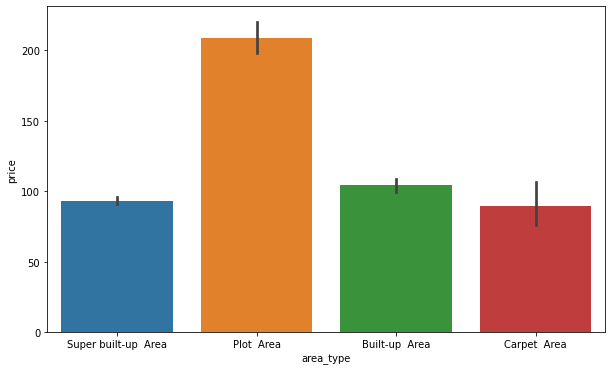

In [10]:
plt.figure(figsize=(10,6))
sns.barplot(x = df['area_type'], y = df['price'])
#Plot area houses in bengaluru costs more.

In [18]:
area = df.groupby('area_type')['price'].mean().sort_values()
#Aggregating Area type and taking mean price

In [61]:
df['area_type_val'] = df['area_type'].map(area.to_dict()).round(2)
#Mapping area type by its mean value

In [62]:
df['availability'].value_counts()

Ready To Move    11743
18-Dec             351
18-May             324
18-Apr             296
18-Aug             225
                 ...  
16-Jan               1
16-Apr               1
16-Nov               1
16-Oct               1
15-Dec               1
Name: availability, Length: 82, dtype: int64

In [57]:
aval=df.groupby('availability')['price'].mean().to_dict()
#Groupping availability and taking mean of those.

In [63]:
df['availability_val'] = df['availability'].map(aval).round(2)
#mapping availability column by its mean value

In [73]:
df['location'].value_counts(ascending=True)
#Frequency

2nd phase jp nagar, jp nagar                         1
Rammana Layout                                       1
Mudalpalaya                                          1
12th cross srinivas nagar banshankari 3rd stage      1
Thavarekere                                          1
                                                  ... 
Thanisandra                                        277
Kanakpura Road                                     298
Electronic City                                    337
Sarjapur  Road                                     437
Whitefield                                         591
Name: location, Length: 1358, dtype: int64

In [83]:
loc_map=df.groupby(['location'])['price'].mean().to_dict()
#Groupping based on location and calculating its mean value

In [85]:
df['location_val'] = df['location'].map(loc_map)
#Mapping location by its groupped mean values

In [89]:
df['location_val'].isna().sum()
#There is some values

54

In [90]:
df['location_val'].fillna(df['location_val'].mean(),inplace=True)
#Replacing null values by its mean

In [91]:
df['location_val'].isna().sum()
#Zero null values

0

In [94]:
df['size'].value_counts()
#Frequency of size of house.

2 BHK         5739
3 BHK         4788
4 Bedroom      918
4 BHK          673
3 Bedroom      613
1 BHK          592
2 Bedroom      368
5 Bedroom      338
6 Bedroom      208
1 Bedroom      122
7 Bedroom       95
8 Bedroom       94
5 BHK           61
9 Bedroom       54
6 BHK           35
7 BHK           18
10 Bedroom      15
1 RK            15
9 BHK           13
8 BHK            8
11 BHK           2
11 Bedroom       2
10 BHK           2
16 Bedroom       1
27 BHK           1
18 Bedroom       1
19 BHK           1
13 BHK           1
16 BHK           1
12 Bedroom       1
43 Bedroom       1
14 BHK           1
Name: size, dtype: int64

In [97]:
size_val = df.groupby('size')['price'].mean()
#Groupping up size and taking its mean value of price

In [103]:
df['size_val']=df['size'].map(size_val).round(2)
#mapping size by its mean of price.

In [104]:
df['size_val'].isna().sum()
#Checking for null values in size val column

19

In [106]:
df['size_val'].fillna(df['size_val'].mean(), inplace = True)
#Filling null values by its mean.

In [107]:
df['size_val']

0        57.43
1       265.07
2       104.95
3       104.95
4        57.43
         ...  
1475     57.43
1476    104.95
1477     57.43
1478     57.43
1479     57.43
Name: size_val, Length: 14800, dtype: float64

In [111]:
df['society'].value_counts()
#Frequency of values in society column.

GrrvaGr    92
PrarePa    78
Prtates    64
Bhmesy     63
Sryalan    63
           ..
Shntsad     1
BDensar     1
Diarknt     1
Maidei      1
Apntsal     1
Name: society, Length: 2832, dtype: int64

In [117]:
df.groupby('society')['price'].mean().sort_values(ascending= False)

society
Kierser    2700.0
Epllan     1915.0
Adion A    1800.0
Phaku K    1500.0
LeeyaCa    1063.0
            ...  
Vasta V       NaN
VeniaGa       NaN
Winerri       NaN
Wisic C       NaN
YMarlti       NaN
Name: price, Length: 2832, dtype: float64

In [121]:
df['society'].isna().mean()
#nearly 41% null values in this column

0.41405405405405404

In [128]:
df['total_sqft'].value_counts()

1200      940
1100      240
1500      238
2400      224
600       200
         ... 
1471        1
1234.6      1
3530        1
2767        1
2872        1
Name: total_sqft, Length: 2221, dtype: int64

In [135]:
num = 0
obj = 0
for i in df['total_sqft'].unique():
    p
        

        
        

1056
2600
1440
1521
1200
1170
2732
3300
1310
1020
1800
2785
1000
1100
2250
1175
1180
1540
2770
600
1755
2800
1767
510
1250
660
1610
1151
1025
2100 - 2850
1075
1760
1693
1925
700
1070
1724
1290
1143
1296
1254
1330.74
970
1459
800
869
1270
1670
2010
1185
1600
3010 - 3410
1500
1407
840
4395
845
5700
1160
3000
1140
1220
1350
1005
500
1358
1569
1240
2089
1206
1150
2511
460
4400
1660
2957 - 3450
1326
1325
1499
1665
708
1060
710
1450
2894
1330
2502
650
2400
1007
966
1630
1640
782
1260
1413
1116
1530
3700
2497
1436
276
1427
2061
3067 - 8156
2650
1282
1050
945
950
1870
880
1535
1360
1042 - 1105
1280
5000
3050
1563.05
1167
4000
1828
890
1612
1034
1710
957
2795
1125
1735
2050
3750
1063
1904
4200
2000
1145 - 1340
1425
1470
1300
450
1152
1550
400
705
770
1242
1700
2144
1704
1846
1340
1015 - 1540
1327
1186
1783
1400
980
1285
912
1225
1909
1359
1207
1736
2850
1595
1798
1475
1580
1295
3600
589
1415
1787
984
1520 - 1740
2405
1080
1900
805
1153
1148
1110
1933
3500
645
1644
910
1577
4050
2420
900
1108
30

655 - 742
3170
907
800 - 2660
1741
3463
2120
1107.83
505
1408 - 1455
2901
4050 - 4075
1713
1266.67
942 - 1117
2679
1777.26
3044
3150
3090
1750 - 2640
2093
790
1744
2476
1877
1649
766
1593
1333
1390 - 1600
598 - 958
1631
1013
1500Cents
4250
1829
5720
2047
2132
1412
1044
7200
646
2456
1439
2210
1409
5924
552
2365
864
1806
1066
2293
1903
1567.2
26136
959
132Sq. Yards
855
1885
1691.2
1010 - 1300
2122
11000
1099
2Acres
1283
3103 - 3890
1450 - 1950
2023
2274.24
4900
2079
3589
1770
1244
470
2095
2134
2515
1970
2665
2130
1100Sq. Meter
947.55
1421
15Acres
3990
2501
381
3301.8
1450 - 1595
3204
3408
1496
1860
3489
4166
1763
763 - 805
1002
3307 - 3464
2260
1.26Acres
5422
620 - 934
1542.14
3746
5100
2144.6
1087
1061
2462 - 2467
540 - 740
10200
5200
1618 - 1929
20000
1284
3508 - 4201
1613
6830
3692
1503
4408
7800
1962
1894
1568
4900 - 4940
3060
873
2666
1610 - 1880
3633
755 - 770
3978
3621
2008
1362
694
1674
3033
1181.7
1338
2625
2041
3565
1502
3870
4097
1601
664 - 722
2380
3569
151.11Sq. Yards
3435

In [147]:
a='45.06Sq. Meter'.split('S')

In [149]:
a[0]

'45.06'

In [146]:
(int(a[0])+int(a[2]))/2

2475.0

In [162]:
def changing_val(x):
    if '-' in x:
        
        val = '2100 - 2850'.split() 
        mean_val = (int(val[0])+int(val[2]))/2
        
        return mean_val
    
    elif 'Meter' in x:
        one_m = 10.764
        splt = x.split('S')
        feet = one_m * float(splt[0])
        
        return feet
    
    elif 'Perch' in x:
        one_p = 272.25
        splt = x.split('P')
        val = one_p* float(splt[0])
        
        return val
    elif 'Yards' in x:
        one_yard = 9
        splt = x.split('S')
        val = one_yard * float(splt[0])
        
        return val
    
    elif 'Acres' in x:
        one_acre = 43560
        splt = x.split('A')
        val = one_acre * float(splt[0])
        
        return val
    
    elif 'Cents' in x:
        one_cent = 435.6
        splt = x.split('C')
        val = one_cent * float(splt[0])
        
        return val
    
    elif 'Guntha' in x:
        one_gun = 1089
        splt = x.split('G')
        val = one_gun * float(splt[0])
        
        return val
    elif 'Grounds' in x:
        one_gro = 2400
        splt = x.split('G')
        val = one_gro * float(splt[0])
        
        return val
    else:
        
        return x

In [169]:
df['total_sqft_con']=df['total_sqft'].apply(changing_val).astype(float)

In [176]:
df['total_sqft_con'].head(10)

0    1056.0
1    2600.0
2    1440.0
3    1521.0
4    1200.0
5    1170.0
6    2732.0
7    3300.0
8    1310.0
9    1020.0
Name: total_sqft_con, dtype: float64

In [177]:
df['bath'].value_counts()

2.0     7652
3.0     3657
4.0     1375
1.0      871
5.0      586
6.0      303
7.0      113
8.0       73
9.0       52
10.0      17
12.0       7
11.0       3
13.0       3
16.0       3
14.0       1
40.0       1
18.0       1
27.0       1
15.0       1
Name: bath, dtype: int64

In [180]:
df[df['bath'].isna()]

,area_type,availability,location,size,society,total_sqft,bath,balcony,price,area_type_val,availability_enc,availability_val,location_val,size_val,total_sqft_con
56,Built-up Area,20-Feb,Devanahalli,4 Bedroom,BrereAt,3010 - 3410,NaN,NaN,192.000,104.29,Later,135.60,119.839111,265.070000,2475.0
81,Built-up Area,18-Oct,Hennur Road,4 Bedroom,Gollela,2957 - 3450,NaN,NaN,224.500,104.29,Later,82.04,103.507533,265.070000,2475.0
224,Super built-up Area,19-Dec,Devanahalli,3 BHK,Jurdsig,1520 - 1740,NaN,NaN,74.820,92.97,Later,111.38,119.839111,104.950000,2475.0
344,Super built-up Area,21-Dec,Kanakpura Road,1 BHK,PrarePa,525,NaN,NaN,21.530,92.97,Later,64.65,70.533791,39.530000,525.0
579,Plot Area,Immediate Possession,Sarjapur Road,NaN,Asiss B,1200 - 2400,NaN,NaN,34.185,208.50,Later,98.92,118.940965,112.999664,2475.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
817,Super built-up Area,19-Dec,Binny Pete,4 BHK,Shestlo,2695 - 2940,NaN,NaN,NaN,92.97,Later,111.38,150.195714,278.420000,2475.0
1155,Super built-up Area,18-Nov,Thanisandra,4 BHK,Bhe 2ko,2259,NaN,NaN,NaN,92.97,Later,61.65,82.725598,278.420000,2259.0
1160,Plot Area,Immediate Possession,Hosa Road,NaN,MSodsGr,600 - 4000,NaN,NaN,NaN,208.50,Later,98.92,70.333750,112.999664,2475.0
1231,Super built-up Area,19-Dec,Binny Pete,4 BHK,Shestlo,2695 - 2940,NaN,NaN,NaN,92.97,Later,111.38,150.195714,278.420000,2475.0


In [216]:
df['bath_en']=df['bath'].fillna(df['total_sqft_con']//500)

In [217]:
df['bath_en'].isna().sum()

0

In [221]:
df[df['balcony'].isna()]

,area_type,availability,location,size,society,total_sqft,bath,balcony,price,area_type_val,availability_enc,availability_val,location_val,size_val,total_sqft_con,bath_en
6,Super built-up Area,18-May,Old Airport Road,4 BHK,Jaades,2732,4.0,NaN,204.0,92.97,Later,99.38,184.080303,278.42,2732.0,4.0
7,Super built-up Area,Ready To Move,Rajaji Nagar,4 BHK,Brway G,3300,4.0,NaN,600.0,92.97,Ready To Move,115.18,327.693084,278.42,3300.0,4.0
9,Plot Area,Ready To Move,Gandhi Bazar,6 Bedroom,NaN,1020,6.0,NaN,370.0,208.50,Ready To Move,115.18,240.000000,226.46,1020.0,6.0
34,Built-up Area,Ready To Move,Kasturi Nagar,3 BHK,Kantsce,1925,3.0,NaN,125.0,104.29,Ready To Move,115.18,127.968750,104.95,1925.0,3.0
40,Built-up Area,Ready To Move,Murugeshpalya,2 BHK,Gentson,1296,2.0,NaN,81.0,104.29,Ready To Move,115.18,102.571429,57.43,1296.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1458,Built-up Area,Ready To Move,Kithaganur,8 Bedroom,NaN,3500,7.0,NaN,NaN,104.29,Ready To Move,115.18,64.666667,209.67,3500.0,7.0
1465,Super built-up Area,Ready To Move,Marathahalli,3 BHK,PuilaMi,1730,3.0,NaN,NaN,92.97,Ready To Move,115.18,102.213714,104.95,1730.0,3.0
1467,Super built-up Area,Ready To Move,Kundalahalli,2 BHK,NaN,1588,2.0,NaN,NaN,92.97,Ready To Move,115.18,132.657660,57.43,1588.0,2.0
1471,Super built-up Area,Ready To Move,Kalena Agrahara,3 BHK,KlarkBe,1731,3.0,NaN,NaN,92.97,Ready To Move,115.18,73.484848,104.95,1731.0,3.0


In [231]:
df['balcony_en'] = df['balcony'].fillna(df['bath_en']/2)

In [234]:
df1 = df.drop(['area_type', 'availability', 'location', 'size', 'society', 'total_sqft', 'bath', 'balcony'],axis=1)

In [235]:
df1.isna().sum()

price               1480
area_type_val          0
availability_enc       0
availability_val       1
location_val           0
size_val               0
total_sqft_con         0
bath_en                0
balcony_en             0
dtype: int64

In [238]:
df1['availability_val'].fillna(df1['availability_val'].mean(), inplace=True)

In [240]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14800 entries, 0 to 1479
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             13320 non-null  float64
 1   area_type_val     14800 non-null  float64
 2   availability_enc  14800 non-null  object 
 3   availability_val  14800 non-null  float64
 4   location_val      14800 non-null  float64
 5   size_val          14800 non-null  float64
 6   total_sqft_con    14800 non-null  float64
 7   bath_en           14800 non-null  float64
 8   balcony_en        14800 non-null  float64
dtypes: float64(8), object(1)
memory usage: 1.6+ MB


In [242]:
df1 = pd.get_dummies(df1)

In [249]:
df1.head()

,price,area_type_val,availability_val,location_val,size_val,total_sqft_con,bath_en,balcony_en,availability_enc_Later,availability_enc_Ready To Move
0,39.07,92.97,111.38,48.316667,57.43,1056.0,2.0,1.0,1,0
1,120.00,208.50,115.18,115.015882,265.07,2600.0,5.0,3.0,0,1
2,62.00,104.29,115.18,61.252527,104.95,1440.0,2.0,3.0,0,1
3,95.00,92.97,115.18,115.348261,104.95,1521.0,3.0,1.0,0,1
4,51.00,92.97,115.18,95.630303,57.43,1200.0,2.0,1.0,0,1


In [258]:
train_data = df1.iloc[:-1480]
test_data =  df1.iloc[-1480:]

In [259]:
train_data.head()

,price,area_type_val,availability_val,location_val,size_val,total_sqft_con,bath_en,balcony_en,availability_enc_Later,availability_enc_Ready To Move
0,39.07,92.97,111.38,48.316667,57.43,1056.0,2.0,1.0,1,0
1,120.00,208.50,115.18,115.015882,265.07,2600.0,5.0,3.0,0,1
2,62.00,104.29,115.18,61.252527,104.95,1440.0,2.0,3.0,0,1
3,95.00,92.97,115.18,115.348261,104.95,1521.0,3.0,1.0,0,1
4,51.00,92.97,115.18,95.630303,57.43,1200.0,2.0,1.0,0,1


In [260]:
test_data.head()

,price,area_type_val,availability_val,location_val,size_val,total_sqft_con,bath_en,balcony_en,availability_enc_Later,availability_enc_Ready To Move
0,NaN,92.97,115.18,118.489362,57.43,1225.0,2.0,2.0,0,1
1,NaN,208.50,115.18,85.345161,240.85,2400.0,9.0,2.0,0,1
2,NaN,208.50,100.05,103.507533,265.07,1650.0,5.0,2.0,1,0
3,NaN,92.97,115.18,69.648148,104.95,1322.0,3.0,1.0,0,1
4,NaN,92.97,115.18,189.230769,57.43,1161.0,2.0,1.0,0,1


In [261]:
X = train_data.drop('price', axis=1)

y = train_data['price']

test_data.drop('price', axis = 1, inplace = True)

/Applications/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [262]:
X.head()

,area_type_val,availability_val,location_val,size_val,total_sqft_con,bath_en,balcony_en,availability_enc_Later,availability_enc_Ready To Move
0,92.97,111.38,48.316667,57.43,1056.0,2.0,1.0,1,0
1,208.50,115.18,115.015882,265.07,2600.0,5.0,3.0,0,1
2,104.29,115.18,61.252527,104.95,1440.0,2.0,3.0,0,1
3,92.97,115.18,115.348261,104.95,1521.0,3.0,1.0,0,1
4,92.97,115.18,95.630303,57.43,1200.0,2.0,1.0,0,1


#### Train Test Split

In [265]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

#### Model

In [330]:
def metrics(y_true, y_pred):
    print('MAE:', mean_absolute_error(y_true, y_pred))
    print('MAPE:', mean_absolute_percentage_error(y_true, y_pred))
    print('MSE:', mean_squared_error(y_true, y_pred))
    print('RSME:', np.sqrt(mean_squared_error(y_true, y_pred)))
    print('R2 Score:', r2_score(y_true, y_pred))
    val = 1 - np.sqrt(np.square(np.log10(y_pred +1) - np.log10(y_true +1)).mean())
    
    print('Machine Hack Metrics:',val)
    
def predictions(model, X_train = X_train, X_test = X_test, y_train = y_train, y_test = y_test, test = False):
    
    model.fit(X_train, y_train)
    
    train_pred = model.predict(X_train)
    
    test_pred = model.predict(X_test)
    
    actual = [y_train, y_test]
    
    pred = [train_pred, test_pred]
    
    data = ['Train', 'Test']
    
    for i in range(2):
        
        print(data[i],'\n')
        
        metrics(actual[i], pred[i])
        
    if test:
        
        final_pred(model)
        
def final_pred(model, test_data = test_data, X = X, y = y):
    
    model.fit(X, y)
    
    test_pred = model.predict(test_data)
    
    pd.DataFrame(test_pred, index = test_data.index, columns=['price']).to_csv(str(model)[:10]+' pred.csv', index = False)
    
    print('Done')


#### Linear Regression

In [325]:
lr = LinearRegression()

predictions(lr, test=True)

Train 

MAE: 46.300144203728244
MAPE: 0.47540001755269706
MSE: 10932.81393122542
RSME: 104.56009722272364
R2 Score: 0.5374127829456161
0.7375564873963742
Test 

MAE: 43.56918527273717
MAPE: 0.45067719556022795
MSE: 8740.540692539484
RSME: 93.49085887154682
R2 Score: 0.5352986809814604
0.746341030724204
Done


#### KNN

In [326]:
knn = KNeighborsRegressor()

predictions(knn, test=True)

Train 

MAE: 25.735573895323892
MAPE: 0.2146492554496531
MSE: 5224.723238181359
RSME: 72.28224704712326
R2 Score: 0.7789324690026272
0.8826795998639975
Test 

MAE: 29.822545545545545
MAPE: 0.2599304211744047
MSE: 5856.7477052802815
RSME: 76.52939112053801
R2 Score: 0.6886189905705015
0.8612083693353374
Done


#### SVM

In [339]:
svm = SVR()

predictions(svm)

Train 

MAE: 54.92867847927894
MAPE: 0.4230661277781305
MSE: 20609.07006106348
RSME: 143.55859452176134
R2 Score: 0.12799280902445576
Machine Hack Metrics: 0.7516294593384888
Test 

MAE: 50.96897310460768
MAPE: 0.4120508886119255
MSE: 16073.227019332931
RSME: 126.78023118504292
R2 Score: 0.1454476262385178
Machine Hack Metrics: 0.7607723097820224


#### Decision Tree

In [327]:
dtree = DecisionTreeRegressor()

predictions(dtree, test=True)

Train 

MAE: 0.6527922908994339
MAPE: 0.007745723900369407
MSE: 13.064555490010338
RSME: 3.614492424948535
R2 Score: 0.9994472149252521
0.9856051575687468
Test 

MAE: 32.39674418366779
MAPE: 0.27004371216394935
MSE: 7558.546785013899
RSME: 86.93990329540227
R2 Score: 0.5981408033650162
0.8427117652189462
Done


#### Bagging

In [329]:
bag = BaggingRegressor()

predictions(bag, test = True)

Train 

MAE: 11.645036782257861
MAPE: 0.09852145902849291
MSE: 979.4583072035311
RSME: 31.29629861826365
R2 Score: 0.9585573398211769
0.9364728216570101
Test 

MAE: 27.140213372329715
MAPE: 0.2352650694521551
MSE: 4626.015017465637
RSME: 68.01481469110709
R2 Score: 0.7540523686079568
0.8700363882173509
Done


#### Random Forest

In [328]:
rf = RandomForestRegressor()

predictions(rf, test = True)

Train 

MAE: 10.587302700099421
MAPE: 0.0908384525095481
MSE: 761.5349705758935
RSME: 27.59592307888782
R2 Score: 0.9677780720549765
0.9428373896108313
Test 

MAE: 25.41185811515057
MAPE: 0.2234147753737937
MSE: 4316.4203227323715
RSME: 65.69946972946107
R2 Score: 0.7705123415163251
0.8759383144764418
Done


In [349]:
params_rf = {'min_samples_split':[3, 5, 7],
            'max_depth' : [5, 7, 9, 11],
            'min_samples_leaf' : [1, 3, 5, 7]}

In [351]:
grid_rf = GridSearchCV(rf, params_rf, cv=2 , verbose=3, n_jobs=-1)

In [352]:
grid_rf.fit(X_train, y_train)

Fitting 2 folds for each of 48 candidates, totalling 96 fits


GridSearchCV(cv=2, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [5, 7, 9, 11],
                         'min_samples_leaf': [1, 3, 5, 7],
                         'min_samples_split': [3, 5, 7]},
             verbose=3)

In [353]:
grid_rf.best_params_

{'max_depth': 11, 'min_samples_leaf': 3, 'min_samples_split': 3}

In [354]:
grid_rf.best_score_

0.7559050095397128

In [355]:
predictions(RandomForestRegressor(max_depth=11, min_samples_leaf=3, min_samples_split=3))

Train 

MAE: 21.17501026194383
MAPE: 0.2009839249028927
MSE: 2416.175415271329
RSME: 49.15460726393131
R2 Score: 0.8977672291601595
Machine Hack Metrics: 0.8931406055449052
Test 

MAE: 26.343008364020584
MAPE: 0.2378173426611988
MSE: 4191.474693748761
RSME: 64.74159940678605
R2 Score: 0.7771552255937191
Machine Hack Metrics: 0.8741439757354275


#### ADA Boost

In [331]:
ada = AdaBoostRegressor()

predictions(ada, test = True)

Train 

MAE: 116.07641446462301
MAPE: 1.7375669663789732
MSE: 19789.67540792588
RSME: 140.67578117048393
R2 Score: 0.16266288524166617
Machine Hack Metrics: 0.5683280416470071
Test 

MAE: 113.55635432482529
MAPE: 1.7300622574146978
MSE: 19589.315310790986
RSME: 139.9618351937091
R2 Score: -0.041489420827786505
Machine Hack Metrics: 0.5692103074109147
Done


#### Gradient Boost

In [332]:
grad = GradientBoostingRegressor()

predictions(grad, test = True)

Train 

MAE: 26.95019194752205
MAPE: 0.26502514691722673
MSE: 2921.6754537645843
RSME: 54.052524952721534
R2 Score: 0.8763786042829346
Machine Hack Metrics: 0.8647740004102621
Test 

MAE: 28.527661588628117
MAPE: 0.268674050480939
MSE: 4394.861212975289
RSME: 66.29374942613586
R2 Score: 0.7663419375970361
Machine Hack Metrics: 0.8631801586551519
Done


#### Light GBM

In [334]:
lgbm = LGBMRegressor()

predictions(lgbm , test = True)

Train 

MAE: 23.57067117850112
MAPE: 0.23016835726653248
MSE: 2558.5799856160784
RSME: 50.58240786692621
R2 Score: 0.8917418331087863
Machine Hack Metrics: 0.8798666679115501
Test 

MAE: 27.12649001534792
MAPE: 0.24952189373560116
MSE: 4246.322432842383
RSME: 65.16381229518714
R2 Score: 0.7742391798250923
Machine Hack Metrics: 0.8701767468361241
Done


#### XG Boost

In [335]:
xg = XGBRegressor()

predictions(xg, test = True)

Train 

MAE: 15.452357649518818
MAPE: 0.1780616029865793
MSE: 633.0503592394717
RSME: 25.16049203094947
R2 Score: 0.9732144893548882
Machine Hack Metrics: 0.9042782362162045
Test 

MAE: 26.5375870962878
MAPE: 0.23826735145425734
MSE: 4556.485766939746
RSME: 67.50174639918397
R2 Score: 0.757748974523576
Machine Hack Metrics: 0.8729137799783317
Done


#### CAT Boost

In [337]:
cat = CatBoostRegressor()

predictions(cat)

Learning rate set to 0.058075
0:	learn: 148.1369632	total: 4.53ms	remaining: 4.52s
1:	learn: 143.1490842	total: 7.38ms	remaining: 3.68s
2:	learn: 138.0236538	total: 10.3ms	remaining: 3.44s
3:	learn: 133.6115468	total: 13ms	remaining: 3.25s
4:	learn: 129.7478835	total: 16.3ms	remaining: 3.24s
5:	learn: 125.6044721	total: 19.3ms	remaining: 3.2s
6:	learn: 121.6278476	total: 22.7ms	remaining: 3.22s
7:	learn: 118.1563046	total: 25.6ms	remaining: 3.17s
8:	learn: 114.7083382	total: 28.4ms	remaining: 3.13s
9:	learn: 111.5955046	total: 31.1ms	remaining: 3.08s
10:	learn: 108.6218863	total: 35.3ms	remaining: 3.17s
11:	learn: 105.9919884	total: 38.3ms	remaining: 3.16s
12:	learn: 103.3439265	total: 41.1ms	remaining: 3.12s
13:	learn: 100.9165667	total: 43.9ms	remaining: 3.09s
14:	learn: 98.5054707	total: 46.7ms	remaining: 3.07s
15:	learn: 96.6817057	total: 49.7ms	remaining: 3.06s
16:	learn: 94.6103365	total: 52.5ms	remaining: 3.04s
17:	learn: 92.6587654	total: 55.3ms	remaining: 3.02s
18:	learn: 90.7

172:	learn: 55.3485365	total: 546ms	remaining: 2.61s
173:	learn: 55.2840987	total: 549ms	remaining: 2.6s
174:	learn: 55.2650184	total: 553ms	remaining: 2.61s
175:	learn: 55.1869001	total: 556ms	remaining: 2.6s
176:	learn: 55.1703556	total: 559ms	remaining: 2.6s
177:	learn: 55.1099517	total: 562ms	remaining: 2.59s
178:	learn: 55.0808756	total: 565ms	remaining: 2.59s
179:	learn: 55.0491887	total: 568ms	remaining: 2.59s
180:	learn: 54.9983799	total: 571ms	remaining: 2.58s
181:	learn: 54.9408852	total: 576ms	remaining: 2.59s
182:	learn: 54.9055776	total: 581ms	remaining: 2.59s
183:	learn: 54.8478761	total: 585ms	remaining: 2.59s
184:	learn: 54.8296577	total: 587ms	remaining: 2.59s
185:	learn: 54.8098392	total: 590ms	remaining: 2.58s
186:	learn: 54.7723592	total: 593ms	remaining: 2.58s
187:	learn: 54.7418051	total: 596ms	remaining: 2.58s
188:	learn: 54.6529109	total: 599ms	remaining: 2.57s
189:	learn: 54.6236866	total: 602ms	remaining: 2.56s
190:	learn: 54.5961048	total: 605ms	remaining: 2.

360:	learn: 47.9866884	total: 1.25s	remaining: 2.22s
361:	learn: 47.9656135	total: 1.26s	remaining: 2.22s
362:	learn: 47.9346878	total: 1.26s	remaining: 2.21s
363:	learn: 47.8945268	total: 1.26s	remaining: 2.21s
364:	learn: 47.8762349	total: 1.27s	remaining: 2.21s
365:	learn: 47.8742100	total: 1.27s	remaining: 2.2s
366:	learn: 47.8237570	total: 1.27s	remaining: 2.2s
367:	learn: 47.7964343	total: 1.28s	remaining: 2.19s
368:	learn: 47.7469013	total: 1.28s	remaining: 2.19s
369:	learn: 47.7274943	total: 1.28s	remaining: 2.19s
370:	learn: 47.7016877	total: 1.29s	remaining: 2.18s
371:	learn: 47.6848919	total: 1.29s	remaining: 2.18s
372:	learn: 47.6830212	total: 1.29s	remaining: 2.17s
373:	learn: 47.6648395	total: 1.29s	remaining: 2.17s
374:	learn: 47.6067777	total: 1.3s	remaining: 2.16s
375:	learn: 47.5776936	total: 1.3s	remaining: 2.16s
376:	learn: 47.5172624	total: 1.3s	remaining: 2.15s
377:	learn: 47.4805952	total: 1.31s	remaining: 2.16s
378:	learn: 47.4340921	total: 1.31s	remaining: 2.15

520:	learn: 44.1494972	total: 1.79s	remaining: 1.65s
521:	learn: 44.1149457	total: 1.8s	remaining: 1.65s
522:	learn: 44.1029652	total: 1.8s	remaining: 1.64s
523:	learn: 44.0824739	total: 1.81s	remaining: 1.65s
524:	learn: 44.0786470	total: 1.81s	remaining: 1.64s
525:	learn: 44.0469031	total: 1.82s	remaining: 1.64s
526:	learn: 44.0370325	total: 1.82s	remaining: 1.64s
527:	learn: 44.0138062	total: 1.83s	remaining: 1.64s
528:	learn: 44.0099284	total: 1.84s	remaining: 1.64s
529:	learn: 43.9894991	total: 1.85s	remaining: 1.64s
530:	learn: 43.9778656	total: 1.85s	remaining: 1.63s
531:	learn: 43.9548277	total: 1.86s	remaining: 1.64s
532:	learn: 43.9479891	total: 1.87s	remaining: 1.64s
533:	learn: 43.9380754	total: 1.87s	remaining: 1.64s
534:	learn: 43.9080867	total: 1.88s	remaining: 1.63s
535:	learn: 43.8918178	total: 1.89s	remaining: 1.63s
536:	learn: 43.8680645	total: 1.89s	remaining: 1.63s
537:	learn: 43.8376606	total: 1.9s	remaining: 1.63s
538:	learn: 43.8150956	total: 1.91s	remaining: 1.

681:	learn: 41.0580508	total: 2.53s	remaining: 1.18s
682:	learn: 41.0516563	total: 2.54s	remaining: 1.18s
683:	learn: 41.0444524	total: 2.54s	remaining: 1.17s
684:	learn: 41.0398663	total: 2.54s	remaining: 1.17s
685:	learn: 41.0216995	total: 2.55s	remaining: 1.17s
686:	learn: 41.0100283	total: 2.55s	remaining: 1.16s
687:	learn: 40.9976674	total: 2.56s	remaining: 1.16s
688:	learn: 40.9691808	total: 2.56s	remaining: 1.16s
689:	learn: 40.9594525	total: 2.57s	remaining: 1.15s
690:	learn: 40.9414053	total: 2.57s	remaining: 1.15s
691:	learn: 40.9235892	total: 2.58s	remaining: 1.15s
692:	learn: 40.9087629	total: 2.58s	remaining: 1.14s
693:	learn: 40.8970583	total: 2.58s	remaining: 1.14s
694:	learn: 40.8854242	total: 2.59s	remaining: 1.14s
695:	learn: 40.8652831	total: 2.6s	remaining: 1.13s
696:	learn: 40.8490536	total: 2.6s	remaining: 1.13s
697:	learn: 40.8279446	total: 2.6s	remaining: 1.13s
698:	learn: 40.8073581	total: 2.61s	remaining: 1.12s
699:	learn: 40.7933069	total: 2.61s	remaining: 1.

838:	learn: 38.8172186	total: 3.27s	remaining: 627ms
839:	learn: 38.8073468	total: 3.27s	remaining: 624ms
840:	learn: 38.7980236	total: 3.28s	remaining: 620ms
841:	learn: 38.7939198	total: 3.28s	remaining: 616ms
842:	learn: 38.7844628	total: 3.29s	remaining: 612ms
843:	learn: 38.7815633	total: 3.29s	remaining: 608ms
844:	learn: 38.7527507	total: 3.29s	remaining: 605ms
845:	learn: 38.7415671	total: 3.3s	remaining: 600ms
846:	learn: 38.7194587	total: 3.3s	remaining: 597ms
847:	learn: 38.6934398	total: 3.31s	remaining: 593ms
848:	learn: 38.6622685	total: 3.31s	remaining: 589ms
849:	learn: 38.6363287	total: 3.32s	remaining: 585ms
850:	learn: 38.6207445	total: 3.32s	remaining: 581ms
851:	learn: 38.6042888	total: 3.32s	remaining: 577ms
852:	learn: 38.5842832	total: 3.33s	remaining: 573ms
853:	learn: 38.5711677	total: 3.33s	remaining: 570ms
854:	learn: 38.5462653	total: 3.34s	remaining: 566ms
855:	learn: 38.5345378	total: 3.34s	remaining: 562ms
856:	learn: 38.5240401	total: 3.35s	remaining: 5

Train 

MAE: 20.793377373295513
MAPE: 0.21562943598471956
MSE: 1353.193090857532
RSME: 36.78577294087392
R2 Score: 0.9427439422298077
Machine Hack Metrics: 0.8871763265188625
Test 

MAE: 26.776837747960986
MAPE: 0.2488383981128826
MSE: 4515.947824241027
RSME: 67.20080225890928
R2 Score: 0.759904222820569
Machine Hack Metrics: 0.8707994813878039


In [340]:
## Hyper Parameter

params = {
    'learning_rate' : [0.05, 0.10, 0.15, 0.20],
    'max_depth' : [3, 4, 5],
    'min_child_samples': [1, 3, 5],
    'l2_leaf_reg':[5,10,15]
    
}

In [342]:
grid = GridSearchCV(cat, params, cv=2, verbose=3)

grid.fit(X_train, y_train)

Fitting 2 folds for each of 108 candidates, totalling 216 fits
0:	learn: 152.0737612	total: 2.07ms	remaining: 2.06s
1:	learn: 148.2087272	total: 3.92ms	remaining: 1.96s
2:	learn: 144.6380526	total: 5.18ms	remaining: 1.72s
3:	learn: 141.1244738	total: 6.55ms	remaining: 1.63s
4:	learn: 138.1120305	total: 7.81ms	remaining: 1.55s
5:	learn: 134.7644141	total: 9.11ms	remaining: 1.51s
6:	learn: 131.9834586	total: 10.5ms	remaining: 1.49s
7:	learn: 129.3026858	total: 11.8ms	remaining: 1.46s
8:	learn: 126.8533336	total: 13.1ms	remaining: 1.44s
9:	learn: 124.5077531	total: 14.4ms	remaining: 1.42s
10:	learn: 122.2988633	total: 15.7ms	remaining: 1.41s
11:	learn: 120.1922204	total: 16.9ms	remaining: 1.39s
12:	learn: 118.1856120	total: 18.2ms	remaining: 1.38s
13:	learn: 116.3100406	total: 19.7ms	remaining: 1.39s
14:	learn: 114.3399148	total: 20.8ms	remaining: 1.36s
15:	learn: 112.4994267	total: 22.2ms	remaining: 1.36s
16:	learn: 110.5241370	total: 23.4ms	remaining: 1.35s
17:	learn: 108.8603491	total:

195:	learn: 64.4774828	total: 305ms	remaining: 1.25s
196:	learn: 64.4755754	total: 308ms	remaining: 1.25s
197:	learn: 64.4495011	total: 310ms	remaining: 1.25s
198:	learn: 64.4313359	total: 311ms	remaining: 1.25s
199:	learn: 64.4140195	total: 312ms	remaining: 1.25s
200:	learn: 64.3726051	total: 313ms	remaining: 1.24s
201:	learn: 64.3055475	total: 314ms	remaining: 1.24s
202:	learn: 64.2889655	total: 316ms	remaining: 1.24s
203:	learn: 64.2821489	total: 317ms	remaining: 1.24s
204:	learn: 64.2254309	total: 318ms	remaining: 1.23s
205:	learn: 64.1894994	total: 319ms	remaining: 1.23s
206:	learn: 64.1721357	total: 320ms	remaining: 1.23s
207:	learn: 64.1482558	total: 322ms	remaining: 1.23s
208:	learn: 64.1325151	total: 324ms	remaining: 1.23s
209:	learn: 64.1174788	total: 327ms	remaining: 1.23s
210:	learn: 64.0789375	total: 328ms	remaining: 1.23s
211:	learn: 64.0565937	total: 330ms	remaining: 1.23s
212:	learn: 64.0349562	total: 331ms	remaining: 1.22s
213:	learn: 64.0139967	total: 332ms	remaining:

442:	learn: 58.1843409	total: 641ms	remaining: 806ms
443:	learn: 58.1519754	total: 643ms	remaining: 805ms
444:	learn: 58.1283508	total: 644ms	remaining: 804ms
445:	learn: 58.1233223	total: 646ms	remaining: 802ms
446:	learn: 58.1119645	total: 647ms	remaining: 800ms
447:	learn: 58.0993014	total: 648ms	remaining: 799ms
448:	learn: 58.0819066	total: 649ms	remaining: 797ms
449:	learn: 58.0655261	total: 652ms	remaining: 797ms
450:	learn: 58.0377132	total: 653ms	remaining: 795ms
451:	learn: 58.0251826	total: 655ms	remaining: 794ms
452:	learn: 57.9959127	total: 656ms	remaining: 792ms
453:	learn: 57.9838600	total: 663ms	remaining: 797ms
454:	learn: 57.9718777	total: 666ms	remaining: 798ms
455:	learn: 57.9574395	total: 668ms	remaining: 797ms
456:	learn: 57.9317200	total: 669ms	remaining: 795ms
457:	learn: 57.9023403	total: 670ms	remaining: 793ms
458:	learn: 57.8909622	total: 671ms	remaining: 791ms
459:	learn: 57.8701304	total: 673ms	remaining: 790ms
460:	learn: 57.8657366	total: 674ms	remaining:

652:	learn: 54.8564920	total: 969ms	remaining: 515ms
653:	learn: 54.8390588	total: 970ms	remaining: 513ms
654:	learn: 54.8126071	total: 972ms	remaining: 512ms
655:	learn: 54.8040570	total: 973ms	remaining: 510ms
656:	learn: 54.7964667	total: 974ms	remaining: 509ms
657:	learn: 54.7798348	total: 976ms	remaining: 507ms
658:	learn: 54.7708718	total: 977ms	remaining: 505ms
659:	learn: 54.7688246	total: 978ms	remaining: 504ms
660:	learn: 54.7525018	total: 979ms	remaining: 502ms
661:	learn: 54.7364821	total: 981ms	remaining: 501ms
662:	learn: 54.7207595	total: 982ms	remaining: 499ms
663:	learn: 54.7141556	total: 983ms	remaining: 498ms
664:	learn: 54.6987149	total: 985ms	remaining: 496ms
665:	learn: 54.6966870	total: 986ms	remaining: 494ms
666:	learn: 54.6815244	total: 987ms	remaining: 493ms
667:	learn: 54.6637722	total: 989ms	remaining: 492ms
668:	learn: 54.6582648	total: 990ms	remaining: 490ms
669:	learn: 54.6433704	total: 995ms	remaining: 490ms
670:	learn: 54.6098364	total: 997ms	remaining:

872:	learn: 52.4250916	total: 1.29s	remaining: 188ms
873:	learn: 52.4084331	total: 1.3s	remaining: 187ms
874:	learn: 52.4022817	total: 1.3s	remaining: 185ms
875:	learn: 52.3743489	total: 1.3s	remaining: 184ms
876:	learn: 52.3735805	total: 1.3s	remaining: 182ms
877:	learn: 52.3677754	total: 1.3s	remaining: 181ms
878:	learn: 52.3626942	total: 1.3s	remaining: 179ms
879:	learn: 52.3576890	total: 1.3s	remaining: 178ms
880:	learn: 52.3448666	total: 1.3s	remaining: 176ms
881:	learn: 52.3399475	total: 1.31s	remaining: 175ms
882:	learn: 52.3360402	total: 1.31s	remaining: 173ms
883:	learn: 52.3285707	total: 1.31s	remaining: 172ms
884:	learn: 52.3212346	total: 1.31s	remaining: 170ms
885:	learn: 52.3142833	total: 1.31s	remaining: 169ms
886:	learn: 52.3085461	total: 1.31s	remaining: 167ms
887:	learn: 52.3005321	total: 1.31s	remaining: 166ms
888:	learn: 52.2892366	total: 1.31s	remaining: 164ms
889:	learn: 52.2799988	total: 1.32s	remaining: 163ms
890:	learn: 52.2779618	total: 1.32s	remaining: 161ms
8

62:	learn: 76.4174513	total: 88.6ms	remaining: 1.32s
63:	learn: 76.3522274	total: 90.4ms	remaining: 1.32s
64:	learn: 76.2994417	total: 91.8ms	remaining: 1.32s
65:	learn: 75.9165229	total: 93.9ms	remaining: 1.33s
66:	learn: 75.5798017	total: 95.4ms	remaining: 1.33s
67:	learn: 75.2043338	total: 96.6ms	remaining: 1.32s
68:	learn: 75.1134883	total: 98.9ms	remaining: 1.33s
69:	learn: 75.0260363	total: 100ms	remaining: 1.33s
70:	learn: 74.9396592	total: 101ms	remaining: 1.33s
71:	learn: 74.6123236	total: 103ms	remaining: 1.32s
72:	learn: 74.3306245	total: 104ms	remaining: 1.32s
73:	learn: 73.9324086	total: 106ms	remaining: 1.33s
74:	learn: 73.8780866	total: 108ms	remaining: 1.33s
75:	learn: 73.5099644	total: 109ms	remaining: 1.33s
76:	learn: 73.4586544	total: 110ms	remaining: 1.32s
77:	learn: 73.2564682	total: 113ms	remaining: 1.34s
78:	learn: 72.9273919	total: 114ms	remaining: 1.33s
79:	learn: 72.6101646	total: 116ms	remaining: 1.33s
80:	learn: 72.5625953	total: 117ms	remaining: 1.33s
81:	l

287:	learn: 57.5241240	total: 430ms	remaining: 1.06s
288:	learn: 57.5081240	total: 431ms	remaining: 1.06s
289:	learn: 57.4744276	total: 433ms	remaining: 1.06s
290:	learn: 57.4128661	total: 434ms	remaining: 1.06s
291:	learn: 57.3742007	total: 436ms	remaining: 1.06s
292:	learn: 57.3228238	total: 437ms	remaining: 1.05s
293:	learn: 57.2864572	total: 438ms	remaining: 1.05s
294:	learn: 57.2676008	total: 440ms	remaining: 1.05s
295:	learn: 57.2314153	total: 441ms	remaining: 1.05s
296:	learn: 57.2117818	total: 442ms	remaining: 1.05s
297:	learn: 57.1726861	total: 443ms	remaining: 1.04s
298:	learn: 57.1168967	total: 445ms	remaining: 1.04s
299:	learn: 57.0981393	total: 446ms	remaining: 1.04s
300:	learn: 57.0506855	total: 447ms	remaining: 1.04s
301:	learn: 57.0325879	total: 448ms	remaining: 1.04s
302:	learn: 57.0018694	total: 450ms	remaining: 1.03s
303:	learn: 56.9753295	total: 451ms	remaining: 1.03s
304:	learn: 56.9348475	total: 452ms	remaining: 1.03s
305:	learn: 56.9174040	total: 453ms	remaining:

551:	learn: 50.9566131	total: 774ms	remaining: 628ms
552:	learn: 50.9503145	total: 775ms	remaining: 627ms
553:	learn: 50.9304737	total: 777ms	remaining: 625ms
554:	learn: 50.9145503	total: 778ms	remaining: 624ms
555:	learn: 50.8752208	total: 779ms	remaining: 622ms
556:	learn: 50.8511476	total: 781ms	remaining: 621ms
557:	learn: 50.8263197	total: 783ms	remaining: 620ms
558:	learn: 50.7879555	total: 784ms	remaining: 619ms
559:	learn: 50.7817290	total: 786ms	remaining: 618ms
560:	learn: 50.7756279	total: 788ms	remaining: 617ms
561:	learn: 50.7553481	total: 789ms	remaining: 615ms
562:	learn: 50.7323562	total: 791ms	remaining: 614ms
563:	learn: 50.7135733	total: 794ms	remaining: 614ms
564:	learn: 50.7076192	total: 796ms	remaining: 613ms
565:	learn: 50.6803897	total: 797ms	remaining: 611ms
566:	learn: 50.6630265	total: 800ms	remaining: 611ms
567:	learn: 50.6346860	total: 801ms	remaining: 609ms
568:	learn: 50.6130048	total: 803ms	remaining: 608ms
569:	learn: 50.5914969	total: 805ms	remaining:

809:	learn: 47.2661760	total: 1.25s	remaining: 292ms
810:	learn: 47.2321060	total: 1.25s	remaining: 291ms
811:	learn: 47.2187178	total: 1.25s	remaining: 289ms
812:	learn: 47.2157533	total: 1.25s	remaining: 288ms
813:	learn: 47.2128511	total: 1.25s	remaining: 286ms
814:	learn: 47.1922137	total: 1.25s	remaining: 285ms
815:	learn: 47.1768996	total: 1.25s	remaining: 283ms
816:	learn: 47.1561637	total: 1.26s	remaining: 281ms
817:	learn: 47.1329107	total: 1.26s	remaining: 280ms
818:	learn: 47.1233536	total: 1.26s	remaining: 278ms
819:	learn: 47.1042900	total: 1.26s	remaining: 277ms
820:	learn: 47.0851698	total: 1.26s	remaining: 275ms
821:	learn: 47.0697326	total: 1.26s	remaining: 273ms
822:	learn: 47.0617925	total: 1.26s	remaining: 272ms
823:	learn: 47.0483557	total: 1.26s	remaining: 270ms
824:	learn: 47.0455003	total: 1.26s	remaining: 268ms
825:	learn: 47.0235919	total: 1.27s	remaining: 267ms
826:	learn: 47.0202535	total: 1.27s	remaining: 265ms
827:	learn: 47.0169741	total: 1.27s	remaining:

35:	learn: 88.2243625	total: 50.8ms	remaining: 1.36s
36:	learn: 87.4811494	total: 52ms	remaining: 1.35s
37:	learn: 86.7001954	total: 53.5ms	remaining: 1.35s
38:	learn: 85.9446678	total: 54.8ms	remaining: 1.35s
39:	learn: 85.1652451	total: 56ms	remaining: 1.34s
40:	learn: 84.4535445	total: 57.1ms	remaining: 1.34s
41:	learn: 83.7531338	total: 58.4ms	remaining: 1.33s
42:	learn: 83.0770724	total: 60ms	remaining: 1.34s
43:	learn: 82.5341638	total: 61.2ms	remaining: 1.33s
44:	learn: 82.0854204	total: 62.5ms	remaining: 1.33s
45:	learn: 81.5953007	total: 63.8ms	remaining: 1.32s
46:	learn: 81.1458980	total: 65.1ms	remaining: 1.32s
47:	learn: 80.6384088	total: 66.2ms	remaining: 1.31s
48:	learn: 80.0964598	total: 67.4ms	remaining: 1.31s
49:	learn: 79.7049512	total: 68.8ms	remaining: 1.31s
50:	learn: 79.3286637	total: 69.9ms	remaining: 1.3s
51:	learn: 79.0836940	total: 71.2ms	remaining: 1.3s
52:	learn: 78.6603724	total: 72.5ms	remaining: 1.29s
53:	learn: 78.2175288	total: 73.8ms	remaining: 1.29s
5

272:	learn: 62.5767154	total: 377ms	remaining: 1s
273:	learn: 62.5593049	total: 379ms	remaining: 1s
274:	learn: 62.5424157	total: 380ms	remaining: 1s
275:	learn: 62.5260154	total: 381ms	remaining: 1s
276:	learn: 62.5100937	total: 383ms	remaining: 999ms
277:	learn: 62.4946305	total: 384ms	remaining: 997ms
278:	learn: 62.4796115	total: 393ms	remaining: 1.01s
279:	learn: 62.4650176	total: 394ms	remaining: 1.01s
280:	learn: 62.4508309	total: 396ms	remaining: 1.01s
281:	learn: 62.4342644	total: 397ms	remaining: 1.01s
282:	learn: 62.4090947	total: 398ms	remaining: 1.01s
283:	learn: 62.3931837	total: 399ms	remaining: 1.01s
284:	learn: 62.3533003	total: 401ms	remaining: 1s
285:	learn: 62.3311554	total: 402ms	remaining: 1s
286:	learn: 62.3161916	total: 403ms	remaining: 1s
287:	learn: 62.2929099	total: 405ms	remaining: 1s
288:	learn: 62.2762377	total: 406ms	remaining: 999ms
289:	learn: 62.2424176	total: 408ms	remaining: 998ms
290:	learn: 62.1909609	total: 409ms	remaining: 996ms
291:	learn: 62.12

491:	learn: 57.3225548	total: 709ms	remaining: 732ms
492:	learn: 57.2942650	total: 710ms	remaining: 731ms
493:	learn: 57.2665259	total: 712ms	remaining: 729ms
494:	learn: 57.2558079	total: 713ms	remaining: 728ms
495:	learn: 57.2439380	total: 715ms	remaining: 726ms
496:	learn: 57.2358363	total: 716ms	remaining: 724ms
497:	learn: 57.2086363	total: 717ms	remaining: 723ms
498:	learn: 57.2051156	total: 718ms	remaining: 721ms
499:	learn: 57.1877416	total: 721ms	remaining: 721ms
500:	learn: 57.1770592	total: 723ms	remaining: 720ms
501:	learn: 57.1507866	total: 724ms	remaining: 718ms
502:	learn: 57.1342110	total: 725ms	remaining: 717ms
503:	learn: 57.1181183	total: 728ms	remaining: 717ms
504:	learn: 57.1091234	total: 730ms	remaining: 715ms
505:	learn: 57.0837687	total: 731ms	remaining: 714ms
506:	learn: 57.0589016	total: 733ms	remaining: 712ms
507:	learn: 57.0345093	total: 734ms	remaining: 711ms
508:	learn: 57.0174484	total: 735ms	remaining: 709ms
509:	learn: 57.0025633	total: 737ms	remaining:

726:	learn: 53.9891856	total: 1.04s	remaining: 391ms
727:	learn: 53.9771281	total: 1.04s	remaining: 389ms
728:	learn: 53.9701357	total: 1.04s	remaining: 388ms
729:	learn: 53.9588669	total: 1.05s	remaining: 387ms
730:	learn: 53.9470253	total: 1.05s	remaining: 386ms
731:	learn: 53.9259940	total: 1.05s	remaining: 385ms
732:	learn: 53.9143644	total: 1.05s	remaining: 383ms
733:	learn: 53.9073013	total: 1.05s	remaining: 382ms
734:	learn: 53.8958737	total: 1.05s	remaining: 380ms
735:	learn: 53.8846517	total: 1.06s	remaining: 380ms
736:	learn: 53.8736159	total: 1.06s	remaining: 378ms
737:	learn: 53.8627908	total: 1.06s	remaining: 377ms
738:	learn: 53.8521579	total: 1.06s	remaining: 375ms
739:	learn: 53.8417132	total: 1.06s	remaining: 375ms
740:	learn: 53.8314526	total: 1.07s	remaining: 373ms
741:	learn: 53.8059564	total: 1.07s	remaining: 372ms
742:	learn: 53.7958543	total: 1.07s	remaining: 370ms
743:	learn: 53.7859334	total: 1.07s	remaining: 369ms
744:	learn: 53.7761865	total: 1.07s	remaining:

975:	learn: 51.3953506	total: 1.38s	remaining: 34ms
976:	learn: 51.3900930	total: 1.38s	remaining: 32.6ms
977:	learn: 51.3694063	total: 1.39s	remaining: 31.2ms
978:	learn: 51.3687703	total: 1.39s	remaining: 29.7ms
979:	learn: 51.3681460	total: 1.39s	remaining: 28.3ms
980:	learn: 51.3631263	total: 1.39s	remaining: 26.9ms
981:	learn: 51.3554895	total: 1.39s	remaining: 25.5ms
982:	learn: 51.3342583	total: 1.39s	remaining: 24.1ms
983:	learn: 51.3294838	total: 1.39s	remaining: 22.6ms
984:	learn: 51.3209597	total: 1.39s	remaining: 21.2ms
985:	learn: 51.3203261	total: 1.39s	remaining: 19.8ms
986:	learn: 51.3158553	total: 1.4s	remaining: 18.4ms
987:	learn: 51.3090268	total: 1.4s	remaining: 17ms
988:	learn: 51.3039347	total: 1.4s	remaining: 15.6ms
989:	learn: 51.3033508	total: 1.4s	remaining: 14.1ms
990:	learn: 51.2973996	total: 1.4s	remaining: 12.7ms
991:	learn: 51.2946459	total: 1.4s	remaining: 11.3ms
992:	learn: 51.2744934	total: 1.4s	remaining: 9.89ms
993:	learn: 51.2718029	total: 1.4s	rema

212:	learn: 60.9352755	total: 280ms	remaining: 1.03s
213:	learn: 60.8675007	total: 281ms	remaining: 1.03s
214:	learn: 60.8154881	total: 282ms	remaining: 1.03s
215:	learn: 60.7748744	total: 284ms	remaining: 1.03s
216:	learn: 60.7375792	total: 285ms	remaining: 1.03s
217:	learn: 60.6918082	total: 286ms	remaining: 1.03s
218:	learn: 60.6085257	total: 288ms	remaining: 1.02s
219:	learn: 60.5485394	total: 289ms	remaining: 1.02s
220:	learn: 60.5179197	total: 290ms	remaining: 1.02s
221:	learn: 60.4745552	total: 291ms	remaining: 1.02s
222:	learn: 60.4698262	total: 292ms	remaining: 1.02s
223:	learn: 60.4411754	total: 294ms	remaining: 1.02s
224:	learn: 60.3874776	total: 295ms	remaining: 1.01s
225:	learn: 60.3778974	total: 296ms	remaining: 1.01s
226:	learn: 60.3663428	total: 297ms	remaining: 1.01s
227:	learn: 60.3571161	total: 298ms	remaining: 1.01s
228:	learn: 60.3240239	total: 300ms	remaining: 1.01s
229:	learn: 60.2457446	total: 301ms	remaining: 1.01s
230:	learn: 60.2208744	total: 302ms	remaining:

428:	learn: 53.1451701	total: 612ms	remaining: 814ms
429:	learn: 53.1166123	total: 615ms	remaining: 815ms
430:	learn: 53.0910546	total: 617ms	remaining: 814ms
431:	learn: 53.0625782	total: 619ms	remaining: 814ms
432:	learn: 53.0502523	total: 620ms	remaining: 812ms
433:	learn: 53.0156275	total: 621ms	remaining: 811ms
434:	learn: 52.9865114	total: 623ms	remaining: 809ms
435:	learn: 52.9410936	total: 625ms	remaining: 809ms
436:	learn: 52.8992675	total: 626ms	remaining: 807ms
437:	learn: 52.8876707	total: 628ms	remaining: 806ms
438:	learn: 52.8789622	total: 629ms	remaining: 804ms
439:	learn: 52.8669352	total: 630ms	remaining: 802ms
440:	learn: 52.8553674	total: 635ms	remaining: 805ms
441:	learn: 52.8178522	total: 636ms	remaining: 803ms
442:	learn: 52.8063414	total: 638ms	remaining: 802ms
443:	learn: 52.7679306	total: 639ms	remaining: 801ms
444:	learn: 52.7324750	total: 641ms	remaining: 799ms
445:	learn: 52.7213716	total: 642ms	remaining: 798ms
446:	learn: 52.7128320	total: 643ms	remaining:

681:	learn: 48.9116193	total: 954ms	remaining: 445ms
682:	learn: 48.8994031	total: 956ms	remaining: 444ms
683:	learn: 48.8848164	total: 957ms	remaining: 442ms
684:	learn: 48.8704666	total: 959ms	remaining: 441ms
685:	learn: 48.8535260	total: 960ms	remaining: 439ms
686:	learn: 48.8409778	total: 961ms	remaining: 438ms
687:	learn: 48.8291255	total: 962ms	remaining: 436ms
688:	learn: 48.8171508	total: 964ms	remaining: 435ms
689:	learn: 48.8055493	total: 965ms	remaining: 433ms
690:	learn: 48.7813520	total: 966ms	remaining: 432ms
691:	learn: 48.7629973	total: 967ms	remaining: 431ms
692:	learn: 48.7590388	total: 969ms	remaining: 429ms
693:	learn: 48.7358951	total: 970ms	remaining: 428ms
694:	learn: 48.7244096	total: 971ms	remaining: 426ms
695:	learn: 48.7083153	total: 973ms	remaining: 425ms
696:	learn: 48.7023838	total: 974ms	remaining: 423ms
697:	learn: 48.6913930	total: 975ms	remaining: 422ms
698:	learn: 48.6858137	total: 976ms	remaining: 420ms
699:	learn: 48.6522464	total: 978ms	remaining:

909:	learn: 46.1364466	total: 1.29s	remaining: 128ms
910:	learn: 46.1354505	total: 1.29s	remaining: 126ms
911:	learn: 46.1216087	total: 1.29s	remaining: 125ms
912:	learn: 46.1120043	total: 1.29s	remaining: 123ms
913:	learn: 46.0879743	total: 1.3s	remaining: 122ms
914:	learn: 46.0784171	total: 1.3s	remaining: 121ms
915:	learn: 46.0696272	total: 1.3s	remaining: 119ms
916:	learn: 46.0528433	total: 1.3s	remaining: 118ms
917:	learn: 46.0476177	total: 1.3s	remaining: 116ms
918:	learn: 46.0424384	total: 1.3s	remaining: 115ms
919:	learn: 46.0389849	total: 1.3s	remaining: 113ms
920:	learn: 46.0254599	total: 1.31s	remaining: 112ms
921:	learn: 46.0107161	total: 1.31s	remaining: 111ms
922:	learn: 46.0034827	total: 1.31s	remaining: 109ms
923:	learn: 45.9930948	total: 1.31s	remaining: 108ms
924:	learn: 45.9857088	total: 1.31s	remaining: 106ms
925:	learn: 45.9834893	total: 1.31s	remaining: 105ms
926:	learn: 45.9657445	total: 1.31s	remaining: 104ms
927:	learn: 45.9544877	total: 1.31s	remaining: 102ms


141:	learn: 66.4773974	total: 193ms	remaining: 1.16s
142:	learn: 66.4184944	total: 194ms	remaining: 1.16s
143:	learn: 66.3848059	total: 196ms	remaining: 1.17s
144:	learn: 66.3363116	total: 197ms	remaining: 1.16s
145:	learn: 66.2974339	total: 199ms	remaining: 1.17s
146:	learn: 66.2803285	total: 200ms	remaining: 1.16s
147:	learn: 66.2610753	total: 202ms	remaining: 1.16s
148:	learn: 66.2578706	total: 203ms	remaining: 1.16s
149:	learn: 66.1809919	total: 207ms	remaining: 1.18s
150:	learn: 66.1517217	total: 209ms	remaining: 1.17s
151:	learn: 66.1470813	total: 210ms	remaining: 1.17s
152:	learn: 66.1434141	total: 212ms	remaining: 1.18s
153:	learn: 66.0940721	total: 214ms	remaining: 1.17s
154:	learn: 66.0419393	total: 215ms	remaining: 1.17s
155:	learn: 66.0380682	total: 216ms	remaining: 1.17s
156:	learn: 66.0346997	total: 217ms	remaining: 1.17s
157:	learn: 66.0233381	total: 220ms	remaining: 1.17s
158:	learn: 65.9539177	total: 222ms	remaining: 1.17s
159:	learn: 65.9252273	total: 223ms	remaining:

315:	learn: 61.2914873	total: 516ms	remaining: 1.12s
316:	learn: 61.2558405	total: 517ms	remaining: 1.11s
317:	learn: 61.2239197	total: 519ms	remaining: 1.11s
318:	learn: 61.1820516	total: 520ms	remaining: 1.11s
319:	learn: 61.1606445	total: 522ms	remaining: 1.11s
320:	learn: 61.1293304	total: 523ms	remaining: 1.1s
321:	learn: 61.1088322	total: 524ms	remaining: 1.1s
322:	learn: 61.0920787	total: 525ms	remaining: 1.1s
323:	learn: 61.0694525	total: 526ms	remaining: 1.1s
324:	learn: 61.0580506	total: 528ms	remaining: 1.09s
325:	learn: 61.0414520	total: 528ms	remaining: 1.09s
326:	learn: 60.9764445	total: 530ms	remaining: 1.09s
327:	learn: 60.9473954	total: 531ms	remaining: 1.09s
328:	learn: 60.9171871	total: 532ms	remaining: 1.08s
329:	learn: 60.8561069	total: 533ms	remaining: 1.08s
330:	learn: 60.8373361	total: 534ms	remaining: 1.08s
331:	learn: 60.8190927	total: 536ms	remaining: 1.08s
332:	learn: 60.8118330	total: 537ms	remaining: 1.07s
333:	learn: 60.7742302	total: 538ms	remaining: 1.0

570:	learn: 56.0329814	total: 856ms	remaining: 643ms
571:	learn: 56.0113669	total: 857ms	remaining: 641ms
572:	learn: 56.0022447	total: 859ms	remaining: 640ms
573:	learn: 55.9941617	total: 860ms	remaining: 639ms
574:	learn: 55.9883562	total: 862ms	remaining: 637ms
575:	learn: 55.9649862	total: 864ms	remaining: 636ms
576:	learn: 55.9466582	total: 866ms	remaining: 635ms
577:	learn: 55.9272628	total: 868ms	remaining: 634ms
578:	learn: 55.9132609	total: 869ms	remaining: 632ms
579:	learn: 55.9106046	total: 872ms	remaining: 631ms
580:	learn: 55.8894088	total: 874ms	remaining: 630ms
581:	learn: 55.8867971	total: 877ms	remaining: 630ms
582:	learn: 55.8694557	total: 879ms	remaining: 629ms
583:	learn: 55.8668995	total: 881ms	remaining: 627ms
584:	learn: 55.8182959	total: 883ms	remaining: 626ms
585:	learn: 55.8105004	total: 884ms	remaining: 624ms
586:	learn: 55.7940290	total: 886ms	remaining: 623ms
587:	learn: 55.7759046	total: 889ms	remaining: 623ms
588:	learn: 55.7550470	total: 891ms	remaining:

793:	learn: 53.2282886	total: 1.18s	remaining: 307ms
794:	learn: 53.2096420	total: 1.19s	remaining: 306ms
795:	learn: 53.1969244	total: 1.19s	remaining: 304ms
796:	learn: 53.1959615	total: 1.19s	remaining: 303ms
797:	learn: 53.1894200	total: 1.19s	remaining: 301ms
798:	learn: 53.1733641	total: 1.19s	remaining: 300ms
799:	learn: 53.1412839	total: 1.19s	remaining: 298ms
800:	learn: 53.1280294	total: 1.2s	remaining: 297ms
801:	learn: 53.1102993	total: 1.2s	remaining: 295ms
802:	learn: 53.0962023	total: 1.2s	remaining: 295ms
803:	learn: 53.0890795	total: 1.2s	remaining: 293ms
804:	learn: 53.0814826	total: 1.2s	remaining: 292ms
805:	learn: 53.0740072	total: 1.21s	remaining: 290ms
806:	learn: 53.0666719	total: 1.21s	remaining: 289ms
807:	learn: 53.0416168	total: 1.21s	remaining: 287ms
808:	learn: 53.0406917	total: 1.21s	remaining: 285ms
809:	learn: 53.0334868	total: 1.21s	remaining: 284ms
810:	learn: 53.0040613	total: 1.21s	remaining: 282ms
811:	learn: 52.9933140	total: 1.21s	remaining: 281m

974:	learn: 51.4048154	total: 1.51s	remaining: 38.8ms
975:	learn: 51.3953506	total: 1.52s	remaining: 37.3ms
976:	learn: 51.3900930	total: 1.52s	remaining: 35.7ms
977:	learn: 51.3694063	total: 1.52s	remaining: 34.3ms
978:	learn: 51.3687703	total: 1.53s	remaining: 32.7ms
979:	learn: 51.3681460	total: 1.53s	remaining: 31.2ms
980:	learn: 51.3631263	total: 1.53s	remaining: 29.7ms
981:	learn: 51.3554895	total: 1.53s	remaining: 28.1ms
982:	learn: 51.3342583	total: 1.53s	remaining: 26.5ms
983:	learn: 51.3294838	total: 1.54s	remaining: 25ms
984:	learn: 51.3209597	total: 1.54s	remaining: 23.5ms
985:	learn: 51.3203261	total: 1.54s	remaining: 21.9ms
986:	learn: 51.3158553	total: 1.54s	remaining: 20.3ms
987:	learn: 51.3090268	total: 1.55s	remaining: 18.8ms
988:	learn: 51.3039347	total: 1.55s	remaining: 17.3ms
989:	learn: 51.3033508	total: 1.56s	remaining: 15.7ms
990:	learn: 51.2973996	total: 1.56s	remaining: 14.1ms
991:	learn: 51.2946459	total: 1.56s	remaining: 12.6ms
992:	learn: 51.2744934	total: 

175:	learn: 62.9014975	total: 373ms	remaining: 1.74s
176:	learn: 62.8064128	total: 375ms	remaining: 1.74s
177:	learn: 62.7488609	total: 380ms	remaining: 1.76s
178:	learn: 62.6769040	total: 382ms	remaining: 1.75s
179:	learn: 62.5457278	total: 383ms	remaining: 1.74s
180:	learn: 62.4545602	total: 385ms	remaining: 1.74s
181:	learn: 62.3741349	total: 386ms	remaining: 1.74s
182:	learn: 62.3448633	total: 387ms	remaining: 1.73s
183:	learn: 62.2556273	total: 389ms	remaining: 1.73s
184:	learn: 62.2166470	total: 395ms	remaining: 1.74s
185:	learn: 62.1506361	total: 397ms	remaining: 1.74s
186:	learn: 62.0898940	total: 399ms	remaining: 1.73s
187:	learn: 62.0363736	total: 400ms	remaining: 1.73s
188:	learn: 61.9504244	total: 401ms	remaining: 1.72s
189:	learn: 61.9234698	total: 409ms	remaining: 1.74s
190:	learn: 61.8481435	total: 410ms	remaining: 1.74s
191:	learn: 61.8357481	total: 412ms	remaining: 1.73s
192:	learn: 61.8237537	total: 414ms	remaining: 1.73s
193:	learn: 61.7641072	total: 416ms	remaining:

385:	learn: 54.1497082	total: 712ms	remaining: 1.13s
386:	learn: 54.1310486	total: 713ms	remaining: 1.13s
387:	learn: 54.0836388	total: 715ms	remaining: 1.13s
388:	learn: 54.0709964	total: 722ms	remaining: 1.13s
389:	learn: 54.0229471	total: 724ms	remaining: 1.13s
390:	learn: 54.0127555	total: 725ms	remaining: 1.13s
391:	learn: 53.9789579	total: 727ms	remaining: 1.13s
392:	learn: 53.9747928	total: 728ms	remaining: 1.12s
393:	learn: 53.9566761	total: 729ms	remaining: 1.12s
394:	learn: 53.9389227	total: 731ms	remaining: 1.12s
395:	learn: 53.9017822	total: 733ms	remaining: 1.12s
396:	learn: 53.8873338	total: 735ms	remaining: 1.11s
397:	learn: 53.8424749	total: 736ms	remaining: 1.11s
398:	learn: 53.8335561	total: 738ms	remaining: 1.11s
399:	learn: 53.8057482	total: 739ms	remaining: 1.11s
400:	learn: 53.7884093	total: 740ms	remaining: 1.1s
401:	learn: 53.7715910	total: 742ms	remaining: 1.1s
402:	learn: 53.7619005	total: 744ms	remaining: 1.1s
403:	learn: 53.7459105	total: 745ms	remaining: 1.

585:	learn: 50.3496188	total: 1.04s	remaining: 733ms
586:	learn: 50.3205752	total: 1.04s	remaining: 732ms
587:	learn: 50.3100781	total: 1.04s	remaining: 730ms
588:	learn: 50.2857317	total: 1.04s	remaining: 729ms
589:	learn: 50.2703405	total: 1.04s	remaining: 727ms
590:	learn: 50.2648091	total: 1.05s	remaining: 724ms
591:	learn: 50.2593903	total: 1.05s	remaining: 722ms
592:	learn: 50.2407056	total: 1.05s	remaining: 721ms
593:	learn: 50.2198732	total: 1.05s	remaining: 719ms
594:	learn: 50.1945675	total: 1.05s	remaining: 716ms
595:	learn: 50.1685651	total: 1.05s	remaining: 714ms
596:	learn: 50.1513093	total: 1.05s	remaining: 712ms
597:	learn: 50.1422374	total: 1.06s	remaining: 711ms
598:	learn: 50.1119589	total: 1.06s	remaining: 709ms
599:	learn: 50.1066171	total: 1.06s	remaining: 707ms
600:	learn: 50.1013816	total: 1.06s	remaining: 705ms
601:	learn: 50.0831620	total: 1.06s	remaining: 702ms
602:	learn: 50.0591110	total: 1.06s	remaining: 701ms
603:	learn: 50.0424120	total: 1.06s	remaining:

830:	learn: 46.9825847	total: 1.38s	remaining: 280ms
831:	learn: 46.9758671	total: 1.38s	remaining: 278ms
832:	learn: 46.9614104	total: 1.38s	remaining: 276ms
833:	learn: 46.9586547	total: 1.38s	remaining: 275ms
834:	learn: 46.9390203	total: 1.38s	remaining: 273ms
835:	learn: 46.9327120	total: 1.38s	remaining: 271ms
836:	learn: 46.9233659	total: 1.39s	remaining: 270ms
837:	learn: 46.9167458	total: 1.39s	remaining: 268ms
838:	learn: 46.8996242	total: 1.39s	remaining: 266ms
839:	learn: 46.8969389	total: 1.39s	remaining: 265ms
840:	learn: 46.8758200	total: 1.39s	remaining: 263ms
841:	learn: 46.8656128	total: 1.39s	remaining: 262ms
842:	learn: 46.8546737	total: 1.4s	remaining: 260ms
843:	learn: 46.8367143	total: 1.4s	remaining: 258ms
844:	learn: 46.8200099	total: 1.4s	remaining: 257ms
845:	learn: 46.8097830	total: 1.4s	remaining: 255ms
846:	learn: 46.7912094	total: 1.4s	remaining: 253ms
847:	learn: 46.7821383	total: 1.4s	remaining: 252ms
848:	learn: 46.7555273	total: 1.41s	remaining: 250ms

18:	learn: 103.4073130	total: 35.9ms	remaining: 1.85s
19:	learn: 101.8169525	total: 37.7ms	remaining: 1.85s
20:	learn: 100.1544872	total: 39.1ms	remaining: 1.82s
21:	learn: 98.7357261	total: 40.5ms	remaining: 1.8s
22:	learn: 97.4628398	total: 42.1ms	remaining: 1.79s
23:	learn: 96.1502324	total: 45.4ms	remaining: 1.85s
24:	learn: 95.0284750	total: 47.3ms	remaining: 1.84s
25:	learn: 93.7317451	total: 52ms	remaining: 1.95s
26:	learn: 92.4117781	total: 53.7ms	remaining: 1.93s
27:	learn: 91.3991463	total: 55.5ms	remaining: 1.93s
28:	learn: 90.5020173	total: 59.7ms	remaining: 2s
29:	learn: 89.6125941	total: 61.2ms	remaining: 1.98s
30:	learn: 88.5438814	total: 62.7ms	remaining: 1.96s
31:	learn: 87.5390145	total: 64.8ms	remaining: 1.96s
32:	learn: 86.6793200	total: 66.7ms	remaining: 1.95s
33:	learn: 85.9549837	total: 69.5ms	remaining: 1.97s
34:	learn: 85.2506877	total: 72.4ms	remaining: 2s
35:	learn: 84.5070796	total: 74ms	remaining: 1.98s
36:	learn: 83.8669533	total: 75.5ms	remaining: 1.97s
3

180:	learn: 61.0724782	total: 355ms	remaining: 1.61s
181:	learn: 61.0205868	total: 357ms	remaining: 1.6s
182:	learn: 60.9713845	total: 359ms	remaining: 1.6s
183:	learn: 60.9218516	total: 360ms	remaining: 1.6s
184:	learn: 60.8893953	total: 362ms	remaining: 1.59s
185:	learn: 60.8393688	total: 363ms	remaining: 1.59s
186:	learn: 60.7915919	total: 365ms	remaining: 1.58s
187:	learn: 60.7443155	total: 366ms	remaining: 1.58s
188:	learn: 60.6994673	total: 368ms	remaining: 1.58s
189:	learn: 60.6766307	total: 369ms	remaining: 1.57s
190:	learn: 60.6351639	total: 372ms	remaining: 1.58s
191:	learn: 60.6005540	total: 375ms	remaining: 1.58s
192:	learn: 60.5674549	total: 380ms	remaining: 1.59s
193:	learn: 60.5379553	total: 382ms	remaining: 1.59s
194:	learn: 60.4574194	total: 384ms	remaining: 1.59s
195:	learn: 60.4201418	total: 387ms	remaining: 1.59s
196:	learn: 60.3843866	total: 389ms	remaining: 1.59s
197:	learn: 60.3380008	total: 392ms	remaining: 1.58s
198:	learn: 60.2914019	total: 395ms	remaining: 1.

379:	learn: 54.7442558	total: 696ms	remaining: 1.14s
380:	learn: 54.7136763	total: 698ms	remaining: 1.13s
381:	learn: 54.6945444	total: 700ms	remaining: 1.13s
382:	learn: 54.6509988	total: 701ms	remaining: 1.13s
383:	learn: 54.6094971	total: 703ms	remaining: 1.13s
384:	learn: 54.5924910	total: 704ms	remaining: 1.13s
385:	learn: 54.5724671	total: 706ms	remaining: 1.12s
386:	learn: 54.5577084	total: 708ms	remaining: 1.12s
387:	learn: 54.5054094	total: 709ms	remaining: 1.12s
388:	learn: 54.4594968	total: 711ms	remaining: 1.12s
389:	learn: 54.4339008	total: 713ms	remaining: 1.11s
390:	learn: 54.4085602	total: 714ms	remaining: 1.11s
391:	learn: 54.3873798	total: 715ms	remaining: 1.11s
392:	learn: 54.3454360	total: 717ms	remaining: 1.11s
393:	learn: 54.3257395	total: 718ms	remaining: 1.1s
394:	learn: 54.3095413	total: 720ms	remaining: 1.1s
395:	learn: 54.2941909	total: 721ms	remaining: 1.1s
396:	learn: 54.2698199	total: 723ms	remaining: 1.1s
397:	learn: 54.2546252	total: 724ms	remaining: 1.0

608:	learn: 50.6259900	total: 1.18s	remaining: 755ms
609:	learn: 50.6056991	total: 1.18s	remaining: 753ms
610:	learn: 50.5939762	total: 1.18s	remaining: 751ms
611:	learn: 50.5744916	total: 1.18s	remaining: 749ms
612:	learn: 50.5429579	total: 1.18s	remaining: 747ms
613:	learn: 50.5306223	total: 1.18s	remaining: 745ms
614:	learn: 50.5190259	total: 1.19s	remaining: 744ms
615:	learn: 50.4894729	total: 1.19s	remaining: 742ms
616:	learn: 50.4690672	total: 1.19s	remaining: 740ms
617:	learn: 50.4593356	total: 1.19s	remaining: 738ms
618:	learn: 50.4512251	total: 1.19s	remaining: 735ms
619:	learn: 50.4432543	total: 1.2s	remaining: 733ms
620:	learn: 50.4244879	total: 1.2s	remaining: 731ms
621:	learn: 50.4134888	total: 1.2s	remaining: 729ms
622:	learn: 50.3959610	total: 1.2s	remaining: 727ms
623:	learn: 50.3821780	total: 1.2s	remaining: 725ms
624:	learn: 50.3716490	total: 1.2s	remaining: 723ms
625:	learn: 50.3422985	total: 1.21s	remaining: 720ms
626:	learn: 50.3264203	total: 1.21s	remaining: 718ms

810:	learn: 48.0497735	total: 1.51s	remaining: 352ms
811:	learn: 48.0342796	total: 1.51s	remaining: 350ms
812:	learn: 48.0299072	total: 1.51s	remaining: 348ms
813:	learn: 48.0297384	total: 1.51s	remaining: 346ms
814:	learn: 47.9886605	total: 1.51s	remaining: 344ms
815:	learn: 47.9856169	total: 1.52s	remaining: 342ms
816:	learn: 47.9790812	total: 1.52s	remaining: 340ms
817:	learn: 47.9347248	total: 1.52s	remaining: 338ms
818:	learn: 47.9345751	total: 1.52s	remaining: 336ms
819:	learn: 47.9314163	total: 1.52s	remaining: 334ms
820:	learn: 47.8933033	total: 1.52s	remaining: 332ms
821:	learn: 47.8588799	total: 1.52s	remaining: 330ms
822:	learn: 47.8528384	total: 1.52s	remaining: 328ms
823:	learn: 47.8415007	total: 1.53s	remaining: 326ms
824:	learn: 47.8135572	total: 1.53s	remaining: 324ms
825:	learn: 47.7960814	total: 1.53s	remaining: 322ms
826:	learn: 47.7847576	total: 1.53s	remaining: 320ms
827:	learn: 47.7800677	total: 1.53s	remaining: 318ms
828:	learn: 47.7760393	total: 1.53s	remaining:

[CV 1/2] END l2_leaf_reg=5, learning_rate=0.05, max_depth=4, min_child_samples=1; total time=   2.3s
0:	learn: 147.8681944	total: 1.35ms	remaining: 1.34s
1:	learn: 144.2146541	total: 2.75ms	remaining: 1.38s
2:	learn: 140.7377894	total: 4.17ms	remaining: 1.38s
3:	learn: 137.4846768	total: 5.66ms	remaining: 1.41s
4:	learn: 134.4660712	total: 7.29ms	remaining: 1.45s
5:	learn: 131.6417206	total: 8.57ms	remaining: 1.42s
6:	learn: 128.6902733	total: 9.65ms	remaining: 1.37s
7:	learn: 126.0322685	total: 10.8ms	remaining: 1.34s
8:	learn: 123.5493691	total: 12ms	remaining: 1.32s
9:	learn: 121.2675902	total: 13.5ms	remaining: 1.33s
10:	learn: 119.0751179	total: 15ms	remaining: 1.35s
11:	learn: 116.6338956	total: 16.1ms	remaining: 1.32s
12:	learn: 114.5385958	total: 17.5ms	remaining: 1.33s
13:	learn: 112.5686511	total: 19ms	remaining: 1.33s
14:	learn: 110.4727536	total: 20.4ms	remaining: 1.34s
15:	learn: 108.6557733	total: 21.8ms	remaining: 1.34s
16:	learn: 107.1182329	total: 23.4ms	remaining: 1.3

229:	learn: 56.4363690	total: 338ms	remaining: 1.13s
230:	learn: 56.3880145	total: 340ms	remaining: 1.13s
231:	learn: 56.3850670	total: 342ms	remaining: 1.13s
232:	learn: 56.3185315	total: 343ms	remaining: 1.13s
233:	learn: 56.3156535	total: 345ms	remaining: 1.13s
234:	learn: 56.2457615	total: 346ms	remaining: 1.13s
235:	learn: 56.1929407	total: 347ms	remaining: 1.12s
236:	learn: 56.1423014	total: 349ms	remaining: 1.12s
237:	learn: 56.0352443	total: 350ms	remaining: 1.12s
238:	learn: 55.9911105	total: 352ms	remaining: 1.12s
239:	learn: 55.9530637	total: 353ms	remaining: 1.12s
240:	learn: 55.8515611	total: 355ms	remaining: 1.12s
241:	learn: 55.7418522	total: 356ms	remaining: 1.12s
242:	learn: 55.6409992	total: 358ms	remaining: 1.11s
243:	learn: 55.5452922	total: 359ms	remaining: 1.11s
244:	learn: 55.4781463	total: 361ms	remaining: 1.11s
245:	learn: 55.4259750	total: 362ms	remaining: 1.11s
246:	learn: 55.3445738	total: 364ms	remaining: 1.11s
247:	learn: 55.2486286	total: 365ms	remaining:

464:	learn: 47.7982457	total: 688ms	remaining: 792ms
465:	learn: 47.7881915	total: 690ms	remaining: 790ms
466:	learn: 47.7519705	total: 691ms	remaining: 789ms
467:	learn: 47.7196129	total: 693ms	remaining: 788ms
468:	learn: 47.6926190	total: 694ms	remaining: 786ms
469:	learn: 47.6788786	total: 696ms	remaining: 784ms
470:	learn: 47.6440854	total: 697ms	remaining: 783ms
471:	learn: 47.6288538	total: 699ms	remaining: 782ms
472:	learn: 47.6190258	total: 700ms	remaining: 780ms
473:	learn: 47.6052323	total: 702ms	remaining: 778ms
474:	learn: 47.5952743	total: 703ms	remaining: 777ms
475:	learn: 47.5725801	total: 705ms	remaining: 776ms
476:	learn: 47.5632306	total: 706ms	remaining: 774ms
477:	learn: 47.5457819	total: 708ms	remaining: 773ms
478:	learn: 47.5061702	total: 709ms	remaining: 771ms
479:	learn: 47.4515134	total: 711ms	remaining: 770ms
480:	learn: 47.4360407	total: 712ms	remaining: 768ms
481:	learn: 47.3976609	total: 714ms	remaining: 767ms
482:	learn: 47.3884175	total: 715ms	remaining:

680:	learn: 43.7816419	total: 1.18s	remaining: 551ms
681:	learn: 43.7607727	total: 1.18s	remaining: 550ms
682:	learn: 43.7410341	total: 1.18s	remaining: 548ms
683:	learn: 43.7261396	total: 1.18s	remaining: 546ms
684:	learn: 43.7165987	total: 1.18s	remaining: 545ms
685:	learn: 43.6987955	total: 1.19s	remaining: 544ms
686:	learn: 43.6967418	total: 1.19s	remaining: 542ms
687:	learn: 43.6688445	total: 1.19s	remaining: 540ms
688:	learn: 43.6516952	total: 1.2s	remaining: 541ms
689:	learn: 43.6358567	total: 1.2s	remaining: 539ms
690:	learn: 43.6278776	total: 1.2s	remaining: 537ms
691:	learn: 43.5946111	total: 1.2s	remaining: 535ms
692:	learn: 43.5752343	total: 1.2s	remaining: 533ms
693:	learn: 43.5613421	total: 1.21s	remaining: 531ms
694:	learn: 43.5257705	total: 1.21s	remaining: 530ms
695:	learn: 43.5165800	total: 1.21s	remaining: 528ms
696:	learn: 43.5093079	total: 1.21s	remaining: 526ms
697:	learn: 43.4904383	total: 1.21s	remaining: 524ms
698:	learn: 43.4868441	total: 1.21s	remaining: 522m

896:	learn: 40.7673358	total: 1.52s	remaining: 175ms
897:	learn: 40.7593205	total: 1.52s	remaining: 173ms
898:	learn: 40.7439043	total: 1.53s	remaining: 172ms
899:	learn: 40.7296705	total: 1.53s	remaining: 170ms
900:	learn: 40.7155206	total: 1.53s	remaining: 168ms
901:	learn: 40.6940180	total: 1.53s	remaining: 166ms
902:	learn: 40.6868875	total: 1.53s	remaining: 165ms
903:	learn: 40.6766409	total: 1.53s	remaining: 163ms
904:	learn: 40.6626123	total: 1.54s	remaining: 161ms
905:	learn: 40.6420625	total: 1.54s	remaining: 160ms
906:	learn: 40.6292847	total: 1.54s	remaining: 158ms
907:	learn: 40.6192744	total: 1.54s	remaining: 156ms
908:	learn: 40.6008821	total: 1.54s	remaining: 154ms
909:	learn: 40.5936499	total: 1.54s	remaining: 153ms
910:	learn: 40.5816832	total: 1.54s	remaining: 151ms
911:	learn: 40.5746973	total: 1.55s	remaining: 149ms
912:	learn: 40.5636786	total: 1.55s	remaining: 148ms
913:	learn: 40.5577223	total: 1.55s	remaining: 146ms
914:	learn: 40.5448432	total: 1.55s	remaining:

64:	learn: 71.3284548	total: 127ms	remaining: 1.82s
65:	learn: 71.0954912	total: 129ms	remaining: 1.83s
66:	learn: 70.8737848	total: 131ms	remaining: 1.82s
67:	learn: 70.7141508	total: 132ms	remaining: 1.8s
68:	learn: 70.4447101	total: 133ms	remaining: 1.79s
69:	learn: 70.1434261	total: 135ms	remaining: 1.79s
70:	learn: 69.8621715	total: 136ms	remaining: 1.78s
71:	learn: 69.6976778	total: 139ms	remaining: 1.79s
72:	learn: 69.4567184	total: 141ms	remaining: 1.79s
73:	learn: 69.2937878	total: 144ms	remaining: 1.8s
74:	learn: 69.0949706	total: 145ms	remaining: 1.79s
75:	learn: 68.9152405	total: 147ms	remaining: 1.78s
76:	learn: 68.7095516	total: 154ms	remaining: 1.85s
77:	learn: 68.4894972	total: 156ms	remaining: 1.84s
78:	learn: 68.2673025	total: 157ms	remaining: 1.83s
79:	learn: 68.0778518	total: 159ms	remaining: 1.82s
80:	learn: 67.8969409	total: 160ms	remaining: 1.82s
81:	learn: 67.7139401	total: 162ms	remaining: 1.81s
82:	learn: 67.5668686	total: 163ms	remaining: 1.8s
83:	learn: 67.4

269:	learn: 57.7505820	total: 468ms	remaining: 1.26s
270:	learn: 57.6816400	total: 471ms	remaining: 1.26s
271:	learn: 57.6331073	total: 474ms	remaining: 1.27s
272:	learn: 57.6152728	total: 477ms	remaining: 1.27s
273:	learn: 57.6023438	total: 479ms	remaining: 1.27s
274:	learn: 57.5760501	total: 482ms	remaining: 1.27s
275:	learn: 57.5450891	total: 491ms	remaining: 1.29s
276:	learn: 57.5277513	total: 492ms	remaining: 1.28s
277:	learn: 57.5042796	total: 493ms	remaining: 1.28s
278:	learn: 57.4490628	total: 496ms	remaining: 1.28s
279:	learn: 57.4253391	total: 498ms	remaining: 1.28s
280:	learn: 57.4086372	total: 500ms	remaining: 1.28s
281:	learn: 57.3834962	total: 503ms	remaining: 1.28s
282:	learn: 57.3598767	total: 505ms	remaining: 1.28s
283:	learn: 57.3220107	total: 506ms	remaining: 1.28s
284:	learn: 57.3000771	total: 508ms	remaining: 1.27s
285:	learn: 57.2762639	total: 510ms	remaining: 1.27s
286:	learn: 57.2549837	total: 511ms	remaining: 1.27s
287:	learn: 57.2290317	total: 516ms	remaining:

444:	learn: 53.2956213	total: 803ms	remaining: 1s
445:	learn: 53.2756184	total: 806ms	remaining: 1s
446:	learn: 53.2590130	total: 808ms	remaining: 999ms
447:	learn: 53.2409385	total: 809ms	remaining: 997ms
448:	learn: 53.2183488	total: 811ms	remaining: 995ms
449:	learn: 53.2023891	total: 812ms	remaining: 993ms
450:	learn: 53.1897014	total: 814ms	remaining: 991ms
451:	learn: 53.1773216	total: 815ms	remaining: 989ms
452:	learn: 53.1656984	total: 817ms	remaining: 986ms
453:	learn: 53.1538701	total: 818ms	remaining: 984ms
454:	learn: 53.1357391	total: 820ms	remaining: 982ms
455:	learn: 53.0965861	total: 822ms	remaining: 980ms
456:	learn: 53.0695531	total: 823ms	remaining: 978ms
457:	learn: 53.0430170	total: 825ms	remaining: 976ms
458:	learn: 53.0273378	total: 827ms	remaining: 974ms
459:	learn: 53.0119360	total: 828ms	remaining: 972ms
460:	learn: 52.9968056	total: 830ms	remaining: 970ms
461:	learn: 52.9819410	total: 831ms	remaining: 968ms
462:	learn: 52.9706842	total: 833ms	remaining: 966ms

611:	learn: 50.5744916	total: 1.14s	remaining: 722ms
612:	learn: 50.5429579	total: 1.14s	remaining: 720ms
613:	learn: 50.5306223	total: 1.14s	remaining: 718ms
614:	learn: 50.5190259	total: 1.14s	remaining: 716ms
615:	learn: 50.4894729	total: 1.15s	remaining: 714ms
616:	learn: 50.4690672	total: 1.15s	remaining: 712ms
617:	learn: 50.4593356	total: 1.15s	remaining: 710ms
618:	learn: 50.4512251	total: 1.15s	remaining: 708ms
619:	learn: 50.4432543	total: 1.15s	remaining: 706ms
620:	learn: 50.4244879	total: 1.15s	remaining: 704ms
621:	learn: 50.4134888	total: 1.15s	remaining: 702ms
622:	learn: 50.3959610	total: 1.16s	remaining: 700ms
623:	learn: 50.3821780	total: 1.16s	remaining: 698ms
624:	learn: 50.3716490	total: 1.16s	remaining: 695ms
625:	learn: 50.3422985	total: 1.16s	remaining: 694ms
626:	learn: 50.3264203	total: 1.16s	remaining: 691ms
627:	learn: 50.3126390	total: 1.16s	remaining: 689ms
628:	learn: 50.2713035	total: 1.17s	remaining: 687ms
629:	learn: 50.2614770	total: 1.17s	remaining:

811:	learn: 48.0342796	total: 1.48s	remaining: 344ms
812:	learn: 48.0299072	total: 1.49s	remaining: 342ms
813:	learn: 48.0297384	total: 1.49s	remaining: 340ms
814:	learn: 47.9886605	total: 1.49s	remaining: 338ms
815:	learn: 47.9856169	total: 1.49s	remaining: 336ms
816:	learn: 47.9790812	total: 1.49s	remaining: 334ms
817:	learn: 47.9347248	total: 1.49s	remaining: 332ms
818:	learn: 47.9345751	total: 1.49s	remaining: 330ms
819:	learn: 47.9314163	total: 1.5s	remaining: 328ms
820:	learn: 47.8933033	total: 1.5s	remaining: 327ms
821:	learn: 47.8588799	total: 1.5s	remaining: 325ms
822:	learn: 47.8528384	total: 1.5s	remaining: 323ms
823:	learn: 47.8415007	total: 1.5s	remaining: 321ms
824:	learn: 47.8135572	total: 1.5s	remaining: 319ms
825:	learn: 47.7960814	total: 1.5s	remaining: 317ms
826:	learn: 47.7847576	total: 1.51s	remaining: 315ms
827:	learn: 47.7800677	total: 1.51s	remaining: 313ms
828:	learn: 47.7760393	total: 1.51s	remaining: 311ms
829:	learn: 47.7722060	total: 1.51s	remaining: 309ms


10:	learn: 119.0751179	total: 19.4ms	remaining: 1.74s
11:	learn: 116.6338956	total: 21.5ms	remaining: 1.77s
12:	learn: 114.5385958	total: 23.2ms	remaining: 1.76s
13:	learn: 112.5686511	total: 25.2ms	remaining: 1.77s
14:	learn: 110.4727536	total: 31.9ms	remaining: 2.09s
15:	learn: 108.6557733	total: 36.8ms	remaining: 2.27s
16:	learn: 107.1182329	total: 45.5ms	remaining: 2.63s
17:	learn: 105.7447877	total: 47.8ms	remaining: 2.61s
18:	learn: 104.0295094	total: 51ms	remaining: 2.63s
19:	learn: 102.4581178	total: 53.9ms	remaining: 2.64s
20:	learn: 100.8111510	total: 56.5ms	remaining: 2.64s
21:	learn: 99.4104104	total: 58.5ms	remaining: 2.6s
22:	learn: 98.1406032	total: 60.5ms	remaining: 2.57s
23:	learn: 96.7289202	total: 62.3ms	remaining: 2.54s
24:	learn: 95.4997115	total: 64.9ms	remaining: 2.53s
25:	learn: 94.3007148	total: 70.5ms	remaining: 2.64s
26:	learn: 93.1990079	total: 72.4ms	remaining: 2.61s
27:	learn: 92.2180195	total: 75.6ms	remaining: 2.62s
28:	learn: 91.2836534	total: 77.3ms	re

187:	learn: 58.3790752	total: 466ms	remaining: 2.01s
188:	learn: 58.3351544	total: 467ms	remaining: 2s
189:	learn: 58.2161681	total: 469ms	remaining: 2s
190:	learn: 58.1403843	total: 471ms	remaining: 1.99s
191:	learn: 58.0649087	total: 473ms	remaining: 1.99s
192:	learn: 58.0452467	total: 474ms	remaining: 1.98s
193:	learn: 57.9662851	total: 476ms	remaining: 1.98s
194:	learn: 57.8903196	total: 478ms	remaining: 1.97s
195:	learn: 57.8853407	total: 480ms	remaining: 1.97s
196:	learn: 57.7876012	total: 481ms	remaining: 1.96s
197:	learn: 57.7366115	total: 482ms	remaining: 1.95s
198:	learn: 57.7069779	total: 483ms	remaining: 1.95s
199:	learn: 57.6376515	total: 486ms	remaining: 1.94s
200:	learn: 57.6329720	total: 490ms	remaining: 1.95s
201:	learn: 57.5594556	total: 491ms	remaining: 1.94s
202:	learn: 57.5551402	total: 493ms	remaining: 1.94s
203:	learn: 57.4437731	total: 495ms	remaining: 1.93s
204:	learn: 57.3556348	total: 497ms	remaining: 1.93s
205:	learn: 57.3516840	total: 499ms	remaining: 1.92s

396:	learn: 49.3657763	total: 804ms	remaining: 1.22s
397:	learn: 49.3466573	total: 805ms	remaining: 1.22s
398:	learn: 49.3199502	total: 807ms	remaining: 1.22s
399:	learn: 49.3014487	total: 809ms	remaining: 1.21s
400:	learn: 49.2835368	total: 810ms	remaining: 1.21s
401:	learn: 49.2717250	total: 812ms	remaining: 1.21s
402:	learn: 49.2601741	total: 813ms	remaining: 1.2s
403:	learn: 49.2138399	total: 815ms	remaining: 1.2s
404:	learn: 49.1826174	total: 816ms	remaining: 1.2s
405:	learn: 49.1655269	total: 818ms	remaining: 1.2s
406:	learn: 49.1543848	total: 819ms	remaining: 1.19s
407:	learn: 49.1048000	total: 821ms	remaining: 1.19s
408:	learn: 49.0628525	total: 823ms	remaining: 1.19s
409:	learn: 49.0000088	total: 824ms	remaining: 1.19s
410:	learn: 48.9877136	total: 826ms	remaining: 1.18s
411:	learn: 48.9714182	total: 827ms	remaining: 1.18s
412:	learn: 48.9556246	total: 829ms	remaining: 1.18s
413:	learn: 48.9403092	total: 830ms	remaining: 1.18s
414:	learn: 48.9300857	total: 832ms	remaining: 1.1

594:	learn: 45.1040126	total: 1.52s	remaining: 1.03s
595:	learn: 45.0981510	total: 1.52s	remaining: 1.03s
596:	learn: 45.0811811	total: 1.52s	remaining: 1.03s
597:	learn: 45.0751445	total: 1.53s	remaining: 1.03s
598:	learn: 45.0457708	total: 1.53s	remaining: 1.02s
599:	learn: 45.0341960	total: 1.53s	remaining: 1.02s
600:	learn: 45.0216320	total: 1.54s	remaining: 1.02s
601:	learn: 45.0127582	total: 1.55s	remaining: 1.02s
602:	learn: 45.0059332	total: 1.57s	remaining: 1.04s
603:	learn: 44.9940969	total: 1.57s	remaining: 1.03s
604:	learn: 44.9799985	total: 1.58s	remaining: 1.03s
605:	learn: 44.9774101	total: 1.58s	remaining: 1.03s
606:	learn: 44.9587045	total: 1.59s	remaining: 1.03s
607:	learn: 44.9356293	total: 1.59s	remaining: 1.02s
608:	learn: 44.9302809	total: 1.62s	remaining: 1.04s
609:	learn: 44.9075658	total: 1.62s	remaining: 1.04s
610:	learn: 44.8862197	total: 1.63s	remaining: 1.04s
611:	learn: 44.8740274	total: 1.64s	remaining: 1.04s
612:	learn: 44.8447132	total: 1.64s	remaining:

796:	learn: 42.0267482	total: 2s	remaining: 509ms
797:	learn: 42.0070831	total: 2s	remaining: 506ms
798:	learn: 42.0039043	total: 2s	remaining: 504ms
799:	learn: 41.9859422	total: 2s	remaining: 501ms
800:	learn: 41.9682583	total: 2s	remaining: 498ms
801:	learn: 41.9613561	total: 2.01s	remaining: 496ms
802:	learn: 41.9384504	total: 2.01s	remaining: 493ms
803:	learn: 41.9304532	total: 2.02s	remaining: 491ms
804:	learn: 41.8999915	total: 2.02s	remaining: 489ms
805:	learn: 41.8789425	total: 2.02s	remaining: 486ms
806:	learn: 41.8758317	total: 2.02s	remaining: 484ms
807:	learn: 41.8545913	total: 2.02s	remaining: 481ms
808:	learn: 41.8480683	total: 2.03s	remaining: 478ms
809:	learn: 41.8427431	total: 2.03s	remaining: 476ms
810:	learn: 41.8411068	total: 2.03s	remaining: 474ms
811:	learn: 41.8395016	total: 2.03s	remaining: 471ms
812:	learn: 41.8227945	total: 2.04s	remaining: 468ms
813:	learn: 41.8212165	total: 2.04s	remaining: 466ms
814:	learn: 41.7985729	total: 2.04s	remaining: 463ms
815:	lea

962:	learn: 39.8891938	total: 2.32s	remaining: 89.2ms
963:	learn: 39.8681048	total: 2.32s	remaining: 86.8ms
964:	learn: 39.8632415	total: 2.33s	remaining: 84.3ms
965:	learn: 39.8592206	total: 2.33s	remaining: 81.9ms
966:	learn: 39.8425597	total: 2.33s	remaining: 79.5ms
967:	learn: 39.8365826	total: 2.33s	remaining: 77ms
968:	learn: 39.8211276	total: 2.33s	remaining: 74.6ms
969:	learn: 39.8067867	total: 2.33s	remaining: 72.2ms
970:	learn: 39.7934985	total: 2.33s	remaining: 69.7ms
971:	learn: 39.7778409	total: 2.34s	remaining: 67.3ms
972:	learn: 39.7713814	total: 2.34s	remaining: 64.9ms
973:	learn: 39.7591792	total: 2.34s	remaining: 62.4ms
974:	learn: 39.7406347	total: 2.34s	remaining: 60ms
975:	learn: 39.7191050	total: 2.34s	remaining: 57.6ms
976:	learn: 39.7134773	total: 2.34s	remaining: 55.2ms
977:	learn: 39.7081477	total: 2.35s	remaining: 52.8ms
978:	learn: 39.6963589	total: 2.35s	remaining: 50.4ms
979:	learn: 39.6924812	total: 2.35s	remaining: 47.9ms
980:	learn: 39.6885152	total: 2.

143:	learn: 62.4872231	total: 242ms	remaining: 1.44s
144:	learn: 62.4520157	total: 244ms	remaining: 1.44s
145:	learn: 62.4304373	total: 245ms	remaining: 1.43s
146:	learn: 62.4141765	total: 247ms	remaining: 1.43s
147:	learn: 62.3780356	total: 248ms	remaining: 1.43s
148:	learn: 62.3193755	total: 250ms	remaining: 1.43s
149:	learn: 62.2559870	total: 251ms	remaining: 1.42s
150:	learn: 62.2297850	total: 253ms	remaining: 1.42s
151:	learn: 62.2051184	total: 254ms	remaining: 1.42s
152:	learn: 62.1435524	total: 256ms	remaining: 1.41s
153:	learn: 62.0934964	total: 257ms	remaining: 1.41s
154:	learn: 62.0618177	total: 258ms	remaining: 1.41s
155:	learn: 61.9956202	total: 260ms	remaining: 1.41s
156:	learn: 61.9649659	total: 261ms	remaining: 1.4s
157:	learn: 61.9510197	total: 263ms	remaining: 1.4s
158:	learn: 61.9009086	total: 264ms	remaining: 1.4s
159:	learn: 61.8810206	total: 266ms	remaining: 1.39s
160:	learn: 61.8430853	total: 267ms	remaining: 1.39s
161:	learn: 61.8057898	total: 269ms	remaining: 1.

360:	learn: 55.2308439	total: 587ms	remaining: 1.04s
361:	learn: 55.2113757	total: 588ms	remaining: 1.04s
362:	learn: 55.1975329	total: 590ms	remaining: 1.03s
363:	learn: 55.1402298	total: 592ms	remaining: 1.03s
364:	learn: 55.1158492	total: 593ms	remaining: 1.03s
365:	learn: 55.0896683	total: 595ms	remaining: 1.03s
366:	learn: 55.0398997	total: 598ms	remaining: 1.03s
367:	learn: 55.0219593	total: 599ms	remaining: 1.03s
368:	learn: 54.9994536	total: 601ms	remaining: 1.03s
369:	learn: 54.9724261	total: 603ms	remaining: 1.03s
370:	learn: 54.9521223	total: 604ms	remaining: 1.02s
371:	learn: 54.9242662	total: 606ms	remaining: 1.02s
372:	learn: 54.8958913	total: 609ms	remaining: 1.02s
373:	learn: 54.8779155	total: 610ms	remaining: 1.02s
374:	learn: 54.8571099	total: 612ms	remaining: 1.02s
375:	learn: 54.8366879	total: 613ms	remaining: 1.02s
376:	learn: 54.8133105	total: 615ms	remaining: 1.02s
377:	learn: 54.7989147	total: 618ms	remaining: 1.02s
378:	learn: 54.7627704	total: 619ms	remaining:

521:	learn: 52.0026681	total: 899ms	remaining: 823ms
522:	learn: 51.9899064	total: 901ms	remaining: 821ms
523:	learn: 51.9767684	total: 902ms	remaining: 819ms
524:	learn: 51.9661269	total: 904ms	remaining: 817ms
525:	learn: 51.9532408	total: 905ms	remaining: 816ms
526:	learn: 51.9427949	total: 907ms	remaining: 814ms
527:	learn: 51.9289637	total: 908ms	remaining: 812ms
528:	learn: 51.9090322	total: 912ms	remaining: 812ms
529:	learn: 51.8986689	total: 914ms	remaining: 810ms
530:	learn: 51.8847775	total: 915ms	remaining: 808ms
531:	learn: 51.8729515	total: 916ms	remaining: 806ms
532:	learn: 51.8647564	total: 918ms	remaining: 804ms
533:	learn: 51.8546593	total: 919ms	remaining: 802ms
534:	learn: 51.8437382	total: 920ms	remaining: 800ms
535:	learn: 51.8358115	total: 922ms	remaining: 798ms
536:	learn: 51.8257938	total: 924ms	remaining: 796ms
537:	learn: 51.8159452	total: 925ms	remaining: 794ms
538:	learn: 51.8043703	total: 927ms	remaining: 792ms
539:	learn: 51.7950858	total: 928ms	remaining:

721:	learn: 48.9848822	total: 1.23s	remaining: 475ms
722:	learn: 48.9846186	total: 1.23s	remaining: 473ms
723:	learn: 48.9804401	total: 1.24s	remaining: 471ms
724:	learn: 48.9694356	total: 1.24s	remaining: 469ms
725:	learn: 48.9691880	total: 1.24s	remaining: 468ms
726:	learn: 48.9538529	total: 1.24s	remaining: 466ms
727:	learn: 48.9149784	total: 1.24s	remaining: 464ms
728:	learn: 48.8952652	total: 1.24s	remaining: 462ms
729:	learn: 48.8919371	total: 1.25s	remaining: 461ms
730:	learn: 48.8832373	total: 1.25s	remaining: 459ms
731:	learn: 48.8768730	total: 1.25s	remaining: 457ms
732:	learn: 48.8766860	total: 1.25s	remaining: 455ms
733:	learn: 48.8695552	total: 1.25s	remaining: 453ms
734:	learn: 48.8693738	total: 1.25s	remaining: 452ms
735:	learn: 48.8617594	total: 1.25s	remaining: 450ms
736:	learn: 48.8445261	total: 1.25s	remaining: 448ms
737:	learn: 48.8250364	total: 1.26s	remaining: 446ms
738:	learn: 48.8186806	total: 1.26s	remaining: 445ms
739:	learn: 48.8119504	total: 1.26s	remaining:

881:	learn: 47.2871183	total: 1.56s	remaining: 208ms
882:	learn: 47.2835145	total: 1.56s	remaining: 207ms
883:	learn: 47.2825651	total: 1.56s	remaining: 205ms
884:	learn: 47.2765523	total: 1.56s	remaining: 203ms
885:	learn: 47.2649650	total: 1.57s	remaining: 202ms
886:	learn: 47.2510683	total: 1.57s	remaining: 200ms
887:	learn: 47.2455871	total: 1.57s	remaining: 198ms
888:	learn: 47.2381882	total: 1.57s	remaining: 196ms
889:	learn: 47.2380436	total: 1.57s	remaining: 194ms
890:	learn: 47.2293998	total: 1.58s	remaining: 193ms
891:	learn: 47.2145650	total: 1.58s	remaining: 191ms
892:	learn: 47.2065466	total: 1.58s	remaining: 189ms
893:	learn: 47.1862407	total: 1.58s	remaining: 188ms
894:	learn: 47.1647733	total: 1.58s	remaining: 186ms
895:	learn: 47.1556871	total: 1.58s	remaining: 184ms
896:	learn: 47.1257291	total: 1.58s	remaining: 182ms
897:	learn: 47.1108745	total: 1.59s	remaining: 180ms
898:	learn: 47.0978212	total: 1.59s	remaining: 178ms
899:	learn: 47.0833659	total: 1.59s	remaining:

64:	learn: 71.9484110	total: 101ms	remaining: 1.45s
65:	learn: 71.8945132	total: 103ms	remaining: 1.45s
66:	learn: 71.8406994	total: 108ms	remaining: 1.51s
67:	learn: 71.5937281	total: 112ms	remaining: 1.53s
68:	learn: 71.3896020	total: 114ms	remaining: 1.53s
69:	learn: 71.0186407	total: 116ms	remaining: 1.53s
70:	learn: 70.7495504	total: 118ms	remaining: 1.55s
71:	learn: 70.4584060	total: 120ms	remaining: 1.55s
72:	learn: 70.1564481	total: 122ms	remaining: 1.55s
73:	learn: 69.9193377	total: 124ms	remaining: 1.55s
74:	learn: 69.5812439	total: 130ms	remaining: 1.6s
75:	learn: 69.2182260	total: 133ms	remaining: 1.62s
76:	learn: 69.0960204	total: 136ms	remaining: 1.62s
77:	learn: 69.0477401	total: 138ms	remaining: 1.63s
78:	learn: 68.9999664	total: 139ms	remaining: 1.62s
79:	learn: 68.6515347	total: 141ms	remaining: 1.62s
80:	learn: 68.4756592	total: 142ms	remaining: 1.61s
81:	learn: 68.2657758	total: 144ms	remaining: 1.61s
82:	learn: 68.2231198	total: 147ms	remaining: 1.63s
83:	learn: 68

248:	learn: 55.1981937	total: 434ms	remaining: 1.31s
249:	learn: 55.1496578	total: 436ms	remaining: 1.31s
250:	learn: 55.1218502	total: 438ms	remaining: 1.3s
251:	learn: 55.0479341	total: 439ms	remaining: 1.3s
252:	learn: 55.0096859	total: 440ms	remaining: 1.3s
253:	learn: 54.9273356	total: 442ms	remaining: 1.3s
254:	learn: 54.8809538	total: 443ms	remaining: 1.29s
255:	learn: 54.8233763	total: 446ms	remaining: 1.29s
256:	learn: 54.7705403	total: 449ms	remaining: 1.3s
257:	learn: 54.6931535	total: 451ms	remaining: 1.3s
258:	learn: 54.6179172	total: 454ms	remaining: 1.3s
259:	learn: 54.5385519	total: 461ms	remaining: 1.31s
260:	learn: 54.5014723	total: 462ms	remaining: 1.31s
261:	learn: 54.4393468	total: 464ms	remaining: 1.31s
262:	learn: 54.3902931	total: 474ms	remaining: 1.33s
263:	learn: 54.3119782	total: 476ms	remaining: 1.33s
264:	learn: 54.2711158	total: 477ms	remaining: 1.32s
265:	learn: 54.2255033	total: 481ms	remaining: 1.33s
266:	learn: 54.2037943	total: 482ms	remaining: 1.32s


445:	learn: 48.1915010	total: 777ms	remaining: 965ms
446:	learn: 48.1767682	total: 778ms	remaining: 963ms
447:	learn: 48.1591885	total: 780ms	remaining: 961ms
448:	learn: 48.1440991	total: 781ms	remaining: 959ms
449:	learn: 48.1184251	total: 783ms	remaining: 957ms
450:	learn: 48.0824398	total: 784ms	remaining: 954ms
451:	learn: 48.0729195	total: 786ms	remaining: 952ms
452:	learn: 48.0595273	total: 787ms	remaining: 950ms
453:	learn: 48.0439251	total: 788ms	remaining: 948ms
454:	learn: 48.0000697	total: 790ms	remaining: 946ms
455:	learn: 47.9919155	total: 791ms	remaining: 944ms
456:	learn: 47.9352517	total: 793ms	remaining: 942ms
457:	learn: 47.9120839	total: 794ms	remaining: 940ms
458:	learn: 47.8993083	total: 796ms	remaining: 938ms
459:	learn: 47.8620308	total: 799ms	remaining: 938ms
460:	learn: 47.8489163	total: 808ms	remaining: 945ms
461:	learn: 47.8368641	total: 813ms	remaining: 946ms
462:	learn: 47.8173514	total: 816ms	remaining: 947ms
463:	learn: 47.8085662	total: 818ms	remaining:

640:	learn: 44.5020792	total: 1.11s	remaining: 622ms
641:	learn: 44.4856432	total: 1.11s	remaining: 620ms
642:	learn: 44.4632799	total: 1.11s	remaining: 618ms
643:	learn: 44.4526041	total: 1.11s	remaining: 616ms
644:	learn: 44.4377090	total: 1.12s	remaining: 615ms
645:	learn: 44.4307265	total: 1.12s	remaining: 613ms
646:	learn: 44.4282326	total: 1.12s	remaining: 611ms
647:	learn: 44.4132190	total: 1.12s	remaining: 609ms
648:	learn: 44.3730260	total: 1.12s	remaining: 607ms
649:	learn: 44.3380297	total: 1.12s	remaining: 605ms
650:	learn: 44.3088768	total: 1.13s	remaining: 604ms
651:	learn: 44.3048030	total: 1.13s	remaining: 602ms
652:	learn: 44.3024067	total: 1.13s	remaining: 600ms
653:	learn: 44.3000524	total: 1.13s	remaining: 598ms
654:	learn: 44.2977421	total: 1.13s	remaining: 596ms
655:	learn: 44.2602698	total: 1.13s	remaining: 594ms
656:	learn: 44.2285076	total: 1.13s	remaining: 592ms
657:	learn: 44.2047214	total: 1.14s	remaining: 591ms
658:	learn: 44.1523414	total: 1.14s	remaining:

824:	learn: 41.6906008	total: 1.45s	remaining: 307ms
825:	learn: 41.6818331	total: 1.45s	remaining: 306ms
826:	learn: 41.6620147	total: 1.45s	remaining: 304ms
827:	learn: 41.6367977	total: 1.46s	remaining: 302ms
828:	learn: 41.6195035	total: 1.46s	remaining: 301ms
829:	learn: 41.6016111	total: 1.46s	remaining: 299ms
830:	learn: 41.5986770	total: 1.46s	remaining: 297ms
831:	learn: 41.5780712	total: 1.46s	remaining: 295ms
832:	learn: 41.5682887	total: 1.46s	remaining: 293ms
833:	learn: 41.5516171	total: 1.46s	remaining: 292ms
834:	learn: 41.5252244	total: 1.47s	remaining: 290ms
835:	learn: 41.5098068	total: 1.47s	remaining: 288ms
836:	learn: 41.4920701	total: 1.47s	remaining: 286ms
837:	learn: 41.4685067	total: 1.47s	remaining: 284ms
838:	learn: 41.4515767	total: 1.47s	remaining: 283ms
839:	learn: 41.4320680	total: 1.47s	remaining: 281ms
840:	learn: 41.4189739	total: 1.48s	remaining: 279ms
841:	learn: 41.4160902	total: 1.48s	remaining: 277ms
842:	learn: 41.3959075	total: 1.48s	remaining:

1:	learn: 148.0458174	total: 4.19ms	remaining: 2.09s
2:	learn: 143.8975072	total: 7.34ms	remaining: 2.44s
3:	learn: 140.5157341	total: 10.8ms	remaining: 2.69s
4:	learn: 136.9963117	total: 12.4ms	remaining: 2.47s
5:	learn: 133.4126735	total: 14.2ms	remaining: 2.35s
6:	learn: 130.1858102	total: 15.8ms	remaining: 2.25s
7:	learn: 127.1793088	total: 17.7ms	remaining: 2.2s
8:	learn: 124.1190526	total: 19.7ms	remaining: 2.17s
9:	learn: 121.5320247	total: 23.5ms	remaining: 2.33s
10:	learn: 118.8132498	total: 25.3ms	remaining: 2.28s
11:	learn: 116.2157154	total: 27ms	remaining: 2.22s
12:	learn: 113.6817415	total: 28.7ms	remaining: 2.18s
13:	learn: 111.5318688	total: 30.4ms	remaining: 2.14s
14:	learn: 109.2693139	total: 32.1ms	remaining: 2.11s
15:	learn: 107.1041510	total: 34ms	remaining: 2.09s
16:	learn: 105.2236538	total: 35.7ms	remaining: 2.06s
17:	learn: 103.4582403	total: 37.4ms	remaining: 2.04s
18:	learn: 101.5101833	total: 39.8ms	remaining: 2.05s
19:	learn: 99.6156612	total: 41.4ms	remain

172:	learn: 58.0370697	total: 347ms	remaining: 1.66s
173:	learn: 57.9953173	total: 351ms	remaining: 1.66s
174:	learn: 57.9551503	total: 352ms	remaining: 1.66s
175:	learn: 57.9042190	total: 354ms	remaining: 1.66s
176:	learn: 57.8740942	total: 356ms	remaining: 1.65s
177:	learn: 57.8407808	total: 358ms	remaining: 1.65s
178:	learn: 57.7900578	total: 361ms	remaining: 1.65s
179:	learn: 57.7555662	total: 363ms	remaining: 1.65s
180:	learn: 57.6906838	total: 364ms	remaining: 1.65s
181:	learn: 57.6430613	total: 365ms	remaining: 1.64s
182:	learn: 57.5750432	total: 367ms	remaining: 1.64s
183:	learn: 57.5335926	total: 369ms	remaining: 1.64s
184:	learn: 57.4938618	total: 371ms	remaining: 1.63s
185:	learn: 57.4640788	total: 373ms	remaining: 1.63s
186:	learn: 57.4255952	total: 374ms	remaining: 1.63s
187:	learn: 57.3877139	total: 376ms	remaining: 1.62s
188:	learn: 57.3498020	total: 378ms	remaining: 1.62s
189:	learn: 57.3066155	total: 379ms	remaining: 1.62s
190:	learn: 57.2653587	total: 381ms	remaining:

338:	learn: 51.8979042	total: 694ms	remaining: 1.35s
339:	learn: 51.8615721	total: 698ms	remaining: 1.35s
340:	learn: 51.8359422	total: 703ms	remaining: 1.36s
341:	learn: 51.8105630	total: 706ms	remaining: 1.36s
342:	learn: 51.7857523	total: 709ms	remaining: 1.36s
343:	learn: 51.7617435	total: 712ms	remaining: 1.36s
344:	learn: 51.7435812	total: 716ms	remaining: 1.36s
345:	learn: 51.7258711	total: 718ms	remaining: 1.36s
346:	learn: 51.7085995	total: 720ms	remaining: 1.35s
347:	learn: 51.6082108	total: 722ms	remaining: 1.35s
348:	learn: 51.5149046	total: 724ms	remaining: 1.35s
349:	learn: 51.4647653	total: 726ms	remaining: 1.35s
350:	learn: 51.4479219	total: 729ms	remaining: 1.35s
351:	learn: 51.4314918	total: 731ms	remaining: 1.34s
352:	learn: 51.4065049	total: 733ms	remaining: 1.34s
353:	learn: 51.3904699	total: 735ms	remaining: 1.34s
354:	learn: 51.3748242	total: 737ms	remaining: 1.34s
355:	learn: 51.3545909	total: 739ms	remaining: 1.34s
356:	learn: 51.3396837	total: 741ms	remaining:

503:	learn: 47.9500681	total: 1.04s	remaining: 1.02s
504:	learn: 47.9301545	total: 1.04s	remaining: 1.02s
505:	learn: 47.9289479	total: 1.04s	remaining: 1.02s
506:	learn: 47.9097036	total: 1.04s	remaining: 1.01s
507:	learn: 47.9016244	total: 1.04s	remaining: 1.01s
508:	learn: 47.8936827	total: 1.05s	remaining: 1.01s
509:	learn: 47.8858755	total: 1.05s	remaining: 1.01s
510:	learn: 47.8691730	total: 1.05s	remaining: 1s
511:	learn: 47.8534729	total: 1.05s	remaining: 1s
512:	learn: 47.8292953	total: 1.05s	remaining: 1s
513:	learn: 47.7902308	total: 1.05s	remaining: 998ms
514:	learn: 47.7743731	total: 1.06s	remaining: 996ms
515:	learn: 47.7666826	total: 1.06s	remaining: 994ms
516:	learn: 47.7553851	total: 1.06s	remaining: 991ms
517:	learn: 47.7307184	total: 1.06s	remaining: 989ms
518:	learn: 47.7232577	total: 1.06s	remaining: 987ms
519:	learn: 47.7081376	total: 1.07s	remaining: 984ms
520:	learn: 47.6895054	total: 1.07s	remaining: 982ms
521:	learn: 47.6822133	total: 1.07s	remaining: 980ms
52

679:	learn: 44.5251491	total: 1.38s	remaining: 651ms
680:	learn: 44.5120873	total: 1.39s	remaining: 649ms
681:	learn: 44.4815190	total: 1.39s	remaining: 647ms
682:	learn: 44.4593127	total: 1.39s	remaining: 645ms
683:	learn: 44.4468640	total: 1.39s	remaining: 643ms
684:	learn: 44.4335763	total: 1.39s	remaining: 641ms
685:	learn: 44.4214664	total: 1.39s	remaining: 638ms
686:	learn: 44.4061026	total: 1.4s	remaining: 636ms
687:	learn: 44.3929454	total: 1.4s	remaining: 634ms
688:	learn: 44.3870707	total: 1.4s	remaining: 632ms
689:	learn: 44.3755249	total: 1.4s	remaining: 630ms
690:	learn: 44.3498126	total: 1.4s	remaining: 628ms
691:	learn: 44.3308836	total: 1.41s	remaining: 626ms
692:	learn: 44.3241574	total: 1.41s	remaining: 623ms
693:	learn: 44.3021547	total: 1.41s	remaining: 621ms
694:	learn: 44.2827889	total: 1.41s	remaining: 619ms
695:	learn: 44.2557594	total: 1.41s	remaining: 617ms
696:	learn: 44.2408508	total: 1.41s	remaining: 615ms
697:	learn: 44.2010075	total: 1.42s	remaining: 613m

872:	learn: 41.9902965	total: 1.73s	remaining: 252ms
873:	learn: 41.9900825	total: 1.74s	remaining: 250ms
874:	learn: 41.9811827	total: 1.74s	remaining: 249ms
875:	learn: 41.9696231	total: 1.74s	remaining: 247ms
876:	learn: 41.9695226	total: 1.74s	remaining: 245ms
877:	learn: 41.9598284	total: 1.75s	remaining: 243ms
878:	learn: 41.9597244	total: 1.75s	remaining: 241ms
879:	learn: 41.9476611	total: 1.75s	remaining: 239ms
880:	learn: 41.9316726	total: 1.75s	remaining: 237ms
881:	learn: 41.9315809	total: 1.75s	remaining: 235ms
882:	learn: 41.9196412	total: 1.76s	remaining: 233ms
883:	learn: 41.9064620	total: 1.76s	remaining: 231ms
884:	learn: 41.8922277	total: 1.76s	remaining: 229ms
885:	learn: 41.8729027	total: 1.76s	remaining: 227ms
886:	learn: 41.8615440	total: 1.77s	remaining: 225ms
887:	learn: 41.8518910	total: 1.77s	remaining: 223ms
888:	learn: 41.8340495	total: 1.77s	remaining: 221ms
889:	learn: 41.8339581	total: 1.77s	remaining: 219ms
890:	learn: 41.8272171	total: 1.78s	remaining:

109:	learn: 62.0400706	total: 200ms	remaining: 1.62s
110:	learn: 61.8879086	total: 202ms	remaining: 1.61s
111:	learn: 61.8621772	total: 204ms	remaining: 1.61s
112:	learn: 61.8282274	total: 205ms	remaining: 1.61s
113:	learn: 61.7909670	total: 207ms	remaining: 1.61s
114:	learn: 61.6985841	total: 209ms	remaining: 1.6s
115:	learn: 61.6445829	total: 210ms	remaining: 1.6s
116:	learn: 61.5652583	total: 212ms	remaining: 1.6s
117:	learn: 61.3415099	total: 214ms	remaining: 1.6s
118:	learn: 61.3185628	total: 215ms	remaining: 1.59s
119:	learn: 61.2973672	total: 216ms	remaining: 1.59s
120:	learn: 61.2667951	total: 218ms	remaining: 1.58s
121:	learn: 61.0156877	total: 220ms	remaining: 1.58s
122:	learn: 60.9872234	total: 222ms	remaining: 1.58s
123:	learn: 60.9669593	total: 223ms	remaining: 1.58s
124:	learn: 60.8928068	total: 225ms	remaining: 1.58s
125:	learn: 60.6936202	total: 227ms	remaining: 1.57s
126:	learn: 60.5582552	total: 229ms	remaining: 1.57s
127:	learn: 60.5394846	total: 231ms	remaining: 1.5

302:	learn: 49.9991023	total: 549ms	remaining: 1.26s
303:	learn: 49.9776465	total: 552ms	remaining: 1.26s
304:	learn: 49.9567466	total: 553ms	remaining: 1.26s
305:	learn: 49.9360623	total: 555ms	remaining: 1.26s
306:	learn: 49.8484069	total: 557ms	remaining: 1.26s
307:	learn: 49.8326619	total: 559ms	remaining: 1.26s
308:	learn: 49.8125647	total: 561ms	remaining: 1.25s
309:	learn: 49.7686997	total: 563ms	remaining: 1.25s
310:	learn: 49.6866578	total: 564ms	remaining: 1.25s
311:	learn: 49.6715038	total: 566ms	remaining: 1.25s
312:	learn: 49.5940144	total: 568ms	remaining: 1.25s
313:	learn: 49.5173948	total: 570ms	remaining: 1.24s
314:	learn: 49.5025120	total: 571ms	remaining: 1.24s
315:	learn: 49.4587894	total: 573ms	remaining: 1.24s
316:	learn: 49.4419153	total: 575ms	remaining: 1.24s
317:	learn: 49.3654101	total: 577ms	remaining: 1.24s
318:	learn: 49.3221394	total: 579ms	remaining: 1.24s
319:	learn: 49.3081218	total: 581ms	remaining: 1.23s
320:	learn: 49.2711174	total: 583ms	remaining:

487:	learn: 43.9509799	total: 900ms	remaining: 944ms
488:	learn: 43.9142751	total: 902ms	remaining: 942ms
489:	learn: 43.8684339	total: 904ms	remaining: 941ms
490:	learn: 43.8326792	total: 906ms	remaining: 939ms
491:	learn: 43.8152231	total: 908ms	remaining: 938ms
492:	learn: 43.7896138	total: 910ms	remaining: 936ms
493:	learn: 43.7501769	total: 912ms	remaining: 934ms
494:	learn: 43.7255779	total: 913ms	remaining: 932ms
495:	learn: 43.6953773	total: 915ms	remaining: 930ms
496:	learn: 43.6843446	total: 917ms	remaining: 928ms
497:	learn: 43.6735732	total: 919ms	remaining: 926ms
498:	learn: 43.6630544	total: 920ms	remaining: 924ms
499:	learn: 43.6400491	total: 922ms	remaining: 922ms
500:	learn: 43.5644503	total: 924ms	remaining: 920ms
501:	learn: 43.5543750	total: 926ms	remaining: 918ms
502:	learn: 43.5388270	total: 927ms	remaining: 916ms
503:	learn: 43.4943309	total: 929ms	remaining: 915ms
504:	learn: 43.4846659	total: 931ms	remaining: 913ms
505:	learn: 43.4678038	total: 933ms	remaining:

718:	learn: 39.7035662	total: 1.46s	remaining: 571ms
719:	learn: 39.6966172	total: 1.46s	remaining: 569ms
720:	learn: 39.6729545	total: 1.46s	remaining: 567ms
721:	learn: 39.6647088	total: 1.47s	remaining: 565ms
722:	learn: 39.6484109	total: 1.47s	remaining: 562ms
723:	learn: 39.6225050	total: 1.47s	remaining: 560ms
724:	learn: 39.6096975	total: 1.47s	remaining: 558ms
725:	learn: 39.5825083	total: 1.47s	remaining: 556ms
726:	learn: 39.5505487	total: 1.47s	remaining: 554ms
727:	learn: 39.5260755	total: 1.48s	remaining: 552ms
728:	learn: 39.4967321	total: 1.48s	remaining: 549ms
729:	learn: 39.4833679	total: 1.48s	remaining: 547ms
730:	learn: 39.4733004	total: 1.48s	remaining: 545ms
731:	learn: 39.4662289	total: 1.48s	remaining: 543ms
732:	learn: 39.4541660	total: 1.48s	remaining: 541ms
733:	learn: 39.4269426	total: 1.49s	remaining: 539ms
734:	learn: 39.4015368	total: 1.49s	remaining: 536ms
735:	learn: 39.3938468	total: 1.49s	remaining: 534ms
736:	learn: 39.3877486	total: 1.49s	remaining:

882:	learn: 37.3786249	total: 1.8s	remaining: 239ms
883:	learn: 37.3605443	total: 1.81s	remaining: 238ms
884:	learn: 37.3241281	total: 1.82s	remaining: 236ms
885:	learn: 37.3088874	total: 1.82s	remaining: 234ms
886:	learn: 37.2831493	total: 1.82s	remaining: 232ms
887:	learn: 37.2780134	total: 1.83s	remaining: 231ms
888:	learn: 37.2663705	total: 1.83s	remaining: 229ms
889:	learn: 37.2639422	total: 1.84s	remaining: 227ms
890:	learn: 37.2580032	total: 1.84s	remaining: 225ms
891:	learn: 37.2433987	total: 1.84s	remaining: 223ms
892:	learn: 37.2384502	total: 1.84s	remaining: 221ms
893:	learn: 37.2178835	total: 1.85s	remaining: 219ms
894:	learn: 37.2113008	total: 1.85s	remaining: 217ms
895:	learn: 37.2049394	total: 1.85s	remaining: 215ms
896:	learn: 37.1856171	total: 1.85s	remaining: 213ms
897:	learn: 37.1795415	total: 1.85s	remaining: 210ms
898:	learn: 37.1767632	total: 1.85s	remaining: 208ms
899:	learn: 37.1641160	total: 1.85s	remaining: 206ms
900:	learn: 37.1600169	total: 1.86s	remaining: 

36:	learn: 81.5180477	total: 188ms	remaining: 4.89s
37:	learn: 80.9383855	total: 192ms	remaining: 4.86s
38:	learn: 80.1122340	total: 204ms	remaining: 5.02s
39:	learn: 79.3342495	total: 207ms	remaining: 4.96s
40:	learn: 78.6806820	total: 221ms	remaining: 5.16s
41:	learn: 77.9311379	total: 231ms	remaining: 5.26s
42:	learn: 77.2619032	total: 236ms	remaining: 5.25s
43:	learn: 76.8088749	total: 239ms	remaining: 5.19s
44:	learn: 76.2465722	total: 242ms	remaining: 5.14s
45:	learn: 75.7345672	total: 245ms	remaining: 5.08s
46:	learn: 75.2057524	total: 256ms	remaining: 5.2s
47:	learn: 74.7773166	total: 259ms	remaining: 5.14s
48:	learn: 74.2463346	total: 265ms	remaining: 5.14s
49:	learn: 73.8405154	total: 271ms	remaining: 5.14s
50:	learn: 73.4396791	total: 278ms	remaining: 5.17s
51:	learn: 73.0183156	total: 286ms	remaining: 5.22s
52:	learn: 72.6524869	total: 300ms	remaining: 5.35s
53:	learn: 72.3029342	total: 305ms	remaining: 5.34s
54:	learn: 71.9288575	total: 312ms	remaining: 5.37s
55:	learn: 71

203:	learn: 56.6201645	total: 1.15s	remaining: 4.5s
204:	learn: 56.5869911	total: 1.16s	remaining: 4.51s
205:	learn: 56.5486803	total: 1.18s	remaining: 4.54s
206:	learn: 56.5030104	total: 1.2s	remaining: 4.61s
207:	learn: 56.4667156	total: 1.23s	remaining: 4.68s
208:	learn: 56.4127582	total: 1.23s	remaining: 4.66s
209:	learn: 56.3545412	total: 1.24s	remaining: 4.65s
210:	learn: 56.3208664	total: 1.25s	remaining: 4.66s
211:	learn: 56.2906058	total: 1.25s	remaining: 4.64s
212:	learn: 56.2657549	total: 1.25s	remaining: 4.63s
213:	learn: 56.2335294	total: 1.26s	remaining: 4.62s
214:	learn: 56.1895853	total: 1.26s	remaining: 4.61s
215:	learn: 56.1696868	total: 1.26s	remaining: 4.59s
216:	learn: 56.1290344	total: 1.27s	remaining: 4.59s
217:	learn: 56.0898420	total: 1.27s	remaining: 4.57s
218:	learn: 56.0250170	total: 1.28s	remaining: 4.55s
219:	learn: 55.9935107	total: 1.28s	remaining: 4.54s
220:	learn: 55.9704005	total: 1.28s	remaining: 4.52s
221:	learn: 55.9018583	total: 1.29s	remaining: 4

379:	learn: 50.8034648	total: 1.76s	remaining: 2.88s
380:	learn: 50.7908602	total: 1.76s	remaining: 2.87s
381:	learn: 50.7702356	total: 1.77s	remaining: 2.86s
382:	learn: 50.7450393	total: 1.77s	remaining: 2.85s
383:	learn: 50.7260025	total: 1.77s	remaining: 2.84s
384:	learn: 50.7062283	total: 1.77s	remaining: 2.84s
385:	learn: 50.6941006	total: 1.78s	remaining: 2.83s
386:	learn: 50.6919785	total: 1.78s	remaining: 2.83s
387:	learn: 50.6693296	total: 1.78s	remaining: 2.82s
388:	learn: 50.6510992	total: 1.79s	remaining: 2.81s
389:	learn: 50.6335080	total: 1.79s	remaining: 2.8s
390:	learn: 50.5894824	total: 1.79s	remaining: 2.79s
391:	learn: 50.5672451	total: 1.79s	remaining: 2.78s
392:	learn: 50.5452801	total: 1.79s	remaining: 2.77s
393:	learn: 50.5310109	total: 1.8s	remaining: 2.76s
394:	learn: 50.5194964	total: 1.8s	remaining: 2.75s
395:	learn: 50.5057758	total: 1.8s	remaining: 2.74s
396:	learn: 50.4166004	total: 1.8s	remaining: 2.74s
397:	learn: 50.3830544	total: 1.8s	remaining: 2.73s

538:	learn: 47.2423621	total: 2.1s	remaining: 1.8s
539:	learn: 47.1889882	total: 2.11s	remaining: 1.79s
540:	learn: 47.1237866	total: 2.11s	remaining: 1.79s
541:	learn: 47.1024480	total: 2.11s	remaining: 1.78s
542:	learn: 47.0928444	total: 2.12s	remaining: 1.78s
543:	learn: 47.0758706	total: 2.12s	remaining: 1.78s
544:	learn: 47.0424178	total: 2.12s	remaining: 1.77s
545:	learn: 47.0047580	total: 2.12s	remaining: 1.76s
546:	learn: 46.9979173	total: 2.12s	remaining: 1.76s
547:	learn: 46.9911936	total: 2.13s	remaining: 1.75s
548:	learn: 46.9826194	total: 2.13s	remaining: 1.75s
549:	learn: 46.9760084	total: 2.13s	remaining: 1.74s
550:	learn: 46.9533248	total: 2.13s	remaining: 1.74s
551:	learn: 46.9462009	total: 2.13s	remaining: 1.73s
552:	learn: 46.9367100	total: 2.13s	remaining: 1.73s
553:	learn: 46.8836349	total: 2.14s	remaining: 1.72s
554:	learn: 46.8721363	total: 2.14s	remaining: 1.71s
555:	learn: 46.8658097	total: 2.14s	remaining: 1.71s
556:	learn: 46.8533545	total: 2.14s	remaining: 1

697:	learn: 44.2010075	total: 2.44s	remaining: 1.05s
698:	learn: 44.1914846	total: 2.44s	remaining: 1.05s
699:	learn: 44.1839331	total: 2.45s	remaining: 1.05s
700:	learn: 44.1588716	total: 2.45s	remaining: 1.04s
701:	learn: 44.1403113	total: 2.45s	remaining: 1.04s
702:	learn: 44.1294997	total: 2.45s	remaining: 1.03s
703:	learn: 44.0998365	total: 2.45s	remaining: 1.03s
704:	learn: 44.0818745	total: 2.46s	remaining: 1.03s
705:	learn: 44.0753449	total: 2.46s	remaining: 1.02s
706:	learn: 44.0515418	total: 2.46s	remaining: 1.02s
707:	learn: 44.0409459	total: 2.46s	remaining: 1.01s
708:	learn: 44.0363482	total: 2.46s	remaining: 1.01s
709:	learn: 44.0193599	total: 2.46s	remaining: 1.01s
710:	learn: 44.0079476	total: 2.47s	remaining: 1s
711:	learn: 43.9976510	total: 2.47s	remaining: 998ms
712:	learn: 43.9811591	total: 2.47s	remaining: 994ms
713:	learn: 43.9632783	total: 2.47s	remaining: 990ms
714:	learn: 43.9383438	total: 2.47s	remaining: 986ms
715:	learn: 43.9286102	total: 2.47s	remaining: 98

896:	learn: 41.8048672	total: 2.94s	remaining: 338ms
897:	learn: 41.8047784	total: 2.95s	remaining: 335ms
898:	learn: 41.7951421	total: 2.96s	remaining: 332ms
899:	learn: 41.7950278	total: 2.96s	remaining: 329ms
900:	learn: 41.7949148	total: 2.96s	remaining: 326ms
901:	learn: 41.7948076	total: 2.96s	remaining: 322ms
902:	learn: 41.7832166	total: 2.97s	remaining: 319ms
903:	learn: 41.7792726	total: 2.97s	remaining: 315ms
904:	learn: 41.7675614	total: 2.97s	remaining: 312ms
905:	learn: 41.7558362	total: 2.98s	remaining: 309ms
906:	learn: 41.7536394	total: 2.98s	remaining: 305ms
907:	learn: 41.7452875	total: 2.98s	remaining: 302ms
908:	learn: 41.7233042	total: 2.99s	remaining: 299ms
909:	learn: 41.7229546	total: 2.99s	remaining: 296ms
910:	learn: 41.6977970	total: 2.99s	remaining: 292ms
911:	learn: 41.6926716	total: 2.99s	remaining: 289ms
912:	learn: 41.6922211	total: 2.99s	remaining: 285ms
913:	learn: 41.6780585	total: 3s	remaining: 282ms
914:	learn: 41.6673605	total: 3s	remaining: 279ms

98:	learn: 63.5058383	total: 331ms	remaining: 3.01s
99:	learn: 63.3469494	total: 334ms	remaining: 3s
100:	learn: 63.1705447	total: 340ms	remaining: 3.02s
101:	learn: 63.1399304	total: 345ms	remaining: 3.04s
102:	learn: 63.0658842	total: 352ms	remaining: 3.07s
103:	learn: 63.0037466	total: 356ms	remaining: 3.07s
104:	learn: 62.8048501	total: 361ms	remaining: 3.07s
105:	learn: 62.6686350	total: 366ms	remaining: 3.09s
106:	learn: 62.5154365	total: 370ms	remaining: 3.08s
107:	learn: 62.3021916	total: 374ms	remaining: 3.09s
108:	learn: 62.1575157	total: 382ms	remaining: 3.12s
109:	learn: 62.0400706	total: 386ms	remaining: 3.13s
110:	learn: 61.8879086	total: 389ms	remaining: 3.12s
111:	learn: 61.8621772	total: 396ms	remaining: 3.14s
112:	learn: 61.8282274	total: 398ms	remaining: 3.12s
113:	learn: 61.7909670	total: 400ms	remaining: 3.11s
114:	learn: 61.6985841	total: 402ms	remaining: 3.09s
115:	learn: 61.6445829	total: 403ms	remaining: 3.07s
116:	learn: 61.5652583	total: 406ms	remaining: 3.06

285:	learn: 50.8740497	total: 961ms	remaining: 2.4s
286:	learn: 50.8208057	total: 964ms	remaining: 2.39s
287:	learn: 50.7674909	total: 981ms	remaining: 2.42s
288:	learn: 50.6542703	total: 985ms	remaining: 2.42s
289:	learn: 50.5511666	total: 987ms	remaining: 2.42s
290:	learn: 50.4596721	total: 989ms	remaining: 2.41s
291:	learn: 50.4334954	total: 992ms	remaining: 2.4s
292:	learn: 50.4245766	total: 995ms	remaining: 2.4s
293:	learn: 50.4235660	total: 998ms	remaining: 2.4s
294:	learn: 50.3712248	total: 1s	remaining: 2.39s
295:	learn: 50.3702140	total: 1s	remaining: 2.38s
296:	learn: 50.2869812	total: 1s	remaining: 2.38s
297:	learn: 50.2682165	total: 1s	remaining: 2.37s
298:	learn: 50.1868719	total: 1.01s	remaining: 2.36s
299:	learn: 50.1398714	total: 1.01s	remaining: 2.35s
300:	learn: 50.0918955	total: 1.01s	remaining: 2.35s
301:	learn: 50.0909912	total: 1.01s	remaining: 2.34s
302:	learn: 49.9991023	total: 1.01s	remaining: 2.33s
303:	learn: 49.9776465	total: 1.01s	remaining: 2.33s
304:	lear

474:	learn: 44.2497760	total: 1.48s	remaining: 1.63s
475:	learn: 44.2077562	total: 1.49s	remaining: 1.64s
476:	learn: 44.1946720	total: 1.49s	remaining: 1.63s
477:	learn: 44.1816319	total: 1.49s	remaining: 1.63s
478:	learn: 44.1662268	total: 1.49s	remaining: 1.62s
479:	learn: 44.1574058	total: 1.49s	remaining: 1.62s
480:	learn: 44.1060441	total: 1.5s	remaining: 1.61s
481:	learn: 44.0852242	total: 1.5s	remaining: 1.61s
482:	learn: 44.0596760	total: 1.5s	remaining: 1.6s
483:	learn: 44.0334814	total: 1.5s	remaining: 1.6s
484:	learn: 44.0205828	total: 1.5s	remaining: 1.59s
485:	learn: 43.9979710	total: 1.5s	remaining: 1.59s
486:	learn: 43.9899214	total: 1.51s	remaining: 1.59s
487:	learn: 43.9509799	total: 1.51s	remaining: 1.58s
488:	learn: 43.9142751	total: 1.51s	remaining: 1.58s
489:	learn: 43.8684339	total: 1.52s	remaining: 1.58s
490:	learn: 43.8326792	total: 1.52s	remaining: 1.57s
491:	learn: 43.8152231	total: 1.52s	remaining: 1.57s
492:	learn: 43.7896138	total: 1.52s	remaining: 1.56s
4

672:	learn: 40.4852319	total: 1.97s	remaining: 959ms
673:	learn: 40.4544851	total: 1.98s	remaining: 956ms
674:	learn: 40.4286056	total: 1.98s	remaining: 952ms
675:	learn: 40.4092526	total: 1.98s	remaining: 949ms
676:	learn: 40.3910155	total: 1.98s	remaining: 945ms
677:	learn: 40.3577106	total: 1.99s	remaining: 943ms
678:	learn: 40.3278895	total: 1.99s	remaining: 939ms
679:	learn: 40.2993540	total: 1.99s	remaining: 936ms
680:	learn: 40.2814593	total: 1.99s	remaining: 933ms
681:	learn: 40.2711176	total: 1.99s	remaining: 929ms
682:	learn: 40.2562574	total: 1.99s	remaining: 926ms
683:	learn: 40.2464021	total: 2s	remaining: 922ms
684:	learn: 40.2264159	total: 2s	remaining: 918ms
685:	learn: 40.2079839	total: 2s	remaining: 915ms
686:	learn: 40.1852042	total: 2s	remaining: 911ms
687:	learn: 40.1701480	total: 2s	remaining: 908ms
688:	learn: 40.1509047	total: 2s	remaining: 904ms
689:	learn: 40.1459691	total: 2s	remaining: 901ms
690:	learn: 40.1421879	total: 2.01s	remaining: 899ms
691:	learn: 40

841:	learn: 37.7641902	total: 2.45s	remaining: 459ms
842:	learn: 37.7609664	total: 2.45s	remaining: 456ms
843:	learn: 37.7567708	total: 2.45s	remaining: 453ms
844:	learn: 37.7492399	total: 2.46s	remaining: 451ms
845:	learn: 37.7438267	total: 2.46s	remaining: 448ms
846:	learn: 37.7408033	total: 2.46s	remaining: 445ms
847:	learn: 37.7305167	total: 2.47s	remaining: 442ms
848:	learn: 37.7277964	total: 2.48s	remaining: 440ms
849:	learn: 37.7198011	total: 2.48s	remaining: 437ms
850:	learn: 37.7097710	total: 2.48s	remaining: 434ms
851:	learn: 37.7001150	total: 2.48s	remaining: 431ms
852:	learn: 37.6726849	total: 2.48s	remaining: 428ms
853:	learn: 37.6684773	total: 2.49s	remaining: 425ms
854:	learn: 37.6658157	total: 2.49s	remaining: 422ms
855:	learn: 37.6651045	total: 2.5s	remaining: 420ms
856:	learn: 37.6515161	total: 2.5s	remaining: 417ms
857:	learn: 37.6435244	total: 2.5s	remaining: 414ms
858:	learn: 37.6376030	total: 2.51s	remaining: 412ms
859:	learn: 37.6324748	total: 2.51s	remaining: 40

[CV 2/2] END l2_leaf_reg=5, learning_rate=0.05, max_depth=5, min_child_samples=3; total time=   3.8s
0:	learn: 152.1763608	total: 1.73ms	remaining: 1.73s
1:	learn: 148.0458174	total: 3.52ms	remaining: 1.75s
2:	learn: 143.8975072	total: 5.15ms	remaining: 1.71s
3:	learn: 140.5157341	total: 7.91ms	remaining: 1.97s
4:	learn: 136.9963117	total: 12ms	remaining: 2.38s
5:	learn: 133.4126735	total: 13.4ms	remaining: 2.21s
6:	learn: 130.1858102	total: 16.4ms	remaining: 2.32s
7:	learn: 127.1793088	total: 18ms	remaining: 2.23s
8:	learn: 124.1190526	total: 19.6ms	remaining: 2.16s
9:	learn: 121.5320247	total: 21.3ms	remaining: 2.11s
10:	learn: 118.8132498	total: 23ms	remaining: 2.06s
11:	learn: 116.2157154	total: 24.3ms	remaining: 2s
12:	learn: 113.6817415	total: 26.1ms	remaining: 1.98s
13:	learn: 111.5318688	total: 27.5ms	remaining: 1.94s
14:	learn: 109.2693139	total: 28.9ms	remaining: 1.9s
15:	learn: 107.1041510	total: 30.3ms	remaining: 1.87s
16:	learn: 105.2236538	total: 31.8ms	remaining: 1.84s
1

215:	learn: 56.1696868	total: 496ms	remaining: 1.8s
216:	learn: 56.1290344	total: 498ms	remaining: 1.8s
217:	learn: 56.0898420	total: 502ms	remaining: 1.8s
218:	learn: 56.0250170	total: 506ms	remaining: 1.8s
219:	learn: 55.9935107	total: 508ms	remaining: 1.8s
220:	learn: 55.9704005	total: 509ms	remaining: 1.79s
221:	learn: 55.9018583	total: 512ms	remaining: 1.79s
222:	learn: 55.8763746	total: 514ms	remaining: 1.79s
223:	learn: 55.8082660	total: 516ms	remaining: 1.79s
224:	learn: 55.7592275	total: 519ms	remaining: 1.79s
225:	learn: 55.7297380	total: 520ms	remaining: 1.78s
226:	learn: 55.7084341	total: 522ms	remaining: 1.78s
227:	learn: 55.6517442	total: 526ms	remaining: 1.78s
228:	learn: 55.5913569	total: 528ms	remaining: 1.78s
229:	learn: 55.5677314	total: 529ms	remaining: 1.77s
230:	learn: 55.5208422	total: 533ms	remaining: 1.77s
231:	learn: 55.5013416	total: 535ms	remaining: 1.77s
232:	learn: 55.4568512	total: 537ms	remaining: 1.77s
233:	learn: 55.4264321	total: 541ms	remaining: 1.77

387:	learn: 50.6693296	total: 1.15s	remaining: 1.82s
388:	learn: 50.6510992	total: 1.16s	remaining: 1.82s
389:	learn: 50.6335080	total: 1.16s	remaining: 1.82s
390:	learn: 50.5894824	total: 1.18s	remaining: 1.84s
391:	learn: 50.5672451	total: 1.19s	remaining: 1.84s
392:	learn: 50.5452801	total: 1.19s	remaining: 1.84s
393:	learn: 50.5310109	total: 1.2s	remaining: 1.84s
394:	learn: 50.5194964	total: 1.2s	remaining: 1.84s
395:	learn: 50.5057758	total: 1.21s	remaining: 1.84s
396:	learn: 50.4166004	total: 1.21s	remaining: 1.84s
397:	learn: 50.3830544	total: 1.21s	remaining: 1.84s
398:	learn: 50.3663521	total: 1.22s	remaining: 1.84s
399:	learn: 50.3513812	total: 1.23s	remaining: 1.84s
400:	learn: 50.3297951	total: 1.24s	remaining: 1.84s
401:	learn: 50.3086022	total: 1.25s	remaining: 1.85s
402:	learn: 50.2877929	total: 1.25s	remaining: 1.85s
403:	learn: 50.2856189	total: 1.25s	remaining: 1.84s
404:	learn: 50.2498864	total: 1.25s	remaining: 1.84s
405:	learn: 50.2294452	total: 1.25s	remaining: 1

558:	learn: 46.8274630	total: 2.41s	remaining: 1.9s
559:	learn: 46.8195287	total: 2.41s	remaining: 1.9s
560:	learn: 46.8134457	total: 2.42s	remaining: 1.89s
561:	learn: 46.7757882	total: 2.42s	remaining: 1.89s
562:	learn: 46.6925341	total: 2.42s	remaining: 1.88s
563:	learn: 46.6560714	total: 2.43s	remaining: 1.88s
564:	learn: 46.6414035	total: 2.44s	remaining: 1.88s
565:	learn: 46.6252352	total: 2.44s	remaining: 1.87s
566:	learn: 46.6031222	total: 2.44s	remaining: 1.86s
567:	learn: 46.5675320	total: 2.44s	remaining: 1.86s
568:	learn: 46.5359119	total: 2.45s	remaining: 1.85s
569:	learn: 46.4931789	total: 2.45s	remaining: 1.85s
570:	learn: 46.4807308	total: 2.46s	remaining: 1.84s
571:	learn: 46.4649095	total: 2.46s	remaining: 1.84s
572:	learn: 46.4352338	total: 2.46s	remaining: 1.83s
573:	learn: 46.4198901	total: 2.47s	remaining: 1.83s
574:	learn: 46.4002976	total: 2.47s	remaining: 1.82s
575:	learn: 46.3790815	total: 2.48s	remaining: 1.82s
576:	learn: 46.3550152	total: 2.48s	remaining: 1

715:	learn: 43.9286102	total: 2.94s	remaining: 1.17s
716:	learn: 43.9059166	total: 2.94s	remaining: 1.16s
717:	learn: 43.8786061	total: 2.96s	remaining: 1.16s
718:	learn: 43.8700097	total: 2.96s	remaining: 1.16s
719:	learn: 43.8540451	total: 2.96s	remaining: 1.15s
720:	learn: 43.8435717	total: 2.96s	remaining: 1.15s
721:	learn: 43.8257946	total: 2.96s	remaining: 1.14s
722:	learn: 43.8061690	total: 2.97s	remaining: 1.14s
723:	learn: 43.7954951	total: 2.97s	remaining: 1.13s
724:	learn: 43.7668607	total: 2.97s	remaining: 1.13s
725:	learn: 43.7510949	total: 2.97s	remaining: 1.12s
726:	learn: 43.7437022	total: 2.98s	remaining: 1.12s
727:	learn: 43.7374598	total: 2.98s	remaining: 1.11s
728:	learn: 43.7221764	total: 2.98s	remaining: 1.11s
729:	learn: 43.6978241	total: 2.98s	remaining: 1.1s
730:	learn: 43.6724403	total: 2.98s	remaining: 1.1s
731:	learn: 43.6662390	total: 2.98s	remaining: 1.09s
732:	learn: 43.6488782	total: 2.99s	remaining: 1.09s
733:	learn: 43.6430771	total: 2.99s	remaining: 1

946:	learn: 41.3566090	total: 3.63s	remaining: 203ms
947:	learn: 41.3565345	total: 3.63s	remaining: 199ms
948:	learn: 41.3397126	total: 3.64s	remaining: 196ms
949:	learn: 41.3396511	total: 3.64s	remaining: 192ms
950:	learn: 41.3316270	total: 3.65s	remaining: 188ms
951:	learn: 41.3013261	total: 3.65s	remaining: 184ms
952:	learn: 41.2787279	total: 3.65s	remaining: 180ms
953:	learn: 41.2599469	total: 3.65s	remaining: 176ms
954:	learn: 41.2319467	total: 3.65s	remaining: 172ms
955:	learn: 41.2173922	total: 3.65s	remaining: 168ms
956:	learn: 41.1962291	total: 3.66s	remaining: 164ms
957:	learn: 41.1889938	total: 3.66s	remaining: 160ms
958:	learn: 41.1878458	total: 3.66s	remaining: 157ms
959:	learn: 41.1810439	total: 3.66s	remaining: 153ms
960:	learn: 41.1591448	total: 3.67s	remaining: 149ms
961:	learn: 41.1393922	total: 3.67s	remaining: 145ms
962:	learn: 41.1227378	total: 3.67s	remaining: 141ms
963:	learn: 41.1223920	total: 3.67s	remaining: 137ms
964:	learn: 41.1159942	total: 3.68s	remaining:

160:	learn: 57.5876102	total: 360ms	remaining: 1.87s
161:	learn: 57.5779961	total: 362ms	remaining: 1.87s
162:	learn: 57.4655625	total: 364ms	remaining: 1.87s
163:	learn: 57.3717108	total: 368ms	remaining: 1.87s
164:	learn: 57.2764975	total: 371ms	remaining: 1.88s
165:	learn: 57.2261827	total: 374ms	remaining: 1.88s
166:	learn: 57.1997307	total: 376ms	remaining: 1.87s
167:	learn: 57.1552126	total: 377ms	remaining: 1.87s
168:	learn: 57.0849485	total: 379ms	remaining: 1.86s
169:	learn: 57.0213095	total: 382ms	remaining: 1.86s
170:	learn: 56.9563003	total: 384ms	remaining: 1.86s
171:	learn: 56.9037944	total: 387ms	remaining: 1.86s
172:	learn: 56.8736685	total: 392ms	remaining: 1.87s
173:	learn: 56.7835580	total: 395ms	remaining: 1.88s
174:	learn: 56.7372488	total: 397ms	remaining: 1.87s
175:	learn: 56.6921622	total: 399ms	remaining: 1.86s
176:	learn: 56.5574195	total: 400ms	remaining: 1.86s
177:	learn: 56.4387406	total: 403ms	remaining: 1.86s
178:	learn: 56.3009901	total: 404ms	remaining:

338:	learn: 48.2964799	total: 706ms	remaining: 1.38s
339:	learn: 48.2330307	total: 707ms	remaining: 1.37s
340:	learn: 48.2197225	total: 709ms	remaining: 1.37s
341:	learn: 48.1841853	total: 712ms	remaining: 1.37s
342:	learn: 48.1378981	total: 714ms	remaining: 1.37s
343:	learn: 48.0905177	total: 715ms	remaining: 1.36s
344:	learn: 48.0279381	total: 717ms	remaining: 1.36s
345:	learn: 47.9836668	total: 720ms	remaining: 1.36s
346:	learn: 47.9428839	total: 722ms	remaining: 1.36s
347:	learn: 47.8857912	total: 726ms	remaining: 1.36s
348:	learn: 47.8554837	total: 735ms	remaining: 1.37s
349:	learn: 47.7985600	total: 738ms	remaining: 1.37s
350:	learn: 47.7858527	total: 740ms	remaining: 1.37s
351:	learn: 47.7211239	total: 742ms	remaining: 1.36s
352:	learn: 47.6929356	total: 743ms	remaining: 1.36s
353:	learn: 47.6330380	total: 745ms	remaining: 1.36s
354:	learn: 47.6045438	total: 747ms	remaining: 1.36s
355:	learn: 47.5607683	total: 749ms	remaining: 1.35s
356:	learn: 47.5076489	total: 750ms	remaining:

512:	learn: 43.3187322	total: 1.23s	remaining: 1.17s
513:	learn: 43.3093612	total: 1.24s	remaining: 1.17s
514:	learn: 43.2762991	total: 1.24s	remaining: 1.17s
515:	learn: 43.2045537	total: 1.24s	remaining: 1.17s
516:	learn: 43.1972829	total: 1.24s	remaining: 1.16s
517:	learn: 43.1747632	total: 1.25s	remaining: 1.16s
518:	learn: 43.1578724	total: 1.25s	remaining: 1.16s
519:	learn: 43.1028882	total: 1.25s	remaining: 1.16s
520:	learn: 43.0926676	total: 1.26s	remaining: 1.16s
521:	learn: 43.0684573	total: 1.26s	remaining: 1.15s
522:	learn: 43.0578874	total: 1.26s	remaining: 1.15s
523:	learn: 43.0329182	total: 1.27s	remaining: 1.15s
524:	learn: 43.0273992	total: 1.27s	remaining: 1.15s
525:	learn: 43.0059278	total: 1.27s	remaining: 1.15s
526:	learn: 42.9631992	total: 1.28s	remaining: 1.15s
527:	learn: 42.9514812	total: 1.28s	remaining: 1.14s
528:	learn: 42.9340928	total: 1.28s	remaining: 1.14s
529:	learn: 42.9141475	total: 1.28s	remaining: 1.14s
530:	learn: 42.8945063	total: 1.28s	remaining:

700:	learn: 39.9874121	total: 1.88s	remaining: 802ms
701:	learn: 39.9623544	total: 1.88s	remaining: 799ms
702:	learn: 39.9441883	total: 1.89s	remaining: 799ms
703:	learn: 39.9313773	total: 1.9s	remaining: 799ms
704:	learn: 39.9225489	total: 1.9s	remaining: 796ms
705:	learn: 39.9179456	total: 1.91s	remaining: 793ms
706:	learn: 39.9024413	total: 1.91s	remaining: 792ms
707:	learn: 39.8947529	total: 1.91s	remaining: 789ms
708:	learn: 39.8752218	total: 1.92s	remaining: 786ms
709:	learn: 39.8593231	total: 1.92s	remaining: 783ms
710:	learn: 39.8557128	total: 1.92s	remaining: 781ms
711:	learn: 39.8529226	total: 1.92s	remaining: 778ms
712:	learn: 39.8364097	total: 1.93s	remaining: 775ms
713:	learn: 39.8234967	total: 1.93s	remaining: 772ms
714:	learn: 39.7966475	total: 1.93s	remaining: 769ms
715:	learn: 39.7522711	total: 1.93s	remaining: 767ms
716:	learn: 39.7257373	total: 1.94s	remaining: 764ms
717:	learn: 39.7165287	total: 1.94s	remaining: 762ms
718:	learn: 39.7035662	total: 1.94s	remaining: 7

860:	learn: 37.6301592	total: 2.54s	remaining: 410ms
861:	learn: 37.6115610	total: 2.55s	remaining: 408ms
862:	learn: 37.5988103	total: 2.55s	remaining: 406ms
863:	learn: 37.5939704	total: 2.56s	remaining: 402ms
864:	learn: 37.5703245	total: 2.56s	remaining: 400ms
865:	learn: 37.5370128	total: 2.56s	remaining: 397ms
866:	learn: 37.5146290	total: 2.57s	remaining: 394ms
867:	learn: 37.5120559	total: 2.57s	remaining: 391ms
868:	learn: 37.5058018	total: 2.58s	remaining: 388ms
869:	learn: 37.4899426	total: 2.58s	remaining: 385ms
870:	learn: 37.4765746	total: 2.58s	remaining: 382ms
871:	learn: 37.4715768	total: 2.59s	remaining: 380ms
872:	learn: 37.4702293	total: 2.59s	remaining: 377ms
873:	learn: 37.4626196	total: 2.59s	remaining: 374ms
874:	learn: 37.4579687	total: 2.6s	remaining: 371ms
875:	learn: 37.4496649	total: 2.6s	remaining: 368ms
876:	learn: 37.4354150	total: 2.61s	remaining: 366ms
877:	learn: 37.4325404	total: 2.62s	remaining: 364ms
878:	learn: 37.4129587	total: 2.62s	remaining: 3

77:	learn: 66.6849153	total: 159ms	remaining: 1.88s
78:	learn: 66.6028776	total: 160ms	remaining: 1.87s
79:	learn: 66.4555704	total: 161ms	remaining: 1.85s
80:	learn: 66.4016119	total: 167ms	remaining: 1.89s
81:	learn: 66.2308023	total: 169ms	remaining: 1.89s
82:	learn: 66.1431996	total: 173ms	remaining: 1.91s
83:	learn: 66.1160108	total: 174ms	remaining: 1.89s
84:	learn: 66.0495391	total: 175ms	remaining: 1.88s
85:	learn: 66.0438477	total: 176ms	remaining: 1.87s
86:	learn: 66.0347219	total: 177ms	remaining: 1.86s
87:	learn: 65.9960874	total: 179ms	remaining: 1.85s
88:	learn: 65.9724193	total: 180ms	remaining: 1.84s
89:	learn: 65.9657937	total: 181ms	remaining: 1.83s
90:	learn: 65.9300974	total: 182ms	remaining: 1.82s
91:	learn: 65.9245282	total: 184ms	remaining: 1.82s
92:	learn: 65.8837198	total: 186ms	remaining: 1.81s
93:	learn: 65.7313964	total: 187ms	remaining: 1.8s
94:	learn: 65.7262487	total: 192ms	remaining: 1.83s
95:	learn: 65.5942412	total: 194ms	remaining: 1.82s
96:	learn: 65

267:	learn: 57.0466180	total: 635ms	remaining: 1.73s
268:	learn: 57.0023628	total: 636ms	remaining: 1.73s
269:	learn: 56.9542180	total: 640ms	remaining: 1.73s
270:	learn: 56.9462941	total: 646ms	remaining: 1.74s
271:	learn: 56.9364837	total: 648ms	remaining: 1.74s
272:	learn: 56.8737691	total: 657ms	remaining: 1.75s
273:	learn: 56.8135271	total: 660ms	remaining: 1.75s
274:	learn: 56.7710187	total: 661ms	remaining: 1.74s
275:	learn: 56.7144781	total: 662ms	remaining: 1.74s
276:	learn: 56.6757597	total: 664ms	remaining: 1.73s
277:	learn: 56.6226298	total: 666ms	remaining: 1.73s
278:	learn: 56.5873424	total: 667ms	remaining: 1.72s
279:	learn: 56.5776664	total: 669ms	remaining: 1.72s
280:	learn: 56.5277783	total: 670ms	remaining: 1.72s
281:	learn: 56.4796483	total: 672ms	remaining: 1.71s
282:	learn: 56.4627661	total: 676ms	remaining: 1.71s
283:	learn: 56.4164481	total: 678ms	remaining: 1.71s
284:	learn: 56.3937258	total: 679ms	remaining: 1.7s
285:	learn: 56.3848396	total: 681ms	remaining: 

433:	learn: 52.4436716	total: 953ms	remaining: 1.24s
434:	learn: 52.4433606	total: 989ms	remaining: 1.28s
435:	learn: 52.4256687	total: 1.01s	remaining: 1.31s
436:	learn: 52.3890022	total: 1.01s	remaining: 1.31s
437:	learn: 52.3712854	total: 1.02s	remaining: 1.3s
438:	learn: 52.3573028	total: 1.02s	remaining: 1.3s
439:	learn: 52.3268444	total: 1.02s	remaining: 1.3s
440:	learn: 52.3168576	total: 1.03s	remaining: 1.3s
441:	learn: 52.2863502	total: 1.06s	remaining: 1.33s
442:	learn: 52.2860342	total: 1.06s	remaining: 1.33s
443:	learn: 52.2598099	total: 1.07s	remaining: 1.34s
444:	learn: 52.2595063	total: 1.07s	remaining: 1.34s
445:	learn: 52.2480406	total: 1.07s	remaining: 1.33s
446:	learn: 52.2122432	total: 1.08s	remaining: 1.34s
447:	learn: 52.2035489	total: 1.08s	remaining: 1.34s
448:	learn: 52.1481559	total: 1.09s	remaining: 1.33s
449:	learn: 52.1478446	total: 1.09s	remaining: 1.34s
450:	learn: 52.1467742	total: 1.1s	remaining: 1.34s
451:	learn: 52.1334908	total: 1.1s	remaining: 1.33s

604:	learn: 49.6354926	total: 1.42s	remaining: 927ms
605:	learn: 49.6294443	total: 1.42s	remaining: 925ms
606:	learn: 49.6082419	total: 1.43s	remaining: 923ms
607:	learn: 49.6016147	total: 1.43s	remaining: 921ms
608:	learn: 49.5995859	total: 1.43s	remaining: 918ms
609:	learn: 49.5865618	total: 1.43s	remaining: 915ms
610:	learn: 49.5776942	total: 1.43s	remaining: 912ms
611:	learn: 49.5550279	total: 1.44s	remaining: 910ms
612:	learn: 49.5396798	total: 1.44s	remaining: 907ms
613:	learn: 49.5205373	total: 1.44s	remaining: 905ms
614:	learn: 49.5035028	total: 1.44s	remaining: 903ms
615:	learn: 49.4810067	total: 1.44s	remaining: 900ms
616:	learn: 49.4751223	total: 1.44s	remaining: 896ms
617:	learn: 49.4492470	total: 1.45s	remaining: 894ms
618:	learn: 49.4347085	total: 1.45s	remaining: 892ms
619:	learn: 49.4181287	total: 1.45s	remaining: 889ms
620:	learn: 49.4105527	total: 1.45s	remaining: 885ms
621:	learn: 49.3903684	total: 1.45s	remaining: 882ms
622:	learn: 49.3775167	total: 1.45s	remaining:

831:	learn: 46.7081185	total: 1.89s	remaining: 381ms
832:	learn: 46.7042995	total: 1.89s	remaining: 380ms
833:	learn: 46.6987327	total: 1.9s	remaining: 378ms
834:	learn: 46.6923810	total: 1.9s	remaining: 375ms
835:	learn: 46.6864417	total: 1.9s	remaining: 373ms
836:	learn: 46.6789442	total: 1.9s	remaining: 370ms
837:	learn: 46.6721712	total: 1.9s	remaining: 368ms
838:	learn: 46.6376723	total: 1.9s	remaining: 365ms
839:	learn: 46.6357583	total: 1.9s	remaining: 363ms
840:	learn: 46.6340678	total: 1.91s	remaining: 360ms
841:	learn: 46.6295582	total: 1.91s	remaining: 358ms
842:	learn: 46.6210945	total: 1.91s	remaining: 355ms
843:	learn: 46.6082684	total: 1.91s	remaining: 353ms
844:	learn: 46.5998521	total: 1.91s	remaining: 351ms
845:	learn: 46.5920198	total: 1.91s	remaining: 348ms
846:	learn: 46.5772035	total: 1.92s	remaining: 346ms
847:	learn: 46.5733324	total: 1.92s	remaining: 344ms
848:	learn: 46.5512102	total: 1.92s	remaining: 342ms
849:	learn: 46.5500781	total: 1.92s	remaining: 339ms


34:	learn: 74.2577077	total: 74.6ms	remaining: 2.06s
35:	learn: 73.6493768	total: 77.4ms	remaining: 2.07s
36:	learn: 73.5376758	total: 79ms	remaining: 2.06s
37:	learn: 73.0486683	total: 80.4ms	remaining: 2.04s
38:	learn: 72.9458487	total: 83.7ms	remaining: 2.06s
39:	learn: 72.3954300	total: 85.2ms	remaining: 2.04s
40:	learn: 72.3010250	total: 86.6ms	remaining: 2.03s
41:	learn: 72.2090972	total: 88.6ms	remaining: 2.02s
42:	learn: 72.1153207	total: 91.2ms	remaining: 2.03s
43:	learn: 71.7107849	total: 96ms	remaining: 2.08s
44:	learn: 71.0101197	total: 97.4ms	remaining: 2.07s
45:	learn: 70.8749809	total: 99.2ms	remaining: 2.06s
46:	learn: 70.7988005	total: 101ms	remaining: 2.06s
47:	learn: 70.7251577	total: 103ms	remaining: 2.04s
48:	learn: 70.1432697	total: 104ms	remaining: 2.01s
49:	learn: 70.0751985	total: 105ms	remaining: 1.99s
50:	learn: 69.6414609	total: 107ms	remaining: 1.98s
51:	learn: 69.5777154	total: 108ms	remaining: 1.97s
52:	learn: 69.5156753	total: 109ms	remaining: 1.95s
53:	

253:	learn: 52.1147862	total: 525ms	remaining: 1.54s
254:	learn: 52.0961033	total: 529ms	remaining: 1.55s
255:	learn: 52.0787317	total: 537ms	remaining: 1.56s
256:	learn: 52.0621944	total: 541ms	remaining: 1.56s
257:	learn: 52.0064343	total: 547ms	remaining: 1.57s
258:	learn: 51.9657012	total: 548ms	remaining: 1.57s
259:	learn: 51.9491823	total: 551ms	remaining: 1.57s
260:	learn: 51.8996627	total: 555ms	remaining: 1.57s
261:	learn: 51.8154942	total: 556ms	remaining: 1.57s
262:	learn: 51.7743406	total: 558ms	remaining: 1.56s
263:	learn: 51.7585541	total: 560ms	remaining: 1.56s
264:	learn: 51.7434416	total: 565ms	remaining: 1.57s
265:	learn: 51.6734625	total: 569ms	remaining: 1.57s
266:	learn: 51.6254725	total: 576ms	remaining: 1.58s
267:	learn: 51.5733967	total: 581ms	remaining: 1.59s
268:	learn: 51.5002406	total: 583ms	remaining: 1.58s
269:	learn: 51.4614503	total: 585ms	remaining: 1.58s
270:	learn: 51.4469989	total: 586ms	remaining: 1.58s
271:	learn: 51.4161598	total: 590ms	remaining:

428:	learn: 46.9587436	total: 983ms	remaining: 1.31s
429:	learn: 46.9423974	total: 994ms	remaining: 1.32s
430:	learn: 46.9055095	total: 1s	remaining: 1.32s
431:	learn: 46.8625299	total: 1s	remaining: 1.32s
432:	learn: 46.8545200	total: 1s	remaining: 1.32s
433:	learn: 46.8268372	total: 1.01s	remaining: 1.31s
434:	learn: 46.8083730	total: 1.02s	remaining: 1.33s
435:	learn: 46.7726028	total: 1.02s	remaining: 1.32s
436:	learn: 46.7564942	total: 1.04s	remaining: 1.33s
437:	learn: 46.7076216	total: 1.04s	remaining: 1.33s
438:	learn: 46.6920974	total: 1.04s	remaining: 1.33s
439:	learn: 46.6789351	total: 1.04s	remaining: 1.33s
440:	learn: 46.6723577	total: 1.05s	remaining: 1.33s
441:	learn: 46.6375788	total: 1.05s	remaining: 1.33s
442:	learn: 46.6043523	total: 1.05s	remaining: 1.33s
443:	learn: 46.5671813	total: 1.06s	remaining: 1.32s
444:	learn: 46.5378373	total: 1.06s	remaining: 1.32s
445:	learn: 46.4968810	total: 1.07s	remaining: 1.32s
446:	learn: 46.4731911	total: 1.07s	remaining: 1.32s
44

651:	learn: 42.6269841	total: 1.64s	remaining: 877ms
652:	learn: 42.6032702	total: 1.65s	remaining: 874ms
653:	learn: 42.5867020	total: 1.66s	remaining: 876ms
654:	learn: 42.5689806	total: 1.66s	remaining: 874ms
655:	learn: 42.5250165	total: 1.66s	remaining: 871ms
656:	learn: 42.5082141	total: 1.67s	remaining: 870ms
657:	learn: 42.4896179	total: 1.67s	remaining: 867ms
658:	learn: 42.4774836	total: 1.67s	remaining: 864ms
659:	learn: 42.4693766	total: 1.67s	remaining: 862ms
660:	learn: 42.4551848	total: 1.68s	remaining: 859ms
661:	learn: 42.4477724	total: 1.68s	remaining: 857ms
662:	learn: 42.4459761	total: 1.68s	remaining: 854ms
663:	learn: 42.4347681	total: 1.68s	remaining: 850ms
664:	learn: 42.4241088	total: 1.68s	remaining: 847ms
665:	learn: 42.4087526	total: 1.68s	remaining: 844ms
666:	learn: 42.3944320	total: 1.68s	remaining: 841ms
667:	learn: 42.3759693	total: 1.69s	remaining: 838ms
668:	learn: 42.3478502	total: 1.69s	remaining: 835ms
669:	learn: 42.3145033	total: 1.69s	remaining:

858:	learn: 40.3374979	total: 2.1s	remaining: 344ms
859:	learn: 40.3285769	total: 2.1s	remaining: 342ms
860:	learn: 40.3218463	total: 2.1s	remaining: 339ms
861:	learn: 40.3087788	total: 2.1s	remaining: 337ms
862:	learn: 40.2974157	total: 2.1s	remaining: 334ms
863:	learn: 40.2861130	total: 2.1s	remaining: 331ms
864:	learn: 40.2792560	total: 2.11s	remaining: 329ms
865:	learn: 40.2770913	total: 2.11s	remaining: 326ms
866:	learn: 40.2561656	total: 2.11s	remaining: 324ms
867:	learn: 40.2458764	total: 2.11s	remaining: 321ms
868:	learn: 40.2437783	total: 2.12s	remaining: 320ms
869:	learn: 40.2342231	total: 2.12s	remaining: 317ms
870:	learn: 40.2249349	total: 2.12s	remaining: 315ms
871:	learn: 40.2170504	total: 2.13s	remaining: 312ms
872:	learn: 40.2036526	total: 2.13s	remaining: 310ms
873:	learn: 40.2008935	total: 2.13s	remaining: 307ms
874:	learn: 40.1960983	total: 2.13s	remaining: 304ms
875:	learn: 40.1885297	total: 2.13s	remaining: 302ms
876:	learn: 40.1701792	total: 2.13s	remaining: 299ms

67:	learn: 67.2648466	total: 147ms	remaining: 2.02s
68:	learn: 67.2017845	total: 150ms	remaining: 2.02s
69:	learn: 67.1536080	total: 152ms	remaining: 2.02s
70:	learn: 67.1136141	total: 155ms	remaining: 2.03s
71:	learn: 67.1046122	total: 157ms	remaining: 2.02s
72:	learn: 67.0914936	total: 162ms	remaining: 2.06s
73:	learn: 67.0347909	total: 164ms	remaining: 2.05s
74:	learn: 66.9299765	total: 165ms	remaining: 2.04s
75:	learn: 66.7256926	total: 167ms	remaining: 2.04s
76:	learn: 66.7181507	total: 169ms	remaining: 2.02s
77:	learn: 66.6849153	total: 176ms	remaining: 2.08s
78:	learn: 66.6028776	total: 178ms	remaining: 2.08s
79:	learn: 66.4555704	total: 182ms	remaining: 2.09s
80:	learn: 66.4016119	total: 184ms	remaining: 2.09s
81:	learn: 66.2308023	total: 186ms	remaining: 2.08s
82:	learn: 66.1431996	total: 188ms	remaining: 2.07s
83:	learn: 66.1160108	total: 189ms	remaining: 2.06s
84:	learn: 66.0495391	total: 193ms	remaining: 2.07s
85:	learn: 66.0438477	total: 195ms	remaining: 2.07s
86:	learn: 6

226:	learn: 58.6046913	total: 612ms	remaining: 2.08s
227:	learn: 58.5856206	total: 615ms	remaining: 2.08s
228:	learn: 58.5359101	total: 617ms	remaining: 2.08s
229:	learn: 58.4785846	total: 618ms	remaining: 2.07s
230:	learn: 58.4049689	total: 620ms	remaining: 2.06s
231:	learn: 58.3807332	total: 621ms	remaining: 2.06s
232:	learn: 58.3547714	total: 623ms	remaining: 2.05s
233:	learn: 58.3316575	total: 624ms	remaining: 2.04s
234:	learn: 58.3099491	total: 628ms	remaining: 2.04s
235:	learn: 58.2589862	total: 630ms	remaining: 2.04s
236:	learn: 58.2241121	total: 633ms	remaining: 2.04s
237:	learn: 58.1789153	total: 637ms	remaining: 2.04s
238:	learn: 58.1139556	total: 639ms	remaining: 2.04s
239:	learn: 58.0929842	total: 642ms	remaining: 2.03s
240:	learn: 58.0728302	total: 644ms	remaining: 2.03s
241:	learn: 58.0526909	total: 648ms	remaining: 2.03s
242:	learn: 58.0305903	total: 650ms	remaining: 2.03s
243:	learn: 57.9843371	total: 654ms	remaining: 2.03s
244:	learn: 57.9119515	total: 658ms	remaining:

420:	learn: 52.5371702	total: 1.38s	remaining: 1.9s
421:	learn: 52.5284367	total: 1.38s	remaining: 1.9s
422:	learn: 52.5280613	total: 1.39s	remaining: 1.89s
423:	learn: 52.5159495	total: 1.39s	remaining: 1.89s
424:	learn: 52.4969432	total: 1.39s	remaining: 1.89s
425:	learn: 52.4827897	total: 1.4s	remaining: 1.88s
426:	learn: 52.4788864	total: 1.4s	remaining: 1.88s
427:	learn: 52.4773247	total: 1.4s	remaining: 1.87s
428:	learn: 52.4769896	total: 1.4s	remaining: 1.86s
429:	learn: 52.4755532	total: 1.4s	remaining: 1.86s
430:	learn: 52.4572268	total: 1.4s	remaining: 1.85s
431:	learn: 52.4443073	total: 1.41s	remaining: 1.85s
432:	learn: 52.4439707	total: 1.41s	remaining: 1.84s
433:	learn: 52.4436716	total: 1.41s	remaining: 1.84s
434:	learn: 52.4433606	total: 1.41s	remaining: 1.83s
435:	learn: 52.4256687	total: 1.41s	remaining: 1.82s
436:	learn: 52.3890022	total: 1.41s	remaining: 1.82s
437:	learn: 52.3712854	total: 1.41s	remaining: 1.81s
438:	learn: 52.3573028	total: 1.41s	remaining: 1.81s
4

599:	learn: 49.7249426	total: 1.84s	remaining: 1.23s
600:	learn: 49.7183923	total: 1.85s	remaining: 1.23s
601:	learn: 49.6940146	total: 1.85s	remaining: 1.22s
602:	learn: 49.6902523	total: 1.85s	remaining: 1.22s
603:	learn: 49.6548578	total: 1.85s	remaining: 1.22s
604:	learn: 49.6354926	total: 1.86s	remaining: 1.21s
605:	learn: 49.6294443	total: 1.86s	remaining: 1.21s
606:	learn: 49.6082419	total: 1.86s	remaining: 1.21s
607:	learn: 49.6016147	total: 1.86s	remaining: 1.2s
608:	learn: 49.5995859	total: 1.86s	remaining: 1.2s
609:	learn: 49.5865618	total: 1.87s	remaining: 1.19s
610:	learn: 49.5776942	total: 1.87s	remaining: 1.19s
611:	learn: 49.5550279	total: 1.87s	remaining: 1.19s
612:	learn: 49.5396798	total: 1.88s	remaining: 1.18s
613:	learn: 49.5205373	total: 1.88s	remaining: 1.18s
614:	learn: 49.5035028	total: 1.88s	remaining: 1.18s
615:	learn: 49.4810067	total: 1.89s	remaining: 1.18s
616:	learn: 49.4751223	total: 1.89s	remaining: 1.17s
617:	learn: 49.4492470	total: 1.89s	remaining: 1

838:	learn: 46.6376723	total: 2.34s	remaining: 448ms
839:	learn: 46.6357583	total: 2.34s	remaining: 446ms
840:	learn: 46.6340678	total: 2.34s	remaining: 443ms
841:	learn: 46.6295582	total: 2.34s	remaining: 439ms
842:	learn: 46.6210945	total: 2.34s	remaining: 436ms
843:	learn: 46.6082684	total: 2.34s	remaining: 433ms
844:	learn: 46.5998521	total: 2.35s	remaining: 430ms
845:	learn: 46.5920198	total: 2.35s	remaining: 428ms
846:	learn: 46.5772035	total: 2.35s	remaining: 424ms
847:	learn: 46.5733324	total: 2.35s	remaining: 421ms
848:	learn: 46.5512102	total: 2.35s	remaining: 418ms
849:	learn: 46.5500781	total: 2.35s	remaining: 415ms
850:	learn: 46.5367828	total: 2.35s	remaining: 412ms
851:	learn: 46.5313219	total: 2.35s	remaining: 409ms
852:	learn: 46.5193609	total: 2.36s	remaining: 406ms
853:	learn: 46.5164547	total: 2.36s	remaining: 403ms
854:	learn: 46.5149410	total: 2.36s	remaining: 401ms
855:	learn: 46.4797718	total: 2.37s	remaining: 398ms
856:	learn: 46.4687590	total: 2.37s	remaining:

[CV 1/2] END l2_leaf_reg=5, learning_rate=0.1, max_depth=3, min_child_samples=3; total time=   3.5s
0:	learn: 144.7796795	total: 1.32ms	remaining: 1.32s
1:	learn: 138.2551944	total: 2.66ms	remaining: 1.33s
2:	learn: 132.5515382	total: 14.2ms	remaining: 4.72s
3:	learn: 127.1131654	total: 16.5ms	remaining: 4.12s
4:	learn: 122.0858426	total: 19ms	remaining: 3.78s
5:	learn: 118.0100921	total: 20.7ms	remaining: 3.43s
6:	learn: 114.1561925	total: 22.5ms	remaining: 3.2s
7:	learn: 110.3708275	total: 24.4ms	remaining: 3.02s
8:	learn: 107.7437371	total: 29.4ms	remaining: 3.24s
9:	learn: 104.6156390	total: 33.7ms	remaining: 3.34s
10:	learn: 101.5141120	total: 35.2ms	remaining: 3.16s
11:	learn: 98.8150375	total: 36.8ms	remaining: 3.03s
12:	learn: 96.5832767	total: 38.2ms	remaining: 2.9s
13:	learn: 94.2925729	total: 39.3ms	remaining: 2.77s
14:	learn: 92.3270262	total: 40.2ms	remaining: 2.64s
15:	learn: 90.5592315	total: 42ms	remaining: 2.58s
16:	learn: 88.7305780	total: 43.9ms	remaining: 2.54s
17:	

180:	learn: 55.7186533	total: 540ms	remaining: 2.44s
181:	learn: 55.5837634	total: 544ms	remaining: 2.44s
182:	learn: 55.5318198	total: 546ms	remaining: 2.44s
183:	learn: 55.3886856	total: 548ms	remaining: 2.43s
184:	learn: 55.3653492	total: 549ms	remaining: 2.42s
185:	learn: 55.3008886	total: 551ms	remaining: 2.41s
186:	learn: 55.2381234	total: 553ms	remaining: 2.4s
187:	learn: 55.2128777	total: 555ms	remaining: 2.4s
188:	learn: 55.2026448	total: 556ms	remaining: 2.39s
189:	learn: 55.1148330	total: 558ms	remaining: 2.38s
190:	learn: 55.1029459	total: 561ms	remaining: 2.38s
191:	learn: 55.0809622	total: 562ms	remaining: 2.37s
192:	learn: 54.9757813	total: 564ms	remaining: 2.36s
193:	learn: 54.8593309	total: 566ms	remaining: 2.35s
194:	learn: 54.7953158	total: 567ms	remaining: 2.34s
195:	learn: 54.7042915	total: 572ms	remaining: 2.35s
196:	learn: 54.6502040	total: 576ms	remaining: 2.35s
197:	learn: 54.6133186	total: 578ms	remaining: 2.34s
198:	learn: 54.5541994	total: 580ms	remaining: 2

365:	learn: 48.7310218	total: 858ms	remaining: 1.49s
366:	learn: 48.7042913	total: 859ms	remaining: 1.48s
367:	learn: 48.6785081	total: 861ms	remaining: 1.48s
368:	learn: 48.6523301	total: 862ms	remaining: 1.47s
369:	learn: 48.6138768	total: 863ms	remaining: 1.47s
370:	learn: 48.5557683	total: 865ms	remaining: 1.47s
371:	learn: 48.5383658	total: 866ms	remaining: 1.46s
372:	learn: 48.4954966	total: 868ms	remaining: 1.46s
373:	learn: 48.4887935	total: 869ms	remaining: 1.46s
374:	learn: 48.4418784	total: 871ms	remaining: 1.45s
375:	learn: 48.4162907	total: 873ms	remaining: 1.45s
376:	learn: 48.3736742	total: 874ms	remaining: 1.45s
377:	learn: 48.3356454	total: 876ms	remaining: 1.44s
378:	learn: 48.3093406	total: 878ms	remaining: 1.44s
379:	learn: 48.2943866	total: 879ms	remaining: 1.43s
380:	learn: 48.2818439	total: 880ms	remaining: 1.43s
381:	learn: 48.2514920	total: 882ms	remaining: 1.43s
382:	learn: 48.2447388	total: 884ms	remaining: 1.42s
383:	learn: 48.2247599	total: 885ms	remaining:

541:	learn: 44.5334108	total: 1.18s	remaining: 997ms
542:	learn: 44.5102055	total: 1.18s	remaining: 994ms
543:	learn: 44.4620290	total: 1.18s	remaining: 992ms
544:	learn: 44.4510690	total: 1.18s	remaining: 989ms
545:	learn: 44.4295254	total: 1.19s	remaining: 986ms
546:	learn: 44.4165506	total: 1.19s	remaining: 984ms
547:	learn: 44.3994137	total: 1.19s	remaining: 983ms
548:	learn: 44.3943879	total: 1.19s	remaining: 981ms
549:	learn: 44.3765212	total: 1.2s	remaining: 979ms
550:	learn: 44.3715479	total: 1.2s	remaining: 976ms
551:	learn: 44.3500548	total: 1.2s	remaining: 973ms
552:	learn: 44.3365920	total: 1.2s	remaining: 970ms
553:	learn: 44.3165594	total: 1.2s	remaining: 968ms
554:	learn: 44.2973965	total: 1.2s	remaining: 965ms
555:	learn: 44.2682856	total: 1.21s	remaining: 964ms
556:	learn: 44.2625389	total: 1.21s	remaining: 962ms
557:	learn: 44.2585704	total: 1.21s	remaining: 959ms
558:	learn: 44.2367495	total: 1.21s	remaining: 956ms
559:	learn: 44.2022770	total: 1.21s	remaining: 953ms

762:	learn: 41.2716647	total: 1.65s	remaining: 513ms
763:	learn: 41.2669369	total: 1.65s	remaining: 511ms
764:	learn: 41.2527028	total: 1.66s	remaining: 509ms
765:	learn: 41.2412183	total: 1.66s	remaining: 507ms
766:	learn: 41.2401506	total: 1.66s	remaining: 505ms
767:	learn: 41.2264989	total: 1.66s	remaining: 502ms
768:	learn: 41.2076849	total: 1.67s	remaining: 500ms
769:	learn: 41.1936631	total: 1.67s	remaining: 498ms
770:	learn: 41.1720383	total: 1.67s	remaining: 496ms
771:	learn: 41.1711247	total: 1.67s	remaining: 493ms
772:	learn: 41.1651699	total: 1.67s	remaining: 491ms
773:	learn: 41.1643144	total: 1.67s	remaining: 489ms
774:	learn: 41.1633789	total: 1.68s	remaining: 486ms
775:	learn: 41.1511388	total: 1.68s	remaining: 484ms
776:	learn: 41.1402167	total: 1.68s	remaining: 482ms
777:	learn: 41.1393221	total: 1.68s	remaining: 479ms
778:	learn: 41.1237737	total: 1.68s	remaining: 477ms
779:	learn: 41.1139493	total: 1.68s	remaining: 475ms
780:	learn: 41.0978155	total: 1.68s	remaining:

948:	learn: 39.4537608	total: 1.98s	remaining: 106ms
949:	learn: 39.4462080	total: 1.98s	remaining: 104ms
950:	learn: 39.4410204	total: 1.98s	remaining: 102ms
951:	learn: 39.4325657	total: 1.98s	remaining: 100ms
952:	learn: 39.4194422	total: 1.99s	remaining: 98.1ms
953:	learn: 39.4019924	total: 1.99s	remaining: 96ms
954:	learn: 39.3955422	total: 1.99s	remaining: 93.9ms
955:	learn: 39.3897189	total: 1.99s	remaining: 91.8ms
956:	learn: 39.3744919	total: 2s	remaining: 89.7ms
957:	learn: 39.3679493	total: 2s	remaining: 87.6ms
958:	learn: 39.3532749	total: 2s	remaining: 85.5ms
959:	learn: 39.3413377	total: 2s	remaining: 83.3ms
960:	learn: 39.3334056	total: 2s	remaining: 81.2ms
961:	learn: 39.3090650	total: 2s	remaining: 79.1ms
962:	learn: 39.3055529	total: 2s	remaining: 77ms
963:	learn: 39.3005280	total: 2s	remaining: 74.9ms
964:	learn: 39.2869362	total: 2.01s	remaining: 72.9ms
965:	learn: 39.2827859	total: 2.01s	remaining: 70.8ms
966:	learn: 39.2806833	total: 2.01s	remaining: 68.7ms
967:	l

171:	learn: 61.2571403	total: 331ms	remaining: 1.59s
172:	learn: 61.2109217	total: 333ms	remaining: 1.59s
173:	learn: 61.1542368	total: 334ms	remaining: 1.58s
174:	learn: 61.1204565	total: 335ms	remaining: 1.58s
175:	learn: 61.0685230	total: 337ms	remaining: 1.57s
176:	learn: 61.0086011	total: 338ms	remaining: 1.57s
177:	learn: 60.9717118	total: 339ms	remaining: 1.57s
178:	learn: 60.8841314	total: 340ms	remaining: 1.56s
179:	learn: 60.8560978	total: 342ms	remaining: 1.56s
180:	learn: 60.7847397	total: 343ms	remaining: 1.55s
181:	learn: 60.7498273	total: 344ms	remaining: 1.55s
182:	learn: 60.7012956	total: 346ms	remaining: 1.54s
183:	learn: 60.6429435	total: 347ms	remaining: 1.54s
184:	learn: 60.6092992	total: 348ms	remaining: 1.53s
185:	learn: 60.5790313	total: 350ms	remaining: 1.53s
186:	learn: 60.5154416	total: 351ms	remaining: 1.53s
187:	learn: 60.4255652	total: 352ms	remaining: 1.52s
188:	learn: 60.3406724	total: 354ms	remaining: 1.52s
189:	learn: 60.3122294	total: 355ms	remaining:

395:	learn: 53.1612350	total: 662ms	remaining: 1.01s
396:	learn: 53.1189632	total: 664ms	remaining: 1.01s
397:	learn: 53.0959480	total: 665ms	remaining: 1.01s
398:	learn: 53.0768156	total: 667ms	remaining: 1s
399:	learn: 53.0488068	total: 668ms	remaining: 1s
400:	learn: 53.0371205	total: 669ms	remaining: 1000ms
401:	learn: 53.0103114	total: 671ms	remaining: 998ms
402:	learn: 53.0021268	total: 672ms	remaining: 996ms
403:	learn: 52.9873073	total: 674ms	remaining: 994ms
404:	learn: 52.9678361	total: 675ms	remaining: 992ms
405:	learn: 52.9495152	total: 677ms	remaining: 990ms
406:	learn: 52.8831675	total: 678ms	remaining: 988ms
407:	learn: 52.8640786	total: 679ms	remaining: 986ms
408:	learn: 52.8407798	total: 681ms	remaining: 983ms
409:	learn: 52.8111963	total: 682ms	remaining: 981ms
410:	learn: 52.7533715	total: 684ms	remaining: 980ms
411:	learn: 52.7337701	total: 685ms	remaining: 978ms
412:	learn: 52.7082841	total: 687ms	remaining: 976ms
413:	learn: 52.6698763	total: 688ms	remaining: 974m

552:	learn: 50.5051163	total: 975ms	remaining: 788ms
553:	learn: 50.4931290	total: 978ms	remaining: 787ms
554:	learn: 50.4684257	total: 979ms	remaining: 785ms
555:	learn: 50.4448149	total: 981ms	remaining: 783ms
556:	learn: 50.4203258	total: 982ms	remaining: 781ms
557:	learn: 50.3927844	total: 984ms	remaining: 779ms
558:	learn: 50.3805839	total: 986ms	remaining: 778ms
559:	learn: 50.3410255	total: 987ms	remaining: 776ms
560:	learn: 50.3102650	total: 989ms	remaining: 774ms
561:	learn: 50.3016931	total: 990ms	remaining: 771ms
562:	learn: 50.2908700	total: 994ms	remaining: 771ms
563:	learn: 50.2643730	total: 995ms	remaining: 770ms
564:	learn: 50.2170671	total: 998ms	remaining: 768ms
565:	learn: 50.2110353	total: 999ms	remaining: 766ms
566:	learn: 50.1883200	total: 1s	remaining: 764ms
567:	learn: 50.1787937	total: 1s	remaining: 765ms
568:	learn: 50.1716603	total: 1.01s	remaining: 764ms
569:	learn: 50.1610508	total: 1.01s	remaining: 762ms
570:	learn: 50.1367523	total: 1.02s	remaining: 765ms

743:	learn: 47.6805453	total: 1.47s	remaining: 505ms
744:	learn: 47.6667775	total: 1.47s	remaining: 504ms
745:	learn: 47.6515608	total: 1.48s	remaining: 503ms
746:	learn: 47.6427323	total: 1.48s	remaining: 501ms
747:	learn: 47.6204731	total: 1.48s	remaining: 499ms
748:	learn: 47.6170288	total: 1.48s	remaining: 497ms
749:	learn: 47.5862913	total: 1.49s	remaining: 495ms
750:	learn: 47.5861702	total: 1.49s	remaining: 493ms
751:	learn: 47.5752086	total: 1.49s	remaining: 491ms
752:	learn: 47.5659579	total: 1.49s	remaining: 489ms
753:	learn: 47.5592464	total: 1.49s	remaining: 487ms
754:	learn: 47.5590936	total: 1.49s	remaining: 484ms
755:	learn: 47.5589577	total: 1.49s	remaining: 482ms
756:	learn: 47.5585583	total: 1.5s	remaining: 480ms
757:	learn: 47.5566384	total: 1.5s	remaining: 478ms
758:	learn: 47.5506003	total: 1.5s	remaining: 476ms
759:	learn: 47.5504815	total: 1.5s	remaining: 473ms
760:	learn: 47.5412825	total: 1.5s	remaining: 471ms
761:	learn: 47.5400992	total: 1.5s	remaining: 469ms

999:	learn: 44.9772342	total: 1.96s	remaining: 0us
[CV 1/2] END l2_leaf_reg=5, learning_rate=0.1, max_depth=3, min_child_samples=5; total time=   2.5s
0:	learn: 144.7796795	total: 2.67ms	remaining: 2.67s
1:	learn: 138.2551944	total: 5.07ms	remaining: 2.53s
2:	learn: 132.5515382	total: 6.56ms	remaining: 2.18s
3:	learn: 127.1131654	total: 9.55ms	remaining: 2.38s
4:	learn: 122.0858426	total: 11.7ms	remaining: 2.33s
5:	learn: 118.0100921	total: 13.3ms	remaining: 2.2s
6:	learn: 114.1561925	total: 16ms	remaining: 2.27s
7:	learn: 110.3708275	total: 17.4ms	remaining: 2.16s
8:	learn: 107.7437371	total: 20.4ms	remaining: 2.24s
9:	learn: 104.6156390	total: 21.7ms	remaining: 2.14s
10:	learn: 101.5141120	total: 23.5ms	remaining: 2.11s
11:	learn: 98.8150375	total: 24.7ms	remaining: 2.04s
12:	learn: 96.5832767	total: 26.1ms	remaining: 1.98s
13:	learn: 94.2925729	total: 30.3ms	remaining: 2.13s
14:	learn: 92.3270262	total: 32.5ms	remaining: 2.13s
15:	learn: 90.5592315	total: 36.2ms	remaining: 2.23s
16:

266:	learn: 51.6254725	total: 441ms	remaining: 1.21s
267:	learn: 51.5733967	total: 442ms	remaining: 1.21s
268:	learn: 51.5002406	total: 444ms	remaining: 1.21s
269:	learn: 51.4614503	total: 446ms	remaining: 1.21s
270:	learn: 51.4469989	total: 447ms	remaining: 1.2s
271:	learn: 51.4161598	total: 449ms	remaining: 1.2s
272:	learn: 51.3718636	total: 450ms	remaining: 1.2s
273:	learn: 51.3579111	total: 452ms	remaining: 1.2s
274:	learn: 51.3133691	total: 453ms	remaining: 1.19s
275:	learn: 51.2972589	total: 454ms	remaining: 1.19s
276:	learn: 51.2807722	total: 455ms	remaining: 1.19s
277:	learn: 51.2667558	total: 457ms	remaining: 1.19s
278:	learn: 51.2538242	total: 458ms	remaining: 1.18s
279:	learn: 51.2215843	total: 459ms	remaining: 1.18s
280:	learn: 51.2035507	total: 461ms	remaining: 1.18s
281:	learn: 51.1598446	total: 462ms	remaining: 1.18s
282:	learn: 51.1192260	total: 464ms	remaining: 1.18s
283:	learn: 51.0503887	total: 465ms	remaining: 1.17s
284:	learn: 51.0377605	total: 467ms	remaining: 1.1

486:	learn: 45.5651803	total: 778ms	remaining: 820ms
487:	learn: 45.5463127	total: 779ms	remaining: 818ms
488:	learn: 45.5291730	total: 781ms	remaining: 816ms
489:	learn: 45.5229482	total: 783ms	remaining: 815ms
490:	learn: 45.5085806	total: 785ms	remaining: 813ms
491:	learn: 45.4908330	total: 786ms	remaining: 812ms
492:	learn: 45.4848391	total: 788ms	remaining: 810ms
493:	learn: 45.4633188	total: 790ms	remaining: 809ms
494:	learn: 45.4473708	total: 791ms	remaining: 807ms
495:	learn: 45.4140965	total: 793ms	remaining: 806ms
496:	learn: 45.3957009	total: 794ms	remaining: 804ms
497:	learn: 45.3689904	total: 797ms	remaining: 803ms
498:	learn: 45.3354871	total: 799ms	remaining: 802ms
499:	learn: 45.3081208	total: 800ms	remaining: 800ms
500:	learn: 45.2792331	total: 802ms	remaining: 799ms
501:	learn: 45.2494812	total: 803ms	remaining: 797ms
502:	learn: 45.2349370	total: 827ms	remaining: 817ms
503:	learn: 45.1632327	total: 829ms	remaining: 816ms
504:	learn: 45.1586344	total: 831ms	remaining:

713:	learn: 41.7300835	total: 1.34s	remaining: 538ms
714:	learn: 41.7121668	total: 1.34s	remaining: 536ms
715:	learn: 41.6840714	total: 1.35s	remaining: 534ms
716:	learn: 41.6681504	total: 1.35s	remaining: 532ms
717:	learn: 41.6540763	total: 1.35s	remaining: 530ms
718:	learn: 41.6530155	total: 1.35s	remaining: 528ms
719:	learn: 41.6377494	total: 1.35s	remaining: 526ms
720:	learn: 41.6204563	total: 1.35s	remaining: 524ms
721:	learn: 41.6015522	total: 1.35s	remaining: 522ms
722:	learn: 41.5943877	total: 1.36s	remaining: 520ms
723:	learn: 41.5796288	total: 1.36s	remaining: 518ms
724:	learn: 41.5693591	total: 1.36s	remaining: 516ms
725:	learn: 41.5626041	total: 1.36s	remaining: 514ms
726:	learn: 41.5536386	total: 1.36s	remaining: 512ms
727:	learn: 41.5406547	total: 1.37s	remaining: 511ms
728:	learn: 41.5393330	total: 1.37s	remaining: 509ms
729:	learn: 41.5330364	total: 1.37s	remaining: 507ms
730:	learn: 41.5194333	total: 1.37s	remaining: 505ms
731:	learn: 41.5052359	total: 1.37s	remaining:

899:	learn: 39.9415460	total: 1.66s	remaining: 184ms
900:	learn: 39.9342591	total: 1.66s	remaining: 182ms
901:	learn: 39.9218260	total: 1.66s	remaining: 181ms
902:	learn: 39.9104187	total: 1.67s	remaining: 179ms
903:	learn: 39.8999718	total: 1.67s	remaining: 177ms
904:	learn: 39.8937628	total: 1.67s	remaining: 176ms
905:	learn: 39.8858424	total: 1.68s	remaining: 174ms
906:	learn: 39.8766821	total: 1.68s	remaining: 172ms
907:	learn: 39.8721173	total: 1.68s	remaining: 170ms
908:	learn: 39.8633364	total: 1.68s	remaining: 168ms
909:	learn: 39.8590905	total: 1.69s	remaining: 167ms
910:	learn: 39.8536493	total: 1.69s	remaining: 165ms
911:	learn: 39.8455667	total: 1.69s	remaining: 163ms
912:	learn: 39.8271906	total: 1.69s	remaining: 161ms
913:	learn: 39.8244060	total: 1.69s	remaining: 159ms
914:	learn: 39.8118353	total: 1.7s	remaining: 158ms
915:	learn: 39.8009663	total: 1.7s	remaining: 156ms
916:	learn: 39.7946913	total: 1.7s	remaining: 154ms
917:	learn: 39.7764211	total: 1.71s	remaining: 15

65:	learn: 64.1738939	total: 189ms	remaining: 2.67s
66:	learn: 64.0572443	total: 192ms	remaining: 2.67s
67:	learn: 63.8698987	total: 193ms	remaining: 2.64s
68:	learn: 63.6924023	total: 195ms	remaining: 2.63s
69:	learn: 63.5214719	total: 197ms	remaining: 2.61s
70:	learn: 63.4256402	total: 207ms	remaining: 2.71s
71:	learn: 63.3254733	total: 210ms	remaining: 2.7s
72:	learn: 63.1856039	total: 212ms	remaining: 2.69s
73:	learn: 63.1812893	total: 213ms	remaining: 2.67s
74:	learn: 63.0608400	total: 216ms	remaining: 2.67s
75:	learn: 62.9991189	total: 218ms	remaining: 2.65s
76:	learn: 62.8368279	total: 220ms	remaining: 2.64s
77:	learn: 62.7707746	total: 223ms	remaining: 2.63s
78:	learn: 62.6757327	total: 235ms	remaining: 2.75s
79:	learn: 62.5903380	total: 237ms	remaining: 2.73s
80:	learn: 62.4795933	total: 239ms	remaining: 2.71s
81:	learn: 62.4415661	total: 242ms	remaining: 2.71s
82:	learn: 62.3135760	total: 245ms	remaining: 2.71s
83:	learn: 62.3088047	total: 247ms	remaining: 2.69s
84:	learn: 62

228:	learn: 53.2256796	total: 669ms	remaining: 2.25s
229:	learn: 53.1956261	total: 671ms	remaining: 2.25s
230:	learn: 53.1100229	total: 674ms	remaining: 2.25s
231:	learn: 53.0808983	total: 676ms	remaining: 2.24s
232:	learn: 53.0527406	total: 679ms	remaining: 2.23s
233:	learn: 53.0255161	total: 684ms	remaining: 2.24s
234:	learn: 52.9928672	total: 685ms	remaining: 2.23s
235:	learn: 52.9625761	total: 688ms	remaining: 2.23s
236:	learn: 52.8827585	total: 695ms	remaining: 2.24s
237:	learn: 52.8609365	total: 699ms	remaining: 2.24s
238:	learn: 52.8344895	total: 701ms	remaining: 2.23s
239:	learn: 52.8097440	total: 704ms	remaining: 2.23s
240:	learn: 52.7858184	total: 707ms	remaining: 2.23s
241:	learn: 52.7558138	total: 708ms	remaining: 2.22s
242:	learn: 52.7176764	total: 711ms	remaining: 2.21s
243:	learn: 52.6890089	total: 713ms	remaining: 2.21s
244:	learn: 52.6551851	total: 714ms	remaining: 2.2s
245:	learn: 52.6334718	total: 717ms	remaining: 2.2s
246:	learn: 52.6108349	total: 718ms	remaining: 2

406:	learn: 47.4612067	total: 1.5s	remaining: 2.19s
407:	learn: 47.4544897	total: 1.5s	remaining: 2.19s
408:	learn: 47.4402044	total: 1.51s	remaining: 2.18s
409:	learn: 47.4044833	total: 1.51s	remaining: 2.18s
410:	learn: 47.3776354	total: 1.52s	remaining: 2.17s
411:	learn: 47.3500605	total: 1.52s	remaining: 2.17s
412:	learn: 47.3494457	total: 1.52s	remaining: 2.17s
413:	learn: 47.3236454	total: 1.53s	remaining: 2.17s
414:	learn: 47.3057804	total: 1.53s	remaining: 2.16s
415:	learn: 47.2833121	total: 1.54s	remaining: 2.16s
416:	learn: 47.2667280	total: 1.54s	remaining: 2.16s
417:	learn: 47.2363361	total: 1.54s	remaining: 2.15s
418:	learn: 47.2262207	total: 1.55s	remaining: 2.15s
419:	learn: 47.2093241	total: 1.55s	remaining: 2.14s
420:	learn: 47.1982771	total: 1.55s	remaining: 2.13s
421:	learn: 47.1797565	total: 1.55s	remaining: 2.13s
422:	learn: 47.1643746	total: 1.55s	remaining: 2.12s
423:	learn: 47.1516619	total: 1.56s	remaining: 2.12s
424:	learn: 47.1116786	total: 1.56s	remaining: 2

595:	learn: 43.8642712	total: 2.01s	remaining: 1.36s
596:	learn: 43.8531174	total: 2.01s	remaining: 1.36s
597:	learn: 43.8529695	total: 2.01s	remaining: 1.35s
598:	learn: 43.8199991	total: 2.01s	remaining: 1.35s
599:	learn: 43.8082983	total: 2.02s	remaining: 1.34s
600:	learn: 43.7792875	total: 2.02s	remaining: 1.34s
601:	learn: 43.7758043	total: 2.02s	remaining: 1.34s
602:	learn: 43.7610455	total: 2.02s	remaining: 1.33s
603:	learn: 43.7481239	total: 2.02s	remaining: 1.33s
604:	learn: 43.7243682	total: 2.03s	remaining: 1.33s
605:	learn: 43.7029841	total: 2.03s	remaining: 1.32s
606:	learn: 43.6937508	total: 2.04s	remaining: 1.32s
607:	learn: 43.6902596	total: 2.04s	remaining: 1.31s
608:	learn: 43.6585745	total: 2.04s	remaining: 1.31s
609:	learn: 43.6583729	total: 2.04s	remaining: 1.31s
610:	learn: 43.6497072	total: 2.04s	remaining: 1.3s
611:	learn: 43.6464378	total: 2.05s	remaining: 1.3s
612:	learn: 43.6377309	total: 2.05s	remaining: 1.29s
613:	learn: 43.5979654	total: 2.05s	remaining: 1

772:	learn: 41.1818580	total: 2.94s	remaining: 863ms
773:	learn: 41.1755104	total: 2.94s	remaining: 860ms
774:	learn: 41.1697509	total: 2.95s	remaining: 856ms
775:	learn: 41.1519133	total: 2.96s	remaining: 853ms
776:	learn: 41.1162520	total: 2.96s	remaining: 850ms
777:	learn: 41.0974548	total: 2.96s	remaining: 846ms
778:	learn: 41.0902385	total: 2.96s	remaining: 841ms
779:	learn: 41.0901266	total: 2.97s	remaining: 837ms
780:	learn: 41.0837008	total: 2.97s	remaining: 833ms
781:	learn: 41.0717257	total: 2.98s	remaining: 832ms
782:	learn: 41.0637954	total: 2.98s	remaining: 827ms
783:	learn: 41.0571065	total: 2.99s	remaining: 823ms
784:	learn: 41.0538153	total: 2.99s	remaining: 819ms
785:	learn: 41.0434284	total: 2.99s	remaining: 815ms
786:	learn: 41.0399154	total: 3s	remaining: 811ms
787:	learn: 40.9958184	total: 3s	remaining: 807ms
788:	learn: 40.9812694	total: 3s	remaining: 802ms
789:	learn: 40.9576493	total: 3s	remaining: 798ms
790:	learn: 40.9574761	total: 3s	remaining: 794ms
791:	lea

963:	learn: 38.5148194	total: 3.77s	remaining: 141ms
964:	learn: 38.5086274	total: 3.77s	remaining: 137ms
965:	learn: 38.4881620	total: 3.77s	remaining: 133ms
966:	learn: 38.4793954	total: 3.78s	remaining: 129ms
967:	learn: 38.4763741	total: 3.78s	remaining: 125ms
968:	learn: 38.4717424	total: 3.79s	remaining: 121ms
969:	learn: 38.4609192	total: 3.79s	remaining: 117ms
970:	learn: 38.4532925	total: 3.8s	remaining: 113ms
971:	learn: 38.4376157	total: 3.81s	remaining: 110ms
972:	learn: 38.4348472	total: 3.81s	remaining: 106ms
973:	learn: 38.4288523	total: 3.81s	remaining: 102ms
974:	learn: 38.4212424	total: 3.82s	remaining: 98ms
975:	learn: 38.4145278	total: 3.82s	remaining: 94ms
976:	learn: 38.4000913	total: 3.83s	remaining: 90ms
977:	learn: 38.3962826	total: 3.83s	remaining: 86.1ms
978:	learn: 38.3897133	total: 3.83s	remaining: 82.2ms
979:	learn: 38.3654601	total: 3.83s	remaining: 78.2ms
980:	learn: 38.3589714	total: 3.83s	remaining: 74.3ms
981:	learn: 38.3375133	total: 3.84s	remaining:

128:	learn: 54.5177956	total: 346ms	remaining: 2.34s
129:	learn: 54.4167151	total: 348ms	remaining: 2.33s
130:	learn: 54.2775184	total: 350ms	remaining: 2.32s
131:	learn: 54.1888034	total: 351ms	remaining: 2.31s
132:	learn: 54.0222410	total: 353ms	remaining: 2.3s
133:	learn: 53.8218749	total: 354ms	remaining: 2.29s
134:	learn: 53.7465771	total: 361ms	remaining: 2.31s
135:	learn: 53.6342182	total: 365ms	remaining: 2.31s
136:	learn: 53.4859552	total: 366ms	remaining: 2.3s
137:	learn: 53.3961048	total: 367ms	remaining: 2.29s
138:	learn: 53.2321883	total: 369ms	remaining: 2.28s
139:	learn: 53.1724247	total: 376ms	remaining: 2.31s
140:	learn: 53.0407906	total: 379ms	remaining: 2.31s
141:	learn: 52.8844188	total: 382ms	remaining: 2.31s
142:	learn: 52.8457970	total: 384ms	remaining: 2.3s
143:	learn: 52.7072953	total: 390ms	remaining: 2.32s
144:	learn: 52.6273793	total: 393ms	remaining: 2.31s
145:	learn: 52.5071621	total: 397ms	remaining: 2.32s
146:	learn: 52.3743348	total: 403ms	remaining: 2.

296:	learn: 44.8302499	total: 650ms	remaining: 1.54s
297:	learn: 44.7841809	total: 652ms	remaining: 1.53s
298:	learn: 44.7614936	total: 654ms	remaining: 1.53s
299:	learn: 44.7287989	total: 656ms	remaining: 1.53s
300:	learn: 44.7085681	total: 657ms	remaining: 1.52s
301:	learn: 44.6844405	total: 659ms	remaining: 1.52s
302:	learn: 44.6547492	total: 660ms	remaining: 1.52s
303:	learn: 44.5928242	total: 662ms	remaining: 1.51s
304:	learn: 44.5819927	total: 663ms	remaining: 1.51s
305:	learn: 44.5550617	total: 665ms	remaining: 1.51s
306:	learn: 44.4894765	total: 666ms	remaining: 1.5s
307:	learn: 44.4692833	total: 668ms	remaining: 1.5s
308:	learn: 44.4591187	total: 669ms	remaining: 1.5s
309:	learn: 44.4039531	total: 671ms	remaining: 1.49s
310:	learn: 44.3754875	total: 672ms	remaining: 1.49s
311:	learn: 44.3181095	total: 674ms	remaining: 1.49s
312:	learn: 44.2456712	total: 675ms	remaining: 1.48s
313:	learn: 44.2192296	total: 677ms	remaining: 1.48s
314:	learn: 44.2002464	total: 678ms	remaining: 1.

521:	learn: 38.5811760	total: 1.13s	remaining: 1.04s
522:	learn: 38.5493779	total: 1.13s	remaining: 1.03s
523:	learn: 38.5284807	total: 1.16s	remaining: 1.05s
524:	learn: 38.5196233	total: 1.18s	remaining: 1.07s
525:	learn: 38.4956064	total: 1.19s	remaining: 1.07s
526:	learn: 38.4795363	total: 1.19s	remaining: 1.06s
527:	learn: 38.4678220	total: 1.19s	remaining: 1.06s
528:	learn: 38.4573120	total: 1.19s	remaining: 1.06s
529:	learn: 38.4328085	total: 1.19s	remaining: 1.06s
530:	learn: 38.4240789	total: 1.2s	remaining: 1.06s
531:	learn: 38.3646553	total: 1.2s	remaining: 1.05s
532:	learn: 38.3474359	total: 1.2s	remaining: 1.05s
533:	learn: 38.3196170	total: 1.2s	remaining: 1.05s
534:	learn: 38.3041542	total: 1.2s	remaining: 1.05s
535:	learn: 38.2927544	total: 1.21s	remaining: 1.04s
536:	learn: 38.2667586	total: 1.21s	remaining: 1.04s
537:	learn: 38.2570937	total: 1.21s	remaining: 1.04s
538:	learn: 38.2474139	total: 1.21s	remaining: 1.04s
539:	learn: 38.2375343	total: 1.22s	remaining: 1.04

682:	learn: 35.8480856	total: 1.47s	remaining: 681ms
683:	learn: 35.8382401	total: 1.47s	remaining: 680ms
684:	learn: 35.8320298	total: 1.47s	remaining: 678ms
685:	learn: 35.8018111	total: 1.48s	remaining: 677ms
686:	learn: 35.7685913	total: 1.48s	remaining: 675ms
687:	learn: 35.7519668	total: 1.48s	remaining: 672ms
688:	learn: 35.7401451	total: 1.49s	remaining: 672ms
689:	learn: 35.7232935	total: 1.49s	remaining: 669ms
690:	learn: 35.7069276	total: 1.49s	remaining: 668ms
691:	learn: 35.7000224	total: 1.5s	remaining: 666ms
692:	learn: 35.6694618	total: 1.5s	remaining: 665ms
693:	learn: 35.6578027	total: 1.5s	remaining: 663ms
694:	learn: 35.6475998	total: 1.5s	remaining: 660ms
695:	learn: 35.6360533	total: 1.51s	remaining: 658ms
696:	learn: 35.6342355	total: 1.51s	remaining: 656ms
697:	learn: 35.6147892	total: 1.51s	remaining: 653ms
698:	learn: 35.6075151	total: 1.51s	remaining: 651ms
699:	learn: 35.5977813	total: 1.51s	remaining: 648ms
700:	learn: 35.5920637	total: 1.51s	remaining: 646

858:	learn: 33.5339180	total: 1.8s	remaining: 295ms
859:	learn: 33.5167656	total: 1.8s	remaining: 293ms
860:	learn: 33.5050717	total: 1.8s	remaining: 291ms
861:	learn: 33.4835142	total: 1.8s	remaining: 289ms
862:	learn: 33.4556541	total: 1.8s	remaining: 286ms
863:	learn: 33.4445897	total: 1.8s	remaining: 284ms
864:	learn: 33.4392157	total: 1.81s	remaining: 282ms
865:	learn: 33.4381108	total: 1.81s	remaining: 280ms
866:	learn: 33.4270433	total: 1.81s	remaining: 278ms
867:	learn: 33.4142052	total: 1.81s	remaining: 275ms
868:	learn: 33.4062777	total: 1.81s	remaining: 273ms
869:	learn: 33.3996144	total: 1.81s	remaining: 271ms
870:	learn: 33.3801278	total: 1.82s	remaining: 269ms
871:	learn: 33.3734901	total: 1.82s	remaining: 268ms
872:	learn: 33.3673405	total: 1.83s	remaining: 266ms
873:	learn: 33.3573901	total: 1.83s	remaining: 264ms
874:	learn: 33.3406127	total: 1.83s	remaining: 262ms
875:	learn: 33.3249101	total: 1.83s	remaining: 260ms
876:	learn: 33.3126770	total: 1.83s	remaining: 257ms

31:	learn: 73.0360139	total: 52.4ms	remaining: 1.58s
32:	learn: 72.2667914	total: 54.1ms	remaining: 1.58s
33:	learn: 71.6448181	total: 55.6ms	remaining: 1.58s
34:	learn: 71.0593947	total: 57.1ms	remaining: 1.57s
35:	learn: 70.6806871	total: 58.6ms	remaining: 1.57s
36:	learn: 70.1318845	total: 60.2ms	remaining: 1.57s
37:	learn: 69.7306596	total: 61.7ms	remaining: 1.56s
38:	learn: 69.4402783	total: 63.3ms	remaining: 1.56s
39:	learn: 69.1377246	total: 64.7ms	remaining: 1.55s
40:	learn: 68.7865473	total: 66.3ms	remaining: 1.55s
41:	learn: 68.5327049	total: 67.7ms	remaining: 1.54s
42:	learn: 68.2288784	total: 69.2ms	remaining: 1.54s
43:	learn: 67.8752707	total: 70.7ms	remaining: 1.53s
44:	learn: 67.5356371	total: 72.2ms	remaining: 1.53s
45:	learn: 67.2492044	total: 74ms	remaining: 1.53s
46:	learn: 67.1666134	total: 75.4ms	remaining: 1.53s
47:	learn: 66.9909808	total: 76.9ms	remaining: 1.52s
48:	learn: 66.7756634	total: 78.4ms	remaining: 1.52s
49:	learn: 66.6055380	total: 80.2ms	remaining: 1

233:	learn: 53.0255161	total: 396ms	remaining: 1.3s
234:	learn: 52.9928672	total: 398ms	remaining: 1.29s
235:	learn: 52.9625761	total: 400ms	remaining: 1.29s
236:	learn: 52.8827585	total: 401ms	remaining: 1.29s
237:	learn: 52.8609365	total: 403ms	remaining: 1.29s
238:	learn: 52.8344895	total: 405ms	remaining: 1.29s
239:	learn: 52.8097440	total: 407ms	remaining: 1.29s
240:	learn: 52.7858184	total: 408ms	remaining: 1.28s
241:	learn: 52.7558138	total: 410ms	remaining: 1.28s
242:	learn: 52.7176764	total: 411ms	remaining: 1.28s
243:	learn: 52.6890089	total: 413ms	remaining: 1.28s
244:	learn: 52.6551851	total: 414ms	remaining: 1.28s
245:	learn: 52.6334718	total: 416ms	remaining: 1.27s
246:	learn: 52.6108349	total: 417ms	remaining: 1.27s
247:	learn: 52.5346269	total: 419ms	remaining: 1.27s
248:	learn: 52.5055442	total: 421ms	remaining: 1.27s
249:	learn: 52.4851654	total: 422ms	remaining: 1.27s
250:	learn: 52.4577150	total: 424ms	remaining: 1.26s
251:	learn: 52.4083211	total: 425ms	remaining: 

422:	learn: 47.1643746	total: 736ms	remaining: 1s
423:	learn: 47.1516619	total: 738ms	remaining: 1s
424:	learn: 47.1116786	total: 746ms	remaining: 1.01s
425:	learn: 47.0599770	total: 748ms	remaining: 1.01s
426:	learn: 47.0046099	total: 749ms	remaining: 1s
427:	learn: 46.9551885	total: 751ms	remaining: 1s
428:	learn: 46.9354488	total: 752ms	remaining: 1s
429:	learn: 46.9223597	total: 754ms	remaining: 1000ms
430:	learn: 46.8673132	total: 756ms	remaining: 998ms
431:	learn: 46.8311705	total: 757ms	remaining: 996ms
432:	learn: 46.8125938	total: 759ms	remaining: 994ms
433:	learn: 46.7975765	total: 761ms	remaining: 992ms
434:	learn: 46.7800313	total: 762ms	remaining: 990ms
435:	learn: 46.7797496	total: 763ms	remaining: 988ms
436:	learn: 46.7794927	total: 765ms	remaining: 985ms
437:	learn: 46.7792463	total: 766ms	remaining: 983ms
438:	learn: 46.7637922	total: 768ms	remaining: 981ms
439:	learn: 46.7137218	total: 769ms	remaining: 979ms
440:	learn: 46.6985321	total: 771ms	remaining: 978ms
441:	le

621:	learn: 43.4334870	total: 1.07s	remaining: 654ms
622:	learn: 43.4181020	total: 1.08s	remaining: 653ms
623:	learn: 43.3659492	total: 1.08s	remaining: 654ms
624:	learn: 43.3580057	total: 1.09s	remaining: 652ms
625:	learn: 43.3216424	total: 1.09s	remaining: 650ms
626:	learn: 43.2774545	total: 1.09s	remaining: 648ms
627:	learn: 43.2703188	total: 1.09s	remaining: 647ms
628:	learn: 43.2637130	total: 1.09s	remaining: 645ms
629:	learn: 43.2546087	total: 1.09s	remaining: 643ms
630:	learn: 43.2454392	total: 1.09s	remaining: 641ms
631:	learn: 43.2332095	total: 1.1s	remaining: 639ms
632:	learn: 43.2242641	total: 1.1s	remaining: 637ms
633:	learn: 43.1979812	total: 1.1s	remaining: 635ms
634:	learn: 43.1930144	total: 1.1s	remaining: 633ms
635:	learn: 43.1731994	total: 1.1s	remaining: 631ms
636:	learn: 43.1665658	total: 1.1s	remaining: 629ms
637:	learn: 43.1535467	total: 1.1s	remaining: 627ms
638:	learn: 43.1413852	total: 1.11s	remaining: 625ms
639:	learn: 43.1342599	total: 1.11s	remaining: 623ms


832:	learn: 40.2723677	total: 1.41s	remaining: 283ms
833:	learn: 40.2575234	total: 1.41s	remaining: 281ms
834:	learn: 40.2561483	total: 1.42s	remaining: 280ms
835:	learn: 40.2453908	total: 1.42s	remaining: 278ms
836:	learn: 40.2339374	total: 1.42s	remaining: 276ms
837:	learn: 40.2223240	total: 1.42s	remaining: 275ms
838:	learn: 40.2104081	total: 1.42s	remaining: 273ms
839:	learn: 40.1865813	total: 1.42s	remaining: 271ms
840:	learn: 40.1696367	total: 1.43s	remaining: 269ms
841:	learn: 40.1624642	total: 1.43s	remaining: 268ms
842:	learn: 40.1575434	total: 1.43s	remaining: 266ms
843:	learn: 40.1489615	total: 1.43s	remaining: 264ms
844:	learn: 40.1478195	total: 1.43s	remaining: 263ms
845:	learn: 40.1411928	total: 1.43s	remaining: 261ms
846:	learn: 40.1344188	total: 1.43s	remaining: 259ms
847:	learn: 40.0937815	total: 1.44s	remaining: 257ms
848:	learn: 40.0874681	total: 1.44s	remaining: 256ms
849:	learn: 40.0792367	total: 1.44s	remaining: 254ms
850:	learn: 40.0729090	total: 1.44s	remaining:

9:	learn: 101.5014088	total: 15.9ms	remaining: 1.58s
10:	learn: 98.8511916	total: 17.8ms	remaining: 1.6s
11:	learn: 95.7462134	total: 19.1ms	remaining: 1.57s
12:	learn: 93.2590878	total: 20.6ms	remaining: 1.56s
13:	learn: 91.0353256	total: 22.1ms	remaining: 1.56s
14:	learn: 88.8483116	total: 23.7ms	remaining: 1.56s
15:	learn: 86.7242852	total: 25.1ms	remaining: 1.54s
16:	learn: 85.0870143	total: 26.6ms	remaining: 1.54s
17:	learn: 83.7163541	total: 28ms	remaining: 1.53s
18:	learn: 82.2474456	total: 29.6ms	remaining: 1.53s
19:	learn: 81.0477623	total: 31ms	remaining: 1.52s
20:	learn: 80.2628018	total: 32.4ms	remaining: 1.51s
21:	learn: 79.2407322	total: 34ms	remaining: 1.51s
22:	learn: 77.8755551	total: 35.8ms	remaining: 1.52s
23:	learn: 77.1785380	total: 37.2ms	remaining: 1.51s
24:	learn: 76.3121241	total: 38.8ms	remaining: 1.51s
25:	learn: 75.1773650	total: 40.3ms	remaining: 1.51s
26:	learn: 74.2732680	total: 41.8ms	remaining: 1.5s
27:	learn: 73.9304266	total: 43.2ms	remaining: 1.5s
28

262:	learn: 45.9109731	total: 521ms	remaining: 1.46s
263:	learn: 45.8862593	total: 523ms	remaining: 1.46s
264:	learn: 45.8691770	total: 525ms	remaining: 1.45s
265:	learn: 45.8046742	total: 526ms	remaining: 1.45s
266:	learn: 45.7921471	total: 527ms	remaining: 1.45s
267:	learn: 45.7559034	total: 528ms	remaining: 1.44s
268:	learn: 45.7428765	total: 530ms	remaining: 1.44s
269:	learn: 45.7269560	total: 531ms	remaining: 1.44s
270:	learn: 45.7126340	total: 532ms	remaining: 1.43s
271:	learn: 45.6606785	total: 534ms	remaining: 1.43s
272:	learn: 45.6267616	total: 535ms	remaining: 1.43s
273:	learn: 45.6119033	total: 537ms	remaining: 1.42s
274:	learn: 45.5896628	total: 538ms	remaining: 1.42s
275:	learn: 45.5569099	total: 539ms	remaining: 1.41s
276:	learn: 45.5438139	total: 541ms	remaining: 1.41s
277:	learn: 45.4797255	total: 542ms	remaining: 1.41s
278:	learn: 45.4268608	total: 544ms	remaining: 1.41s
279:	learn: 45.4131612	total: 545ms	remaining: 1.4s
280:	learn: 45.3844377	total: 547ms	remaining: 

450:	learn: 40.1518727	total: 860ms	remaining: 1.05s
451:	learn: 40.1269597	total: 862ms	remaining: 1.04s
452:	learn: 40.1211213	total: 865ms	remaining: 1.04s
453:	learn: 40.0898655	total: 869ms	remaining: 1.04s
454:	learn: 40.0688919	total: 870ms	remaining: 1.04s
455:	learn: 40.0423898	total: 872ms	remaining: 1.04s
456:	learn: 40.0094846	total: 874ms	remaining: 1.04s
457:	learn: 39.9822168	total: 875ms	remaining: 1.03s
458:	learn: 39.9557496	total: 877ms	remaining: 1.03s
459:	learn: 39.9243797	total: 878ms	remaining: 1.03s
460:	learn: 39.9011503	total: 880ms	remaining: 1.03s
461:	learn: 39.8750289	total: 882ms	remaining: 1.03s
462:	learn: 39.8517269	total: 886ms	remaining: 1.03s
463:	learn: 39.8392877	total: 890ms	remaining: 1.03s
464:	learn: 39.8189360	total: 893ms	remaining: 1.03s
465:	learn: 39.7812057	total: 895ms	remaining: 1.02s
466:	learn: 39.7705354	total: 898ms	remaining: 1.02s
467:	learn: 39.7598313	total: 900ms	remaining: 1.02s
468:	learn: 39.7349676	total: 903ms	remaining:

622:	learn: 36.8729703	total: 1.37s	remaining: 832ms
623:	learn: 36.8550726	total: 1.38s	remaining: 830ms
624:	learn: 36.8350300	total: 1.38s	remaining: 828ms
625:	learn: 36.8220028	total: 1.38s	remaining: 826ms
626:	learn: 36.8136316	total: 1.38s	remaining: 823ms
627:	learn: 36.8055361	total: 1.38s	remaining: 820ms
628:	learn: 36.7809569	total: 1.39s	remaining: 818ms
629:	learn: 36.7718074	total: 1.39s	remaining: 815ms
630:	learn: 36.7582335	total: 1.39s	remaining: 813ms
631:	learn: 36.7519559	total: 1.39s	remaining: 810ms
632:	learn: 36.7219944	total: 1.39s	remaining: 808ms
633:	learn: 36.6795789	total: 1.4s	remaining: 806ms
634:	learn: 36.6740679	total: 1.4s	remaining: 803ms
635:	learn: 36.6447450	total: 1.4s	remaining: 801ms
636:	learn: 36.6167577	total: 1.4s	remaining: 798ms
637:	learn: 36.5889480	total: 1.4s	remaining: 795ms
638:	learn: 36.5690356	total: 1.4s	remaining: 793ms
639:	learn: 36.5503643	total: 1.4s	remaining: 790ms
640:	learn: 36.5284074	total: 1.41s	remaining: 788ms


827:	learn: 33.8810812	total: 1.72s	remaining: 357ms
828:	learn: 33.8744473	total: 1.72s	remaining: 354ms
829:	learn: 33.8662994	total: 1.72s	remaining: 353ms
830:	learn: 33.8460497	total: 1.72s	remaining: 350ms
831:	learn: 33.8285600	total: 1.73s	remaining: 348ms
832:	learn: 33.8104899	total: 1.73s	remaining: 346ms
833:	learn: 33.7920042	total: 1.73s	remaining: 344ms
834:	learn: 33.7846537	total: 1.73s	remaining: 342ms
835:	learn: 33.7823708	total: 1.73s	remaining: 340ms
836:	learn: 33.7759641	total: 1.73s	remaining: 338ms
837:	learn: 33.7664025	total: 1.74s	remaining: 335ms
838:	learn: 33.7505508	total: 1.74s	remaining: 333ms
839:	learn: 33.7376318	total: 1.74s	remaining: 331ms
840:	learn: 33.7195677	total: 1.74s	remaining: 329ms
841:	learn: 33.7052866	total: 1.74s	remaining: 327ms
842:	learn: 33.6889035	total: 1.74s	remaining: 325ms
843:	learn: 33.6855095	total: 1.75s	remaining: 323ms
844:	learn: 33.6642474	total: 1.75s	remaining: 320ms
845:	learn: 33.6533741	total: 1.75s	remaining:

2:	learn: 133.1777319	total: 6.01ms	remaining: 2s
3:	learn: 127.0813194	total: 8.15ms	remaining: 2.03s
4:	learn: 121.8598276	total: 10.5ms	remaining: 2.08s
5:	learn: 117.2167696	total: 11.9ms	remaining: 1.98s
6:	learn: 112.5359131	total: 15.1ms	remaining: 2.14s
7:	learn: 108.2690100	total: 17.8ms	remaining: 2.2s
8:	learn: 104.7533904	total: 19.5ms	remaining: 2.15s
9:	learn: 101.4411512	total: 21.7ms	remaining: 2.15s
10:	learn: 98.6596118	total: 23.7ms	remaining: 2.13s
11:	learn: 96.3105046	total: 25.2ms	remaining: 2.08s
12:	learn: 93.5862172	total: 26.6ms	remaining: 2.02s
13:	learn: 91.5785194	total: 28.1ms	remaining: 1.98s
14:	learn: 89.5561951	total: 29.4ms	remaining: 1.93s
15:	learn: 87.4393390	total: 30.7ms	remaining: 1.89s
16:	learn: 86.0758536	total: 32.1ms	remaining: 1.85s
17:	learn: 84.6983207	total: 34.5ms	remaining: 1.88s
18:	learn: 83.4170987	total: 36.4ms	remaining: 1.88s
19:	learn: 82.3441434	total: 38.5ms	remaining: 1.89s
20:	learn: 81.2843922	total: 40.4ms	remaining: 1.8

196:	learn: 54.6874429	total: 343ms	remaining: 1.4s
197:	learn: 54.6425178	total: 345ms	remaining: 1.4s
198:	learn: 54.6088401	total: 347ms	remaining: 1.4s
199:	learn: 54.5722256	total: 349ms	remaining: 1.4s
200:	learn: 54.5202323	total: 351ms	remaining: 1.39s
201:	learn: 54.4866918	total: 352ms	remaining: 1.39s
202:	learn: 54.4432471	total: 355ms	remaining: 1.39s
203:	learn: 54.4188630	total: 358ms	remaining: 1.4s
204:	learn: 54.3263659	total: 360ms	remaining: 1.39s
205:	learn: 54.2204212	total: 361ms	remaining: 1.39s
206:	learn: 54.1645369	total: 363ms	remaining: 1.39s
207:	learn: 54.1286054	total: 365ms	remaining: 1.39s
208:	learn: 54.0887296	total: 367ms	remaining: 1.39s
209:	learn: 54.0352683	total: 371ms	remaining: 1.4s
210:	learn: 53.9996209	total: 373ms	remaining: 1.4s
211:	learn: 53.9524549	total: 376ms	remaining: 1.4s
212:	learn: 53.9406602	total: 378ms	remaining: 1.4s
213:	learn: 53.8998347	total: 380ms	remaining: 1.39s
214:	learn: 53.8758018	total: 382ms	remaining: 1.39s
21

383:	learn: 47.9864591	total: 813ms	remaining: 1.3s
384:	learn: 47.9262811	total: 817ms	remaining: 1.3s
385:	learn: 47.8598127	total: 828ms	remaining: 1.32s
386:	learn: 47.8422578	total: 832ms	remaining: 1.32s
387:	learn: 47.8295215	total: 838ms	remaining: 1.32s
388:	learn: 47.8269259	total: 841ms	remaining: 1.32s
389:	learn: 47.7219404	total: 844ms	remaining: 1.32s
390:	learn: 47.7116023	total: 847ms	remaining: 1.32s
391:	learn: 47.7108606	total: 853ms	remaining: 1.32s
392:	learn: 47.6977200	total: 860ms	remaining: 1.33s
393:	learn: 47.6584038	total: 862ms	remaining: 1.32s
394:	learn: 47.6577039	total: 865ms	remaining: 1.32s
395:	learn: 47.6380533	total: 867ms	remaining: 1.32s
396:	learn: 47.5998059	total: 869ms	remaining: 1.32s
397:	learn: 47.5627128	total: 870ms	remaining: 1.32s
398:	learn: 47.5584387	total: 872ms	remaining: 1.31s
399:	learn: 47.5570517	total: 874ms	remaining: 1.31s
400:	learn: 47.5378064	total: 876ms	remaining: 1.31s
401:	learn: 47.5168621	total: 878ms	remaining: 1

606:	learn: 43.6937508	total: 1.3s	remaining: 845ms
607:	learn: 43.6902596	total: 1.31s	remaining: 847ms
608:	learn: 43.6585745	total: 1.32s	remaining: 846ms
609:	learn: 43.6583729	total: 1.32s	remaining: 843ms
610:	learn: 43.6497072	total: 1.32s	remaining: 841ms
611:	learn: 43.6464378	total: 1.32s	remaining: 838ms
612:	learn: 43.6377309	total: 1.32s	remaining: 836ms
613:	learn: 43.5979654	total: 1.33s	remaining: 834ms
614:	learn: 43.5931590	total: 1.33s	remaining: 832ms
615:	learn: 43.5793933	total: 1.33s	remaining: 830ms
616:	learn: 43.5509003	total: 1.33s	remaining: 828ms
617:	learn: 43.5395668	total: 1.34s	remaining: 827ms
618:	learn: 43.5052176	total: 1.34s	remaining: 825ms
619:	learn: 43.4775764	total: 1.34s	remaining: 822ms
620:	learn: 43.4609883	total: 1.34s	remaining: 820ms
621:	learn: 43.4334870	total: 1.34s	remaining: 818ms
622:	learn: 43.4181020	total: 1.35s	remaining: 816ms
623:	learn: 43.3659492	total: 1.35s	remaining: 815ms
624:	learn: 43.3580057	total: 1.35s	remaining: 

761:	learn: 41.3164375	total: 1.89s	remaining: 591ms
762:	learn: 41.3148476	total: 1.89s	remaining: 588ms
763:	learn: 41.2641148	total: 1.9s	remaining: 586ms
764:	learn: 41.2557150	total: 1.9s	remaining: 583ms
765:	learn: 41.2432242	total: 1.9s	remaining: 580ms
766:	learn: 41.2335342	total: 1.9s	remaining: 578ms
767:	learn: 41.2270400	total: 1.9s	remaining: 575ms
768:	learn: 41.2224201	total: 1.91s	remaining: 572ms
769:	learn: 41.2099046	total: 1.91s	remaining: 570ms
770:	learn: 41.1937807	total: 1.91s	remaining: 567ms
771:	learn: 41.1892670	total: 1.91s	remaining: 564ms
772:	learn: 41.1818580	total: 1.91s	remaining: 561ms
773:	learn: 41.1755104	total: 1.91s	remaining: 559ms
774:	learn: 41.1697509	total: 1.91s	remaining: 556ms
775:	learn: 41.1519133	total: 1.92s	remaining: 553ms
776:	learn: 41.1162520	total: 1.92s	remaining: 550ms
777:	learn: 41.0974548	total: 1.92s	remaining: 548ms
778:	learn: 41.0902385	total: 1.92s	remaining: 545ms
779:	learn: 41.0901266	total: 1.92s	remaining: 543m

965:	learn: 38.4881620	total: 2.56s	remaining: 90.1ms
966:	learn: 38.4793954	total: 2.56s	remaining: 87.5ms
967:	learn: 38.4763741	total: 2.57s	remaining: 84.9ms
968:	learn: 38.4717424	total: 2.57s	remaining: 82.3ms
969:	learn: 38.4609192	total: 2.57s	remaining: 79.6ms
970:	learn: 38.4532925	total: 2.58s	remaining: 76.9ms
971:	learn: 38.4376157	total: 2.58s	remaining: 74.3ms
972:	learn: 38.4348472	total: 2.58s	remaining: 71.7ms
973:	learn: 38.4288523	total: 2.59s	remaining: 69.1ms
974:	learn: 38.4212424	total: 2.59s	remaining: 66.4ms
975:	learn: 38.4145278	total: 2.59s	remaining: 63.7ms
976:	learn: 38.4000913	total: 2.59s	remaining: 61.1ms
977:	learn: 38.3962826	total: 2.6s	remaining: 58.4ms
978:	learn: 38.3897133	total: 2.6s	remaining: 55.7ms
979:	learn: 38.3654601	total: 2.6s	remaining: 53ms
980:	learn: 38.3589714	total: 2.6s	remaining: 50.4ms
981:	learn: 38.3375133	total: 2.6s	remaining: 47.7ms
982:	learn: 38.3314422	total: 2.61s	remaining: 45.1ms
983:	learn: 38.3263123	total: 2.61s

143:	learn: 52.7072953	total: 505ms	remaining: 3s
144:	learn: 52.6273793	total: 509ms	remaining: 3s
145:	learn: 52.5071621	total: 511ms	remaining: 2.99s
146:	learn: 52.3743348	total: 512ms	remaining: 2.97s
147:	learn: 52.3055334	total: 514ms	remaining: 2.96s
148:	learn: 52.2076140	total: 516ms	remaining: 2.95s
149:	learn: 52.1321776	total: 518ms	remaining: 2.93s
150:	learn: 52.0079425	total: 521ms	remaining: 2.93s
151:	learn: 51.9282720	total: 524ms	remaining: 2.92s
152:	learn: 51.8304013	total: 526ms	remaining: 2.91s
153:	learn: 51.7422680	total: 528ms	remaining: 2.9s
154:	learn: 51.6577858	total: 529ms	remaining: 2.89s
155:	learn: 51.6225328	total: 532ms	remaining: 2.88s
156:	learn: 51.5586363	total: 534ms	remaining: 2.87s
157:	learn: 51.5222373	total: 538ms	remaining: 2.87s
158:	learn: 51.4903979	total: 540ms	remaining: 2.86s
159:	learn: 51.3805665	total: 542ms	remaining: 2.84s
160:	learn: 51.3445801	total: 544ms	remaining: 2.83s
161:	learn: 51.2478879	total: 545ms	remaining: 2.82s


337:	learn: 43.4448638	total: 1s	remaining: 1.96s
338:	learn: 43.4340017	total: 1s	remaining: 1.96s
339:	learn: 43.3822323	total: 1.01s	remaining: 1.95s
340:	learn: 43.3721825	total: 1.01s	remaining: 1.95s
341:	learn: 43.3529228	total: 1.01s	remaining: 1.95s
342:	learn: 43.3144222	total: 1.01s	remaining: 1.94s
343:	learn: 43.2998687	total: 1.02s	remaining: 1.94s
344:	learn: 43.2763184	total: 1.02s	remaining: 1.93s
345:	learn: 43.2355290	total: 1.02s	remaining: 1.93s
346:	learn: 43.1906177	total: 1.02s	remaining: 1.92s
347:	learn: 43.1692531	total: 1.02s	remaining: 1.92s
348:	learn: 43.1159072	total: 1.02s	remaining: 1.91s
349:	learn: 43.1081285	total: 1.03s	remaining: 1.91s
350:	learn: 43.0832994	total: 1.03s	remaining: 1.91s
351:	learn: 43.0194509	total: 1.03s	remaining: 1.9s
352:	learn: 42.9942302	total: 1.03s	remaining: 1.9s
353:	learn: 42.9476069	total: 1.04s	remaining: 1.89s
354:	learn: 42.9238790	total: 1.04s	remaining: 1.89s
355:	learn: 42.8611069	total: 1.04s	remaining: 1.88s
3

506:	learn: 38.8790203	total: 1.33s	remaining: 1.3s
507:	learn: 38.8643558	total: 1.34s	remaining: 1.29s
508:	learn: 38.8298781	total: 1.34s	remaining: 1.29s
509:	learn: 38.7851308	total: 1.34s	remaining: 1.29s
510:	learn: 38.7601945	total: 1.34s	remaining: 1.28s
511:	learn: 38.7517483	total: 1.34s	remaining: 1.28s
512:	learn: 38.7333470	total: 1.34s	remaining: 1.28s
513:	learn: 38.7183940	total: 1.35s	remaining: 1.27s
514:	learn: 38.6933159	total: 1.35s	remaining: 1.27s
515:	learn: 38.6756648	total: 1.35s	remaining: 1.27s
516:	learn: 38.6618458	total: 1.35s	remaining: 1.26s
517:	learn: 38.6467509	total: 1.35s	remaining: 1.26s
518:	learn: 38.6265661	total: 1.35s	remaining: 1.25s
519:	learn: 38.6063261	total: 1.36s	remaining: 1.25s
520:	learn: 38.5884047	total: 1.36s	remaining: 1.25s
521:	learn: 38.5811760	total: 1.36s	remaining: 1.25s
522:	learn: 38.5493779	total: 1.37s	remaining: 1.25s
523:	learn: 38.5284807	total: 1.37s	remaining: 1.24s
524:	learn: 38.5196233	total: 1.37s	remaining: 

679:	learn: 35.9025789	total: 1.66s	remaining: 782ms
680:	learn: 35.8680993	total: 1.67s	remaining: 784ms
681:	learn: 35.8527873	total: 1.68s	remaining: 783ms
682:	learn: 35.8480856	total: 1.68s	remaining: 781ms
683:	learn: 35.8382401	total: 1.7s	remaining: 786ms
684:	learn: 35.8320298	total: 1.7s	remaining: 784ms
685:	learn: 35.8018111	total: 1.71s	remaining: 781ms
686:	learn: 35.7685913	total: 1.71s	remaining: 779ms
687:	learn: 35.7519668	total: 1.71s	remaining: 776ms
688:	learn: 35.7401451	total: 1.71s	remaining: 773ms
689:	learn: 35.7232935	total: 1.71s	remaining: 770ms
690:	learn: 35.7069276	total: 1.72s	remaining: 767ms
691:	learn: 35.7000224	total: 1.72s	remaining: 764ms
692:	learn: 35.6694618	total: 1.72s	remaining: 762ms
693:	learn: 35.6578027	total: 1.72s	remaining: 759ms
694:	learn: 35.6475998	total: 1.73s	remaining: 761ms
695:	learn: 35.6360533	total: 1.74s	remaining: 759ms
696:	learn: 35.6342355	total: 1.74s	remaining: 757ms
697:	learn: 35.6147892	total: 1.75s	remaining: 7

902:	learn: 32.9623967	total: 2.17s	remaining: 233ms
903:	learn: 32.9586020	total: 2.17s	remaining: 230ms
904:	learn: 32.9476049	total: 2.17s	remaining: 228ms
905:	learn: 32.9414711	total: 2.17s	remaining: 226ms
906:	learn: 32.9350970	total: 2.18s	remaining: 223ms
907:	learn: 32.9255239	total: 2.18s	remaining: 221ms
908:	learn: 32.9224510	total: 2.18s	remaining: 218ms
909:	learn: 32.9003175	total: 2.18s	remaining: 216ms
910:	learn: 32.8821394	total: 2.18s	remaining: 213ms
911:	learn: 32.8724730	total: 2.19s	remaining: 211ms
912:	learn: 32.8634365	total: 2.19s	remaining: 208ms
913:	learn: 32.8580895	total: 2.19s	remaining: 206ms
914:	learn: 32.8526839	total: 2.19s	remaining: 204ms
915:	learn: 32.8444229	total: 2.19s	remaining: 201ms
916:	learn: 32.8328845	total: 2.19s	remaining: 199ms
917:	learn: 32.8292964	total: 2.2s	remaining: 196ms
918:	learn: 32.8108723	total: 2.2s	remaining: 194ms
919:	learn: 32.8024746	total: 2.2s	remaining: 191ms
920:	learn: 32.7948606	total: 2.2s	remaining: 189

99:	learn: 57.3082324	total: 221ms	remaining: 1.99s
100:	learn: 57.2385918	total: 234ms	remaining: 2.08s
101:	learn: 57.1782214	total: 236ms	remaining: 2.08s
102:	learn: 57.0693466	total: 238ms	remaining: 2.08s
103:	learn: 56.9569799	total: 241ms	remaining: 2.08s
104:	learn: 56.8415842	total: 243ms	remaining: 2.07s
105:	learn: 56.7735015	total: 249ms	remaining: 2.1s
106:	learn: 56.7054940	total: 251ms	remaining: 2.09s
107:	learn: 56.6195447	total: 252ms	remaining: 2.08s
108:	learn: 56.5592901	total: 256ms	remaining: 2.09s
109:	learn: 56.4899499	total: 258ms	remaining: 2.09s
110:	learn: 56.3871869	total: 264ms	remaining: 2.11s
111:	learn: 56.3032394	total: 266ms	remaining: 2.11s
112:	learn: 56.2223027	total: 268ms	remaining: 2.1s
113:	learn: 56.1452769	total: 270ms	remaining: 2.1s
114:	learn: 56.0373536	total: 272ms	remaining: 2.1s
115:	learn: 55.9284767	total: 281ms	remaining: 2.14s
116:	learn: 55.7809411	total: 284ms	remaining: 2.14s
117:	learn: 55.7012310	total: 286ms	remaining: 2.14

294:	learn: 46.4368679	total: 726ms	remaining: 1.73s
295:	learn: 46.4108440	total: 728ms	remaining: 1.73s
296:	learn: 46.3888745	total: 730ms	remaining: 1.73s
297:	learn: 46.3708667	total: 732ms	remaining: 1.73s
298:	learn: 46.3035162	total: 734ms	remaining: 1.72s
299:	learn: 46.2699290	total: 737ms	remaining: 1.72s
300:	learn: 46.1828691	total: 739ms	remaining: 1.72s
301:	learn: 46.1695701	total: 742ms	remaining: 1.71s
302:	learn: 46.1573684	total: 743ms	remaining: 1.71s
303:	learn: 46.1448521	total: 747ms	remaining: 1.71s
304:	learn: 46.0902968	total: 749ms	remaining: 1.71s
305:	learn: 46.0266298	total: 752ms	remaining: 1.7s
306:	learn: 46.0103740	total: 753ms	remaining: 1.7s
307:	learn: 45.9982109	total: 755ms	remaining: 1.7s
308:	learn: 45.9639361	total: 757ms	remaining: 1.69s
309:	learn: 45.9623946	total: 759ms	remaining: 1.69s
310:	learn: 45.9507631	total: 761ms	remaining: 1.69s
311:	learn: 45.9049444	total: 763ms	remaining: 1.68s
312:	learn: 45.8942641	total: 765ms	remaining: 1.

503:	learn: 40.2981263	total: 1.2s	remaining: 1.19s
504:	learn: 40.2675756	total: 1.21s	remaining: 1.18s
505:	learn: 40.2673673	total: 1.21s	remaining: 1.19s
506:	learn: 40.2521538	total: 1.22s	remaining: 1.19s
507:	learn: 40.2108829	total: 1.22s	remaining: 1.18s
508:	learn: 40.1807273	total: 1.23s	remaining: 1.18s
509:	learn: 40.1804777	total: 1.23s	remaining: 1.18s
510:	learn: 40.1802545	total: 1.23s	remaining: 1.18s
511:	learn: 40.1655200	total: 1.23s	remaining: 1.17s
512:	learn: 40.1572022	total: 1.23s	remaining: 1.17s
513:	learn: 40.1569669	total: 1.23s	remaining: 1.17s
514:	learn: 40.1567415	total: 1.24s	remaining: 1.16s
515:	learn: 40.1248089	total: 1.24s	remaining: 1.16s
516:	learn: 40.1245927	total: 1.24s	remaining: 1.16s
517:	learn: 40.1088055	total: 1.24s	remaining: 1.16s
518:	learn: 40.0677527	total: 1.25s	remaining: 1.15s
519:	learn: 40.0675724	total: 1.25s	remaining: 1.15s
520:	learn: 40.0611140	total: 1.25s	remaining: 1.15s
521:	learn: 40.0551551	total: 1.26s	remaining: 

714:	learn: 36.5845458	total: 1.67s	remaining: 665ms
715:	learn: 36.5748877	total: 1.67s	remaining: 662ms
716:	learn: 36.5320747	total: 1.67s	remaining: 661ms
717:	learn: 36.5147710	total: 1.68s	remaining: 658ms
718:	learn: 36.4981039	total: 1.68s	remaining: 656ms
719:	learn: 36.4854018	total: 1.68s	remaining: 654ms
720:	learn: 36.4738204	total: 1.69s	remaining: 652ms
721:	learn: 36.4409867	total: 1.69s	remaining: 650ms
722:	learn: 36.4166338	total: 1.69s	remaining: 647ms
723:	learn: 36.4073123	total: 1.69s	remaining: 645ms
724:	learn: 36.4025182	total: 1.69s	remaining: 642ms
725:	learn: 36.3825407	total: 1.69s	remaining: 640ms
726:	learn: 36.3706415	total: 1.7s	remaining: 637ms
727:	learn: 36.3705397	total: 1.7s	remaining: 635ms
728:	learn: 36.3519173	total: 1.7s	remaining: 632ms
729:	learn: 36.3485235	total: 1.7s	remaining: 630ms
730:	learn: 36.3297596	total: 1.71s	remaining: 628ms
731:	learn: 36.3206451	total: 1.71s	remaining: 626ms
732:	learn: 36.3104969	total: 1.71s	remaining: 624

873:	learn: 34.3882939	total: 2s	remaining: 288ms
874:	learn: 34.3808474	total: 2s	remaining: 286ms
875:	learn: 34.3743418	total: 2.01s	remaining: 284ms
876:	learn: 34.3497630	total: 2.01s	remaining: 282ms
877:	learn: 34.3427926	total: 2.01s	remaining: 279ms
878:	learn: 34.3305117	total: 2.01s	remaining: 277ms
879:	learn: 34.3165965	total: 2.02s	remaining: 275ms
880:	learn: 34.3098762	total: 2.02s	remaining: 272ms
881:	learn: 34.3058212	total: 2.02s	remaining: 270ms
882:	learn: 34.3020562	total: 2.02s	remaining: 268ms
883:	learn: 34.2955719	total: 2.02s	remaining: 265ms
884:	learn: 34.2893194	total: 2.02s	remaining: 263ms
885:	learn: 34.2771591	total: 2.03s	remaining: 261ms
886:	learn: 34.2671872	total: 2.03s	remaining: 259ms
887:	learn: 34.2614603	total: 2.03s	remaining: 256ms
888:	learn: 34.2508245	total: 2.04s	remaining: 254ms
889:	learn: 34.2458967	total: 2.04s	remaining: 252ms
890:	learn: 34.2411692	total: 2.04s	remaining: 250ms
891:	learn: 34.2366026	total: 2.04s	remaining: 247ms

107:	learn: 53.4584038	total: 203ms	remaining: 1.67s
108:	learn: 53.4119224	total: 205ms	remaining: 1.68s
109:	learn: 53.2778993	total: 209ms	remaining: 1.69s
110:	learn: 53.0971201	total: 211ms	remaining: 1.69s
111:	learn: 52.9769325	total: 213ms	remaining: 1.69s
112:	learn: 52.9517547	total: 216ms	remaining: 1.7s
113:	learn: 52.9305210	total: 218ms	remaining: 1.7s
114:	learn: 52.8100647	total: 220ms	remaining: 1.7s
115:	learn: 52.6892315	total: 222ms	remaining: 1.69s
116:	learn: 52.6028115	total: 224ms	remaining: 1.69s
117:	learn: 52.5615532	total: 226ms	remaining: 1.69s
118:	learn: 52.5482534	total: 228ms	remaining: 1.69s
119:	learn: 52.5430020	total: 229ms	remaining: 1.68s
120:	learn: 52.4491795	total: 231ms	remaining: 1.68s
121:	learn: 52.3662389	total: 233ms	remaining: 1.68s
122:	learn: 52.3607862	total: 235ms	remaining: 1.67s
123:	learn: 52.2674585	total: 237ms	remaining: 1.67s
124:	learn: 52.0613038	total: 238ms	remaining: 1.67s
125:	learn: 52.0224382	total: 240ms	remaining: 1.

277:	learn: 42.4102556	total: 553ms	remaining: 1.44s
278:	learn: 42.3810352	total: 557ms	remaining: 1.44s
279:	learn: 42.3566408	total: 559ms	remaining: 1.44s
280:	learn: 42.3050718	total: 562ms	remaining: 1.44s
281:	learn: 42.2536012	total: 565ms	remaining: 1.44s
282:	learn: 42.2174886	total: 567ms	remaining: 1.44s
283:	learn: 42.1643180	total: 570ms	remaining: 1.44s
284:	learn: 42.1440567	total: 573ms	remaining: 1.44s
285:	learn: 42.1175384	total: 575ms	remaining: 1.44s
286:	learn: 42.0885504	total: 577ms	remaining: 1.43s
287:	learn: 42.0157438	total: 579ms	remaining: 1.43s
288:	learn: 41.9926239	total: 582ms	remaining: 1.43s
289:	learn: 41.9512665	total: 585ms	remaining: 1.43s
290:	learn: 41.9200753	total: 587ms	remaining: 1.43s
291:	learn: 41.8824586	total: 589ms	remaining: 1.43s
292:	learn: 41.8473802	total: 591ms	remaining: 1.43s
293:	learn: 41.8199047	total: 594ms	remaining: 1.43s
294:	learn: 41.7880795	total: 595ms	remaining: 1.42s
295:	learn: 41.7266007	total: 597ms	remaining:

467:	learn: 36.3562589	total: 1.05s	remaining: 1.19s
468:	learn: 36.3209959	total: 1.05s	remaining: 1.19s
469:	learn: 36.2972015	total: 1.06s	remaining: 1.19s
470:	learn: 36.2522124	total: 1.06s	remaining: 1.19s
471:	learn: 36.2046701	total: 1.06s	remaining: 1.19s
472:	learn: 36.1681806	total: 1.07s	remaining: 1.19s
473:	learn: 36.1503894	total: 1.07s	remaining: 1.19s
474:	learn: 36.1200702	total: 1.07s	remaining: 1.19s
475:	learn: 36.1063626	total: 1.08s	remaining: 1.19s
476:	learn: 36.0950753	total: 1.08s	remaining: 1.18s
477:	learn: 36.0704382	total: 1.09s	remaining: 1.19s
478:	learn: 36.0372204	total: 1.09s	remaining: 1.19s
479:	learn: 36.0281275	total: 1.09s	remaining: 1.18s
480:	learn: 36.0037413	total: 1.09s	remaining: 1.18s
481:	learn: 35.9778858	total: 1.1s	remaining: 1.18s
482:	learn: 35.9765132	total: 1.1s	remaining: 1.18s
483:	learn: 35.9319807	total: 1.1s	remaining: 1.17s
484:	learn: 35.9182956	total: 1.1s	remaining: 1.17s
485:	learn: 35.8791782	total: 1.11s	remaining: 1.1

706:	learn: 31.2302907	total: 1.56s	remaining: 648ms
707:	learn: 31.2133645	total: 1.56s	remaining: 646ms
708:	learn: 31.1936510	total: 1.57s	remaining: 643ms
709:	learn: 31.1749694	total: 1.57s	remaining: 641ms
710:	learn: 31.1557651	total: 1.57s	remaining: 639ms
711:	learn: 31.1390059	total: 1.57s	remaining: 636ms
712:	learn: 31.1310056	total: 1.57s	remaining: 634ms
713:	learn: 31.1222289	total: 1.58s	remaining: 632ms
714:	learn: 31.1122572	total: 1.58s	remaining: 629ms
715:	learn: 31.1087538	total: 1.58s	remaining: 627ms
716:	learn: 31.0990220	total: 1.58s	remaining: 625ms
717:	learn: 31.0829427	total: 1.58s	remaining: 622ms
718:	learn: 31.0466433	total: 1.59s	remaining: 620ms
719:	learn: 31.0285323	total: 1.59s	remaining: 618ms
720:	learn: 31.0135934	total: 1.59s	remaining: 615ms
721:	learn: 30.9929720	total: 1.59s	remaining: 613ms
722:	learn: 30.9778640	total: 1.59s	remaining: 611ms
723:	learn: 30.9642832	total: 1.59s	remaining: 608ms
724:	learn: 30.9574529	total: 1.6s	remaining: 

872:	learn: 28.8123485	total: 1.91s	remaining: 278ms
873:	learn: 28.7977468	total: 1.92s	remaining: 276ms
874:	learn: 28.7800036	total: 1.92s	remaining: 274ms
875:	learn: 28.7687701	total: 1.92s	remaining: 272ms
876:	learn: 28.7531255	total: 1.92s	remaining: 270ms
877:	learn: 28.7493827	total: 1.93s	remaining: 268ms
878:	learn: 28.7257676	total: 1.93s	remaining: 265ms
879:	learn: 28.7133915	total: 1.93s	remaining: 263ms
880:	learn: 28.6986170	total: 1.93s	remaining: 261ms
881:	learn: 28.6933585	total: 1.93s	remaining: 259ms
882:	learn: 28.6907262	total: 1.93s	remaining: 256ms
883:	learn: 28.6777525	total: 1.94s	remaining: 254ms
884:	learn: 28.6674899	total: 1.94s	remaining: 252ms
885:	learn: 28.6523089	total: 1.94s	remaining: 250ms
886:	learn: 28.6334461	total: 1.94s	remaining: 248ms
887:	learn: 28.6278120	total: 1.95s	remaining: 245ms
888:	learn: 28.6136150	total: 1.95s	remaining: 243ms
889:	learn: 28.5906559	total: 1.95s	remaining: 241ms
890:	learn: 28.5744174	total: 1.95s	remaining:

113:	learn: 56.1452769	total: 216ms	remaining: 1.68s
114:	learn: 56.0373536	total: 219ms	remaining: 1.69s
115:	learn: 55.9284767	total: 227ms	remaining: 1.73s
116:	learn: 55.7809411	total: 231ms	remaining: 1.74s
117:	learn: 55.7012310	total: 232ms	remaining: 1.74s
118:	learn: 55.6169860	total: 235ms	remaining: 1.74s
119:	learn: 55.5677302	total: 237ms	remaining: 1.74s
120:	learn: 55.4090381	total: 239ms	remaining: 1.73s
121:	learn: 55.2893063	total: 240ms	remaining: 1.73s
122:	learn: 55.1532005	total: 242ms	remaining: 1.73s
123:	learn: 55.0845917	total: 244ms	remaining: 1.72s
124:	learn: 55.0379130	total: 246ms	remaining: 1.72s
125:	learn: 54.9588431	total: 250ms	remaining: 1.74s
126:	learn: 54.9173050	total: 252ms	remaining: 1.73s
127:	learn: 54.8424428	total: 253ms	remaining: 1.73s
128:	learn: 54.7238084	total: 256ms	remaining: 1.73s
129:	learn: 54.6240445	total: 259ms	remaining: 1.73s
130:	learn: 54.5494665	total: 264ms	remaining: 1.75s
131:	learn: 54.4144031	total: 267ms	remaining:

288:	learn: 46.5905240	total: 727ms	remaining: 1.79s
289:	learn: 46.5775858	total: 732ms	remaining: 1.79s
290:	learn: 46.5480154	total: 735ms	remaining: 1.79s
291:	learn: 46.5153686	total: 738ms	remaining: 1.79s
292:	learn: 46.5041686	total: 740ms	remaining: 1.78s
293:	learn: 46.4916601	total: 742ms	remaining: 1.78s
294:	learn: 46.4368679	total: 744ms	remaining: 1.78s
295:	learn: 46.4108440	total: 746ms	remaining: 1.77s
296:	learn: 46.3888745	total: 748ms	remaining: 1.77s
297:	learn: 46.3708667	total: 751ms	remaining: 1.77s
298:	learn: 46.3035162	total: 754ms	remaining: 1.77s
299:	learn: 46.2699290	total: 755ms	remaining: 1.76s
300:	learn: 46.1828691	total: 757ms	remaining: 1.76s
301:	learn: 46.1695701	total: 761ms	remaining: 1.76s
302:	learn: 46.1573684	total: 763ms	remaining: 1.75s
303:	learn: 46.1448521	total: 765ms	remaining: 1.75s
304:	learn: 46.0902968	total: 767ms	remaining: 1.75s
305:	learn: 46.0266298	total: 769ms	remaining: 1.74s
306:	learn: 46.0103740	total: 770ms	remaining:

444:	learn: 41.6827128	total: 1.06s	remaining: 1.33s
445:	learn: 41.6482183	total: 1.07s	remaining: 1.33s
446:	learn: 41.6374950	total: 1.07s	remaining: 1.32s
447:	learn: 41.5652279	total: 1.07s	remaining: 1.32s
448:	learn: 41.5395920	total: 1.07s	remaining: 1.32s
449:	learn: 41.5314164	total: 1.07s	remaining: 1.31s
450:	learn: 41.5071843	total: 1.08s	remaining: 1.31s
451:	learn: 41.4864274	total: 1.08s	remaining: 1.31s
452:	learn: 41.4695338	total: 1.08s	remaining: 1.31s
453:	learn: 41.4459694	total: 1.09s	remaining: 1.31s
454:	learn: 41.4262753	total: 1.09s	remaining: 1.3s
455:	learn: 41.3768252	total: 1.09s	remaining: 1.3s
456:	learn: 41.3549120	total: 1.09s	remaining: 1.3s
457:	learn: 41.3296687	total: 1.1s	remaining: 1.3s
458:	learn: 41.3088735	total: 1.1s	remaining: 1.3s
459:	learn: 41.2785101	total: 1.1s	remaining: 1.29s
460:	learn: 41.2454210	total: 1.11s	remaining: 1.3s
461:	learn: 41.2244226	total: 1.11s	remaining: 1.29s
462:	learn: 41.2106958	total: 1.11s	remaining: 1.29s
46

662:	learn: 37.6187006	total: 1.58s	remaining: 803ms
663:	learn: 37.5897568	total: 1.58s	remaining: 801ms
664:	learn: 37.5726356	total: 1.58s	remaining: 798ms
665:	learn: 37.5665214	total: 1.58s	remaining: 795ms
666:	learn: 37.5358774	total: 1.59s	remaining: 793ms
667:	learn: 37.5186628	total: 1.59s	remaining: 790ms
668:	learn: 37.4869113	total: 1.59s	remaining: 789ms
669:	learn: 37.4655036	total: 1.59s	remaining: 786ms
670:	learn: 37.4427674	total: 1.6s	remaining: 783ms
671:	learn: 37.4128126	total: 1.6s	remaining: 781ms
672:	learn: 37.4079098	total: 1.6s	remaining: 779ms
673:	learn: 37.3921753	total: 1.6s	remaining: 776ms
674:	learn: 37.3920686	total: 1.61s	remaining: 774ms
675:	learn: 37.3919558	total: 1.61s	remaining: 771ms
676:	learn: 37.3872462	total: 1.61s	remaining: 768ms
677:	learn: 37.3619770	total: 1.61s	remaining: 766ms
678:	learn: 37.3618684	total: 1.61s	remaining: 763ms
679:	learn: 37.3182787	total: 1.62s	remaining: 761ms
680:	learn: 37.2784608	total: 1.62s	remaining: 758

864:	learn: 34.4769209	total: 2.1s	remaining: 327ms
865:	learn: 34.4613008	total: 2.1s	remaining: 325ms
866:	learn: 34.4523446	total: 2.1s	remaining: 323ms
867:	learn: 34.4437436	total: 2.1s	remaining: 320ms
868:	learn: 34.4354771	total: 2.11s	remaining: 318ms
869:	learn: 34.4266920	total: 2.11s	remaining: 315ms
870:	learn: 34.4172601	total: 2.11s	remaining: 313ms
871:	learn: 34.4095420	total: 2.11s	remaining: 310ms
872:	learn: 34.3984096	total: 2.12s	remaining: 308ms
873:	learn: 34.3882939	total: 2.13s	remaining: 306ms
874:	learn: 34.3808474	total: 2.13s	remaining: 304ms
875:	learn: 34.3743418	total: 2.13s	remaining: 302ms
876:	learn: 34.3497630	total: 2.13s	remaining: 299ms
877:	learn: 34.3427926	total: 2.13s	remaining: 297ms
878:	learn: 34.3305117	total: 2.14s	remaining: 294ms
879:	learn: 34.3165965	total: 2.14s	remaining: 292ms
880:	learn: 34.3098762	total: 2.14s	remaining: 289ms
881:	learn: 34.3058212	total: 2.14s	remaining: 287ms
882:	learn: 34.3020562	total: 2.15s	remaining: 285

101:	learn: 54.2097497	total: 176ms	remaining: 1.55s
102:	learn: 54.0354964	total: 178ms	remaining: 1.55s
103:	learn: 53.9690783	total: 180ms	remaining: 1.55s
104:	learn: 53.8098745	total: 181ms	remaining: 1.54s
105:	learn: 53.5979885	total: 183ms	remaining: 1.54s
106:	learn: 53.4668437	total: 185ms	remaining: 1.54s
107:	learn: 53.4584038	total: 186ms	remaining: 1.54s
108:	learn: 53.4119224	total: 188ms	remaining: 1.53s
109:	learn: 53.2778993	total: 190ms	remaining: 1.53s
110:	learn: 53.0971201	total: 193ms	remaining: 1.54s
111:	learn: 52.9769325	total: 195ms	remaining: 1.54s
112:	learn: 52.9517547	total: 197ms	remaining: 1.54s
113:	learn: 52.9305210	total: 198ms	remaining: 1.54s
114:	learn: 52.8100647	total: 200ms	remaining: 1.54s
115:	learn: 52.6892315	total: 202ms	remaining: 1.54s
116:	learn: 52.6028115	total: 204ms	remaining: 1.54s
117:	learn: 52.5615532	total: 205ms	remaining: 1.53s
118:	learn: 52.5482534	total: 207ms	remaining: 1.53s
119:	learn: 52.5430020	total: 209ms	remaining:

299:	learn: 41.5983829	total: 526ms	remaining: 1.23s
300:	learn: 41.5822975	total: 528ms	remaining: 1.23s
301:	learn: 41.5339660	total: 532ms	remaining: 1.23s
302:	learn: 41.5012889	total: 535ms	remaining: 1.23s
303:	learn: 41.4638705	total: 538ms	remaining: 1.23s
304:	learn: 41.4436118	total: 541ms	remaining: 1.23s
305:	learn: 41.3946924	total: 543ms	remaining: 1.23s
306:	learn: 41.3752145	total: 545ms	remaining: 1.23s
307:	learn: 41.3079318	total: 547ms	remaining: 1.23s
308:	learn: 41.2660081	total: 549ms	remaining: 1.23s
309:	learn: 41.2345875	total: 550ms	remaining: 1.23s
310:	learn: 41.2162023	total: 552ms	remaining: 1.22s
311:	learn: 41.1679905	total: 554ms	remaining: 1.22s
312:	learn: 41.1453204	total: 556ms	remaining: 1.22s
313:	learn: 41.1027568	total: 558ms	remaining: 1.22s
314:	learn: 41.0553172	total: 559ms	remaining: 1.22s
315:	learn: 41.0338152	total: 561ms	remaining: 1.21s
316:	learn: 40.9682682	total: 564ms	remaining: 1.22s
317:	learn: 40.9399360	total: 568ms	remaining:

469:	learn: 36.2972015	total: 860ms	remaining: 969ms
470:	learn: 36.2522124	total: 862ms	remaining: 968ms
471:	learn: 36.2046701	total: 865ms	remaining: 967ms
472:	learn: 36.1681806	total: 870ms	remaining: 970ms
473:	learn: 36.1503894	total: 873ms	remaining: 969ms
474:	learn: 36.1200702	total: 876ms	remaining: 969ms
475:	learn: 36.1063626	total: 880ms	remaining: 969ms
476:	learn: 36.0950753	total: 883ms	remaining: 968ms
477:	learn: 36.0704382	total: 885ms	remaining: 966ms
478:	learn: 36.0372204	total: 887ms	remaining: 964ms
479:	learn: 36.0281275	total: 888ms	remaining: 962ms
480:	learn: 36.0037413	total: 890ms	remaining: 960ms
481:	learn: 35.9778858	total: 892ms	remaining: 959ms
482:	learn: 35.9765132	total: 894ms	remaining: 957ms
483:	learn: 35.9319807	total: 896ms	remaining: 955ms
484:	learn: 35.9182956	total: 897ms	remaining: 953ms
485:	learn: 35.8791782	total: 899ms	remaining: 951ms
486:	learn: 35.8621287	total: 901ms	remaining: 949ms
487:	learn: 35.8474021	total: 903ms	remaining:

629:	learn: 32.6058274	total: 1.2s	remaining: 707ms
630:	learn: 32.5854267	total: 1.21s	remaining: 706ms
631:	learn: 32.5699071	total: 1.21s	remaining: 704ms
632:	learn: 32.5444529	total: 1.21s	remaining: 704ms
633:	learn: 32.5349790	total: 1.22s	remaining: 704ms
634:	learn: 32.5133974	total: 1.22s	remaining: 703ms
635:	learn: 32.4511343	total: 1.23s	remaining: 702ms
636:	learn: 32.4256802	total: 1.23s	remaining: 701ms
637:	learn: 32.4005057	total: 1.23s	remaining: 700ms
638:	learn: 32.3850067	total: 1.24s	remaining: 700ms
639:	learn: 32.3780662	total: 1.24s	remaining: 698ms
640:	learn: 32.3579091	total: 1.24s	remaining: 696ms
641:	learn: 32.3410204	total: 1.25s	remaining: 695ms
642:	learn: 32.3271056	total: 1.25s	remaining: 693ms
643:	learn: 32.3080971	total: 1.25s	remaining: 692ms
644:	learn: 32.2795933	total: 1.25s	remaining: 691ms
645:	learn: 32.2662832	total: 1.26s	remaining: 689ms
646:	learn: 32.2496225	total: 1.26s	remaining: 688ms
647:	learn: 32.2243257	total: 1.26s	remaining: 

869:	learn: 28.8397609	total: 1.72s	remaining: 257ms
870:	learn: 28.8282085	total: 1.72s	remaining: 255ms
871:	learn: 28.8220504	total: 1.72s	remaining: 253ms
872:	learn: 28.8123485	total: 1.72s	remaining: 251ms
873:	learn: 28.7977468	total: 1.73s	remaining: 249ms
874:	learn: 28.7800036	total: 1.73s	remaining: 247ms
875:	learn: 28.7687701	total: 1.73s	remaining: 245ms
876:	learn: 28.7531255	total: 1.73s	remaining: 243ms
877:	learn: 28.7493827	total: 1.73s	remaining: 241ms
878:	learn: 28.7257676	total: 1.73s	remaining: 239ms
879:	learn: 28.7133915	total: 1.74s	remaining: 237ms
880:	learn: 28.6986170	total: 1.74s	remaining: 235ms
881:	learn: 28.6933585	total: 1.74s	remaining: 233ms
882:	learn: 28.6907262	total: 1.74s	remaining: 231ms
883:	learn: 28.6777525	total: 1.74s	remaining: 229ms
884:	learn: 28.6674899	total: 1.74s	remaining: 227ms
885:	learn: 28.6523089	total: 1.75s	remaining: 225ms
886:	learn: 28.6334461	total: 1.75s	remaining: 223ms
887:	learn: 28.6278120	total: 1.75s	remaining:

43:	learn: 65.1738536	total: 78.7ms	remaining: 1.71s
44:	learn: 64.9314783	total: 81.2ms	remaining: 1.72s
45:	learn: 64.6352826	total: 83ms	remaining: 1.72s
46:	learn: 64.3593294	total: 84.9ms	remaining: 1.72s
47:	learn: 64.1921410	total: 86.6ms	remaining: 1.72s
48:	learn: 63.9000349	total: 88.3ms	remaining: 1.71s
49:	learn: 63.5184707	total: 90.1ms	remaining: 1.71s
50:	learn: 63.2843339	total: 91.8ms	remaining: 1.71s
51:	learn: 62.9528102	total: 93.6ms	remaining: 1.71s
52:	learn: 62.7475134	total: 95.4ms	remaining: 1.7s
53:	learn: 62.5611954	total: 97ms	remaining: 1.7s
54:	learn: 62.3349743	total: 98.8ms	remaining: 1.7s
55:	learn: 62.1681306	total: 101ms	remaining: 1.69s
56:	learn: 62.0112963	total: 102ms	remaining: 1.69s
57:	learn: 61.8329729	total: 104ms	remaining: 1.69s
58:	learn: 61.6833226	total: 106ms	remaining: 1.69s
59:	learn: 61.5198398	total: 107ms	remaining: 1.68s
60:	learn: 61.3728113	total: 109ms	remaining: 1.68s
61:	learn: 61.2496370	total: 111ms	remaining: 1.68s
62:	lea

226:	learn: 49.1601372	total: 431ms	remaining: 1.47s
227:	learn: 49.1421420	total: 435ms	remaining: 1.47s
228:	learn: 49.1003921	total: 437ms	remaining: 1.47s
229:	learn: 49.0310782	total: 439ms	remaining: 1.47s
230:	learn: 49.0060743	total: 440ms	remaining: 1.47s
231:	learn: 48.9823955	total: 442ms	remaining: 1.46s
232:	learn: 48.9256844	total: 444ms	remaining: 1.46s
233:	learn: 48.8884907	total: 446ms	remaining: 1.46s
234:	learn: 48.8660378	total: 448ms	remaining: 1.46s
235:	learn: 48.8350077	total: 450ms	remaining: 1.46s
236:	learn: 48.8109723	total: 452ms	remaining: 1.45s
237:	learn: 48.7906874	total: 454ms	remaining: 1.45s
238:	learn: 48.7693727	total: 456ms	remaining: 1.45s
239:	learn: 48.6940944	total: 457ms	remaining: 1.45s
240:	learn: 48.6737035	total: 459ms	remaining: 1.45s
241:	learn: 48.6513653	total: 461ms	remaining: 1.44s
242:	learn: 48.6318664	total: 463ms	remaining: 1.44s
243:	learn: 48.5963150	total: 464ms	remaining: 1.44s
244:	learn: 48.5730628	total: 466ms	remaining:

413:	learn: 42.6214520	total: 781ms	remaining: 1.1s
414:	learn: 42.6041579	total: 783ms	remaining: 1.1s
415:	learn: 42.5717257	total: 784ms	remaining: 1.1s
416:	learn: 42.5618498	total: 786ms	remaining: 1.1s
417:	learn: 42.5248924	total: 788ms	remaining: 1.1s
418:	learn: 42.5211865	total: 789ms	remaining: 1.09s
419:	learn: 42.4739820	total: 791ms	remaining: 1.09s
420:	learn: 42.4391661	total: 793ms	remaining: 1.09s
421:	learn: 42.4225339	total: 794ms	remaining: 1.09s
422:	learn: 42.3752876	total: 796ms	remaining: 1.09s
423:	learn: 42.3424252	total: 798ms	remaining: 1.08s
424:	learn: 42.3137458	total: 800ms	remaining: 1.08s
425:	learn: 42.2555300	total: 801ms	remaining: 1.08s
426:	learn: 42.2151324	total: 803ms	remaining: 1.08s
427:	learn: 42.1963814	total: 805ms	remaining: 1.07s
428:	learn: 42.1805753	total: 807ms	remaining: 1.07s
429:	learn: 42.1318282	total: 808ms	remaining: 1.07s
430:	learn: 42.1203767	total: 811ms	remaining: 1.07s
431:	learn: 42.0905007	total: 813ms	remaining: 1.07

600:	learn: 38.7953655	total: 1.13s	remaining: 750ms
601:	learn: 38.7662955	total: 1.13s	remaining: 748ms
602:	learn: 38.7550117	total: 1.13s	remaining: 747ms
603:	learn: 38.7342545	total: 1.14s	remaining: 745ms
604:	learn: 38.7341265	total: 1.14s	remaining: 743ms
605:	learn: 38.7279035	total: 1.14s	remaining: 741ms
606:	learn: 38.7104606	total: 1.14s	remaining: 739ms
607:	learn: 38.6836328	total: 1.14s	remaining: 737ms
608:	learn: 38.6607423	total: 1.15s	remaining: 736ms
609:	learn: 38.6606203	total: 1.15s	remaining: 737ms
610:	learn: 38.6605009	total: 1.16s	remaining: 738ms
611:	learn: 38.6495328	total: 1.16s	remaining: 735ms
612:	learn: 38.6466119	total: 1.16s	remaining: 734ms
613:	learn: 38.6261048	total: 1.17s	remaining: 733ms
614:	learn: 38.5984308	total: 1.17s	remaining: 732ms
615:	learn: 38.5801202	total: 1.17s	remaining: 730ms
616:	learn: 38.5634916	total: 1.18s	remaining: 730ms
617:	learn: 38.5633778	total: 1.18s	remaining: 728ms
618:	learn: 38.5387259	total: 1.18s	remaining:

759:	learn: 35.9034009	total: 1.46s	remaining: 463ms
760:	learn: 35.8889006	total: 1.47s	remaining: 461ms
761:	learn: 35.8695276	total: 1.47s	remaining: 459ms
762:	learn: 35.8528531	total: 1.47s	remaining: 457ms
763:	learn: 35.8394368	total: 1.47s	remaining: 455ms
764:	learn: 35.8344985	total: 1.47s	remaining: 453ms
765:	learn: 35.8295895	total: 1.48s	remaining: 451ms
766:	learn: 35.8200301	total: 1.48s	remaining: 449ms
767:	learn: 35.7966941	total: 1.48s	remaining: 447ms
768:	learn: 35.7894516	total: 1.48s	remaining: 445ms
769:	learn: 35.7831055	total: 1.48s	remaining: 443ms
770:	learn: 35.7682751	total: 1.49s	remaining: 441ms
771:	learn: 35.7526276	total: 1.49s	remaining: 439ms
772:	learn: 35.7377027	total: 1.49s	remaining: 437ms
773:	learn: 35.7234463	total: 1.49s	remaining: 435ms
774:	learn: 35.7100183	total: 1.49s	remaining: 433ms
775:	learn: 35.6963251	total: 1.49s	remaining: 431ms
776:	learn: 35.6801698	total: 1.5s	remaining: 429ms
777:	learn: 35.6663340	total: 1.5s	remaining: 4

945:	learn: 33.6527334	total: 1.81s	remaining: 104ms
946:	learn: 33.6493644	total: 1.82s	remaining: 102ms
947:	learn: 33.6373214	total: 1.82s	remaining: 99.8ms
948:	learn: 33.6233037	total: 1.82s	remaining: 97.9ms
949:	learn: 33.5915971	total: 1.82s	remaining: 96ms
950:	learn: 33.5637445	total: 1.83s	remaining: 94.1ms
951:	learn: 33.5239225	total: 1.83s	remaining: 92.2ms
952:	learn: 33.5204526	total: 1.83s	remaining: 90.3ms
953:	learn: 33.5161340	total: 1.83s	remaining: 88.4ms
954:	learn: 33.5095882	total: 1.83s	remaining: 86.4ms
955:	learn: 33.4956368	total: 1.84s	remaining: 84.5ms
956:	learn: 33.4893349	total: 1.84s	remaining: 82.6ms
957:	learn: 33.4740393	total: 1.84s	remaining: 80.6ms
958:	learn: 33.4594675	total: 1.84s	remaining: 78.7ms
959:	learn: 33.4499192	total: 1.84s	remaining: 76.8ms
960:	learn: 33.4429769	total: 1.84s	remaining: 74.9ms
961:	learn: 33.4396831	total: 1.85s	remaining: 73ms
962:	learn: 33.4275184	total: 1.85s	remaining: 71.1ms
963:	learn: 33.4224638	total: 1.85

104:	learn: 53.8098745	total: 197ms	remaining: 1.68s
105:	learn: 53.5979885	total: 200ms	remaining: 1.68s
106:	learn: 53.4668437	total: 204ms	remaining: 1.7s
107:	learn: 53.4584038	total: 205ms	remaining: 1.7s
108:	learn: 53.4119224	total: 207ms	remaining: 1.7s
109:	learn: 53.2778993	total: 209ms	remaining: 1.69s
110:	learn: 53.0971201	total: 211ms	remaining: 1.69s
111:	learn: 52.9769325	total: 212ms	remaining: 1.68s
112:	learn: 52.9517547	total: 214ms	remaining: 1.68s
113:	learn: 52.9305210	total: 215ms	remaining: 1.67s
114:	learn: 52.8100647	total: 217ms	remaining: 1.67s
115:	learn: 52.6892315	total: 219ms	remaining: 1.67s
116:	learn: 52.6028115	total: 220ms	remaining: 1.66s
117:	learn: 52.5615532	total: 222ms	remaining: 1.66s
118:	learn: 52.5482534	total: 223ms	remaining: 1.65s
119:	learn: 52.5430020	total: 225ms	remaining: 1.65s
120:	learn: 52.4491795	total: 226ms	remaining: 1.64s
121:	learn: 52.3662389	total: 228ms	remaining: 1.64s
122:	learn: 52.3607862	total: 229ms	remaining: 1.

284:	learn: 42.1440567	total: 541ms	remaining: 1.36s
285:	learn: 42.1175384	total: 544ms	remaining: 1.36s
286:	learn: 42.0885504	total: 547ms	remaining: 1.36s
287:	learn: 42.0157438	total: 549ms	remaining: 1.36s
288:	learn: 41.9926239	total: 553ms	remaining: 1.36s
289:	learn: 41.9512665	total: 557ms	remaining: 1.36s
290:	learn: 41.9200753	total: 563ms	remaining: 1.37s
291:	learn: 41.8824586	total: 566ms	remaining: 1.37s
292:	learn: 41.8473802	total: 568ms	remaining: 1.37s
293:	learn: 41.8199047	total: 570ms	remaining: 1.37s
294:	learn: 41.7880795	total: 571ms	remaining: 1.36s
295:	learn: 41.7266007	total: 573ms	remaining: 1.36s
296:	learn: 41.6812121	total: 575ms	remaining: 1.36s
297:	learn: 41.6597754	total: 576ms	remaining: 1.36s
298:	learn: 41.6219050	total: 578ms	remaining: 1.35s
299:	learn: 41.5983829	total: 580ms	remaining: 1.35s
300:	learn: 41.5822975	total: 582ms	remaining: 1.35s
301:	learn: 41.5339660	total: 584ms	remaining: 1.35s
302:	learn: 41.5012889	total: 585ms	remaining:

458:	learn: 36.6470255	total: 889ms	remaining: 1.05s
459:	learn: 36.6078942	total: 893ms	remaining: 1.05s
460:	learn: 36.5910730	total: 895ms	remaining: 1.05s
461:	learn: 36.5684753	total: 897ms	remaining: 1.04s
462:	learn: 36.5461690	total: 900ms	remaining: 1.04s
463:	learn: 36.4921672	total: 902ms	remaining: 1.04s
464:	learn: 36.4590994	total: 904ms	remaining: 1.04s
465:	learn: 36.4307323	total: 906ms	remaining: 1.04s
466:	learn: 36.3671325	total: 908ms	remaining: 1.03s
467:	learn: 36.3562589	total: 909ms	remaining: 1.03s
468:	learn: 36.3209959	total: 911ms	remaining: 1.03s
469:	learn: 36.2972015	total: 913ms	remaining: 1.03s
470:	learn: 36.2522124	total: 915ms	remaining: 1.03s
471:	learn: 36.2046701	total: 916ms	remaining: 1.02s
472:	learn: 36.1681806	total: 918ms	remaining: 1.02s
473:	learn: 36.1503894	total: 920ms	remaining: 1.02s
474:	learn: 36.1200702	total: 922ms	remaining: 1.02s
475:	learn: 36.1063626	total: 923ms	remaining: 1.02s
476:	learn: 36.0950753	total: 925ms	remaining:

639:	learn: 32.3780662	total: 1.33s	remaining: 750ms
640:	learn: 32.3579091	total: 1.33s	remaining: 748ms
641:	learn: 32.3410204	total: 1.34s	remaining: 746ms
642:	learn: 32.3271056	total: 1.34s	remaining: 744ms
643:	learn: 32.3080971	total: 1.34s	remaining: 743ms
644:	learn: 32.2795933	total: 1.35s	remaining: 743ms
645:	learn: 32.2662832	total: 1.35s	remaining: 741ms
646:	learn: 32.2496225	total: 1.36s	remaining: 740ms
647:	learn: 32.2243257	total: 1.36s	remaining: 738ms
648:	learn: 32.2006044	total: 1.36s	remaining: 736ms
649:	learn: 32.1922672	total: 1.36s	remaining: 734ms
650:	learn: 32.1793713	total: 1.36s	remaining: 731ms
651:	learn: 32.1592035	total: 1.37s	remaining: 729ms
652:	learn: 32.1547799	total: 1.37s	remaining: 727ms
653:	learn: 32.1360326	total: 1.37s	remaining: 725ms
654:	learn: 32.1123948	total: 1.37s	remaining: 723ms
655:	learn: 32.0930333	total: 1.37s	remaining: 721ms
656:	learn: 32.0787611	total: 1.38s	remaining: 719ms
657:	learn: 32.0571632	total: 1.38s	remaining:

854:	learn: 29.0388397	total: 1.85s	remaining: 314ms
855:	learn: 29.0370559	total: 1.86s	remaining: 313ms
856:	learn: 29.0182676	total: 1.87s	remaining: 312ms
857:	learn: 29.0144417	total: 1.87s	remaining: 310ms
858:	learn: 29.0016666	total: 1.87s	remaining: 308ms
859:	learn: 28.9869001	total: 1.88s	remaining: 305ms
860:	learn: 28.9688515	total: 1.88s	remaining: 304ms
861:	learn: 28.9553198	total: 1.88s	remaining: 302ms
862:	learn: 28.9527635	total: 1.89s	remaining: 299ms
863:	learn: 28.9364527	total: 1.89s	remaining: 297ms
864:	learn: 28.9151949	total: 1.89s	remaining: 295ms
865:	learn: 28.8949328	total: 1.89s	remaining: 293ms
866:	learn: 28.8745409	total: 1.9s	remaining: 291ms
867:	learn: 28.8616685	total: 1.9s	remaining: 289ms
868:	learn: 28.8458024	total: 1.9s	remaining: 287ms
869:	learn: 28.8397609	total: 1.9s	remaining: 284ms
870:	learn: 28.8282085	total: 1.9s	remaining: 282ms
871:	learn: 28.8220504	total: 1.91s	remaining: 280ms
872:	learn: 28.8123485	total: 1.91s	remaining: 278m

42:	learn: 67.2439876	total: 80.1ms	remaining: 1.78s
43:	learn: 67.2184228	total: 82.2ms	remaining: 1.78s
44:	learn: 66.9057724	total: 84.1ms	remaining: 1.78s
45:	learn: 66.7136731	total: 92.9ms	remaining: 1.93s
46:	learn: 66.6395728	total: 94.7ms	remaining: 1.92s
47:	learn: 66.5942486	total: 98ms	remaining: 1.94s
48:	learn: 66.5284965	total: 99.7ms	remaining: 1.93s
49:	learn: 66.3257460	total: 102ms	remaining: 1.94s
50:	learn: 66.2721113	total: 105ms	remaining: 1.96s
51:	learn: 66.1915960	total: 108ms	remaining: 1.97s
52:	learn: 66.0190858	total: 110ms	remaining: 1.96s
53:	learn: 65.8935732	total: 115ms	remaining: 2.01s
54:	learn: 65.6898772	total: 116ms	remaining: 2s
55:	learn: 65.6610749	total: 118ms	remaining: 1.98s
56:	learn: 65.6088940	total: 118ms	remaining: 1.96s
57:	learn: 65.5553798	total: 120ms	remaining: 1.94s
58:	learn: 65.5470990	total: 121ms	remaining: 1.92s
59:	learn: 65.4273704	total: 123ms	remaining: 1.92s
60:	learn: 65.3318703	total: 124ms	remaining: 1.91s
61:	learn:

229:	learn: 54.1378606	total: 406ms	remaining: 1.36s
230:	learn: 54.1170403	total: 407ms	remaining: 1.35s
231:	learn: 54.0820960	total: 409ms	remaining: 1.35s
232:	learn: 54.0201835	total: 411ms	remaining: 1.35s
233:	learn: 53.9696855	total: 412ms	remaining: 1.35s
234:	learn: 53.9508083	total: 413ms	remaining: 1.34s
235:	learn: 53.9232516	total: 414ms	remaining: 1.34s
236:	learn: 53.9092658	total: 416ms	remaining: 1.34s
237:	learn: 53.8508486	total: 417ms	remaining: 1.33s
238:	learn: 53.8320737	total: 418ms	remaining: 1.33s
239:	learn: 53.8170806	total: 420ms	remaining: 1.33s
240:	learn: 53.7907958	total: 421ms	remaining: 1.32s
241:	learn: 53.7241703	total: 422ms	remaining: 1.32s
242:	learn: 53.7155692	total: 424ms	remaining: 1.32s
243:	learn: 53.7003013	total: 425ms	remaining: 1.31s
244:	learn: 53.6777911	total: 426ms	remaining: 1.31s
245:	learn: 53.6712870	total: 427ms	remaining: 1.31s
246:	learn: 53.6651681	total: 429ms	remaining: 1.31s
247:	learn: 53.6475835	total: 431ms	remaining:

427:	learn: 48.6437056	total: 718ms	remaining: 959ms
428:	learn: 48.6137584	total: 719ms	remaining: 956ms
429:	learn: 48.5931553	total: 719ms	remaining: 954ms
430:	learn: 48.5862276	total: 721ms	remaining: 951ms
431:	learn: 48.5716484	total: 722ms	remaining: 949ms
432:	learn: 48.5609859	total: 724ms	remaining: 948ms
433:	learn: 48.4912911	total: 725ms	remaining: 946ms
434:	learn: 48.4703153	total: 727ms	remaining: 944ms
435:	learn: 48.4466460	total: 728ms	remaining: 941ms
436:	learn: 48.4358180	total: 729ms	remaining: 939ms
437:	learn: 48.4016657	total: 730ms	remaining: 937ms
438:	learn: 48.3781477	total: 733ms	remaining: 937ms
439:	learn: 48.3475311	total: 735ms	remaining: 935ms
440:	learn: 48.3272281	total: 736ms	remaining: 933ms
441:	learn: 48.3253688	total: 737ms	remaining: 930ms
442:	learn: 48.2731462	total: 739ms	remaining: 929ms
443:	learn: 48.2727717	total: 740ms	remaining: 927ms
444:	learn: 48.2542380	total: 741ms	remaining: 924ms
445:	learn: 48.2402432	total: 743ms	remaining:

656:	learn: 45.0193955	total: 1.03s	remaining: 540ms
657:	learn: 44.9830850	total: 1.04s	remaining: 539ms
658:	learn: 44.9755059	total: 1.04s	remaining: 538ms
659:	learn: 44.9701669	total: 1.04s	remaining: 536ms
660:	learn: 44.9681878	total: 1.04s	remaining: 535ms
661:	learn: 44.9547874	total: 1.04s	remaining: 533ms
662:	learn: 44.9147671	total: 1.04s	remaining: 531ms
663:	learn: 44.8772386	total: 1.05s	remaining: 530ms
664:	learn: 44.8657229	total: 1.05s	remaining: 528ms
665:	learn: 44.8401269	total: 1.05s	remaining: 527ms
666:	learn: 44.8220609	total: 1.05s	remaining: 525ms
667:	learn: 44.7995050	total: 1.05s	remaining: 524ms
668:	learn: 44.7908813	total: 1.06s	remaining: 523ms
669:	learn: 44.7561100	total: 1.06s	remaining: 521ms
670:	learn: 44.7480475	total: 1.06s	remaining: 520ms
671:	learn: 44.7313391	total: 1.06s	remaining: 518ms
672:	learn: 44.6957676	total: 1.06s	remaining: 517ms
673:	learn: 44.6898835	total: 1.06s	remaining: 515ms
674:	learn: 44.6765519	total: 1.07s	remaining:

849:	learn: 42.3361672	total: 1.37s	remaining: 242ms
850:	learn: 42.3255387	total: 1.37s	remaining: 240ms
851:	learn: 42.3153405	total: 1.38s	remaining: 239ms
852:	learn: 42.3053356	total: 1.38s	remaining: 237ms
853:	learn: 42.2967975	total: 1.38s	remaining: 236ms
854:	learn: 42.2804577	total: 1.38s	remaining: 234ms
855:	learn: 42.2602317	total: 1.38s	remaining: 233ms
856:	learn: 42.2385879	total: 1.39s	remaining: 231ms
857:	learn: 42.2317141	total: 1.39s	remaining: 230ms
858:	learn: 42.2088418	total: 1.39s	remaining: 229ms
859:	learn: 42.1989857	total: 1.39s	remaining: 227ms
860:	learn: 42.1800633	total: 1.4s	remaining: 225ms
861:	learn: 42.1660976	total: 1.4s	remaining: 224ms
862:	learn: 42.1490852	total: 1.4s	remaining: 222ms
863:	learn: 42.1227351	total: 1.4s	remaining: 220ms
864:	learn: 42.1110684	total: 1.4s	remaining: 219ms
865:	learn: 42.1022085	total: 1.4s	remaining: 217ms
866:	learn: 42.0934529	total: 1.4s	remaining: 215ms
867:	learn: 42.0886907	total: 1.41s	remaining: 214ms


50:	learn: 64.2883499	total: 66.1ms	remaining: 1.23s
51:	learn: 63.9494106	total: 67.4ms	remaining: 1.23s
52:	learn: 63.5364463	total: 70.5ms	remaining: 1.26s
53:	learn: 63.2460538	total: 72ms	remaining: 1.26s
54:	learn: 63.0030821	total: 73.4ms	remaining: 1.26s
55:	learn: 62.8826797	total: 74.6ms	remaining: 1.26s
56:	learn: 62.6003689	total: 76.3ms	remaining: 1.26s
57:	learn: 62.5272721	total: 77.8ms	remaining: 1.26s
58:	learn: 62.3650423	total: 80.4ms	remaining: 1.28s
59:	learn: 62.1389724	total: 82.2ms	remaining: 1.29s
60:	learn: 61.9201871	total: 84.2ms	remaining: 1.3s
61:	learn: 61.7059821	total: 86.9ms	remaining: 1.31s
62:	learn: 61.5361175	total: 88.5ms	remaining: 1.31s
63:	learn: 61.3046782	total: 89.8ms	remaining: 1.31s
64:	learn: 61.0936333	total: 91.2ms	remaining: 1.31s
65:	learn: 60.8871050	total: 92.6ms	remaining: 1.31s
66:	learn: 60.6272304	total: 94ms	remaining: 1.31s
67:	learn: 60.5172135	total: 95.2ms	remaining: 1.3s
68:	learn: 60.3293512	total: 96.5ms	remaining: 1.3s


279:	learn: 47.2308719	total: 399ms	remaining: 1.03s
280:	learn: 47.1887673	total: 401ms	remaining: 1.02s
281:	learn: 47.1613627	total: 403ms	remaining: 1.02s
282:	learn: 47.1000133	total: 404ms	remaining: 1.02s
283:	learn: 47.0432939	total: 405ms	remaining: 1.02s
284:	learn: 46.9991130	total: 407ms	remaining: 1.02s
285:	learn: 46.9867412	total: 408ms	remaining: 1.02s
286:	learn: 46.9572675	total: 409ms	remaining: 1.02s
287:	learn: 46.9282856	total: 410ms	remaining: 1.01s
288:	learn: 46.8834398	total: 411ms	remaining: 1.01s
289:	learn: 46.8308289	total: 413ms	remaining: 1.01s
290:	learn: 46.7741617	total: 414ms	remaining: 1.01s
291:	learn: 46.7586881	total: 416ms	remaining: 1.01s
292:	learn: 46.6950568	total: 417ms	remaining: 1.01s
293:	learn: 46.6422808	total: 418ms	remaining: 1s
294:	learn: 46.6146615	total: 420ms	remaining: 1s
295:	learn: 46.5480788	total: 421ms	remaining: 1s
296:	learn: 46.5182312	total: 423ms	remaining: 1s
297:	learn: 46.4919572	total: 424ms	remaining: 999ms
298:	

504:	learn: 41.2127589	total: 730ms	remaining: 716ms
505:	learn: 41.1879776	total: 732ms	remaining: 714ms
506:	learn: 41.1710209	total: 735ms	remaining: 714ms
507:	learn: 41.1546264	total: 736ms	remaining: 713ms
508:	learn: 41.1284928	total: 738ms	remaining: 712ms
509:	learn: 41.1183776	total: 741ms	remaining: 712ms
510:	learn: 41.0968237	total: 742ms	remaining: 710ms
511:	learn: 41.0826023	total: 744ms	remaining: 709ms
512:	learn: 41.0782815	total: 745ms	remaining: 708ms
513:	learn: 41.0654710	total: 748ms	remaining: 708ms
514:	learn: 41.0500476	total: 750ms	remaining: 706ms
515:	learn: 41.0244760	total: 751ms	remaining: 705ms
516:	learn: 40.9736137	total: 753ms	remaining: 703ms
517:	learn: 40.9438127	total: 755ms	remaining: 702ms
518:	learn: 40.9211830	total: 759ms	remaining: 703ms
519:	learn: 40.9056347	total: 760ms	remaining: 702ms
520:	learn: 40.8828980	total: 762ms	remaining: 700ms
521:	learn: 40.8644338	total: 763ms	remaining: 699ms
522:	learn: 40.8397268	total: 765ms	remaining:

766:	learn: 37.0829777	total: 1.21s	remaining: 366ms
767:	learn: 37.0583800	total: 1.21s	remaining: 365ms
768:	learn: 37.0444867	total: 1.21s	remaining: 364ms
769:	learn: 37.0249886	total: 1.21s	remaining: 363ms
770:	learn: 37.0213283	total: 1.22s	remaining: 362ms
771:	learn: 37.0210233	total: 1.22s	remaining: 360ms
772:	learn: 37.0051137	total: 1.22s	remaining: 358ms
773:	learn: 36.9903624	total: 1.22s	remaining: 357ms
774:	learn: 36.9857517	total: 1.22s	remaining: 355ms
775:	learn: 36.9679561	total: 1.22s	remaining: 353ms
776:	learn: 36.9529695	total: 1.23s	remaining: 352ms
777:	learn: 36.9369033	total: 1.23s	remaining: 350ms
778:	learn: 36.9336814	total: 1.23s	remaining: 349ms
779:	learn: 36.9225588	total: 1.23s	remaining: 347ms
780:	learn: 36.9138017	total: 1.23s	remaining: 345ms
781:	learn: 36.8985955	total: 1.23s	remaining: 344ms
782:	learn: 36.8898594	total: 1.23s	remaining: 342ms
783:	learn: 36.8783912	total: 1.24s	remaining: 340ms
784:	learn: 36.8690969	total: 1.24s	remaining:

942:	learn: 35.2790985	total: 1.52s	remaining: 92.1ms
943:	learn: 35.2728394	total: 1.53s	remaining: 90.6ms
944:	learn: 35.2607993	total: 1.53s	remaining: 89ms
945:	learn: 35.2450345	total: 1.54s	remaining: 87.9ms
946:	learn: 35.2411136	total: 1.54s	remaining: 86.3ms
947:	learn: 35.2355548	total: 1.54s	remaining: 84.7ms
948:	learn: 35.2308644	total: 1.55s	remaining: 83.3ms
949:	learn: 35.2306710	total: 1.55s	remaining: 81.7ms
950:	learn: 35.2272678	total: 1.55s	remaining: 80.1ms
951:	learn: 35.2016993	total: 1.56s	remaining: 78.5ms
952:	learn: 35.1828352	total: 1.56s	remaining: 76.9ms
953:	learn: 35.1801056	total: 1.56s	remaining: 75.3ms
954:	learn: 35.1729786	total: 1.56s	remaining: 73.7ms
955:	learn: 35.1636332	total: 1.57s	remaining: 72.1ms
956:	learn: 35.1570331	total: 1.57s	remaining: 70.5ms
957:	learn: 35.1498804	total: 1.57s	remaining: 68.9ms
958:	learn: 35.1448929	total: 1.57s	remaining: 67.4ms
959:	learn: 35.1360103	total: 1.58s	remaining: 65.7ms
960:	learn: 35.1293928	total: 

123:	learn: 59.6285504	total: 183ms	remaining: 1.29s
124:	learn: 59.5620904	total: 184ms	remaining: 1.29s
125:	learn: 59.5025416	total: 186ms	remaining: 1.29s
126:	learn: 59.4080646	total: 187ms	remaining: 1.29s
127:	learn: 59.3715585	total: 188ms	remaining: 1.28s
128:	learn: 59.2827111	total: 190ms	remaining: 1.28s
129:	learn: 59.2441860	total: 191ms	remaining: 1.28s
130:	learn: 59.1605752	total: 192ms	remaining: 1.27s
131:	learn: 59.1299135	total: 194ms	remaining: 1.27s
132:	learn: 59.0333834	total: 195ms	remaining: 1.27s
133:	learn: 58.9917796	total: 196ms	remaining: 1.27s
134:	learn: 58.8795069	total: 197ms	remaining: 1.26s
135:	learn: 58.8433912	total: 199ms	remaining: 1.26s
136:	learn: 58.8222092	total: 200ms	remaining: 1.26s
137:	learn: 58.7831323	total: 201ms	remaining: 1.26s
138:	learn: 58.7260005	total: 203ms	remaining: 1.25s
139:	learn: 58.6963757	total: 204ms	remaining: 1.25s
140:	learn: 58.6785198	total: 205ms	remaining: 1.25s
141:	learn: 58.6337588	total: 206ms	remaining:

368:	learn: 50.0144249	total: 521ms	remaining: 890ms
369:	learn: 49.9594187	total: 523ms	remaining: 891ms
370:	learn: 49.9283959	total: 524ms	remaining: 889ms
371:	learn: 49.9066757	total: 526ms	remaining: 888ms
372:	learn: 49.8861357	total: 527ms	remaining: 886ms
373:	learn: 49.8743001	total: 528ms	remaining: 885ms
374:	learn: 49.8703673	total: 530ms	remaining: 883ms
375:	learn: 49.8551112	total: 534ms	remaining: 886ms
376:	learn: 49.8355458	total: 535ms	remaining: 884ms
377:	learn: 49.8321377	total: 536ms	remaining: 882ms
378:	learn: 49.8135700	total: 538ms	remaining: 881ms
379:	learn: 49.7959896	total: 540ms	remaining: 881ms
380:	learn: 49.7914399	total: 541ms	remaining: 879ms
381:	learn: 49.7757155	total: 542ms	remaining: 878ms
382:	learn: 49.7621586	total: 546ms	remaining: 880ms
383:	learn: 49.7046698	total: 548ms	remaining: 879ms
384:	learn: 49.7042810	total: 550ms	remaining: 879ms
385:	learn: 49.6919653	total: 553ms	remaining: 879ms
386:	learn: 49.6595940	total: 555ms	remaining:

612:	learn: 45.6548504	total: 855ms	remaining: 540ms
613:	learn: 45.6435388	total: 857ms	remaining: 538ms
614:	learn: 45.6201355	total: 858ms	remaining: 537ms
615:	learn: 45.6133843	total: 859ms	remaining: 536ms
616:	learn: 45.6065807	total: 861ms	remaining: 534ms
617:	learn: 45.6001093	total: 862ms	remaining: 533ms
618:	learn: 45.5917353	total: 863ms	remaining: 531ms
619:	learn: 45.5696014	total: 865ms	remaining: 530ms
620:	learn: 45.5642960	total: 866ms	remaining: 529ms
621:	learn: 45.5532515	total: 867ms	remaining: 527ms
622:	learn: 45.5332856	total: 869ms	remaining: 526ms
623:	learn: 45.5186647	total: 870ms	remaining: 524ms
624:	learn: 45.5090652	total: 871ms	remaining: 523ms
625:	learn: 45.4967798	total: 872ms	remaining: 521ms
626:	learn: 45.4905552	total: 874ms	remaining: 520ms
627:	learn: 45.4852080	total: 875ms	remaining: 518ms
628:	learn: 45.4759000	total: 876ms	remaining: 517ms
629:	learn: 45.4694066	total: 878ms	remaining: 515ms
630:	learn: 45.4660005	total: 879ms	remaining:

850:	learn: 42.3255387	total: 1.19s	remaining: 209ms
851:	learn: 42.3153405	total: 1.2s	remaining: 208ms
852:	learn: 42.3053356	total: 1.2s	remaining: 206ms
853:	learn: 42.2967975	total: 1.2s	remaining: 205ms
854:	learn: 42.2804577	total: 1.2s	remaining: 203ms
855:	learn: 42.2602317	total: 1.2s	remaining: 202ms
856:	learn: 42.2385879	total: 1.2s	remaining: 201ms
857:	learn: 42.2317141	total: 1.2s	remaining: 199ms
858:	learn: 42.2088418	total: 1.2s	remaining: 198ms
859:	learn: 42.1989857	total: 1.21s	remaining: 196ms
860:	learn: 42.1800633	total: 1.21s	remaining: 195ms
861:	learn: 42.1660976	total: 1.21s	remaining: 194ms
862:	learn: 42.1490852	total: 1.21s	remaining: 192ms
863:	learn: 42.1227351	total: 1.21s	remaining: 191ms
864:	learn: 42.1110684	total: 1.21s	remaining: 190ms
865:	learn: 42.1022085	total: 1.22s	remaining: 188ms
866:	learn: 42.0934529	total: 1.22s	remaining: 187ms
867:	learn: 42.0886907	total: 1.22s	remaining: 186ms
868:	learn: 42.0737158	total: 1.22s	remaining: 184ms
8

91:	learn: 57.5567299	total: 149ms	remaining: 1.47s
92:	learn: 57.4168485	total: 151ms	remaining: 1.48s
93:	learn: 57.3368782	total: 158ms	remaining: 1.53s
94:	learn: 57.2716817	total: 163ms	remaining: 1.55s
95:	learn: 57.1723084	total: 182ms	remaining: 1.72s
96:	learn: 57.0327824	total: 185ms	remaining: 1.72s
97:	learn: 56.9062360	total: 189ms	remaining: 1.74s
98:	learn: 56.7343271	total: 190ms	remaining: 1.73s
99:	learn: 56.6759197	total: 191ms	remaining: 1.72s
100:	learn: 56.6488164	total: 193ms	remaining: 1.71s
101:	learn: 56.5907128	total: 194ms	remaining: 1.71s
102:	learn: 56.5598022	total: 195ms	remaining: 1.7s
103:	learn: 56.4291728	total: 197ms	remaining: 1.69s
104:	learn: 56.3460211	total: 198ms	remaining: 1.69s
105:	learn: 56.2784402	total: 206ms	remaining: 1.73s
106:	learn: 56.2270383	total: 207ms	remaining: 1.73s
107:	learn: 56.2044448	total: 208ms	remaining: 1.72s
108:	learn: 56.1212045	total: 210ms	remaining: 1.71s
109:	learn: 55.9623900	total: 211ms	remaining: 1.71s
110

300:	learn: 46.3788659	total: 487ms	remaining: 1.13s
301:	learn: 46.3508166	total: 489ms	remaining: 1.13s
302:	learn: 46.3190417	total: 490ms	remaining: 1.13s
303:	learn: 46.2838563	total: 491ms	remaining: 1.13s
304:	learn: 46.2415321	total: 493ms	remaining: 1.12s
305:	learn: 46.2144744	total: 494ms	remaining: 1.12s
306:	learn: 46.1943914	total: 495ms	remaining: 1.12s
307:	learn: 46.1499307	total: 497ms	remaining: 1.11s
308:	learn: 46.0707346	total: 498ms	remaining: 1.11s
309:	learn: 46.0530747	total: 499ms	remaining: 1.11s
310:	learn: 46.0396484	total: 501ms	remaining: 1.11s
311:	learn: 45.9992480	total: 502ms	remaining: 1.11s
312:	learn: 45.9676944	total: 503ms	remaining: 1.1s
313:	learn: 45.9583877	total: 505ms	remaining: 1.1s
314:	learn: 45.9333321	total: 506ms	remaining: 1.1s
315:	learn: 45.8337001	total: 507ms	remaining: 1.1s
316:	learn: 45.8081285	total: 509ms	remaining: 1.1s
317:	learn: 45.7865591	total: 510ms	remaining: 1.09s
318:	learn: 45.7778913	total: 511ms	remaining: 1.09

499:	learn: 41.3401690	total: 811ms	remaining: 811ms
500:	learn: 41.3379674	total: 813ms	remaining: 809ms
501:	learn: 41.3160186	total: 815ms	remaining: 809ms
502:	learn: 41.2696552	total: 816ms	remaining: 807ms
503:	learn: 41.2492729	total: 818ms	remaining: 805ms
504:	learn: 41.2127589	total: 819ms	remaining: 803ms
505:	learn: 41.1879776	total: 821ms	remaining: 801ms
506:	learn: 41.1710209	total: 822ms	remaining: 799ms
507:	learn: 41.1546264	total: 823ms	remaining: 797ms
508:	learn: 41.1284928	total: 825ms	remaining: 795ms
509:	learn: 41.1183776	total: 826ms	remaining: 794ms
510:	learn: 41.0968237	total: 832ms	remaining: 796ms
511:	learn: 41.0826023	total: 833ms	remaining: 794ms
512:	learn: 41.0782815	total: 834ms	remaining: 792ms
513:	learn: 41.0654710	total: 835ms	remaining: 789ms
514:	learn: 41.0500476	total: 836ms	remaining: 788ms
515:	learn: 41.0244760	total: 838ms	remaining: 786ms
516:	learn: 40.9736137	total: 839ms	remaining: 784ms
517:	learn: 40.9438127	total: 841ms	remaining:

685:	learn: 38.1104364	total: 1.12s	remaining: 511ms
686:	learn: 38.0977252	total: 1.12s	remaining: 509ms
687:	learn: 38.0854291	total: 1.12s	remaining: 508ms
688:	learn: 38.0603507	total: 1.12s	remaining: 506ms
689:	learn: 38.0499280	total: 1.12s	remaining: 504ms
690:	learn: 38.0186212	total: 1.12s	remaining: 503ms
691:	learn: 37.9998820	total: 1.13s	remaining: 501ms
692:	learn: 37.9917750	total: 1.13s	remaining: 499ms
693:	learn: 37.9814928	total: 1.13s	remaining: 498ms
694:	learn: 37.9677769	total: 1.13s	remaining: 496ms
695:	learn: 37.9562435	total: 1.13s	remaining: 495ms
696:	learn: 37.9423565	total: 1.13s	remaining: 493ms
697:	learn: 37.9273284	total: 1.14s	remaining: 491ms
698:	learn: 37.9253832	total: 1.14s	remaining: 490ms
699:	learn: 37.9250580	total: 1.14s	remaining: 488ms
700:	learn: 37.9014191	total: 1.14s	remaining: 486ms
701:	learn: 37.8760582	total: 1.14s	remaining: 485ms
702:	learn: 37.8640092	total: 1.14s	remaining: 483ms
703:	learn: 37.8595437	total: 1.14s	remaining:

878:	learn: 35.9022568	total: 1.44s	remaining: 199ms
879:	learn: 35.8953106	total: 1.45s	remaining: 197ms
880:	learn: 35.8905853	total: 1.45s	remaining: 196ms
881:	learn: 35.8815452	total: 1.45s	remaining: 194ms
882:	learn: 35.8672902	total: 1.45s	remaining: 192ms
883:	learn: 35.8600662	total: 1.45s	remaining: 191ms
884:	learn: 35.8483157	total: 1.45s	remaining: 189ms
885:	learn: 35.8366120	total: 1.46s	remaining: 187ms
886:	learn: 35.8269454	total: 1.46s	remaining: 185ms
887:	learn: 35.8036165	total: 1.46s	remaining: 184ms
888:	learn: 35.7988368	total: 1.46s	remaining: 182ms
889:	learn: 35.7904165	total: 1.46s	remaining: 181ms
890:	learn: 35.7708129	total: 1.46s	remaining: 179ms
891:	learn: 35.7520345	total: 1.47s	remaining: 177ms
892:	learn: 35.7429714	total: 1.47s	remaining: 176ms
893:	learn: 35.7357424	total: 1.47s	remaining: 174ms
894:	learn: 35.7278833	total: 1.47s	remaining: 172ms
895:	learn: 35.7055333	total: 1.47s	remaining: 171ms
896:	learn: 35.7039632	total: 1.47s	remaining:

78:	learn: 63.3499566	total: 147ms	remaining: 1.71s
79:	learn: 63.2921372	total: 148ms	remaining: 1.7s
80:	learn: 63.1797393	total: 150ms	remaining: 1.7s
81:	learn: 63.1484140	total: 151ms	remaining: 1.7s
82:	learn: 63.1208093	total: 154ms	remaining: 1.7s
83:	learn: 63.0709956	total: 155ms	remaining: 1.69s
84:	learn: 63.0251078	total: 156ms	remaining: 1.68s
85:	learn: 63.0013215	total: 157ms	remaining: 1.67s
86:	learn: 62.9400116	total: 158ms	remaining: 1.66s
87:	learn: 62.7300400	total: 160ms	remaining: 1.65s
88:	learn: 62.6189076	total: 161ms	remaining: 1.65s
89:	learn: 62.5546464	total: 163ms	remaining: 1.64s
90:	learn: 62.4171909	total: 164ms	remaining: 1.64s
91:	learn: 62.3457502	total: 165ms	remaining: 1.63s
92:	learn: 62.2591578	total: 166ms	remaining: 1.62s
93:	learn: 62.1681675	total: 168ms	remaining: 1.62s
94:	learn: 62.0898902	total: 170ms	remaining: 1.62s
95:	learn: 62.0547220	total: 171ms	remaining: 1.61s
96:	learn: 62.0155309	total: 173ms	remaining: 1.61s
97:	learn: 61.86

288:	learn: 52.3810061	total: 472ms	remaining: 1.16s
289:	learn: 52.3380750	total: 473ms	remaining: 1.16s
290:	learn: 52.2616121	total: 475ms	remaining: 1.16s
291:	learn: 52.2353479	total: 476ms	remaining: 1.16s
292:	learn: 52.2152345	total: 478ms	remaining: 1.15s
293:	learn: 52.1852583	total: 479ms	remaining: 1.15s
294:	learn: 52.1691858	total: 480ms	remaining: 1.15s
295:	learn: 52.1524643	total: 483ms	remaining: 1.15s
296:	learn: 52.1450069	total: 484ms	remaining: 1.15s
297:	learn: 52.1431079	total: 485ms	remaining: 1.14s
298:	learn: 52.1235514	total: 486ms	remaining: 1.14s
299:	learn: 52.1020740	total: 488ms	remaining: 1.14s
300:	learn: 52.0864911	total: 489ms	remaining: 1.14s
301:	learn: 52.0516098	total: 490ms	remaining: 1.13s
302:	learn: 52.0060408	total: 492ms	remaining: 1.13s
303:	learn: 51.9250392	total: 493ms	remaining: 1.13s
304:	learn: 51.9085931	total: 494ms	remaining: 1.13s
305:	learn: 51.8216185	total: 496ms	remaining: 1.12s
306:	learn: 51.7982276	total: 497ms	remaining:

511:	learn: 47.1246039	total: 812ms	remaining: 774ms
512:	learn: 47.1140288	total: 822ms	remaining: 780ms
513:	learn: 47.1051188	total: 824ms	remaining: 779ms
514:	learn: 47.0760531	total: 825ms	remaining: 777ms
515:	learn: 47.0757403	total: 826ms	remaining: 775ms
516:	learn: 47.0395991	total: 828ms	remaining: 774ms
517:	learn: 47.0265984	total: 829ms	remaining: 772ms
518:	learn: 47.0108846	total: 831ms	remaining: 770ms
519:	learn: 46.9896337	total: 832ms	remaining: 768ms
520:	learn: 46.9565615	total: 836ms	remaining: 768ms
521:	learn: 46.9497251	total: 838ms	remaining: 767ms
522:	learn: 46.9494090	total: 839ms	remaining: 765ms
523:	learn: 46.9450721	total: 840ms	remaining: 763ms
524:	learn: 46.9447711	total: 841ms	remaining: 761ms
525:	learn: 46.9444850	total: 842ms	remaining: 759ms
526:	learn: 46.9384906	total: 844ms	remaining: 757ms
527:	learn: 46.9151440	total: 845ms	remaining: 755ms
528:	learn: 46.8949523	total: 846ms	remaining: 753ms
529:	learn: 46.8810077	total: 847ms	remaining:

734:	learn: 43.7561645	total: 1.15s	remaining: 413ms
735:	learn: 43.7529685	total: 1.15s	remaining: 412ms
736:	learn: 43.7482968	total: 1.15s	remaining: 411ms
737:	learn: 43.7421449	total: 1.15s	remaining: 409ms
738:	learn: 43.7357395	total: 1.16s	remaining: 408ms
739:	learn: 43.7097894	total: 1.16s	remaining: 406ms
740:	learn: 43.6934954	total: 1.16s	remaining: 405ms
741:	learn: 43.6812005	total: 1.16s	remaining: 403ms
742:	learn: 43.6436037	total: 1.16s	remaining: 402ms
743:	learn: 43.6287338	total: 1.16s	remaining: 400ms
744:	learn: 43.5989822	total: 1.17s	remaining: 399ms
745:	learn: 43.5840238	total: 1.17s	remaining: 398ms
746:	learn: 43.5698148	total: 1.17s	remaining: 396ms
747:	learn: 43.5636762	total: 1.17s	remaining: 395ms
748:	learn: 43.5503469	total: 1.17s	remaining: 393ms
749:	learn: 43.5434012	total: 1.18s	remaining: 392ms
750:	learn: 43.5367830	total: 1.18s	remaining: 391ms
751:	learn: 43.5307288	total: 1.18s	remaining: 389ms
752:	learn: 43.5209108	total: 1.18s	remaining:

929:	learn: 41.3320184	total: 1.47s	remaining: 110ms
930:	learn: 41.3202297	total: 1.47s	remaining: 109ms
931:	learn: 41.3164021	total: 1.47s	remaining: 107ms
932:	learn: 41.3042378	total: 1.47s	remaining: 106ms
933:	learn: 41.2935794	total: 1.47s	remaining: 104ms
934:	learn: 41.2908934	total: 1.48s	remaining: 103ms
935:	learn: 41.2839429	total: 1.48s	remaining: 101ms
936:	learn: 41.2779677	total: 1.49s	remaining: 99.9ms
937:	learn: 41.2745082	total: 1.49s	remaining: 98.3ms
938:	learn: 41.2634925	total: 1.49s	remaining: 96.7ms
939:	learn: 41.2493289	total: 1.49s	remaining: 95.1ms
940:	learn: 41.2389045	total: 1.49s	remaining: 93.7ms
941:	learn: 41.2273410	total: 1.5s	remaining: 92.2ms
942:	learn: 41.2223155	total: 1.5s	remaining: 90.6ms
943:	learn: 41.2191113	total: 1.5s	remaining: 89ms
944:	learn: 41.2043192	total: 1.5s	remaining: 87.4ms
945:	learn: 41.1961791	total: 1.5s	remaining: 85.8ms
946:	learn: 41.1828057	total: 1.51s	remaining: 84.3ms
947:	learn: 41.1796267	total: 1.51s	remain

93:	learn: 57.3368782	total: 173ms	remaining: 1.67s
94:	learn: 57.2716817	total: 174ms	remaining: 1.66s
95:	learn: 57.1723084	total: 177ms	remaining: 1.67s
96:	learn: 57.0327824	total: 181ms	remaining: 1.69s
97:	learn: 56.9062360	total: 183ms	remaining: 1.68s
98:	learn: 56.7343271	total: 184ms	remaining: 1.68s
99:	learn: 56.6759197	total: 186ms	remaining: 1.67s
100:	learn: 56.6488164	total: 187ms	remaining: 1.67s
101:	learn: 56.5907128	total: 188ms	remaining: 1.66s
102:	learn: 56.5598022	total: 189ms	remaining: 1.65s
103:	learn: 56.4291728	total: 191ms	remaining: 1.64s
104:	learn: 56.3460211	total: 196ms	remaining: 1.67s
105:	learn: 56.2784402	total: 197ms	remaining: 1.66s
106:	learn: 56.2270383	total: 199ms	remaining: 1.66s
107:	learn: 56.2044448	total: 200ms	remaining: 1.65s
108:	learn: 56.1212045	total: 201ms	remaining: 1.64s
109:	learn: 55.9623900	total: 202ms	remaining: 1.63s
110:	learn: 55.7877233	total: 203ms	remaining: 1.62s
111:	learn: 55.6892181	total: 204ms	remaining: 1.61s


302:	learn: 46.3190417	total: 496ms	remaining: 1.14s
303:	learn: 46.2838563	total: 497ms	remaining: 1.14s
304:	learn: 46.2415321	total: 499ms	remaining: 1.14s
305:	learn: 46.2144744	total: 500ms	remaining: 1.13s
306:	learn: 46.1943914	total: 502ms	remaining: 1.13s
307:	learn: 46.1499307	total: 503ms	remaining: 1.13s
308:	learn: 46.0707346	total: 508ms	remaining: 1.14s
309:	learn: 46.0530747	total: 509ms	remaining: 1.13s
310:	learn: 46.0396484	total: 512ms	remaining: 1.13s
311:	learn: 45.9992480	total: 513ms	remaining: 1.13s
312:	learn: 45.9676944	total: 520ms	remaining: 1.14s
313:	learn: 45.9583877	total: 521ms	remaining: 1.14s
314:	learn: 45.9333321	total: 523ms	remaining: 1.14s
315:	learn: 45.8337001	total: 524ms	remaining: 1.13s
316:	learn: 45.8081285	total: 525ms	remaining: 1.13s
317:	learn: 45.7865591	total: 526ms	remaining: 1.13s
318:	learn: 45.7778913	total: 528ms	remaining: 1.13s
319:	learn: 45.7334151	total: 534ms	remaining: 1.13s
320:	learn: 45.7035443	total: 536ms	remaining:

513:	learn: 41.0654710	total: 824ms	remaining: 779ms
514:	learn: 41.0500476	total: 825ms	remaining: 777ms
515:	learn: 41.0244760	total: 826ms	remaining: 775ms
516:	learn: 40.9736137	total: 828ms	remaining: 773ms
517:	learn: 40.9438127	total: 829ms	remaining: 771ms
518:	learn: 40.9211830	total: 830ms	remaining: 770ms
519:	learn: 40.9056347	total: 832ms	remaining: 768ms
520:	learn: 40.8828980	total: 833ms	remaining: 766ms
521:	learn: 40.8644338	total: 834ms	remaining: 764ms
522:	learn: 40.8397268	total: 836ms	remaining: 762ms
523:	learn: 40.8199152	total: 840ms	remaining: 763ms
524:	learn: 40.7972128	total: 841ms	remaining: 761ms
525:	learn: 40.7711778	total: 842ms	remaining: 759ms
526:	learn: 40.7648545	total: 844ms	remaining: 758ms
527:	learn: 40.7423657	total: 848ms	remaining: 758ms
528:	learn: 40.7212729	total: 849ms	remaining: 756ms
529:	learn: 40.7133299	total: 851ms	remaining: 754ms
530:	learn: 40.6891473	total: 852ms	remaining: 753ms
531:	learn: 40.6677645	total: 853ms	remaining:

699:	learn: 37.9250580	total: 1.13s	remaining: 483ms
700:	learn: 37.9014191	total: 1.13s	remaining: 482ms
701:	learn: 37.8760582	total: 1.13s	remaining: 480ms
702:	learn: 37.8640092	total: 1.13s	remaining: 478ms
703:	learn: 37.8595437	total: 1.13s	remaining: 477ms
704:	learn: 37.8490830	total: 1.13s	remaining: 475ms
705:	learn: 37.8332381	total: 1.14s	remaining: 473ms
706:	learn: 37.8225637	total: 1.14s	remaining: 471ms
707:	learn: 37.8051050	total: 1.14s	remaining: 470ms
708:	learn: 37.7944255	total: 1.14s	remaining: 468ms
709:	learn: 37.7835319	total: 1.14s	remaining: 466ms
710:	learn: 37.7564581	total: 1.14s	remaining: 465ms
711:	learn: 37.7485068	total: 1.14s	remaining: 463ms
712:	learn: 37.7204918	total: 1.15s	remaining: 461ms
713:	learn: 37.7012493	total: 1.15s	remaining: 459ms
714:	learn: 37.6960996	total: 1.15s	remaining: 458ms
715:	learn: 37.6882391	total: 1.15s	remaining: 456ms
716:	learn: 37.6721469	total: 1.15s	remaining: 454ms
717:	learn: 37.6633204	total: 1.15s	remaining:

911:	learn: 35.5408302	total: 1.46s	remaining: 141ms
912:	learn: 35.5362306	total: 1.46s	remaining: 139ms
913:	learn: 35.5320223	total: 1.46s	remaining: 137ms
914:	learn: 35.5259938	total: 1.46s	remaining: 136ms
915:	learn: 35.5027635	total: 1.46s	remaining: 134ms
916:	learn: 35.4937438	total: 1.46s	remaining: 133ms
917:	learn: 35.4852591	total: 1.47s	remaining: 131ms
918:	learn: 35.4677725	total: 1.47s	remaining: 129ms
919:	learn: 35.4625918	total: 1.47s	remaining: 128ms
920:	learn: 35.4589538	total: 1.47s	remaining: 126ms
921:	learn: 35.4530910	total: 1.47s	remaining: 124ms
922:	learn: 35.4433002	total: 1.47s	remaining: 123ms
923:	learn: 35.4318536	total: 1.47s	remaining: 121ms
924:	learn: 35.4217043	total: 1.48s	remaining: 120ms
925:	learn: 35.4106988	total: 1.48s	remaining: 118ms
926:	learn: 35.4045467	total: 1.48s	remaining: 116ms
927:	learn: 35.3991131	total: 1.48s	remaining: 115ms
928:	learn: 35.3952905	total: 1.48s	remaining: 113ms
929:	learn: 35.3909729	total: 1.48s	remaining:

109:	learn: 55.5653197	total: 193ms	remaining: 1.56s
110:	learn: 55.5117139	total: 198ms	remaining: 1.59s
111:	learn: 55.4332631	total: 200ms	remaining: 1.59s
112:	learn: 55.3579495	total: 202ms	remaining: 1.58s
113:	learn: 55.2990556	total: 203ms	remaining: 1.58s
114:	learn: 55.2339850	total: 205ms	remaining: 1.57s
115:	learn: 55.1584293	total: 206ms	remaining: 1.57s
116:	learn: 55.1029335	total: 209ms	remaining: 1.58s
117:	learn: 55.0327504	total: 212ms	remaining: 1.58s
118:	learn: 54.9467175	total: 213ms	remaining: 1.58s
119:	learn: 54.8941948	total: 215ms	remaining: 1.58s
120:	learn: 54.7056181	total: 217ms	remaining: 1.57s
121:	learn: 54.6411211	total: 218ms	remaining: 1.57s
122:	learn: 54.5799333	total: 220ms	remaining: 1.56s
123:	learn: 54.5282269	total: 221ms	remaining: 1.56s
124:	learn: 54.4552326	total: 223ms	remaining: 1.56s
125:	learn: 54.4010731	total: 225ms	remaining: 1.56s
126:	learn: 54.3653521	total: 226ms	remaining: 1.55s
127:	learn: 54.2781739	total: 227ms	remaining:

312:	learn: 44.7091325	total: 532ms	remaining: 1.17s
313:	learn: 44.6944111	total: 534ms	remaining: 1.17s
314:	learn: 44.6784123	total: 537ms	remaining: 1.17s
315:	learn: 44.6254907	total: 538ms	remaining: 1.16s
316:	learn: 44.6032501	total: 540ms	remaining: 1.16s
317:	learn: 44.5491264	total: 542ms	remaining: 1.16s
318:	learn: 44.5329671	total: 546ms	remaining: 1.17s
319:	learn: 44.5007614	total: 548ms	remaining: 1.16s
320:	learn: 44.4892593	total: 550ms	remaining: 1.16s
321:	learn: 44.4374722	total: 551ms	remaining: 1.16s
322:	learn: 44.3618811	total: 553ms	remaining: 1.16s
323:	learn: 44.3331594	total: 556ms	remaining: 1.16s
324:	learn: 44.2997763	total: 560ms	remaining: 1.16s
325:	learn: 44.2311209	total: 562ms	remaining: 1.16s
326:	learn: 44.1791688	total: 564ms	remaining: 1.16s
327:	learn: 44.1651808	total: 566ms	remaining: 1.16s
328:	learn: 44.1348254	total: 567ms	remaining: 1.16s
329:	learn: 44.1084453	total: 569ms	remaining: 1.15s
330:	learn: 44.0891386	total: 574ms	remaining:

510:	learn: 40.1406703	total: 871ms	remaining: 833ms
511:	learn: 40.0990266	total: 873ms	remaining: 832ms
512:	learn: 40.0839959	total: 874ms	remaining: 830ms
513:	learn: 40.0741310	total: 876ms	remaining: 829ms
514:	learn: 40.0415577	total: 880ms	remaining: 829ms
515:	learn: 40.0050879	total: 882ms	remaining: 827ms
516:	learn: 39.9926825	total: 884ms	remaining: 825ms
517:	learn: 39.9603134	total: 885ms	remaining: 823ms
518:	learn: 39.9436437	total: 886ms	remaining: 821ms
519:	learn: 39.9000994	total: 888ms	remaining: 819ms
520:	learn: 39.8949403	total: 890ms	remaining: 818ms
521:	learn: 39.8871245	total: 895ms	remaining: 819ms
522:	learn: 39.8705312	total: 897ms	remaining: 818ms
523:	learn: 39.8656988	total: 898ms	remaining: 816ms
524:	learn: 39.8501247	total: 899ms	remaining: 814ms
525:	learn: 39.8213450	total: 901ms	remaining: 812ms
526:	learn: 39.7871857	total: 903ms	remaining: 810ms
527:	learn: 39.7821921	total: 907ms	remaining: 811ms
528:	learn: 39.7545370	total: 908ms	remaining:

675:	learn: 37.3659031	total: 1.2s	remaining: 574ms
676:	learn: 37.3482149	total: 1.2s	remaining: 573ms
677:	learn: 37.3305163	total: 1.2s	remaining: 571ms
678:	learn: 37.3210545	total: 1.21s	remaining: 573ms
679:	learn: 37.3137245	total: 1.22s	remaining: 572ms
680:	learn: 37.3135735	total: 1.22s	remaining: 571ms
681:	learn: 37.3016271	total: 1.22s	remaining: 571ms
682:	learn: 37.2889080	total: 1.23s	remaining: 569ms
683:	learn: 37.2886738	total: 1.23s	remaining: 567ms
684:	learn: 37.2700647	total: 1.23s	remaining: 565ms
685:	learn: 37.2581430	total: 1.23s	remaining: 563ms
686:	learn: 37.2507123	total: 1.23s	remaining: 562ms
687:	learn: 37.2158442	total: 1.23s	remaining: 560ms
688:	learn: 37.1936258	total: 1.24s	remaining: 559ms
689:	learn: 37.1893924	total: 1.24s	remaining: 557ms
690:	learn: 37.1764720	total: 1.24s	remaining: 555ms
691:	learn: 37.1696555	total: 1.24s	remaining: 553ms
692:	learn: 37.1617940	total: 1.24s	remaining: 551ms
693:	learn: 37.1238446	total: 1.25s	remaining: 54

844:	learn: 35.4323417	total: 1.51s	remaining: 278ms
845:	learn: 35.3998194	total: 1.52s	remaining: 276ms
846:	learn: 35.3917851	total: 1.52s	remaining: 275ms
847:	learn: 35.3729576	total: 1.52s	remaining: 273ms
848:	learn: 35.3582184	total: 1.52s	remaining: 271ms
849:	learn: 35.3430453	total: 1.52s	remaining: 269ms
850:	learn: 35.3389940	total: 1.53s	remaining: 267ms
851:	learn: 35.3286160	total: 1.53s	remaining: 265ms
852:	learn: 35.3192613	total: 1.53s	remaining: 264ms
853:	learn: 35.3153879	total: 1.53s	remaining: 262ms
854:	learn: 35.3028117	total: 1.53s	remaining: 260ms
855:	learn: 35.2936122	total: 1.53s	remaining: 258ms
856:	learn: 35.2899706	total: 1.54s	remaining: 256ms
857:	learn: 35.2845578	total: 1.54s	remaining: 254ms
858:	learn: 35.2771414	total: 1.54s	remaining: 253ms
859:	learn: 35.2770628	total: 1.54s	remaining: 251ms
860:	learn: 35.2754475	total: 1.54s	remaining: 249ms
861:	learn: 35.2479404	total: 1.54s	remaining: 247ms
862:	learn: 35.2283661	total: 1.55s	remaining:

3:	learn: 116.3915472	total: 6.23ms	remaining: 1.55s
4:	learn: 109.9356912	total: 7.79ms	remaining: 1.55s
5:	learn: 104.7415530	total: 9.42ms	remaining: 1.56s
6:	learn: 100.0299718	total: 10.9ms	remaining: 1.54s
7:	learn: 95.4686328	total: 12.3ms	remaining: 1.53s
8:	learn: 91.4197931	total: 13.7ms	remaining: 1.5s
9:	learn: 87.9401366	total: 15.1ms	remaining: 1.49s
10:	learn: 85.4228077	total: 16.6ms	remaining: 1.49s
11:	learn: 82.8149719	total: 18ms	remaining: 1.48s
12:	learn: 80.6500365	total: 19.4ms	remaining: 1.47s
13:	learn: 78.6513148	total: 20.9ms	remaining: 1.47s
14:	learn: 76.9537552	total: 22.4ms	remaining: 1.47s
15:	learn: 76.7112848	total: 24ms	remaining: 1.47s
16:	learn: 75.1742607	total: 25.3ms	remaining: 1.46s
17:	learn: 73.7984801	total: 26.8ms	remaining: 1.46s
18:	learn: 73.5961502	total: 28.1ms	remaining: 1.45s
19:	learn: 73.4321298	total: 29.6ms	remaining: 1.45s
20:	learn: 72.2861160	total: 31.2ms	remaining: 1.45s
21:	learn: 72.1129456	total: 32.6ms	remaining: 1.45s
2

185:	learn: 46.0124470	total: 345ms	remaining: 1.51s
186:	learn: 45.9413234	total: 348ms	remaining: 1.51s
187:	learn: 45.8983943	total: 350ms	remaining: 1.51s
188:	learn: 45.8589339	total: 351ms	remaining: 1.51s
189:	learn: 45.8171453	total: 353ms	remaining: 1.5s
190:	learn: 45.7658107	total: 355ms	remaining: 1.5s
191:	learn: 45.6783409	total: 357ms	remaining: 1.5s
192:	learn: 45.6388746	total: 358ms	remaining: 1.5s
193:	learn: 45.6256831	total: 360ms	remaining: 1.5s
194:	learn: 45.6044338	total: 362ms	remaining: 1.49s
195:	learn: 45.5303840	total: 363ms	remaining: 1.49s
196:	learn: 45.3907239	total: 365ms	remaining: 1.49s
197:	learn: 45.3548913	total: 366ms	remaining: 1.48s
198:	learn: 45.2784083	total: 368ms	remaining: 1.48s
199:	learn: 45.2212921	total: 369ms	remaining: 1.48s
200:	learn: 45.1440739	total: 370ms	remaining: 1.47s
201:	learn: 45.0632779	total: 372ms	remaining: 1.47s
202:	learn: 45.0340323	total: 373ms	remaining: 1.46s
203:	learn: 44.9445337	total: 375ms	remaining: 1.46

362:	learn: 38.1626832	total: 675ms	remaining: 1.18s
363:	learn: 38.1364791	total: 676ms	remaining: 1.18s
364:	learn: 38.0989473	total: 677ms	remaining: 1.18s
365:	learn: 38.0808173	total: 680ms	remaining: 1.18s
366:	learn: 38.0336300	total: 681ms	remaining: 1.18s
367:	learn: 38.0261633	total: 683ms	remaining: 1.17s
368:	learn: 38.0130880	total: 685ms	remaining: 1.17s
369:	learn: 37.9435921	total: 686ms	remaining: 1.17s
370:	learn: 37.8996579	total: 688ms	remaining: 1.17s
371:	learn: 37.8640706	total: 689ms	remaining: 1.16s
372:	learn: 37.8319102	total: 691ms	remaining: 1.16s
373:	learn: 37.7820183	total: 693ms	remaining: 1.16s
374:	learn: 37.7630243	total: 694ms	remaining: 1.16s
375:	learn: 37.7416327	total: 696ms	remaining: 1.15s
376:	learn: 37.6957087	total: 697ms	remaining: 1.15s
377:	learn: 37.6813509	total: 699ms	remaining: 1.15s
378:	learn: 37.6527853	total: 700ms	remaining: 1.15s
379:	learn: 37.6342313	total: 702ms	remaining: 1.14s
380:	learn: 37.6000357	total: 703ms	remaining:

537:	learn: 33.9930971	total: 997ms	remaining: 857ms
538:	learn: 33.9753116	total: 999ms	remaining: 854ms
539:	learn: 33.9373648	total: 1s	remaining: 852ms
540:	learn: 33.8914737	total: 1s	remaining: 850ms
541:	learn: 33.8845718	total: 1s	remaining: 848ms
542:	learn: 33.8593908	total: 1s	remaining: 846ms
543:	learn: 33.8345474	total: 1.01s	remaining: 844ms
544:	learn: 33.8211110	total: 1.01s	remaining: 841ms
545:	learn: 33.8111138	total: 1.01s	remaining: 839ms
546:	learn: 33.7946825	total: 1.01s	remaining: 837ms
547:	learn: 33.7804569	total: 1.01s	remaining: 836ms
548:	learn: 33.7689811	total: 1.01s	remaining: 834ms
549:	learn: 33.7509179	total: 1.02s	remaining: 833ms
550:	learn: 33.7346418	total: 1.02s	remaining: 831ms
551:	learn: 33.7129540	total: 1.02s	remaining: 829ms
552:	learn: 33.6989510	total: 1.02s	remaining: 827ms
553:	learn: 33.6799039	total: 1.02s	remaining: 825ms
554:	learn: 33.6577868	total: 1.02s	remaining: 823ms
555:	learn: 33.6509590	total: 1.03s	remaining: 820ms
556:	

733:	learn: 31.0516006	total: 1.33s	remaining: 484ms
734:	learn: 31.0371194	total: 1.34s	remaining: 484ms
735:	learn: 31.0285299	total: 1.34s	remaining: 482ms
736:	learn: 31.0244276	total: 1.34s	remaining: 480ms
737:	learn: 31.0205163	total: 1.35s	remaining: 478ms
738:	learn: 31.0161610	total: 1.35s	remaining: 476ms
739:	learn: 31.0103280	total: 1.35s	remaining: 474ms
740:	learn: 31.0009205	total: 1.35s	remaining: 473ms
741:	learn: 30.9937005	total: 1.35s	remaining: 471ms
742:	learn: 30.9761098	total: 1.36s	remaining: 470ms
743:	learn: 30.9734197	total: 1.36s	remaining: 468ms
744:	learn: 30.9726777	total: 1.36s	remaining: 466ms
745:	learn: 30.9613139	total: 1.36s	remaining: 464ms
746:	learn: 30.9418519	total: 1.36s	remaining: 462ms
747:	learn: 30.9325043	total: 1.36s	remaining: 460ms
748:	learn: 30.9147120	total: 1.37s	remaining: 459ms
749:	learn: 30.9064911	total: 1.37s	remaining: 457ms
750:	learn: 30.8887667	total: 1.37s	remaining: 455ms
751:	learn: 30.8750743	total: 1.37s	remaining:

922:	learn: 29.0141849	total: 1.68s	remaining: 140ms
923:	learn: 29.0070365	total: 1.68s	remaining: 138ms
924:	learn: 28.9968584	total: 1.69s	remaining: 137ms
925:	learn: 28.9881087	total: 1.69s	remaining: 135ms
926:	learn: 28.9815812	total: 1.69s	remaining: 133ms
927:	learn: 28.9653868	total: 1.69s	remaining: 131ms
928:	learn: 28.9552889	total: 1.69s	remaining: 129ms
929:	learn: 28.9370506	total: 1.7s	remaining: 128ms
930:	learn: 28.9120999	total: 1.7s	remaining: 126ms
931:	learn: 28.9085900	total: 1.7s	remaining: 124ms
932:	learn: 28.8985916	total: 1.7s	remaining: 122ms
933:	learn: 28.8916217	total: 1.7s	remaining: 120ms
934:	learn: 28.8830774	total: 1.71s	remaining: 119ms
935:	learn: 28.8817777	total: 1.71s	remaining: 117ms
936:	learn: 28.8744072	total: 1.71s	remaining: 115ms
937:	learn: 28.8479333	total: 1.71s	remaining: 113ms
938:	learn: 28.8325083	total: 1.71s	remaining: 111ms
939:	learn: 28.8224540	total: 1.71s	remaining: 109ms
940:	learn: 28.8212791	total: 1.72s	remaining: 108m

82:	learn: 58.2916109	total: 155ms	remaining: 1.71s
83:	learn: 58.1855271	total: 157ms	remaining: 1.71s
84:	learn: 58.0849367	total: 160ms	remaining: 1.73s
85:	learn: 57.9847167	total: 163ms	remaining: 1.73s
86:	learn: 57.7679021	total: 164ms	remaining: 1.72s
87:	learn: 57.6554313	total: 166ms	remaining: 1.72s
88:	learn: 57.5827113	total: 167ms	remaining: 1.71s
89:	learn: 57.4961065	total: 168ms	remaining: 1.7s
90:	learn: 57.3880406	total: 170ms	remaining: 1.7s
91:	learn: 57.2920369	total: 172ms	remaining: 1.7s
92:	learn: 57.2391282	total: 174ms	remaining: 1.69s
93:	learn: 57.1076069	total: 176ms	remaining: 1.69s
94:	learn: 57.0164972	total: 177ms	remaining: 1.69s
95:	learn: 56.9534826	total: 179ms	remaining: 1.68s
96:	learn: 56.8788381	total: 180ms	remaining: 1.68s
97:	learn: 56.8258906	total: 182ms	remaining: 1.67s
98:	learn: 56.7227385	total: 183ms	remaining: 1.67s
99:	learn: 56.6078625	total: 185ms	remaining: 1.67s
100:	learn: 56.4741254	total: 187ms	remaining: 1.67s
101:	learn: 56

248:	learn: 47.3181520	total: 494ms	remaining: 1.49s
249:	learn: 47.2480487	total: 495ms	remaining: 1.49s
250:	learn: 47.2097087	total: 497ms	remaining: 1.48s
251:	learn: 47.1529595	total: 498ms	remaining: 1.48s
252:	learn: 47.1130190	total: 500ms	remaining: 1.48s
253:	learn: 47.0881241	total: 502ms	remaining: 1.47s
254:	learn: 47.0437330	total: 505ms	remaining: 1.48s
255:	learn: 47.0077737	total: 507ms	remaining: 1.47s
256:	learn: 46.9935172	total: 509ms	remaining: 1.47s
257:	learn: 46.9513705	total: 511ms	remaining: 1.47s
258:	learn: 46.8852784	total: 512ms	remaining: 1.47s
259:	learn: 46.7855029	total: 514ms	remaining: 1.46s
260:	learn: 46.7650707	total: 516ms	remaining: 1.46s
261:	learn: 46.7243940	total: 519ms	remaining: 1.46s
262:	learn: 46.6935461	total: 521ms	remaining: 1.46s
263:	learn: 46.6341701	total: 523ms	remaining: 1.46s
264:	learn: 46.5960864	total: 525ms	remaining: 1.46s
265:	learn: 46.5416610	total: 528ms	remaining: 1.46s
266:	learn: 46.5245596	total: 530ms	remaining:

439:	learn: 41.4318894	total: 828ms	remaining: 1.05s
440:	learn: 41.4166545	total: 829ms	remaining: 1.05s
441:	learn: 41.4008303	total: 831ms	remaining: 1.05s
442:	learn: 41.3870778	total: 833ms	remaining: 1.05s
443:	learn: 41.3740233	total: 834ms	remaining: 1.04s
444:	learn: 41.3616281	total: 839ms	remaining: 1.04s
445:	learn: 41.3498742	total: 841ms	remaining: 1.04s
446:	learn: 41.3367731	total: 842ms	remaining: 1.04s
447:	learn: 41.3291587	total: 843ms	remaining: 1.04s
448:	learn: 41.2619266	total: 845ms	remaining: 1.04s
449:	learn: 41.2495130	total: 847ms	remaining: 1.03s
450:	learn: 41.2264352	total: 848ms	remaining: 1.03s
451:	learn: 41.2156457	total: 851ms	remaining: 1.03s
452:	learn: 41.2093973	total: 854ms	remaining: 1.03s
453:	learn: 41.1991771	total: 856ms	remaining: 1.03s
454:	learn: 41.1879227	total: 857ms	remaining: 1.03s
455:	learn: 41.1781390	total: 859ms	remaining: 1.02s
456:	learn: 41.1660336	total: 861ms	remaining: 1.02s
457:	learn: 41.1557338	total: 862ms	remaining:

627:	learn: 38.1405659	total: 1.17s	remaining: 692ms
628:	learn: 38.1094992	total: 1.17s	remaining: 690ms
629:	learn: 38.0745423	total: 1.17s	remaining: 688ms
630:	learn: 38.0669058	total: 1.17s	remaining: 686ms
631:	learn: 38.0423405	total: 1.18s	remaining: 686ms
632:	learn: 38.0328119	total: 1.18s	remaining: 684ms
633:	learn: 38.0237996	total: 1.18s	remaining: 682ms
634:	learn: 38.0235607	total: 1.18s	remaining: 680ms
635:	learn: 37.9906100	total: 1.18s	remaining: 678ms
636:	learn: 37.9825906	total: 1.19s	remaining: 676ms
637:	learn: 37.9544873	total: 1.19s	remaining: 674ms
638:	learn: 37.9520618	total: 1.19s	remaining: 675ms
639:	learn: 37.9518748	total: 1.2s	remaining: 673ms
640:	learn: 37.9516666	total: 1.2s	remaining: 671ms
641:	learn: 37.9514837	total: 1.2s	remaining: 669ms
642:	learn: 37.9423873	total: 1.2s	remaining: 667ms
643:	learn: 37.9421351	total: 1.21s	remaining: 668ms
644:	learn: 37.9420159	total: 1.21s	remaining: 666ms
645:	learn: 37.9343070	total: 1.21s	remaining: 664

785:	learn: 36.0427643	total: 1.5s	remaining: 408ms
786:	learn: 36.0369047	total: 1.5s	remaining: 406ms
787:	learn: 36.0280877	total: 1.5s	remaining: 404ms
788:	learn: 36.0077799	total: 1.51s	remaining: 403ms
789:	learn: 35.9987420	total: 1.51s	remaining: 402ms
790:	learn: 35.9986350	total: 1.51s	remaining: 400ms
791:	learn: 35.9912504	total: 1.51s	remaining: 398ms
792:	learn: 35.9854733	total: 1.52s	remaining: 396ms
793:	learn: 35.9786549	total: 1.52s	remaining: 395ms
794:	learn: 35.9735998	total: 1.52s	remaining: 393ms
795:	learn: 35.9586699	total: 1.53s	remaining: 391ms
796:	learn: 35.9533872	total: 1.53s	remaining: 389ms
797:	learn: 35.9296926	total: 1.54s	remaining: 390ms
798:	learn: 35.9237835	total: 1.54s	remaining: 388ms
799:	learn: 35.9199390	total: 1.54s	remaining: 386ms
800:	learn: 35.9110295	total: 1.54s	remaining: 384ms
801:	learn: 35.9081444	total: 1.55s	remaining: 382ms
802:	learn: 35.9058209	total: 1.55s	remaining: 381ms
803:	learn: 35.8878287	total: 1.55s	remaining: 37

960:	learn: 34.1577602	total: 1.85s	remaining: 75.1ms
961:	learn: 34.1510777	total: 1.85s	remaining: 73.2ms
962:	learn: 34.1367112	total: 1.85s	remaining: 71.2ms
963:	learn: 34.1123788	total: 1.85s	remaining: 69.3ms
964:	learn: 34.1036954	total: 1.86s	remaining: 67.3ms
965:	learn: 34.0881055	total: 1.86s	remaining: 65.4ms
966:	learn: 34.0830335	total: 1.86s	remaining: 63.5ms
967:	learn: 34.0718384	total: 1.86s	remaining: 61.6ms
968:	learn: 34.0605669	total: 1.86s	remaining: 59.7ms
969:	learn: 34.0521515	total: 1.87s	remaining: 57.8ms
970:	learn: 34.0520692	total: 1.87s	remaining: 55.8ms
971:	learn: 34.0421202	total: 1.87s	remaining: 53.9ms
972:	learn: 34.0279389	total: 1.88s	remaining: 52.1ms
973:	learn: 34.0206434	total: 1.88s	remaining: 50.2ms
974:	learn: 34.0158090	total: 1.88s	remaining: 48.2ms
975:	learn: 34.0006072	total: 1.88s	remaining: 46.3ms
976:	learn: 33.9860225	total: 1.88s	remaining: 44.4ms
977:	learn: 33.9560301	total: 1.89s	remaining: 42.4ms
978:	learn: 33.9407849	total

131:	learn: 49.6371244	total: 201ms	remaining: 1.32s
132:	learn: 49.6051085	total: 202ms	remaining: 1.32s
133:	learn: 49.4222692	total: 204ms	remaining: 1.32s
134:	learn: 49.3921402	total: 205ms	remaining: 1.31s
135:	learn: 49.3611394	total: 207ms	remaining: 1.31s
136:	learn: 49.1500362	total: 208ms	remaining: 1.31s
137:	learn: 48.9994316	total: 210ms	remaining: 1.31s
138:	learn: 48.8796193	total: 211ms	remaining: 1.31s
139:	learn: 48.7882616	total: 213ms	remaining: 1.31s
140:	learn: 48.7257536	total: 214ms	remaining: 1.3s
141:	learn: 48.6937883	total: 216ms	remaining: 1.3s
142:	learn: 48.5471013	total: 217ms	remaining: 1.3s
143:	learn: 48.5190342	total: 219ms	remaining: 1.3s
144:	learn: 48.4148251	total: 220ms	remaining: 1.3s
145:	learn: 48.3886629	total: 221ms	remaining: 1.29s
146:	learn: 48.3641171	total: 223ms	remaining: 1.29s
147:	learn: 48.2915231	total: 224ms	remaining: 1.29s
148:	learn: 48.2279818	total: 226ms	remaining: 1.29s
149:	learn: 48.2068886	total: 227ms	remaining: 1.29

292:	learn: 40.7697575	total: 547ms	remaining: 1.32s
293:	learn: 40.7484581	total: 549ms	remaining: 1.32s
294:	learn: 40.7235868	total: 550ms	remaining: 1.31s
295:	learn: 40.6604928	total: 553ms	remaining: 1.31s
296:	learn: 40.6394190	total: 555ms	remaining: 1.31s
297:	learn: 40.6205293	total: 557ms	remaining: 1.31s
298:	learn: 40.5671763	total: 558ms	remaining: 1.31s
299:	learn: 40.5095247	total: 560ms	remaining: 1.31s
300:	learn: 40.4705899	total: 562ms	remaining: 1.3s
301:	learn: 40.3998493	total: 564ms	remaining: 1.3s
302:	learn: 40.3591519	total: 565ms	remaining: 1.3s
303:	learn: 40.3172921	total: 567ms	remaining: 1.3s
304:	learn: 40.2740633	total: 569ms	remaining: 1.3s
305:	learn: 40.1969230	total: 570ms	remaining: 1.29s
306:	learn: 40.1544779	total: 572ms	remaining: 1.29s
307:	learn: 40.1270603	total: 573ms	remaining: 1.29s
308:	learn: 40.0704184	total: 575ms	remaining: 1.28s
309:	learn: 40.0332822	total: 576ms	remaining: 1.28s
310:	learn: 39.9897401	total: 578ms	remaining: 1.28

469:	learn: 35.3561459	total: 893ms	remaining: 1.01s
470:	learn: 35.3413284	total: 896ms	remaining: 1.01s
471:	learn: 35.3228576	total: 897ms	remaining: 1s
472:	learn: 35.2856261	total: 898ms	remaining: 1s
473:	learn: 35.2614295	total: 900ms	remaining: 999ms
474:	learn: 35.2555062	total: 901ms	remaining: 996ms
475:	learn: 35.2494688	total: 903ms	remaining: 994ms
476:	learn: 35.2195743	total: 905ms	remaining: 992ms
477:	learn: 35.2062880	total: 907ms	remaining: 990ms
478:	learn: 35.1934184	total: 908ms	remaining: 988ms
479:	learn: 35.1837057	total: 910ms	remaining: 985ms
480:	learn: 35.1585138	total: 911ms	remaining: 983ms
481:	learn: 35.0770875	total: 913ms	remaining: 981ms
482:	learn: 35.0492998	total: 914ms	remaining: 978ms
483:	learn: 35.0102368	total: 916ms	remaining: 976ms
484:	learn: 35.0021425	total: 922ms	remaining: 979ms
485:	learn: 34.9816405	total: 924ms	remaining: 977ms
486:	learn: 34.9760632	total: 925ms	remaining: 975ms
487:	learn: 34.9648033	total: 927ms	remaining: 972ms

643:	learn: 32.2768559	total: 1.23s	remaining: 682ms
644:	learn: 32.2546667	total: 1.24s	remaining: 681ms
645:	learn: 32.2328828	total: 1.24s	remaining: 679ms
646:	learn: 32.2169767	total: 1.24s	remaining: 677ms
647:	learn: 32.1959349	total: 1.25s	remaining: 676ms
648:	learn: 32.1812244	total: 1.25s	remaining: 675ms
649:	learn: 32.1767139	total: 1.25s	remaining: 674ms
650:	learn: 32.1525492	total: 1.25s	remaining: 671ms
651:	learn: 32.1422068	total: 1.25s	remaining: 669ms
652:	learn: 32.1400358	total: 1.25s	remaining: 667ms
653:	learn: 32.1284674	total: 1.26s	remaining: 666ms
654:	learn: 32.1176848	total: 1.26s	remaining: 664ms
655:	learn: 32.1090010	total: 1.26s	remaining: 662ms
656:	learn: 32.0999457	total: 1.26s	remaining: 660ms
657:	learn: 32.0888797	total: 1.27s	remaining: 659ms
658:	learn: 32.0616136	total: 1.27s	remaining: 659ms
659:	learn: 32.0489611	total: 1.28s	remaining: 657ms
660:	learn: 32.0435397	total: 1.28s	remaining: 656ms
661:	learn: 32.0293280	total: 1.28s	remaining:

808:	learn: 30.2246089	total: 1.57s	remaining: 372ms
809:	learn: 30.2174367	total: 1.58s	remaining: 370ms
810:	learn: 30.2122937	total: 1.58s	remaining: 368ms
811:	learn: 30.2065850	total: 1.58s	remaining: 366ms
812:	learn: 30.1895839	total: 1.58s	remaining: 364ms
813:	learn: 30.1739226	total: 1.58s	remaining: 362ms
814:	learn: 30.1682926	total: 1.59s	remaining: 360ms
815:	learn: 30.1614698	total: 1.59s	remaining: 358ms
816:	learn: 30.1528970	total: 1.59s	remaining: 356ms
817:	learn: 30.1348662	total: 1.59s	remaining: 354ms
818:	learn: 30.1258381	total: 1.59s	remaining: 352ms
819:	learn: 30.1051492	total: 1.59s	remaining: 350ms
820:	learn: 30.1010031	total: 1.59s	remaining: 348ms
821:	learn: 30.0919122	total: 1.6s	remaining: 346ms
822:	learn: 30.0782537	total: 1.6s	remaining: 344ms
823:	learn: 30.0712716	total: 1.6s	remaining: 342ms
824:	learn: 30.0628412	total: 1.6s	remaining: 340ms
825:	learn: 30.0512045	total: 1.6s	remaining: 338ms
826:	learn: 30.0427695	total: 1.6s	remaining: 336ms

986:	learn: 28.3897271	total: 1.91s	remaining: 25.2ms
987:	learn: 28.3832825	total: 1.92s	remaining: 23.3ms
988:	learn: 28.3776924	total: 1.93s	remaining: 21.4ms
989:	learn: 28.3754513	total: 1.93s	remaining: 19.5ms
990:	learn: 28.3636584	total: 1.93s	remaining: 17.5ms
991:	learn: 28.3616401	total: 1.93s	remaining: 15.6ms
992:	learn: 28.3530309	total: 1.93s	remaining: 13.6ms
993:	learn: 28.3477341	total: 1.93s	remaining: 11.7ms
994:	learn: 28.3452451	total: 1.94s	remaining: 9.72ms
995:	learn: 28.3321353	total: 1.94s	remaining: 7.78ms
996:	learn: 28.3134260	total: 1.94s	remaining: 5.83ms
997:	learn: 28.3027375	total: 1.94s	remaining: 3.9ms
998:	learn: 28.2995009	total: 1.95s	remaining: 1.95ms
999:	learn: 28.2869902	total: 1.95s	remaining: 0us
[CV 2/2] END l2_leaf_reg=5, learning_rate=0.15, max_depth=4, min_child_samples=3; total time=   2.4s
0:	learn: 144.0777944	total: 1.92ms	remaining: 1.92s
1:	learn: 133.1126957	total: 3.32ms	remaining: 1.66s
2:	learn: 124.2060734	total: 4.55ms	remai

156:	learn: 52.1326148	total: 411ms	remaining: 2.21s
157:	learn: 52.0893126	total: 463ms	remaining: 2.46s
158:	learn: 52.0125786	total: 477ms	remaining: 2.52s
159:	learn: 51.9648382	total: 479ms	remaining: 2.52s
160:	learn: 51.8561355	total: 481ms	remaining: 2.51s
161:	learn: 51.8162249	total: 484ms	remaining: 2.5s
162:	learn: 51.7684626	total: 487ms	remaining: 2.5s
163:	learn: 51.7370897	total: 488ms	remaining: 2.49s
164:	learn: 51.7010047	total: 490ms	remaining: 2.48s
165:	learn: 51.6370925	total: 491ms	remaining: 2.47s
166:	learn: 51.6073257	total: 493ms	remaining: 2.46s
167:	learn: 51.5764899	total: 494ms	remaining: 2.45s
168:	learn: 51.5374502	total: 496ms	remaining: 2.44s
169:	learn: 51.5104324	total: 497ms	remaining: 2.42s
170:	learn: 51.3620563	total: 498ms	remaining: 2.42s
171:	learn: 51.3363310	total: 500ms	remaining: 2.4s
172:	learn: 51.1930433	total: 501ms	remaining: 2.4s
173:	learn: 51.0896129	total: 502ms	remaining: 2.38s
174:	learn: 50.9168145	total: 504ms	remaining: 2.3

318:	learn: 44.5329671	total: 757ms	remaining: 1.62s
319:	learn: 44.5007614	total: 759ms	remaining: 1.61s
320:	learn: 44.4892593	total: 761ms	remaining: 1.61s
321:	learn: 44.4374722	total: 763ms	remaining: 1.6s
322:	learn: 44.3618811	total: 764ms	remaining: 1.6s
323:	learn: 44.3331594	total: 766ms	remaining: 1.6s
324:	learn: 44.2997763	total: 768ms	remaining: 1.59s
325:	learn: 44.2311209	total: 770ms	remaining: 1.59s
326:	learn: 44.1791688	total: 772ms	remaining: 1.59s
327:	learn: 44.1651808	total: 774ms	remaining: 1.58s
328:	learn: 44.1348254	total: 776ms	remaining: 1.58s
329:	learn: 44.1084453	total: 778ms	remaining: 1.58s
330:	learn: 44.0891386	total: 779ms	remaining: 1.57s
331:	learn: 44.0506365	total: 781ms	remaining: 1.57s
332:	learn: 44.0053930	total: 783ms	remaining: 1.57s
333:	learn: 43.9957799	total: 785ms	remaining: 1.56s
334:	learn: 43.9814666	total: 787ms	remaining: 1.56s
335:	learn: 43.9618580	total: 788ms	remaining: 1.56s
336:	learn: 43.9428173	total: 790ms	remaining: 1.

527:	learn: 39.7821921	total: 1.1s	remaining: 984ms
528:	learn: 39.7545370	total: 1.1s	remaining: 982ms
529:	learn: 39.7451128	total: 1.1s	remaining: 979ms
530:	learn: 39.7226392	total: 1.1s	remaining: 976ms
531:	learn: 39.6786873	total: 1.11s	remaining: 974ms
532:	learn: 39.6728744	total: 1.11s	remaining: 972ms
533:	learn: 39.6725682	total: 1.11s	remaining: 970ms
534:	learn: 39.6649407	total: 1.11s	remaining: 967ms
535:	learn: 39.6555473	total: 1.11s	remaining: 965ms
536:	learn: 39.6225682	total: 1.12s	remaining: 962ms
537:	learn: 39.6164954	total: 1.12s	remaining: 960ms
538:	learn: 39.5922019	total: 1.12s	remaining: 958ms
539:	learn: 39.5790853	total: 1.12s	remaining: 955ms
540:	learn: 39.5667746	total: 1.12s	remaining: 953ms
541:	learn: 39.5593067	total: 1.12s	remaining: 950ms
542:	learn: 39.5390177	total: 1.13s	remaining: 947ms
543:	learn: 39.5106351	total: 1.13s	remaining: 945ms
544:	learn: 39.5034861	total: 1.13s	remaining: 942ms
545:	learn: 39.4774352	total: 1.13s	remaining: 940

735:	learn: 36.5528609	total: 1.45s	remaining: 521ms
736:	learn: 36.5085466	total: 1.45s	remaining: 519ms
737:	learn: 36.5014728	total: 1.46s	remaining: 517ms
738:	learn: 36.4960867	total: 1.46s	remaining: 515ms
739:	learn: 36.4869345	total: 1.46s	remaining: 513ms
740:	learn: 36.4662957	total: 1.46s	remaining: 511ms
741:	learn: 36.4661476	total: 1.46s	remaining: 509ms
742:	learn: 36.4659979	total: 1.47s	remaining: 507ms
743:	learn: 36.4580132	total: 1.47s	remaining: 505ms
744:	learn: 36.4463979	total: 1.47s	remaining: 503ms
745:	learn: 36.4318988	total: 1.47s	remaining: 501ms
746:	learn: 36.4098198	total: 1.47s	remaining: 498ms
747:	learn: 36.4025817	total: 1.47s	remaining: 496ms
748:	learn: 36.3921460	total: 1.47s	remaining: 494ms
749:	learn: 36.3920046	total: 1.48s	remaining: 492ms
750:	learn: 36.3837314	total: 1.48s	remaining: 490ms
751:	learn: 36.3758135	total: 1.48s	remaining: 488ms
752:	learn: 36.3670533	total: 1.48s	remaining: 486ms
753:	learn: 36.3529026	total: 1.48s	remaining:

899:	learn: 34.8120730	total: 1.77s	remaining: 197ms
900:	learn: 34.7980257	total: 1.78s	remaining: 195ms
901:	learn: 34.7937443	total: 1.78s	remaining: 193ms
902:	learn: 34.7820388	total: 1.78s	remaining: 191ms
903:	learn: 34.7779957	total: 1.78s	remaining: 189ms
904:	learn: 34.7665143	total: 1.78s	remaining: 187ms
905:	learn: 34.7514525	total: 1.78s	remaining: 185ms
906:	learn: 34.7349618	total: 1.79s	remaining: 183ms
907:	learn: 34.7311342	total: 1.79s	remaining: 181ms
908:	learn: 34.7247581	total: 1.79s	remaining: 179ms
909:	learn: 34.7246411	total: 1.79s	remaining: 177ms
910:	learn: 34.7130611	total: 1.79s	remaining: 175ms
911:	learn: 34.6973695	total: 1.79s	remaining: 173ms
912:	learn: 34.6895844	total: 1.8s	remaining: 171ms
913:	learn: 34.6758746	total: 1.8s	remaining: 169ms
914:	learn: 34.6656376	total: 1.8s	remaining: 167ms
915:	learn: 34.6580406	total: 1.8s	remaining: 165ms
916:	learn: 34.6489433	total: 1.8s	remaining: 163ms
917:	learn: 34.6354803	total: 1.8s	remaining: 161ms

82:	learn: 55.7194878	total: 167ms	remaining: 1.84s
83:	learn: 55.5655004	total: 170ms	remaining: 1.86s
84:	learn: 55.4907486	total: 174ms	remaining: 1.88s
85:	learn: 55.2446902	total: 181ms	remaining: 1.92s
86:	learn: 55.0579240	total: 182ms	remaining: 1.91s
87:	learn: 54.9286843	total: 185ms	remaining: 1.92s
88:	learn: 54.8349690	total: 189ms	remaining: 1.93s
89:	learn: 54.7655760	total: 191ms	remaining: 1.93s
90:	learn: 54.6062239	total: 194ms	remaining: 1.94s
91:	learn: 54.3665864	total: 196ms	remaining: 1.94s
92:	learn: 54.1146251	total: 198ms	remaining: 1.93s
93:	learn: 53.9414082	total: 201ms	remaining: 1.94s
94:	learn: 53.7207400	total: 205ms	remaining: 1.95s
95:	learn: 53.5846538	total: 207ms	remaining: 1.95s
96:	learn: 53.4179412	total: 213ms	remaining: 1.98s
97:	learn: 53.2171010	total: 214ms	remaining: 1.97s
98:	learn: 52.9576972	total: 216ms	remaining: 1.97s
99:	learn: 52.8480305	total: 220ms	remaining: 1.98s
100:	learn: 52.7248240	total: 221ms	remaining: 1.97s
101:	learn:

246:	learn: 42.8832452	total: 509ms	remaining: 1.55s
247:	learn: 42.8569352	total: 511ms	remaining: 1.55s
248:	learn: 42.8190448	total: 513ms	remaining: 1.55s
249:	learn: 42.7288032	total: 515ms	remaining: 1.54s
250:	learn: 42.7169665	total: 516ms	remaining: 1.54s
251:	learn: 42.6536476	total: 518ms	remaining: 1.54s
252:	learn: 42.6320633	total: 519ms	remaining: 1.53s
253:	learn: 42.6207201	total: 521ms	remaining: 1.53s
254:	learn: 42.5874287	total: 522ms	remaining: 1.53s
255:	learn: 42.5081472	total: 528ms	remaining: 1.53s
256:	learn: 42.4525466	total: 530ms	remaining: 1.53s
257:	learn: 42.4269532	total: 531ms	remaining: 1.53s
258:	learn: 42.3429102	total: 533ms	remaining: 1.52s
259:	learn: 42.3041691	total: 535ms	remaining: 1.52s
260:	learn: 42.2522687	total: 537ms	remaining: 1.52s
261:	learn: 42.2024777	total: 539ms	remaining: 1.52s
262:	learn: 42.1711261	total: 543ms	remaining: 1.52s
263:	learn: 42.1607133	total: 545ms	remaining: 1.52s
264:	learn: 42.1328989	total: 547ms	remaining:

429:	learn: 36.2931318	total: 846ms	remaining: 1.12s
430:	learn: 36.2726293	total: 848ms	remaining: 1.12s
431:	learn: 36.2482414	total: 849ms	remaining: 1.12s
432:	learn: 36.2354088	total: 851ms	remaining: 1.11s
433:	learn: 36.2111298	total: 852ms	remaining: 1.11s
434:	learn: 36.1891026	total: 854ms	remaining: 1.11s
435:	learn: 36.1724616	total: 855ms	remaining: 1.1s
436:	learn: 36.1541825	total: 857ms	remaining: 1.1s
437:	learn: 36.1297483	total: 858ms	remaining: 1.1s
438:	learn: 36.1152692	total: 861ms	remaining: 1.1s
439:	learn: 36.0830595	total: 862ms	remaining: 1.1s
440:	learn: 36.0654727	total: 863ms	remaining: 1.09s
441:	learn: 36.0304039	total: 865ms	remaining: 1.09s
442:	learn: 36.0134856	total: 866ms	remaining: 1.09s
443:	learn: 35.9743398	total: 868ms	remaining: 1.09s
444:	learn: 35.9621875	total: 870ms	remaining: 1.08s
445:	learn: 35.9367920	total: 872ms	remaining: 1.08s
446:	learn: 35.9214370	total: 874ms	remaining: 1.08s
447:	learn: 35.9032364	total: 876ms	remaining: 1.08

616:	learn: 32.6434258	total: 1.18s	remaining: 730ms
617:	learn: 32.6349930	total: 1.18s	remaining: 728ms
618:	learn: 32.6147573	total: 1.18s	remaining: 726ms
619:	learn: 32.6036580	total: 1.18s	remaining: 724ms
620:	learn: 32.5991605	total: 1.18s	remaining: 722ms
621:	learn: 32.5901125	total: 1.19s	remaining: 722ms
622:	learn: 32.5788248	total: 1.19s	remaining: 721ms
623:	learn: 32.5724212	total: 1.19s	remaining: 720ms
624:	learn: 32.5610149	total: 1.2s	remaining: 718ms
625:	learn: 32.5544816	total: 1.2s	remaining: 716ms
626:	learn: 32.5526424	total: 1.2s	remaining: 714ms
627:	learn: 32.5231337	total: 1.2s	remaining: 712ms
628:	learn: 32.5172898	total: 1.2s	remaining: 710ms
629:	learn: 32.4970037	total: 1.2s	remaining: 708ms
630:	learn: 32.4738370	total: 1.21s	remaining: 705ms
631:	learn: 32.4450133	total: 1.21s	remaining: 704ms
632:	learn: 32.4362604	total: 1.21s	remaining: 702ms
633:	learn: 32.4234133	total: 1.21s	remaining: 700ms
634:	learn: 32.4204052	total: 1.21s	remaining: 698ms

771:	learn: 30.5964980	total: 1.51s	remaining: 447ms
772:	learn: 30.5917287	total: 1.51s	remaining: 445ms
773:	learn: 30.5909749	total: 1.52s	remaining: 443ms
774:	learn: 30.5825285	total: 1.52s	remaining: 441ms
775:	learn: 30.5754602	total: 1.52s	remaining: 440ms
776:	learn: 30.5664974	total: 1.52s	remaining: 438ms
777:	learn: 30.5482745	total: 1.53s	remaining: 436ms
778:	learn: 30.5337738	total: 1.53s	remaining: 434ms
779:	learn: 30.5101174	total: 1.53s	remaining: 432ms
780:	learn: 30.5087681	total: 1.53s	remaining: 430ms
781:	learn: 30.4851640	total: 1.53s	remaining: 428ms
782:	learn: 30.4671634	total: 1.54s	remaining: 426ms
783:	learn: 30.4614628	total: 1.54s	remaining: 424ms
784:	learn: 30.4388557	total: 1.54s	remaining: 422ms
785:	learn: 30.4260792	total: 1.54s	remaining: 420ms
786:	learn: 30.4118606	total: 1.54s	remaining: 418ms
787:	learn: 30.3995069	total: 1.55s	remaining: 416ms
788:	learn: 30.3977968	total: 1.55s	remaining: 414ms
789:	learn: 30.3750268	total: 1.55s	remaining:

963:	learn: 28.6015932	total: 1.84s	remaining: 68.9ms
964:	learn: 28.5730151	total: 1.85s	remaining: 67ms
965:	learn: 28.5683984	total: 1.85s	remaining: 65.1ms
966:	learn: 28.5603317	total: 1.85s	remaining: 63.2ms
967:	learn: 28.5421669	total: 1.85s	remaining: 61.2ms
968:	learn: 28.5391767	total: 1.85s	remaining: 59.3ms
969:	learn: 28.5357838	total: 1.85s	remaining: 57.4ms
970:	learn: 28.5272905	total: 1.86s	remaining: 55.5ms
971:	learn: 28.5221372	total: 1.86s	remaining: 53.6ms
972:	learn: 28.5060221	total: 1.86s	remaining: 51.6ms
973:	learn: 28.5009521	total: 1.86s	remaining: 49.7ms
974:	learn: 28.4981509	total: 1.86s	remaining: 47.8ms
975:	learn: 28.4877334	total: 1.86s	remaining: 45.9ms
976:	learn: 28.4858571	total: 1.87s	remaining: 44ms
977:	learn: 28.4734495	total: 1.87s	remaining: 42ms
978:	learn: 28.4668414	total: 1.87s	remaining: 40.1ms
979:	learn: 28.4535025	total: 1.87s	remaining: 38.2ms
980:	learn: 28.4443007	total: 1.87s	remaining: 36.3ms
981:	learn: 28.4360623	total: 1.88

177:	learn: 47.1529181	total: 391ms	remaining: 1.81s
178:	learn: 47.0787111	total: 394ms	remaining: 1.81s
179:	learn: 46.8914620	total: 397ms	remaining: 1.81s
180:	learn: 46.8505655	total: 399ms	remaining: 1.8s
181:	learn: 46.7376171	total: 401ms	remaining: 1.8s
182:	learn: 46.7350606	total: 403ms	remaining: 1.8s
183:	learn: 46.6812569	total: 405ms	remaining: 1.8s
184:	learn: 46.6177408	total: 408ms	remaining: 1.79s
185:	learn: 46.5752340	total: 410ms	remaining: 1.79s
186:	learn: 46.4689753	total: 412ms	remaining: 1.79s
187:	learn: 46.4335961	total: 414ms	remaining: 1.79s
188:	learn: 46.4015322	total: 416ms	remaining: 1.78s
189:	learn: 46.3003433	total: 418ms	remaining: 1.78s
190:	learn: 46.2304789	total: 421ms	remaining: 1.78s
191:	learn: 46.0399380	total: 422ms	remaining: 1.78s
192:	learn: 46.0059422	total: 424ms	remaining: 1.77s
193:	learn: 45.9479921	total: 426ms	remaining: 1.77s
194:	learn: 45.9295968	total: 427ms	remaining: 1.76s
195:	learn: 45.7321487	total: 429ms	remaining: 1.7

345:	learn: 39.2684177	total: 736ms	remaining: 1.39s
346:	learn: 39.2560888	total: 740ms	remaining: 1.39s
347:	learn: 39.1993704	total: 742ms	remaining: 1.39s
348:	learn: 39.1909069	total: 745ms	remaining: 1.39s
349:	learn: 39.1614515	total: 747ms	remaining: 1.39s
350:	learn: 39.1402633	total: 749ms	remaining: 1.39s
351:	learn: 39.0789945	total: 754ms	remaining: 1.39s
352:	learn: 39.0519501	total: 755ms	remaining: 1.38s
353:	learn: 39.0012349	total: 757ms	remaining: 1.38s
354:	learn: 38.9293561	total: 760ms	remaining: 1.38s
355:	learn: 38.9064020	total: 761ms	remaining: 1.38s
356:	learn: 38.8895521	total: 763ms	remaining: 1.38s
357:	learn: 38.8657164	total: 768ms	remaining: 1.38s
358:	learn: 38.8173350	total: 769ms	remaining: 1.37s
359:	learn: 38.7787479	total: 771ms	remaining: 1.37s
360:	learn: 38.7164469	total: 773ms	remaining: 1.37s
361:	learn: 38.7001044	total: 775ms	remaining: 1.36s
362:	learn: 38.6996534	total: 777ms	remaining: 1.36s
363:	learn: 38.6991864	total: 781ms	remaining:

511:	learn: 35.5376090	total: 1.08s	remaining: 1.03s
512:	learn: 35.5286687	total: 1.08s	remaining: 1.02s
513:	learn: 35.5038025	total: 1.08s	remaining: 1.02s
514:	learn: 35.4879602	total: 1.08s	remaining: 1.02s
515:	learn: 35.4597848	total: 1.09s	remaining: 1.02s
516:	learn: 35.4390278	total: 1.09s	remaining: 1.02s
517:	learn: 35.3953471	total: 1.09s	remaining: 1.01s
518:	learn: 35.3722416	total: 1.09s	remaining: 1.01s
519:	learn: 35.3338663	total: 1.09s	remaining: 1.01s
520:	learn: 35.3148429	total: 1.1s	remaining: 1.01s
521:	learn: 35.2951104	total: 1.1s	remaining: 1s
522:	learn: 35.2520627	total: 1.1s	remaining: 1s
523:	learn: 35.2057797	total: 1.1s	remaining: 1s
524:	learn: 35.1472991	total: 1.1s	remaining: 998ms
525:	learn: 35.1245388	total: 1.1s	remaining: 996ms
526:	learn: 35.1112356	total: 1.11s	remaining: 993ms
527:	learn: 35.0768987	total: 1.11s	remaining: 990ms
528:	learn: 35.0660397	total: 1.11s	remaining: 988ms
529:	learn: 35.0334008	total: 1.11s	remaining: 986ms
530:	lea

672:	learn: 32.3600844	total: 1.42s	remaining: 688ms
673:	learn: 32.3414890	total: 1.42s	remaining: 686ms
674:	learn: 32.3357358	total: 1.42s	remaining: 684ms
675:	learn: 32.3180265	total: 1.42s	remaining: 682ms
676:	learn: 32.3056233	total: 1.42s	remaining: 680ms
677:	learn: 32.2946673	total: 1.43s	remaining: 677ms
678:	learn: 32.2774523	total: 1.43s	remaining: 675ms
679:	learn: 32.2522371	total: 1.43s	remaining: 673ms
680:	learn: 32.2342972	total: 1.43s	remaining: 671ms
681:	learn: 32.2292932	total: 1.43s	remaining: 668ms
682:	learn: 32.2263234	total: 1.44s	remaining: 666ms
683:	learn: 32.1952708	total: 1.44s	remaining: 664ms
684:	learn: 32.1811190	total: 1.44s	remaining: 662ms
685:	learn: 32.1809597	total: 1.44s	remaining: 660ms
686:	learn: 32.1808103	total: 1.44s	remaining: 658ms
687:	learn: 32.1543616	total: 1.45s	remaining: 657ms
688:	learn: 32.1378521	total: 1.45s	remaining: 654ms
689:	learn: 32.1250795	total: 1.45s	remaining: 652ms
690:	learn: 32.1183317	total: 1.45s	remaining:

856:	learn: 29.6029881	total: 1.77s	remaining: 295ms
857:	learn: 29.5798681	total: 1.77s	remaining: 294ms
858:	learn: 29.5749254	total: 1.78s	remaining: 292ms
859:	learn: 29.5748304	total: 1.78s	remaining: 290ms
860:	learn: 29.5695981	total: 1.78s	remaining: 288ms
861:	learn: 29.5493952	total: 1.78s	remaining: 286ms
862:	learn: 29.5394254	total: 1.79s	remaining: 285ms
863:	learn: 29.5277781	total: 1.79s	remaining: 283ms
864:	learn: 29.5142415	total: 1.8s	remaining: 281ms
865:	learn: 29.4825602	total: 1.8s	remaining: 278ms
866:	learn: 29.4824598	total: 1.8s	remaining: 276ms
867:	learn: 29.4543932	total: 1.8s	remaining: 274ms
868:	learn: 29.4388755	total: 1.8s	remaining: 272ms
869:	learn: 29.4387982	total: 1.81s	remaining: 270ms
870:	learn: 29.4222159	total: 1.81s	remaining: 269ms
871:	learn: 29.4097474	total: 1.82s	remaining: 267ms
872:	learn: 29.4043721	total: 1.82s	remaining: 265ms
873:	learn: 29.4003108	total: 1.82s	remaining: 263ms
874:	learn: 29.3677661	total: 1.82s	remaining: 261m

61:	learn: 56.0728388	total: 122ms	remaining: 1.85s
62:	learn: 55.7944345	total: 125ms	remaining: 1.85s
63:	learn: 55.7024182	total: 127ms	remaining: 1.85s
64:	learn: 55.4684145	total: 129ms	remaining: 1.86s
65:	learn: 55.3738467	total: 131ms	remaining: 1.86s
66:	learn: 55.3452398	total: 133ms	remaining: 1.85s
67:	learn: 55.2927901	total: 135ms	remaining: 1.85s
68:	learn: 55.2049640	total: 137ms	remaining: 1.84s
69:	learn: 54.8927793	total: 139ms	remaining: 1.85s
70:	learn: 54.8081401	total: 141ms	remaining: 1.84s
71:	learn: 54.7654449	total: 143ms	remaining: 1.84s
72:	learn: 54.5386704	total: 144ms	remaining: 1.83s
73:	learn: 54.5282194	total: 147ms	remaining: 1.84s
74:	learn: 54.1123946	total: 149ms	remaining: 1.84s
75:	learn: 53.8454631	total: 151ms	remaining: 1.83s
76:	learn: 53.8152106	total: 153ms	remaining: 1.83s
77:	learn: 53.6441468	total: 155ms	remaining: 1.83s
78:	learn: 53.3820738	total: 156ms	remaining: 1.82s
79:	learn: 53.2280803	total: 158ms	remaining: 1.82s
80:	learn: 5

279:	learn: 37.9597178	total: 626ms	remaining: 1.61s
280:	learn: 37.9035653	total: 629ms	remaining: 1.61s
281:	learn: 37.8811527	total: 631ms	remaining: 1.6s
282:	learn: 37.8294981	total: 633ms	remaining: 1.6s
283:	learn: 37.7391330	total: 634ms	remaining: 1.6s
284:	learn: 37.6763808	total: 636ms	remaining: 1.59s
285:	learn: 37.6438054	total: 638ms	remaining: 1.59s
286:	learn: 37.6012067	total: 640ms	remaining: 1.59s
287:	learn: 37.5364633	total: 642ms	remaining: 1.59s
288:	learn: 37.4501814	total: 643ms	remaining: 1.58s
289:	learn: 37.3876916	total: 645ms	remaining: 1.58s
290:	learn: 37.3668532	total: 647ms	remaining: 1.58s
291:	learn: 37.3126655	total: 660ms	remaining: 1.6s
292:	learn: 37.2656888	total: 663ms	remaining: 1.6s
293:	learn: 37.2141193	total: 665ms	remaining: 1.6s
294:	learn: 37.1366237	total: 671ms	remaining: 1.6s
295:	learn: 37.1078901	total: 674ms	remaining: 1.6s
296:	learn: 37.0262905	total: 675ms	remaining: 1.6s
297:	learn: 36.9647787	total: 677ms	remaining: 1.59s
29

508:	learn: 30.1740336	total: 1.14s	remaining: 1.1s
509:	learn: 30.1698207	total: 1.15s	remaining: 1.1s
510:	learn: 30.1251629	total: 1.26s	remaining: 1.21s
511:	learn: 30.1113564	total: 1.26s	remaining: 1.2s
512:	learn: 30.0957579	total: 1.26s	remaining: 1.2s
513:	learn: 30.0917460	total: 1.27s	remaining: 1.2s
514:	learn: 30.0882405	total: 1.28s	remaining: 1.2s
515:	learn: 30.0379024	total: 1.28s	remaining: 1.2s
516:	learn: 29.9921629	total: 1.28s	remaining: 1.2s
517:	learn: 29.9802474	total: 1.29s	remaining: 1.2s
518:	learn: 29.9515515	total: 1.29s	remaining: 1.2s
519:	learn: 29.9343014	total: 1.29s	remaining: 1.19s
520:	learn: 29.9035399	total: 1.29s	remaining: 1.19s
521:	learn: 29.8888060	total: 1.3s	remaining: 1.19s
522:	learn: 29.8852905	total: 1.3s	remaining: 1.18s
523:	learn: 29.8673940	total: 1.3s	remaining: 1.18s
524:	learn: 29.8502274	total: 1.3s	remaining: 1.18s
525:	learn: 29.8465152	total: 1.31s	remaining: 1.18s
526:	learn: 29.8292965	total: 1.31s	remaining: 1.17s
527:	le

727:	learn: 26.4040920	total: 1.68s	remaining: 626ms
728:	learn: 26.3999247	total: 1.68s	remaining: 624ms
729:	learn: 26.3976759	total: 1.68s	remaining: 622ms
730:	learn: 26.3914236	total: 1.68s	remaining: 619ms
731:	learn: 26.3812714	total: 1.68s	remaining: 617ms
732:	learn: 26.3646545	total: 1.69s	remaining: 614ms
733:	learn: 26.3547691	total: 1.69s	remaining: 612ms
734:	learn: 26.3365945	total: 1.69s	remaining: 609ms
735:	learn: 26.3128996	total: 1.69s	remaining: 607ms
736:	learn: 26.2993563	total: 1.69s	remaining: 604ms
737:	learn: 26.2839709	total: 1.7s	remaining: 602ms
738:	learn: 26.2705798	total: 1.7s	remaining: 600ms
739:	learn: 26.2544073	total: 1.7s	remaining: 597ms
740:	learn: 26.2416512	total: 1.7s	remaining: 595ms
741:	learn: 26.2218600	total: 1.7s	remaining: 592ms
742:	learn: 26.2091726	total: 1.7s	remaining: 590ms
743:	learn: 26.2008425	total: 1.71s	remaining: 587ms
744:	learn: 26.1847850	total: 1.71s	remaining: 585ms
745:	learn: 26.1657802	total: 1.71s	remaining: 582ms

955:	learn: 23.8903174	total: 2.19s	remaining: 101ms
956:	learn: 23.8749515	total: 2.19s	remaining: 98.6ms
957:	learn: 23.8659640	total: 2.2s	remaining: 96.3ms
958:	learn: 23.8554130	total: 2.2s	remaining: 94ms
959:	learn: 23.8480709	total: 2.2s	remaining: 91.7ms
960:	learn: 23.8303590	total: 2.2s	remaining: 89.4ms
961:	learn: 23.8251767	total: 2.2s	remaining: 87.1ms
962:	learn: 23.8019818	total: 2.21s	remaining: 84.8ms
963:	learn: 23.8006121	total: 2.21s	remaining: 82.5ms
964:	learn: 23.7969633	total: 2.21s	remaining: 80.2ms
965:	learn: 23.7773567	total: 2.21s	remaining: 77.8ms
966:	learn: 23.7714251	total: 2.21s	remaining: 75.5ms
967:	learn: 23.7551545	total: 2.21s	remaining: 73.2ms
968:	learn: 23.7476290	total: 2.22s	remaining: 70.9ms
969:	learn: 23.7341120	total: 2.22s	remaining: 68.6ms
970:	learn: 23.7295568	total: 2.22s	remaining: 66.3ms
971:	learn: 23.7149503	total: 2.22s	remaining: 64ms
972:	learn: 23.7081550	total: 2.22s	remaining: 61.7ms
973:	learn: 23.7005599	total: 2.23s	re

162:	learn: 48.2184134	total: 364ms	remaining: 1.87s
163:	learn: 48.1706189	total: 368ms	remaining: 1.87s
164:	learn: 48.1285081	total: 369ms	remaining: 1.87s
165:	learn: 47.8116552	total: 371ms	remaining: 1.86s
166:	learn: 47.7482756	total: 374ms	remaining: 1.86s
167:	learn: 47.7137409	total: 377ms	remaining: 1.87s
168:	learn: 47.6642358	total: 379ms	remaining: 1.86s
169:	learn: 47.6406233	total: 384ms	remaining: 1.88s
170:	learn: 47.6173000	total: 386ms	remaining: 1.87s
171:	learn: 47.6005009	total: 388ms	remaining: 1.87s
172:	learn: 47.5322361	total: 390ms	remaining: 1.86s
173:	learn: 47.3756957	total: 392ms	remaining: 1.86s
174:	learn: 47.3106942	total: 393ms	remaining: 1.85s
175:	learn: 47.2746176	total: 396ms	remaining: 1.85s
176:	learn: 47.2645260	total: 399ms	remaining: 1.85s
177:	learn: 47.1529181	total: 400ms	remaining: 1.85s
178:	learn: 47.0787111	total: 402ms	remaining: 1.84s
179:	learn: 46.8914620	total: 404ms	remaining: 1.84s
180:	learn: 46.8505655	total: 405ms	remaining:

405:	learn: 37.6454635	total: 889ms	remaining: 1.3s
406:	learn: 37.6245310	total: 892ms	remaining: 1.3s
407:	learn: 37.5650794	total: 893ms	remaining: 1.3s
408:	learn: 37.5528744	total: 895ms	remaining: 1.29s
409:	learn: 37.5311195	total: 896ms	remaining: 1.29s
410:	learn: 37.5196540	total: 899ms	remaining: 1.29s
411:	learn: 37.4956877	total: 901ms	remaining: 1.29s
412:	learn: 37.4467959	total: 903ms	remaining: 1.28s
413:	learn: 37.4359143	total: 905ms	remaining: 1.28s
414:	learn: 37.4256960	total: 907ms	remaining: 1.28s
415:	learn: 37.4153253	total: 908ms	remaining: 1.27s
416:	learn: 37.3951594	total: 910ms	remaining: 1.27s
417:	learn: 37.3854780	total: 914ms	remaining: 1.27s
418:	learn: 37.3765250	total: 915ms	remaining: 1.27s
419:	learn: 37.3667554	total: 917ms	remaining: 1.27s
420:	learn: 37.3536131	total: 919ms	remaining: 1.26s
421:	learn: 37.3451963	total: 921ms	remaining: 1.26s
422:	learn: 37.3448579	total: 923ms	remaining: 1.26s
423:	learn: 37.3371730	total: 924ms	remaining: 1.

561:	learn: 34.3444704	total: 1.23s	remaining: 962ms
562:	learn: 34.3350951	total: 1.24s	remaining: 961ms
563:	learn: 34.3234753	total: 1.24s	remaining: 959ms
564:	learn: 34.3233564	total: 1.24s	remaining: 956ms
565:	learn: 34.3011612	total: 1.24s	remaining: 954ms
566:	learn: 34.2956377	total: 1.25s	remaining: 951ms
567:	learn: 34.2787812	total: 1.25s	remaining: 948ms
568:	learn: 34.2681719	total: 1.25s	remaining: 946ms
569:	learn: 34.2329633	total: 1.25s	remaining: 943ms
570:	learn: 34.2065196	total: 1.25s	remaining: 941ms
571:	learn: 34.1756980	total: 1.25s	remaining: 938ms
572:	learn: 34.1626970	total: 1.25s	remaining: 936ms
573:	learn: 34.1341266	total: 1.26s	remaining: 933ms
574:	learn: 34.1118130	total: 1.26s	remaining: 931ms
575:	learn: 34.0618452	total: 1.26s	remaining: 928ms
576:	learn: 34.0486916	total: 1.26s	remaining: 925ms
577:	learn: 34.0213715	total: 1.26s	remaining: 923ms
578:	learn: 34.0212054	total: 1.26s	remaining: 920ms
579:	learn: 34.0129609	total: 1.27s	remaining:

731:	learn: 31.4322962	total: 1.57s	remaining: 576ms
732:	learn: 31.4281211	total: 1.57s	remaining: 574ms
733:	learn: 31.4212291	total: 1.58s	remaining: 572ms
734:	learn: 31.4016747	total: 1.58s	remaining: 570ms
735:	learn: 31.3975740	total: 1.58s	remaining: 567ms
736:	learn: 31.3802455	total: 1.58s	remaining: 565ms
737:	learn: 31.3713301	total: 1.58s	remaining: 563ms
738:	learn: 31.3373558	total: 1.59s	remaining: 561ms
739:	learn: 31.3228502	total: 1.59s	remaining: 558ms
740:	learn: 31.3052649	total: 1.59s	remaining: 556ms
741:	learn: 31.3004343	total: 1.59s	remaining: 554ms
742:	learn: 31.2742067	total: 1.59s	remaining: 552ms
743:	learn: 31.2707006	total: 1.6s	remaining: 549ms
744:	learn: 31.2603561	total: 1.6s	remaining: 547ms
745:	learn: 31.2375489	total: 1.6s	remaining: 545ms
746:	learn: 31.2204616	total: 1.6s	remaining: 543ms
747:	learn: 31.2098874	total: 1.6s	remaining: 541ms
748:	learn: 31.1835859	total: 1.61s	remaining: 539ms
749:	learn: 31.1730961	total: 1.61s	remaining: 537m

915:	learn: 28.8722740	total: 1.92s	remaining: 176ms
916:	learn: 28.8403940	total: 1.93s	remaining: 174ms
917:	learn: 28.8283804	total: 1.93s	remaining: 172ms
918:	learn: 28.8267933	total: 1.93s	remaining: 170ms
919:	learn: 28.7986287	total: 1.93s	remaining: 168ms
920:	learn: 28.7847033	total: 1.93s	remaining: 166ms
921:	learn: 28.7811576	total: 1.93s	remaining: 164ms
922:	learn: 28.7639711	total: 1.94s	remaining: 162ms
923:	learn: 28.7615204	total: 1.94s	remaining: 159ms
924:	learn: 28.7411554	total: 1.94s	remaining: 157ms
925:	learn: 28.7263811	total: 1.94s	remaining: 155ms
926:	learn: 28.7206139	total: 1.95s	remaining: 153ms
927:	learn: 28.6956297	total: 1.95s	remaining: 151ms
928:	learn: 28.6786409	total: 1.95s	remaining: 149ms
929:	learn: 28.6783269	total: 1.96s	remaining: 147ms
930:	learn: 28.6782086	total: 1.96s	remaining: 145ms
931:	learn: 28.6727671	total: 1.96s	remaining: 143ms
932:	learn: 28.6527086	total: 1.96s	remaining: 141ms
933:	learn: 28.6524731	total: 1.97s	remaining:

70:	learn: 54.8081401	total: 141ms	remaining: 1.84s
71:	learn: 54.7654449	total: 142ms	remaining: 1.83s
72:	learn: 54.5386704	total: 144ms	remaining: 1.83s
73:	learn: 54.5282194	total: 145ms	remaining: 1.82s
74:	learn: 54.1123946	total: 147ms	remaining: 1.81s
75:	learn: 53.8454631	total: 149ms	remaining: 1.81s
76:	learn: 53.8152106	total: 151ms	remaining: 1.8s
77:	learn: 53.6441468	total: 152ms	remaining: 1.8s
78:	learn: 53.3820738	total: 154ms	remaining: 1.79s
79:	learn: 53.2280803	total: 156ms	remaining: 1.79s
80:	learn: 53.1267985	total: 157ms	remaining: 1.78s
81:	learn: 53.1208533	total: 159ms	remaining: 1.78s
82:	learn: 52.9981882	total: 160ms	remaining: 1.77s
83:	learn: 52.6650919	total: 162ms	remaining: 1.77s
84:	learn: 52.4554849	total: 164ms	remaining: 1.77s
85:	learn: 52.2915300	total: 166ms	remaining: 1.77s
86:	learn: 52.2063687	total: 168ms	remaining: 1.76s
87:	learn: 52.0262713	total: 170ms	remaining: 1.76s
88:	learn: 51.7314821	total: 172ms	remaining: 1.76s
89:	learn: 51.

228:	learn: 40.1572596	total: 474ms	remaining: 1.59s
229:	learn: 40.1043240	total: 475ms	remaining: 1.59s
230:	learn: 40.0772768	total: 477ms	remaining: 1.59s
231:	learn: 40.0677785	total: 479ms	remaining: 1.58s
232:	learn: 40.0454641	total: 480ms	remaining: 1.58s
233:	learn: 39.9284137	total: 482ms	remaining: 1.58s
234:	learn: 39.8939216	total: 484ms	remaining: 1.57s
235:	learn: 39.8589156	total: 486ms	remaining: 1.57s
236:	learn: 39.7816917	total: 487ms	remaining: 1.57s
237:	learn: 39.7182950	total: 489ms	remaining: 1.56s
238:	learn: 39.6570827	total: 493ms	remaining: 1.57s
239:	learn: 39.6358305	total: 495ms	remaining: 1.56s
240:	learn: 39.6259694	total: 496ms	remaining: 1.56s
241:	learn: 39.5924818	total: 499ms	remaining: 1.56s
242:	learn: 39.5522744	total: 500ms	remaining: 1.56s
243:	learn: 39.5184674	total: 502ms	remaining: 1.55s
244:	learn: 39.5075104	total: 504ms	remaining: 1.55s
245:	learn: 39.4734283	total: 505ms	remaining: 1.55s
246:	learn: 39.4426552	total: 507ms	remaining:

401:	learn: 33.0317681	total: 815ms	remaining: 1.21s
402:	learn: 32.9969598	total: 817ms	remaining: 1.21s
403:	learn: 32.9758534	total: 818ms	remaining: 1.21s
404:	learn: 32.9428853	total: 820ms	remaining: 1.2s
405:	learn: 32.9012912	total: 822ms	remaining: 1.2s
406:	learn: 32.8776930	total: 827ms	remaining: 1.21s
407:	learn: 32.8642882	total: 830ms	remaining: 1.2s
408:	learn: 32.8314848	total: 831ms	remaining: 1.2s
409:	learn: 32.8115059	total: 833ms	remaining: 1.2s
410:	learn: 32.7421685	total: 835ms	remaining: 1.2s
411:	learn: 32.6956347	total: 840ms	remaining: 1.2s
412:	learn: 32.6527601	total: 843ms	remaining: 1.2s
413:	learn: 32.5648709	total: 845ms	remaining: 1.2s
414:	learn: 32.5469474	total: 847ms	remaining: 1.19s
415:	learn: 32.5180436	total: 849ms	remaining: 1.19s
416:	learn: 32.4704197	total: 851ms	remaining: 1.19s
417:	learn: 32.4588773	total: 854ms	remaining: 1.19s
418:	learn: 32.4132792	total: 857ms	remaining: 1.19s
419:	learn: 32.3949256	total: 859ms	remaining: 1.19s
42

635:	learn: 27.8616564	total: 1.31s	remaining: 751ms
636:	learn: 27.8347161	total: 1.31s	remaining: 749ms
637:	learn: 27.8240910	total: 1.32s	remaining: 747ms
638:	learn: 27.8053822	total: 1.32s	remaining: 745ms
639:	learn: 27.7987128	total: 1.32s	remaining: 742ms
640:	learn: 27.7894626	total: 1.32s	remaining: 740ms
641:	learn: 27.7587620	total: 1.32s	remaining: 738ms
642:	learn: 27.7502502	total: 1.32s	remaining: 736ms
643:	learn: 27.7420563	total: 1.33s	remaining: 733ms
644:	learn: 27.7250396	total: 1.33s	remaining: 731ms
645:	learn: 27.7088023	total: 1.33s	remaining: 729ms
646:	learn: 27.7020003	total: 1.33s	remaining: 727ms
647:	learn: 27.6821621	total: 1.33s	remaining: 724ms
648:	learn: 27.6646106	total: 1.33s	remaining: 722ms
649:	learn: 27.6505409	total: 1.34s	remaining: 720ms
650:	learn: 27.6199008	total: 1.34s	remaining: 718ms
651:	learn: 27.5956301	total: 1.34s	remaining: 715ms
652:	learn: 27.5767925	total: 1.34s	remaining: 713ms
653:	learn: 27.5591547	total: 1.34s	remaining:

814:	learn: 25.3469865	total: 1.66s	remaining: 376ms
815:	learn: 25.3366169	total: 1.66s	remaining: 374ms
816:	learn: 25.3286396	total: 1.66s	remaining: 372ms
817:	learn: 25.2998464	total: 1.66s	remaining: 370ms
818:	learn: 25.2871571	total: 1.66s	remaining: 368ms
819:	learn: 25.2663114	total: 1.67s	remaining: 366ms
820:	learn: 25.2575947	total: 1.67s	remaining: 363ms
821:	learn: 25.2430741	total: 1.67s	remaining: 361ms
822:	learn: 25.2279801	total: 1.67s	remaining: 359ms
823:	learn: 25.2095213	total: 1.67s	remaining: 357ms
824:	learn: 25.2018612	total: 1.67s	remaining: 355ms
825:	learn: 25.1919033	total: 1.68s	remaining: 353ms
826:	learn: 25.1553342	total: 1.68s	remaining: 351ms
827:	learn: 25.1374212	total: 1.68s	remaining: 349ms
828:	learn: 25.1358247	total: 1.68s	remaining: 347ms
829:	learn: 25.1331318	total: 1.68s	remaining: 345ms
830:	learn: 25.1174956	total: 1.68s	remaining: 343ms
831:	learn: 25.1091125	total: 1.69s	remaining: 340ms
832:	learn: 25.0890782	total: 1.69s	remaining:

989:	learn: 23.5933077	total: 2.01s	remaining: 20.3ms
990:	learn: 23.5907894	total: 2.01s	remaining: 18.2ms
991:	learn: 23.5881637	total: 2.01s	remaining: 16.2ms
992:	learn: 23.5785170	total: 2.01s	remaining: 14.2ms
993:	learn: 23.5743209	total: 2.02s	remaining: 12.2ms
994:	learn: 23.5599492	total: 2.02s	remaining: 10.1ms
995:	learn: 23.5546520	total: 2.02s	remaining: 8.11ms
996:	learn: 23.5481396	total: 2.02s	remaining: 6.08ms
997:	learn: 23.5472688	total: 2.02s	remaining: 4.05ms
998:	learn: 23.5394744	total: 2.02s	remaining: 2.03ms
999:	learn: 23.5316044	total: 2.03s	remaining: 0us
[CV 2/2] END l2_leaf_reg=5, learning_rate=0.15, max_depth=5, min_child_samples=3; total time=   2.4s
0:	learn: 144.8703557	total: 1.75ms	remaining: 1.75s
1:	learn: 133.6165273	total: 3.58ms	remaining: 1.79s
2:	learn: 124.1632803	total: 5.37ms	remaining: 1.78s
3:	learn: 116.7853797	total: 7.16ms	remaining: 1.78s
4:	learn: 109.6207449	total: 8.91ms	remaining: 1.77s
5:	learn: 102.8625114	total: 10.6ms	remaini

166:	learn: 47.7482756	total: 298ms	remaining: 1.49s
167:	learn: 47.7137409	total: 300ms	remaining: 1.49s
168:	learn: 47.6642358	total: 302ms	remaining: 1.48s
169:	learn: 47.6406233	total: 304ms	remaining: 1.48s
170:	learn: 47.6173000	total: 305ms	remaining: 1.48s
171:	learn: 47.6005009	total: 307ms	remaining: 1.48s
172:	learn: 47.5322361	total: 308ms	remaining: 1.47s
173:	learn: 47.3756957	total: 310ms	remaining: 1.47s
174:	learn: 47.3106942	total: 312ms	remaining: 1.47s
175:	learn: 47.2746176	total: 314ms	remaining: 1.47s
176:	learn: 47.2645260	total: 315ms	remaining: 1.47s
177:	learn: 47.1529181	total: 317ms	remaining: 1.46s
178:	learn: 47.0787111	total: 319ms	remaining: 1.46s
179:	learn: 46.8914620	total: 321ms	remaining: 1.46s
180:	learn: 46.8505655	total: 323ms	remaining: 1.46s
181:	learn: 46.7376171	total: 325ms	remaining: 1.46s
182:	learn: 46.7350606	total: 326ms	remaining: 1.46s
183:	learn: 46.6812569	total: 328ms	remaining: 1.45s
184:	learn: 46.6177408	total: 330ms	remaining:

353:	learn: 39.0012349	total: 645ms	remaining: 1.18s
354:	learn: 38.9293561	total: 648ms	remaining: 1.18s
355:	learn: 38.9064020	total: 650ms	remaining: 1.18s
356:	learn: 38.8895521	total: 654ms	remaining: 1.18s
357:	learn: 38.8657164	total: 656ms	remaining: 1.18s
358:	learn: 38.8173350	total: 658ms	remaining: 1.17s
359:	learn: 38.7787479	total: 661ms	remaining: 1.17s
360:	learn: 38.7164469	total: 662ms	remaining: 1.17s
361:	learn: 38.7001044	total: 664ms	remaining: 1.17s
362:	learn: 38.6996534	total: 666ms	remaining: 1.17s
363:	learn: 38.6991864	total: 667ms	remaining: 1.17s
364:	learn: 38.6919820	total: 669ms	remaining: 1.16s
365:	learn: 38.6633678	total: 671ms	remaining: 1.16s
366:	learn: 38.6623806	total: 672ms	remaining: 1.16s
367:	learn: 38.6600791	total: 674ms	remaining: 1.16s
368:	learn: 38.6517522	total: 676ms	remaining: 1.16s
369:	learn: 38.6513413	total: 677ms	remaining: 1.15s
370:	learn: 38.6249742	total: 679ms	remaining: 1.15s
371:	learn: 38.6239976	total: 681ms	remaining:

548:	learn: 34.6043257	total: 989ms	remaining: 813ms
549:	learn: 34.5933807	total: 991ms	remaining: 811ms
550:	learn: 34.5725126	total: 992ms	remaining: 809ms
551:	learn: 34.5481455	total: 994ms	remaining: 807ms
552:	learn: 34.5357511	total: 996ms	remaining: 805ms
553:	learn: 34.5271942	total: 997ms	remaining: 803ms
554:	learn: 34.5124285	total: 999ms	remaining: 801ms
555:	learn: 34.4809597	total: 1s	remaining: 799ms
556:	learn: 34.4623300	total: 1s	remaining: 798ms
557:	learn: 34.4306861	total: 1s	remaining: 796ms
558:	learn: 34.4103038	total: 1.01s	remaining: 794ms
559:	learn: 34.3820088	total: 1.01s	remaining: 792ms
560:	learn: 34.3760145	total: 1.01s	remaining: 790ms
561:	learn: 34.3444704	total: 1.01s	remaining: 788ms
562:	learn: 34.3350951	total: 1.01s	remaining: 786ms
563:	learn: 34.3234753	total: 1.01s	remaining: 784ms
564:	learn: 34.3233564	total: 1.02s	remaining: 782ms
565:	learn: 34.3011612	total: 1.02s	remaining: 780ms
566:	learn: 34.2956377	total: 1.02s	remaining: 778ms
56

724:	learn: 31.5566694	total: 1.32s	remaining: 499ms
725:	learn: 31.5482818	total: 1.32s	remaining: 498ms
726:	learn: 31.5392173	total: 1.32s	remaining: 496ms
727:	learn: 31.5161907	total: 1.32s	remaining: 494ms
728:	learn: 31.4947393	total: 1.32s	remaining: 492ms
729:	learn: 31.4765963	total: 1.33s	remaining: 491ms
730:	learn: 31.4490782	total: 1.33s	remaining: 489ms
731:	learn: 31.4322962	total: 1.33s	remaining: 488ms
732:	learn: 31.4281211	total: 1.33s	remaining: 486ms
733:	learn: 31.4212291	total: 1.34s	remaining: 484ms
734:	learn: 31.4016747	total: 1.34s	remaining: 483ms
735:	learn: 31.3975740	total: 1.34s	remaining: 481ms
736:	learn: 31.3802455	total: 1.34s	remaining: 479ms
737:	learn: 31.3713301	total: 1.34s	remaining: 477ms
738:	learn: 31.3373558	total: 1.35s	remaining: 476ms
739:	learn: 31.3228502	total: 1.35s	remaining: 474ms
740:	learn: 31.3052649	total: 1.35s	remaining: 472ms
741:	learn: 31.3004343	total: 1.35s	remaining: 470ms
742:	learn: 31.2742067	total: 1.35s	remaining:

912:	learn: 28.9355648	total: 1.66s	remaining: 158ms
913:	learn: 28.9048119	total: 1.66s	remaining: 156ms
914:	learn: 28.8987245	total: 1.66s	remaining: 154ms
915:	learn: 28.8722740	total: 1.66s	remaining: 152ms
916:	learn: 28.8403940	total: 1.66s	remaining: 151ms
917:	learn: 28.8283804	total: 1.67s	remaining: 149ms
918:	learn: 28.8267933	total: 1.67s	remaining: 147ms
919:	learn: 28.7986287	total: 1.67s	remaining: 145ms
920:	learn: 28.7847033	total: 1.67s	remaining: 143ms
921:	learn: 28.7811576	total: 1.67s	remaining: 142ms
922:	learn: 28.7639711	total: 1.68s	remaining: 140ms
923:	learn: 28.7615204	total: 1.68s	remaining: 138ms
924:	learn: 28.7411554	total: 1.68s	remaining: 136ms
925:	learn: 28.7263811	total: 1.68s	remaining: 134ms
926:	learn: 28.7206139	total: 1.68s	remaining: 132ms
927:	learn: 28.6956297	total: 1.68s	remaining: 131ms
928:	learn: 28.6786409	total: 1.69s	remaining: 129ms
929:	learn: 28.6783269	total: 1.69s	remaining: 127ms
930:	learn: 28.6782086	total: 1.69s	remaining:

99:	learn: 49.8806752	total: 173ms	remaining: 1.56s
100:	learn: 49.7625517	total: 175ms	remaining: 1.56s
101:	learn: 49.7068772	total: 176ms	remaining: 1.55s
102:	learn: 49.5290949	total: 178ms	remaining: 1.55s
103:	learn: 49.4079343	total: 180ms	remaining: 1.55s
104:	learn: 49.3040496	total: 182ms	remaining: 1.55s
105:	learn: 49.0526167	total: 183ms	remaining: 1.55s
106:	learn: 48.7822399	total: 186ms	remaining: 1.55s
107:	learn: 48.6743817	total: 187ms	remaining: 1.54s
108:	learn: 48.6241148	total: 190ms	remaining: 1.55s
109:	learn: 48.5129580	total: 192ms	remaining: 1.55s
110:	learn: 48.3055448	total: 193ms	remaining: 1.54s
111:	learn: 48.1112853	total: 195ms	remaining: 1.54s
112:	learn: 48.0133282	total: 200ms	remaining: 1.57s
113:	learn: 47.8445495	total: 201ms	remaining: 1.56s
114:	learn: 47.6711722	total: 204ms	remaining: 1.57s
115:	learn: 47.5846888	total: 205ms	remaining: 1.56s
116:	learn: 47.4189099	total: 207ms	remaining: 1.56s
117:	learn: 47.3243626	total: 209ms	remaining: 

273:	learn: 38.2478296	total: 670ms	remaining: 1.77s
274:	learn: 38.2243830	total: 688ms	remaining: 1.81s
275:	learn: 38.1624786	total: 691ms	remaining: 1.81s
276:	learn: 38.1020974	total: 695ms	remaining: 1.81s
277:	learn: 38.0531827	total: 699ms	remaining: 1.82s
278:	learn: 38.0281453	total: 720ms	remaining: 1.86s
279:	learn: 37.9597178	total: 725ms	remaining: 1.86s
280:	learn: 37.9035653	total: 728ms	remaining: 1.86s
281:	learn: 37.8811527	total: 739ms	remaining: 1.88s
282:	learn: 37.8294981	total: 743ms	remaining: 1.88s
283:	learn: 37.7391330	total: 745ms	remaining: 1.88s
284:	learn: 37.6763808	total: 747ms	remaining: 1.87s
285:	learn: 37.6438054	total: 750ms	remaining: 1.87s
286:	learn: 37.6012067	total: 752ms	remaining: 1.87s
287:	learn: 37.5364633	total: 754ms	remaining: 1.86s
288:	learn: 37.4501814	total: 757ms	remaining: 1.86s
289:	learn: 37.3876916	total: 759ms	remaining: 1.86s
290:	learn: 37.3668532	total: 764ms	remaining: 1.86s
291:	learn: 37.3126655	total: 767ms	remaining:

457:	learn: 31.3893768	total: 1.55s	remaining: 1.83s
458:	learn: 31.3560799	total: 1.55s	remaining: 1.83s
459:	learn: 31.3177700	total: 1.55s	remaining: 1.82s
460:	learn: 31.2890803	total: 1.56s	remaining: 1.82s
461:	learn: 31.2568998	total: 1.56s	remaining: 1.82s
462:	learn: 31.2089766	total: 1.56s	remaining: 1.81s
463:	learn: 31.1756588	total: 1.56s	remaining: 1.8s
464:	learn: 31.1481029	total: 1.56s	remaining: 1.8s
465:	learn: 31.1271818	total: 1.57s	remaining: 1.79s
466:	learn: 31.0963498	total: 1.57s	remaining: 1.79s
467:	learn: 31.0818942	total: 1.57s	remaining: 1.79s
468:	learn: 31.0532943	total: 1.57s	remaining: 1.78s
469:	learn: 31.0416333	total: 1.58s	remaining: 1.78s
470:	learn: 31.0298259	total: 1.58s	remaining: 1.77s
471:	learn: 31.0152401	total: 1.58s	remaining: 1.77s
472:	learn: 30.9942982	total: 1.59s	remaining: 1.77s
473:	learn: 30.9518226	total: 1.59s	remaining: 1.76s
474:	learn: 30.9368277	total: 1.59s	remaining: 1.76s
475:	learn: 30.8988452	total: 1.59s	remaining: 1

682:	learn: 27.0263747	total: 2.07s	remaining: 962ms
683:	learn: 27.0205860	total: 2.07s	remaining: 958ms
684:	learn: 27.0172944	total: 2.08s	remaining: 955ms
685:	learn: 26.9765970	total: 2.08s	remaining: 951ms
686:	learn: 26.9600947	total: 2.08s	remaining: 948ms
687:	learn: 26.9526373	total: 2.08s	remaining: 944ms
688:	learn: 26.9472496	total: 2.09s	remaining: 942ms
689:	learn: 26.9323254	total: 2.09s	remaining: 938ms
690:	learn: 26.9080365	total: 2.09s	remaining: 934ms
691:	learn: 26.8923987	total: 2.09s	remaining: 931ms
692:	learn: 26.8756256	total: 2.09s	remaining: 927ms
693:	learn: 26.8501315	total: 2.09s	remaining: 923ms
694:	learn: 26.8355675	total: 2.1s	remaining: 920ms
695:	learn: 26.8245157	total: 2.1s	remaining: 918ms
696:	learn: 26.8101656	total: 2.1s	remaining: 914ms
697:	learn: 26.8022958	total: 2.1s	remaining: 911ms
698:	learn: 26.7925172	total: 2.11s	remaining: 907ms
699:	learn: 26.7737342	total: 2.11s	remaining: 904ms
700:	learn: 26.7506378	total: 2.11s	remaining: 900

883:	learn: 24.5822335	total: 2.55s	remaining: 334ms
884:	learn: 24.5640421	total: 2.55s	remaining: 331ms
885:	learn: 24.5546470	total: 2.55s	remaining: 328ms
886:	learn: 24.5512925	total: 2.55s	remaining: 325ms
887:	learn: 24.5435130	total: 2.55s	remaining: 322ms
888:	learn: 24.5354737	total: 2.56s	remaining: 319ms
889:	learn: 24.5292453	total: 2.56s	remaining: 316ms
890:	learn: 24.5171942	total: 2.56s	remaining: 313ms
891:	learn: 24.5088677	total: 2.56s	remaining: 310ms
892:	learn: 24.4961117	total: 2.56s	remaining: 307ms
893:	learn: 24.4724597	total: 2.57s	remaining: 305ms
894:	learn: 24.4622789	total: 2.57s	remaining: 302ms
895:	learn: 24.4475407	total: 2.57s	remaining: 298ms
896:	learn: 24.4464542	total: 2.57s	remaining: 296ms
897:	learn: 24.4340494	total: 2.58s	remaining: 293ms
898:	learn: 24.4258595	total: 2.58s	remaining: 290ms
899:	learn: 24.4107547	total: 2.58s	remaining: 287ms
900:	learn: 24.4008520	total: 2.59s	remaining: 284ms
901:	learn: 24.3895357	total: 2.59s	remaining:

114:	learn: 57.9612804	total: 187ms	remaining: 1.44s
115:	learn: 57.8355053	total: 189ms	remaining: 1.44s
116:	learn: 57.7112090	total: 190ms	remaining: 1.43s
117:	learn: 57.5964399	total: 191ms	remaining: 1.43s
118:	learn: 57.5399812	total: 193ms	remaining: 1.43s
119:	learn: 57.4532633	total: 194ms	remaining: 1.43s
120:	learn: 57.3745675	total: 196ms	remaining: 1.42s
121:	learn: 57.3365272	total: 200ms	remaining: 1.44s
122:	learn: 57.2559175	total: 202ms	remaining: 1.44s
123:	learn: 57.1587454	total: 204ms	remaining: 1.44s
124:	learn: 57.0514787	total: 205ms	remaining: 1.44s
125:	learn: 56.9876056	total: 207ms	remaining: 1.43s
126:	learn: 56.8926255	total: 208ms	remaining: 1.43s
127:	learn: 56.8049269	total: 210ms	remaining: 1.43s
128:	learn: 56.7613798	total: 213ms	remaining: 1.44s
129:	learn: 56.7390722	total: 214ms	remaining: 1.43s
130:	learn: 56.7086264	total: 215ms	remaining: 1.43s
131:	learn: 56.6063604	total: 217ms	remaining: 1.43s
132:	learn: 56.5495904	total: 218ms	remaining:

322:	learn: 48.1995940	total: 520ms	remaining: 1.09s
323:	learn: 48.1438641	total: 522ms	remaining: 1.09s
324:	learn: 48.1308676	total: 523ms	remaining: 1.09s
325:	learn: 48.1023855	total: 524ms	remaining: 1.08s
326:	learn: 48.0859374	total: 526ms	remaining: 1.08s
327:	learn: 48.0603251	total: 527ms	remaining: 1.08s
328:	learn: 48.0397030	total: 530ms	remaining: 1.08s
329:	learn: 48.0356157	total: 531ms	remaining: 1.08s
330:	learn: 47.9966996	total: 533ms	remaining: 1.08s
331:	learn: 47.9846023	total: 534ms	remaining: 1.07s
332:	learn: 47.9797203	total: 535ms	remaining: 1.07s
333:	learn: 47.9570779	total: 537ms	remaining: 1.07s
334:	learn: 47.9353308	total: 538ms	remaining: 1.07s
335:	learn: 47.9263336	total: 539ms	remaining: 1.06s
336:	learn: 47.9081650	total: 540ms	remaining: 1.06s
337:	learn: 47.8915987	total: 541ms	remaining: 1.06s
338:	learn: 47.8703651	total: 543ms	remaining: 1.06s
339:	learn: 47.8699355	total: 544ms	remaining: 1.06s
340:	learn: 47.8695154	total: 546ms	remaining:

551:	learn: 43.8465009	total: 858ms	remaining: 696ms
552:	learn: 43.8150639	total: 860ms	remaining: 695ms
553:	learn: 43.7716727	total: 861ms	remaining: 693ms
554:	learn: 43.7629222	total: 864ms	remaining: 693ms
555:	learn: 43.7607918	total: 866ms	remaining: 691ms
556:	learn: 43.7469745	total: 867ms	remaining: 689ms
557:	learn: 43.7274200	total: 868ms	remaining: 688ms
558:	learn: 43.6993253	total: 869ms	remaining: 686ms
559:	learn: 43.6938450	total: 871ms	remaining: 684ms
560:	learn: 43.6756905	total: 872ms	remaining: 682ms
561:	learn: 43.6708792	total: 873ms	remaining: 680ms
562:	learn: 43.6127197	total: 874ms	remaining: 679ms
563:	learn: 43.6063744	total: 876ms	remaining: 677ms
564:	learn: 43.5883370	total: 878ms	remaining: 676ms
565:	learn: 43.5841310	total: 880ms	remaining: 674ms
566:	learn: 43.5777672	total: 881ms	remaining: 673ms
567:	learn: 43.5609061	total: 882ms	remaining: 671ms
568:	learn: 43.5535288	total: 883ms	remaining: 669ms
569:	learn: 43.5386487	total: 885ms	remaining:

783:	learn: 40.2966002	total: 1.2s	remaining: 331ms
784:	learn: 40.2935493	total: 1.2s	remaining: 329ms
785:	learn: 40.2932350	total: 1.2s	remaining: 327ms
786:	learn: 40.2738417	total: 1.2s	remaining: 326ms
787:	learn: 40.2683557	total: 1.21s	remaining: 324ms
788:	learn: 40.2660512	total: 1.21s	remaining: 323ms
789:	learn: 40.2561126	total: 1.21s	remaining: 321ms
790:	learn: 40.2457953	total: 1.21s	remaining: 320ms
791:	learn: 40.2430223	total: 1.21s	remaining: 318ms
792:	learn: 40.2255467	total: 1.21s	remaining: 317ms
793:	learn: 40.2206940	total: 1.21s	remaining: 315ms
794:	learn: 40.2056469	total: 1.22s	remaining: 313ms
795:	learn: 40.1821369	total: 1.22s	remaining: 312ms
796:	learn: 40.1751521	total: 1.22s	remaining: 310ms
797:	learn: 40.1609557	total: 1.22s	remaining: 309ms
798:	learn: 40.1476627	total: 1.22s	remaining: 307ms
799:	learn: 40.1314141	total: 1.22s	remaining: 306ms
800:	learn: 40.1005847	total: 1.22s	remaining: 304ms
801:	learn: 40.0997761	total: 1.23s	remaining: 303

12:	learn: 78.3136324	total: 21.3ms	remaining: 1.62s
13:	learn: 76.8703926	total: 22.6ms	remaining: 1.59s
14:	learn: 75.4339637	total: 24.3ms	remaining: 1.6s
15:	learn: 74.5215452	total: 25.6ms	remaining: 1.57s
16:	learn: 74.1712775	total: 26.9ms	remaining: 1.55s
17:	learn: 73.0088459	total: 28ms	remaining: 1.53s
18:	learn: 72.7034666	total: 29.2ms	remaining: 1.51s
19:	learn: 71.8229671	total: 31.9ms	remaining: 1.56s
20:	learn: 70.9234537	total: 33.2ms	remaining: 1.55s
21:	learn: 70.7601129	total: 34.4ms	remaining: 1.53s
22:	learn: 70.5221251	total: 35.6ms	remaining: 1.51s
23:	learn: 69.7526438	total: 37.2ms	remaining: 1.51s
24:	learn: 69.6243750	total: 38.4ms	remaining: 1.5s
25:	learn: 69.4259469	total: 39.5ms	remaining: 1.48s
26:	learn: 69.3284205	total: 40.7ms	remaining: 1.47s
27:	learn: 68.6115182	total: 42ms	remaining: 1.46s
28:	learn: 68.4336781	total: 43.3ms	remaining: 1.45s
29:	learn: 68.3341931	total: 46.8ms	remaining: 1.51s
30:	learn: 68.2129986	total: 48.3ms	remaining: 1.51s

200:	learn: 47.0422081	total: 336ms	remaining: 1.33s
201:	learn: 47.0281669	total: 337ms	remaining: 1.33s
202:	learn: 46.9834535	total: 338ms	remaining: 1.33s
203:	learn: 46.8732998	total: 339ms	remaining: 1.32s
204:	learn: 46.7563787	total: 341ms	remaining: 1.32s
205:	learn: 46.6615127	total: 343ms	remaining: 1.32s
206:	learn: 46.5834256	total: 345ms	remaining: 1.32s
207:	learn: 46.5577020	total: 347ms	remaining: 1.32s
208:	learn: 46.5258036	total: 348ms	remaining: 1.32s
209:	learn: 46.4819298	total: 350ms	remaining: 1.31s
210:	learn: 46.4231639	total: 351ms	remaining: 1.31s
211:	learn: 46.3826252	total: 352ms	remaining: 1.31s
212:	learn: 46.3501445	total: 353ms	remaining: 1.3s
213:	learn: 46.3360998	total: 355ms	remaining: 1.3s
214:	learn: 46.3071199	total: 357ms	remaining: 1.3s
215:	learn: 46.2939739	total: 359ms	remaining: 1.3s
216:	learn: 46.1985206	total: 360ms	remaining: 1.3s
217:	learn: 46.1858340	total: 362ms	remaining: 1.3s
218:	learn: 46.1258987	total: 363ms	remaining: 1.29s

407:	learn: 40.3656115	total: 670ms	remaining: 973ms
408:	learn: 40.3460255	total: 672ms	remaining: 970ms
409:	learn: 40.3067481	total: 676ms	remaining: 973ms
410:	learn: 40.2918814	total: 678ms	remaining: 971ms
411:	learn: 40.2440182	total: 679ms	remaining: 969ms
412:	learn: 40.2202419	total: 680ms	remaining: 967ms
413:	learn: 40.2135677	total: 682ms	remaining: 966ms
414:	learn: 40.1899521	total: 684ms	remaining: 964ms
415:	learn: 40.1398436	total: 687ms	remaining: 965ms
416:	learn: 40.1144112	total: 689ms	remaining: 963ms
417:	learn: 40.1079713	total: 691ms	remaining: 963ms
418:	learn: 40.0890218	total: 694ms	remaining: 963ms
419:	learn: 40.0760779	total: 695ms	remaining: 960ms
420:	learn: 40.0650825	total: 697ms	remaining: 959ms
421:	learn: 40.0579235	total: 698ms	remaining: 957ms
422:	learn: 40.0437002	total: 700ms	remaining: 955ms
423:	learn: 40.0371325	total: 701ms	remaining: 952ms
424:	learn: 40.0309736	total: 702ms	remaining: 950ms
425:	learn: 40.0196381	total: 704ms	remaining:

609:	learn: 36.7172844	total: 999ms	remaining: 639ms
610:	learn: 36.6932051	total: 1s	remaining: 637ms
611:	learn: 36.6754419	total: 1s	remaining: 637ms
612:	learn: 36.6475196	total: 1.02s	remaining: 647ms
613:	learn: 36.6434834	total: 1.03s	remaining: 647ms
614:	learn: 36.6340883	total: 1.04s	remaining: 652ms
615:	learn: 36.6203811	total: 1.04s	remaining: 650ms
616:	learn: 36.6086663	total: 1.04s	remaining: 648ms
617:	learn: 36.5738272	total: 1.04s	remaining: 646ms
618:	learn: 36.5670578	total: 1.05s	remaining: 645ms
619:	learn: 36.5635934	total: 1.05s	remaining: 643ms
620:	learn: 36.5535943	total: 1.05s	remaining: 641ms
621:	learn: 36.5353881	total: 1.05s	remaining: 639ms
622:	learn: 36.5249092	total: 1.05s	remaining: 637ms
623:	learn: 36.4887736	total: 1.05s	remaining: 635ms
624:	learn: 36.4717767	total: 1.05s	remaining: 633ms
625:	learn: 36.4462321	total: 1.06s	remaining: 632ms
626:	learn: 36.4119801	total: 1.06s	remaining: 630ms
627:	learn: 36.3815984	total: 1.06s	remaining: 629ms

799:	learn: 34.3242566	total: 1.33s	remaining: 332ms
800:	learn: 34.3218359	total: 1.33s	remaining: 331ms
801:	learn: 34.3087043	total: 1.33s	remaining: 330ms
802:	learn: 34.2916250	total: 1.34s	remaining: 328ms
803:	learn: 34.2832837	total: 1.34s	remaining: 327ms
804:	learn: 34.2791621	total: 1.34s	remaining: 325ms
805:	learn: 34.2706965	total: 1.34s	remaining: 324ms
806:	learn: 34.2520840	total: 1.35s	remaining: 322ms
807:	learn: 34.2454813	total: 1.35s	remaining: 320ms
808:	learn: 34.2395350	total: 1.35s	remaining: 318ms
809:	learn: 34.2026408	total: 1.35s	remaining: 317ms
810:	learn: 34.1782796	total: 1.35s	remaining: 315ms
811:	learn: 34.1686350	total: 1.35s	remaining: 313ms
812:	learn: 34.1642471	total: 1.35s	remaining: 312ms
813:	learn: 34.1612439	total: 1.36s	remaining: 310ms
814:	learn: 34.1427386	total: 1.36s	remaining: 308ms
815:	learn: 34.1229827	total: 1.36s	remaining: 307ms
816:	learn: 34.1104611	total: 1.36s	remaining: 305ms
817:	learn: 34.0929000	total: 1.36s	remaining:

39:	learn: 66.3659996	total: 51.7ms	remaining: 1.24s
40:	learn: 66.3512008	total: 54.1ms	remaining: 1.26s
41:	learn: 66.2295519	total: 55.4ms	remaining: 1.26s
42:	learn: 66.2048180	total: 56.7ms	remaining: 1.26s
43:	learn: 66.0248308	total: 58.1ms	remaining: 1.26s
44:	learn: 65.8096922	total: 59.5ms	remaining: 1.26s
45:	learn: 65.6943577	total: 60.7ms	remaining: 1.26s
46:	learn: 65.6836681	total: 62.1ms	remaining: 1.26s
47:	learn: 65.5720113	total: 63.8ms	remaining: 1.26s
48:	learn: 65.5089518	total: 65ms	remaining: 1.26s
49:	learn: 65.4339955	total: 66.3ms	remaining: 1.26s
50:	learn: 65.2535300	total: 67.6ms	remaining: 1.26s
51:	learn: 65.1649824	total: 68.9ms	remaining: 1.26s
52:	learn: 65.1581677	total: 70.1ms	remaining: 1.25s
53:	learn: 65.0610879	total: 71.3ms	remaining: 1.25s
54:	learn: 64.9698576	total: 72.6ms	remaining: 1.25s
55:	learn: 64.8148304	total: 73.9ms	remaining: 1.25s
56:	learn: 64.7296476	total: 75ms	remaining: 1.24s
57:	learn: 64.4631464	total: 77.1ms	remaining: 1.2

273:	learn: 49.3902247	total: 383ms	remaining: 1.01s
274:	learn: 49.3707820	total: 386ms	remaining: 1.02s
275:	learn: 49.2998639	total: 387ms	remaining: 1.01s
276:	learn: 49.2990923	total: 388ms	remaining: 1.01s
277:	learn: 49.2983907	total: 389ms	remaining: 1.01s
278:	learn: 49.2894019	total: 391ms	remaining: 1.01s
279:	learn: 49.2581939	total: 392ms	remaining: 1.01s
280:	learn: 49.2355666	total: 393ms	remaining: 1s
281:	learn: 49.2224343	total: 395ms	remaining: 1s
282:	learn: 49.1701336	total: 396ms	remaining: 1s
283:	learn: 49.1273064	total: 398ms	remaining: 1s
284:	learn: 49.0666180	total: 399ms	remaining: 1s
285:	learn: 49.0633049	total: 400ms	remaining: 1000ms
286:	learn: 49.0609508	total: 401ms	remaining: 997ms
287:	learn: 49.0604024	total: 403ms	remaining: 997ms
288:	learn: 49.0273654	total: 405ms	remaining: 995ms
289:	learn: 48.9915178	total: 406ms	remaining: 994ms
290:	learn: 48.9855558	total: 407ms	remaining: 992ms
291:	learn: 48.9646635	total: 408ms	remaining: 990ms
292:	le

494:	learn: 44.8067156	total: 719ms	remaining: 734ms
495:	learn: 44.7966765	total: 721ms	remaining: 733ms
496:	learn: 44.7874236	total: 723ms	remaining: 731ms
497:	learn: 44.7764923	total: 724ms	remaining: 730ms
498:	learn: 44.7695852	total: 725ms	remaining: 728ms
499:	learn: 44.7499123	total: 727ms	remaining: 727ms
500:	learn: 44.7390020	total: 728ms	remaining: 725ms
501:	learn: 44.6560433	total: 729ms	remaining: 723ms
502:	learn: 44.6344712	total: 730ms	remaining: 721ms
503:	learn: 44.6131965	total: 732ms	remaining: 720ms
504:	learn: 44.6036731	total: 733ms	remaining: 718ms
505:	learn: 44.6015531	total: 734ms	remaining: 717ms
506:	learn: 44.5933684	total: 735ms	remaining: 715ms
507:	learn: 44.5824633	total: 737ms	remaining: 714ms
508:	learn: 44.5730389	total: 739ms	remaining: 713ms
509:	learn: 44.5653592	total: 740ms	remaining: 711ms
510:	learn: 44.5297774	total: 741ms	remaining: 709ms
511:	learn: 44.5169398	total: 743ms	remaining: 708ms
512:	learn: 44.5033840	total: 744ms	remaining:

677:	learn: 41.8307756	total: 1.03s	remaining: 491ms
678:	learn: 41.8079425	total: 1.04s	remaining: 494ms
679:	learn: 41.7906152	total: 1.05s	remaining: 493ms
680:	learn: 41.7887055	total: 1.05s	remaining: 492ms
681:	learn: 41.7793353	total: 1.05s	remaining: 490ms
682:	learn: 41.7680446	total: 1.05s	remaining: 489ms
683:	learn: 41.7480829	total: 1.05s	remaining: 487ms
684:	learn: 41.7397250	total: 1.05s	remaining: 486ms
685:	learn: 41.7243038	total: 1.06s	remaining: 485ms
686:	learn: 41.6654614	total: 1.06s	remaining: 484ms
687:	learn: 41.6638510	total: 1.06s	remaining: 483ms
688:	learn: 41.6566228	total: 1.06s	remaining: 481ms
689:	learn: 41.6455197	total: 1.07s	remaining: 480ms
690:	learn: 41.6204046	total: 1.07s	remaining: 478ms
691:	learn: 41.6106581	total: 1.07s	remaining: 477ms
692:	learn: 41.5973140	total: 1.07s	remaining: 475ms
693:	learn: 41.5865394	total: 1.07s	remaining: 473ms
694:	learn: 41.5786392	total: 1.07s	remaining: 472ms
695:	learn: 41.5606294	total: 1.07s	remaining:

853:	learn: 39.5555490	total: 1.35s	remaining: 231ms
854:	learn: 39.5494716	total: 1.35s	remaining: 229ms
855:	learn: 39.5193680	total: 1.35s	remaining: 227ms
856:	learn: 39.4939163	total: 1.35s	remaining: 226ms
857:	learn: 39.4809857	total: 1.35s	remaining: 224ms
858:	learn: 39.4699630	total: 1.35s	remaining: 223ms
859:	learn: 39.4252131	total: 1.36s	remaining: 221ms
860:	learn: 39.4182513	total: 1.36s	remaining: 220ms
861:	learn: 39.4082774	total: 1.36s	remaining: 218ms
862:	learn: 39.4003523	total: 1.36s	remaining: 216ms
863:	learn: 39.3587104	total: 1.37s	remaining: 215ms
864:	learn: 39.3539723	total: 1.37s	remaining: 214ms
865:	learn: 39.3447264	total: 1.37s	remaining: 212ms
866:	learn: 39.3001873	total: 1.37s	remaining: 210ms
867:	learn: 39.2963363	total: 1.37s	remaining: 209ms
868:	learn: 39.2947002	total: 1.38s	remaining: 207ms
869:	learn: 39.2935619	total: 1.38s	remaining: 206ms
870:	learn: 39.2796827	total: 1.38s	remaining: 204ms
871:	learn: 39.2712419	total: 1.38s	remaining:

37:	learn: 65.4212467	total: 60.2ms	remaining: 1.52s
38:	learn: 64.9872203	total: 62.4ms	remaining: 1.54s
39:	learn: 64.6698914	total: 64.1ms	remaining: 1.54s
40:	learn: 64.6006790	total: 67.5ms	remaining: 1.58s
41:	learn: 64.4270193	total: 68.8ms	remaining: 1.57s
42:	learn: 64.3670136	total: 70.9ms	remaining: 1.58s
43:	learn: 63.7801103	total: 72.2ms	remaining: 1.57s
44:	learn: 63.4293895	total: 73.6ms	remaining: 1.56s
45:	learn: 63.2774310	total: 75.6ms	remaining: 1.57s
46:	learn: 63.2469114	total: 76.9ms	remaining: 1.56s
47:	learn: 62.8561784	total: 78.3ms	remaining: 1.55s
48:	learn: 62.5425523	total: 85.5ms	remaining: 1.66s
49:	learn: 62.3073735	total: 86.9ms	remaining: 1.65s
50:	learn: 62.0751070	total: 88.3ms	remaining: 1.64s
51:	learn: 61.9687301	total: 89.7ms	remaining: 1.64s
52:	learn: 61.5323316	total: 91.8ms	remaining: 1.64s
53:	learn: 61.3248739	total: 93ms	remaining: 1.63s
54:	learn: 61.3017922	total: 94.3ms	remaining: 1.62s
55:	learn: 61.1246499	total: 95.5ms	remaining: 1

259:	learn: 44.5753963	total: 395ms	remaining: 1.12s
260:	learn: 44.4792021	total: 397ms	remaining: 1.12s
261:	learn: 44.4228847	total: 399ms	remaining: 1.12s
262:	learn: 44.3980972	total: 400ms	remaining: 1.12s
263:	learn: 44.3722552	total: 402ms	remaining: 1.12s
264:	learn: 44.3546127	total: 403ms	remaining: 1.12s
265:	learn: 44.3334403	total: 405ms	remaining: 1.12s
266:	learn: 44.3008788	total: 407ms	remaining: 1.12s
267:	learn: 44.2560231	total: 409ms	remaining: 1.12s
268:	learn: 44.2130499	total: 410ms	remaining: 1.11s
269:	learn: 44.1823445	total: 411ms	remaining: 1.11s
270:	learn: 44.1341183	total: 415ms	remaining: 1.12s
271:	learn: 44.0911781	total: 417ms	remaining: 1.11s
272:	learn: 44.0207613	total: 418ms	remaining: 1.11s
273:	learn: 43.9893076	total: 419ms	remaining: 1.11s
274:	learn: 43.9628516	total: 421ms	remaining: 1.11s
275:	learn: 43.9581221	total: 422ms	remaining: 1.11s
276:	learn: 43.9371032	total: 424ms	remaining: 1.11s
277:	learn: 43.9063695	total: 426ms	remaining:

470:	learn: 38.9523114	total: 720ms	remaining: 809ms
471:	learn: 38.9387079	total: 722ms	remaining: 807ms
472:	learn: 38.9058447	total: 724ms	remaining: 806ms
473:	learn: 38.9005404	total: 725ms	remaining: 804ms
474:	learn: 38.8663393	total: 727ms	remaining: 803ms
475:	learn: 38.8359654	total: 728ms	remaining: 801ms
476:	learn: 38.8275921	total: 730ms	remaining: 800ms
477:	learn: 38.7901393	total: 732ms	remaining: 800ms
478:	learn: 38.7605576	total: 735ms	remaining: 800ms
479:	learn: 38.7503862	total: 738ms	remaining: 799ms
480:	learn: 38.7074550	total: 739ms	remaining: 797ms
481:	learn: 38.6982124	total: 740ms	remaining: 796ms
482:	learn: 38.6652970	total: 742ms	remaining: 794ms
483:	learn: 38.6583844	total: 743ms	remaining: 792ms
484:	learn: 38.6423033	total: 745ms	remaining: 791ms
485:	learn: 38.6220703	total: 746ms	remaining: 789ms
486:	learn: 38.5968558	total: 747ms	remaining: 787ms
487:	learn: 38.5958882	total: 749ms	remaining: 786ms
488:	learn: 38.5747024	total: 750ms	remaining:

693:	learn: 35.5561536	total: 1.05s	remaining: 464ms
694:	learn: 35.5485725	total: 1.05s	remaining: 463ms
695:	learn: 35.5402287	total: 1.06s	remaining: 463ms
696:	learn: 35.5173608	total: 1.06s	remaining: 461ms
697:	learn: 35.5078082	total: 1.06s	remaining: 460ms
698:	learn: 35.4969836	total: 1.06s	remaining: 458ms
699:	learn: 35.4907089	total: 1.06s	remaining: 456ms
700:	learn: 35.4819321	total: 1.07s	remaining: 455ms
701:	learn: 35.4605367	total: 1.07s	remaining: 453ms
702:	learn: 35.4473268	total: 1.07s	remaining: 452ms
703:	learn: 35.4273619	total: 1.07s	remaining: 450ms
704:	learn: 35.4198354	total: 1.07s	remaining: 448ms
705:	learn: 35.3949502	total: 1.07s	remaining: 447ms
706:	learn: 35.3885923	total: 1.07s	remaining: 445ms
707:	learn: 35.3761406	total: 1.07s	remaining: 444ms
708:	learn: 35.3603100	total: 1.08s	remaining: 442ms
709:	learn: 35.3571817	total: 1.08s	remaining: 440ms
710:	learn: 35.3384738	total: 1.08s	remaining: 439ms
711:	learn: 35.3106810	total: 1.08s	remaining:

924:	learn: 33.1061145	total: 1.39s	remaining: 113ms
925:	learn: 33.0943183	total: 1.39s	remaining: 111ms
926:	learn: 33.0925803	total: 1.4s	remaining: 110ms
927:	learn: 33.0908861	total: 1.4s	remaining: 108ms
928:	learn: 33.0885371	total: 1.4s	remaining: 107ms
929:	learn: 33.0810234	total: 1.4s	remaining: 105ms
930:	learn: 33.0761049	total: 1.4s	remaining: 104ms
931:	learn: 33.0610065	total: 1.4s	remaining: 102ms
932:	learn: 33.0449388	total: 1.4s	remaining: 101ms
933:	learn: 33.0322419	total: 1.41s	remaining: 99.4ms
934:	learn: 33.0300558	total: 1.41s	remaining: 97.8ms
935:	learn: 33.0290866	total: 1.41s	remaining: 96.3ms
936:	learn: 33.0259809	total: 1.41s	remaining: 94.8ms
937:	learn: 33.0227325	total: 1.41s	remaining: 93.3ms
938:	learn: 33.0194310	total: 1.41s	remaining: 91.8ms
939:	learn: 33.0113792	total: 1.41s	remaining: 90.3ms
940:	learn: 33.0053995	total: 1.42s	remaining: 88.9ms
941:	learn: 33.0006925	total: 1.42s	remaining: 87.5ms
942:	learn: 33.0005845	total: 1.42s	remainin

102:	learn: 58.7938284	total: 169ms	remaining: 1.47s
103:	learn: 58.7097357	total: 170ms	remaining: 1.47s
104:	learn: 58.6708820	total: 172ms	remaining: 1.46s
105:	learn: 58.6073455	total: 173ms	remaining: 1.46s
106:	learn: 58.4918988	total: 174ms	remaining: 1.45s
107:	learn: 58.4454521	total: 176ms	remaining: 1.46s
108:	learn: 58.3552954	total: 178ms	remaining: 1.45s
109:	learn: 58.2608634	total: 179ms	remaining: 1.45s
110:	learn: 58.2173337	total: 181ms	remaining: 1.45s
111:	learn: 58.1377930	total: 183ms	remaining: 1.45s
112:	learn: 58.0575462	total: 185ms	remaining: 1.45s
113:	learn: 58.0116952	total: 186ms	remaining: 1.45s
114:	learn: 57.9612804	total: 188ms	remaining: 1.45s
115:	learn: 57.8355053	total: 189ms	remaining: 1.44s
116:	learn: 57.7112090	total: 190ms	remaining: 1.44s
117:	learn: 57.5964399	total: 196ms	remaining: 1.46s
118:	learn: 57.5399812	total: 197ms	remaining: 1.46s
119:	learn: 57.4532633	total: 198ms	remaining: 1.45s
120:	learn: 57.3745675	total: 200ms	remaining:

261:	learn: 49.6689558	total: 452ms	remaining: 1.27s
262:	learn: 49.6498732	total: 454ms	remaining: 1.27s
263:	learn: 49.6013255	total: 455ms	remaining: 1.27s
264:	learn: 49.5835661	total: 463ms	remaining: 1.28s
265:	learn: 49.5651973	total: 464ms	remaining: 1.28s
266:	learn: 49.5407520	total: 467ms	remaining: 1.28s
267:	learn: 49.5284353	total: 468ms	remaining: 1.28s
268:	learn: 49.5092494	total: 469ms	remaining: 1.27s
269:	learn: 49.4840893	total: 475ms	remaining: 1.28s
270:	learn: 49.4678853	total: 476ms	remaining: 1.28s
271:	learn: 49.4315545	total: 477ms	remaining: 1.28s
272:	learn: 49.4129108	total: 481ms	remaining: 1.28s
273:	learn: 49.3902247	total: 482ms	remaining: 1.28s
274:	learn: 49.3707820	total: 484ms	remaining: 1.28s
275:	learn: 49.2998639	total: 486ms	remaining: 1.27s
276:	learn: 49.2990923	total: 487ms	remaining: 1.27s
277:	learn: 49.2983907	total: 488ms	remaining: 1.27s
278:	learn: 49.2894019	total: 489ms	remaining: 1.26s
279:	learn: 49.2581939	total: 491ms	remaining:

469:	learn: 45.2522198	total: 786ms	remaining: 886ms
470:	learn: 45.2443189	total: 787ms	remaining: 884ms
471:	learn: 45.2225789	total: 789ms	remaining: 883ms
472:	learn: 45.1987916	total: 790ms	remaining: 881ms
473:	learn: 45.1873356	total: 792ms	remaining: 879ms
474:	learn: 45.1668552	total: 793ms	remaining: 877ms
475:	learn: 45.1335468	total: 794ms	remaining: 875ms
476:	learn: 45.1082813	total: 796ms	remaining: 872ms
477:	learn: 45.1060735	total: 797ms	remaining: 870ms
478:	learn: 45.0995677	total: 798ms	remaining: 868ms
479:	learn: 45.0912676	total: 800ms	remaining: 866ms
480:	learn: 45.0839995	total: 801ms	remaining: 864ms
481:	learn: 45.0741248	total: 802ms	remaining: 862ms
482:	learn: 45.0554035	total: 804ms	remaining: 860ms
483:	learn: 45.0397261	total: 805ms	remaining: 858ms
484:	learn: 45.0182068	total: 807ms	remaining: 857ms
485:	learn: 45.0052295	total: 808ms	remaining: 855ms
486:	learn: 44.9986017	total: 809ms	remaining: 853ms
487:	learn: 44.9897023	total: 811ms	remaining:

669:	learn: 41.9599207	total: 1.11s	remaining: 547ms
670:	learn: 41.9488756	total: 1.13s	remaining: 556ms
671:	learn: 41.9292088	total: 1.14s	remaining: 558ms
672:	learn: 41.9054243	total: 1.15s	remaining: 556ms
673:	learn: 41.8975448	total: 1.15s	remaining: 555ms
674:	learn: 41.8860326	total: 1.15s	remaining: 553ms
675:	learn: 41.8471049	total: 1.15s	remaining: 552ms
676:	learn: 41.8398357	total: 1.15s	remaining: 550ms
677:	learn: 41.8307756	total: 1.16s	remaining: 551ms
678:	learn: 41.8079425	total: 1.24s	remaining: 588ms
679:	learn: 41.7906152	total: 1.25s	remaining: 586ms
680:	learn: 41.7887055	total: 1.25s	remaining: 584ms
681:	learn: 41.7793353	total: 1.25s	remaining: 583ms
682:	learn: 41.7680446	total: 1.25s	remaining: 582ms
683:	learn: 41.7480829	total: 1.25s	remaining: 580ms
684:	learn: 41.7397250	total: 1.26s	remaining: 579ms
685:	learn: 41.7243038	total: 1.26s	remaining: 577ms
686:	learn: 41.6654614	total: 1.27s	remaining: 577ms
687:	learn: 41.6638510	total: 1.27s	remaining:

870:	learn: 39.2796827	total: 1.61s	remaining: 239ms
871:	learn: 39.2712419	total: 1.61s	remaining: 237ms
872:	learn: 39.2617331	total: 1.61s	remaining: 235ms
873:	learn: 39.2505115	total: 1.61s	remaining: 233ms
874:	learn: 39.2492608	total: 1.62s	remaining: 231ms
875:	learn: 39.2415530	total: 1.62s	remaining: 230ms
876:	learn: 39.2357173	total: 1.62s	remaining: 228ms
877:	learn: 39.2264966	total: 1.62s	remaining: 226ms
878:	learn: 39.2121669	total: 1.63s	remaining: 224ms
879:	learn: 39.1980161	total: 1.63s	remaining: 222ms
880:	learn: 39.1904561	total: 1.63s	remaining: 220ms
881:	learn: 39.1843252	total: 1.64s	remaining: 219ms
882:	learn: 39.1687180	total: 1.64s	remaining: 217ms
883:	learn: 39.1582891	total: 1.64s	remaining: 215ms
884:	learn: 39.1409586	total: 1.64s	remaining: 213ms
885:	learn: 39.1080580	total: 1.64s	remaining: 211ms
886:	learn: 39.0979384	total: 1.64s	remaining: 210ms
887:	learn: 39.0951998	total: 1.65s	remaining: 208ms
888:	learn: 39.0802015	total: 1.65s	remaining:

72:	learn: 57.9178289	total: 141ms	remaining: 1.79s
73:	learn: 57.8368497	total: 142ms	remaining: 1.78s
74:	learn: 57.7479745	total: 144ms	remaining: 1.77s
75:	learn: 57.6502159	total: 147ms	remaining: 1.78s
76:	learn: 57.4833510	total: 148ms	remaining: 1.78s
77:	learn: 57.2640336	total: 152ms	remaining: 1.8s
78:	learn: 57.1454673	total: 157ms	remaining: 1.83s
79:	learn: 56.9275973	total: 161ms	remaining: 1.85s
80:	learn: 56.6722449	total: 163ms	remaining: 1.85s
81:	learn: 56.3899454	total: 165ms	remaining: 1.84s
82:	learn: 56.0574075	total: 167ms	remaining: 1.84s
83:	learn: 55.9810843	total: 168ms	remaining: 1.83s
84:	learn: 55.8075038	total: 170ms	remaining: 1.82s
85:	learn: 55.5440772	total: 171ms	remaining: 1.81s
86:	learn: 55.3006123	total: 173ms	remaining: 1.82s
87:	learn: 55.0865541	total: 175ms	remaining: 1.81s
88:	learn: 54.8868828	total: 176ms	remaining: 1.8s
89:	learn: 54.7956034	total: 177ms	remaining: 1.79s
90:	learn: 54.6851543	total: 178ms	remaining: 1.78s
91:	learn: 54.

269:	learn: 44.1823445	total: 463ms	remaining: 1.25s
270:	learn: 44.1341183	total: 464ms	remaining: 1.25s
271:	learn: 44.0911781	total: 465ms	remaining: 1.25s
272:	learn: 44.0207613	total: 467ms	remaining: 1.24s
273:	learn: 43.9893076	total: 468ms	remaining: 1.24s
274:	learn: 43.9628516	total: 469ms	remaining: 1.24s
275:	learn: 43.9581221	total: 471ms	remaining: 1.23s
276:	learn: 43.9371032	total: 472ms	remaining: 1.23s
277:	learn: 43.9063695	total: 473ms	remaining: 1.23s
278:	learn: 43.8510640	total: 474ms	remaining: 1.23s
279:	learn: 43.8096713	total: 476ms	remaining: 1.22s
280:	learn: 43.7845931	total: 477ms	remaining: 1.22s
281:	learn: 43.7324949	total: 478ms	remaining: 1.22s
282:	learn: 43.6976812	total: 479ms	remaining: 1.21s
283:	learn: 43.6738208	total: 481ms	remaining: 1.21s
284:	learn: 43.6361344	total: 482ms	remaining: 1.21s
285:	learn: 43.6022774	total: 484ms	remaining: 1.21s
286:	learn: 43.5427730	total: 485ms	remaining: 1.21s
287:	learn: 43.5141436	total: 487ms	remaining:

488:	learn: 38.5747024	total: 787ms	remaining: 822ms
489:	learn: 38.5662354	total: 789ms	remaining: 821ms
490:	learn: 38.5654154	total: 790ms	remaining: 819ms
491:	learn: 38.5595328	total: 792ms	remaining: 818ms
492:	learn: 38.5407308	total: 793ms	remaining: 816ms
493:	learn: 38.5245498	total: 794ms	remaining: 814ms
494:	learn: 38.5062642	total: 796ms	remaining: 812ms
495:	learn: 38.4818480	total: 797ms	remaining: 810ms
496:	learn: 38.4567758	total: 799ms	remaining: 808ms
497:	learn: 38.4509647	total: 800ms	remaining: 806ms
498:	learn: 38.4376241	total: 801ms	remaining: 804ms
499:	learn: 38.4161073	total: 802ms	remaining: 802ms
500:	learn: 38.4062215	total: 804ms	remaining: 801ms
501:	learn: 38.3901446	total: 805ms	remaining: 798ms
502:	learn: 38.3693433	total: 806ms	remaining: 796ms
503:	learn: 38.3664801	total: 807ms	remaining: 795ms
504:	learn: 38.3294702	total: 809ms	remaining: 793ms
505:	learn: 38.3119146	total: 810ms	remaining: 791ms
506:	learn: 38.3016435	total: 811ms	remaining:

666:	learn: 35.8950869	total: 1.11s	remaining: 556ms
667:	learn: 35.8873568	total: 1.12s	remaining: 555ms
668:	learn: 35.8624116	total: 1.12s	remaining: 553ms
669:	learn: 35.8463247	total: 1.12s	remaining: 552ms
670:	learn: 35.8293269	total: 1.12s	remaining: 550ms
671:	learn: 35.8244809	total: 1.12s	remaining: 549ms
672:	learn: 35.8149013	total: 1.13s	remaining: 547ms
673:	learn: 35.8032593	total: 1.13s	remaining: 545ms
674:	learn: 35.7964831	total: 1.13s	remaining: 543ms
675:	learn: 35.7897802	total: 1.13s	remaining: 542ms
676:	learn: 35.7745504	total: 1.13s	remaining: 540ms
677:	learn: 35.7692106	total: 1.13s	remaining: 538ms
678:	learn: 35.7524540	total: 1.13s	remaining: 536ms
679:	learn: 35.7466512	total: 1.14s	remaining: 534ms
680:	learn: 35.7376249	total: 1.14s	remaining: 532ms
681:	learn: 35.7234520	total: 1.14s	remaining: 531ms
682:	learn: 35.7139282	total: 1.14s	remaining: 529ms
683:	learn: 35.6973547	total: 1.14s	remaining: 527ms
684:	learn: 35.6895224	total: 1.14s	remaining:

856:	learn: 33.6982756	total: 1.44s	remaining: 240ms
857:	learn: 33.6823535	total: 1.44s	remaining: 238ms
858:	learn: 33.6524647	total: 1.44s	remaining: 237ms
859:	learn: 33.6375699	total: 1.44s	remaining: 235ms
860:	learn: 33.6145933	total: 1.44s	remaining: 233ms
861:	learn: 33.6061583	total: 1.45s	remaining: 231ms
862:	learn: 33.5963165	total: 1.45s	remaining: 230ms
863:	learn: 33.5937955	total: 1.45s	remaining: 228ms
864:	learn: 33.5782471	total: 1.45s	remaining: 226ms
865:	learn: 33.5759499	total: 1.45s	remaining: 224ms
866:	learn: 33.5659936	total: 1.45s	remaining: 223ms
867:	learn: 33.5539215	total: 1.45s	remaining: 221ms
868:	learn: 33.5498114	total: 1.46s	remaining: 219ms
869:	learn: 33.5412287	total: 1.46s	remaining: 218ms
870:	learn: 33.5127800	total: 1.46s	remaining: 216ms
871:	learn: 33.5034120	total: 1.46s	remaining: 214ms
872:	learn: 33.4833760	total: 1.46s	remaining: 213ms
873:	learn: 33.4765065	total: 1.46s	remaining: 211ms
874:	learn: 33.4726849	total: 1.46s	remaining:

34:	learn: 63.6462813	total: 59.8ms	remaining: 1.65s
35:	learn: 63.5830805	total: 61.4ms	remaining: 1.65s
36:	learn: 63.2887961	total: 62.9ms	remaining: 1.64s
37:	learn: 63.1672117	total: 64.5ms	remaining: 1.63s
38:	learn: 63.0807019	total: 66.7ms	remaining: 1.64s
39:	learn: 62.9235776	total: 68ms	remaining: 1.63s
40:	learn: 62.8322910	total: 69.4ms	remaining: 1.62s
41:	learn: 62.5251224	total: 70.8ms	remaining: 1.61s
42:	learn: 62.3169347	total: 72.5ms	remaining: 1.61s
43:	learn: 62.1217614	total: 74ms	remaining: 1.61s
44:	learn: 61.9626133	total: 75.4ms	remaining: 1.6s
45:	learn: 61.7717414	total: 77.1ms	remaining: 1.6s
46:	learn: 61.6000940	total: 78.6ms	remaining: 1.59s
47:	learn: 61.4076681	total: 80.1ms	remaining: 1.59s
48:	learn: 61.2406641	total: 81.6ms	remaining: 1.58s
49:	learn: 61.0255056	total: 83.1ms	remaining: 1.58s
50:	learn: 60.8499698	total: 84.6ms	remaining: 1.57s
51:	learn: 60.7047012	total: 86.4ms	remaining: 1.57s
52:	learn: 60.5822705	total: 88ms	remaining: 1.57s
5

236:	learn: 46.0237456	total: 405ms	remaining: 1.3s
237:	learn: 46.0231175	total: 407ms	remaining: 1.3s
238:	learn: 45.9047522	total: 409ms	remaining: 1.3s
239:	learn: 45.8793777	total: 412ms	remaining: 1.3s
240:	learn: 45.7816162	total: 414ms	remaining: 1.3s
241:	learn: 45.7617552	total: 415ms	remaining: 1.3s
242:	learn: 45.7422469	total: 416ms	remaining: 1.3s
243:	learn: 45.7226781	total: 418ms	remaining: 1.29s
244:	learn: 45.7221177	total: 419ms	remaining: 1.29s
245:	learn: 45.7215336	total: 421ms	remaining: 1.29s
246:	learn: 45.6826496	total: 422ms	remaining: 1.29s
247:	learn: 45.6514721	total: 424ms	remaining: 1.28s
248:	learn: 45.6509642	total: 425ms	remaining: 1.28s
249:	learn: 45.6493692	total: 426ms	remaining: 1.28s
250:	learn: 45.6091414	total: 428ms	remaining: 1.28s
251:	learn: 45.5577519	total: 430ms	remaining: 1.27s
252:	learn: 45.5139972	total: 431ms	remaining: 1.27s
253:	learn: 45.4295860	total: 433ms	remaining: 1.27s
254:	learn: 45.3534023	total: 434ms	remaining: 1.27s


441:	learn: 39.3054299	total: 741ms	remaining: 936ms
442:	learn: 39.2890145	total: 743ms	remaining: 934ms
443:	learn: 39.2664201	total: 745ms	remaining: 932ms
444:	learn: 39.2492087	total: 746ms	remaining: 931ms
445:	learn: 39.2066169	total: 748ms	remaining: 929ms
446:	learn: 39.1729378	total: 749ms	remaining: 927ms
447:	learn: 39.1593281	total: 751ms	remaining: 925ms
448:	learn: 39.1514927	total: 752ms	remaining: 923ms
449:	learn: 39.1373177	total: 754ms	remaining: 921ms
450:	learn: 39.1322159	total: 755ms	remaining: 919ms
451:	learn: 39.1054017	total: 757ms	remaining: 917ms
452:	learn: 39.0710124	total: 758ms	remaining: 915ms
453:	learn: 39.0409615	total: 760ms	remaining: 914ms
454:	learn: 39.0116159	total: 761ms	remaining: 912ms
455:	learn: 38.9534498	total: 763ms	remaining: 910ms
456:	learn: 38.9041254	total: 764ms	remaining: 908ms
457:	learn: 38.8702508	total: 766ms	remaining: 906ms
458:	learn: 38.8456740	total: 767ms	remaining: 904ms
459:	learn: 38.8125775	total: 769ms	remaining:

652:	learn: 34.8703173	total: 1.08s	remaining: 574ms
653:	learn: 34.8578710	total: 1.08s	remaining: 572ms
654:	learn: 34.8388585	total: 1.08s	remaining: 570ms
655:	learn: 34.8188170	total: 1.08s	remaining: 569ms
656:	learn: 34.7929287	total: 1.09s	remaining: 567ms
657:	learn: 34.7808568	total: 1.09s	remaining: 565ms
658:	learn: 34.7624180	total: 1.09s	remaining: 564ms
659:	learn: 34.7410758	total: 1.09s	remaining: 562ms
660:	learn: 34.7074272	total: 1.09s	remaining: 560ms
661:	learn: 34.6968410	total: 1.09s	remaining: 558ms
662:	learn: 34.6704697	total: 1.09s	remaining: 557ms
663:	learn: 34.6631182	total: 1.1s	remaining: 555ms
664:	learn: 34.6528885	total: 1.1s	remaining: 553ms
665:	learn: 34.6526262	total: 1.1s	remaining: 551ms
666:	learn: 34.6523286	total: 1.1s	remaining: 549ms
667:	learn: 34.6406870	total: 1.1s	remaining: 548ms
668:	learn: 34.6173188	total: 1.1s	remaining: 546ms
669:	learn: 34.6055730	total: 1.1s	remaining: 544ms
670:	learn: 34.5951526	total: 1.11s	remaining: 542ms


879:	learn: 31.9990896	total: 1.43s	remaining: 195ms
880:	learn: 31.9921049	total: 1.43s	remaining: 193ms
881:	learn: 31.9875828	total: 1.43s	remaining: 191ms
882:	learn: 31.9812045	total: 1.43s	remaining: 190ms
883:	learn: 31.9750216	total: 1.43s	remaining: 188ms
884:	learn: 31.9693368	total: 1.44s	remaining: 187ms
885:	learn: 31.9594375	total: 1.44s	remaining: 185ms
886:	learn: 31.9544799	total: 1.44s	remaining: 183ms
887:	learn: 31.9384787	total: 1.44s	remaining: 182ms
888:	learn: 31.9166838	total: 1.44s	remaining: 180ms
889:	learn: 31.9056149	total: 1.44s	remaining: 178ms
890:	learn: 31.8983469	total: 1.44s	remaining: 177ms
891:	learn: 31.8913741	total: 1.45s	remaining: 175ms
892:	learn: 31.8721640	total: 1.45s	remaining: 173ms
893:	learn: 31.8594688	total: 1.45s	remaining: 172ms
894:	learn: 31.8593367	total: 1.45s	remaining: 170ms
895:	learn: 31.8360797	total: 1.45s	remaining: 169ms
896:	learn: 31.8359645	total: 1.45s	remaining: 167ms
897:	learn: 31.8220938	total: 1.46s	remaining:

83:	learn: 50.6899933	total: 130ms	remaining: 1.41s
84:	learn: 50.5908645	total: 131ms	remaining: 1.41s
85:	learn: 50.4897244	total: 133ms	remaining: 1.41s
86:	learn: 50.4192804	total: 134ms	remaining: 1.41s
87:	learn: 50.1929919	total: 136ms	remaining: 1.41s
88:	learn: 50.1293043	total: 137ms	remaining: 1.41s
89:	learn: 50.0706285	total: 139ms	remaining: 1.4s
90:	learn: 50.0102237	total: 140ms	remaining: 1.4s
91:	learn: 49.9552074	total: 141ms	remaining: 1.4s
92:	learn: 49.9030650	total: 143ms	remaining: 1.39s
93:	learn: 49.8525190	total: 144ms	remaining: 1.39s
94:	learn: 49.8292931	total: 146ms	remaining: 1.39s
95:	learn: 49.7338482	total: 147ms	remaining: 1.39s
96:	learn: 49.5233902	total: 149ms	remaining: 1.39s
97:	learn: 49.4316215	total: 150ms	remaining: 1.38s
98:	learn: 49.2718027	total: 152ms	remaining: 1.38s
99:	learn: 49.1906421	total: 153ms	remaining: 1.38s
100:	learn: 49.1196112	total: 155ms	remaining: 1.38s
101:	learn: 48.9700403	total: 157ms	remaining: 1.38s
102:	learn: 4

295:	learn: 37.3066709	total: 471ms	remaining: 1.12s
296:	learn: 37.2867580	total: 474ms	remaining: 1.12s
297:	learn: 37.2372655	total: 477ms	remaining: 1.12s
298:	learn: 37.1982512	total: 480ms	remaining: 1.12s
299:	learn: 37.1581711	total: 482ms	remaining: 1.12s
300:	learn: 37.1167487	total: 484ms	remaining: 1.12s
301:	learn: 37.0927075	total: 486ms	remaining: 1.12s
302:	learn: 37.0606618	total: 488ms	remaining: 1.12s
303:	learn: 37.0300360	total: 489ms	remaining: 1.12s
304:	learn: 36.9839369	total: 491ms	remaining: 1.12s
305:	learn: 36.9373787	total: 492ms	remaining: 1.12s
306:	learn: 36.8724385	total: 494ms	remaining: 1.11s
307:	learn: 36.8372685	total: 495ms	remaining: 1.11s
308:	learn: 36.7901499	total: 496ms	remaining: 1.11s
309:	learn: 36.7626956	total: 498ms	remaining: 1.11s
310:	learn: 36.7348308	total: 499ms	remaining: 1.11s
311:	learn: 36.7302180	total: 501ms	remaining: 1.1s
312:	learn: 36.7190965	total: 503ms	remaining: 1.1s
313:	learn: 36.6834428	total: 504ms	remaining: 1

486:	learn: 32.2536319	total: 796ms	remaining: 839ms
487:	learn: 32.2420107	total: 798ms	remaining: 837ms
488:	learn: 32.2167353	total: 800ms	remaining: 836ms
489:	learn: 32.2057968	total: 801ms	remaining: 834ms
490:	learn: 32.1951369	total: 803ms	remaining: 832ms
491:	learn: 32.1918412	total: 804ms	remaining: 830ms
492:	learn: 32.1540208	total: 806ms	remaining: 829ms
493:	learn: 32.1231537	total: 808ms	remaining: 827ms
494:	learn: 32.0840002	total: 809ms	remaining: 825ms
495:	learn: 32.0584258	total: 811ms	remaining: 824ms
496:	learn: 32.0512531	total: 812ms	remaining: 822ms
497:	learn: 32.0215871	total: 814ms	remaining: 820ms
498:	learn: 32.0008876	total: 815ms	remaining: 818ms
499:	learn: 31.9976691	total: 817ms	remaining: 817ms
500:	learn: 31.9754415	total: 818ms	remaining: 815ms
501:	learn: 31.9504266	total: 820ms	remaining: 813ms
502:	learn: 31.9293690	total: 821ms	remaining: 811ms
503:	learn: 31.8993030	total: 823ms	remaining: 810ms
504:	learn: 31.8896660	total: 825ms	remaining:

688:	learn: 28.9774207	total: 1.13s	remaining: 511ms
689:	learn: 28.9743744	total: 1.13s	remaining: 509ms
690:	learn: 28.9699948	total: 1.14s	remaining: 508ms
691:	learn: 28.9501345	total: 1.14s	remaining: 507ms
692:	learn: 28.9382874	total: 1.14s	remaining: 506ms
693:	learn: 28.9097096	total: 1.14s	remaining: 504ms
694:	learn: 28.8864116	total: 1.14s	remaining: 502ms
695:	learn: 28.8696874	total: 1.15s	remaining: 501ms
696:	learn: 28.8659956	total: 1.15s	remaining: 499ms
697:	learn: 28.8532408	total: 1.15s	remaining: 497ms
698:	learn: 28.8498393	total: 1.15s	remaining: 495ms
699:	learn: 28.8351895	total: 1.15s	remaining: 494ms
700:	learn: 28.8283370	total: 1.15s	remaining: 492ms
701:	learn: 28.7986031	total: 1.16s	remaining: 490ms
702:	learn: 28.7896566	total: 1.16s	remaining: 489ms
703:	learn: 28.7769520	total: 1.16s	remaining: 487ms
704:	learn: 28.7721514	total: 1.16s	remaining: 485ms
705:	learn: 28.7631276	total: 1.16s	remaining: 484ms
706:	learn: 28.7595823	total: 1.17s	remaining:

899:	learn: 26.4163952	total: 1.48s	remaining: 164ms
900:	learn: 26.3907911	total: 1.48s	remaining: 162ms
901:	learn: 26.3793820	total: 1.48s	remaining: 161ms
902:	learn: 26.3559022	total: 1.48s	remaining: 159ms
903:	learn: 26.3469774	total: 1.48s	remaining: 157ms
904:	learn: 26.3136293	total: 1.48s	remaining: 156ms
905:	learn: 26.3044323	total: 1.49s	remaining: 154ms
906:	learn: 26.2918036	total: 1.49s	remaining: 152ms
907:	learn: 26.2719394	total: 1.49s	remaining: 151ms
908:	learn: 26.2684207	total: 1.49s	remaining: 149ms
909:	learn: 26.2584489	total: 1.49s	remaining: 148ms
910:	learn: 26.2391262	total: 1.49s	remaining: 146ms
911:	learn: 26.2309617	total: 1.49s	remaining: 144ms
912:	learn: 26.2270695	total: 1.5s	remaining: 143ms
913:	learn: 26.2051917	total: 1.5s	remaining: 141ms
914:	learn: 26.1865645	total: 1.5s	remaining: 139ms
915:	learn: 26.1692548	total: 1.5s	remaining: 138ms
916:	learn: 26.1568286	total: 1.5s	remaining: 136ms
917:	learn: 26.1504921	total: 1.5s	remaining: 134ms

102:	learn: 54.4393207	total: 166ms	remaining: 1.44s
103:	learn: 54.3583189	total: 168ms	remaining: 1.44s
104:	learn: 54.2629590	total: 169ms	remaining: 1.44s
105:	learn: 54.1600073	total: 170ms	remaining: 1.44s
106:	learn: 54.0821826	total: 172ms	remaining: 1.43s
107:	learn: 54.0719391	total: 173ms	remaining: 1.43s
108:	learn: 54.0093899	total: 175ms	remaining: 1.43s
109:	learn: 53.9378002	total: 176ms	remaining: 1.42s
110:	learn: 53.8596663	total: 177ms	remaining: 1.42s
111:	learn: 53.8000990	total: 179ms	remaining: 1.42s
112:	learn: 53.7599454	total: 180ms	remaining: 1.41s
113:	learn: 53.6888987	total: 182ms	remaining: 1.41s
114:	learn: 53.6172560	total: 183ms	remaining: 1.41s
115:	learn: 53.5490007	total: 185ms	remaining: 1.41s
116:	learn: 53.5095494	total: 186ms	remaining: 1.4s
117:	learn: 53.4563954	total: 187ms	remaining: 1.4s
118:	learn: 53.3387867	total: 189ms	remaining: 1.4s
119:	learn: 53.2912174	total: 190ms	remaining: 1.39s
120:	learn: 52.8463587	total: 192ms	remaining: 1.

310:	learn: 43.1306435	total: 494ms	remaining: 1.09s
311:	learn: 43.1115174	total: 495ms	remaining: 1.09s
312:	learn: 43.0964648	total: 497ms	remaining: 1.09s
313:	learn: 43.0824908	total: 498ms	remaining: 1.09s
314:	learn: 43.0666497	total: 500ms	remaining: 1.09s
315:	learn: 43.0439366	total: 501ms	remaining: 1.08s
316:	learn: 42.9800950	total: 503ms	remaining: 1.08s
317:	learn: 42.9373387	total: 505ms	remaining: 1.08s
318:	learn: 42.9314616	total: 506ms	remaining: 1.08s
319:	learn: 42.9092542	total: 508ms	remaining: 1.08s
320:	learn: 42.8830524	total: 509ms	remaining: 1.08s
321:	learn: 42.8614274	total: 511ms	remaining: 1.07s
322:	learn: 42.8484774	total: 512ms	remaining: 1.07s
323:	learn: 42.8204784	total: 514ms	remaining: 1.07s
324:	learn: 42.8002632	total: 515ms	remaining: 1.07s
325:	learn: 42.7801992	total: 517ms	remaining: 1.07s
326:	learn: 42.6910412	total: 518ms	remaining: 1.07s
327:	learn: 42.6580359	total: 520ms	remaining: 1.06s
328:	learn: 42.6081015	total: 522ms	remaining:

513:	learn: 37.5766836	total: 837ms	remaining: 792ms
514:	learn: 37.5587094	total: 840ms	remaining: 791ms
515:	learn: 37.5530742	total: 842ms	remaining: 790ms
516:	learn: 37.5162793	total: 844ms	remaining: 788ms
517:	learn: 37.5068661	total: 845ms	remaining: 786ms
518:	learn: 37.4964344	total: 846ms	remaining: 785ms
519:	learn: 37.4705548	total: 848ms	remaining: 783ms
520:	learn: 37.4544369	total: 850ms	remaining: 781ms
521:	learn: 37.4205026	total: 851ms	remaining: 779ms
522:	learn: 37.4078241	total: 853ms	remaining: 778ms
523:	learn: 37.4038572	total: 854ms	remaining: 776ms
524:	learn: 37.3908040	total: 856ms	remaining: 774ms
525:	learn: 37.3762428	total: 857ms	remaining: 773ms
526:	learn: 37.3541433	total: 859ms	remaining: 771ms
527:	learn: 37.3175160	total: 860ms	remaining: 769ms
528:	learn: 37.2869500	total: 862ms	remaining: 767ms
529:	learn: 37.2725057	total: 863ms	remaining: 766ms
530:	learn: 37.2489824	total: 865ms	remaining: 764ms
531:	learn: 37.2434268	total: 866ms	remaining:

716:	learn: 33.9140609	total: 1.18s	remaining: 465ms
717:	learn: 33.9004681	total: 1.18s	remaining: 463ms
718:	learn: 33.8796504	total: 1.18s	remaining: 462ms
719:	learn: 33.8720223	total: 1.18s	remaining: 460ms
720:	learn: 33.8631102	total: 1.18s	remaining: 458ms
721:	learn: 33.8457928	total: 1.19s	remaining: 457ms
722:	learn: 33.8260412	total: 1.19s	remaining: 455ms
723:	learn: 33.8249557	total: 1.19s	remaining: 453ms
724:	learn: 33.8232854	total: 1.19s	remaining: 452ms
725:	learn: 33.7921275	total: 1.19s	remaining: 450ms
726:	learn: 33.7862441	total: 1.19s	remaining: 448ms
727:	learn: 33.7756343	total: 1.2s	remaining: 447ms
728:	learn: 33.7538803	total: 1.2s	remaining: 445ms
729:	learn: 33.7418998	total: 1.2s	remaining: 443ms
730:	learn: 33.7410455	total: 1.2s	remaining: 442ms
731:	learn: 33.7400430	total: 1.2s	remaining: 440ms
732:	learn: 33.7289533	total: 1.2s	remaining: 438ms
733:	learn: 33.7136090	total: 1.2s	remaining: 436ms
734:	learn: 33.7050396	total: 1.21s	remaining: 435ms


933:	learn: 31.4746369	total: 1.51s	remaining: 107ms
934:	learn: 31.4727845	total: 1.52s	remaining: 105ms
935:	learn: 31.4658795	total: 1.52s	remaining: 104ms
936:	learn: 31.4613148	total: 1.52s	remaining: 102ms
937:	learn: 31.4468020	total: 1.52s	remaining: 101ms
938:	learn: 31.4377958	total: 1.52s	remaining: 98.9ms
939:	learn: 31.4239310	total: 1.52s	remaining: 97.3ms
940:	learn: 31.4113215	total: 1.52s	remaining: 95.6ms
941:	learn: 31.3989123	total: 1.53s	remaining: 94.1ms
942:	learn: 31.3964939	total: 1.53s	remaining: 92.4ms
943:	learn: 31.3926167	total: 1.53s	remaining: 90.8ms
944:	learn: 31.3844498	total: 1.53s	remaining: 89.2ms
945:	learn: 31.3815970	total: 1.53s	remaining: 87.6ms
946:	learn: 31.3809369	total: 1.53s	remaining: 86ms
947:	learn: 31.3560645	total: 1.54s	remaining: 84.3ms
948:	learn: 31.3379742	total: 1.54s	remaining: 82.7ms
949:	learn: 31.3328697	total: 1.54s	remaining: 81.1ms
950:	learn: 31.3325894	total: 1.54s	remaining: 79.4ms
951:	learn: 31.3238471	total: 1.54s

134:	learn: 46.2369578	total: 212ms	remaining: 1.36s
135:	learn: 46.1842291	total: 214ms	remaining: 1.36s
136:	learn: 46.1197181	total: 216ms	remaining: 1.36s
137:	learn: 46.0685286	total: 217ms	remaining: 1.36s
138:	learn: 46.0262339	total: 219ms	remaining: 1.35s
139:	learn: 45.9323384	total: 220ms	remaining: 1.35s
140:	learn: 45.8917848	total: 222ms	remaining: 1.35s
141:	learn: 45.8449498	total: 223ms	remaining: 1.35s
142:	learn: 45.8001952	total: 225ms	remaining: 1.35s
143:	learn: 45.7781827	total: 227ms	remaining: 1.35s
144:	learn: 45.6715159	total: 228ms	remaining: 1.34s
145:	learn: 45.5700286	total: 230ms	remaining: 1.34s
146:	learn: 45.4790479	total: 231ms	remaining: 1.34s
147:	learn: 45.3127010	total: 232ms	remaining: 1.34s
148:	learn: 45.1799250	total: 234ms	remaining: 1.34s
149:	learn: 45.1390415	total: 235ms	remaining: 1.33s
150:	learn: 45.0249001	total: 237ms	remaining: 1.33s
151:	learn: 44.9822947	total: 239ms	remaining: 1.33s
152:	learn: 44.8950839	total: 240ms	remaining:

349:	learn: 35.5793066	total: 554ms	remaining: 1.03s
350:	learn: 35.5716843	total: 557ms	remaining: 1.03s
351:	learn: 35.5321849	total: 559ms	remaining: 1.03s
352:	learn: 35.5139240	total: 561ms	remaining: 1.03s
353:	learn: 35.4927720	total: 564ms	remaining: 1.03s
354:	learn: 35.4517805	total: 566ms	remaining: 1.03s
355:	learn: 35.3896735	total: 568ms	remaining: 1.03s
356:	learn: 35.3690589	total: 569ms	remaining: 1.02s
357:	learn: 35.3524502	total: 572ms	remaining: 1.02s
358:	learn: 35.3316481	total: 573ms	remaining: 1.02s
359:	learn: 35.3040422	total: 575ms	remaining: 1.02s
360:	learn: 35.2708519	total: 576ms	remaining: 1.02s
361:	learn: 35.2103847	total: 578ms	remaining: 1.02s
362:	learn: 35.1853971	total: 580ms	remaining: 1.02s
363:	learn: 35.1661784	total: 581ms	remaining: 1.01s
364:	learn: 35.1496020	total: 583ms	remaining: 1.01s
365:	learn: 35.1153046	total: 584ms	remaining: 1.01s
366:	learn: 35.0845852	total: 586ms	remaining: 1.01s
367:	learn: 35.0567872	total: 587ms	remaining:

554:	learn: 31.0417703	total: 900ms	remaining: 722ms
555:	learn: 31.0354875	total: 903ms	remaining: 721ms
556:	learn: 31.0352692	total: 905ms	remaining: 719ms
557:	learn: 31.0264207	total: 906ms	remaining: 718ms
558:	learn: 30.9921987	total: 907ms	remaining: 716ms
559:	learn: 30.9847555	total: 909ms	remaining: 714ms
560:	learn: 30.9702510	total: 910ms	remaining: 712ms
561:	learn: 30.9577858	total: 912ms	remaining: 711ms
562:	learn: 30.9358279	total: 913ms	remaining: 709ms
563:	learn: 30.9296704	total: 915ms	remaining: 707ms
564:	learn: 30.9081573	total: 916ms	remaining: 705ms
565:	learn: 30.8978590	total: 918ms	remaining: 704ms
566:	learn: 30.8830680	total: 919ms	remaining: 702ms
567:	learn: 30.8319524	total: 921ms	remaining: 700ms
568:	learn: 30.8115366	total: 922ms	remaining: 699ms
569:	learn: 30.8103930	total: 924ms	remaining: 697ms
570:	learn: 30.7928773	total: 925ms	remaining: 695ms
571:	learn: 30.7804293	total: 927ms	remaining: 693ms
572:	learn: 30.7751353	total: 928ms	remaining:

768:	learn: 27.8306153	total: 1.24s	remaining: 373ms
769:	learn: 27.8214737	total: 1.24s	remaining: 372ms
770:	learn: 27.7987073	total: 1.25s	remaining: 370ms
771:	learn: 27.7722569	total: 1.25s	remaining: 368ms
772:	learn: 27.7668887	total: 1.25s	remaining: 367ms
773:	learn: 27.7555632	total: 1.25s	remaining: 365ms
774:	learn: 27.7382403	total: 1.25s	remaining: 364ms
775:	learn: 27.7296292	total: 1.25s	remaining: 362ms
776:	learn: 27.7130399	total: 1.26s	remaining: 361ms
777:	learn: 27.7092777	total: 1.26s	remaining: 359ms
778:	learn: 27.6869482	total: 1.26s	remaining: 357ms
779:	learn: 27.6814702	total: 1.26s	remaining: 356ms
780:	learn: 27.6711454	total: 1.26s	remaining: 354ms
781:	learn: 27.6557113	total: 1.26s	remaining: 353ms
782:	learn: 27.6446401	total: 1.27s	remaining: 351ms
783:	learn: 27.6372118	total: 1.27s	remaining: 349ms
784:	learn: 27.6239090	total: 1.27s	remaining: 348ms
785:	learn: 27.6167848	total: 1.27s	remaining: 346ms
786:	learn: 27.6057111	total: 1.27s	remaining:

982:	learn: 25.5419913	total: 1.58s	remaining: 27.4ms
983:	learn: 25.5393644	total: 1.58s	remaining: 25.8ms
984:	learn: 25.5344546	total: 1.59s	remaining: 24.2ms
985:	learn: 25.5255865	total: 1.59s	remaining: 22.6ms
986:	learn: 25.5212324	total: 1.59s	remaining: 20.9ms
987:	learn: 25.5147368	total: 1.59s	remaining: 19.3ms
988:	learn: 25.5021359	total: 1.59s	remaining: 17.7ms
989:	learn: 25.4989977	total: 1.59s	remaining: 16.1ms
990:	learn: 25.4906915	total: 1.59s	remaining: 14.5ms
991:	learn: 25.4729317	total: 1.6s	remaining: 12.9ms
992:	learn: 25.4681274	total: 1.6s	remaining: 11.3ms
993:	learn: 25.4656091	total: 1.6s	remaining: 9.66ms
994:	learn: 25.4539582	total: 1.6s	remaining: 8.05ms
995:	learn: 25.4480324	total: 1.6s	remaining: 6.44ms
996:	learn: 25.4365116	total: 1.6s	remaining: 4.83ms
997:	learn: 25.4305154	total: 1.61s	remaining: 3.22ms
998:	learn: 25.4152429	total: 1.61s	remaining: 1.61ms
999:	learn: 25.4022919	total: 1.61s	remaining: 0us
[CV 2/2] END l2_leaf_reg=5, learning_

181:	learn: 48.6817076	total: 287ms	remaining: 1.29s
182:	learn: 48.6359290	total: 289ms	remaining: 1.29s
183:	learn: 48.6094794	total: 291ms	remaining: 1.29s
184:	learn: 48.5475835	total: 293ms	remaining: 1.29s
185:	learn: 48.5225888	total: 294ms	remaining: 1.29s
186:	learn: 48.5098704	total: 296ms	remaining: 1.28s
187:	learn: 48.5023973	total: 297ms	remaining: 1.28s
188:	learn: 48.4333094	total: 298ms	remaining: 1.28s
189:	learn: 48.3482769	total: 299ms	remaining: 1.28s
190:	learn: 48.3417241	total: 301ms	remaining: 1.27s
191:	learn: 48.3125911	total: 302ms	remaining: 1.27s
192:	learn: 48.1669051	total: 304ms	remaining: 1.27s
193:	learn: 48.0387969	total: 305ms	remaining: 1.27s
194:	learn: 47.9066295	total: 307ms	remaining: 1.27s
195:	learn: 47.8697981	total: 308ms	remaining: 1.26s
196:	learn: 47.7725722	total: 309ms	remaining: 1.26s
197:	learn: 47.7489743	total: 311ms	remaining: 1.26s
198:	learn: 47.7012439	total: 312ms	remaining: 1.26s
199:	learn: 47.5497048	total: 314ms	remaining:

384:	learn: 40.9810008	total: 616ms	remaining: 985ms
385:	learn: 40.9508309	total: 618ms	remaining: 983ms
386:	learn: 40.9423199	total: 619ms	remaining: 981ms
387:	learn: 40.9391042	total: 621ms	remaining: 979ms
388:	learn: 40.9276432	total: 622ms	remaining: 978ms
389:	learn: 40.9077653	total: 624ms	remaining: 976ms
390:	learn: 40.8689061	total: 625ms	remaining: 974ms
391:	learn: 40.8261001	total: 627ms	remaining: 973ms
392:	learn: 40.7704647	total: 629ms	remaining: 972ms
393:	learn: 40.7424389	total: 631ms	remaining: 970ms
394:	learn: 40.7121474	total: 632ms	remaining: 969ms
395:	learn: 40.6746543	total: 634ms	remaining: 967ms
396:	learn: 40.6723313	total: 635ms	remaining: 965ms
397:	learn: 40.6576586	total: 636ms	remaining: 962ms
398:	learn: 40.6192631	total: 637ms	remaining: 960ms
399:	learn: 40.6055051	total: 639ms	remaining: 958ms
400:	learn: 40.5927273	total: 640ms	remaining: 957ms
401:	learn: 40.5184400	total: 642ms	remaining: 955ms
402:	learn: 40.4523985	total: 643ms	remaining:

587:	learn: 36.0374894	total: 952ms	remaining: 667ms
588:	learn: 35.9867418	total: 954ms	remaining: 666ms
589:	learn: 35.9606890	total: 956ms	remaining: 664ms
590:	learn: 35.9139288	total: 957ms	remaining: 663ms
591:	learn: 35.9131608	total: 959ms	remaining: 661ms
592:	learn: 35.9006236	total: 960ms	remaining: 659ms
593:	learn: 35.8570465	total: 962ms	remaining: 657ms
594:	learn: 35.8239667	total: 963ms	remaining: 656ms
595:	learn: 35.7963747	total: 964ms	remaining: 654ms
596:	learn: 35.7885347	total: 966ms	remaining: 652ms
597:	learn: 35.7796454	total: 967ms	remaining: 650ms
598:	learn: 35.7719260	total: 970ms	remaining: 649ms
599:	learn: 35.7314255	total: 971ms	remaining: 647ms
600:	learn: 35.6936605	total: 973ms	remaining: 646ms
601:	learn: 35.6584207	total: 974ms	remaining: 644ms
602:	learn: 35.6538620	total: 976ms	remaining: 642ms
603:	learn: 35.6209481	total: 977ms	remaining: 641ms
604:	learn: 35.5913425	total: 979ms	remaining: 639ms
605:	learn: 35.5714727	total: 982ms	remaining:

785:	learn: 33.0969446	total: 1.29s	remaining: 351ms
786:	learn: 33.0903890	total: 1.29s	remaining: 350ms
787:	learn: 33.0764842	total: 1.29s	remaining: 348ms
788:	learn: 33.0763744	total: 1.29s	remaining: 346ms
789:	learn: 33.0671968	total: 1.3s	remaining: 345ms
790:	learn: 33.0541660	total: 1.3s	remaining: 343ms
791:	learn: 33.0376249	total: 1.3s	remaining: 342ms
792:	learn: 33.0229038	total: 1.3s	remaining: 340ms
793:	learn: 33.0074075	total: 1.3s	remaining: 339ms
794:	learn: 32.9902938	total: 1.31s	remaining: 337ms
795:	learn: 32.9719619	total: 1.31s	remaining: 335ms
796:	learn: 32.9702288	total: 1.31s	remaining: 334ms
797:	learn: 32.9611373	total: 1.31s	remaining: 332ms
798:	learn: 32.9444420	total: 1.31s	remaining: 330ms
799:	learn: 32.9179058	total: 1.32s	remaining: 329ms
800:	learn: 32.9065264	total: 1.32s	remaining: 327ms
801:	learn: 32.9034400	total: 1.32s	remaining: 326ms
802:	learn: 32.8962360	total: 1.32s	remaining: 324ms
803:	learn: 32.8909481	total: 1.32s	remaining: 322m

[CV 1/2] END l2_leaf_reg=5, learning_rate=0.2, max_depth=4, min_child_samples=5; total time=   2.0s
0:	learn: 137.3771703	total: 1.54ms	remaining: 1.54s
1:	learn: 126.2382935	total: 3.35ms	remaining: 1.67s
2:	learn: 116.1862178	total: 4.82ms	remaining: 1.6s
3:	learn: 107.4292731	total: 6.32ms	remaining: 1.57s
4:	learn: 100.0881244	total: 7.67ms	remaining: 1.53s
5:	learn: 94.3819494	total: 8.99ms	remaining: 1.49s
6:	learn: 89.6286092	total: 10.7ms	remaining: 1.51s
7:	learn: 85.6729251	total: 12.1ms	remaining: 1.5s
8:	learn: 82.7147456	total: 13.6ms	remaining: 1.5s
9:	learn: 79.5211672	total: 15.2ms	remaining: 1.5s
10:	learn: 77.1417339	total: 16.7ms	remaining: 1.5s
11:	learn: 76.3124892	total: 18.1ms	remaining: 1.49s
12:	learn: 74.3374399	total: 19.5ms	remaining: 1.48s
13:	learn: 74.0493101	total: 20.9ms	remaining: 1.47s
14:	learn: 73.7839103	total: 22.3ms	remaining: 1.46s
15:	learn: 72.2465039	total: 23.9ms	remaining: 1.47s
16:	learn: 72.0185466	total: 25.3ms	remaining: 1.46s
17:	learn

210:	learn: 41.0069888	total: 337ms	remaining: 1.26s
211:	learn: 40.9505692	total: 339ms	remaining: 1.26s
212:	learn: 40.8517069	total: 342ms	remaining: 1.26s
213:	learn: 40.7561618	total: 344ms	remaining: 1.26s
214:	learn: 40.7288459	total: 345ms	remaining: 1.26s
215:	learn: 40.7051159	total: 347ms	remaining: 1.26s
216:	learn: 40.6280772	total: 348ms	remaining: 1.26s
217:	learn: 40.5737556	total: 350ms	remaining: 1.25s
218:	learn: 40.5167395	total: 351ms	remaining: 1.25s
219:	learn: 40.4560292	total: 353ms	remaining: 1.25s
220:	learn: 40.4368594	total: 354ms	remaining: 1.25s
221:	learn: 40.3410836	total: 356ms	remaining: 1.25s
222:	learn: 40.2638623	total: 357ms	remaining: 1.24s
223:	learn: 40.2480432	total: 359ms	remaining: 1.24s
224:	learn: 40.1993069	total: 360ms	remaining: 1.24s
225:	learn: 40.1289176	total: 362ms	remaining: 1.24s
226:	learn: 40.1025642	total: 363ms	remaining: 1.24s
227:	learn: 40.0094593	total: 365ms	remaining: 1.24s
228:	learn: 39.9465376	total: 366ms	remaining:

413:	learn: 33.9200799	total: 673ms	remaining: 953ms
414:	learn: 33.8950700	total: 675ms	remaining: 951ms
415:	learn: 33.8868148	total: 677ms	remaining: 950ms
416:	learn: 33.8575354	total: 678ms	remaining: 948ms
417:	learn: 33.8220481	total: 680ms	remaining: 947ms
418:	learn: 33.7838231	total: 681ms	remaining: 945ms
419:	learn: 33.7744796	total: 683ms	remaining: 943ms
420:	learn: 33.7419935	total: 684ms	remaining: 941ms
421:	learn: 33.6884927	total: 686ms	remaining: 940ms
422:	learn: 33.6575544	total: 688ms	remaining: 938ms
423:	learn: 33.6428941	total: 689ms	remaining: 936ms
424:	learn: 33.6039087	total: 691ms	remaining: 934ms
425:	learn: 33.5772418	total: 692ms	remaining: 932ms
426:	learn: 33.5654294	total: 694ms	remaining: 931ms
427:	learn: 33.5562066	total: 695ms	remaining: 929ms
428:	learn: 33.5385126	total: 697ms	remaining: 927ms
429:	learn: 33.5277493	total: 699ms	remaining: 926ms
430:	learn: 33.5105399	total: 701ms	remaining: 925ms
431:	learn: 33.4689557	total: 703ms	remaining:

597:	learn: 30.3980231	total: 1s	remaining: 675ms
598:	learn: 30.3909549	total: 1s	remaining: 673ms
599:	learn: 30.3659674	total: 1.01s	remaining: 672ms
600:	learn: 30.3543902	total: 1.03s	remaining: 681ms
601:	learn: 30.3215920	total: 1.03s	remaining: 680ms
602:	learn: 30.3145462	total: 1.03s	remaining: 678ms
603:	learn: 30.2951618	total: 1.03s	remaining: 676ms
604:	learn: 30.2920356	total: 1.03s	remaining: 675ms
605:	learn: 30.2613734	total: 1.04s	remaining: 675ms
606:	learn: 30.2451672	total: 1.04s	remaining: 674ms
607:	learn: 30.2344548	total: 1.04s	remaining: 672ms
608:	learn: 30.2303796	total: 1.04s	remaining: 670ms
609:	learn: 30.2068088	total: 1.04s	remaining: 669ms
610:	learn: 30.1843606	total: 1.05s	remaining: 667ms
611:	learn: 30.1799070	total: 1.05s	remaining: 665ms
612:	learn: 30.1628029	total: 1.05s	remaining: 666ms
613:	learn: 30.1333349	total: 1.06s	remaining: 665ms
614:	learn: 30.1152343	total: 1.06s	remaining: 664ms
615:	learn: 30.1103863	total: 1.06s	remaining: 663ms

778:	learn: 27.6869482	total: 1.57s	remaining: 445ms
779:	learn: 27.6814702	total: 1.57s	remaining: 443ms
780:	learn: 27.6711454	total: 1.57s	remaining: 441ms
781:	learn: 27.6557113	total: 1.58s	remaining: 442ms
782:	learn: 27.6446401	total: 1.59s	remaining: 441ms
783:	learn: 27.6372118	total: 1.59s	remaining: 438ms
784:	learn: 27.6239090	total: 1.59s	remaining: 436ms
785:	learn: 27.6167848	total: 1.59s	remaining: 434ms
786:	learn: 27.6057111	total: 1.6s	remaining: 434ms
787:	learn: 27.5863864	total: 1.6s	remaining: 432ms
788:	learn: 27.5708978	total: 1.61s	remaining: 430ms
789:	learn: 27.5460687	total: 1.61s	remaining: 429ms
790:	learn: 27.5366744	total: 1.61s	remaining: 426ms
791:	learn: 27.5329032	total: 1.62s	remaining: 424ms
792:	learn: 27.5166065	total: 1.62s	remaining: 424ms
793:	learn: 27.4887747	total: 1.63s	remaining: 422ms
794:	learn: 27.4861936	total: 1.63s	remaining: 420ms
795:	learn: 27.4819556	total: 1.63s	remaining: 418ms
796:	learn: 27.4733049	total: 1.63s	remaining: 4

972:	learn: 25.6500741	total: 2.03s	remaining: 56.4ms
973:	learn: 25.6387117	total: 2.04s	remaining: 54.3ms
974:	learn: 25.6352137	total: 2.04s	remaining: 52.3ms
975:	learn: 25.6175004	total: 2.04s	remaining: 50.2ms
976:	learn: 25.6150877	total: 2.04s	remaining: 48.1ms
977:	learn: 25.5872186	total: 2.04s	remaining: 46ms
978:	learn: 25.5774747	total: 2.04s	remaining: 43.9ms
979:	learn: 25.5744479	total: 2.05s	remaining: 41.8ms
980:	learn: 25.5654482	total: 2.05s	remaining: 39.7ms
981:	learn: 25.5597544	total: 2.05s	remaining: 37.6ms
982:	learn: 25.5419913	total: 2.05s	remaining: 35.5ms
983:	learn: 25.5393644	total: 2.05s	remaining: 33.4ms
984:	learn: 25.5344546	total: 2.06s	remaining: 31.3ms
985:	learn: 25.5255865	total: 2.06s	remaining: 29.2ms
986:	learn: 25.5212324	total: 2.06s	remaining: 27.1ms
987:	learn: 25.5147368	total: 2.06s	remaining: 25ms
988:	learn: 25.5021359	total: 2.06s	remaining: 22.9ms
989:	learn: 25.4989977	total: 2.06s	remaining: 20.9ms
990:	learn: 25.4906915	total: 2.

135:	learn: 46.2691836	total: 261ms	remaining: 1.66s
136:	learn: 46.2146611	total: 263ms	remaining: 1.65s
137:	learn: 46.1653891	total: 264ms	remaining: 1.65s
138:	learn: 46.1253514	total: 266ms	remaining: 1.65s
139:	learn: 46.0826942	total: 268ms	remaining: 1.65s
140:	learn: 46.0337779	total: 269ms	remaining: 1.64s
141:	learn: 45.9899742	total: 271ms	remaining: 1.64s
142:	learn: 45.9059931	total: 276ms	remaining: 1.65s
143:	learn: 45.6974515	total: 278ms	remaining: 1.65s
144:	learn: 45.6148422	total: 281ms	remaining: 1.65s
145:	learn: 45.5593900	total: 283ms	remaining: 1.65s
146:	learn: 45.5260462	total: 285ms	remaining: 1.65s
147:	learn: 45.4649369	total: 288ms	remaining: 1.66s
148:	learn: 45.4069433	total: 292ms	remaining: 1.67s
149:	learn: 45.3613272	total: 295ms	remaining: 1.67s
150:	learn: 45.3337427	total: 301ms	remaining: 1.69s
151:	learn: 45.3323069	total: 302ms	remaining: 1.69s
152:	learn: 45.2980450	total: 303ms	remaining: 1.68s
153:	learn: 45.1641088	total: 305ms	remaining:

317:	learn: 36.8226441	total: 605ms	remaining: 1.3s
318:	learn: 36.7753858	total: 607ms	remaining: 1.29s
319:	learn: 36.7608769	total: 609ms	remaining: 1.29s
320:	learn: 36.7230220	total: 611ms	remaining: 1.29s
321:	learn: 36.7080529	total: 613ms	remaining: 1.29s
322:	learn: 36.6553671	total: 615ms	remaining: 1.29s
323:	learn: 36.6275935	total: 617ms	remaining: 1.29s
324:	learn: 36.6144719	total: 618ms	remaining: 1.28s
325:	learn: 36.5868383	total: 620ms	remaining: 1.28s
326:	learn: 36.5644592	total: 622ms	remaining: 1.28s
327:	learn: 36.5398638	total: 624ms	remaining: 1.28s
328:	learn: 36.4823010	total: 626ms	remaining: 1.27s
329:	learn: 36.4682449	total: 627ms	remaining: 1.27s
330:	learn: 36.4480803	total: 629ms	remaining: 1.27s
331:	learn: 36.4106521	total: 631ms	remaining: 1.27s
332:	learn: 36.3852375	total: 633ms	remaining: 1.27s
333:	learn: 36.3728964	total: 634ms	remaining: 1.26s
334:	learn: 36.3026965	total: 636ms	remaining: 1.26s
335:	learn: 36.2689057	total: 638ms	remaining: 

500:	learn: 31.8479255	total: 948ms	remaining: 945ms
501:	learn: 31.7968005	total: 950ms	remaining: 943ms
502:	learn: 31.7701570	total: 952ms	remaining: 941ms
503:	learn: 31.7235552	total: 954ms	remaining: 939ms
504:	learn: 31.6762695	total: 956ms	remaining: 937ms
505:	learn: 31.6341693	total: 957ms	remaining: 935ms
506:	learn: 31.5440561	total: 960ms	remaining: 933ms
507:	learn: 31.5144327	total: 961ms	remaining: 931ms
508:	learn: 31.5037992	total: 963ms	remaining: 929ms
509:	learn: 31.4882686	total: 965ms	remaining: 927ms
510:	learn: 31.4714028	total: 966ms	remaining: 925ms
511:	learn: 31.4564278	total: 968ms	remaining: 923ms
512:	learn: 31.4156962	total: 970ms	remaining: 920ms
513:	learn: 31.3959360	total: 971ms	remaining: 918ms
514:	learn: 31.3799162	total: 973ms	remaining: 917ms
515:	learn: 31.3343955	total: 975ms	remaining: 915ms
516:	learn: 31.3105769	total: 977ms	remaining: 913ms
517:	learn: 31.2925706	total: 979ms	remaining: 911ms
518:	learn: 31.2727950	total: 980ms	remaining:

689:	learn: 28.1763609	total: 1.29s	remaining: 582ms
690:	learn: 28.1725394	total: 1.3s	remaining: 580ms
691:	learn: 28.1655357	total: 1.3s	remaining: 578ms
692:	learn: 28.1487127	total: 1.3s	remaining: 576ms
693:	learn: 28.1287086	total: 1.3s	remaining: 574ms
694:	learn: 28.1106666	total: 1.3s	remaining: 572ms
695:	learn: 28.1006716	total: 1.31s	remaining: 571ms
696:	learn: 28.0960615	total: 1.31s	remaining: 569ms
697:	learn: 28.0741853	total: 1.31s	remaining: 567ms
698:	learn: 28.0603148	total: 1.31s	remaining: 565ms
699:	learn: 28.0487323	total: 1.31s	remaining: 563ms
700:	learn: 28.0214178	total: 1.31s	remaining: 561ms
701:	learn: 28.0075092	total: 1.32s	remaining: 559ms
702:	learn: 27.9663989	total: 1.32s	remaining: 557ms
703:	learn: 27.9406910	total: 1.32s	remaining: 555ms
704:	learn: 27.9301686	total: 1.32s	remaining: 553ms
705:	learn: 27.9257285	total: 1.32s	remaining: 552ms
706:	learn: 27.9149083	total: 1.33s	remaining: 550ms
707:	learn: 27.9033904	total: 1.33s	remaining: 548m

874:	learn: 25.7679622	total: 1.64s	remaining: 235ms
875:	learn: 25.7561804	total: 1.64s	remaining: 233ms
876:	learn: 25.7506491	total: 1.65s	remaining: 231ms
877:	learn: 25.7324901	total: 1.65s	remaining: 229ms
878:	learn: 25.6969478	total: 1.65s	remaining: 227ms
879:	learn: 25.6886752	total: 1.65s	remaining: 225ms
880:	learn: 25.6839960	total: 1.65s	remaining: 223ms
881:	learn: 25.6818785	total: 1.65s	remaining: 221ms
882:	learn: 25.6699486	total: 1.66s	remaining: 220ms
883:	learn: 25.6602600	total: 1.66s	remaining: 218ms
884:	learn: 25.6489290	total: 1.66s	remaining: 216ms
885:	learn: 25.6402979	total: 1.66s	remaining: 214ms
886:	learn: 25.6337342	total: 1.66s	remaining: 212ms
887:	learn: 25.6302149	total: 1.67s	remaining: 210ms
888:	learn: 25.6186310	total: 1.67s	remaining: 208ms
889:	learn: 25.6050835	total: 1.67s	remaining: 206ms
890:	learn: 25.5872737	total: 1.67s	remaining: 204ms
891:	learn: 25.5719724	total: 1.67s	remaining: 203ms
892:	learn: 25.5549483	total: 1.68s	remaining:

27:	learn: 62.7466922	total: 57.7ms	remaining: 2s
28:	learn: 62.6504913	total: 60.2ms	remaining: 2.01s
29:	learn: 62.5265976	total: 108ms	remaining: 3.48s
30:	learn: 62.4447990	total: 110ms	remaining: 3.43s
31:	learn: 61.6967190	total: 114ms	remaining: 3.44s
32:	learn: 61.3198059	total: 117ms	remaining: 3.42s
33:	learn: 61.2542802	total: 118ms	remaining: 3.36s
34:	learn: 60.8155577	total: 121ms	remaining: 3.33s
35:	learn: 60.2552920	total: 123ms	remaining: 3.29s
36:	learn: 59.8452138	total: 126ms	remaining: 3.28s
37:	learn: 59.6359576	total: 130ms	remaining: 3.29s
38:	learn: 59.0523907	total: 133ms	remaining: 3.28s
39:	learn: 59.0083229	total: 135ms	remaining: 3.24s
40:	learn: 58.6084638	total: 137ms	remaining: 3.21s
41:	learn: 58.0597434	total: 139ms	remaining: 3.18s
42:	learn: 57.5014874	total: 141ms	remaining: 3.14s
43:	learn: 56.9478230	total: 145ms	remaining: 3.14s
44:	learn: 56.7621837	total: 147ms	remaining: 3.13s
45:	learn: 56.4668880	total: 150ms	remaining: 3.1s
46:	learn: 56.

266:	learn: 34.4835600	total: 577ms	remaining: 1.58s
267:	learn: 34.4090466	total: 579ms	remaining: 1.58s
268:	learn: 34.3797747	total: 581ms	remaining: 1.58s
269:	learn: 34.3314164	total: 582ms	remaining: 1.57s
270:	learn: 34.3309858	total: 584ms	remaining: 1.57s
271:	learn: 34.3305956	total: 586ms	remaining: 1.57s
272:	learn: 34.2738541	total: 588ms	remaining: 1.56s
273:	learn: 34.2681028	total: 589ms	remaining: 1.56s
274:	learn: 34.2675196	total: 591ms	remaining: 1.56s
275:	learn: 34.2429500	total: 593ms	remaining: 1.55s
276:	learn: 34.1661060	total: 595ms	remaining: 1.55s
277:	learn: 34.1250133	total: 596ms	remaining: 1.55s
278:	learn: 34.1155969	total: 598ms	remaining: 1.54s
279:	learn: 34.0918406	total: 600ms	remaining: 1.54s
280:	learn: 34.0456106	total: 602ms	remaining: 1.54s
281:	learn: 34.0183972	total: 604ms	remaining: 1.54s
282:	learn: 33.9028693	total: 606ms	remaining: 1.53s
283:	learn: 33.8835533	total: 608ms	remaining: 1.53s
284:	learn: 33.8466632	total: 610ms	remaining:

457:	learn: 28.4301018	total: 926ms	remaining: 1.09s
458:	learn: 28.4061279	total: 927ms	remaining: 1.09s
459:	learn: 28.3702332	total: 929ms	remaining: 1.09s
460:	learn: 28.3605822	total: 931ms	remaining: 1.09s
461:	learn: 28.3359606	total: 933ms	remaining: 1.09s
462:	learn: 28.3108708	total: 935ms	remaining: 1.08s
463:	learn: 28.2846269	total: 937ms	remaining: 1.08s
464:	learn: 28.2632103	total: 938ms	remaining: 1.08s
465:	learn: 28.2471129	total: 940ms	remaining: 1.08s
466:	learn: 28.2418346	total: 942ms	remaining: 1.07s
467:	learn: 28.2154048	total: 944ms	remaining: 1.07s
468:	learn: 28.2024483	total: 946ms	remaining: 1.07s
469:	learn: 28.1513949	total: 947ms	remaining: 1.07s
470:	learn: 28.1363874	total: 949ms	remaining: 1.06s
471:	learn: 28.1110798	total: 951ms	remaining: 1.06s
472:	learn: 28.0838871	total: 953ms	remaining: 1.06s
473:	learn: 28.0431060	total: 954ms	remaining: 1.06s
474:	learn: 28.0195200	total: 957ms	remaining: 1.06s
475:	learn: 28.0030558	total: 958ms	remaining:

644:	learn: 25.0114171	total: 1.27s	remaining: 701ms
645:	learn: 24.9990815	total: 1.27s	remaining: 699ms
646:	learn: 24.9899584	total: 1.28s	remaining: 697ms
647:	learn: 24.9600387	total: 1.28s	remaining: 695ms
648:	learn: 24.9265250	total: 1.28s	remaining: 693ms
649:	learn: 24.9225553	total: 1.28s	remaining: 691ms
650:	learn: 24.9137845	total: 1.28s	remaining: 688ms
651:	learn: 24.8898044	total: 1.29s	remaining: 686ms
652:	learn: 24.8784105	total: 1.29s	remaining: 684ms
653:	learn: 24.8488932	total: 1.29s	remaining: 682ms
654:	learn: 24.8462364	total: 1.29s	remaining: 680ms
655:	learn: 24.8368366	total: 1.29s	remaining: 678ms
656:	learn: 24.8224134	total: 1.29s	remaining: 676ms
657:	learn: 24.8061715	total: 1.3s	remaining: 674ms
658:	learn: 24.7918952	total: 1.3s	remaining: 672ms
659:	learn: 24.7841445	total: 1.3s	remaining: 670ms
660:	learn: 24.7579319	total: 1.3s	remaining: 668ms
661:	learn: 24.7543194	total: 1.3s	remaining: 666ms
662:	learn: 24.7412799	total: 1.31s	remaining: 664m

805:	learn: 22.8886998	total: 1.6s	remaining: 385ms
806:	learn: 22.8747076	total: 1.6s	remaining: 383ms
807:	learn: 22.8715485	total: 1.6s	remaining: 381ms
808:	learn: 22.8646920	total: 1.6s	remaining: 379ms
809:	learn: 22.8586880	total: 1.61s	remaining: 377ms
810:	learn: 22.8407199	total: 1.61s	remaining: 375ms
811:	learn: 22.8367738	total: 1.61s	remaining: 373ms
812:	learn: 22.8282266	total: 1.61s	remaining: 371ms
813:	learn: 22.8163283	total: 1.61s	remaining: 369ms
814:	learn: 22.8010980	total: 1.62s	remaining: 367ms
815:	learn: 22.7839102	total: 1.62s	remaining: 365ms
816:	learn: 22.7735509	total: 1.62s	remaining: 363ms
817:	learn: 22.7615759	total: 1.62s	remaining: 361ms
818:	learn: 22.7471514	total: 1.62s	remaining: 359ms
819:	learn: 22.7408150	total: 1.63s	remaining: 357ms
820:	learn: 22.7343372	total: 1.63s	remaining: 355ms
821:	learn: 22.7199297	total: 1.63s	remaining: 353ms
822:	learn: 22.7111054	total: 1.63s	remaining: 351ms
823:	learn: 22.6903119	total: 1.63s	remaining: 349

985:	learn: 20.9599916	total: 1.94s	remaining: 27.6ms
986:	learn: 20.9551311	total: 1.94s	remaining: 25.6ms
987:	learn: 20.9496496	total: 1.95s	remaining: 23.6ms
988:	learn: 20.9455407	total: 1.95s	remaining: 21.7ms
989:	learn: 20.9428753	total: 1.95s	remaining: 19.7ms
990:	learn: 20.9293768	total: 1.95s	remaining: 17.7ms
991:	learn: 20.9180397	total: 1.95s	remaining: 15.8ms
992:	learn: 20.8988489	total: 1.95s	remaining: 13.8ms
993:	learn: 20.8943516	total: 1.96s	remaining: 11.8ms
994:	learn: 20.8882964	total: 1.96s	remaining: 9.84ms
995:	learn: 20.8794076	total: 1.96s	remaining: 7.87ms
996:	learn: 20.8620666	total: 1.96s	remaining: 5.91ms
997:	learn: 20.8484201	total: 1.97s	remaining: 3.94ms
998:	learn: 20.8483984	total: 1.97s	remaining: 1.97ms
999:	learn: 20.8397770	total: 1.97s	remaining: 0us
[CV 2/2] END l2_leaf_reg=5, learning_rate=0.2, max_depth=5, min_child_samples=1; total time=   2.4s
0:	learn: 141.3180771	total: 2.1ms	remaining: 2.1s
1:	learn: 127.0070526	total: 3.96ms	remain

153:	learn: 45.1641088	total: 281ms	remaining: 1.54s
154:	learn: 45.1071264	total: 283ms	remaining: 1.54s
155:	learn: 45.0432701	total: 285ms	remaining: 1.54s
156:	learn: 45.0065481	total: 287ms	remaining: 1.54s
157:	learn: 44.9080907	total: 289ms	remaining: 1.54s
158:	learn: 44.8608147	total: 290ms	remaining: 1.54s
159:	learn: 44.8103852	total: 293ms	remaining: 1.53s
160:	learn: 44.8090808	total: 294ms	remaining: 1.53s
161:	learn: 44.7550001	total: 296ms	remaining: 1.53s
162:	learn: 44.6928849	total: 298ms	remaining: 1.53s
163:	learn: 44.5208109	total: 301ms	remaining: 1.53s
164:	learn: 44.4725732	total: 302ms	remaining: 1.53s
165:	learn: 44.3689453	total: 304ms	remaining: 1.53s
166:	learn: 44.3339012	total: 306ms	remaining: 1.52s
167:	learn: 44.2843535	total: 308ms	remaining: 1.52s
168:	learn: 44.1827635	total: 309ms	remaining: 1.52s
169:	learn: 44.1361463	total: 311ms	remaining: 1.52s
170:	learn: 44.0110213	total: 313ms	remaining: 1.52s
171:	learn: 43.9306964	total: 315ms	remaining:

342:	learn: 36.0458324	total: 629ms	remaining: 1.2s
343:	learn: 36.0357836	total: 631ms	remaining: 1.2s
344:	learn: 35.9923383	total: 633ms	remaining: 1.2s
345:	learn: 35.9481742	total: 635ms	remaining: 1.2s
346:	learn: 35.9247119	total: 636ms	remaining: 1.2s
347:	learn: 35.8594888	total: 638ms	remaining: 1.2s
348:	learn: 35.8055367	total: 640ms	remaining: 1.19s
349:	learn: 35.7848471	total: 641ms	remaining: 1.19s
350:	learn: 35.7502107	total: 643ms	remaining: 1.19s
351:	learn: 35.7069316	total: 645ms	remaining: 1.19s
352:	learn: 35.6774835	total: 647ms	remaining: 1.19s
353:	learn: 35.6451110	total: 649ms	remaining: 1.18s
354:	learn: 35.5985827	total: 651ms	remaining: 1.18s
355:	learn: 35.5659940	total: 653ms	remaining: 1.18s
356:	learn: 35.5326265	total: 654ms	remaining: 1.18s
357:	learn: 35.5193294	total: 656ms	remaining: 1.18s
358:	learn: 35.4654488	total: 658ms	remaining: 1.17s
359:	learn: 35.3960343	total: 660ms	remaining: 1.17s
360:	learn: 35.3718639	total: 661ms	remaining: 1.17s

527:	learn: 31.0524021	total: 971ms	remaining: 868ms
528:	learn: 31.0307721	total: 973ms	remaining: 867ms
529:	learn: 31.0148897	total: 975ms	remaining: 865ms
530:	learn: 30.9917380	total: 977ms	remaining: 863ms
531:	learn: 30.9846765	total: 979ms	remaining: 861ms
532:	learn: 30.9839472	total: 981ms	remaining: 859ms
533:	learn: 30.9706662	total: 983ms	remaining: 858ms
534:	learn: 30.9541355	total: 985ms	remaining: 856ms
535:	learn: 30.9384997	total: 986ms	remaining: 854ms
536:	learn: 30.9163759	total: 988ms	remaining: 852ms
537:	learn: 30.8763421	total: 990ms	remaining: 850ms
538:	learn: 30.8583292	total: 992ms	remaining: 848ms
539:	learn: 30.8415747	total: 994ms	remaining: 846ms
540:	learn: 30.8196694	total: 995ms	remaining: 845ms
541:	learn: 30.8109956	total: 997ms	remaining: 843ms
542:	learn: 30.7999037	total: 999ms	remaining: 841ms
543:	learn: 30.7866093	total: 1s	remaining: 839ms
544:	learn: 30.7752303	total: 1s	remaining: 837ms
545:	learn: 30.7721047	total: 1s	remaining: 835ms
54

711:	learn: 27.8680904	total: 1.32s	remaining: 533ms
712:	learn: 27.8473414	total: 1.32s	remaining: 531ms
713:	learn: 27.8299083	total: 1.32s	remaining: 529ms
714:	learn: 27.7868196	total: 1.32s	remaining: 527ms
715:	learn: 27.7566554	total: 1.32s	remaining: 525ms
716:	learn: 27.7502597	total: 1.33s	remaining: 524ms
717:	learn: 27.7370814	total: 1.33s	remaining: 522ms
718:	learn: 27.7370019	total: 1.33s	remaining: 520ms
719:	learn: 27.7338171	total: 1.33s	remaining: 518ms
720:	learn: 27.7241714	total: 1.33s	remaining: 516ms
721:	learn: 27.7058151	total: 1.33s	remaining: 514ms
722:	learn: 27.7040079	total: 1.34s	remaining: 512ms
723:	learn: 27.6831523	total: 1.34s	remaining: 510ms
724:	learn: 27.6682880	total: 1.34s	remaining: 508ms
725:	learn: 27.6672606	total: 1.34s	remaining: 506ms
726:	learn: 27.6633663	total: 1.34s	remaining: 504ms
727:	learn: 27.6471754	total: 1.34s	remaining: 503ms
728:	learn: 27.6222417	total: 1.35s	remaining: 501ms
729:	learn: 27.6064307	total: 1.35s	remaining:

889:	learn: 25.6050835	total: 1.66s	remaining: 205ms
890:	learn: 25.5872737	total: 1.66s	remaining: 204ms
891:	learn: 25.5719724	total: 1.67s	remaining: 202ms
892:	learn: 25.5549483	total: 1.67s	remaining: 200ms
893:	learn: 25.5517384	total: 1.67s	remaining: 198ms
894:	learn: 25.5363757	total: 1.67s	remaining: 196ms
895:	learn: 25.5349015	total: 1.67s	remaining: 194ms
896:	learn: 25.5249095	total: 1.67s	remaining: 192ms
897:	learn: 25.5208262	total: 1.68s	remaining: 190ms
898:	learn: 25.5072002	total: 1.68s	remaining: 189ms
899:	learn: 25.5041310	total: 1.68s	remaining: 187ms
900:	learn: 25.4919458	total: 1.68s	remaining: 185ms
901:	learn: 25.4801227	total: 1.68s	remaining: 183ms
902:	learn: 25.4738179	total: 1.69s	remaining: 181ms
903:	learn: 25.4619986	total: 1.69s	remaining: 179ms
904:	learn: 25.4498656	total: 1.69s	remaining: 177ms
905:	learn: 25.4428907	total: 1.69s	remaining: 175ms
906:	learn: 25.4369165	total: 1.69s	remaining: 174ms
907:	learn: 25.4326500	total: 1.7s	remaining: 

59:	learn: 53.3588229	total: 101ms	remaining: 1.59s
60:	learn: 53.3189486	total: 103ms	remaining: 1.58s
61:	learn: 52.9390570	total: 105ms	remaining: 1.59s
62:	learn: 52.8300941	total: 107ms	remaining: 1.59s
63:	learn: 52.7711499	total: 109ms	remaining: 1.59s
64:	learn: 52.7610313	total: 110ms	remaining: 1.58s
65:	learn: 52.3971404	total: 112ms	remaining: 1.58s
66:	learn: 52.1317220	total: 114ms	remaining: 1.58s
67:	learn: 51.7835797	total: 115ms	remaining: 1.58s
68:	learn: 51.4853427	total: 117ms	remaining: 1.58s
69:	learn: 51.2555661	total: 119ms	remaining: 1.58s
70:	learn: 50.9954725	total: 121ms	remaining: 1.58s
71:	learn: 50.8136943	total: 122ms	remaining: 1.58s
72:	learn: 50.4564000	total: 124ms	remaining: 1.57s
73:	learn: 50.3011942	total: 129ms	remaining: 1.61s
74:	learn: 50.2255490	total: 131ms	remaining: 1.61s
75:	learn: 50.0439603	total: 132ms	remaining: 1.61s
76:	learn: 49.7659633	total: 134ms	remaining: 1.61s
77:	learn: 49.6141649	total: 136ms	remaining: 1.61s
78:	learn: 4

250:	learn: 35.3322009	total: 449ms	remaining: 1.34s
251:	learn: 35.2326376	total: 450ms	remaining: 1.34s
252:	learn: 35.2099777	total: 453ms	remaining: 1.34s
253:	learn: 35.1963165	total: 454ms	remaining: 1.33s
254:	learn: 35.1223745	total: 456ms	remaining: 1.33s
255:	learn: 35.0816040	total: 458ms	remaining: 1.33s
256:	learn: 35.0128826	total: 460ms	remaining: 1.33s
257:	learn: 34.9557880	total: 461ms	remaining: 1.33s
258:	learn: 34.8904313	total: 463ms	remaining: 1.32s
259:	learn: 34.8089243	total: 465ms	remaining: 1.32s
260:	learn: 34.7294951	total: 467ms	remaining: 1.32s
261:	learn: 34.6721939	total: 469ms	remaining: 1.32s
262:	learn: 34.6713836	total: 470ms	remaining: 1.32s
263:	learn: 34.6046331	total: 472ms	remaining: 1.32s
264:	learn: 34.5503787	total: 474ms	remaining: 1.31s
265:	learn: 34.5208160	total: 476ms	remaining: 1.31s
266:	learn: 34.4835600	total: 478ms	remaining: 1.31s
267:	learn: 34.4090466	total: 480ms	remaining: 1.31s
268:	learn: 34.3797747	total: 482ms	remaining:

441:	learn: 28.9163999	total: 795ms	remaining: 1s
442:	learn: 28.9009892	total: 796ms	remaining: 1s
443:	learn: 28.8756045	total: 798ms	remaining: 1000ms
444:	learn: 28.8706786	total: 800ms	remaining: 998ms
445:	learn: 28.8082545	total: 802ms	remaining: 997ms
446:	learn: 28.7708764	total: 804ms	remaining: 995ms
447:	learn: 28.7530825	total: 806ms	remaining: 993ms
448:	learn: 28.7429053	total: 807ms	remaining: 991ms
449:	learn: 28.7086089	total: 809ms	remaining: 989ms
450:	learn: 28.6814659	total: 811ms	remaining: 987ms
451:	learn: 28.6532752	total: 813ms	remaining: 986ms
452:	learn: 28.6287720	total: 815ms	remaining: 984ms
453:	learn: 28.5651714	total: 817ms	remaining: 982ms
454:	learn: 28.5269395	total: 818ms	remaining: 980ms
455:	learn: 28.5032663	total: 820ms	remaining: 978ms
456:	learn: 28.4636903	total: 822ms	remaining: 977ms
457:	learn: 28.4301018	total: 824ms	remaining: 975ms
458:	learn: 28.4061279	total: 825ms	remaining: 973ms
459:	learn: 28.3702332	total: 827ms	remaining: 971m

613:	learn: 25.3974501	total: 1.14s	remaining: 715ms
614:	learn: 25.3939549	total: 1.14s	remaining: 713ms
615:	learn: 25.3876198	total: 1.14s	remaining: 711ms
616:	learn: 25.3777616	total: 1.14s	remaining: 709ms
617:	learn: 25.3606416	total: 1.14s	remaining: 707ms
618:	learn: 25.3512673	total: 1.15s	remaining: 705ms
619:	learn: 25.3436069	total: 1.15s	remaining: 704ms
620:	learn: 25.3239460	total: 1.15s	remaining: 702ms
621:	learn: 25.3193163	total: 1.15s	remaining: 700ms
622:	learn: 25.3123498	total: 1.15s	remaining: 698ms
623:	learn: 25.3010954	total: 1.16s	remaining: 696ms
624:	learn: 25.2903471	total: 1.16s	remaining: 694ms
625:	learn: 25.2601910	total: 1.16s	remaining: 693ms
626:	learn: 25.2358721	total: 1.16s	remaining: 691ms
627:	learn: 25.2309531	total: 1.16s	remaining: 689ms
628:	learn: 25.2250549	total: 1.17s	remaining: 687ms
629:	learn: 25.2158026	total: 1.17s	remaining: 686ms
630:	learn: 25.1996086	total: 1.17s	remaining: 685ms
631:	learn: 25.1822143	total: 1.17s	remaining:

791:	learn: 23.0761723	total: 1.49s	remaining: 390ms
792:	learn: 23.0597867	total: 1.49s	remaining: 388ms
793:	learn: 23.0367738	total: 1.49s	remaining: 386ms
794:	learn: 23.0213033	total: 1.49s	remaining: 384ms
795:	learn: 23.0077268	total: 1.49s	remaining: 382ms
796:	learn: 22.9955046	total: 1.5s	remaining: 381ms
797:	learn: 22.9827019	total: 1.5s	remaining: 379ms
798:	learn: 22.9788761	total: 1.5s	remaining: 377ms
799:	learn: 22.9597112	total: 1.5s	remaining: 375ms
800:	learn: 22.9505256	total: 1.5s	remaining: 374ms
801:	learn: 22.9424424	total: 1.51s	remaining: 372ms
802:	learn: 22.9326077	total: 1.51s	remaining: 370ms
803:	learn: 22.9190483	total: 1.51s	remaining: 368ms
804:	learn: 22.9043832	total: 1.51s	remaining: 367ms
805:	learn: 22.8886998	total: 1.52s	remaining: 365ms
806:	learn: 22.8747076	total: 1.52s	remaining: 364ms
807:	learn: 22.8715485	total: 1.52s	remaining: 362ms
808:	learn: 22.8646920	total: 1.52s	remaining: 360ms
809:	learn: 22.8586880	total: 1.53s	remaining: 358m

970:	learn: 21.0860089	total: 1.83s	remaining: 54.8ms
971:	learn: 21.0798724	total: 1.83s	remaining: 52.9ms
972:	learn: 21.0656607	total: 1.84s	remaining: 51ms
973:	learn: 21.0539332	total: 1.84s	remaining: 49.1ms
974:	learn: 21.0507444	total: 1.84s	remaining: 47.2ms
975:	learn: 21.0394557	total: 1.84s	remaining: 45.3ms
976:	learn: 21.0364924	total: 1.84s	remaining: 43.4ms
977:	learn: 21.0259954	total: 1.85s	remaining: 41.5ms
978:	learn: 21.0208988	total: 1.85s	remaining: 39.6ms
979:	learn: 21.0096909	total: 1.85s	remaining: 37.8ms
980:	learn: 21.0004639	total: 1.85s	remaining: 35.9ms
981:	learn: 20.9976213	total: 1.85s	remaining: 34ms
982:	learn: 20.9863979	total: 1.85s	remaining: 32.1ms
983:	learn: 20.9831559	total: 1.86s	remaining: 30.2ms
984:	learn: 20.9802662	total: 1.86s	remaining: 28.3ms
985:	learn: 20.9599916	total: 1.86s	remaining: 26.4ms
986:	learn: 20.9551311	total: 1.86s	remaining: 24.5ms
987:	learn: 20.9496496	total: 1.86s	remaining: 22.6ms
988:	learn: 20.9455407	total: 1.

142:	learn: 45.9059931	total: 255ms	remaining: 1.53s
143:	learn: 45.6974515	total: 257ms	remaining: 1.53s
144:	learn: 45.6148422	total: 259ms	remaining: 1.53s
145:	learn: 45.5593900	total: 261ms	remaining: 1.52s
146:	learn: 45.5260462	total: 263ms	remaining: 1.52s
147:	learn: 45.4649369	total: 264ms	remaining: 1.52s
148:	learn: 45.4069433	total: 266ms	remaining: 1.52s
149:	learn: 45.3613272	total: 268ms	remaining: 1.52s
150:	learn: 45.3337427	total: 270ms	remaining: 1.52s
151:	learn: 45.3323069	total: 271ms	remaining: 1.51s
152:	learn: 45.2980450	total: 274ms	remaining: 1.51s
153:	learn: 45.1641088	total: 275ms	remaining: 1.51s
154:	learn: 45.1071264	total: 277ms	remaining: 1.51s
155:	learn: 45.0432701	total: 279ms	remaining: 1.51s
156:	learn: 45.0065481	total: 281ms	remaining: 1.51s
157:	learn: 44.9080907	total: 283ms	remaining: 1.5s
158:	learn: 44.8608147	total: 284ms	remaining: 1.5s
159:	learn: 44.8103852	total: 286ms	remaining: 1.5s
160:	learn: 44.8090808	total: 288ms	remaining: 1.

330:	learn: 36.4480803	total: 607ms	remaining: 1.23s
331:	learn: 36.4106521	total: 609ms	remaining: 1.23s
332:	learn: 36.3852375	total: 611ms	remaining: 1.22s
333:	learn: 36.3728964	total: 612ms	remaining: 1.22s
334:	learn: 36.3026965	total: 614ms	remaining: 1.22s
335:	learn: 36.2689057	total: 616ms	remaining: 1.22s
336:	learn: 36.2347345	total: 619ms	remaining: 1.22s
337:	learn: 36.2215961	total: 621ms	remaining: 1.22s
338:	learn: 36.1685749	total: 623ms	remaining: 1.21s
339:	learn: 36.1566414	total: 624ms	remaining: 1.21s
340:	learn: 36.1198253	total: 626ms	remaining: 1.21s
341:	learn: 36.0568741	total: 628ms	remaining: 1.21s
342:	learn: 36.0458324	total: 630ms	remaining: 1.21s
343:	learn: 36.0357836	total: 632ms	remaining: 1.2s
344:	learn: 35.9923383	total: 633ms	remaining: 1.2s
345:	learn: 35.9481742	total: 635ms	remaining: 1.2s
346:	learn: 35.9247119	total: 637ms	remaining: 1.2s
347:	learn: 35.8594888	total: 639ms	remaining: 1.2s
348:	learn: 35.8055367	total: 641ms	remaining: 1.19

511:	learn: 31.4564278	total: 953ms	remaining: 909ms
512:	learn: 31.4156962	total: 959ms	remaining: 910ms
513:	learn: 31.3959360	total: 961ms	remaining: 909ms
514:	learn: 31.3799162	total: 963ms	remaining: 907ms
515:	learn: 31.3343955	total: 965ms	remaining: 905ms
516:	learn: 31.3105769	total: 967ms	remaining: 903ms
517:	learn: 31.2925706	total: 969ms	remaining: 901ms
518:	learn: 31.2727950	total: 970ms	remaining: 899ms
519:	learn: 31.2587846	total: 972ms	remaining: 898ms
520:	learn: 31.2412018	total: 974ms	remaining: 895ms
521:	learn: 31.2251326	total: 976ms	remaining: 894ms
522:	learn: 31.2074452	total: 980ms	remaining: 894ms
523:	learn: 31.1644569	total: 982ms	remaining: 892ms
524:	learn: 31.1299582	total: 984ms	remaining: 890ms
525:	learn: 31.1188388	total: 986ms	remaining: 888ms
526:	learn: 31.0910892	total: 987ms	remaining: 886ms
527:	learn: 31.0524021	total: 989ms	remaining: 884ms
528:	learn: 31.0307721	total: 991ms	remaining: 882ms
529:	learn: 31.0148897	total: 993ms	remaining:

694:	learn: 28.1106666	total: 1.3s	remaining: 571ms
695:	learn: 28.1006716	total: 1.3s	remaining: 569ms
696:	learn: 28.0960615	total: 1.3s	remaining: 567ms
697:	learn: 28.0741853	total: 1.31s	remaining: 565ms
698:	learn: 28.0603148	total: 1.31s	remaining: 563ms
699:	learn: 28.0487323	total: 1.31s	remaining: 561ms
700:	learn: 28.0214178	total: 1.31s	remaining: 559ms
701:	learn: 28.0075092	total: 1.31s	remaining: 558ms
702:	learn: 27.9663989	total: 1.31s	remaining: 556ms
703:	learn: 27.9406910	total: 1.32s	remaining: 554ms
704:	learn: 27.9301686	total: 1.32s	remaining: 552ms
705:	learn: 27.9257285	total: 1.32s	remaining: 550ms
706:	learn: 27.9149083	total: 1.32s	remaining: 548ms
707:	learn: 27.9033904	total: 1.32s	remaining: 546ms
708:	learn: 27.8949574	total: 1.32s	remaining: 544ms
709:	learn: 27.8865841	total: 1.33s	remaining: 542ms
710:	learn: 27.8747540	total: 1.33s	remaining: 541ms
711:	learn: 27.8680904	total: 1.33s	remaining: 539ms
712:	learn: 27.8473414	total: 1.33s	remaining: 53

877:	learn: 25.7324901	total: 1.65s	remaining: 229ms
878:	learn: 25.6969478	total: 1.65s	remaining: 227ms
879:	learn: 25.6886752	total: 1.65s	remaining: 225ms
880:	learn: 25.6839960	total: 1.65s	remaining: 223ms
881:	learn: 25.6818785	total: 1.65s	remaining: 221ms
882:	learn: 25.6699486	total: 1.66s	remaining: 219ms
883:	learn: 25.6602600	total: 1.66s	remaining: 217ms
884:	learn: 25.6489290	total: 1.66s	remaining: 216ms
885:	learn: 25.6402979	total: 1.66s	remaining: 214ms
886:	learn: 25.6337342	total: 1.66s	remaining: 212ms
887:	learn: 25.6302149	total: 1.66s	remaining: 210ms
888:	learn: 25.6186310	total: 1.67s	remaining: 208ms
889:	learn: 25.6050835	total: 1.67s	remaining: 206ms
890:	learn: 25.5872737	total: 1.67s	remaining: 204ms
891:	learn: 25.5719724	total: 1.67s	remaining: 202ms
892:	learn: 25.5549483	total: 1.67s	remaining: 200ms
893:	learn: 25.5517384	total: 1.67s	remaining: 198ms
894:	learn: 25.5363757	total: 1.68s	remaining: 197ms
895:	learn: 25.5349015	total: 1.68s	remaining:

52:	learn: 54.7723592	total: 91.7ms	remaining: 1.64s
53:	learn: 54.7178923	total: 93.4ms	remaining: 1.64s
54:	learn: 54.5736665	total: 95.2ms	remaining: 1.64s
55:	learn: 54.4513716	total: 96.9ms	remaining: 1.63s
56:	learn: 54.2466459	total: 98.6ms	remaining: 1.63s
57:	learn: 53.7800359	total: 100ms	remaining: 1.63s
58:	learn: 53.6980903	total: 102ms	remaining: 1.63s
59:	learn: 53.3588229	total: 104ms	remaining: 1.63s
60:	learn: 53.3189486	total: 105ms	remaining: 1.62s
61:	learn: 52.9390570	total: 107ms	remaining: 1.62s
62:	learn: 52.8300941	total: 108ms	remaining: 1.61s
63:	learn: 52.7711499	total: 110ms	remaining: 1.6s
64:	learn: 52.7610313	total: 111ms	remaining: 1.6s
65:	learn: 52.3971404	total: 114ms	remaining: 1.62s
66:	learn: 52.1317220	total: 118ms	remaining: 1.65s
67:	learn: 51.7835797	total: 121ms	remaining: 1.65s
68:	learn: 51.4853427	total: 122ms	remaining: 1.65s
69:	learn: 51.2555661	total: 124ms	remaining: 1.65s
70:	learn: 50.9954725	total: 126ms	remaining: 1.65s
71:	learn

234:	learn: 36.1600355	total: 440ms	remaining: 1.43s
235:	learn: 36.1264030	total: 442ms	remaining: 1.43s
236:	learn: 36.0990819	total: 444ms	remaining: 1.43s
237:	learn: 36.0398887	total: 445ms	remaining: 1.43s
238:	learn: 36.0042190	total: 447ms	remaining: 1.42s
239:	learn: 35.9495414	total: 449ms	remaining: 1.42s
240:	learn: 35.8958048	total: 451ms	remaining: 1.42s
241:	learn: 35.8857921	total: 452ms	remaining: 1.42s
242:	learn: 35.8080723	total: 454ms	remaining: 1.41s
243:	learn: 35.7681209	total: 456ms	remaining: 1.41s
244:	learn: 35.7303423	total: 458ms	remaining: 1.41s
245:	learn: 35.6371611	total: 459ms	remaining: 1.41s
246:	learn: 35.5990209	total: 461ms	remaining: 1.41s
247:	learn: 35.5416796	total: 463ms	remaining: 1.4s
248:	learn: 35.4684040	total: 465ms	remaining: 1.4s
249:	learn: 35.4173443	total: 467ms	remaining: 1.4s
250:	learn: 35.3322009	total: 470ms	remaining: 1.4s
251:	learn: 35.2326376	total: 478ms	remaining: 1.42s
252:	learn: 35.2099777	total: 482ms	remaining: 1.4

399:	learn: 29.9751201	total: 767ms	remaining: 1.15s
400:	learn: 29.9174823	total: 769ms	remaining: 1.15s
401:	learn: 29.9005053	total: 771ms	remaining: 1.15s
402:	learn: 29.8631457	total: 773ms	remaining: 1.15s
403:	learn: 29.8321505	total: 775ms	remaining: 1.14s
404:	learn: 29.8072712	total: 777ms	remaining: 1.14s
405:	learn: 29.7902610	total: 778ms	remaining: 1.14s
406:	learn: 29.7720609	total: 780ms	remaining: 1.14s
407:	learn: 29.7543138	total: 782ms	remaining: 1.13s
408:	learn: 29.7327572	total: 784ms	remaining: 1.13s
409:	learn: 29.6929997	total: 785ms	remaining: 1.13s
410:	learn: 29.6727746	total: 787ms	remaining: 1.13s
411:	learn: 29.6725089	total: 789ms	remaining: 1.13s
412:	learn: 29.6463393	total: 790ms	remaining: 1.12s
413:	learn: 29.6310118	total: 792ms	remaining: 1.12s
414:	learn: 29.5863493	total: 794ms	remaining: 1.12s
415:	learn: 29.5476649	total: 796ms	remaining: 1.12s
416:	learn: 29.5282383	total: 798ms	remaining: 1.11s
417:	learn: 29.4912268	total: 802ms	remaining:

575:	learn: 25.9771563	total: 1.11s	remaining: 817ms
576:	learn: 25.9606508	total: 1.11s	remaining: 815ms
577:	learn: 25.9415229	total: 1.11s	remaining: 813ms
578:	learn: 25.9257103	total: 1.11s	remaining: 811ms
579:	learn: 25.9075292	total: 1.12s	remaining: 809ms
580:	learn: 25.8876028	total: 1.12s	remaining: 807ms
581:	learn: 25.8735096	total: 1.12s	remaining: 805ms
582:	learn: 25.8622078	total: 1.12s	remaining: 803ms
583:	learn: 25.8535990	total: 1.12s	remaining: 801ms
584:	learn: 25.8414151	total: 1.13s	remaining: 799ms
585:	learn: 25.8301002	total: 1.13s	remaining: 797ms
586:	learn: 25.8205957	total: 1.13s	remaining: 795ms
587:	learn: 25.8123858	total: 1.13s	remaining: 793ms
588:	learn: 25.7968699	total: 1.13s	remaining: 791ms
589:	learn: 25.7652067	total: 1.14s	remaining: 789ms
590:	learn: 25.7602170	total: 1.14s	remaining: 787ms
591:	learn: 25.7522983	total: 1.14s	remaining: 785ms
592:	learn: 25.7332893	total: 1.14s	remaining: 783ms
593:	learn: 25.7184071	total: 1.14s	remaining:

761:	learn: 23.4775600	total: 1.45s	remaining: 453ms
762:	learn: 23.4693562	total: 1.45s	remaining: 451ms
763:	learn: 23.4541800	total: 1.46s	remaining: 450ms
764:	learn: 23.4529984	total: 1.46s	remaining: 448ms
765:	learn: 23.4408456	total: 1.46s	remaining: 446ms
766:	learn: 23.4236033	total: 1.46s	remaining: 444ms
767:	learn: 23.4195363	total: 1.46s	remaining: 442ms
768:	learn: 23.4112479	total: 1.46s	remaining: 440ms
769:	learn: 23.3997213	total: 1.47s	remaining: 438ms
770:	learn: 23.3847823	total: 1.47s	remaining: 436ms
771:	learn: 23.3810200	total: 1.47s	remaining: 434ms
772:	learn: 23.3641371	total: 1.47s	remaining: 433ms
773:	learn: 23.3559196	total: 1.48s	remaining: 431ms
774:	learn: 23.3445809	total: 1.48s	remaining: 429ms
775:	learn: 23.3092395	total: 1.48s	remaining: 427ms
776:	learn: 23.2972633	total: 1.48s	remaining: 425ms
777:	learn: 23.2762460	total: 1.48s	remaining: 423ms
778:	learn: 23.2548214	total: 1.49s	remaining: 421ms
779:	learn: 23.2405546	total: 1.49s	remaining:

950:	learn: 21.2913928	total: 1.8s	remaining: 92.8ms
951:	learn: 21.2855692	total: 1.8s	remaining: 90.9ms
952:	learn: 21.2758874	total: 1.8s	remaining: 89ms
953:	learn: 21.2731602	total: 1.81s	remaining: 87.1ms
954:	learn: 21.2613365	total: 1.81s	remaining: 85.2ms
955:	learn: 21.2592606	total: 1.81s	remaining: 83.3ms
956:	learn: 21.2454099	total: 1.81s	remaining: 81.4ms
957:	learn: 21.2410954	total: 1.81s	remaining: 79.5ms
958:	learn: 21.2225672	total: 1.81s	remaining: 77.6ms
959:	learn: 21.2131962	total: 1.82s	remaining: 75.7ms
960:	learn: 21.2022676	total: 1.82s	remaining: 73.8ms
961:	learn: 21.1918044	total: 1.82s	remaining: 71.9ms
962:	learn: 21.1809799	total: 1.82s	remaining: 70ms
963:	learn: 21.1720772	total: 1.82s	remaining: 68.1ms
964:	learn: 21.1578691	total: 1.82s	remaining: 66.2ms
965:	learn: 21.1426916	total: 1.83s	remaining: 64.3ms
966:	learn: 21.1332804	total: 1.83s	remaining: 62.4ms
967:	learn: 21.1317887	total: 1.83s	remaining: 60.5ms
968:	learn: 21.1112046	total: 1.83s

159:	learn: 66.5425962	total: 216ms	remaining: 1.13s
160:	learn: 66.4712604	total: 217ms	remaining: 1.13s
161:	learn: 66.4549608	total: 219ms	remaining: 1.13s
162:	learn: 66.4113307	total: 220ms	remaining: 1.13s
163:	learn: 66.4076880	total: 222ms	remaining: 1.13s
164:	learn: 66.4045381	total: 223ms	remaining: 1.13s
165:	learn: 66.4026693	total: 224ms	remaining: 1.12s
166:	learn: 66.3428738	total: 225ms	remaining: 1.12s
167:	learn: 66.3046745	total: 226ms	remaining: 1.12s
168:	learn: 66.2473864	total: 228ms	remaining: 1.12s
169:	learn: 66.2014640	total: 229ms	remaining: 1.12s
170:	learn: 66.1316881	total: 230ms	remaining: 1.12s
171:	learn: 66.0964541	total: 232ms	remaining: 1.11s
172:	learn: 66.0396294	total: 233ms	remaining: 1.11s
173:	learn: 66.0118244	total: 234ms	remaining: 1.11s
174:	learn: 65.9840947	total: 235ms	remaining: 1.11s
175:	learn: 65.9804384	total: 237ms	remaining: 1.11s
176:	learn: 65.9489247	total: 238ms	remaining: 1.11s
177:	learn: 65.9194509	total: 239ms	remaining:

401:	learn: 61.1525731	total: 545ms	remaining: 811ms
402:	learn: 61.1430115	total: 547ms	remaining: 810ms
403:	learn: 61.1240731	total: 548ms	remaining: 808ms
404:	learn: 61.1125777	total: 549ms	remaining: 807ms
405:	learn: 61.0960648	total: 551ms	remaining: 805ms
406:	learn: 61.0916107	total: 552ms	remaining: 804ms
407:	learn: 61.0695000	total: 553ms	remaining: 802ms
408:	learn: 61.0387300	total: 554ms	remaining: 801ms
409:	learn: 61.0317794	total: 556ms	remaining: 800ms
410:	learn: 61.0275047	total: 557ms	remaining: 798ms
411:	learn: 61.0202220	total: 559ms	remaining: 797ms
412:	learn: 61.0160524	total: 560ms	remaining: 796ms
413:	learn: 61.0085401	total: 561ms	remaining: 794ms
414:	learn: 60.9843776	total: 562ms	remaining: 793ms
415:	learn: 60.9645180	total: 564ms	remaining: 791ms
416:	learn: 60.9604011	total: 565ms	remaining: 790ms
417:	learn: 60.9563828	total: 566ms	remaining: 788ms
418:	learn: 60.9450708	total: 568ms	remaining: 787ms
419:	learn: 60.9377595	total: 569ms	remaining:

628:	learn: 57.9295153	total: 876ms	remaining: 517ms
629:	learn: 57.9102319	total: 878ms	remaining: 515ms
630:	learn: 57.9077845	total: 879ms	remaining: 514ms
631:	learn: 57.8903607	total: 881ms	remaining: 513ms
632:	learn: 57.8802419	total: 882ms	remaining: 511ms
633:	learn: 57.8759345	total: 883ms	remaining: 510ms
634:	learn: 57.8674327	total: 884ms	remaining: 508ms
635:	learn: 57.8633078	total: 886ms	remaining: 507ms
636:	learn: 57.8538690	total: 887ms	remaining: 505ms
637:	learn: 57.8478437	total: 888ms	remaining: 504ms
638:	learn: 57.8297520	total: 889ms	remaining: 502ms
639:	learn: 57.8249906	total: 890ms	remaining: 501ms
640:	learn: 57.8194046	total: 892ms	remaining: 499ms
641:	learn: 57.8094767	total: 893ms	remaining: 498ms
642:	learn: 57.8013859	total: 897ms	remaining: 498ms
643:	learn: 57.7829955	total: 901ms	remaining: 498ms
644:	learn: 57.7812878	total: 903ms	remaining: 497ms
645:	learn: 57.7731579	total: 905ms	remaining: 496ms
646:	learn: 57.7552451	total: 906ms	remaining:

862:	learn: 55.6056746	total: 1.19s	remaining: 190ms
863:	learn: 55.6045627	total: 1.2s	remaining: 188ms
864:	learn: 55.5982490	total: 1.2s	remaining: 187ms
865:	learn: 55.5920023	total: 1.2s	remaining: 185ms
866:	learn: 55.5908976	total: 1.2s	remaining: 184ms
867:	learn: 55.5847078	total: 1.2s	remaining: 183ms
868:	learn: 55.5785826	total: 1.2s	remaining: 181ms
869:	learn: 55.5723970	total: 1.2s	remaining: 180ms
870:	learn: 55.5713003	total: 1.21s	remaining: 179ms
871:	learn: 55.5628795	total: 1.21s	remaining: 177ms
872:	learn: 55.5445978	total: 1.21s	remaining: 176ms
873:	learn: 55.5385212	total: 1.21s	remaining: 174ms
874:	learn: 55.5325041	total: 1.21s	remaining: 173ms
875:	learn: 55.5177030	total: 1.21s	remaining: 172ms
876:	learn: 55.5166304	total: 1.21s	remaining: 170ms
877:	learn: 55.5155683	total: 1.21s	remaining: 169ms
878:	learn: 55.5125593	total: 1.22s	remaining: 167ms
879:	learn: 55.4923562	total: 1.22s	remaining: 166ms
880:	learn: 55.4730834	total: 1.22s	remaining: 165ms


83:	learn: 77.4390300	total: 110ms	remaining: 1.2s
84:	learn: 77.2687347	total: 111ms	remaining: 1.2s
85:	learn: 77.2289810	total: 113ms	remaining: 1.2s
86:	learn: 76.9163135	total: 114ms	remaining: 1.2s
87:	learn: 76.6231667	total: 115ms	remaining: 1.2s
88:	learn: 76.5846735	total: 117ms	remaining: 1.2s
89:	learn: 76.5465373	total: 118ms	remaining: 1.2s
90:	learn: 76.4876916	total: 120ms	remaining: 1.19s
91:	learn: 76.4502516	total: 121ms	remaining: 1.19s
92:	learn: 76.0787683	total: 122ms	remaining: 1.19s
93:	learn: 75.8398435	total: 124ms	remaining: 1.19s
94:	learn: 75.4816027	total: 125ms	remaining: 1.19s
95:	learn: 75.4424982	total: 126ms	remaining: 1.19s
96:	learn: 75.4067592	total: 127ms	remaining: 1.19s
97:	learn: 75.3715587	total: 129ms	remaining: 1.18s
98:	learn: 75.0805130	total: 130ms	remaining: 1.18s
99:	learn: 74.7692874	total: 131ms	remaining: 1.18s
100:	learn: 74.7158532	total: 132ms	remaining: 1.18s
101:	learn: 74.6662314	total: 134ms	remaining: 1.18s
102:	learn: 74.42

328:	learn: 59.7957528	total: 440ms	remaining: 898ms
329:	learn: 59.7496832	total: 441ms	remaining: 896ms
330:	learn: 59.7352758	total: 443ms	remaining: 895ms
331:	learn: 59.7121469	total: 446ms	remaining: 898ms
332:	learn: 59.6840226	total: 448ms	remaining: 898ms
333:	learn: 59.6244967	total: 450ms	remaining: 897ms
334:	learn: 59.6040696	total: 452ms	remaining: 896ms
335:	learn: 59.5216460	total: 454ms	remaining: 896ms
336:	learn: 59.5079646	total: 455ms	remaining: 896ms
337:	learn: 59.4640863	total: 457ms	remaining: 896ms
338:	learn: 59.4423085	total: 459ms	remaining: 896ms
339:	learn: 59.4289310	total: 461ms	remaining: 896ms
340:	learn: 59.4076593	total: 463ms	remaining: 895ms
341:	learn: 59.3886916	total: 464ms	remaining: 893ms
342:	learn: 59.3627555	total: 466ms	remaining: 892ms
343:	learn: 59.3442330	total: 467ms	remaining: 890ms
344:	learn: 59.2925817	total: 470ms	remaining: 892ms
345:	learn: 59.2743976	total: 472ms	remaining: 892ms
346:	learn: 59.2565057	total: 476ms	remaining:

560:	learn: 54.2300378	total: 769ms	remaining: 602ms
561:	learn: 54.2201693	total: 771ms	remaining: 601ms
562:	learn: 54.1973497	total: 773ms	remaining: 600ms
563:	learn: 54.1880429	total: 775ms	remaining: 599ms
564:	learn: 54.1681224	total: 777ms	remaining: 598ms
565:	learn: 54.1584205	total: 779ms	remaining: 597ms
566:	learn: 54.1537382	total: 781ms	remaining: 596ms
567:	learn: 54.1224328	total: 782ms	remaining: 595ms
568:	learn: 54.0928311	total: 783ms	remaining: 593ms
569:	learn: 54.0590271	total: 784ms	remaining: 592ms
570:	learn: 54.0337131	total: 786ms	remaining: 590ms
571:	learn: 54.0221866	total: 787ms	remaining: 589ms
572:	learn: 53.9971827	total: 788ms	remaining: 587ms
573:	learn: 53.9891670	total: 789ms	remaining: 586ms
574:	learn: 53.9625909	total: 791ms	remaining: 584ms
575:	learn: 53.9538910	total: 792ms	remaining: 583ms
576:	learn: 53.9445969	total: 794ms	remaining: 582ms
577:	learn: 53.9416243	total: 795ms	remaining: 580ms
578:	learn: 53.9387428	total: 796ms	remaining:

803:	learn: 51.2971896	total: 1.1s	remaining: 269ms
804:	learn: 51.2792173	total: 1.1s	remaining: 268ms
805:	learn: 51.2567669	total: 1.11s	remaining: 267ms
806:	learn: 51.2536788	total: 1.11s	remaining: 265ms
807:	learn: 51.2385728	total: 1.11s	remaining: 264ms
808:	learn: 51.2212666	total: 1.11s	remaining: 263ms
809:	learn: 51.1955214	total: 1.11s	remaining: 261ms
810:	learn: 51.1763977	total: 1.11s	remaining: 260ms
811:	learn: 51.1412772	total: 1.12s	remaining: 259ms
812:	learn: 51.1242813	total: 1.12s	remaining: 258ms
813:	learn: 51.1031740	total: 1.12s	remaining: 256ms
814:	learn: 51.1001068	total: 1.12s	remaining: 255ms
815:	learn: 51.0883355	total: 1.13s	remaining: 254ms
816:	learn: 51.0554121	total: 1.13s	remaining: 253ms
817:	learn: 51.0304329	total: 1.13s	remaining: 251ms
818:	learn: 51.0050621	total: 1.13s	remaining: 250ms
819:	learn: 50.9935747	total: 1.13s	remaining: 248ms
820:	learn: 50.9766278	total: 1.13s	remaining: 247ms
821:	learn: 50.9715019	total: 1.13s	remaining: 2

27:	learn: 97.7908168	total: 36.6ms	remaining: 1.27s
28:	learn: 96.8184256	total: 38ms	remaining: 1.27s
29:	learn: 95.9295314	total: 39.7ms	remaining: 1.28s
30:	learn: 94.9053538	total: 41ms	remaining: 1.28s
31:	learn: 94.0067258	total: 42.3ms	remaining: 1.28s
32:	learn: 93.2109323	total: 43.6ms	remaining: 1.28s
33:	learn: 92.4479721	total: 44.8ms	remaining: 1.27s
34:	learn: 91.7761901	total: 46.1ms	remaining: 1.27s
35:	learn: 91.0485044	total: 47.3ms	remaining: 1.26s
36:	learn: 90.4188266	total: 48.5ms	remaining: 1.26s
37:	learn: 89.6487091	total: 49.8ms	remaining: 1.26s
38:	learn: 89.1502819	total: 51ms	remaining: 1.26s
39:	learn: 88.5014998	total: 52.4ms	remaining: 1.26s
40:	learn: 87.8684976	total: 53.7ms	remaining: 1.25s
41:	learn: 87.4468452	total: 54.9ms	remaining: 1.25s
42:	learn: 86.7894754	total: 56.2ms	remaining: 1.25s
43:	learn: 86.2367564	total: 57.5ms	remaining: 1.25s
44:	learn: 85.6904511	total: 58.9ms	remaining: 1.25s
45:	learn: 85.2003908	total: 60.2ms	remaining: 1.25s

288:	learn: 63.7954385	total: 381ms	remaining: 938ms
289:	learn: 63.7834156	total: 382ms	remaining: 936ms
290:	learn: 63.7713512	total: 384ms	remaining: 935ms
291:	learn: 63.7414975	total: 385ms	remaining: 934ms
292:	learn: 63.6881479	total: 386ms	remaining: 932ms
293:	learn: 63.6768859	total: 387ms	remaining: 930ms
294:	learn: 63.6489689	total: 389ms	remaining: 929ms
295:	learn: 63.6218929	total: 390ms	remaining: 927ms
296:	learn: 63.5941026	total: 391ms	remaining: 926ms
297:	learn: 63.5844098	total: 393ms	remaining: 925ms
298:	learn: 63.5435304	total: 394ms	remaining: 923ms
299:	learn: 63.5034842	total: 395ms	remaining: 921ms
300:	learn: 63.4695276	total: 396ms	remaining: 920ms
301:	learn: 63.4565490	total: 397ms	remaining: 918ms
302:	learn: 63.4442753	total: 399ms	remaining: 917ms
303:	learn: 63.4339550	total: 400ms	remaining: 915ms
304:	learn: 63.3864081	total: 401ms	remaining: 914ms
305:	learn: 63.3756991	total: 402ms	remaining: 912ms
306:	learn: 63.3335944	total: 404ms	remaining:

530:	learn: 59.0472379	total: 712ms	remaining: 629ms
531:	learn: 59.0404142	total: 713ms	remaining: 628ms
532:	learn: 59.0332228	total: 715ms	remaining: 626ms
533:	learn: 59.0155948	total: 716ms	remaining: 625ms
534:	learn: 59.0035952	total: 717ms	remaining: 624ms
535:	learn: 58.9882334	total: 719ms	remaining: 622ms
536:	learn: 58.9796828	total: 720ms	remaining: 621ms
537:	learn: 58.9730888	total: 721ms	remaining: 619ms
538:	learn: 58.9620951	total: 722ms	remaining: 618ms
539:	learn: 58.9524964	total: 723ms	remaining: 616ms
540:	learn: 58.9378677	total: 725ms	remaining: 615ms
541:	learn: 58.9274524	total: 726ms	remaining: 613ms
542:	learn: 58.9193380	total: 727ms	remaining: 612ms
543:	learn: 58.9120441	total: 729ms	remaining: 611ms
544:	learn: 58.9041062	total: 730ms	remaining: 609ms
545:	learn: 58.8922320	total: 731ms	remaining: 608ms
546:	learn: 58.8830687	total: 732ms	remaining: 606ms
547:	learn: 58.8691010	total: 734ms	remaining: 605ms
548:	learn: 58.8614149	total: 735ms	remaining:

779:	learn: 56.4040043	total: 1.05s	remaining: 296ms
780:	learn: 56.3997202	total: 1.05s	remaining: 295ms
781:	learn: 56.3921386	total: 1.05s	remaining: 294ms
782:	learn: 56.3695682	total: 1.05s	remaining: 292ms
783:	learn: 56.3620579	total: 1.05s	remaining: 291ms
784:	learn: 56.3579686	total: 1.06s	remaining: 290ms
785:	learn: 56.3566744	total: 1.06s	remaining: 288ms
786:	learn: 56.3389763	total: 1.06s	remaining: 287ms
787:	learn: 56.3195686	total: 1.06s	remaining: 285ms
788:	learn: 56.2983508	total: 1.06s	remaining: 284ms
789:	learn: 56.2833360	total: 1.06s	remaining: 283ms
790:	learn: 56.2758737	total: 1.06s	remaining: 281ms
791:	learn: 56.2745924	total: 1.06s	remaining: 280ms
792:	learn: 56.2524498	total: 1.07s	remaining: 279ms
793:	learn: 56.2357706	total: 1.07s	remaining: 277ms
794:	learn: 56.2216054	total: 1.07s	remaining: 276ms
795:	learn: 56.2142070	total: 1.07s	remaining: 275ms
796:	learn: 56.2046865	total: 1.07s	remaining: 274ms
797:	learn: 56.1854372	total: 1.07s	remaining:

[CV 1/2] END l2_leaf_reg=10, learning_rate=0.05, max_depth=3, min_child_samples=3; total time=   1.7s
0:	learn: 148.0064476	total: 1.43ms	remaining: 1.43s
1:	learn: 144.8566404	total: 2.68ms	remaining: 1.34s
2:	learn: 141.9790439	total: 3.92ms	remaining: 1.3s
3:	learn: 139.4636985	total: 5.23ms	remaining: 1.3s
4:	learn: 136.8428463	total: 6.44ms	remaining: 1.28s
5:	learn: 134.1690222	total: 8.04ms	remaining: 1.33s
6:	learn: 131.8728087	total: 9.29ms	remaining: 1.32s
7:	learn: 129.6356976	total: 10.7ms	remaining: 1.32s
8:	learn: 127.4578783	total: 12.1ms	remaining: 1.33s
9:	learn: 125.2430069	total: 13.4ms	remaining: 1.32s
10:	learn: 123.1633185	total: 14.6ms	remaining: 1.31s
11:	learn: 121.2543783	total: 15.9ms	remaining: 1.31s
12:	learn: 119.6493296	total: 17.2ms	remaining: 1.3s
13:	learn: 117.8839861	total: 18.5ms	remaining: 1.3s
14:	learn: 116.2314242	total: 20.1ms	remaining: 1.32s
15:	learn: 114.6361308	total: 21.4ms	remaining: 1.32s
16:	learn: 113.0570095	total: 22.7ms	remaining: 

253:	learn: 63.7107102	total: 336ms	remaining: 986ms
254:	learn: 63.6619891	total: 337ms	remaining: 984ms
255:	learn: 63.6140725	total: 339ms	remaining: 984ms
256:	learn: 63.5669460	total: 340ms	remaining: 982ms
257:	learn: 63.5205954	total: 341ms	remaining: 981ms
258:	learn: 63.4750072	total: 342ms	remaining: 979ms
259:	learn: 63.4124541	total: 343ms	remaining: 978ms
260:	learn: 63.3676952	total: 345ms	remaining: 976ms
261:	learn: 63.3236714	total: 346ms	remaining: 974ms
262:	learn: 63.2051879	total: 347ms	remaining: 973ms
263:	learn: 63.1622163	total: 349ms	remaining: 972ms
264:	learn: 63.0813867	total: 350ms	remaining: 970ms
265:	learn: 63.0396896	total: 351ms	remaining: 969ms
266:	learn: 62.9486693	total: 352ms	remaining: 967ms
267:	learn: 62.9081425	total: 354ms	remaining: 966ms
268:	learn: 62.8015760	total: 355ms	remaining: 964ms
269:	learn: 62.6988521	total: 356ms	remaining: 964ms
270:	learn: 62.6668099	total: 358ms	remaining: 962ms
271:	learn: 62.6274371	total: 359ms	remaining:

510:	learn: 55.1140260	total: 682ms	remaining: 653ms
511:	learn: 55.0886802	total: 683ms	remaining: 651ms
512:	learn: 55.0850586	total: 685ms	remaining: 650ms
513:	learn: 55.0620669	total: 686ms	remaining: 649ms
514:	learn: 55.0567731	total: 687ms	remaining: 647ms
515:	learn: 55.0366994	total: 689ms	remaining: 646ms
516:	learn: 55.0012580	total: 690ms	remaining: 644ms
517:	learn: 54.9699437	total: 691ms	remaining: 643ms
518:	learn: 54.9663851	total: 692ms	remaining: 642ms
519:	learn: 54.9287910	total: 693ms	remaining: 640ms
520:	learn: 54.9009650	total: 695ms	remaining: 639ms
521:	learn: 54.8935752	total: 696ms	remaining: 637ms
522:	learn: 54.8561277	total: 697ms	remaining: 636ms
523:	learn: 54.8526643	total: 698ms	remaining: 634ms
524:	learn: 54.8350065	total: 700ms	remaining: 633ms
525:	learn: 54.8151075	total: 701ms	remaining: 632ms
526:	learn: 54.7995243	total: 702ms	remaining: 630ms
527:	learn: 54.7894348	total: 703ms	remaining: 629ms
528:	learn: 54.7544425	total: 704ms	remaining:

756:	learn: 51.9607235	total: 1.01s	remaining: 326ms
757:	learn: 51.9457039	total: 1.02s	remaining: 325ms
758:	learn: 51.9344388	total: 1.02s	remaining: 324ms
759:	learn: 51.9054184	total: 1.02s	remaining: 322ms
760:	learn: 51.9020269	total: 1.02s	remaining: 321ms
761:	learn: 51.8981129	total: 1.02s	remaining: 320ms
762:	learn: 51.8706580	total: 1.02s	remaining: 318ms
763:	learn: 51.8648740	total: 1.02s	remaining: 317ms
764:	learn: 51.8427462	total: 1.03s	remaining: 315ms
765:	learn: 51.8090192	total: 1.03s	remaining: 314ms
766:	learn: 51.7951144	total: 1.03s	remaining: 313ms
767:	learn: 51.7917794	total: 1.03s	remaining: 311ms
768:	learn: 51.7782816	total: 1.03s	remaining: 310ms
769:	learn: 51.7749765	total: 1.03s	remaining: 309ms
770:	learn: 51.7715793	total: 1.03s	remaining: 307ms
771:	learn: 51.7657140	total: 1.03s	remaining: 306ms
772:	learn: 51.7624685	total: 1.04s	remaining: 305ms
773:	learn: 51.7569630	total: 1.04s	remaining: 303ms
774:	learn: 51.7342495	total: 1.04s	remaining:

[CV 2/2] END l2_leaf_reg=10, learning_rate=0.05, max_depth=3, min_child_samples=3; total time=   1.6s
0:	learn: 152.3086490	total: 1.31ms	remaining: 1.31s
1:	learn: 148.8410303	total: 2.59ms	remaining: 1.29s
2:	learn: 145.5029172	total: 3.91ms	remaining: 1.3s
3:	learn: 142.7261173	total: 5.23ms	remaining: 1.3s
4:	learn: 139.9381871	total: 7.06ms	remaining: 1.4s
5:	learn: 136.8599557	total: 8.38ms	remaining: 1.39s
6:	learn: 133.9235033	total: 9.7ms	remaining: 1.38s
7:	learn: 131.3158740	total: 10.9ms	remaining: 1.36s
8:	learn: 129.0504677	total: 12.3ms	remaining: 1.35s
9:	learn: 126.7380842	total: 13.6ms	remaining: 1.34s
10:	learn: 124.7416544	total: 14.9ms	remaining: 1.34s
11:	learn: 122.7707632	total: 16.2ms	remaining: 1.33s
12:	learn: 121.0080897	total: 17.5ms	remaining: 1.32s
13:	learn: 118.8362316	total: 18.8ms	remaining: 1.32s
14:	learn: 116.7007503	total: 20.1ms	remaining: 1.32s
15:	learn: 114.7488561	total: 21.6ms	remaining: 1.33s
16:	learn: 112.9790591	total: 22.9ms	remaining: 

234:	learn: 64.9828391	total: 327ms	remaining: 1.06s
235:	learn: 64.9190975	total: 329ms	remaining: 1.06s
236:	learn: 64.9178699	total: 330ms	remaining: 1.06s
237:	learn: 64.9166535	total: 332ms	remaining: 1.06s
238:	learn: 64.9154483	total: 333ms	remaining: 1.06s
239:	learn: 64.9142541	total: 334ms	remaining: 1.06s
240:	learn: 64.9130709	total: 335ms	remaining: 1.05s
241:	learn: 64.8724298	total: 336ms	remaining: 1.05s
242:	learn: 64.8353442	total: 338ms	remaining: 1.05s
243:	learn: 64.7775530	total: 339ms	remaining: 1.05s
244:	learn: 64.7409136	total: 340ms	remaining: 1.05s
245:	learn: 64.7397568	total: 341ms	remaining: 1.05s
246:	learn: 64.7049014	total: 343ms	remaining: 1.04s
247:	learn: 64.6480068	total: 344ms	remaining: 1.04s
248:	learn: 64.6297437	total: 345ms	remaining: 1.04s
249:	learn: 64.6142471	total: 347ms	remaining: 1.04s
250:	learn: 64.5716593	total: 348ms	remaining: 1.04s
251:	learn: 64.5705813	total: 349ms	remaining: 1.04s
252:	learn: 64.5310578	total: 350ms	remaining:

494:	learn: 59.5772988	total: 668ms	remaining: 682ms
495:	learn: 59.5670104	total: 669ms	remaining: 680ms
496:	learn: 59.5420741	total: 671ms	remaining: 679ms
497:	learn: 59.5320552	total: 672ms	remaining: 678ms
498:	learn: 59.5214947	total: 674ms	remaining: 676ms
499:	learn: 59.4987087	total: 675ms	remaining: 675ms
500:	learn: 59.4750478	total: 676ms	remaining: 674ms
501:	learn: 59.4601767	total: 678ms	remaining: 672ms
502:	learn: 59.4520090	total: 679ms	remaining: 671ms
503:	learn: 59.4378351	total: 680ms	remaining: 669ms
504:	learn: 59.4309372	total: 681ms	remaining: 668ms
505:	learn: 59.4211512	total: 683ms	remaining: 666ms
506:	learn: 59.4002963	total: 684ms	remaining: 665ms
507:	learn: 59.3821759	total: 685ms	remaining: 664ms
508:	learn: 59.3692362	total: 687ms	remaining: 662ms
509:	learn: 59.3518858	total: 688ms	remaining: 661ms
510:	learn: 59.3430374	total: 689ms	remaining: 660ms
511:	learn: 59.3224239	total: 690ms	remaining: 658ms
512:	learn: 59.3020931	total: 692ms	remaining:

748:	learn: 56.6458388	total: 1.01s	remaining: 339ms
749:	learn: 56.6420961	total: 1.01s	remaining: 337ms
750:	learn: 56.6329792	total: 1.01s	remaining: 336ms
751:	learn: 56.6239507	total: 1.01s	remaining: 334ms
752:	learn: 56.6150169	total: 1.01s	remaining: 333ms
753:	learn: 56.6061718	total: 1.02s	remaining: 332ms
754:	learn: 56.5974128	total: 1.02s	remaining: 331ms
755:	learn: 56.5887385	total: 1.02s	remaining: 330ms
756:	learn: 56.5801520	total: 1.02s	remaining: 329ms
757:	learn: 56.5716499	total: 1.02s	remaining: 327ms
758:	learn: 56.5632305	total: 1.03s	remaining: 326ms
759:	learn: 56.5595406	total: 1.03s	remaining: 325ms
760:	learn: 56.5511983	total: 1.03s	remaining: 323ms
761:	learn: 56.5429338	total: 1.03s	remaining: 322ms
762:	learn: 56.5347547	total: 1.03s	remaining: 321ms
763:	learn: 56.5266527	total: 1.03s	remaining: 319ms
764:	learn: 56.5230445	total: 1.03s	remaining: 318ms
765:	learn: 56.5150196	total: 1.04s	remaining: 317ms
766:	learn: 56.5103694	total: 1.04s	remaining:

985:	learn: 54.8161991	total: 1.34s	remaining: 19ms
986:	learn: 54.8106249	total: 1.34s	remaining: 17.7ms
987:	learn: 54.8064707	total: 1.34s	remaining: 16.3ms
988:	learn: 54.7896001	total: 1.34s	remaining: 14.9ms
989:	learn: 54.7846502	total: 1.34s	remaining: 13.6ms
990:	learn: 54.7845021	total: 1.35s	remaining: 12.2ms
991:	learn: 54.7756705	total: 1.35s	remaining: 10.9ms
992:	learn: 54.7668257	total: 1.35s	remaining: 9.51ms
993:	learn: 54.7647815	total: 1.35s	remaining: 8.15ms
994:	learn: 54.7627875	total: 1.35s	remaining: 6.79ms
995:	learn: 54.7454722	total: 1.35s	remaining: 5.43ms
996:	learn: 54.7366423	total: 1.35s	remaining: 4.07ms
997:	learn: 54.6948598	total: 1.35s	remaining: 2.71ms
998:	learn: 54.6863342	total: 1.36s	remaining: 1.36ms
999:	learn: 54.6729960	total: 1.36s	remaining: 0us
[CV 1/2] END l2_leaf_reg=10, learning_rate=0.05, max_depth=3, min_child_samples=5; total time=   1.7s
0:	learn: 148.0064476	total: 1.22ms	remaining: 1.22s
1:	learn: 144.8566404	total: 2.33ms	rema

210:	learn: 67.1195409	total: 286ms	remaining: 1.07s
211:	learn: 67.0361296	total: 287ms	remaining: 1.07s
212:	learn: 66.9539377	total: 288ms	remaining: 1.06s
213:	learn: 66.8730876	total: 290ms	remaining: 1.06s
214:	learn: 66.7936231	total: 291ms	remaining: 1.06s
215:	learn: 66.6123286	total: 292ms	remaining: 1.06s
216:	learn: 66.5344440	total: 293ms	remaining: 1.06s
217:	learn: 66.3737814	total: 294ms	remaining: 1.06s
218:	learn: 66.2975955	total: 296ms	remaining: 1.05s
219:	learn: 66.2226493	total: 297ms	remaining: 1.05s
220:	learn: 66.1489202	total: 298ms	remaining: 1.05s
221:	learn: 66.0763864	total: 299ms	remaining: 1.05s
222:	learn: 65.9118926	total: 300ms	remaining: 1.05s
223:	learn: 65.8408758	total: 302ms	remaining: 1.04s
224:	learn: 65.7708976	total: 303ms	remaining: 1.04s
225:	learn: 65.7021504	total: 304ms	remaining: 1.04s
226:	learn: 65.6345124	total: 305ms	remaining: 1.04s
227:	learn: 65.5086617	total: 307ms	remaining: 1.04s
228:	learn: 65.4424504	total: 308ms	remaining:

452:	learn: 56.3771988	total: 630ms	remaining: 760ms
453:	learn: 56.3636889	total: 631ms	remaining: 759ms
454:	learn: 56.3302584	total: 633ms	remaining: 758ms
455:	learn: 56.2828519	total: 634ms	remaining: 756ms
456:	learn: 56.2300330	total: 635ms	remaining: 755ms
457:	learn: 56.2119266	total: 636ms	remaining: 753ms
458:	learn: 56.1665688	total: 638ms	remaining: 752ms
459:	learn: 56.1622929	total: 639ms	remaining: 750ms
460:	learn: 56.1344260	total: 640ms	remaining: 749ms
461:	learn: 56.1113936	total: 642ms	remaining: 747ms
462:	learn: 56.0758154	total: 643ms	remaining: 746ms
463:	learn: 56.0489631	total: 644ms	remaining: 744ms
464:	learn: 56.0069167	total: 645ms	remaining: 743ms
465:	learn: 55.9584620	total: 647ms	remaining: 741ms
466:	learn: 55.9542769	total: 648ms	remaining: 740ms
467:	learn: 55.9278957	total: 649ms	remaining: 738ms
468:	learn: 55.9152828	total: 651ms	remaining: 737ms
469:	learn: 55.8794677	total: 652ms	remaining: 735ms
470:	learn: 55.8478036	total: 653ms	remaining:

712:	learn: 52.4663042	total: 973ms	remaining: 392ms
713:	learn: 52.4624521	total: 974ms	remaining: 390ms
714:	learn: 52.4352180	total: 976ms	remaining: 389ms
715:	learn: 52.4037476	total: 978ms	remaining: 388ms
716:	learn: 52.3928765	total: 979ms	remaining: 386ms
717:	learn: 52.3844067	total: 980ms	remaining: 385ms
718:	learn: 52.3806223	total: 981ms	remaining: 384ms
719:	learn: 52.3768674	total: 983ms	remaining: 382ms
720:	learn: 52.3732663	total: 984ms	remaining: 381ms
721:	learn: 52.3629790	total: 985ms	remaining: 379ms
722:	learn: 52.3536599	total: 986ms	remaining: 378ms
723:	learn: 52.3512486	total: 987ms	remaining: 376ms
724:	learn: 52.3488607	total: 989ms	remaining: 375ms
725:	learn: 52.3393767	total: 990ms	remaining: 374ms
726:	learn: 52.3134574	total: 991ms	remaining: 372ms
727:	learn: 52.3043871	total: 992ms	remaining: 371ms
728:	learn: 52.3006998	total: 994ms	remaining: 369ms
729:	learn: 52.2941647	total: 996ms	remaining: 368ms
730:	learn: 52.2905066	total: 997ms	remaining:

959:	learn: 49.4156425	total: 1.31s	remaining: 54.5ms
960:	learn: 49.4046247	total: 1.31s	remaining: 53.2ms
961:	learn: 49.3957244	total: 1.31s	remaining: 51.8ms
962:	learn: 49.3818183	total: 1.31s	remaining: 50.4ms
963:	learn: 49.3623571	total: 1.31s	remaining: 49.1ms
964:	learn: 49.3529339	total: 1.31s	remaining: 47.7ms
965:	learn: 49.3504298	total: 1.32s	remaining: 46.4ms
966:	learn: 49.3482418	total: 1.32s	remaining: 45ms
967:	learn: 49.3393010	total: 1.32s	remaining: 43.6ms
968:	learn: 49.3177811	total: 1.32s	remaining: 42.2ms
969:	learn: 49.3156267	total: 1.32s	remaining: 40.9ms
970:	learn: 49.3021482	total: 1.32s	remaining: 39.5ms
971:	learn: 49.2890950	total: 1.33s	remaining: 38.2ms
972:	learn: 49.2703503	total: 1.33s	remaining: 36.8ms
973:	learn: 49.2666965	total: 1.33s	remaining: 35.5ms
974:	learn: 49.2545133	total: 1.33s	remaining: 34.1ms
975:	learn: 49.2471048	total: 1.33s	remaining: 32.7ms
976:	learn: 49.2381981	total: 1.33s	remaining: 31.4ms
977:	learn: 49.2302785	total: 

151:	learn: 63.9264231	total: 254ms	remaining: 1.42s
152:	learn: 63.8807429	total: 256ms	remaining: 1.41s
153:	learn: 63.8022581	total: 257ms	remaining: 1.41s
154:	learn: 63.7512078	total: 258ms	remaining: 1.41s
155:	learn: 63.7160730	total: 260ms	remaining: 1.4s
156:	learn: 63.6618900	total: 261ms	remaining: 1.4s
157:	learn: 63.6067003	total: 262ms	remaining: 1.4s
158:	learn: 63.5410107	total: 264ms	remaining: 1.4s
159:	learn: 63.4889132	total: 266ms	remaining: 1.4s
160:	learn: 63.4532808	total: 267ms	remaining: 1.39s
161:	learn: 63.3731650	total: 269ms	remaining: 1.39s
162:	learn: 63.3421267	total: 270ms	remaining: 1.39s
163:	learn: 63.2706202	total: 271ms	remaining: 1.38s
164:	learn: 63.2432501	total: 273ms	remaining: 1.38s
165:	learn: 63.2166924	total: 274ms	remaining: 1.38s
166:	learn: 63.1510734	total: 275ms	remaining: 1.37s
167:	learn: 63.1024425	total: 277ms	remaining: 1.37s
168:	learn: 63.0522427	total: 279ms	remaining: 1.37s
169:	learn: 62.9926468	total: 280ms	remaining: 1.37

364:	learn: 57.1192864	total: 585ms	remaining: 1.02s
365:	learn: 57.1019200	total: 596ms	remaining: 1.03s
366:	learn: 57.0897521	total: 597ms	remaining: 1.03s
367:	learn: 57.0736996	total: 599ms	remaining: 1.03s
368:	learn: 57.0533814	total: 600ms	remaining: 1.03s
369:	learn: 57.0343031	total: 602ms	remaining: 1.02s
370:	learn: 57.0121515	total: 603ms	remaining: 1.02s
371:	learn: 56.9747637	total: 604ms	remaining: 1.02s
372:	learn: 56.9631032	total: 606ms	remaining: 1.02s
373:	learn: 56.9518990	total: 607ms	remaining: 1.02s
374:	learn: 56.9168100	total: 609ms	remaining: 1.01s
375:	learn: 56.8999346	total: 610ms	remaining: 1.01s
376:	learn: 56.8560894	total: 611ms	remaining: 1.01s
377:	learn: 56.8420456	total: 612ms	remaining: 1.01s
378:	learn: 56.8254977	total: 613ms	remaining: 1s
379:	learn: 56.8091143	total: 614ms	remaining: 1s
380:	learn: 56.7881804	total: 616ms	remaining: 1s
381:	learn: 56.7586498	total: 618ms	remaining: 999ms
382:	learn: 56.7424203	total: 619ms	remaining: 997ms
38

580:	learn: 53.5259689	total: 933ms	remaining: 673ms
581:	learn: 53.5190040	total: 934ms	remaining: 671ms
582:	learn: 53.4933249	total: 936ms	remaining: 670ms
583:	learn: 53.4744798	total: 938ms	remaining: 668ms
584:	learn: 53.4705519	total: 939ms	remaining: 666ms
585:	learn: 53.4694871	total: 941ms	remaining: 665ms
586:	learn: 53.4187531	total: 942ms	remaining: 663ms
587:	learn: 53.3972250	total: 944ms	remaining: 661ms
588:	learn: 53.3711121	total: 945ms	remaining: 660ms
589:	learn: 53.3366594	total: 947ms	remaining: 658ms
590:	learn: 53.3044180	total: 948ms	remaining: 656ms
591:	learn: 53.2974841	total: 950ms	remaining: 655ms
592:	learn: 53.2669511	total: 951ms	remaining: 653ms
593:	learn: 53.2659353	total: 953ms	remaining: 651ms
594:	learn: 53.2585119	total: 954ms	remaining: 650ms
595:	learn: 53.2554531	total: 956ms	remaining: 648ms
596:	learn: 53.2480927	total: 957ms	remaining: 646ms
597:	learn: 53.2415453	total: 959ms	remaining: 644ms
598:	learn: 53.2372766	total: 960ms	remaining:

793:	learn: 50.8550371	total: 1.27s	remaining: 331ms
794:	learn: 50.8409654	total: 1.28s	remaining: 329ms
795:	learn: 50.8303024	total: 1.28s	remaining: 328ms
796:	learn: 50.8116132	total: 1.28s	remaining: 326ms
797:	learn: 50.7936640	total: 1.28s	remaining: 325ms
798:	learn: 50.7804376	total: 1.28s	remaining: 323ms
799:	learn: 50.7586952	total: 1.28s	remaining: 321ms
800:	learn: 50.7527656	total: 1.29s	remaining: 320ms
801:	learn: 50.7424269	total: 1.29s	remaining: 318ms
802:	learn: 50.6743761	total: 1.29s	remaining: 316ms
803:	learn: 50.6595304	total: 1.29s	remaining: 315ms
804:	learn: 50.6485831	total: 1.29s	remaining: 313ms
805:	learn: 50.6370174	total: 1.29s	remaining: 311ms
806:	learn: 50.6278783	total: 1.29s	remaining: 310ms
807:	learn: 50.6183698	total: 1.3s	remaining: 308ms
808:	learn: 50.6145757	total: 1.3s	remaining: 306ms
809:	learn: 50.6064904	total: 1.3s	remaining: 305ms
810:	learn: 50.5963671	total: 1.3s	remaining: 303ms
811:	learn: 50.5867483	total: 1.3s	remaining: 301m

0:	learn: 147.9553336	total: 1.58ms	remaining: 1.57s
1:	learn: 144.7606311	total: 3.18ms	remaining: 1.59s
2:	learn: 141.6361580	total: 4.48ms	remaining: 1.49s
3:	learn: 138.8094905	total: 5.83ms	remaining: 1.45s
4:	learn: 136.2775179	total: 7.17ms	remaining: 1.43s
5:	learn: 133.8411548	total: 8.51ms	remaining: 1.41s
6:	learn: 131.1345979	total: 9.88ms	remaining: 1.4s
7:	learn: 128.5971339	total: 11.3ms	remaining: 1.4s
8:	learn: 126.3504578	total: 12.7ms	remaining: 1.4s
9:	learn: 124.0796379	total: 14ms	remaining: 1.39s
10:	learn: 122.1443889	total: 15.4ms	remaining: 1.38s
11:	learn: 119.9878121	total: 16.8ms	remaining: 1.38s
12:	learn: 118.0299829	total: 18.2ms	remaining: 1.38s
13:	learn: 116.3442427	total: 19.5ms	remaining: 1.37s
14:	learn: 114.4490530	total: 21.1ms	remaining: 1.39s
15:	learn: 112.6601132	total: 22.5ms	remaining: 1.39s
16:	learn: 111.1029020	total: 24ms	remaining: 1.39s
17:	learn: 109.6220186	total: 25.4ms	remaining: 1.39s
18:	learn: 108.4961354	total: 27.4ms	remainin

217:	learn: 63.3209326	total: 343ms	remaining: 1.23s
218:	learn: 63.2333071	total: 344ms	remaining: 1.23s
219:	learn: 63.1048885	total: 346ms	remaining: 1.23s
220:	learn: 62.9223070	total: 347ms	remaining: 1.22s
221:	learn: 62.8735856	total: 349ms	remaining: 1.22s
222:	learn: 62.7585761	total: 351ms	remaining: 1.22s
223:	learn: 62.7109765	total: 352ms	remaining: 1.22s
224:	learn: 62.6638270	total: 353ms	remaining: 1.22s
225:	learn: 62.5391776	total: 355ms	remaining: 1.22s
226:	learn: 62.3970841	total: 356ms	remaining: 1.21s
227:	learn: 62.3886676	total: 358ms	remaining: 1.21s
228:	learn: 62.2512935	total: 359ms	remaining: 1.21s
229:	learn: 62.2430974	total: 361ms	remaining: 1.21s
230:	learn: 62.2349775	total: 362ms	remaining: 1.21s
231:	learn: 62.1895443	total: 364ms	remaining: 1.2s
232:	learn: 62.0360347	total: 365ms	remaining: 1.2s
233:	learn: 62.0281893	total: 367ms	remaining: 1.2s
234:	learn: 61.9834258	total: 369ms	remaining: 1.2s
235:	learn: 61.8832231	total: 370ms	remaining: 1.2

432:	learn: 54.8590771	total: 686ms	remaining: 898ms
433:	learn: 54.8566847	total: 687ms	remaining: 896ms
434:	learn: 54.7983581	total: 689ms	remaining: 895ms
435:	learn: 54.7853019	total: 690ms	remaining: 893ms
436:	learn: 54.7233580	total: 692ms	remaining: 891ms
437:	learn: 54.6711923	total: 694ms	remaining: 890ms
438:	learn: 54.6585231	total: 695ms	remaining: 888ms
439:	learn: 54.5994425	total: 697ms	remaining: 887ms
440:	learn: 54.5520187	total: 698ms	remaining: 885ms
441:	learn: 54.5396685	total: 700ms	remaining: 883ms
442:	learn: 54.5275692	total: 701ms	remaining: 882ms
443:	learn: 54.4669744	total: 703ms	remaining: 880ms
444:	learn: 54.4552260	total: 704ms	remaining: 878ms
445:	learn: 54.4170075	total: 706ms	remaining: 876ms
446:	learn: 54.3812160	total: 707ms	remaining: 875ms
447:	learn: 54.3696572	total: 709ms	remaining: 873ms
448:	learn: 54.3537578	total: 710ms	remaining: 872ms
449:	learn: 54.2980479	total: 712ms	remaining: 870ms
450:	learn: 54.2273448	total: 714ms	remaining:

650:	learn: 49.3921774	total: 1.03s	remaining: 551ms
651:	learn: 49.3875084	total: 1.03s	remaining: 550ms
652:	learn: 49.3517987	total: 1.03s	remaining: 548ms
653:	learn: 49.3469705	total: 1.03s	remaining: 547ms
654:	learn: 49.3421682	total: 1.03s	remaining: 545ms
655:	learn: 49.3167575	total: 1.04s	remaining: 543ms
656:	learn: 49.3119699	total: 1.04s	remaining: 542ms
657:	learn: 49.2864928	total: 1.04s	remaining: 540ms
658:	learn: 49.2465314	total: 1.04s	remaining: 539ms
659:	learn: 49.2339355	total: 1.04s	remaining: 537ms
660:	learn: 49.1955211	total: 1.04s	remaining: 535ms
661:	learn: 49.1707053	total: 1.04s	remaining: 534ms
662:	learn: 49.1659568	total: 1.05s	remaining: 532ms
663:	learn: 49.1612956	total: 1.05s	remaining: 530ms
664:	learn: 49.1566410	total: 1.05s	remaining: 528ms
665:	learn: 49.1522357	total: 1.05s	remaining: 527ms
666:	learn: 49.1276171	total: 1.05s	remaining: 525ms
667:	learn: 49.1230894	total: 1.05s	remaining: 524ms
668:	learn: 49.1186068	total: 1.05s	remaining:

873:	learn: 46.6197612	total: 1.37s	remaining: 198ms
874:	learn: 46.6075284	total: 1.37s	remaining: 196ms
875:	learn: 46.5889263	total: 1.38s	remaining: 195ms
876:	learn: 46.5537245	total: 1.38s	remaining: 193ms
877:	learn: 46.5449097	total: 1.38s	remaining: 192ms
878:	learn: 46.5285864	total: 1.38s	remaining: 190ms
879:	learn: 46.5196999	total: 1.38s	remaining: 188ms
880:	learn: 46.5109960	total: 1.38s	remaining: 187ms
881:	learn: 46.4784099	total: 1.38s	remaining: 185ms
882:	learn: 46.4697866	total: 1.39s	remaining: 184ms
883:	learn: 46.4676562	total: 1.39s	remaining: 182ms
884:	learn: 46.4591431	total: 1.39s	remaining: 181ms
885:	learn: 46.4531895	total: 1.39s	remaining: 179ms
886:	learn: 46.4350113	total: 1.39s	remaining: 178ms
887:	learn: 46.4266442	total: 1.39s	remaining: 176ms
888:	learn: 46.4245192	total: 1.4s	remaining: 174ms
889:	learn: 46.4224270	total: 1.4s	remaining: 173ms
890:	learn: 46.4203436	total: 1.4s	remaining: 171ms
891:	learn: 46.3925679	total: 1.4s	remaining: 170

72:	learn: 73.7276900	total: 111ms	remaining: 1.4s
73:	learn: 73.5035034	total: 112ms	remaining: 1.4s
74:	learn: 73.2680192	total: 114ms	remaining: 1.4s
75:	learn: 72.9372799	total: 115ms	remaining: 1.4s
76:	learn: 72.7135170	total: 116ms	remaining: 1.4s
77:	learn: 72.4962524	total: 118ms	remaining: 1.39s
78:	learn: 72.2895114	total: 119ms	remaining: 1.39s
79:	learn: 72.1010944	total: 121ms	remaining: 1.39s
80:	learn: 71.9633791	total: 122ms	remaining: 1.39s
81:	learn: 71.7863542	total: 124ms	remaining: 1.39s
82:	learn: 71.5931301	total: 125ms	remaining: 1.39s
83:	learn: 71.2852224	total: 127ms	remaining: 1.38s
84:	learn: 71.0965019	total: 128ms	remaining: 1.38s
85:	learn: 70.8082097	total: 130ms	remaining: 1.38s
86:	learn: 70.6445941	total: 131ms	remaining: 1.38s
87:	learn: 70.3917058	total: 133ms	remaining: 1.38s
88:	learn: 70.2055593	total: 134ms	remaining: 1.38s
89:	learn: 69.9715785	total: 136ms	remaining: 1.38s
90:	learn: 69.7418488	total: 138ms	remaining: 1.37s
91:	learn: 69.589

279:	learn: 59.2766503	total: 452ms	remaining: 1.16s
280:	learn: 59.2636802	total: 453ms	remaining: 1.16s
281:	learn: 59.2242370	total: 457ms	remaining: 1.16s
282:	learn: 59.1958514	total: 459ms	remaining: 1.16s
283:	learn: 59.1742401	total: 461ms	remaining: 1.16s
284:	learn: 59.1302243	total: 463ms	remaining: 1.16s
285:	learn: 59.1033730	total: 465ms	remaining: 1.16s
286:	learn: 59.0816696	total: 467ms	remaining: 1.16s
287:	learn: 59.0559680	total: 469ms	remaining: 1.16s
288:	learn: 59.0346923	total: 470ms	remaining: 1.16s
289:	learn: 59.0081079	total: 473ms	remaining: 1.16s
290:	learn: 58.9926629	total: 475ms	remaining: 1.16s
291:	learn: 58.9709220	total: 477ms	remaining: 1.16s
292:	learn: 58.9423214	total: 479ms	remaining: 1.15s
293:	learn: 58.9002189	total: 480ms	remaining: 1.15s
294:	learn: 58.8504500	total: 482ms	remaining: 1.15s
295:	learn: 58.8327702	total: 484ms	remaining: 1.15s
296:	learn: 58.8122184	total: 485ms	remaining: 1.15s
297:	learn: 58.7909362	total: 487ms	remaining:

470:	learn: 55.1120142	total: 779ms	remaining: 875ms
471:	learn: 55.0803715	total: 780ms	remaining: 873ms
472:	learn: 55.0665061	total: 782ms	remaining: 871ms
473:	learn: 55.0558813	total: 783ms	remaining: 869ms
474:	learn: 55.0448447	total: 785ms	remaining: 867ms
475:	learn: 55.0314339	total: 786ms	remaining: 865ms
476:	learn: 55.0210991	total: 787ms	remaining: 863ms
477:	learn: 55.0108689	total: 789ms	remaining: 861ms
478:	learn: 55.0017011	total: 790ms	remaining: 859ms
479:	learn: 54.9810726	total: 792ms	remaining: 858ms
480:	learn: 54.9681256	total: 793ms	remaining: 856ms
481:	learn: 54.9581650	total: 795ms	remaining: 854ms
482:	learn: 54.9438732	total: 796ms	remaining: 852ms
483:	learn: 54.9340082	total: 798ms	remaining: 850ms
484:	learn: 54.9216908	total: 799ms	remaining: 849ms
485:	learn: 54.9119087	total: 801ms	remaining: 847ms
486:	learn: 54.8994515	total: 802ms	remaining: 845ms
487:	learn: 54.8898507	total: 804ms	remaining: 843ms
488:	learn: 54.8803367	total: 805ms	remaining:

696:	learn: 51.9431997	total: 1.13s	remaining: 490ms
697:	learn: 51.9357930	total: 1.13s	remaining: 488ms
698:	learn: 51.9138962	total: 1.13s	remaining: 487ms
699:	learn: 51.9079807	total: 1.13s	remaining: 485ms
700:	learn: 51.8879054	total: 1.13s	remaining: 483ms
701:	learn: 51.8738428	total: 1.13s	remaining: 482ms
702:	learn: 51.8617930	total: 1.14s	remaining: 480ms
703:	learn: 51.8354674	total: 1.14s	remaining: 478ms
704:	learn: 51.8219546	total: 1.14s	remaining: 477ms
705:	learn: 51.8178771	total: 1.14s	remaining: 475ms
706:	learn: 51.8054871	total: 1.14s	remaining: 473ms
707:	learn: 51.7996025	total: 1.14s	remaining: 472ms
708:	learn: 51.7779664	total: 1.15s	remaining: 470ms
709:	learn: 51.7648480	total: 1.15s	remaining: 468ms
710:	learn: 51.7412118	total: 1.15s	remaining: 467ms
711:	learn: 51.7371827	total: 1.15s	remaining: 465ms
712:	learn: 51.7163366	total: 1.15s	remaining: 463ms
713:	learn: 51.7104939	total: 1.15s	remaining: 462ms
714:	learn: 51.7047061	total: 1.15s	remaining:

928:	learn: 49.5007556	total: 1.47s	remaining: 113ms
929:	learn: 49.4873551	total: 1.48s	remaining: 111ms
930:	learn: 49.4832343	total: 1.48s	remaining: 110ms
931:	learn: 49.4475664	total: 1.48s	remaining: 108ms
932:	learn: 49.4434879	total: 1.48s	remaining: 106ms
933:	learn: 49.4076263	total: 1.48s	remaining: 105ms
934:	learn: 49.4027356	total: 1.49s	remaining: 103ms
935:	learn: 49.3905925	total: 1.49s	remaining: 102ms
936:	learn: 49.3865463	total: 1.49s	remaining: 100ms
937:	learn: 49.3796022	total: 1.49s	remaining: 98.6ms
938:	learn: 49.3755861	total: 1.49s	remaining: 96.9ms
939:	learn: 49.3713991	total: 1.49s	remaining: 95.3ms
940:	learn: 49.3654706	total: 1.5s	remaining: 93.7ms
941:	learn: 49.3565360	total: 1.5s	remaining: 92.2ms
942:	learn: 49.3523939	total: 1.5s	remaining: 90.6ms
943:	learn: 49.3476523	total: 1.5s	remaining: 89ms
944:	learn: 49.3437056	total: 1.5s	remaining: 87.4ms
945:	learn: 49.3398074	total: 1.5s	remaining: 85.8ms
946:	learn: 49.3359452	total: 1.5s	remaining:

139:	learn: 68.5718498	total: 204ms	remaining: 1.25s
140:	learn: 68.4439317	total: 205ms	remaining: 1.25s
141:	learn: 68.3246804	total: 207ms	remaining: 1.25s
142:	learn: 68.3027063	total: 209ms	remaining: 1.25s
143:	learn: 68.2662620	total: 210ms	remaining: 1.25s
144:	learn: 68.2433013	total: 211ms	remaining: 1.25s
145:	learn: 68.2206760	total: 213ms	remaining: 1.24s
146:	learn: 68.1986307	total: 215ms	remaining: 1.25s
147:	learn: 68.1745786	total: 216ms	remaining: 1.25s
148:	learn: 68.1527447	total: 218ms	remaining: 1.24s
149:	learn: 68.1180993	total: 219ms	remaining: 1.24s
150:	learn: 68.0970336	total: 220ms	remaining: 1.24s
151:	learn: 68.0764525	total: 222ms	remaining: 1.24s
152:	learn: 68.0528752	total: 223ms	remaining: 1.24s
153:	learn: 67.9853414	total: 225ms	remaining: 1.23s
154:	learn: 67.7202788	total: 226ms	remaining: 1.23s
155:	learn: 67.7009559	total: 228ms	remaining: 1.23s
156:	learn: 67.4411338	total: 229ms	remaining: 1.23s
157:	learn: 67.2665974	total: 231ms	remaining:

329:	learn: 57.8243624	total: 542ms	remaining: 1.1s
330:	learn: 57.7990362	total: 543ms	remaining: 1.1s
331:	learn: 57.7963539	total: 545ms	remaining: 1.1s
332:	learn: 57.7936965	total: 547ms	remaining: 1.09s
333:	learn: 57.7910638	total: 548ms	remaining: 1.09s
334:	learn: 57.7884555	total: 549ms	remaining: 1.09s
335:	learn: 57.7187698	total: 551ms	remaining: 1.09s
336:	learn: 57.6927035	total: 552ms	remaining: 1.09s
337:	learn: 57.6217936	total: 554ms	remaining: 1.08s
338:	learn: 57.5962212	total: 555ms	remaining: 1.08s
339:	learn: 57.5937406	total: 557ms	remaining: 1.08s
340:	learn: 57.5912829	total: 558ms	remaining: 1.08s
341:	learn: 57.5463650	total: 559ms	remaining: 1.08s
342:	learn: 57.5439280	total: 561ms	remaining: 1.07s
343:	learn: 57.5192951	total: 562ms	remaining: 1.07s
344:	learn: 57.4700150	total: 564ms	remaining: 1.07s
345:	learn: 57.4269388	total: 565ms	remaining: 1.07s
346:	learn: 57.4245588	total: 568ms	remaining: 1.07s
347:	learn: 57.4222008	total: 572ms	remaining: 1.

546:	learn: 51.0790243	total: 881ms	remaining: 730ms
547:	learn: 51.0530675	total: 883ms	remaining: 728ms
548:	learn: 51.0341325	total: 884ms	remaining: 727ms
549:	learn: 50.9938209	total: 886ms	remaining: 725ms
550:	learn: 50.9745942	total: 887ms	remaining: 723ms
551:	learn: 50.9331267	total: 889ms	remaining: 721ms
552:	learn: 50.8791050	total: 890ms	remaining: 720ms
553:	learn: 50.8524478	total: 892ms	remaining: 718ms
554:	learn: 50.8101424	total: 893ms	remaining: 716ms
555:	learn: 50.7996751	total: 895ms	remaining: 715ms
556:	learn: 50.7452623	total: 896ms	remaining: 713ms
557:	learn: 50.7364920	total: 898ms	remaining: 711ms
558:	learn: 50.7278313	total: 899ms	remaining: 709ms
559:	learn: 50.6894496	total: 901ms	remaining: 708ms
560:	learn: 50.6636528	total: 902ms	remaining: 706ms
561:	learn: 50.6487461	total: 904ms	remaining: 705ms
562:	learn: 50.6400438	total: 906ms	remaining: 703ms
563:	learn: 50.6054970	total: 907ms	remaining: 701ms
564:	learn: 50.5651933	total: 909ms	remaining:

759:	learn: 47.9238407	total: 1.23s	remaining: 387ms
760:	learn: 47.9003602	total: 1.23s	remaining: 385ms
761:	learn: 47.8860609	total: 1.23s	remaining: 384ms
762:	learn: 47.8721901	total: 1.23s	remaining: 382ms
763:	learn: 47.8691157	total: 1.23s	remaining: 381ms
764:	learn: 47.8660841	total: 1.23s	remaining: 379ms
765:	learn: 47.8378216	total: 1.24s	remaining: 377ms
766:	learn: 47.8216013	total: 1.24s	remaining: 376ms
767:	learn: 47.8039148	total: 1.24s	remaining: 374ms
768:	learn: 47.8008859	total: 1.24s	remaining: 372ms
769:	learn: 47.7979787	total: 1.24s	remaining: 371ms
770:	learn: 47.7704158	total: 1.24s	remaining: 369ms
771:	learn: 47.7675507	total: 1.24s	remaining: 367ms
772:	learn: 47.7440488	total: 1.25s	remaining: 366ms
773:	learn: 47.7403812	total: 1.25s	remaining: 364ms
774:	learn: 47.7127332	total: 1.25s	remaining: 363ms
775:	learn: 47.7097396	total: 1.25s	remaining: 361ms
776:	learn: 47.6922110	total: 1.25s	remaining: 359ms
777:	learn: 47.6892526	total: 1.25s	remaining:

979:	learn: 45.3184319	total: 1.57s	remaining: 32ms
980:	learn: 45.3119838	total: 1.57s	remaining: 30.4ms
981:	learn: 45.3056166	total: 1.57s	remaining: 28.8ms
982:	learn: 45.2898913	total: 1.57s	remaining: 27.2ms
983:	learn: 45.2836020	total: 1.58s	remaining: 25.6ms
984:	learn: 45.2818233	total: 1.58s	remaining: 24ms
985:	learn: 45.2664197	total: 1.58s	remaining: 22.4ms
986:	learn: 45.2556432	total: 1.58s	remaining: 20.8ms
987:	learn: 45.2538914	total: 1.58s	remaining: 19.2ms
988:	learn: 45.2425632	total: 1.58s	remaining: 17.6ms
989:	learn: 45.2363214	total: 1.58s	remaining: 16ms
990:	learn: 45.2301572	total: 1.59s	remaining: 14.4ms
991:	learn: 45.2148057	total: 1.59s	remaining: 12.8ms
992:	learn: 45.2126434	total: 1.59s	remaining: 11.2ms
993:	learn: 45.1785443	total: 1.59s	remaining: 9.61ms
994:	learn: 45.1539807	total: 1.59s	remaining: 8ms
995:	learn: 45.1479393	total: 1.59s	remaining: 6.4ms
996:	learn: 45.1333191	total: 1.59s	remaining: 4.8ms
997:	learn: 45.1303560	total: 1.6s	rema

148:	learn: 64.1075508	total: 245ms	remaining: 1.4s
149:	learn: 64.0440019	total: 247ms	remaining: 1.4s
150:	learn: 64.0023153	total: 248ms	remaining: 1.4s
151:	learn: 63.9264231	total: 250ms	remaining: 1.39s
152:	learn: 63.8807429	total: 251ms	remaining: 1.39s
153:	learn: 63.8022581	total: 252ms	remaining: 1.39s
154:	learn: 63.7512078	total: 254ms	remaining: 1.39s
155:	learn: 63.7160730	total: 256ms	remaining: 1.38s
156:	learn: 63.6618900	total: 257ms	remaining: 1.38s
157:	learn: 63.6067003	total: 259ms	remaining: 1.38s
158:	learn: 63.5410107	total: 260ms	remaining: 1.38s
159:	learn: 63.4889132	total: 262ms	remaining: 1.37s
160:	learn: 63.4532808	total: 263ms	remaining: 1.37s
161:	learn: 63.3731650	total: 265ms	remaining: 1.37s
162:	learn: 63.3421267	total: 272ms	remaining: 1.4s
163:	learn: 63.2706202	total: 274ms	remaining: 1.39s
164:	learn: 63.2432501	total: 275ms	remaining: 1.39s
165:	learn: 63.2166924	total: 277ms	remaining: 1.39s
166:	learn: 63.1510734	total: 279ms	remaining: 1.3

343:	learn: 57.5443956	total: 585ms	remaining: 1.11s
344:	learn: 57.5266896	total: 586ms	remaining: 1.11s
345:	learn: 57.5074734	total: 588ms	remaining: 1.11s
346:	learn: 57.4758324	total: 589ms	remaining: 1.11s
347:	learn: 57.4568209	total: 591ms	remaining: 1.11s
348:	learn: 57.4380187	total: 592ms	remaining: 1.1s
349:	learn: 57.4272472	total: 594ms	remaining: 1.1s
350:	learn: 57.4107620	total: 596ms	remaining: 1.1s
351:	learn: 57.3907675	total: 604ms	remaining: 1.11s
352:	learn: 57.3730294	total: 606ms	remaining: 1.11s
353:	learn: 57.3486356	total: 608ms	remaining: 1.11s
354:	learn: 57.3182426	total: 609ms	remaining: 1.11s
355:	learn: 57.3010958	total: 611ms	remaining: 1.1s
356:	learn: 57.2837891	total: 612ms	remaining: 1.1s
357:	learn: 57.2646435	total: 614ms	remaining: 1.1s
358:	learn: 57.2542636	total: 615ms	remaining: 1.1s
359:	learn: 57.2256930	total: 617ms	remaining: 1.1s
360:	learn: 57.2073758	total: 618ms	remaining: 1.09s
361:	learn: 57.1834256	total: 620ms	remaining: 1.09s
3

536:	learn: 54.1591381	total: 910ms	remaining: 785ms
537:	learn: 54.1488570	total: 912ms	remaining: 783ms
538:	learn: 54.1408887	total: 914ms	remaining: 781ms
539:	learn: 54.1302190	total: 915ms	remaining: 779ms
540:	learn: 54.1202469	total: 917ms	remaining: 778ms
541:	learn: 54.1089003	total: 918ms	remaining: 776ms
542:	learn: 54.1011218	total: 919ms	remaining: 774ms
543:	learn: 54.0934150	total: 921ms	remaining: 772ms
544:	learn: 54.0807027	total: 922ms	remaining: 770ms
545:	learn: 54.0730632	total: 924ms	remaining: 768ms
546:	learn: 54.0618203	total: 925ms	remaining: 766ms
547:	learn: 54.0535547	total: 926ms	remaining: 764ms
548:	learn: 54.0415752	total: 928ms	remaining: 762ms
549:	learn: 54.0290956	total: 929ms	remaining: 760ms
550:	learn: 54.0152591	total: 930ms	remaining: 758ms
551:	learn: 54.0072203	total: 932ms	remaining: 756ms
552:	learn: 53.9996376	total: 933ms	remaining: 754ms
553:	learn: 53.9866059	total: 935ms	remaining: 752ms
554:	learn: 53.9786961	total: 936ms	remaining:

750:	learn: 51.3376327	total: 1.25s	remaining: 414ms
751:	learn: 51.3311022	total: 1.25s	remaining: 413ms
752:	learn: 51.3200619	total: 1.25s	remaining: 411ms
753:	learn: 51.3093293	total: 1.25s	remaining: 409ms
754:	learn: 51.2981236	total: 1.3s	remaining: 423ms
755:	learn: 51.2931337	total: 1.31s	remaining: 422ms
756:	learn: 51.2536357	total: 1.31s	remaining: 421ms
757:	learn: 51.2431256	total: 1.31s	remaining: 419ms
758:	learn: 51.2132124	total: 1.31s	remaining: 417ms
759:	learn: 51.1957530	total: 1.31s	remaining: 415ms
760:	learn: 51.1876990	total: 1.32s	remaining: 413ms
761:	learn: 51.1821920	total: 1.32s	remaining: 411ms
762:	learn: 51.1734388	total: 1.32s	remaining: 410ms
763:	learn: 51.1481112	total: 1.32s	remaining: 408ms
764:	learn: 51.1382142	total: 1.32s	remaining: 406ms
765:	learn: 51.1211887	total: 1.32s	remaining: 404ms
766:	learn: 51.1108369	total: 1.32s	remaining: 402ms
767:	learn: 51.1044792	total: 1.32s	remaining: 400ms
768:	learn: 51.0880084	total: 1.33s	remaining: 

944:	learn: 49.3437056	total: 1.6s	remaining: 93ms
945:	learn: 49.3398074	total: 1.6s	remaining: 91.3ms
946:	learn: 49.3359452	total: 1.6s	remaining: 89.6ms
947:	learn: 49.3295197	total: 1.6s	remaining: 87.9ms
948:	learn: 49.3254626	total: 1.6s	remaining: 86.2ms
949:	learn: 49.3197758	total: 1.6s	remaining: 84.5ms
950:	learn: 49.3137157	total: 1.61s	remaining: 82.8ms
951:	learn: 49.2995795	total: 1.61s	remaining: 81.1ms
952:	learn: 49.2957902	total: 1.61s	remaining: 79.4ms
953:	learn: 49.2927718	total: 1.61s	remaining: 77.7ms
954:	learn: 49.2890084	total: 1.61s	remaining: 76ms
955:	learn: 49.2707926	total: 1.61s	remaining: 74.3ms
956:	learn: 49.2680988	total: 1.62s	remaining: 72.6ms
957:	learn: 49.2643823	total: 1.62s	remaining: 70.9ms
958:	learn: 49.2617567	total: 1.62s	remaining: 69.2ms
959:	learn: 49.2580703	total: 1.62s	remaining: 67.5ms
960:	learn: 49.2544222	total: 1.62s	remaining: 65.8ms
961:	learn: 49.2389517	total: 1.62s	remaining: 64.2ms
962:	learn: 49.2353322	total: 1.63s	re

144:	learn: 68.2433013	total: 230ms	remaining: 1.36s
145:	learn: 68.2206760	total: 232ms	remaining: 1.35s
146:	learn: 68.1986307	total: 233ms	remaining: 1.35s
147:	learn: 68.1745786	total: 235ms	remaining: 1.35s
148:	learn: 68.1527447	total: 236ms	remaining: 1.35s
149:	learn: 68.1180993	total: 237ms	remaining: 1.34s
150:	learn: 68.0970336	total: 239ms	remaining: 1.34s
151:	learn: 68.0764525	total: 240ms	remaining: 1.34s
152:	learn: 68.0528752	total: 241ms	remaining: 1.33s
153:	learn: 67.9853414	total: 243ms	remaining: 1.33s
154:	learn: 67.7202788	total: 244ms	remaining: 1.33s
155:	learn: 67.7009559	total: 246ms	remaining: 1.33s
156:	learn: 67.4411338	total: 247ms	remaining: 1.33s
157:	learn: 67.2665974	total: 249ms	remaining: 1.32s
158:	learn: 67.1566821	total: 250ms	remaining: 1.32s
159:	learn: 67.1381622	total: 251ms	remaining: 1.32s
160:	learn: 67.0736208	total: 253ms	remaining: 1.32s
161:	learn: 66.8346095	total: 254ms	remaining: 1.31s
162:	learn: 66.8165640	total: 256ms	remaining:

327:	learn: 57.8298008	total: 539ms	remaining: 1.1s
328:	learn: 57.8270689	total: 541ms	remaining: 1.1s
329:	learn: 57.8243624	total: 544ms	remaining: 1.1s
330:	learn: 57.7990362	total: 546ms	remaining: 1.1s
331:	learn: 57.7963539	total: 548ms	remaining: 1.1s
332:	learn: 57.7936965	total: 551ms	remaining: 1.1s
333:	learn: 57.7910638	total: 553ms	remaining: 1.1s
334:	learn: 57.7884555	total: 554ms	remaining: 1.1s
335:	learn: 57.7187698	total: 556ms	remaining: 1.1s
336:	learn: 57.6927035	total: 557ms	remaining: 1.1s
337:	learn: 57.6217936	total: 559ms	remaining: 1.09s
338:	learn: 57.5962212	total: 560ms	remaining: 1.09s
339:	learn: 57.5937406	total: 562ms	remaining: 1.09s
340:	learn: 57.5912829	total: 563ms	remaining: 1.09s
341:	learn: 57.5463650	total: 564ms	remaining: 1.08s
342:	learn: 57.5439280	total: 566ms	remaining: 1.08s
343:	learn: 57.5192951	total: 567ms	remaining: 1.08s
344:	learn: 57.4700150	total: 569ms	remaining: 1.08s
345:	learn: 57.4269388	total: 570ms	remaining: 1.08s
346

536:	learn: 51.4010881	total: 873ms	remaining: 753ms
537:	learn: 51.3623384	total: 875ms	remaining: 752ms
538:	learn: 51.3274738	total: 877ms	remaining: 750ms
539:	learn: 51.2854478	total: 878ms	remaining: 748ms
540:	learn: 51.2658876	total: 879ms	remaining: 746ms
541:	learn: 51.2319846	total: 881ms	remaining: 744ms
542:	learn: 51.1827582	total: 882ms	remaining: 743ms
543:	learn: 51.1755021	total: 884ms	remaining: 741ms
544:	learn: 51.1390403	total: 885ms	remaining: 739ms
545:	learn: 51.1070808	total: 887ms	remaining: 737ms
546:	learn: 51.0790243	total: 888ms	remaining: 735ms
547:	learn: 51.0530675	total: 889ms	remaining: 733ms
548:	learn: 51.0341325	total: 891ms	remaining: 732ms
549:	learn: 50.9938209	total: 892ms	remaining: 730ms
550:	learn: 50.9745942	total: 893ms	remaining: 728ms
551:	learn: 50.9331267	total: 895ms	remaining: 726ms
552:	learn: 50.8791050	total: 898ms	remaining: 726ms
553:	learn: 50.8524478	total: 901ms	remaining: 725ms
554:	learn: 50.8101424	total: 902ms	remaining:

753:	learn: 48.0756320	total: 1.22s	remaining: 398ms
754:	learn: 48.0343107	total: 1.22s	remaining: 396ms
755:	learn: 48.0195091	total: 1.22s	remaining: 394ms
756:	learn: 47.9867541	total: 1.22s	remaining: 393ms
757:	learn: 47.9836607	total: 1.22s	remaining: 391ms
758:	learn: 47.9527775	total: 1.23s	remaining: 389ms
759:	learn: 47.9238407	total: 1.23s	remaining: 388ms
760:	learn: 47.9003602	total: 1.23s	remaining: 386ms
761:	learn: 47.8860609	total: 1.23s	remaining: 384ms
762:	learn: 47.8721901	total: 1.23s	remaining: 383ms
763:	learn: 47.8691157	total: 1.23s	remaining: 381ms
764:	learn: 47.8660841	total: 1.23s	remaining: 379ms
765:	learn: 47.8378216	total: 1.24s	remaining: 378ms
766:	learn: 47.8216013	total: 1.24s	remaining: 376ms
767:	learn: 47.8039148	total: 1.24s	remaining: 374ms
768:	learn: 47.8008859	total: 1.24s	remaining: 373ms
769:	learn: 47.7979787	total: 1.24s	remaining: 371ms
770:	learn: 47.7704158	total: 1.24s	remaining: 369ms
771:	learn: 47.7675507	total: 1.25s	remaining:

980:	learn: 45.3119838	total: 1.57s	remaining: 30.4ms
981:	learn: 45.3056166	total: 1.57s	remaining: 28.8ms
982:	learn: 45.2898913	total: 1.57s	remaining: 27.2ms
983:	learn: 45.2836020	total: 1.57s	remaining: 25.6ms
984:	learn: 45.2818233	total: 1.57s	remaining: 24ms
985:	learn: 45.2664197	total: 1.57s	remaining: 22.4ms
986:	learn: 45.2556432	total: 1.58s	remaining: 20.8ms
987:	learn: 45.2538914	total: 1.58s	remaining: 19.2ms
988:	learn: 45.2425632	total: 1.58s	remaining: 17.6ms
989:	learn: 45.2363214	total: 1.58s	remaining: 16ms
990:	learn: 45.2301572	total: 1.58s	remaining: 14.4ms
991:	learn: 45.2148057	total: 1.58s	remaining: 12.8ms
992:	learn: 45.2126434	total: 1.58s	remaining: 11.2ms
993:	learn: 45.1785443	total: 1.59s	remaining: 9.58ms
994:	learn: 45.1539807	total: 1.59s	remaining: 7.98ms
995:	learn: 45.1479393	total: 1.59s	remaining: 6.39ms
996:	learn: 45.1333191	total: 1.59s	remaining: 4.79ms
997:	learn: 45.1303560	total: 1.59s	remaining: 3.19ms
998:	learn: 45.1203932	total: 1.

147:	learn: 62.3233088	total: 268ms	remaining: 1.54s
148:	learn: 62.1841768	total: 269ms	remaining: 1.54s
149:	learn: 62.1316350	total: 271ms	remaining: 1.54s
150:	learn: 62.0898716	total: 273ms	remaining: 1.53s
151:	learn: 62.0391482	total: 275ms	remaining: 1.53s
152:	learn: 61.9835236	total: 277ms	remaining: 1.53s
153:	learn: 61.8626294	total: 278ms	remaining: 1.53s
154:	learn: 61.7675156	total: 280ms	remaining: 1.53s
155:	learn: 61.6920976	total: 282ms	remaining: 1.52s
156:	learn: 61.6302063	total: 284ms	remaining: 1.52s
157:	learn: 61.5873081	total: 286ms	remaining: 1.52s
158:	learn: 61.5438809	total: 287ms	remaining: 1.52s
159:	learn: 61.4415091	total: 289ms	remaining: 1.52s
160:	learn: 61.3467482	total: 291ms	remaining: 1.51s
161:	learn: 61.2715947	total: 293ms	remaining: 1.51s
162:	learn: 61.1946399	total: 294ms	remaining: 1.51s
163:	learn: 61.1623100	total: 296ms	remaining: 1.51s
164:	learn: 61.0959035	total: 298ms	remaining: 1.51s
165:	learn: 61.0001858	total: 300ms	remaining:

333:	learn: 55.0429117	total: 607ms	remaining: 1.21s
334:	learn: 54.9940330	total: 609ms	remaining: 1.21s
335:	learn: 54.9814614	total: 611ms	remaining: 1.21s
336:	learn: 54.9620801	total: 613ms	remaining: 1.21s
337:	learn: 54.9466092	total: 615ms	remaining: 1.2s
338:	learn: 54.9132998	total: 616ms	remaining: 1.2s
339:	learn: 54.8944155	total: 619ms	remaining: 1.2s
340:	learn: 54.8723537	total: 622ms	remaining: 1.2s
341:	learn: 54.8542043	total: 624ms	remaining: 1.2s
342:	learn: 54.8397256	total: 627ms	remaining: 1.2s
343:	learn: 54.7982152	total: 630ms	remaining: 1.2s
344:	learn: 54.7797224	total: 635ms	remaining: 1.2s
345:	learn: 54.7332148	total: 637ms	remaining: 1.2s
346:	learn: 54.7026318	total: 639ms	remaining: 1.2s
347:	learn: 54.6850561	total: 641ms	remaining: 1.2s
348:	learn: 54.6556087	total: 643ms	remaining: 1.2s
349:	learn: 54.6382742	total: 644ms	remaining: 1.2s
350:	learn: 54.6211701	total: 646ms	remaining: 1.19s
351:	learn: 54.6042909	total: 648ms	remaining: 1.19s
352:	l

522:	learn: 51.4355408	total: 959ms	remaining: 874ms
523:	learn: 51.4277364	total: 961ms	remaining: 873ms
524:	learn: 51.4129809	total: 962ms	remaining: 871ms
525:	learn: 51.4014339	total: 964ms	remaining: 869ms
526:	learn: 51.3861862	total: 966ms	remaining: 867ms
527:	learn: 51.3706964	total: 967ms	remaining: 865ms
528:	learn: 51.3556920	total: 969ms	remaining: 863ms
529:	learn: 51.3218545	total: 971ms	remaining: 861ms
530:	learn: 51.3116831	total: 972ms	remaining: 859ms
531:	learn: 51.3059785	total: 974ms	remaining: 857ms
532:	learn: 51.2829981	total: 976ms	remaining: 855ms
533:	learn: 51.2772013	total: 977ms	remaining: 853ms
534:	learn: 51.2715540	total: 979ms	remaining: 851ms
535:	learn: 51.2640201	total: 981ms	remaining: 849ms
536:	learn: 51.2528991	total: 982ms	remaining: 847ms
537:	learn: 51.2464463	total: 984ms	remaining: 845ms
538:	learn: 51.2377126	total: 986ms	remaining: 843ms
539:	learn: 51.2322170	total: 988ms	remaining: 841ms
540:	learn: 51.2256306	total: 991ms	remaining:

703:	learn: 48.7572673	total: 1.3s	remaining: 546ms
704:	learn: 48.7530150	total: 1.3s	remaining: 544ms
705:	learn: 48.7342995	total: 1.3s	remaining: 542ms
706:	learn: 48.7307034	total: 1.3s	remaining: 540ms
707:	learn: 48.6919140	total: 1.3s	remaining: 538ms
708:	learn: 48.6864078	total: 1.31s	remaining: 536ms
709:	learn: 48.6462260	total: 1.31s	remaining: 535ms
710:	learn: 48.6186879	total: 1.31s	remaining: 533ms
711:	learn: 48.6099578	total: 1.31s	remaining: 531ms
712:	learn: 48.6045193	total: 1.31s	remaining: 529ms
713:	learn: 48.5880256	total: 1.31s	remaining: 527ms
714:	learn: 48.5839535	total: 1.32s	remaining: 525ms
715:	learn: 48.5799493	total: 1.32s	remaining: 523ms
716:	learn: 48.5436494	total: 1.32s	remaining: 521ms
717:	learn: 48.5222535	total: 1.32s	remaining: 520ms
718:	learn: 48.5168879	total: 1.32s	remaining: 518ms
719:	learn: 48.4804522	total: 1.33s	remaining: 516ms
720:	learn: 48.4591451	total: 1.33s	remaining: 514ms
721:	learn: 48.4363546	total: 1.33s	remaining: 512m

900:	learn: 46.3470944	total: 1.65s	remaining: 181ms
901:	learn: 46.3422458	total: 1.65s	remaining: 179ms
902:	learn: 46.3165323	total: 1.65s	remaining: 177ms
903:	learn: 46.3081521	total: 1.65s	remaining: 175ms
904:	learn: 46.2979008	total: 1.65s	remaining: 174ms
905:	learn: 46.2879138	total: 1.66s	remaining: 172ms
906:	learn: 46.2770015	total: 1.66s	remaining: 170ms
907:	learn: 46.2586978	total: 1.66s	remaining: 168ms
908:	learn: 46.2442664	total: 1.66s	remaining: 166ms
909:	learn: 46.2369970	total: 1.66s	remaining: 164ms
910:	learn: 46.2295077	total: 1.67s	remaining: 163ms
911:	learn: 46.2163235	total: 1.67s	remaining: 161ms
912:	learn: 46.1855731	total: 1.67s	remaining: 159ms
913:	learn: 46.1743179	total: 1.67s	remaining: 157ms
914:	learn: 46.1719656	total: 1.67s	remaining: 155ms
915:	learn: 46.1301976	total: 1.67s	remaining: 153ms
916:	learn: 46.1150191	total: 1.68s	remaining: 152ms
917:	learn: 46.1011948	total: 1.68s	remaining: 150ms
918:	learn: 46.0912702	total: 1.68s	remaining:

76:	learn: 74.3027314	total: 139ms	remaining: 1.66s
77:	learn: 74.2645439	total: 141ms	remaining: 1.66s
78:	learn: 74.2230708	total: 143ms	remaining: 1.66s
79:	learn: 74.0143645	total: 144ms	remaining: 1.66s
80:	learn: 73.6578698	total: 146ms	remaining: 1.66s
81:	learn: 73.6179478	total: 148ms	remaining: 1.66s
82:	learn: 73.3003126	total: 150ms	remaining: 1.65s
83:	learn: 73.2597740	total: 151ms	remaining: 1.65s
84:	learn: 73.2211690	total: 153ms	remaining: 1.65s
85:	learn: 73.1829670	total: 155ms	remaining: 1.64s
86:	learn: 73.1451324	total: 156ms	remaining: 1.64s
87:	learn: 73.1035345	total: 158ms	remaining: 1.64s
88:	learn: 73.0650356	total: 159ms	remaining: 1.63s
89:	learn: 72.7889012	total: 161ms	remaining: 1.63s
90:	learn: 72.4678821	total: 163ms	remaining: 1.63s
91:	learn: 72.4322063	total: 165ms	remaining: 1.62s
92:	learn: 72.1053317	total: 166ms	remaining: 1.62s
93:	learn: 72.0696903	total: 171ms	remaining: 1.65s
94:	learn: 72.0345107	total: 173ms	remaining: 1.64s
95:	learn: 7

269:	learn: 57.8827923	total: 485ms	remaining: 1.31s
270:	learn: 57.8771476	total: 487ms	remaining: 1.31s
271:	learn: 57.7745798	total: 489ms	remaining: 1.31s
272:	learn: 57.7690920	total: 490ms	remaining: 1.31s
273:	learn: 57.7636523	total: 492ms	remaining: 1.3s
274:	learn: 57.7582650	total: 494ms	remaining: 1.3s
275:	learn: 57.6636936	total: 496ms	remaining: 1.3s
276:	learn: 57.5729070	total: 497ms	remaining: 1.3s
277:	learn: 57.5677101	total: 499ms	remaining: 1.29s
278:	learn: 57.5625616	total: 501ms	remaining: 1.29s
279:	learn: 57.5574598	total: 502ms	remaining: 1.29s
280:	learn: 57.5524058	total: 504ms	remaining: 1.29s
281:	learn: 57.5473984	total: 505ms	remaining: 1.29s
282:	learn: 57.4339226	total: 507ms	remaining: 1.28s
283:	learn: 57.4290399	total: 509ms	remaining: 1.28s
284:	learn: 57.3429032	total: 511ms	remaining: 1.28s
285:	learn: 57.2620605	total: 512ms	remaining: 1.28s
286:	learn: 57.2573502	total: 514ms	remaining: 1.28s
287:	learn: 57.1427084	total: 516ms	remaining: 1.2

448:	learn: 52.3340185	total: 829ms	remaining: 1.02s
449:	learn: 52.3330393	total: 831ms	remaining: 1.01s
450:	learn: 52.3282414	total: 833ms	remaining: 1.01s
451:	learn: 52.2916892	total: 835ms	remaining: 1.01s
452:	learn: 52.2907391	total: 836ms	remaining: 1.01s
453:	learn: 52.2751225	total: 838ms	remaining: 1.01s
454:	learn: 52.2702911	total: 840ms	remaining: 1s
455:	learn: 52.2369670	total: 841ms	remaining: 1s
456:	learn: 52.1964284	total: 843ms	remaining: 1s
457:	learn: 52.1535835	total: 845ms	remaining: 1000ms
458:	learn: 52.1526748	total: 846ms	remaining: 997ms
459:	learn: 52.1083475	total: 848ms	remaining: 996ms
460:	learn: 52.0932575	total: 850ms	remaining: 994ms
461:	learn: 52.0525421	total: 851ms	remaining: 992ms
462:	learn: 52.0447735	total: 853ms	remaining: 990ms
463:	learn: 52.0439237	total: 855ms	remaining: 988ms
464:	learn: 51.9758122	total: 857ms	remaining: 986ms
465:	learn: 51.9606969	total: 859ms	remaining: 984ms
466:	learn: 51.9531184	total: 860ms	remaining: 982ms
4

647:	learn: 48.1050705	total: 1.18s	remaining: 639ms
648:	learn: 48.0999953	total: 1.18s	remaining: 637ms
649:	learn: 48.0949568	total: 1.18s	remaining: 635ms
650:	learn: 48.0899735	total: 1.18s	remaining: 634ms
651:	learn: 48.0512175	total: 1.18s	remaining: 632ms
652:	learn: 48.0462767	total: 1.19s	remaining: 630ms
653:	learn: 48.0095571	total: 1.19s	remaining: 628ms
654:	learn: 47.9826901	total: 1.19s	remaining: 626ms
655:	learn: 47.9778271	total: 1.19s	remaining: 624ms
656:	learn: 47.9677070	total: 1.19s	remaining: 622ms
657:	learn: 47.9611907	total: 1.19s	remaining: 621ms
658:	learn: 47.9564038	total: 1.2s	remaining: 619ms
659:	learn: 47.9516635	total: 1.2s	remaining: 617ms
660:	learn: 47.9204418	total: 1.2s	remaining: 615ms
661:	learn: 47.9157420	total: 1.2s	remaining: 613ms
662:	learn: 47.9110847	total: 1.2s	remaining: 611ms
663:	learn: 47.8786888	total: 1.2s	remaining: 609ms
664:	learn: 47.8315094	total: 1.21s	remaining: 608ms
665:	learn: 47.8015856	total: 1.21s	remaining: 606ms

842:	learn: 44.8515233	total: 1.53s	remaining: 284ms
843:	learn: 44.8493910	total: 1.53s	remaining: 283ms
844:	learn: 44.8218355	total: 1.53s	remaining: 281ms
845:	learn: 44.8196123	total: 1.53s	remaining: 279ms
846:	learn: 44.7994986	total: 1.53s	remaining: 277ms
847:	learn: 44.7747719	total: 1.54s	remaining: 275ms
848:	learn: 44.7461148	total: 1.54s	remaining: 274ms
849:	learn: 44.7196567	total: 1.54s	remaining: 272ms
850:	learn: 44.7033410	total: 1.54s	remaining: 270ms
851:	learn: 44.6868928	total: 1.54s	remaining: 268ms
852:	learn: 44.6740571	total: 1.54s	remaining: 266ms
853:	learn: 44.6719569	total: 1.55s	remaining: 264ms
854:	learn: 44.6594976	total: 1.55s	remaining: 263ms
855:	learn: 44.6387265	total: 1.55s	remaining: 261ms
856:	learn: 44.5963449	total: 1.55s	remaining: 259ms
857:	learn: 44.5820688	total: 1.55s	remaining: 257ms
858:	learn: 44.5799845	total: 1.55s	remaining: 255ms
859:	learn: 44.5416509	total: 1.56s	remaining: 254ms
860:	learn: 44.5039234	total: 1.56s	remaining:

7:	learn: 129.3429814	total: 14.4ms	remaining: 1.79s
8:	learn: 126.5700327	total: 16.5ms	remaining: 1.81s
9:	learn: 124.3265763	total: 18.2ms	remaining: 1.8s
10:	learn: 121.7310095	total: 20ms	remaining: 1.79s
11:	learn: 119.2530145	total: 21.6ms	remaining: 1.78s
12:	learn: 117.1340786	total: 23.4ms	remaining: 1.78s
13:	learn: 115.1504201	total: 25.1ms	remaining: 1.77s
14:	learn: 113.3693270	total: 26.8ms	remaining: 1.76s
15:	learn: 111.4426955	total: 28.6ms	remaining: 1.76s
16:	learn: 109.6692954	total: 30.3ms	remaining: 1.75s
17:	learn: 108.0103223	total: 32.1ms	remaining: 1.75s
18:	learn: 106.2091613	total: 33.9ms	remaining: 1.75s
19:	learn: 104.6140829	total: 35.6ms	remaining: 1.74s
20:	learn: 102.9593614	total: 37.3ms	remaining: 1.74s
21:	learn: 101.5072184	total: 39.1ms	remaining: 1.74s
22:	learn: 100.1147221	total: 41.2ms	remaining: 1.75s
23:	learn: 98.7886700	total: 42.9ms	remaining: 1.75s
24:	learn: 97.8754240	total: 44.7ms	remaining: 1.74s
25:	learn: 96.5818102	total: 46.5ms	

199:	learn: 59.1884580	total: 362ms	remaining: 1.45s
200:	learn: 59.1509827	total: 365ms	remaining: 1.45s
201:	learn: 59.0613571	total: 366ms	remaining: 1.45s
202:	learn: 59.0112443	total: 368ms	remaining: 1.44s
203:	learn: 58.9632165	total: 370ms	remaining: 1.44s
204:	learn: 58.9409671	total: 371ms	remaining: 1.44s
205:	learn: 58.8858823	total: 373ms	remaining: 1.44s
206:	learn: 58.8657185	total: 375ms	remaining: 1.44s
207:	learn: 58.8185970	total: 377ms	remaining: 1.43s
208:	learn: 58.7690250	total: 378ms	remaining: 1.43s
209:	learn: 58.6888298	total: 380ms	remaining: 1.43s
210:	learn: 58.6121529	total: 382ms	remaining: 1.43s
211:	learn: 58.5815876	total: 384ms	remaining: 1.43s
212:	learn: 58.5542948	total: 385ms	remaining: 1.42s
213:	learn: 58.5337551	total: 387ms	remaining: 1.42s
214:	learn: 58.5098297	total: 389ms	remaining: 1.42s
215:	learn: 58.4897835	total: 391ms	remaining: 1.42s
216:	learn: 58.4617869	total: 393ms	remaining: 1.42s
217:	learn: 58.4178924	total: 394ms	remaining:

387:	learn: 53.9820312	total: 710ms	remaining: 1.12s
388:	learn: 53.9695135	total: 711ms	remaining: 1.12s
389:	learn: 53.9571416	total: 713ms	remaining: 1.11s
390:	learn: 53.9373200	total: 715ms	remaining: 1.11s
391:	learn: 53.9177483	total: 717ms	remaining: 1.11s
392:	learn: 53.9060711	total: 718ms	remaining: 1.11s
393:	learn: 53.8967904	total: 720ms	remaining: 1.11s
394:	learn: 53.8846250	total: 722ms	remaining: 1.1s
395:	learn: 53.8704481	total: 723ms	remaining: 1.1s
396:	learn: 53.8277540	total: 725ms	remaining: 1.1s
397:	learn: 53.7989870	total: 727ms	remaining: 1.1s
398:	learn: 53.7870557	total: 728ms	remaining: 1.1s
399:	learn: 53.7752623	total: 730ms	remaining: 1.09s
400:	learn: 53.7639145	total: 732ms	remaining: 1.09s
401:	learn: 53.7522568	total: 734ms	remaining: 1.09s
402:	learn: 53.7407324	total: 735ms	remaining: 1.09s
403:	learn: 53.7293392	total: 738ms	remaining: 1.09s
404:	learn: 53.7029828	total: 739ms	remaining: 1.09s
405:	learn: 53.6917228	total: 741ms	remaining: 1.08

575:	learn: 50.6429915	total: 1.06s	remaining: 781ms
576:	learn: 50.6322426	total: 1.06s	remaining: 779ms
577:	learn: 50.6182127	total: 1.06s	remaining: 777ms
578:	learn: 50.6102233	total: 1.07s	remaining: 775ms
579:	learn: 50.5940982	total: 1.07s	remaining: 773ms
580:	learn: 50.5862392	total: 1.07s	remaining: 771ms
581:	learn: 50.5624390	total: 1.07s	remaining: 769ms
582:	learn: 50.5562908	total: 1.07s	remaining: 767ms
583:	learn: 50.5502636	total: 1.07s	remaining: 765ms
584:	learn: 50.5347872	total: 1.07s	remaining: 763ms
585:	learn: 50.5271364	total: 1.08s	remaining: 761ms
586:	learn: 50.5034668	total: 1.08s	remaining: 759ms
587:	learn: 50.4900896	total: 1.08s	remaining: 757ms
588:	learn: 50.4824613	total: 1.08s	remaining: 755ms
589:	learn: 50.4730665	total: 1.08s	remaining: 753ms
590:	learn: 50.4655382	total: 1.08s	remaining: 751ms
591:	learn: 50.4581124	total: 1.09s	remaining: 749ms
592:	learn: 50.4464781	total: 1.09s	remaining: 747ms
593:	learn: 50.4317348	total: 1.09s	remaining:

766:	learn: 47.7142829	total: 1.4s	remaining: 427ms
767:	learn: 47.6959491	total: 1.41s	remaining: 425ms
768:	learn: 47.6867528	total: 1.41s	remaining: 423ms
769:	learn: 47.6790054	total: 1.41s	remaining: 421ms
770:	learn: 47.6645462	total: 1.41s	remaining: 420ms
771:	learn: 47.6454203	total: 1.41s	remaining: 418ms
772:	learn: 47.6300451	total: 1.42s	remaining: 416ms
773:	learn: 47.6251303	total: 1.42s	remaining: 414ms
774:	learn: 47.6040438	total: 1.42s	remaining: 412ms
775:	learn: 47.5989644	total: 1.42s	remaining: 410ms
776:	learn: 47.5572668	total: 1.42s	remaining: 408ms
777:	learn: 47.5539281	total: 1.42s	remaining: 406ms
778:	learn: 47.5357967	total: 1.42s	remaining: 404ms
779:	learn: 47.5319410	total: 1.43s	remaining: 402ms
780:	learn: 47.5287066	total: 1.43s	remaining: 401ms
781:	learn: 47.5250890	total: 1.43s	remaining: 399ms
782:	learn: 47.5177081	total: 1.43s	remaining: 397ms
783:	learn: 47.5142519	total: 1.43s	remaining: 395ms
784:	learn: 47.5111057	total: 1.43s	remaining: 

961:	learn: 45.4600364	total: 1.75s	remaining: 69.1ms
962:	learn: 45.4322996	total: 1.75s	remaining: 67.4ms
963:	learn: 45.4112240	total: 1.75s	remaining: 65.5ms
964:	learn: 45.4090035	total: 1.76s	remaining: 63.7ms
965:	learn: 45.3858419	total: 1.76s	remaining: 61.9ms
966:	learn: 45.3496346	total: 1.76s	remaining: 60.1ms
967:	learn: 45.3276945	total: 1.76s	remaining: 58.3ms
968:	learn: 45.3233539	total: 1.76s	remaining: 56.4ms
969:	learn: 45.3076814	total: 1.76s	remaining: 54.6ms
970:	learn: 45.3054014	total: 1.77s	remaining: 52.8ms
971:	learn: 45.2933079	total: 1.77s	remaining: 51ms
972:	learn: 45.2599922	total: 1.77s	remaining: 49.2ms
973:	learn: 45.2577468	total: 1.77s	remaining: 47.3ms
974:	learn: 45.2556580	total: 1.77s	remaining: 45.5ms
975:	learn: 45.2425383	total: 1.78s	remaining: 43.7ms
976:	learn: 45.2318168	total: 1.78s	remaining: 41.9ms
977:	learn: 45.2281755	total: 1.78s	remaining: 40.1ms
978:	learn: 45.2262966	total: 1.78s	remaining: 38.2ms
979:	learn: 45.2196276	total: 

131:	learn: 67.4172680	total: 235ms	remaining: 1.55s
132:	learn: 67.3929702	total: 237ms	remaining: 1.55s
133:	learn: 67.3691457	total: 239ms	remaining: 1.54s
134:	learn: 67.2416564	total: 240ms	remaining: 1.54s
135:	learn: 67.2184546	total: 242ms	remaining: 1.54s
136:	learn: 67.1443999	total: 244ms	remaining: 1.54s
137:	learn: 67.1015309	total: 246ms	remaining: 1.54s
138:	learn: 66.8612198	total: 248ms	remaining: 1.53s
139:	learn: 66.7878927	total: 250ms	remaining: 1.53s
140:	learn: 66.6894615	total: 251ms	remaining: 1.53s
141:	learn: 66.6183688	total: 253ms	remaining: 1.53s
142:	learn: 66.4129267	total: 254ms	remaining: 1.52s
143:	learn: 66.3700186	total: 256ms	remaining: 1.52s
144:	learn: 66.3480584	total: 257ms	remaining: 1.52s
145:	learn: 66.1307728	total: 259ms	remaining: 1.52s
146:	learn: 66.0365028	total: 261ms	remaining: 1.51s
147:	learn: 65.9684400	total: 262ms	remaining: 1.51s
148:	learn: 65.8815502	total: 264ms	remaining: 1.51s
149:	learn: 65.7255027	total: 266ms	remaining:

318:	learn: 56.0073495	total: 579ms	remaining: 1.24s
319:	learn: 56.0042214	total: 581ms	remaining: 1.24s
320:	learn: 56.0011225	total: 583ms	remaining: 1.23s
321:	learn: 55.9980525	total: 585ms	remaining: 1.23s
322:	learn: 55.9055020	total: 587ms	remaining: 1.23s
323:	learn: 55.8254882	total: 588ms	remaining: 1.23s
324:	learn: 55.8225454	total: 590ms	remaining: 1.23s
325:	learn: 55.7526380	total: 592ms	remaining: 1.22s
326:	learn: 55.7497819	total: 593ms	remaining: 1.22s
327:	learn: 55.6954338	total: 597ms	remaining: 1.22s
328:	learn: 55.6926409	total: 598ms	remaining: 1.22s
329:	learn: 55.6898748	total: 600ms	remaining: 1.22s
330:	learn: 55.5964900	total: 602ms	remaining: 1.22s
331:	learn: 55.5938002	total: 604ms	remaining: 1.21s
332:	learn: 55.5911354	total: 605ms	remaining: 1.21s
333:	learn: 55.5627749	total: 607ms	remaining: 1.21s
334:	learn: 55.4731498	total: 609ms	remaining: 1.21s
335:	learn: 55.3916499	total: 611ms	remaining: 1.21s
336:	learn: 55.3079904	total: 612ms	remaining:

513:	learn: 51.0505525	total: 926ms	remaining: 876ms
514:	learn: 51.0019160	total: 928ms	remaining: 874ms
515:	learn: 51.0013497	total: 930ms	remaining: 872ms
516:	learn: 50.9886399	total: 931ms	remaining: 870ms
517:	learn: 50.9880857	total: 933ms	remaining: 868ms
518:	learn: 50.9875408	total: 934ms	remaining: 866ms
519:	learn: 50.9406456	total: 936ms	remaining: 864ms
520:	learn: 50.9220477	total: 938ms	remaining: 862ms
521:	learn: 50.8893030	total: 940ms	remaining: 860ms
522:	learn: 50.8861595	total: 941ms	remaining: 859ms
523:	learn: 50.8771529	total: 943ms	remaining: 856ms
524:	learn: 50.8683323	total: 946ms	remaining: 856ms
525:	learn: 50.8561793	total: 948ms	remaining: 854ms
526:	learn: 50.8071355	total: 950ms	remaining: 853ms
527:	learn: 50.8066105	total: 952ms	remaining: 851ms
528:	learn: 50.7556631	total: 954ms	remaining: 849ms
529:	learn: 50.7155180	total: 956ms	remaining: 847ms
530:	learn: 50.6659294	total: 957ms	remaining: 846ms
531:	learn: 50.6338466	total: 959ms	remaining:

711:	learn: 46.9262879	total: 1.27s	remaining: 515ms
712:	learn: 46.8763126	total: 1.27s	remaining: 514ms
713:	learn: 46.8725956	total: 1.28s	remaining: 512ms
714:	learn: 46.8445750	total: 1.28s	remaining: 510ms
715:	learn: 46.8408900	total: 1.28s	remaining: 508ms
716:	learn: 46.8148356	total: 1.28s	remaining: 506ms
717:	learn: 46.8111800	total: 1.28s	remaining: 505ms
718:	learn: 46.7740875	total: 1.29s	remaining: 503ms
719:	learn: 46.7704585	total: 1.29s	remaining: 501ms
720:	learn: 46.7449516	total: 1.29s	remaining: 499ms
721:	learn: 46.7397274	total: 1.29s	remaining: 497ms
722:	learn: 46.7361602	total: 1.29s	remaining: 495ms
723:	learn: 46.6770702	total: 1.29s	remaining: 494ms
724:	learn: 46.6735348	total: 1.3s	remaining: 492ms
725:	learn: 46.6700230	total: 1.3s	remaining: 490ms
726:	learn: 46.6665514	total: 1.3s	remaining: 488ms
727:	learn: 46.6631095	total: 1.3s	remaining: 486ms
728:	learn: 46.6597006	total: 1.3s	remaining: 485ms
729:	learn: 46.6563211	total: 1.3s	remaining: 483ms

898:	learn: 43.8295968	total: 1.62s	remaining: 182ms
899:	learn: 43.8277438	total: 1.63s	remaining: 181ms
900:	learn: 43.8184981	total: 1.63s	remaining: 179ms
901:	learn: 43.7884417	total: 1.63s	remaining: 178ms
902:	learn: 43.7866050	total: 1.64s	remaining: 176ms
903:	learn: 43.7847787	total: 1.64s	remaining: 174ms
904:	learn: 43.7829748	total: 1.64s	remaining: 173ms
905:	learn: 43.7811876	total: 1.65s	remaining: 171ms
906:	learn: 43.7724724	total: 1.65s	remaining: 169ms
907:	learn: 43.7650146	total: 1.65s	remaining: 167ms
908:	learn: 43.7632423	total: 1.66s	remaining: 166ms
909:	learn: 43.7614864	total: 1.67s	remaining: 165ms
910:	learn: 43.7597477	total: 1.67s	remaining: 163ms
911:	learn: 43.7375895	total: 1.68s	remaining: 162ms
912:	learn: 43.7191789	total: 1.68s	remaining: 160ms
913:	learn: 43.7174438	total: 1.69s	remaining: 159ms
914:	learn: 43.6960849	total: 1.69s	remaining: 157ms
915:	learn: 43.6943709	total: 1.7s	remaining: 155ms
916:	learn: 43.6712677	total: 1.7s	remaining: 1

94:	learn: 67.5365531	total: 193ms	remaining: 1.84s
95:	learn: 67.3746494	total: 196ms	remaining: 1.84s
96:	learn: 67.2116316	total: 197ms	remaining: 1.83s
97:	learn: 67.0036988	total: 199ms	remaining: 1.83s
98:	learn: 66.8326554	total: 200ms	remaining: 1.82s
99:	learn: 66.7037428	total: 202ms	remaining: 1.82s
100:	learn: 66.6248832	total: 203ms	remaining: 1.81s
101:	learn: 66.5283783	total: 205ms	remaining: 1.8s
102:	learn: 66.4078828	total: 206ms	remaining: 1.8s
103:	learn: 66.1992222	total: 208ms	remaining: 1.79s
104:	learn: 65.9976049	total: 210ms	remaining: 1.79s
105:	learn: 65.8591953	total: 212ms	remaining: 1.78s
106:	learn: 65.7845954	total: 213ms	remaining: 1.78s
107:	learn: 65.6190430	total: 215ms	remaining: 1.77s
108:	learn: 65.5558854	total: 217ms	remaining: 1.77s
109:	learn: 65.3850601	total: 218ms	remaining: 1.77s
110:	learn: 65.3175319	total: 220ms	remaining: 1.76s
111:	learn: 65.1703137	total: 222ms	remaining: 1.76s
112:	learn: 65.1069598	total: 224ms	remaining: 1.76s
1

271:	learn: 56.5928100	total: 520ms	remaining: 1.39s
272:	learn: 56.5732439	total: 522ms	remaining: 1.39s
273:	learn: 56.5538966	total: 524ms	remaining: 1.39s
274:	learn: 56.5347639	total: 526ms	remaining: 1.39s
275:	learn: 56.5069273	total: 527ms	remaining: 1.38s
276:	learn: 56.4796177	total: 529ms	remaining: 1.38s
277:	learn: 56.4610021	total: 531ms	remaining: 1.38s
278:	learn: 56.4343445	total: 533ms	remaining: 1.38s
279:	learn: 56.4081624	total: 535ms	remaining: 1.37s
280:	learn: 56.3900468	total: 536ms	remaining: 1.37s
281:	learn: 56.3364618	total: 538ms	remaining: 1.37s
282:	learn: 56.3109208	total: 540ms	remaining: 1.37s
283:	learn: 56.2789702	total: 542ms	remaining: 1.36s
284:	learn: 56.2541696	total: 543ms	remaining: 1.36s
285:	learn: 56.2332556	total: 545ms	remaining: 1.36s
286:	learn: 56.2156724	total: 547ms	remaining: 1.36s
287:	learn: 56.1606713	total: 549ms	remaining: 1.36s
288:	learn: 56.1301672	total: 550ms	remaining: 1.35s
289:	learn: 56.1063019	total: 552ms	remaining:

444:	learn: 52.9566089	total: 847ms	remaining: 1.06s
445:	learn: 52.9336962	total: 849ms	remaining: 1.05s
446:	learn: 52.9173393	total: 852ms	remaining: 1.05s
447:	learn: 52.9012545	total: 854ms	remaining: 1.05s
448:	learn: 52.8808173	total: 856ms	remaining: 1.05s
449:	learn: 52.8650625	total: 858ms	remaining: 1.05s
450:	learn: 52.8495638	total: 860ms	remaining: 1.05s
451:	learn: 52.8343145	total: 862ms	remaining: 1.04s
452:	learn: 52.8139950	total: 863ms	remaining: 1.04s
453:	learn: 52.7941131	total: 865ms	remaining: 1.04s
454:	learn: 52.7746565	total: 867ms	remaining: 1.04s
455:	learn: 52.7565634	total: 868ms	remaining: 1.04s
456:	learn: 52.7310390	total: 870ms	remaining: 1.03s
457:	learn: 52.7065614	total: 872ms	remaining: 1.03s
458:	learn: 52.6927200	total: 874ms	remaining: 1.03s
459:	learn: 52.6856878	total: 876ms	remaining: 1.03s
460:	learn: 52.6787232	total: 878ms	remaining: 1.03s
461:	learn: 52.6669392	total: 879ms	remaining: 1.02s
462:	learn: 52.6553297	total: 881ms	remaining:

629:	learn: 49.6974219	total: 1.19s	remaining: 700ms
630:	learn: 49.6928095	total: 1.19s	remaining: 698ms
631:	learn: 49.6810455	total: 1.2s	remaining: 696ms
632:	learn: 49.6704774	total: 1.2s	remaining: 694ms
633:	learn: 49.6495230	total: 1.2s	remaining: 692ms
634:	learn: 49.6424303	total: 1.2s	remaining: 690ms
635:	learn: 49.5979931	total: 1.2s	remaining: 688ms
636:	learn: 49.5697774	total: 1.2s	remaining: 686ms
637:	learn: 49.5627647	total: 1.21s	remaining: 684ms
638:	learn: 49.5297541	total: 1.21s	remaining: 682ms
639:	learn: 49.5096751	total: 1.21s	remaining: 680ms
640:	learn: 49.5027811	total: 1.21s	remaining: 678ms
641:	learn: 49.4983314	total: 1.21s	remaining: 676ms
642:	learn: 49.4896720	total: 1.21s	remaining: 674ms
643:	learn: 49.4852429	total: 1.22s	remaining: 672ms
644:	learn: 49.4808738	total: 1.22s	remaining: 670ms
645:	learn: 49.4765504	total: 1.22s	remaining: 668ms
646:	learn: 49.4698975	total: 1.22s	remaining: 666ms
647:	learn: 49.4656372	total: 1.22s	remaining: 664ms

824:	learn: 47.1795252	total: 1.54s	remaining: 327ms
825:	learn: 47.1679922	total: 1.54s	remaining: 325ms
826:	learn: 47.1612260	total: 1.54s	remaining: 323ms
827:	learn: 47.1374348	total: 1.55s	remaining: 322ms
828:	learn: 47.0985352	total: 1.55s	remaining: 320ms
829:	learn: 47.0959903	total: 1.55s	remaining: 318ms
830:	learn: 47.0930954	total: 1.56s	remaining: 317ms
831:	learn: 47.0844498	total: 1.56s	remaining: 315ms
832:	learn: 47.0816347	total: 1.56s	remaining: 313ms
833:	learn: 47.0622319	total: 1.56s	remaining: 311ms
834:	learn: 47.0582456	total: 1.56s	remaining: 309ms
835:	learn: 47.0558046	total: 1.57s	remaining: 307ms
836:	learn: 47.0481193	total: 1.57s	remaining: 305ms
837:	learn: 47.0335555	total: 1.57s	remaining: 304ms
838:	learn: 47.0296529	total: 1.57s	remaining: 302ms
839:	learn: 47.0268497	total: 1.57s	remaining: 300ms
840:	learn: 47.0241298	total: 1.57s	remaining: 298ms
841:	learn: 47.0101698	total: 1.58s	remaining: 296ms
842:	learn: 46.9675638	total: 1.58s	remaining:

[CV 1/2] END l2_leaf_reg=10, learning_rate=0.05, max_depth=5, min_child_samples=5; total time=   2.3s
0:	learn: 147.8475431	total: 3.73ms	remaining: 3.73s
1:	learn: 144.5645985	total: 6.06ms	remaining: 3.02s
2:	learn: 141.4869764	total: 7.8ms	remaining: 2.59s
3:	learn: 138.7597511	total: 9.5ms	remaining: 2.37s
4:	learn: 135.8968937	total: 11.2ms	remaining: 2.23s
5:	learn: 133.2492226	total: 13ms	remaining: 2.15s
6:	learn: 130.7343474	total: 14.7ms	remaining: 2.09s
7:	learn: 128.1638394	total: 16.4ms	remaining: 2.04s
8:	learn: 125.7770390	total: 18.3ms	remaining: 2.02s
9:	learn: 123.6642798	total: 20.1ms	remaining: 1.99s
10:	learn: 121.4665334	total: 21.8ms	remaining: 1.96s
11:	learn: 119.4521272	total: 23.4ms	remaining: 1.93s
12:	learn: 117.3449079	total: 25.4ms	remaining: 1.93s
13:	learn: 115.3856797	total: 27.2ms	remaining: 1.92s
14:	learn: 113.5471466	total: 29ms	remaining: 1.91s
15:	learn: 111.8799418	total: 30.9ms	remaining: 1.9s
16:	learn: 110.2382702	total: 32.8ms	remaining: 1.8

170:	learn: 64.3738411	total: 329ms	remaining: 1.6s
171:	learn: 64.3313418	total: 331ms	remaining: 1.59s
172:	learn: 64.3146702	total: 333ms	remaining: 1.59s
173:	learn: 64.2412519	total: 334ms	remaining: 1.59s
174:	learn: 64.2080759	total: 336ms	remaining: 1.58s
175:	learn: 64.1152640	total: 338ms	remaining: 1.58s
176:	learn: 64.0992761	total: 340ms	remaining: 1.58s
177:	learn: 64.0836007	total: 341ms	remaining: 1.58s
178:	learn: 64.0219978	total: 343ms	remaining: 1.57s
179:	learn: 64.0066922	total: 345ms	remaining: 1.57s
180:	learn: 63.9871205	total: 346ms	remaining: 1.57s
181:	learn: 63.9173174	total: 348ms	remaining: 1.56s
182:	learn: 63.8482714	total: 350ms	remaining: 1.56s
183:	learn: 63.6526332	total: 352ms	remaining: 1.56s
184:	learn: 63.6376974	total: 353ms	remaining: 1.55s
185:	learn: 63.5679404	total: 355ms	remaining: 1.55s
186:	learn: 63.5014437	total: 356ms	remaining: 1.55s
187:	learn: 63.2265027	total: 358ms	remaining: 1.55s
188:	learn: 63.1614702	total: 360ms	remaining: 

348:	learn: 55.0200744	total: 677ms	remaining: 1.26s
349:	learn: 55.0178808	total: 679ms	remaining: 1.26s
350:	learn: 54.9703128	total: 681ms	remaining: 1.26s
351:	learn: 54.9681455	total: 683ms	remaining: 1.26s
352:	learn: 54.9660185	total: 685ms	remaining: 1.25s
353:	learn: 54.9416820	total: 686ms	remaining: 1.25s
354:	learn: 54.8957654	total: 688ms	remaining: 1.25s
355:	learn: 54.8936972	total: 689ms	remaining: 1.25s
356:	learn: 54.8916299	total: 691ms	remaining: 1.24s
357:	learn: 54.8106164	total: 693ms	remaining: 1.24s
358:	learn: 54.8086174	total: 694ms	remaining: 1.24s
359:	learn: 54.7720868	total: 696ms	remaining: 1.24s
360:	learn: 54.6963531	total: 698ms	remaining: 1.24s
361:	learn: 54.6944077	total: 699ms	remaining: 1.23s
362:	learn: 54.6924805	total: 701ms	remaining: 1.23s
363:	learn: 54.6905635	total: 703ms	remaining: 1.23s
364:	learn: 54.6886597	total: 705ms	remaining: 1.23s
365:	learn: 54.6867864	total: 706ms	remaining: 1.22s
366:	learn: 54.6284622	total: 708ms	remaining:

545:	learn: 50.4200109	total: 1.02s	remaining: 853ms
546:	learn: 50.3844533	total: 1.03s	remaining: 853ms
547:	learn: 50.3839781	total: 1.03s	remaining: 851ms
548:	learn: 50.3785984	total: 1.03s	remaining: 849ms
549:	learn: 50.3508059	total: 1.03s	remaining: 847ms
550:	learn: 50.3429768	total: 1.04s	remaining: 845ms
551:	learn: 50.2660704	total: 1.04s	remaining: 843ms
552:	learn: 50.2267962	total: 1.04s	remaining: 841ms
553:	learn: 50.2155614	total: 1.04s	remaining: 839ms
554:	learn: 50.1920733	total: 1.04s	remaining: 837ms
555:	learn: 50.1806811	total: 1.04s	remaining: 835ms
556:	learn: 50.1528548	total: 1.05s	remaining: 833ms
557:	learn: 50.1451394	total: 1.05s	remaining: 831ms
558:	learn: 50.1179580	total: 1.05s	remaining: 829ms
559:	learn: 50.1069678	total: 1.05s	remaining: 827ms
560:	learn: 50.0994587	total: 1.05s	remaining: 825ms
561:	learn: 50.0583783	total: 1.06s	remaining: 823ms
562:	learn: 49.9860415	total: 1.06s	remaining: 821ms
563:	learn: 49.9259417	total: 1.06s	remaining:

734:	learn: 46.6398699	total: 1.38s	remaining: 496ms
735:	learn: 46.6366694	total: 1.38s	remaining: 494ms
736:	learn: 46.6334981	total: 1.38s	remaining: 492ms
737:	learn: 46.6007676	total: 1.38s	remaining: 491ms
738:	learn: 46.5501573	total: 1.38s	remaining: 489ms
739:	learn: 46.5235566	total: 1.39s	remaining: 487ms
740:	learn: 46.5204055	total: 1.39s	remaining: 485ms
741:	learn: 46.5172821	total: 1.39s	remaining: 483ms
742:	learn: 46.5141874	total: 1.39s	remaining: 481ms
743:	learn: 46.5111216	total: 1.39s	remaining: 479ms
744:	learn: 46.4939778	total: 1.39s	remaining: 477ms
745:	learn: 46.4666108	total: 1.4s	remaining: 475ms
746:	learn: 46.4346803	total: 1.4s	remaining: 473ms
747:	learn: 46.4316209	total: 1.4s	remaining: 471ms
748:	learn: 46.3969580	total: 1.4s	remaining: 470ms
749:	learn: 46.3939318	total: 1.4s	remaining: 468ms
750:	learn: 46.3909253	total: 1.4s	remaining: 466ms
751:	learn: 46.3652913	total: 1.41s	remaining: 464ms
752:	learn: 46.3104317	total: 1.41s	remaining: 462ms

922:	learn: 43.6288918	total: 1.72s	remaining: 144ms
923:	learn: 43.6272526	total: 1.73s	remaining: 142ms
924:	learn: 43.6075222	total: 1.73s	remaining: 140ms
925:	learn: 43.5809545	total: 1.73s	remaining: 139ms
926:	learn: 43.5644592	total: 1.74s	remaining: 137ms
927:	learn: 43.5371017	total: 1.74s	remaining: 135ms
928:	learn: 43.5047121	total: 1.74s	remaining: 133ms
929:	learn: 43.5030817	total: 1.74s	remaining: 131ms
930:	learn: 43.4661573	total: 1.75s	remaining: 129ms
931:	learn: 43.4539548	total: 1.75s	remaining: 128ms
932:	learn: 43.4311701	total: 1.75s	remaining: 126ms
933:	learn: 43.4105146	total: 1.75s	remaining: 124ms
934:	learn: 43.4088979	total: 1.76s	remaining: 122ms
935:	learn: 43.3815964	total: 1.76s	remaining: 120ms
936:	learn: 43.3625940	total: 1.76s	remaining: 118ms
937:	learn: 43.3358320	total: 1.76s	remaining: 117ms
938:	learn: 43.3107215	total: 1.76s	remaining: 115ms
939:	learn: 43.3091155	total: 1.77s	remaining: 113ms
940:	learn: 43.2929870	total: 1.77s	remaining:

127:	learn: 65.7779137	total: 169ms	remaining: 1.15s
128:	learn: 65.6415256	total: 170ms	remaining: 1.15s
129:	learn: 65.5154594	total: 174ms	remaining: 1.17s
130:	learn: 65.3994897	total: 176ms	remaining: 1.17s
131:	learn: 65.2870109	total: 177ms	remaining: 1.16s
132:	learn: 65.1909928	total: 178ms	remaining: 1.16s
133:	learn: 65.0730508	total: 179ms	remaining: 1.16s
134:	learn: 64.9481898	total: 181ms	remaining: 1.16s
135:	learn: 64.8478786	total: 182ms	remaining: 1.16s
136:	learn: 64.7465696	total: 183ms	remaining: 1.15s
137:	learn: 64.6367078	total: 184ms	remaining: 1.15s
138:	learn: 64.5629970	total: 186ms	remaining: 1.15s
139:	learn: 64.4649096	total: 187ms	remaining: 1.15s
140:	learn: 64.4310560	total: 189ms	remaining: 1.15s
141:	learn: 64.3772931	total: 190ms	remaining: 1.15s
142:	learn: 64.2859022	total: 191ms	remaining: 1.15s
143:	learn: 64.2274654	total: 192ms	remaining: 1.14s
144:	learn: 64.2016635	total: 194ms	remaining: 1.14s
145:	learn: 64.1782712	total: 195ms	remaining:

386:	learn: 56.7371175	total: 509ms	remaining: 807ms
387:	learn: 56.7237443	total: 511ms	remaining: 807ms
388:	learn: 56.7078228	total: 513ms	remaining: 805ms
389:	learn: 56.6922115	total: 514ms	remaining: 804ms
390:	learn: 56.6616509	total: 515ms	remaining: 802ms
391:	learn: 56.5832707	total: 516ms	remaining: 801ms
392:	learn: 56.5679019	total: 518ms	remaining: 800ms
393:	learn: 56.5528043	total: 519ms	remaining: 798ms
394:	learn: 56.5379988	total: 520ms	remaining: 797ms
395:	learn: 56.5299151	total: 521ms	remaining: 795ms
396:	learn: 56.5124328	total: 523ms	remaining: 794ms
397:	learn: 56.4736689	total: 524ms	remaining: 792ms
398:	learn: 56.4383878	total: 525ms	remaining: 791ms
399:	learn: 56.4195333	total: 527ms	remaining: 790ms
400:	learn: 56.4049441	total: 528ms	remaining: 788ms
401:	learn: 56.3968034	total: 529ms	remaining: 787ms
402:	learn: 56.3585969	total: 530ms	remaining: 786ms
403:	learn: 56.3510753	total: 532ms	remaining: 784ms
404:	learn: 56.3485257	total: 533ms	remaining:

653:	learn: 52.3513993	total: 856ms	remaining: 453ms
654:	learn: 52.3301695	total: 857ms	remaining: 451ms
655:	learn: 52.3295576	total: 859ms	remaining: 450ms
656:	learn: 52.3199995	total: 860ms	remaining: 449ms
657:	learn: 52.3069088	total: 861ms	remaining: 448ms
658:	learn: 52.2793804	total: 863ms	remaining: 446ms
659:	learn: 52.2747122	total: 864ms	remaining: 445ms
660:	learn: 52.2618416	total: 865ms	remaining: 444ms
661:	learn: 52.2493638	total: 866ms	remaining: 442ms
662:	learn: 52.2371515	total: 868ms	remaining: 441ms
663:	learn: 52.2252046	total: 869ms	remaining: 440ms
664:	learn: 52.2135167	total: 870ms	remaining: 438ms
665:	learn: 52.2045436	total: 871ms	remaining: 437ms
666:	learn: 52.1930658	total: 873ms	remaining: 436ms
667:	learn: 52.1818291	total: 874ms	remaining: 434ms
668:	learn: 52.1708253	total: 875ms	remaining: 433ms
669:	learn: 52.1632457	total: 876ms	remaining: 432ms
670:	learn: 52.1524429	total: 878ms	remaining: 430ms
671:	learn: 52.1418671	total: 879ms	remaining:

897:	learn: 49.9258205	total: 1.18s	remaining: 134ms
898:	learn: 49.8943468	total: 1.18s	remaining: 133ms
899:	learn: 49.8893178	total: 1.19s	remaining: 132ms
900:	learn: 49.8891334	total: 1.19s	remaining: 130ms
901:	learn: 49.8889528	total: 1.19s	remaining: 129ms
902:	learn: 49.8860956	total: 1.19s	remaining: 128ms
903:	learn: 49.8847938	total: 1.19s	remaining: 126ms
904:	learn: 49.8726576	total: 1.19s	remaining: 125ms
905:	learn: 49.8602091	total: 1.19s	remaining: 124ms
906:	learn: 49.8451678	total: 1.19s	remaining: 123ms
907:	learn: 49.8335718	total: 1.2s	remaining: 121ms
908:	learn: 49.8244839	total: 1.2s	remaining: 120ms
909:	learn: 49.8136632	total: 1.2s	remaining: 119ms
910:	learn: 49.7973262	total: 1.2s	remaining: 117ms
911:	learn: 49.7888080	total: 1.2s	remaining: 116ms
912:	learn: 49.7821784	total: 1.2s	remaining: 115ms
913:	learn: 49.7627096	total: 1.2s	remaining: 113ms
914:	learn: 49.7031552	total: 1.2s	remaining: 112ms
915:	learn: 49.6758559	total: 1.21s	remaining: 111ms
9

106:	learn: 68.4534988	total: 174ms	remaining: 1.46s
107:	learn: 68.1556829	total: 176ms	remaining: 1.45s
108:	learn: 67.9560046	total: 177ms	remaining: 1.45s
109:	learn: 67.6874397	total: 178ms	remaining: 1.44s
110:	learn: 67.4275651	total: 180ms	remaining: 1.44s
111:	learn: 67.1933741	total: 181ms	remaining: 1.43s
112:	learn: 67.1750111	total: 182ms	remaining: 1.43s
113:	learn: 67.1569905	total: 183ms	remaining: 1.42s
114:	learn: 66.9763581	total: 184ms	remaining: 1.42s
115:	learn: 66.9599561	total: 185ms	remaining: 1.41s
116:	learn: 66.7874331	total: 186ms	remaining: 1.41s
117:	learn: 66.7712673	total: 187ms	remaining: 1.4s
118:	learn: 66.4964008	total: 189ms	remaining: 1.4s
119:	learn: 66.2662889	total: 190ms	remaining: 1.39s
120:	learn: 66.2508855	total: 191ms	remaining: 1.39s
121:	learn: 66.0848546	total: 192ms	remaining: 1.38s
122:	learn: 65.9249758	total: 194ms	remaining: 1.38s
123:	learn: 65.7709312	total: 195ms	remaining: 1.38s
124:	learn: 65.6224301	total: 197ms	remaining: 1

337:	learn: 52.6274468	total: 501ms	remaining: 981ms
338:	learn: 52.5977406	total: 503ms	remaining: 981ms
339:	learn: 52.5644221	total: 504ms	remaining: 979ms
340:	learn: 52.5329986	total: 505ms	remaining: 976ms
341:	learn: 52.5141544	total: 506ms	remaining: 974ms
342:	learn: 52.4844639	total: 508ms	remaining: 972ms
343:	learn: 52.4590549	total: 509ms	remaining: 971ms
344:	learn: 52.4427753	total: 510ms	remaining: 969ms
345:	learn: 52.3774289	total: 511ms	remaining: 967ms
346:	learn: 52.3722579	total: 513ms	remaining: 964ms
347:	learn: 52.3156844	total: 514ms	remaining: 963ms
348:	learn: 52.2801174	total: 515ms	remaining: 960ms
349:	learn: 52.2531709	total: 516ms	remaining: 958ms
350:	learn: 52.2214076	total: 517ms	remaining: 956ms
351:	learn: 52.1750740	total: 518ms	remaining: 954ms
352:	learn: 52.1513743	total: 519ms	remaining: 952ms
353:	learn: 52.1201500	total: 521ms	remaining: 950ms
354:	learn: 52.0617196	total: 522ms	remaining: 948ms
355:	learn: 52.0172570	total: 523ms	remaining:

592:	learn: 47.4272766	total: 840ms	remaining: 576ms
593:	learn: 47.4103498	total: 841ms	remaining: 575ms
594:	learn: 47.3894248	total: 842ms	remaining: 573ms
595:	learn: 47.3403608	total: 844ms	remaining: 572ms
596:	learn: 47.3055198	total: 845ms	remaining: 570ms
597:	learn: 47.3026589	total: 846ms	remaining: 569ms
598:	learn: 47.2865346	total: 847ms	remaining: 567ms
599:	learn: 47.2837278	total: 849ms	remaining: 566ms
600:	learn: 47.2650470	total: 850ms	remaining: 565ms
601:	learn: 47.2277328	total: 851ms	remaining: 563ms
602:	learn: 47.1980707	total: 853ms	remaining: 561ms
603:	learn: 47.1628392	total: 854ms	remaining: 560ms
604:	learn: 47.1475187	total: 855ms	remaining: 558ms
605:	learn: 47.1378419	total: 857ms	remaining: 557ms
606:	learn: 47.1254195	total: 858ms	remaining: 555ms
607:	learn: 47.1015652	total: 859ms	remaining: 554ms
608:	learn: 47.0872534	total: 860ms	remaining: 552ms
609:	learn: 47.0782128	total: 862ms	remaining: 551ms
610:	learn: 47.0336925	total: 863ms	remaining:

851:	learn: 43.3435561	total: 1.19s	remaining: 206ms
852:	learn: 43.3331778	total: 1.19s	remaining: 204ms
853:	learn: 43.3034740	total: 1.19s	remaining: 203ms
854:	learn: 43.2913246	total: 1.19s	remaining: 202ms
855:	learn: 43.2773404	total: 1.19s	remaining: 200ms
856:	learn: 43.2636119	total: 1.19s	remaining: 199ms
857:	learn: 43.2521171	total: 1.19s	remaining: 197ms
858:	learn: 43.2388627	total: 1.19s	remaining: 196ms
859:	learn: 43.2285293	total: 1.2s	remaining: 195ms
860:	learn: 43.2201175	total: 1.2s	remaining: 193ms
861:	learn: 43.2084451	total: 1.2s	remaining: 192ms
862:	learn: 43.1933800	total: 1.2s	remaining: 190ms
863:	learn: 43.1906630	total: 1.2s	remaining: 189ms
864:	learn: 43.1798634	total: 1.2s	remaining: 188ms
865:	learn: 43.1700762	total: 1.2s	remaining: 186ms
866:	learn: 43.1525553	total: 1.2s	remaining: 185ms
867:	learn: 43.1251117	total: 1.21s	remaining: 183ms
868:	learn: 43.1181751	total: 1.21s	remaining: 182ms
869:	learn: 43.1169759	total: 1.21s	remaining: 181ms
8

76:	learn: 67.8896448	total: 105ms	remaining: 1.25s
77:	learn: 67.8497314	total: 106ms	remaining: 1.25s
78:	learn: 67.8138912	total: 109ms	remaining: 1.26s
79:	learn: 67.8059323	total: 110ms	remaining: 1.26s
80:	learn: 67.6440320	total: 111ms	remaining: 1.26s
81:	learn: 67.6365010	total: 112ms	remaining: 1.25s
82:	learn: 67.5446421	total: 113ms	remaining: 1.25s
83:	learn: 67.4402125	total: 114ms	remaining: 1.25s
84:	learn: 67.3348228	total: 116ms	remaining: 1.25s
85:	learn: 67.3279800	total: 117ms	remaining: 1.24s
86:	learn: 67.3207293	total: 118ms	remaining: 1.24s
87:	learn: 67.2701339	total: 119ms	remaining: 1.24s
88:	learn: 67.2661229	total: 120ms	remaining: 1.23s
89:	learn: 67.1815772	total: 122ms	remaining: 1.23s
90:	learn: 67.0415246	total: 123ms	remaining: 1.23s
91:	learn: 67.0376376	total: 124ms	remaining: 1.23s
92:	learn: 67.0310037	total: 126ms	remaining: 1.23s
93:	learn: 67.0268429	total: 127ms	remaining: 1.22s
94:	learn: 66.9171450	total: 128ms	remaining: 1.22s
95:	learn: 6

323:	learn: 58.0335300	total: 438ms	remaining: 915ms
324:	learn: 58.0055870	total: 440ms	remaining: 913ms
325:	learn: 57.9782128	total: 441ms	remaining: 912ms
326:	learn: 57.9640058	total: 443ms	remaining: 911ms
327:	learn: 57.9371262	total: 444ms	remaining: 909ms
328:	learn: 57.9108010	total: 445ms	remaining: 907ms
329:	learn: 57.9070345	total: 446ms	remaining: 906ms
330:	learn: 57.8812289	total: 447ms	remaining: 904ms
331:	learn: 57.8559416	total: 449ms	remaining: 903ms
332:	learn: 57.8447624	total: 450ms	remaining: 901ms
333:	learn: 57.8199217	total: 451ms	remaining: 899ms
334:	learn: 57.7955870	total: 452ms	remaining: 898ms
335:	learn: 57.7717393	total: 454ms	remaining: 896ms
336:	learn: 57.7680532	total: 455ms	remaining: 895ms
337:	learn: 57.7446630	total: 456ms	remaining: 894ms
338:	learn: 57.7339531	total: 458ms	remaining: 892ms
339:	learn: 57.6840211	total: 459ms	remaining: 891ms
340:	learn: 57.6804762	total: 460ms	remaining: 889ms
341:	learn: 57.6636849	total: 461ms	remaining:

585:	learn: 52.9843596	total: 780ms	remaining: 551ms
586:	learn: 52.9825191	total: 781ms	remaining: 550ms
587:	learn: 52.9823165	total: 783ms	remaining: 549ms
588:	learn: 52.9821342	total: 784ms	remaining: 547ms
589:	learn: 52.9390038	total: 786ms	remaining: 546ms
590:	learn: 52.9339768	total: 787ms	remaining: 544ms
591:	learn: 52.9257045	total: 788ms	remaining: 543ms
592:	learn: 52.9255111	total: 789ms	remaining: 542ms
593:	learn: 52.9084975	total: 790ms	remaining: 540ms
594:	learn: 52.8974837	total: 792ms	remaining: 539ms
595:	learn: 52.8890774	total: 793ms	remaining: 537ms
596:	learn: 52.8888835	total: 794ms	remaining: 536ms
597:	learn: 52.8887096	total: 795ms	remaining: 535ms
598:	learn: 52.8793764	total: 796ms	remaining: 533ms
599:	learn: 52.8791799	total: 798ms	remaining: 532ms
600:	learn: 52.8790038	total: 799ms	remaining: 530ms
601:	learn: 52.8788156	total: 800ms	remaining: 529ms
602:	learn: 52.8673266	total: 801ms	remaining: 528ms
603:	learn: 52.8671518	total: 803ms	remaining:

850:	learn: 50.2726028	total: 1.12s	remaining: 197ms
851:	learn: 50.2723928	total: 1.12s	remaining: 195ms
852:	learn: 50.2721855	total: 1.13s	remaining: 194ms
853:	learn: 50.2635793	total: 1.13s	remaining: 193ms
854:	learn: 50.2429600	total: 1.13s	remaining: 191ms
855:	learn: 50.2345187	total: 1.13s	remaining: 190ms
856:	learn: 50.2046258	total: 1.13s	remaining: 189ms
857:	learn: 50.2044042	total: 1.13s	remaining: 187ms
858:	learn: 50.1997769	total: 1.13s	remaining: 186ms
859:	learn: 50.1995628	total: 1.13s	remaining: 185ms
860:	learn: 50.1993549	total: 1.14s	remaining: 183ms
861:	learn: 50.1991511	total: 1.14s	remaining: 182ms
862:	learn: 50.1930647	total: 1.14s	remaining: 181ms
863:	learn: 50.1831958	total: 1.14s	remaining: 179ms
864:	learn: 50.1736566	total: 1.14s	remaining: 178ms
865:	learn: 50.1661760	total: 1.14s	remaining: 177ms
866:	learn: 50.1659739	total: 1.14s	remaining: 175ms
867:	learn: 50.1497781	total: 1.14s	remaining: 174ms
868:	learn: 50.1139668	total: 1.15s	remaining:

84:	learn: 70.6571487	total: 117ms	remaining: 1.25s
85:	learn: 70.6220627	total: 118ms	remaining: 1.25s
86:	learn: 70.5876006	total: 119ms	remaining: 1.25s
87:	learn: 70.5529520	total: 121ms	remaining: 1.25s
88:	learn: 70.5197516	total: 122ms	remaining: 1.25s
89:	learn: 70.1937700	total: 123ms	remaining: 1.25s
90:	learn: 70.1624675	total: 124ms	remaining: 1.24s
91:	learn: 70.1317468	total: 126ms	remaining: 1.24s
92:	learn: 69.7293872	total: 127ms	remaining: 1.24s
93:	learn: 69.6985103	total: 128ms	remaining: 1.23s
94:	learn: 69.6239576	total: 129ms	remaining: 1.23s
95:	learn: 69.5950187	total: 130ms	remaining: 1.23s
96:	learn: 69.5231026	total: 132ms	remaining: 1.23s
97:	learn: 69.4946322	total: 133ms	remaining: 1.22s
98:	learn: 69.2050382	total: 134ms	remaining: 1.22s
99:	learn: 69.1688536	total: 135ms	remaining: 1.22s
100:	learn: 69.1432375	total: 137ms	remaining: 1.22s
101:	learn: 69.0324508	total: 138ms	remaining: 1.21s
102:	learn: 69.0077882	total: 139ms	remaining: 1.21s
103:	lear

330:	learn: 52.9737622	total: 454ms	remaining: 917ms
331:	learn: 52.8995443	total: 456ms	remaining: 917ms
332:	learn: 52.8546003	total: 458ms	remaining: 917ms
333:	learn: 52.8037177	total: 460ms	remaining: 917ms
334:	learn: 52.7542834	total: 461ms	remaining: 916ms
335:	learn: 52.7079479	total: 463ms	remaining: 916ms
336:	learn: 52.6764283	total: 465ms	remaining: 915ms
337:	learn: 52.6274468	total: 467ms	remaining: 915ms
338:	learn: 52.5977406	total: 469ms	remaining: 915ms
339:	learn: 52.5644221	total: 471ms	remaining: 914ms
340:	learn: 52.5329986	total: 472ms	remaining: 912ms
341:	learn: 52.5141544	total: 473ms	remaining: 910ms
342:	learn: 52.4844639	total: 474ms	remaining: 908ms
343:	learn: 52.4590549	total: 475ms	remaining: 906ms
344:	learn: 52.4427753	total: 476ms	remaining: 904ms
345:	learn: 52.3774289	total: 478ms	remaining: 903ms
346:	learn: 52.3722579	total: 479ms	remaining: 901ms
347:	learn: 52.3156844	total: 480ms	remaining: 900ms
348:	learn: 52.2801174	total: 481ms	remaining:

578:	learn: 47.6337463	total: 792ms	remaining: 576ms
579:	learn: 47.6022623	total: 793ms	remaining: 574ms
580:	learn: 47.5989979	total: 795ms	remaining: 573ms
581:	learn: 47.5958032	total: 796ms	remaining: 572ms
582:	learn: 47.5773417	total: 798ms	remaining: 570ms
583:	learn: 47.5742079	total: 799ms	remaining: 569ms
584:	learn: 47.5604229	total: 800ms	remaining: 568ms
585:	learn: 47.5573449	total: 801ms	remaining: 566ms
586:	learn: 47.5484081	total: 803ms	remaining: 565ms
587:	learn: 47.5453503	total: 804ms	remaining: 563ms
588:	learn: 47.5160931	total: 805ms	remaining: 562ms
589:	learn: 47.4603841	total: 807ms	remaining: 560ms
590:	learn: 47.4574300	total: 808ms	remaining: 559ms
591:	learn: 47.4545332	total: 809ms	remaining: 558ms
592:	learn: 47.4272766	total: 811ms	remaining: 557ms
593:	learn: 47.4103498	total: 812ms	remaining: 555ms
594:	learn: 47.3894248	total: 814ms	remaining: 554ms
595:	learn: 47.3403608	total: 815ms	remaining: 552ms
596:	learn: 47.3055198	total: 816ms	remaining:

806:	learn: 43.8653918	total: 1.12s	remaining: 269ms
807:	learn: 43.8548398	total: 1.13s	remaining: 268ms
808:	learn: 43.8493073	total: 1.13s	remaining: 266ms
809:	learn: 43.8442292	total: 1.13s	remaining: 265ms
810:	learn: 43.8079893	total: 1.13s	remaining: 263ms
811:	learn: 43.8061199	total: 1.13s	remaining: 262ms
812:	learn: 43.8039080	total: 1.13s	remaining: 261ms
813:	learn: 43.8020852	total: 1.13s	remaining: 259ms
814:	learn: 43.8003067	total: 1.14s	remaining: 258ms
815:	learn: 43.7985705	total: 1.14s	remaining: 256ms
816:	learn: 43.7968748	total: 1.14s	remaining: 255ms
817:	learn: 43.7934126	total: 1.14s	remaining: 253ms
818:	learn: 43.7917621	total: 1.14s	remaining: 252ms
819:	learn: 43.7901497	total: 1.14s	remaining: 251ms
820:	learn: 43.7885740	total: 1.14s	remaining: 249ms
821:	learn: 43.7851444	total: 1.14s	remaining: 248ms
822:	learn: 43.7768322	total: 1.15s	remaining: 246ms
823:	learn: 43.7461998	total: 1.15s	remaining: 245ms
824:	learn: 43.7374835	total: 1.15s	remaining:

39:	learn: 74.8866301	total: 50.9ms	remaining: 1.22s
40:	learn: 74.4882175	total: 52.2ms	remaining: 1.22s
41:	learn: 73.9902047	total: 53.8ms	remaining: 1.23s
42:	learn: 73.6433663	total: 55.1ms	remaining: 1.23s
43:	learn: 73.4062557	total: 56.4ms	remaining: 1.22s
44:	learn: 73.0377297	total: 57.5ms	remaining: 1.22s
45:	learn: 72.7407250	total: 58.8ms	remaining: 1.22s
46:	learn: 72.4785755	total: 60ms	remaining: 1.22s
47:	learn: 72.1546815	total: 61.3ms	remaining: 1.22s
48:	learn: 71.8561636	total: 62.5ms	remaining: 1.21s
49:	learn: 71.4922622	total: 63.7ms	remaining: 1.21s
50:	learn: 71.2148747	total: 64.9ms	remaining: 1.21s
51:	learn: 71.0458337	total: 66.2ms	remaining: 1.21s
52:	learn: 70.7742567	total: 67.4ms	remaining: 1.2s
53:	learn: 70.4974460	total: 68.5ms	remaining: 1.2s
54:	learn: 70.3011994	total: 69.6ms	remaining: 1.2s
55:	learn: 70.0728708	total: 70.9ms	remaining: 1.19s
56:	learn: 69.8982127	total: 72.2ms	remaining: 1.19s
57:	learn: 69.7798050	total: 73.5ms	remaining: 1.19

305:	learn: 58.6131825	total: 394ms	remaining: 894ms
306:	learn: 58.5627156	total: 396ms	remaining: 893ms
307:	learn: 58.5237054	total: 397ms	remaining: 892ms
308:	learn: 58.4856931	total: 398ms	remaining: 890ms
309:	learn: 58.4486237	total: 399ms	remaining: 889ms
310:	learn: 58.4127222	total: 401ms	remaining: 888ms
311:	learn: 58.3776210	total: 402ms	remaining: 887ms
312:	learn: 58.3432700	total: 404ms	remaining: 886ms
313:	learn: 58.3096658	total: 405ms	remaining: 884ms
314:	learn: 58.2767911	total: 406ms	remaining: 883ms
315:	learn: 58.2446104	total: 407ms	remaining: 881ms
316:	learn: 58.2130097	total: 408ms	remaining: 880ms
317:	learn: 58.1820433	total: 410ms	remaining: 879ms
318:	learn: 58.1661625	total: 411ms	remaining: 877ms
319:	learn: 58.1358663	total: 412ms	remaining: 876ms
320:	learn: 58.1210090	total: 414ms	remaining: 875ms
321:	learn: 58.0912605	total: 415ms	remaining: 874ms
322:	learn: 58.0621355	total: 416ms	remaining: 873ms
323:	learn: 58.0335300	total: 418ms	remaining:

563:	learn: 53.2351055	total: 737ms	remaining: 569ms
564:	learn: 53.2349146	total: 738ms	remaining: 568ms
565:	learn: 53.2221625	total: 740ms	remaining: 567ms
566:	learn: 53.1996191	total: 741ms	remaining: 566ms
567:	learn: 53.1994360	total: 743ms	remaining: 565ms
568:	learn: 53.1623546	total: 744ms	remaining: 564ms
569:	learn: 53.1517670	total: 747ms	remaining: 563ms
570:	learn: 53.1444165	total: 748ms	remaining: 562ms
571:	learn: 53.1442107	total: 749ms	remaining: 561ms
572:	learn: 53.1407328	total: 751ms	remaining: 560ms
573:	learn: 53.1405321	total: 752ms	remaining: 558ms
574:	learn: 53.1307457	total: 753ms	remaining: 557ms
575:	learn: 53.1176299	total: 755ms	remaining: 555ms
576:	learn: 53.1123643	total: 756ms	remaining: 554ms
577:	learn: 53.0784836	total: 757ms	remaining: 553ms
578:	learn: 53.0718852	total: 758ms	remaining: 551ms
579:	learn: 53.0587295	total: 759ms	remaining: 550ms
580:	learn: 53.0441021	total: 761ms	remaining: 549ms
581:	learn: 53.0319711	total: 762ms	remaining:

807:	learn: 50.5983087	total: 1.07s	remaining: 254ms
808:	learn: 50.5885754	total: 1.07s	remaining: 252ms
809:	learn: 50.5578710	total: 1.07s	remaining: 251ms
810:	learn: 50.5360482	total: 1.07s	remaining: 250ms
811:	learn: 50.5242842	total: 1.07s	remaining: 248ms
812:	learn: 50.5167134	total: 1.07s	remaining: 247ms
813:	learn: 50.5098186	total: 1.07s	remaining: 246ms
814:	learn: 50.4867633	total: 1.08s	remaining: 244ms
815:	learn: 50.4800496	total: 1.08s	remaining: 243ms
816:	learn: 50.4734745	total: 1.08s	remaining: 242ms
817:	learn: 50.4670315	total: 1.08s	remaining: 240ms
818:	learn: 50.4607171	total: 1.08s	remaining: 239ms
819:	learn: 50.4545297	total: 1.08s	remaining: 238ms
820:	learn: 50.4508510	total: 1.08s	remaining: 236ms
821:	learn: 50.4507262	total: 1.08s	remaining: 235ms
822:	learn: 50.4175842	total: 1.09s	remaining: 234ms
823:	learn: 50.4173272	total: 1.09s	remaining: 232ms
824:	learn: 50.4140571	total: 1.09s	remaining: 231ms
825:	learn: 50.4079713	total: 1.09s	remaining:

53:	learn: 75.2329615	total: 69.9ms	remaining: 1.23s
54:	learn: 74.6169836	total: 71.3ms	remaining: 1.23s
55:	learn: 74.5546682	total: 73.2ms	remaining: 1.23s
56:	learn: 74.4892458	total: 74.5ms	remaining: 1.23s
57:	learn: 74.4256887	total: 75.8ms	remaining: 1.23s
58:	learn: 74.3666956	total: 77ms	remaining: 1.23s
59:	learn: 74.3064336	total: 78.3ms	remaining: 1.23s
60:	learn: 74.2488720	total: 79.6ms	remaining: 1.22s
61:	learn: 74.1931184	total: 80.7ms	remaining: 1.22s
62:	learn: 73.5641867	total: 82ms	remaining: 1.22s
63:	learn: 73.5086174	total: 83.1ms	remaining: 1.22s
64:	learn: 73.4550087	total: 84.4ms	remaining: 1.21s
65:	learn: 73.3566992	total: 85.7ms	remaining: 1.21s
66:	learn: 73.3043076	total: 86.9ms	remaining: 1.21s
67:	learn: 72.8913696	total: 88.1ms	remaining: 1.21s
68:	learn: 72.8408792	total: 89.2ms	remaining: 1.2s
69:	learn: 72.7930053	total: 90.4ms	remaining: 1.2s
70:	learn: 72.7459886	total: 91.6ms	remaining: 1.2s
71:	learn: 72.3677348	total: 92.9ms	remaining: 1.2s
7

316:	learn: 53.5861366	total: 412ms	remaining: 888ms
317:	learn: 53.5590420	total: 414ms	remaining: 887ms
318:	learn: 53.5000495	total: 415ms	remaining: 886ms
319:	learn: 53.4438509	total: 417ms	remaining: 886ms
320:	learn: 53.4085096	total: 418ms	remaining: 885ms
321:	learn: 53.3504745	total: 419ms	remaining: 883ms
322:	learn: 53.2910909	total: 421ms	remaining: 882ms
323:	learn: 53.2365901	total: 422ms	remaining: 881ms
324:	learn: 53.1713550	total: 423ms	remaining: 879ms
325:	learn: 53.1175645	total: 425ms	remaining: 879ms
326:	learn: 53.0811424	total: 426ms	remaining: 877ms
327:	learn: 53.0480067	total: 428ms	remaining: 876ms
328:	learn: 53.0269826	total: 429ms	remaining: 875ms
329:	learn: 52.9923726	total: 430ms	remaining: 873ms
330:	learn: 52.9737622	total: 431ms	remaining: 872ms
331:	learn: 52.8995443	total: 433ms	remaining: 870ms
332:	learn: 52.8546003	total: 434ms	remaining: 869ms
333:	learn: 52.8037177	total: 435ms	remaining: 867ms
334:	learn: 52.7542834	total: 436ms	remaining:

556:	learn: 47.9028629	total: 745ms	remaining: 592ms
557:	learn: 47.8989869	total: 746ms	remaining: 591ms
558:	learn: 47.8951897	total: 747ms	remaining: 590ms
559:	learn: 47.8914686	total: 749ms	remaining: 588ms
560:	learn: 47.8878213	total: 750ms	remaining: 587ms
561:	learn: 47.8721603	total: 751ms	remaining: 586ms
562:	learn: 47.8685623	total: 753ms	remaining: 584ms
563:	learn: 47.8650330	total: 754ms	remaining: 583ms
564:	learn: 47.8615746	total: 755ms	remaining: 581ms
565:	learn: 47.8434336	total: 756ms	remaining: 580ms
566:	learn: 47.8300592	total: 758ms	remaining: 579ms
567:	learn: 47.8184191	total: 759ms	remaining: 577ms
568:	learn: 47.7938928	total: 760ms	remaining: 576ms
569:	learn: 47.7644326	total: 762ms	remaining: 574ms
570:	learn: 47.7528617	total: 763ms	remaining: 573ms
571:	learn: 47.7417197	total: 764ms	remaining: 572ms
572:	learn: 47.7382654	total: 765ms	remaining: 570ms
573:	learn: 47.7348832	total: 767ms	remaining: 569ms
574:	learn: 47.7146318	total: 768ms	remaining:

802:	learn: 43.9166890	total: 1.08s	remaining: 265ms
803:	learn: 43.9147928	total: 1.08s	remaining: 264ms
804:	learn: 43.9056352	total: 1.08s	remaining: 263ms
805:	learn: 43.8880432	total: 1.08s	remaining: 261ms
806:	learn: 43.8653918	total: 1.09s	remaining: 260ms
807:	learn: 43.8548398	total: 1.09s	remaining: 259ms
808:	learn: 43.8493073	total: 1.09s	remaining: 257ms
809:	learn: 43.8442292	total: 1.09s	remaining: 256ms
810:	learn: 43.8079893	total: 1.09s	remaining: 255ms
811:	learn: 43.8061199	total: 1.09s	remaining: 253ms
812:	learn: 43.8039080	total: 1.09s	remaining: 252ms
813:	learn: 43.8020852	total: 1.09s	remaining: 250ms
814:	learn: 43.8003067	total: 1.1s	remaining: 249ms
815:	learn: 43.7985705	total: 1.1s	remaining: 248ms
816:	learn: 43.7968748	total: 1.1s	remaining: 246ms
817:	learn: 43.7934126	total: 1.1s	remaining: 245ms
818:	learn: 43.7917621	total: 1.1s	remaining: 244ms
819:	learn: 43.7901497	total: 1.1s	remaining: 242ms
820:	learn: 43.7885740	total: 1.1s	remaining: 241ms


23:	learn: 83.1534688	total: 39ms	remaining: 1.58s
24:	learn: 82.3443110	total: 40.6ms	remaining: 1.58s
25:	learn: 81.9030767	total: 42.3ms	remaining: 1.58s
26:	learn: 81.0976578	total: 44.2ms	remaining: 1.59s
27:	learn: 80.3021617	total: 45.8ms	remaining: 1.59s
28:	learn: 79.7713082	total: 47.2ms	remaining: 1.58s
29:	learn: 78.9100618	total: 48.6ms	remaining: 1.57s
30:	learn: 78.0292938	total: 50ms	remaining: 1.56s
31:	learn: 77.5848237	total: 51.4ms	remaining: 1.55s
32:	learn: 76.6935297	total: 52.8ms	remaining: 1.55s
33:	learn: 76.0476906	total: 54.2ms	remaining: 1.54s
34:	learn: 75.3721350	total: 55.5ms	remaining: 1.53s
35:	learn: 74.9065984	total: 56.9ms	remaining: 1.52s
36:	learn: 74.1977913	total: 58.4ms	remaining: 1.52s
37:	learn: 73.6434740	total: 59.9ms	remaining: 1.51s
38:	learn: 73.0542825	total: 61.3ms	remaining: 1.51s
39:	learn: 72.5819757	total: 62.8ms	remaining: 1.51s
40:	learn: 72.1390987	total: 64.2ms	remaining: 1.5s
41:	learn: 71.7170305	total: 65.8ms	remaining: 1.5s

235:	learn: 55.8686334	total: 380ms	remaining: 1.23s
236:	learn: 55.8352060	total: 382ms	remaining: 1.23s
237:	learn: 55.7876518	total: 383ms	remaining: 1.23s
238:	learn: 55.7548588	total: 385ms	remaining: 1.23s
239:	learn: 55.7227061	total: 386ms	remaining: 1.22s
240:	learn: 55.6770819	total: 388ms	remaining: 1.22s
241:	learn: 55.6472308	total: 389ms	remaining: 1.22s
242:	learn: 55.5709886	total: 391ms	remaining: 1.22s
243:	learn: 55.4510305	total: 392ms	remaining: 1.21s
244:	learn: 55.3754103	total: 393ms	remaining: 1.21s
245:	learn: 55.3437305	total: 395ms	remaining: 1.21s
246:	learn: 55.3126644	total: 396ms	remaining: 1.21s
247:	learn: 55.2821968	total: 398ms	remaining: 1.21s
248:	learn: 55.2523129	total: 399ms	remaining: 1.2s
249:	learn: 55.2175404	total: 401ms	remaining: 1.2s
250:	learn: 55.1882188	total: 402ms	remaining: 1.2s
251:	learn: 55.1526101	total: 404ms	remaining: 1.2s
252:	learn: 55.1157721	total: 406ms	remaining: 1.2s
253:	learn: 55.0851418	total: 407ms	remaining: 1.2s

466:	learn: 50.0302349	total: 727ms	remaining: 830ms
467:	learn: 50.0097200	total: 728ms	remaining: 828ms
468:	learn: 49.9601624	total: 730ms	remaining: 827ms
469:	learn: 49.9478029	total: 732ms	remaining: 825ms
470:	learn: 49.9353270	total: 733ms	remaining: 823ms
471:	learn: 49.9267933	total: 735ms	remaining: 822ms
472:	learn: 49.9133886	total: 736ms	remaining: 820ms
473:	learn: 49.8836909	total: 738ms	remaining: 819ms
474:	learn: 49.8630567	total: 739ms	remaining: 817ms
475:	learn: 49.8546647	total: 741ms	remaining: 815ms
476:	learn: 49.8390310	total: 742ms	remaining: 814ms
477:	learn: 49.8204212	total: 744ms	remaining: 812ms
478:	learn: 49.7903404	total: 745ms	remaining: 810ms
479:	learn: 49.7674966	total: 747ms	remaining: 809ms
480:	learn: 49.7487714	total: 748ms	remaining: 807ms
481:	learn: 49.7090496	total: 750ms	remaining: 806ms
482:	learn: 49.7008073	total: 751ms	remaining: 804ms
483:	learn: 49.6940292	total: 753ms	remaining: 802ms
484:	learn: 49.6859349	total: 754ms	remaining:

693:	learn: 46.2598342	total: 1.07s	remaining: 472ms
694:	learn: 46.2530550	total: 1.07s	remaining: 470ms
695:	learn: 46.2459876	total: 1.07s	remaining: 469ms
696:	learn: 46.2393438	total: 1.07s	remaining: 467ms
697:	learn: 46.2328300	total: 1.08s	remaining: 466ms
698:	learn: 46.2276228	total: 1.08s	remaining: 464ms
699:	learn: 46.2225610	total: 1.08s	remaining: 463ms
700:	learn: 46.2167326	total: 1.08s	remaining: 461ms
701:	learn: 46.2118471	total: 1.08s	remaining: 459ms
702:	learn: 46.2070940	total: 1.08s	remaining: 458ms
703:	learn: 46.2024679	total: 1.08s	remaining: 456ms
704:	learn: 46.1969354	total: 1.09s	remaining: 455ms
705:	learn: 46.1924614	total: 1.09s	remaining: 453ms
706:	learn: 46.1732978	total: 1.09s	remaining: 452ms
707:	learn: 46.1689421	total: 1.09s	remaining: 450ms
708:	learn: 46.1636502	total: 1.09s	remaining: 448ms
709:	learn: 46.1454932	total: 1.09s	remaining: 447ms
710:	learn: 46.1394417	total: 1.09s	remaining: 445ms
711:	learn: 46.1330558	total: 1.1s	remaining: 

894:	learn: 43.5204613	total: 1.41s	remaining: 166ms
895:	learn: 43.5202590	total: 1.41s	remaining: 164ms
896:	learn: 43.5103029	total: 1.41s	remaining: 162ms
897:	learn: 43.4958277	total: 1.42s	remaining: 161ms
898:	learn: 43.4797509	total: 1.42s	remaining: 159ms
899:	learn: 43.4756387	total: 1.42s	remaining: 158ms
900:	learn: 43.4678036	total: 1.42s	remaining: 156ms
901:	learn: 43.4676061	total: 1.42s	remaining: 155ms
902:	learn: 43.4674155	total: 1.42s	remaining: 153ms
903:	learn: 43.4628394	total: 1.43s	remaining: 151ms
904:	learn: 43.4626473	total: 1.43s	remaining: 150ms
905:	learn: 43.4454378	total: 1.43s	remaining: 148ms
906:	learn: 43.4246946	total: 1.43s	remaining: 147ms
907:	learn: 43.4184519	total: 1.43s	remaining: 145ms
908:	learn: 43.4181481	total: 1.43s	remaining: 143ms
909:	learn: 43.4135237	total: 1.43s	remaining: 142ms
910:	learn: 43.3879032	total: 1.44s	remaining: 140ms
911:	learn: 43.3583344	total: 1.44s	remaining: 139ms
912:	learn: 43.3457729	total: 1.44s	remaining:

96:	learn: 65.1901490	total: 156ms	remaining: 1.45s
97:	learn: 65.1654696	total: 157ms	remaining: 1.45s
98:	learn: 64.9881438	total: 159ms	remaining: 1.45s
99:	learn: 64.8165460	total: 161ms	remaining: 1.44s
100:	learn: 64.6500873	total: 162ms	remaining: 1.44s
101:	learn: 64.6268818	total: 165ms	remaining: 1.45s
102:	learn: 64.2486045	total: 166ms	remaining: 1.45s
103:	learn: 63.8538417	total: 169ms	remaining: 1.46s
104:	learn: 63.8332813	total: 171ms	remaining: 1.46s
105:	learn: 63.7318046	total: 172ms	remaining: 1.45s
106:	learn: 63.4497309	total: 174ms	remaining: 1.45s
107:	learn: 63.3526978	total: 175ms	remaining: 1.45s
108:	learn: 63.3339458	total: 177ms	remaining: 1.44s
109:	learn: 63.3100149	total: 178ms	remaining: 1.44s
110:	learn: 63.2155741	total: 180ms	remaining: 1.44s
111:	learn: 62.9328394	total: 181ms	remaining: 1.44s
112:	learn: 62.9153508	total: 183ms	remaining: 1.43s
113:	learn: 62.8981819	total: 184ms	remaining: 1.43s
114:	learn: 62.8073563	total: 186ms	remaining: 1.4

315:	learn: 49.3585326	total: 492ms	remaining: 1.06s
316:	learn: 49.3468011	total: 494ms	remaining: 1.06s
317:	learn: 49.3170380	total: 495ms	remaining: 1.06s
318:	learn: 49.2345520	total: 497ms	remaining: 1.06s
319:	learn: 49.1675887	total: 498ms	remaining: 1.06s
320:	learn: 49.1560139	total: 500ms	remaining: 1.06s
321:	learn: 49.1446914	total: 501ms	remaining: 1.05s
322:	learn: 49.1335440	total: 503ms	remaining: 1.05s
323:	learn: 49.0568685	total: 504ms	remaining: 1.05s
324:	learn: 49.0458981	total: 506ms	remaining: 1.05s
325:	learn: 49.0206966	total: 507ms	remaining: 1.05s
326:	learn: 49.0099315	total: 509ms	remaining: 1.05s
327:	learn: 48.9257950	total: 510ms	remaining: 1.04s
328:	learn: 48.9152101	total: 511ms	remaining: 1.04s
329:	learn: 48.9048018	total: 513ms	remaining: 1.04s
330:	learn: 48.8946113	total: 515ms	remaining: 1.04s
331:	learn: 48.8845948	total: 516ms	remaining: 1.04s
332:	learn: 48.8747686	total: 518ms	remaining: 1.04s
333:	learn: 48.8650736	total: 519ms	remaining:

520:	learn: 44.1569803	total: 838ms	remaining: 770ms
521:	learn: 44.1138723	total: 840ms	remaining: 770ms
522:	learn: 44.1004992	total: 842ms	remaining: 768ms
523:	learn: 44.0648826	total: 843ms	remaining: 766ms
524:	learn: 44.0288407	total: 845ms	remaining: 764ms
525:	learn: 43.9858832	total: 846ms	remaining: 762ms
526:	learn: 43.9705198	total: 847ms	remaining: 761ms
527:	learn: 43.9266674	total: 849ms	remaining: 759ms
528:	learn: 43.9233425	total: 850ms	remaining: 757ms
529:	learn: 43.8917158	total: 851ms	remaining: 755ms
530:	learn: 43.8726805	total: 853ms	remaining: 753ms
531:	learn: 43.8696087	total: 854ms	remaining: 752ms
532:	learn: 43.8598696	total: 856ms	remaining: 750ms
533:	learn: 43.8256259	total: 857ms	remaining: 748ms
534:	learn: 43.7806730	total: 859ms	remaining: 746ms
535:	learn: 43.7530086	total: 860ms	remaining: 745ms
536:	learn: 43.7327263	total: 862ms	remaining: 743ms
537:	learn: 43.7297463	total: 863ms	remaining: 741ms
538:	learn: 43.7267631	total: 865ms	remaining:

738:	learn: 39.8205561	total: 1.18s	remaining: 415ms
739:	learn: 39.7960835	total: 1.18s	remaining: 414ms
740:	learn: 39.7780384	total: 1.18s	remaining: 412ms
741:	learn: 39.7765788	total: 1.18s	remaining: 410ms
742:	learn: 39.7563618	total: 1.18s	remaining: 409ms
743:	learn: 39.7262509	total: 1.18s	remaining: 407ms
744:	learn: 39.7183170	total: 1.19s	remaining: 406ms
745:	learn: 39.7165321	total: 1.19s	remaining: 404ms
746:	learn: 39.6781866	total: 1.19s	remaining: 402ms
747:	learn: 39.6704757	total: 1.19s	remaining: 401ms
748:	learn: 39.6628371	total: 1.19s	remaining: 399ms
749:	learn: 39.6502418	total: 1.19s	remaining: 397ms
750:	learn: 39.6495604	total: 1.19s	remaining: 396ms
751:	learn: 39.6363029	total: 1.2s	remaining: 394ms
752:	learn: 39.6263641	total: 1.2s	remaining: 393ms
753:	learn: 39.6050290	total: 1.2s	remaining: 391ms
754:	learn: 39.5946388	total: 1.2s	remaining: 389ms
755:	learn: 39.5939875	total: 1.2s	remaining: 388ms
756:	learn: 39.5851362	total: 1.2s	remaining: 386ms

944:	learn: 37.1148440	total: 1.51s	remaining: 87.9ms
945:	learn: 37.1098932	total: 1.51s	remaining: 86.4ms
946:	learn: 37.0959039	total: 1.52s	remaining: 84.9ms
947:	learn: 37.0794871	total: 1.52s	remaining: 83.4ms
948:	learn: 37.0605501	total: 1.52s	remaining: 81.8ms
949:	learn: 37.0384283	total: 1.52s	remaining: 80.2ms
950:	learn: 37.0219672	total: 1.52s	remaining: 78.6ms
951:	learn: 36.9946267	total: 1.53s	remaining: 77ms
952:	learn: 36.9880340	total: 1.53s	remaining: 75.4ms
953:	learn: 36.9864137	total: 1.53s	remaining: 73.8ms
954:	learn: 36.9848345	total: 1.53s	remaining: 72.2ms
955:	learn: 36.9768001	total: 1.53s	remaining: 70.6ms
956:	learn: 36.9669524	total: 1.53s	remaining: 69ms
957:	learn: 36.9606298	total: 1.54s	remaining: 67.4ms
958:	learn: 36.9535458	total: 1.54s	remaining: 65.8ms
959:	learn: 36.9324526	total: 1.54s	remaining: 64.2ms
960:	learn: 36.9284168	total: 1.54s	remaining: 62.6ms
961:	learn: 36.8896659	total: 1.54s	remaining: 61ms
962:	learn: 36.8632627	total: 1.54

130:	learn: 60.6158823	total: 212ms	remaining: 1.4s
131:	learn: 60.5939603	total: 213ms	remaining: 1.4s
132:	learn: 60.5730715	total: 216ms	remaining: 1.41s
133:	learn: 60.5531079	total: 218ms	remaining: 1.41s
134:	learn: 60.5339766	total: 221ms	remaining: 1.42s
135:	learn: 60.4330873	total: 224ms	remaining: 1.42s
136:	learn: 60.3557844	total: 226ms	remaining: 1.42s
137:	learn: 60.2779005	total: 228ms	remaining: 1.43s
138:	learn: 60.2594044	total: 230ms	remaining: 1.42s
139:	learn: 60.1900132	total: 231ms	remaining: 1.42s
140:	learn: 60.1325735	total: 233ms	remaining: 1.42s
141:	learn: 60.0683207	total: 234ms	remaining: 1.42s
142:	learn: 60.0510632	total: 236ms	remaining: 1.41s
143:	learn: 60.0150217	total: 237ms	remaining: 1.41s
144:	learn: 59.9986862	total: 239ms	remaining: 1.41s
145:	learn: 59.9101246	total: 240ms	remaining: 1.4s
146:	learn: 59.7882019	total: 242ms	remaining: 1.4s
147:	learn: 59.7278959	total: 243ms	remaining: 1.4s
148:	learn: 59.6626907	total: 251ms	remaining: 1.43

347:	learn: 52.5894919	total: 555ms	remaining: 1.04s
348:	learn: 52.5535285	total: 557ms	remaining: 1.04s
349:	learn: 52.5419634	total: 559ms	remaining: 1.04s
350:	learn: 52.5307432	total: 560ms	remaining: 1.03s
351:	learn: 52.5198459	total: 562ms	remaining: 1.03s
352:	learn: 52.5092516	total: 563ms	remaining: 1.03s
353:	learn: 52.4778479	total: 565ms	remaining: 1.03s
354:	learn: 52.4555662	total: 566ms	remaining: 1.03s
355:	learn: 52.4192955	total: 567ms	remaining: 1.03s
356:	learn: 52.3851368	total: 569ms	remaining: 1.02s
357:	learn: 52.3083224	total: 570ms	remaining: 1.02s
358:	learn: 52.2925677	total: 572ms	remaining: 1.02s
359:	learn: 52.2768909	total: 573ms	remaining: 1.02s
360:	learn: 52.2609529	total: 575ms	remaining: 1.02s
361:	learn: 52.2311988	total: 576ms	remaining: 1.02s
362:	learn: 52.2158880	total: 578ms	remaining: 1.01s
363:	learn: 52.2043820	total: 580ms	remaining: 1.01s
364:	learn: 52.1930846	total: 581ms	remaining: 1.01s
365:	learn: 52.1787040	total: 583ms	remaining:

571:	learn: 48.1194794	total: 902ms	remaining: 675ms
572:	learn: 48.0624007	total: 903ms	remaining: 673ms
573:	learn: 48.0558768	total: 905ms	remaining: 672ms
574:	learn: 48.0463582	total: 907ms	remaining: 671ms
575:	learn: 48.0349131	total: 909ms	remaining: 669ms
576:	learn: 48.0272679	total: 910ms	remaining: 667ms
577:	learn: 48.0145682	total: 912ms	remaining: 666ms
578:	learn: 48.0009389	total: 913ms	remaining: 664ms
579:	learn: 47.9939146	total: 915ms	remaining: 662ms
580:	learn: 47.9823394	total: 916ms	remaining: 661ms
581:	learn: 47.9712888	total: 917ms	remaining: 659ms
582:	learn: 47.9558106	total: 919ms	remaining: 657ms
583:	learn: 47.9417044	total: 920ms	remaining: 656ms
584:	learn: 47.8976841	total: 922ms	remaining: 654ms
585:	learn: 47.8837669	total: 924ms	remaining: 653ms
586:	learn: 47.8689361	total: 925ms	remaining: 651ms
587:	learn: 47.8561447	total: 927ms	remaining: 650ms
588:	learn: 47.8038541	total: 929ms	remaining: 648ms
589:	learn: 47.8013412	total: 930ms	remaining:

789:	learn: 45.0903465	total: 1.25s	remaining: 332ms
790:	learn: 45.0740429	total: 1.25s	remaining: 330ms
791:	learn: 45.0688088	total: 1.25s	remaining: 329ms
792:	learn: 45.0636780	total: 1.25s	remaining: 328ms
793:	learn: 45.0586437	total: 1.26s	remaining: 326ms
794:	learn: 45.0537036	total: 1.26s	remaining: 325ms
795:	learn: 45.0488505	total: 1.26s	remaining: 323ms
796:	learn: 45.0440918	total: 1.26s	remaining: 321ms
797:	learn: 45.0394212	total: 1.26s	remaining: 320ms
798:	learn: 45.0260234	total: 1.26s	remaining: 318ms
799:	learn: 45.0214469	total: 1.27s	remaining: 317ms
800:	learn: 45.0169384	total: 1.27s	remaining: 315ms
801:	learn: 45.0125114	total: 1.27s	remaining: 314ms
802:	learn: 44.9706178	total: 1.27s	remaining: 313ms
803:	learn: 44.9361829	total: 1.28s	remaining: 311ms
804:	learn: 44.8868370	total: 1.28s	remaining: 310ms
805:	learn: 44.8725614	total: 1.28s	remaining: 308ms
806:	learn: 44.8569351	total: 1.28s	remaining: 307ms
807:	learn: 44.8419023	total: 1.28s	remaining:

967:	learn: 42.7814439	total: 1.54s	remaining: 51ms
968:	learn: 42.7558277	total: 1.54s	remaining: 49.4ms
969:	learn: 42.7501755	total: 1.54s	remaining: 47.8ms
970:	learn: 42.7415394	total: 1.55s	remaining: 46.2ms
971:	learn: 42.7413658	total: 1.55s	remaining: 44.6ms
972:	learn: 42.7412707	total: 1.55s	remaining: 43ms
973:	learn: 42.7205803	total: 1.55s	remaining: 41.4ms
974:	learn: 42.6849394	total: 1.55s	remaining: 39.8ms
975:	learn: 42.6590803	total: 1.55s	remaining: 38.2ms
976:	learn: 42.6589830	total: 1.55s	remaining: 36.6ms
977:	learn: 42.6286954	total: 1.56s	remaining: 35ms
978:	learn: 42.6260887	total: 1.56s	remaining: 33.4ms
979:	learn: 42.6259991	total: 1.56s	remaining: 31.8ms
980:	learn: 42.6128053	total: 1.56s	remaining: 30.3ms
981:	learn: 42.6126344	total: 1.56s	remaining: 28.7ms
982:	learn: 42.5955708	total: 1.56s	remaining: 27.1ms
983:	learn: 42.5875574	total: 1.57s	remaining: 25.5ms
984:	learn: 42.5873930	total: 1.57s	remaining: 23.9ms
985:	learn: 42.5872316	total: 1.57

167:	learn: 58.2612765	total: 257ms	remaining: 1.27s
168:	learn: 58.2564331	total: 259ms	remaining: 1.27s
169:	learn: 58.1817903	total: 260ms	remaining: 1.27s
170:	learn: 58.1770316	total: 262ms	remaining: 1.27s
171:	learn: 58.0758315	total: 263ms	remaining: 1.27s
172:	learn: 58.0712677	total: 264ms	remaining: 1.26s
173:	learn: 58.0667871	total: 266ms	remaining: 1.26s
174:	learn: 57.9363559	total: 267ms	remaining: 1.26s
175:	learn: 57.7968997	total: 269ms	remaining: 1.26s
176:	learn: 57.7928922	total: 270ms	remaining: 1.26s
177:	learn: 57.7889577	total: 272ms	remaining: 1.25s
178:	learn: 57.7850949	total: 273ms	remaining: 1.25s
179:	learn: 57.7813024	total: 275ms	remaining: 1.25s
180:	learn: 57.7157700	total: 276ms	remaining: 1.25s
181:	learn: 57.6250130	total: 278ms	remaining: 1.25s
182:	learn: 57.5782638	total: 279ms	remaining: 1.25s
183:	learn: 57.5746174	total: 280ms	remaining: 1.24s
184:	learn: 57.4598606	total: 282ms	remaining: 1.24s
185:	learn: 57.3307747	total: 283ms	remaining:

382:	learn: 47.5021053	total: 599ms	remaining: 965ms
383:	learn: 47.4793080	total: 601ms	remaining: 964ms
384:	learn: 47.4334736	total: 602ms	remaining: 962ms
385:	learn: 47.4272145	total: 604ms	remaining: 961ms
386:	learn: 47.3873311	total: 606ms	remaining: 959ms
387:	learn: 47.3814133	total: 607ms	remaining: 958ms
388:	learn: 47.3363333	total: 609ms	remaining: 956ms
389:	learn: 47.3076401	total: 610ms	remaining: 954ms
390:	learn: 47.3015585	total: 611ms	remaining: 952ms
391:	learn: 47.2956110	total: 613ms	remaining: 951ms
392:	learn: 47.2662706	total: 615ms	remaining: 950ms
393:	learn: 47.2047429	total: 617ms	remaining: 948ms
394:	learn: 47.1759478	total: 618ms	remaining: 947ms
395:	learn: 47.1548449	total: 619ms	remaining: 945ms
396:	learn: 47.1351225	total: 626ms	remaining: 951ms
397:	learn: 47.1093748	total: 629ms	remaining: 951ms
398:	learn: 47.0829534	total: 631ms	remaining: 950ms
399:	learn: 47.0198597	total: 632ms	remaining: 948ms
400:	learn: 47.0134569	total: 634ms	remaining:

601:	learn: 42.2928775	total: 943ms	remaining: 624ms
602:	learn: 42.2633959	total: 945ms	remaining: 622ms
603:	learn: 42.2378387	total: 947ms	remaining: 621ms
604:	learn: 42.2260559	total: 948ms	remaining: 619ms
605:	learn: 42.2059145	total: 949ms	remaining: 617ms
606:	learn: 42.1781956	total: 951ms	remaining: 616ms
607:	learn: 42.1541680	total: 952ms	remaining: 614ms
608:	learn: 42.1280373	total: 954ms	remaining: 613ms
609:	learn: 42.0951465	total: 956ms	remaining: 611ms
610:	learn: 42.0747803	total: 957ms	remaining: 609ms
611:	learn: 42.0341628	total: 958ms	remaining: 607ms
612:	learn: 42.0207966	total: 959ms	remaining: 606ms
613:	learn: 42.0183719	total: 961ms	remaining: 604ms
614:	learn: 41.9958835	total: 962ms	remaining: 602ms
615:	learn: 41.9821662	total: 964ms	remaining: 601ms
616:	learn: 41.9693887	total: 965ms	remaining: 599ms
617:	learn: 41.9469690	total: 967ms	remaining: 598ms
618:	learn: 41.9114071	total: 968ms	remaining: 596ms
619:	learn: 41.8800573	total: 970ms	remaining:

828:	learn: 38.3995285	total: 1.29s	remaining: 266ms
829:	learn: 38.3828397	total: 1.29s	remaining: 265ms
830:	learn: 38.3809152	total: 1.29s	remaining: 263ms
831:	learn: 38.3708147	total: 1.29s	remaining: 262ms
832:	learn: 38.3701310	total: 1.3s	remaining: 260ms
833:	learn: 38.3556232	total: 1.3s	remaining: 258ms
834:	learn: 38.3280730	total: 1.3s	remaining: 257ms
835:	learn: 38.3274327	total: 1.3s	remaining: 255ms
836:	learn: 38.3268215	total: 1.3s	remaining: 254ms
837:	learn: 38.3028233	total: 1.3s	remaining: 252ms
838:	learn: 38.3022395	total: 1.31s	remaining: 251ms
839:	learn: 38.3017376	total: 1.31s	remaining: 249ms
840:	learn: 38.2947948	total: 1.31s	remaining: 247ms
841:	learn: 38.2859464	total: 1.31s	remaining: 246ms
842:	learn: 38.2677288	total: 1.31s	remaining: 244ms
843:	learn: 38.2422845	total: 1.31s	remaining: 243ms
844:	learn: 38.2337811	total: 1.31s	remaining: 241ms
845:	learn: 38.2255933	total: 1.32s	remaining: 240ms
846:	learn: 38.2251005	total: 1.32s	remaining: 238ms

18:	learn: 87.8407882	total: 29ms	remaining: 1.5s
19:	learn: 86.7106285	total: 30.6ms	remaining: 1.5s
20:	learn: 85.9422803	total: 32.3ms	remaining: 1.51s
21:	learn: 85.0131367	total: 34.5ms	remaining: 1.53s
22:	learn: 83.9534699	total: 35.9ms	remaining: 1.52s
23:	learn: 83.1534688	total: 37.3ms	remaining: 1.51s
24:	learn: 82.3443110	total: 38.7ms	remaining: 1.51s
25:	learn: 81.9030767	total: 40.3ms	remaining: 1.51s
26:	learn: 81.0976578	total: 41.7ms	remaining: 1.5s
27:	learn: 80.3021617	total: 43.1ms	remaining: 1.49s
28:	learn: 79.7713082	total: 44.5ms	remaining: 1.49s
29:	learn: 78.9100618	total: 45.9ms	remaining: 1.49s
30:	learn: 78.0292938	total: 47.4ms	remaining: 1.48s
31:	learn: 77.5848237	total: 48.8ms	remaining: 1.48s
32:	learn: 76.6935297	total: 50.2ms	remaining: 1.47s
33:	learn: 76.0476906	total: 51.7ms	remaining: 1.47s
34:	learn: 75.3721350	total: 53.1ms	remaining: 1.46s
35:	learn: 74.9065984	total: 54.6ms	remaining: 1.46s
36:	learn: 74.1977913	total: 56.1ms	remaining: 1.46

232:	learn: 55.9659480	total: 365ms	remaining: 1.2s
233:	learn: 55.9322073	total: 367ms	remaining: 1.2s
234:	learn: 55.8977884	total: 369ms	remaining: 1.2s
235:	learn: 55.8686334	total: 370ms	remaining: 1.2s
236:	learn: 55.8352060	total: 372ms	remaining: 1.2s
237:	learn: 55.7876518	total: 374ms	remaining: 1.2s
238:	learn: 55.7548588	total: 375ms	remaining: 1.19s
239:	learn: 55.7227061	total: 377ms	remaining: 1.2s
240:	learn: 55.6770819	total: 379ms	remaining: 1.19s
241:	learn: 55.6472308	total: 380ms	remaining: 1.19s
242:	learn: 55.5709886	total: 382ms	remaining: 1.19s
243:	learn: 55.4510305	total: 383ms	remaining: 1.19s
244:	learn: 55.3754103	total: 385ms	remaining: 1.19s
245:	learn: 55.3437305	total: 386ms	remaining: 1.18s
246:	learn: 55.3126644	total: 388ms	remaining: 1.18s
247:	learn: 55.2821968	total: 389ms	remaining: 1.18s
248:	learn: 55.2523129	total: 391ms	remaining: 1.18s
249:	learn: 55.2175404	total: 392ms	remaining: 1.18s
250:	learn: 55.1882188	total: 393ms	remaining: 1.17s


460:	learn: 50.1545969	total: 713ms	remaining: 833ms
461:	learn: 50.1332898	total: 714ms	remaining: 832ms
462:	learn: 50.1134389	total: 716ms	remaining: 830ms
463:	learn: 50.0940992	total: 729ms	remaining: 842ms
464:	learn: 50.0711844	total: 748ms	remaining: 861ms
465:	learn: 50.0527784	total: 750ms	remaining: 859ms
466:	learn: 50.0302349	total: 753ms	remaining: 859ms
467:	learn: 50.0097200	total: 755ms	remaining: 858ms
468:	learn: 49.9601624	total: 756ms	remaining: 856ms
469:	learn: 49.9478029	total: 758ms	remaining: 854ms
470:	learn: 49.9353270	total: 759ms	remaining: 852ms
471:	learn: 49.9267933	total: 761ms	remaining: 851ms
472:	learn: 49.9133886	total: 762ms	remaining: 849ms
473:	learn: 49.8836909	total: 763ms	remaining: 847ms
474:	learn: 49.8630567	total: 765ms	remaining: 845ms
475:	learn: 49.8546647	total: 766ms	remaining: 844ms
476:	learn: 49.8390310	total: 768ms	remaining: 842ms
477:	learn: 49.8204212	total: 770ms	remaining: 840ms
478:	learn: 49.7903404	total: 771ms	remaining:

649:	learn: 46.8304423	total: 1.04s	remaining: 561ms
650:	learn: 46.7947016	total: 1.04s	remaining: 559ms
651:	learn: 46.7814757	total: 1.04s	remaining: 558ms
652:	learn: 46.7711499	total: 1.05s	remaining: 556ms
653:	learn: 46.7455323	total: 1.05s	remaining: 555ms
654:	learn: 46.7223801	total: 1.05s	remaining: 553ms
655:	learn: 46.6979198	total: 1.05s	remaining: 551ms
656:	learn: 46.6719683	total: 1.05s	remaining: 550ms
657:	learn: 46.6507883	total: 1.05s	remaining: 548ms
658:	learn: 46.6404271	total: 1.06s	remaining: 546ms
659:	learn: 46.6171600	total: 1.06s	remaining: 545ms
660:	learn: 46.5859198	total: 1.06s	remaining: 543ms
661:	learn: 46.5663457	total: 1.06s	remaining: 541ms
662:	learn: 46.5496028	total: 1.06s	remaining: 540ms
663:	learn: 46.5468099	total: 1.06s	remaining: 538ms
664:	learn: 46.5236527	total: 1.06s	remaining: 536ms
665:	learn: 46.5175341	total: 1.07s	remaining: 535ms
666:	learn: 46.5099920	total: 1.07s	remaining: 533ms
667:	learn: 46.5026757	total: 1.07s	remaining:

858:	learn: 44.1143647	total: 1.38s	remaining: 227ms
859:	learn: 44.0999924	total: 1.38s	remaining: 225ms
860:	learn: 44.0822016	total: 1.39s	remaining: 224ms
861:	learn: 44.0820689	total: 1.39s	remaining: 222ms
862:	learn: 44.0587175	total: 1.39s	remaining: 221ms
863:	learn: 44.0469455	total: 1.39s	remaining: 219ms
864:	learn: 44.0422391	total: 1.39s	remaining: 217ms
865:	learn: 44.0284643	total: 1.39s	remaining: 216ms
866:	learn: 43.9983855	total: 1.4s	remaining: 214ms
867:	learn: 43.9675939	total: 1.4s	remaining: 212ms
868:	learn: 43.9499341	total: 1.4s	remaining: 211ms
869:	learn: 43.9385367	total: 1.4s	remaining: 209ms
870:	learn: 43.8975591	total: 1.4s	remaining: 208ms
871:	learn: 43.8541003	total: 1.4s	remaining: 206ms
872:	learn: 43.8316950	total: 1.4s	remaining: 204ms
873:	learn: 43.8114872	total: 1.41s	remaining: 203ms
874:	learn: 43.7916615	total: 1.41s	remaining: 201ms
875:	learn: 43.7780119	total: 1.41s	remaining: 199ms
876:	learn: 43.7659308	total: 1.41s	remaining: 198ms


54:	learn: 71.1000066	total: 83.3ms	remaining: 1.43s
55:	learn: 71.0388335	total: 85ms	remaining: 1.43s
56:	learn: 70.9809565	total: 86.6ms	remaining: 1.43s
57:	learn: 70.9221755	total: 88ms	remaining: 1.43s
58:	learn: 70.5325902	total: 89.4ms	remaining: 1.43s
59:	learn: 69.9562132	total: 90.9ms	remaining: 1.42s
60:	learn: 69.8968313	total: 92.3ms	remaining: 1.42s
61:	learn: 69.5277895	total: 94ms	remaining: 1.42s
62:	learn: 69.4525719	total: 95.4ms	remaining: 1.42s
63:	learn: 69.2095621	total: 96.9ms	remaining: 1.42s
64:	learn: 69.1592640	total: 98.3ms	remaining: 1.41s
65:	learn: 69.1109938	total: 99.7ms	remaining: 1.41s
66:	learn: 69.0555995	total: 101ms	remaining: 1.41s
67:	learn: 68.8538740	total: 103ms	remaining: 1.41s
68:	learn: 68.2815397	total: 104ms	remaining: 1.41s
69:	learn: 68.2353209	total: 106ms	remaining: 1.4s
70:	learn: 68.1912576	total: 107ms	remaining: 1.4s
71:	learn: 67.7632722	total: 109ms	remaining: 1.4s
72:	learn: 67.7208324	total: 110ms	remaining: 1.4s
73:	learn:

273:	learn: 50.8802538	total: 429ms	remaining: 1.14s
274:	learn: 50.8503747	total: 432ms	remaining: 1.14s
275:	learn: 50.7752990	total: 434ms	remaining: 1.14s
276:	learn: 50.7555343	total: 436ms	remaining: 1.14s
277:	learn: 50.6749187	total: 439ms	remaining: 1.14s
278:	learn: 50.6575003	total: 442ms	remaining: 1.14s
279:	learn: 50.6482802	total: 443ms	remaining: 1.14s
280:	learn: 50.5641201	total: 444ms	remaining: 1.14s
281:	learn: 50.5287367	total: 446ms	remaining: 1.13s
282:	learn: 50.5121473	total: 447ms	remaining: 1.13s
283:	learn: 50.4482522	total: 448ms	remaining: 1.13s
284:	learn: 50.4277622	total: 450ms	remaining: 1.13s
285:	learn: 50.3674533	total: 451ms	remaining: 1.13s
286:	learn: 50.3110585	total: 452ms	remaining: 1.12s
287:	learn: 50.2950841	total: 453ms	remaining: 1.12s
288:	learn: 50.2343809	total: 455ms	remaining: 1.12s
289:	learn: 50.2187293	total: 456ms	remaining: 1.12s
290:	learn: 50.2034426	total: 458ms	remaining: 1.11s
291:	learn: 50.1884828	total: 459ms	remaining:

499:	learn: 44.6262133	total: 772ms	remaining: 772ms
500:	learn: 44.5921657	total: 773ms	remaining: 770ms
501:	learn: 44.5701292	total: 775ms	remaining: 769ms
502:	learn: 44.5493188	total: 777ms	remaining: 768ms
503:	learn: 44.5225324	total: 778ms	remaining: 766ms
504:	learn: 44.4911642	total: 780ms	remaining: 764ms
505:	learn: 44.4625599	total: 781ms	remaining: 763ms
506:	learn: 44.4590572	total: 783ms	remaining: 761ms
507:	learn: 44.4557600	total: 784ms	remaining: 759ms
508:	learn: 44.4524274	total: 786ms	remaining: 758ms
509:	learn: 44.4324556	total: 787ms	remaining: 756ms
510:	learn: 44.4292739	total: 789ms	remaining: 755ms
511:	learn: 44.4282949	total: 790ms	remaining: 753ms
512:	learn: 44.4090320	total: 791ms	remaining: 751ms
513:	learn: 44.3824009	total: 793ms	remaining: 750ms
514:	learn: 44.3288780	total: 794ms	remaining: 748ms
515:	learn: 44.2740879	total: 796ms	remaining: 747ms
516:	learn: 44.2559995	total: 797ms	remaining: 745ms
517:	learn: 44.2372436	total: 799ms	remaining:

723:	learn: 40.0759144	total: 1.12s	remaining: 427ms
724:	learn: 40.0457528	total: 1.12s	remaining: 425ms
725:	learn: 40.0166190	total: 1.12s	remaining: 424ms
726:	learn: 40.0009091	total: 1.12s	remaining: 422ms
727:	learn: 39.9952240	total: 1.13s	remaining: 421ms
728:	learn: 39.9738185	total: 1.13s	remaining: 419ms
729:	learn: 39.9635163	total: 1.13s	remaining: 417ms
730:	learn: 39.9495056	total: 1.13s	remaining: 416ms
731:	learn: 39.9246059	total: 1.13s	remaining: 414ms
732:	learn: 39.8942580	total: 1.13s	remaining: 413ms
733:	learn: 39.8729570	total: 1.13s	remaining: 411ms
734:	learn: 39.8598051	total: 1.14s	remaining: 410ms
735:	learn: 39.8524249	total: 1.14s	remaining: 408ms
736:	learn: 39.8516560	total: 1.14s	remaining: 406ms
737:	learn: 39.8509180	total: 1.14s	remaining: 405ms
738:	learn: 39.8205561	total: 1.14s	remaining: 403ms
739:	learn: 39.7960835	total: 1.14s	remaining: 402ms
740:	learn: 39.7780384	total: 1.15s	remaining: 400ms
741:	learn: 39.7765788	total: 1.15s	remaining:

932:	learn: 37.1828461	total: 1.46s	remaining: 105ms
933:	learn: 37.1759752	total: 1.46s	remaining: 103ms
934:	learn: 37.1656622	total: 1.46s	remaining: 102ms
935:	learn: 37.1619251	total: 1.46s	remaining: 100ms
936:	learn: 37.1589762	total: 1.46s	remaining: 98.5ms
937:	learn: 37.1570809	total: 1.47s	remaining: 96.9ms
938:	learn: 37.1554220	total: 1.47s	remaining: 95.4ms
939:	learn: 37.1487976	total: 1.47s	remaining: 93.8ms
940:	learn: 37.1342986	total: 1.47s	remaining: 92.2ms
941:	learn: 37.1312409	total: 1.47s	remaining: 90.6ms
942:	learn: 37.1230797	total: 1.47s	remaining: 89.1ms
943:	learn: 37.1201220	total: 1.48s	remaining: 87.5ms
944:	learn: 37.1148440	total: 1.48s	remaining: 85.9ms
945:	learn: 37.1098932	total: 1.48s	remaining: 84.4ms
946:	learn: 37.0959039	total: 1.48s	remaining: 82.8ms
947:	learn: 37.0794871	total: 1.48s	remaining: 81.2ms
948:	learn: 37.0605501	total: 1.48s	remaining: 79.7ms
949:	learn: 37.0384283	total: 1.48s	remaining: 78.1ms
950:	learn: 37.0219672	total: 1.

117:	learn: 58.3220504	total: 213ms	remaining: 1.59s
118:	learn: 58.2800462	total: 217ms	remaining: 1.61s
119:	learn: 58.1413550	total: 220ms	remaining: 1.61s
120:	learn: 58.0922813	total: 222ms	remaining: 1.61s
121:	learn: 58.0620495	total: 225ms	remaining: 1.62s
122:	learn: 58.0071094	total: 228ms	remaining: 1.63s
123:	learn: 57.9314535	total: 231ms	remaining: 1.63s
124:	learn: 57.9029295	total: 233ms	remaining: 1.63s
125:	learn: 57.8592873	total: 234ms	remaining: 1.63s
126:	learn: 57.7316801	total: 236ms	remaining: 1.62s
127:	learn: 57.6370354	total: 238ms	remaining: 1.62s
128:	learn: 57.5495169	total: 240ms	remaining: 1.62s
129:	learn: 57.5066768	total: 242ms	remaining: 1.62s
130:	learn: 57.3837524	total: 244ms	remaining: 1.62s
131:	learn: 57.2718679	total: 246ms	remaining: 1.61s
132:	learn: 57.2471573	total: 247ms	remaining: 1.61s
133:	learn: 57.1382445	total: 249ms	remaining: 1.61s
134:	learn: 57.0665157	total: 251ms	remaining: 1.61s
135:	learn: 56.9613543	total: 252ms	remaining:

301:	learn: 50.1226587	total: 562ms	remaining: 1.3s
302:	learn: 50.0810666	total: 564ms	remaining: 1.3s
303:	learn: 50.0418126	total: 566ms	remaining: 1.3s
304:	learn: 50.0084550	total: 568ms	remaining: 1.29s
305:	learn: 49.9857905	total: 570ms	remaining: 1.29s
306:	learn: 49.9502049	total: 572ms	remaining: 1.29s
307:	learn: 49.9403117	total: 574ms	remaining: 1.29s
308:	learn: 49.9337552	total: 575ms	remaining: 1.29s
309:	learn: 49.8150033	total: 577ms	remaining: 1.28s
310:	learn: 49.7659911	total: 579ms	remaining: 1.28s
311:	learn: 49.7505372	total: 580ms	remaining: 1.28s
312:	learn: 49.7405080	total: 582ms	remaining: 1.28s
313:	learn: 49.7185639	total: 584ms	remaining: 1.27s
314:	learn: 49.6909779	total: 586ms	remaining: 1.27s
315:	learn: 49.6813426	total: 589ms	remaining: 1.27s
316:	learn: 49.6601247	total: 592ms	remaining: 1.27s
317:	learn: 49.5847823	total: 594ms	remaining: 1.27s
318:	learn: 49.5662984	total: 597ms	remaining: 1.27s
319:	learn: 49.4939867	total: 599ms	remaining: 1.

477:	learn: 45.6098516	total: 902ms	remaining: 985ms
478:	learn: 45.5665905	total: 904ms	remaining: 983ms
479:	learn: 45.5185492	total: 906ms	remaining: 981ms
480:	learn: 45.4953457	total: 907ms	remaining: 979ms
481:	learn: 45.4905647	total: 909ms	remaining: 977ms
482:	learn: 45.4752305	total: 911ms	remaining: 975ms
483:	learn: 45.4307580	total: 912ms	remaining: 972ms
484:	learn: 45.4167775	total: 914ms	remaining: 970ms
485:	learn: 45.3776858	total: 916ms	remaining: 968ms
486:	learn: 45.3424911	total: 917ms	remaining: 966ms
487:	learn: 45.3075912	total: 919ms	remaining: 964ms
488:	learn: 45.3031689	total: 921ms	remaining: 962ms
489:	learn: 45.2811044	total: 922ms	remaining: 960ms
490:	learn: 45.2762249	total: 924ms	remaining: 958ms
491:	learn: 45.2413038	total: 926ms	remaining: 956ms
492:	learn: 45.1605871	total: 927ms	remaining: 954ms
493:	learn: 45.1474606	total: 929ms	remaining: 952ms
494:	learn: 45.1004176	total: 931ms	remaining: 950ms
495:	learn: 45.0841982	total: 932ms	remaining:

672:	learn: 41.6380067	total: 1.25s	remaining: 607ms
673:	learn: 41.6305812	total: 1.25s	remaining: 605ms
674:	learn: 41.6186131	total: 1.25s	remaining: 603ms
675:	learn: 41.5911355	total: 1.25s	remaining: 601ms
676:	learn: 41.5774462	total: 1.26s	remaining: 599ms
677:	learn: 41.5623227	total: 1.26s	remaining: 597ms
678:	learn: 41.5428119	total: 1.26s	remaining: 595ms
679:	learn: 41.5217911	total: 1.26s	remaining: 594ms
680:	learn: 41.4660413	total: 1.26s	remaining: 591ms
681:	learn: 41.4590390	total: 1.26s	remaining: 589ms
682:	learn: 41.4479979	total: 1.26s	remaining: 588ms
683:	learn: 41.4421976	total: 1.27s	remaining: 586ms
684:	learn: 41.3917856	total: 1.27s	remaining: 584ms
685:	learn: 41.3794834	total: 1.27s	remaining: 582ms
686:	learn: 41.3335862	total: 1.27s	remaining: 580ms
687:	learn: 41.3269005	total: 1.27s	remaining: 578ms
688:	learn: 41.2785506	total: 1.27s	remaining: 576ms
689:	learn: 41.2614399	total: 1.28s	remaining: 574ms
690:	learn: 41.2470433	total: 1.28s	remaining:

865:	learn: 38.5545447	total: 1.59s	remaining: 247ms
866:	learn: 38.5402413	total: 1.6s	remaining: 245ms
867:	learn: 38.5161197	total: 1.6s	remaining: 243ms
868:	learn: 38.5082668	total: 1.6s	remaining: 241ms
869:	learn: 38.4993696	total: 1.6s	remaining: 239ms
870:	learn: 38.4868050	total: 1.6s	remaining: 238ms
871:	learn: 38.4751229	total: 1.6s	remaining: 236ms
872:	learn: 38.4675833	total: 1.61s	remaining: 234ms
873:	learn: 38.4614815	total: 1.61s	remaining: 232ms
874:	learn: 38.4589359	total: 1.61s	remaining: 230ms
875:	learn: 38.4300210	total: 1.61s	remaining: 228ms
876:	learn: 38.4038905	total: 1.61s	remaining: 226ms
877:	learn: 38.3744126	total: 1.62s	remaining: 225ms
878:	learn: 38.3505785	total: 1.62s	remaining: 223ms
879:	learn: 38.3269812	total: 1.62s	remaining: 221ms
880:	learn: 38.3182505	total: 1.62s	remaining: 219ms
881:	learn: 38.2932497	total: 1.62s	remaining: 217ms
882:	learn: 38.2724976	total: 1.63s	remaining: 216ms
883:	learn: 38.2498282	total: 1.63s	remaining: 214ms

27:	learn: 77.9256461	total: 51.8ms	remaining: 1.8s
28:	learn: 77.8282458	total: 53.2ms	remaining: 1.78s
29:	learn: 77.7359716	total: 54.9ms	remaining: 1.77s
30:	learn: 76.9369740	total: 56.8ms	remaining: 1.77s
31:	learn: 76.0590852	total: 58.5ms	remaining: 1.77s
32:	learn: 75.5663799	total: 60.1ms	remaining: 1.76s
33:	learn: 74.6151919	total: 62.3ms	remaining: 1.77s
34:	learn: 73.8796023	total: 63.9ms	remaining: 1.76s
35:	learn: 73.4993409	total: 65.7ms	remaining: 1.76s
36:	learn: 73.4057244	total: 68.2ms	remaining: 1.77s
37:	learn: 73.1263061	total: 69.9ms	remaining: 1.77s
38:	learn: 73.0401014	total: 71.5ms	remaining: 1.76s
39:	learn: 72.9559115	total: 73.1ms	remaining: 1.75s
40:	learn: 72.8717546	total: 74.7ms	remaining: 1.75s
41:	learn: 72.1031081	total: 76.5ms	remaining: 1.75s
42:	learn: 72.0257420	total: 77.9ms	remaining: 1.73s
43:	learn: 71.9492938	total: 79.6ms	remaining: 1.73s
44:	learn: 71.8746544	total: 81.2ms	remaining: 1.72s
45:	learn: 71.8007818	total: 82.6ms	remaining: 

203:	learn: 53.5004534	total: 387ms	remaining: 1.51s
204:	learn: 53.4887211	total: 389ms	remaining: 1.51s
205:	learn: 53.4577982	total: 391ms	remaining: 1.51s
206:	learn: 53.3715660	total: 392ms	remaining: 1.5s
207:	learn: 53.2720752	total: 394ms	remaining: 1.5s
208:	learn: 53.1575908	total: 396ms	remaining: 1.5s
209:	learn: 53.1547167	total: 398ms	remaining: 1.5s
210:	learn: 53.1254381	total: 399ms	remaining: 1.49s
211:	learn: 53.1226165	total: 401ms	remaining: 1.49s
212:	learn: 53.1198375	total: 403ms	remaining: 1.49s
213:	learn: 53.1070880	total: 404ms	remaining: 1.48s
214:	learn: 53.0971160	total: 406ms	remaining: 1.48s
215:	learn: 53.0849117	total: 407ms	remaining: 1.48s
216:	learn: 53.0823414	total: 409ms	remaining: 1.47s
217:	learn: 53.0798084	total: 411ms	remaining: 1.47s
218:	learn: 53.0773382	total: 412ms	remaining: 1.47s
219:	learn: 53.0402872	total: 415ms	remaining: 1.47s
220:	learn: 53.0379071	total: 417ms	remaining: 1.47s
221:	learn: 52.9337956	total: 421ms	remaining: 1.4

430:	learn: 44.7765073	total: 901ms	remaining: 1.19s
431:	learn: 44.7174162	total: 903ms	remaining: 1.19s
432:	learn: 44.6801918	total: 905ms	remaining: 1.19s
433:	learn: 44.6766710	total: 907ms	remaining: 1.18s
434:	learn: 44.6611082	total: 909ms	remaining: 1.18s
435:	learn: 44.6024424	total: 912ms	remaining: 1.18s
436:	learn: 44.5672304	total: 914ms	remaining: 1.18s
437:	learn: 44.5638273	total: 917ms	remaining: 1.18s
438:	learn: 44.5605646	total: 918ms	remaining: 1.17s
439:	learn: 44.5225117	total: 920ms	remaining: 1.17s
440:	learn: 44.4498509	total: 922ms	remaining: 1.17s
441:	learn: 44.3769215	total: 924ms	remaining: 1.17s
442:	learn: 44.3451146	total: 926ms	remaining: 1.16s
443:	learn: 44.3196155	total: 927ms	remaining: 1.16s
444:	learn: 44.2812945	total: 929ms	remaining: 1.16s
445:	learn: 44.2780930	total: 931ms	remaining: 1.16s
446:	learn: 44.2114342	total: 933ms	remaining: 1.15s
447:	learn: 44.2082929	total: 935ms	remaining: 1.15s
448:	learn: 44.1781717	total: 936ms	remaining:

614:	learn: 39.5112430	total: 1.25s	remaining: 781ms
615:	learn: 39.5095139	total: 1.25s	remaining: 779ms
616:	learn: 39.4812279	total: 1.25s	remaining: 777ms
617:	learn: 39.4392846	total: 1.25s	remaining: 775ms
618:	learn: 39.3842424	total: 1.25s	remaining: 772ms
619:	learn: 39.3720226	total: 1.26s	remaining: 770ms
620:	learn: 39.3431761	total: 1.26s	remaining: 768ms
621:	learn: 39.3109548	total: 1.26s	remaining: 766ms
622:	learn: 39.2775784	total: 1.26s	remaining: 764ms
623:	learn: 39.2381863	total: 1.26s	remaining: 761ms
624:	learn: 39.2099020	total: 1.26s	remaining: 759ms
625:	learn: 39.1985650	total: 1.27s	remaining: 757ms
626:	learn: 39.1785068	total: 1.27s	remaining: 755ms
627:	learn: 39.1435105	total: 1.27s	remaining: 753ms
628:	learn: 39.1234114	total: 1.27s	remaining: 751ms
629:	learn: 39.0938553	total: 1.27s	remaining: 748ms
630:	learn: 39.0638449	total: 1.27s	remaining: 746ms
631:	learn: 39.0213039	total: 1.28s	remaining: 744ms
632:	learn: 39.0122106	total: 1.28s	remaining:

795:	learn: 35.8419891	total: 1.6s	remaining: 410ms
796:	learn: 35.8368504	total: 1.6s	remaining: 407ms
797:	learn: 35.8288621	total: 1.6s	remaining: 405ms
798:	learn: 35.8178006	total: 1.6s	remaining: 403ms
799:	learn: 35.7864524	total: 1.6s	remaining: 401ms
800:	learn: 35.7551290	total: 1.61s	remaining: 399ms
801:	learn: 35.7500745	total: 1.61s	remaining: 397ms
802:	learn: 35.7445656	total: 1.61s	remaining: 395ms
803:	learn: 35.7274086	total: 1.61s	remaining: 393ms
804:	learn: 35.7115794	total: 1.61s	remaining: 391ms
805:	learn: 35.6968028	total: 1.61s	remaining: 388ms
806:	learn: 35.6853949	total: 1.61s	remaining: 386ms
807:	learn: 35.6637735	total: 1.62s	remaining: 384ms
808:	learn: 35.6512758	total: 1.62s	remaining: 382ms
809:	learn: 35.6439752	total: 1.62s	remaining: 380ms
810:	learn: 35.6365262	total: 1.62s	remaining: 378ms
811:	learn: 35.5977116	total: 1.62s	remaining: 376ms
812:	learn: 35.5711031	total: 1.63s	remaining: 374ms
813:	learn: 35.5340935	total: 1.63s	remaining: 372m

972:	learn: 33.1046033	total: 1.95s	remaining: 54ms
973:	learn: 33.0986214	total: 1.95s	remaining: 52ms
974:	learn: 33.0854505	total: 1.95s	remaining: 50ms
975:	learn: 33.0778787	total: 1.95s	remaining: 48ms
976:	learn: 33.0709024	total: 1.95s	remaining: 46ms
977:	learn: 33.0662704	total: 1.95s	remaining: 44ms
978:	learn: 33.0578325	total: 1.96s	remaining: 42ms
979:	learn: 33.0484976	total: 1.96s	remaining: 40ms
980:	learn: 33.0413232	total: 1.96s	remaining: 38ms
981:	learn: 33.0265586	total: 1.96s	remaining: 36ms
982:	learn: 33.0103831	total: 1.96s	remaining: 34ms
983:	learn: 32.9902657	total: 1.97s	remaining: 32ms
984:	learn: 32.9683026	total: 1.97s	remaining: 30ms
985:	learn: 32.9609899	total: 1.97s	remaining: 28ms
986:	learn: 32.9541760	total: 1.97s	remaining: 26ms
987:	learn: 32.9472636	total: 1.97s	remaining: 24ms
988:	learn: 32.9336626	total: 1.98s	remaining: 22ms
989:	learn: 32.9139684	total: 1.98s	remaining: 20ms
990:	learn: 32.9091280	total: 1.98s	remaining: 18ms
991:	learn: 

216:	learn: 53.7004292	total: 419ms	remaining: 1.51s
217:	learn: 53.6461402	total: 421ms	remaining: 1.51s
218:	learn: 53.5947621	total: 423ms	remaining: 1.51s
219:	learn: 53.4267192	total: 424ms	remaining: 1.5s
220:	learn: 53.2824927	total: 426ms	remaining: 1.5s
221:	learn: 53.2152426	total: 428ms	remaining: 1.5s
222:	learn: 53.2005180	total: 430ms	remaining: 1.5s
223:	learn: 53.0737038	total: 432ms	remaining: 1.49s
224:	learn: 53.0522458	total: 433ms	remaining: 1.49s
225:	learn: 52.9945068	total: 435ms	remaining: 1.49s
226:	learn: 52.9804474	total: 439ms	remaining: 1.5s
227:	learn: 52.9666271	total: 441ms	remaining: 1.49s
228:	learn: 52.8947372	total: 444ms	remaining: 1.49s
229:	learn: 52.8812088	total: 446ms	remaining: 1.49s
230:	learn: 52.7683161	total: 448ms	remaining: 1.49s
231:	learn: 52.7550491	total: 451ms	remaining: 1.49s
232:	learn: 52.7420165	total: 453ms	remaining: 1.49s
233:	learn: 52.6822074	total: 455ms	remaining: 1.49s
234:	learn: 52.6693890	total: 457ms	remaining: 1.49

398:	learn: 47.4084533	total: 759ms	remaining: 1.14s
399:	learn: 47.3989293	total: 761ms	remaining: 1.14s
400:	learn: 47.3918855	total: 763ms	remaining: 1.14s
401:	learn: 47.3858757	total: 764ms	remaining: 1.14s
402:	learn: 47.3792044	total: 766ms	remaining: 1.13s
403:	learn: 47.3733129	total: 768ms	remaining: 1.13s
404:	learn: 47.3675328	total: 791ms	remaining: 1.16s
405:	learn: 47.3509960	total: 794ms	remaining: 1.16s
406:	learn: 47.3433457	total: 797ms	remaining: 1.16s
407:	learn: 47.3314501	total: 803ms	remaining: 1.17s
408:	learn: 47.3065400	total: 808ms	remaining: 1.17s
409:	learn: 47.2748128	total: 844ms	remaining: 1.21s
410:	learn: 47.2691858	total: 849ms	remaining: 1.22s
411:	learn: 47.2635347	total: 874ms	remaining: 1.25s
412:	learn: 47.2528657	total: 878ms	remaining: 1.25s
413:	learn: 47.2339037	total: 885ms	remaining: 1.25s
414:	learn: 47.2082788	total: 893ms	remaining: 1.26s
415:	learn: 47.1878069	total: 895ms	remaining: 1.26s
416:	learn: 47.1822208	total: 900ms	remaining:

576:	learn: 43.5313821	total: 1.26s	remaining: 927ms
577:	learn: 43.5017643	total: 1.26s	remaining: 924ms
578:	learn: 43.4571363	total: 1.27s	remaining: 922ms
579:	learn: 43.4368223	total: 1.27s	remaining: 920ms
580:	learn: 43.4250639	total: 1.27s	remaining: 917ms
581:	learn: 43.4055233	total: 1.27s	remaining: 914ms
582:	learn: 43.3858176	total: 1.27s	remaining: 912ms
583:	learn: 43.3801085	total: 1.28s	remaining: 909ms
584:	learn: 43.3324931	total: 1.28s	remaining: 906ms
585:	learn: 43.3242102	total: 1.28s	remaining: 904ms
586:	learn: 43.3038859	total: 1.28s	remaining: 901ms
587:	learn: 43.2701900	total: 1.28s	remaining: 899ms
588:	learn: 43.2627083	total: 1.28s	remaining: 896ms
589:	learn: 43.2516441	total: 1.29s	remaining: 894ms
590:	learn: 43.2254780	total: 1.29s	remaining: 891ms
591:	learn: 43.2075749	total: 1.29s	remaining: 889ms
592:	learn: 43.1963816	total: 1.29s	remaining: 887ms
593:	learn: 43.1804994	total: 1.29s	remaining: 884ms
594:	learn: 43.1724751	total: 1.29s	remaining:

756:	learn: 40.2825023	total: 1.6s	remaining: 515ms
757:	learn: 40.2703703	total: 1.6s	remaining: 513ms
758:	learn: 40.2559832	total: 1.61s	remaining: 511ms
759:	learn: 40.2328568	total: 1.61s	remaining: 509ms
760:	learn: 40.1986178	total: 1.61s	remaining: 506ms
761:	learn: 40.1835570	total: 1.61s	remaining: 504ms
762:	learn: 40.1787785	total: 1.61s	remaining: 502ms
763:	learn: 40.1744022	total: 1.62s	remaining: 500ms
764:	learn: 40.1614852	total: 1.62s	remaining: 497ms
765:	learn: 40.1388517	total: 1.62s	remaining: 495ms
766:	learn: 40.1195929	total: 1.62s	remaining: 493ms
767:	learn: 40.1054551	total: 1.62s	remaining: 491ms
768:	learn: 40.0711655	total: 1.63s	remaining: 489ms
769:	learn: 40.0577373	total: 1.63s	remaining: 486ms
770:	learn: 40.0404564	total: 1.63s	remaining: 484ms
771:	learn: 40.0276599	total: 1.63s	remaining: 482ms
772:	learn: 40.0140758	total: 1.63s	remaining: 480ms
773:	learn: 39.9809530	total: 1.64s	remaining: 478ms
774:	learn: 39.9682445	total: 1.64s	remaining: 4

933:	learn: 37.7011747	total: 1.95s	remaining: 138ms
934:	learn: 37.6962400	total: 1.95s	remaining: 135ms
935:	learn: 37.6893815	total: 1.95s	remaining: 133ms
936:	learn: 37.6845730	total: 1.95s	remaining: 131ms
937:	learn: 37.6731941	total: 1.95s	remaining: 129ms
938:	learn: 37.6550686	total: 1.96s	remaining: 127ms
939:	learn: 37.6353172	total: 1.96s	remaining: 125ms
940:	learn: 37.6203627	total: 1.96s	remaining: 123ms
941:	learn: 37.6140165	total: 1.96s	remaining: 121ms
942:	learn: 37.5856233	total: 1.96s	remaining: 119ms
943:	learn: 37.5739215	total: 1.96s	remaining: 117ms
944:	learn: 37.5546621	total: 1.97s	remaining: 114ms
945:	learn: 37.5418746	total: 1.97s	remaining: 112ms
946:	learn: 37.5337734	total: 1.97s	remaining: 110ms
947:	learn: 37.5122898	total: 1.97s	remaining: 108ms
948:	learn: 37.5080919	total: 1.97s	remaining: 106ms
949:	learn: 37.4985256	total: 1.98s	remaining: 104ms
950:	learn: 37.4775668	total: 1.98s	remaining: 102ms
951:	learn: 37.4395267	total: 1.98s	remaining:

106:	learn: 61.1725039	total: 186ms	remaining: 1.55s
107:	learn: 60.8479313	total: 187ms	remaining: 1.55s
108:	learn: 60.8272315	total: 189ms	remaining: 1.54s
109:	learn: 60.7209517	total: 191ms	remaining: 1.54s
110:	learn: 60.6298458	total: 193ms	remaining: 1.54s
111:	learn: 60.4736513	total: 194ms	remaining: 1.54s
112:	learn: 60.3733438	total: 196ms	remaining: 1.54s
113:	learn: 60.0212776	total: 198ms	remaining: 1.53s
114:	learn: 60.0031522	total: 199ms	remaining: 1.53s
115:	learn: 59.8629930	total: 201ms	remaining: 1.53s
116:	learn: 59.5923505	total: 203ms	remaining: 1.53s
117:	learn: 59.2958022	total: 204ms	remaining: 1.53s
118:	learn: 59.2791366	total: 206ms	remaining: 1.52s
119:	learn: 59.1996223	total: 208ms	remaining: 1.52s
120:	learn: 59.1835355	total: 209ms	remaining: 1.52s
121:	learn: 58.8645187	total: 211ms	remaining: 1.52s
122:	learn: 58.8492024	total: 213ms	remaining: 1.52s
123:	learn: 58.8343543	total: 215ms	remaining: 1.52s
124:	learn: 58.7586230	total: 217ms	remaining:

303:	learn: 48.3248645	total: 532ms	remaining: 1.22s
304:	learn: 48.3149830	total: 534ms	remaining: 1.22s
305:	learn: 48.2406393	total: 536ms	remaining: 1.21s
306:	learn: 48.2309036	total: 537ms	remaining: 1.21s
307:	learn: 48.1565270	total: 539ms	remaining: 1.21s
308:	learn: 48.1469686	total: 541ms	remaining: 1.21s
309:	learn: 48.1375840	total: 542ms	remaining: 1.21s
310:	learn: 48.1283699	total: 544ms	remaining: 1.21s
311:	learn: 48.0465628	total: 546ms	remaining: 1.2s
312:	learn: 48.0375041	total: 547ms	remaining: 1.2s
313:	learn: 47.9532273	total: 549ms	remaining: 1.2s
314:	learn: 47.9315859	total: 551ms	remaining: 1.2s
315:	learn: 47.9092205	total: 553ms	remaining: 1.2s
316:	learn: 47.8423318	total: 554ms	remaining: 1.19s
317:	learn: 47.8334025	total: 556ms	remaining: 1.19s
318:	learn: 47.8246356	total: 558ms	remaining: 1.19s
319:	learn: 47.8160278	total: 560ms	remaining: 1.19s
320:	learn: 47.8075761	total: 562ms	remaining: 1.19s
321:	learn: 47.7467540	total: 564ms	remaining: 1.19

490:	learn: 42.7643173	total: 881ms	remaining: 913ms
491:	learn: 42.7415808	total: 883ms	remaining: 911ms
492:	learn: 42.7055129	total: 885ms	remaining: 910ms
493:	learn: 42.6725577	total: 887ms	remaining: 908ms
494:	learn: 42.6390880	total: 888ms	remaining: 906ms
495:	learn: 42.5964114	total: 890ms	remaining: 904ms
496:	learn: 42.5702848	total: 892ms	remaining: 902ms
497:	learn: 42.5462046	total: 893ms	remaining: 901ms
498:	learn: 42.5073242	total: 895ms	remaining: 899ms
499:	learn: 42.5016895	total: 897ms	remaining: 897ms
500:	learn: 42.4977083	total: 899ms	remaining: 895ms
501:	learn: 42.4493979	total: 900ms	remaining: 893ms
502:	learn: 42.4060734	total: 902ms	remaining: 891ms
503:	learn: 42.3641048	total: 904ms	remaining: 889ms
504:	learn: 42.3432933	total: 905ms	remaining: 888ms
505:	learn: 42.3379606	total: 907ms	remaining: 886ms
506:	learn: 42.3196168	total: 909ms	remaining: 884ms
507:	learn: 42.2874162	total: 911ms	remaining: 882ms
508:	learn: 42.2452463	total: 913ms	remaining:

682:	learn: 37.9969759	total: 1.23s	remaining: 572ms
683:	learn: 37.9470508	total: 1.23s	remaining: 570ms
684:	learn: 37.9139963	total: 1.24s	remaining: 568ms
685:	learn: 37.8699729	total: 1.24s	remaining: 566ms
686:	learn: 37.8518692	total: 1.24s	remaining: 565ms
687:	learn: 37.8350458	total: 1.24s	remaining: 563ms
688:	learn: 37.8059775	total: 1.24s	remaining: 561ms
689:	learn: 37.7900528	total: 1.24s	remaining: 559ms
690:	learn: 37.7752208	total: 1.25s	remaining: 557ms
691:	learn: 37.7617996	total: 1.25s	remaining: 555ms
692:	learn: 37.7542786	total: 1.25s	remaining: 554ms
693:	learn: 37.7427097	total: 1.26s	remaining: 555ms
694:	learn: 37.7262017	total: 1.26s	remaining: 553ms
695:	learn: 37.7207282	total: 1.26s	remaining: 552ms
696:	learn: 37.7098823	total: 1.26s	remaining: 550ms
697:	learn: 37.6853978	total: 1.27s	remaining: 549ms
698:	learn: 37.6581281	total: 1.27s	remaining: 547ms
699:	learn: 37.6430538	total: 1.27s	remaining: 546ms
700:	learn: 37.6314137	total: 1.28s	remaining:

860:	learn: 34.7402778	total: 1.58s	remaining: 255ms
861:	learn: 34.7364516	total: 1.58s	remaining: 253ms
862:	learn: 34.7301511	total: 1.58s	remaining: 251ms
863:	learn: 34.7209771	total: 1.58s	remaining: 249ms
864:	learn: 34.6986265	total: 1.59s	remaining: 248ms
865:	learn: 34.6724166	total: 1.59s	remaining: 246ms
866:	learn: 34.6642146	total: 1.59s	remaining: 244ms
867:	learn: 34.6560587	total: 1.59s	remaining: 242ms
868:	learn: 34.6266063	total: 1.59s	remaining: 240ms
869:	learn: 34.6137653	total: 1.59s	remaining: 238ms
870:	learn: 34.6020687	total: 1.6s	remaining: 236ms
871:	learn: 34.5937825	total: 1.6s	remaining: 235ms
872:	learn: 34.5725983	total: 1.6s	remaining: 233ms
873:	learn: 34.5633022	total: 1.6s	remaining: 231ms
874:	learn: 34.5308095	total: 1.6s	remaining: 229ms
875:	learn: 34.5238131	total: 1.6s	remaining: 227ms
876:	learn: 34.4973641	total: 1.61s	remaining: 225ms
877:	learn: 34.4787781	total: 1.61s	remaining: 224ms
878:	learn: 34.4477137	total: 1.61s	remaining: 222ms

31:	learn: 73.6263589	total: 55.3ms	remaining: 1.67s
32:	learn: 73.2238219	total: 57.4ms	remaining: 1.68s
33:	learn: 72.7331767	total: 59.1ms	remaining: 1.68s
34:	learn: 72.1427901	total: 60.8ms	remaining: 1.68s
35:	learn: 71.5763687	total: 62.6ms	remaining: 1.68s
36:	learn: 71.0808879	total: 64.3ms	remaining: 1.67s
37:	learn: 70.6414498	total: 66ms	remaining: 1.67s
38:	learn: 70.2783024	total: 67.7ms	remaining: 1.67s
39:	learn: 69.9314935	total: 69.4ms	remaining: 1.67s
40:	learn: 69.5474821	total: 71ms	remaining: 1.66s
41:	learn: 69.1850006	total: 72.8ms	remaining: 1.66s
42:	learn: 68.8032306	total: 75.1ms	remaining: 1.67s
43:	learn: 68.3791982	total: 76.8ms	remaining: 1.67s
44:	learn: 68.1495849	total: 78.5ms	remaining: 1.67s
45:	learn: 67.9747936	total: 80.3ms	remaining: 1.67s
46:	learn: 67.6821414	total: 82.2ms	remaining: 1.67s
47:	learn: 67.4588236	total: 83.9ms	remaining: 1.66s
48:	learn: 67.3319578	total: 85.6ms	remaining: 1.66s
49:	learn: 66.8869847	total: 87.4ms	remaining: 1.6

231:	learn: 52.7550491	total: 405ms	remaining: 1.34s
232:	learn: 52.7420165	total: 407ms	remaining: 1.34s
233:	learn: 52.6822074	total: 409ms	remaining: 1.34s
234:	learn: 52.6693890	total: 411ms	remaining: 1.34s
235:	learn: 52.6202010	total: 412ms	remaining: 1.33s
236:	learn: 52.5710649	total: 414ms	remaining: 1.33s
237:	learn: 52.5326685	total: 416ms	remaining: 1.33s
238:	learn: 52.4971447	total: 418ms	remaining: 1.33s
239:	learn: 52.4474851	total: 420ms	remaining: 1.33s
240:	learn: 52.4347853	total: 422ms	remaining: 1.33s
241:	learn: 52.4223564	total: 423ms	remaining: 1.32s
242:	learn: 52.3965023	total: 425ms	remaining: 1.32s
243:	learn: 52.3655807	total: 429ms	remaining: 1.33s
244:	learn: 52.3533567	total: 432ms	remaining: 1.33s
245:	learn: 52.2076970	total: 434ms	remaining: 1.33s
246:	learn: 52.1555698	total: 435ms	remaining: 1.33s
247:	learn: 52.1435175	total: 437ms	remaining: 1.32s
248:	learn: 52.0976397	total: 439ms	remaining: 1.32s
249:	learn: 52.0858169	total: 441ms	remaining:

407:	learn: 47.3314501	total: 736ms	remaining: 1.07s
408:	learn: 47.3065400	total: 738ms	remaining: 1.06s
409:	learn: 47.2748128	total: 739ms	remaining: 1.06s
410:	learn: 47.2691858	total: 741ms	remaining: 1.06s
411:	learn: 47.2635347	total: 743ms	remaining: 1.06s
412:	learn: 47.2528657	total: 745ms	remaining: 1.06s
413:	learn: 47.2339037	total: 746ms	remaining: 1.06s
414:	learn: 47.2082788	total: 748ms	remaining: 1.05s
415:	learn: 47.1878069	total: 750ms	remaining: 1.05s
416:	learn: 47.1822208	total: 751ms	remaining: 1.05s
417:	learn: 47.1767446	total: 756ms	remaining: 1.05s
418:	learn: 47.1707936	total: 758ms	remaining: 1.05s
419:	learn: 47.1647479	total: 760ms	remaining: 1.05s
420:	learn: 47.1607051	total: 762ms	remaining: 1.05s
421:	learn: 47.1362916	total: 764ms	remaining: 1.05s
422:	learn: 47.1284111	total: 766ms	remaining: 1.04s
423:	learn: 47.0963391	total: 767ms	remaining: 1.04s
424:	learn: 47.0925929	total: 769ms	remaining: 1.04s
425:	learn: 47.0546489	total: 771ms	remaining:

597:	learn: 43.1457173	total: 1.07s	remaining: 722ms
598:	learn: 43.1132942	total: 1.08s	remaining: 720ms
599:	learn: 43.1012578	total: 1.08s	remaining: 719ms
600:	learn: 43.0348054	total: 1.08s	remaining: 717ms
601:	learn: 43.0256917	total: 1.08s	remaining: 715ms
602:	learn: 42.9881985	total: 1.08s	remaining: 713ms
603:	learn: 42.9750162	total: 1.08s	remaining: 711ms
604:	learn: 42.9564526	total: 1.09s	remaining: 710ms
605:	learn: 42.9177755	total: 1.09s	remaining: 708ms
606:	learn: 42.9061491	total: 1.09s	remaining: 706ms
607:	learn: 42.8651934	total: 1.09s	remaining: 704ms
608:	learn: 42.8617098	total: 1.09s	remaining: 702ms
609:	learn: 42.8176086	total: 1.09s	remaining: 700ms
610:	learn: 42.7909700	total: 1.1s	remaining: 699ms
611:	learn: 42.7724512	total: 1.1s	remaining: 697ms
612:	learn: 42.7410616	total: 1.1s	remaining: 695ms
613:	learn: 42.7206522	total: 1.1s	remaining: 693ms
614:	learn: 42.6878382	total: 1.1s	remaining: 692ms
615:	learn: 42.6738245	total: 1.11s	remaining: 690m

791:	learn: 39.7165679	total: 1.42s	remaining: 374ms
792:	learn: 39.6926130	total: 1.43s	remaining: 372ms
793:	learn: 39.6828421	total: 1.43s	remaining: 371ms
794:	learn: 39.6524789	total: 1.43s	remaining: 369ms
795:	learn: 39.6197435	total: 1.43s	remaining: 367ms
796:	learn: 39.5967528	total: 1.43s	remaining: 365ms
797:	learn: 39.5879237	total: 1.44s	remaining: 363ms
798:	learn: 39.5728405	total: 1.44s	remaining: 361ms
799:	learn: 39.5420568	total: 1.44s	remaining: 360ms
800:	learn: 39.5199873	total: 1.44s	remaining: 358ms
801:	learn: 39.4994551	total: 1.44s	remaining: 356ms
802:	learn: 39.4774732	total: 1.44s	remaining: 354ms
803:	learn: 39.4741887	total: 1.45s	remaining: 352ms
804:	learn: 39.4627505	total: 1.45s	remaining: 351ms
805:	learn: 39.4515445	total: 1.45s	remaining: 349ms
806:	learn: 39.4405268	total: 1.45s	remaining: 347ms
807:	learn: 39.4300280	total: 1.45s	remaining: 345ms
808:	learn: 39.4089207	total: 1.45s	remaining: 344ms
809:	learn: 39.3886220	total: 1.46s	remaining:

989:	learn: 37.1447302	total: 1.77s	remaining: 17.9ms
990:	learn: 37.1344731	total: 1.78s	remaining: 16.1ms
991:	learn: 37.1215576	total: 1.78s	remaining: 14.3ms
992:	learn: 37.1133476	total: 1.78s	remaining: 12.6ms
993:	learn: 37.1109624	total: 1.78s	remaining: 10.8ms
994:	learn: 37.0988809	total: 1.78s	remaining: 8.97ms
995:	learn: 37.0962023	total: 1.78s	remaining: 7.17ms
996:	learn: 37.0864275	total: 1.79s	remaining: 5.38ms
997:	learn: 37.0740335	total: 1.79s	remaining: 3.59ms
998:	learn: 37.0653973	total: 1.79s	remaining: 1.79ms
999:	learn: 37.0624827	total: 1.79s	remaining: 0us
[CV 1/2] END l2_leaf_reg=10, learning_rate=0.1, max_depth=5, min_child_samples=5; total time=   2.1s
0:	learn: 144.2511802	total: 2.03ms	remaining: 2.02s
1:	learn: 138.4625494	total: 3.77ms	remaining: 1.88s
2:	learn: 132.6305200	total: 5.77ms	remaining: 1.92s
3:	learn: 127.7277790	total: 7.61ms	remaining: 1.9s
4:	learn: 123.0772841	total: 9.65ms	remaining: 1.92s
5:	learn: 118.8866598	total: 11.4ms	remainin

156:	learn: 56.2537272	total: 289ms	remaining: 1.55s
157:	learn: 56.0511745	total: 291ms	remaining: 1.55s
158:	learn: 55.8880680	total: 295ms	remaining: 1.56s
159:	learn: 55.8815690	total: 298ms	remaining: 1.56s
160:	learn: 55.8751944	total: 300ms	remaining: 1.56s
161:	learn: 55.6483352	total: 303ms	remaining: 1.57s
162:	learn: 55.5652022	total: 306ms	remaining: 1.57s
163:	learn: 55.4132699	total: 308ms	remaining: 1.57s
164:	learn: 55.4076158	total: 309ms	remaining: 1.56s
165:	learn: 55.4020364	total: 311ms	remaining: 1.56s
166:	learn: 55.3244932	total: 313ms	remaining: 1.56s
167:	learn: 55.3190129	total: 315ms	remaining: 1.56s
168:	learn: 55.3136357	total: 316ms	remaining: 1.55s
169:	learn: 55.2408736	total: 318ms	remaining: 1.55s
170:	learn: 55.2355914	total: 320ms	remaining: 1.55s
171:	learn: 55.2303968	total: 321ms	remaining: 1.55s
172:	learn: 55.1613604	total: 323ms	remaining: 1.54s
173:	learn: 55.1282745	total: 325ms	remaining: 1.54s
174:	learn: 54.9641321	total: 327ms	remaining:

339:	learn: 47.3016343	total: 630ms	remaining: 1.22s
340:	learn: 47.2947018	total: 632ms	remaining: 1.22s
341:	learn: 47.2667773	total: 634ms	remaining: 1.22s
342:	learn: 47.2599734	total: 635ms	remaining: 1.22s
343:	learn: 47.2532150	total: 637ms	remaining: 1.21s
344:	learn: 47.1792644	total: 639ms	remaining: 1.21s
345:	learn: 47.1636657	total: 640ms	remaining: 1.21s
346:	learn: 47.1570959	total: 642ms	remaining: 1.21s
347:	learn: 47.1506474	total: 644ms	remaining: 1.21s
348:	learn: 47.1443175	total: 645ms	remaining: 1.2s
349:	learn: 47.0905030	total: 647ms	remaining: 1.2s
350:	learn: 47.0842836	total: 649ms	remaining: 1.2s
351:	learn: 47.0200242	total: 651ms	remaining: 1.2s
352:	learn: 47.0022340	total: 653ms	remaining: 1.2s
353:	learn: 46.9365515	total: 655ms	remaining: 1.19s
354:	learn: 46.8518666	total: 656ms	remaining: 1.19s
355:	learn: 46.8456540	total: 658ms	remaining: 1.19s
356:	learn: 46.8396147	total: 660ms	remaining: 1.19s
357:	learn: 46.8336846	total: 662ms	remaining: 1.19

521:	learn: 41.9720077	total: 969ms	remaining: 888ms
522:	learn: 41.9150567	total: 971ms	remaining: 886ms
523:	learn: 41.8512422	total: 973ms	remaining: 884ms
524:	learn: 41.8100270	total: 975ms	remaining: 882ms
525:	learn: 41.7907319	total: 977ms	remaining: 880ms
526:	learn: 41.7836963	total: 978ms	remaining: 878ms
527:	learn: 41.7540920	total: 980ms	remaining: 876ms
528:	learn: 41.7337190	total: 982ms	remaining: 874ms
529:	learn: 41.7068242	total: 983ms	remaining: 872ms
530:	learn: 41.6390587	total: 985ms	remaining: 870ms
531:	learn: 41.6359453	total: 987ms	remaining: 868ms
532:	learn: 41.6000698	total: 989ms	remaining: 866ms
533:	learn: 41.5631927	total: 991ms	remaining: 865ms
534:	learn: 41.5601571	total: 993ms	remaining: 863ms
535:	learn: 41.5159721	total: 995ms	remaining: 861ms
536:	learn: 41.5011166	total: 997ms	remaining: 859ms
537:	learn: 41.4687467	total: 999ms	remaining: 857ms
538:	learn: 41.4413447	total: 1s	remaining: 856ms
539:	learn: 41.4150751	total: 1s	remaining: 854ms

711:	learn: 37.4136514	total: 1.32s	remaining: 533ms
712:	learn: 37.3985090	total: 1.32s	remaining: 531ms
713:	learn: 37.3837916	total: 1.32s	remaining: 529ms
714:	learn: 37.3411616	total: 1.32s	remaining: 528ms
715:	learn: 37.3364123	total: 1.32s	remaining: 526ms
716:	learn: 37.3192044	total: 1.33s	remaining: 524ms
717:	learn: 37.3118872	total: 1.33s	remaining: 522ms
718:	learn: 37.2892705	total: 1.33s	remaining: 520ms
719:	learn: 37.2627515	total: 1.33s	remaining: 518ms
720:	learn: 37.2419659	total: 1.33s	remaining: 516ms
721:	learn: 37.1967894	total: 1.33s	remaining: 514ms
722:	learn: 37.1803509	total: 1.34s	remaining: 513ms
723:	learn: 37.1511077	total: 1.34s	remaining: 511ms
724:	learn: 37.1360432	total: 1.34s	remaining: 509ms
725:	learn: 37.1103178	total: 1.34s	remaining: 507ms
726:	learn: 37.0933426	total: 1.34s	remaining: 505ms
727:	learn: 37.0847520	total: 1.35s	remaining: 503ms
728:	learn: 37.0592621	total: 1.35s	remaining: 501ms
729:	learn: 37.0509781	total: 1.35s	remaining:

904:	learn: 34.0160706	total: 1.67s	remaining: 175ms
905:	learn: 34.0117745	total: 1.67s	remaining: 173ms
906:	learn: 34.0042320	total: 1.67s	remaining: 172ms
907:	learn: 33.9869145	total: 1.67s	remaining: 170ms
908:	learn: 33.9775032	total: 1.68s	remaining: 168ms
909:	learn: 33.9398927	total: 1.68s	remaining: 166ms
910:	learn: 33.9272627	total: 1.68s	remaining: 164ms
911:	learn: 33.9130656	total: 1.68s	remaining: 162ms
912:	learn: 33.9118401	total: 1.68s	remaining: 160ms
913:	learn: 33.9075869	total: 1.68s	remaining: 159ms
914:	learn: 33.8915464	total: 1.69s	remaining: 157ms
915:	learn: 33.8773640	total: 1.69s	remaining: 155ms
916:	learn: 33.8598926	total: 1.69s	remaining: 153ms
917:	learn: 33.8531585	total: 1.69s	remaining: 151ms
918:	learn: 33.8408477	total: 1.69s	remaining: 149ms
919:	learn: 33.8298478	total: 1.7s	remaining: 147ms
920:	learn: 33.7958478	total: 1.7s	remaining: 146ms
921:	learn: 33.7724263	total: 1.7s	remaining: 144ms
922:	learn: 33.7510436	total: 1.7s	remaining: 142

121:	learn: 62.7691576	total: 160ms	remaining: 1.15s
122:	learn: 62.7678424	total: 162ms	remaining: 1.15s
123:	learn: 62.6191399	total: 163ms	remaining: 1.15s
124:	learn: 62.5094361	total: 165ms	remaining: 1.15s
125:	learn: 62.4209833	total: 166ms	remaining: 1.15s
126:	learn: 62.3696794	total: 167ms	remaining: 1.15s
127:	learn: 62.2057805	total: 168ms	remaining: 1.15s
128:	learn: 62.1511524	total: 170ms	remaining: 1.15s
129:	learn: 62.0502531	total: 171ms	remaining: 1.14s
130:	learn: 61.9750139	total: 172ms	remaining: 1.14s
131:	learn: 61.8981663	total: 173ms	remaining: 1.14s
132:	learn: 61.8475404	total: 174ms	remaining: 1.14s
133:	learn: 61.7703673	total: 176ms	remaining: 1.14s
134:	learn: 61.6830024	total: 177ms	remaining: 1.13s
135:	learn: 61.5885704	total: 178ms	remaining: 1.13s
136:	learn: 61.5390766	total: 180ms	remaining: 1.13s
137:	learn: 61.4841217	total: 181ms	remaining: 1.13s
138:	learn: 61.4246227	total: 182ms	remaining: 1.13s
139:	learn: 61.4009699	total: 183ms	remaining:

361:	learn: 52.9624266	total: 500ms	remaining: 881ms
362:	learn: 52.9052571	total: 502ms	remaining: 881ms
363:	learn: 52.8963767	total: 504ms	remaining: 880ms
364:	learn: 52.8638959	total: 505ms	remaining: 878ms
365:	learn: 52.8618404	total: 506ms	remaining: 877ms
366:	learn: 52.8337820	total: 507ms	remaining: 875ms
367:	learn: 52.8318069	total: 509ms	remaining: 873ms
368:	learn: 52.8177722	total: 510ms	remaining: 872ms
369:	learn: 52.7718043	total: 512ms	remaining: 872ms
370:	learn: 52.7315619	total: 513ms	remaining: 870ms
371:	learn: 52.7172426	total: 514ms	remaining: 868ms
372:	learn: 52.7083383	total: 516ms	remaining: 867ms
373:	learn: 52.6728598	total: 517ms	remaining: 865ms
374:	learn: 52.6417288	total: 518ms	remaining: 863ms
375:	learn: 52.6130571	total: 519ms	remaining: 862ms
376:	learn: 52.5997253	total: 521ms	remaining: 860ms
377:	learn: 52.5868009	total: 522ms	remaining: 859ms
378:	learn: 52.5730571	total: 523ms	remaining: 857ms
379:	learn: 52.5411700	total: 524ms	remaining:

610:	learn: 48.9009947	total: 834ms	remaining: 531ms
611:	learn: 48.8682044	total: 835ms	remaining: 529ms
612:	learn: 48.8588143	total: 837ms	remaining: 528ms
613:	learn: 48.8338629	total: 838ms	remaining: 527ms
614:	learn: 48.8255507	total: 839ms	remaining: 525ms
615:	learn: 48.8158076	total: 840ms	remaining: 524ms
616:	learn: 48.7930215	total: 842ms	remaining: 522ms
617:	learn: 48.7701185	total: 843ms	remaining: 521ms
618:	learn: 48.7483871	total: 844ms	remaining: 520ms
619:	learn: 48.7362514	total: 845ms	remaining: 518ms
620:	learn: 48.7094173	total: 847ms	remaining: 517ms
621:	learn: 48.6999417	total: 848ms	remaining: 515ms
622:	learn: 48.6754502	total: 849ms	remaining: 514ms
623:	learn: 48.6220587	total: 850ms	remaining: 512ms
624:	learn: 48.6124580	total: 852ms	remaining: 511ms
625:	learn: 48.5951048	total: 853ms	remaining: 510ms
626:	learn: 48.5888027	total: 854ms	remaining: 508ms
627:	learn: 48.5627858	total: 856ms	remaining: 507ms
628:	learn: 48.5311464	total: 857ms	remaining:

871:	learn: 45.5328294	total: 1.18s	remaining: 173ms
872:	learn: 45.5198744	total: 1.18s	remaining: 172ms
873:	learn: 45.5161818	total: 1.18s	remaining: 170ms
874:	learn: 45.4933677	total: 1.18s	remaining: 169ms
875:	learn: 45.4907183	total: 1.18s	remaining: 168ms
876:	learn: 45.4881631	total: 1.18s	remaining: 166ms
877:	learn: 45.4812336	total: 1.19s	remaining: 165ms
878:	learn: 45.4584349	total: 1.19s	remaining: 163ms
879:	learn: 45.4508997	total: 1.19s	remaining: 162ms
880:	learn: 45.4426165	total: 1.19s	remaining: 161ms
881:	learn: 45.4215746	total: 1.19s	remaining: 159ms
882:	learn: 45.4105524	total: 1.19s	remaining: 158ms
883:	learn: 45.4024811	total: 1.19s	remaining: 157ms
884:	learn: 45.3921785	total: 1.19s	remaining: 155ms
885:	learn: 45.3769626	total: 1.2s	remaining: 154ms
886:	learn: 45.3663717	total: 1.2s	remaining: 153ms
887:	learn: 45.3580402	total: 1.2s	remaining: 151ms
888:	learn: 45.3366949	total: 1.2s	remaining: 150ms
889:	learn: 45.3302743	total: 1.2s	remaining: 149m

119:	learn: 59.1927341	total: 163ms	remaining: 1.19s
120:	learn: 59.1167351	total: 164ms	remaining: 1.19s
121:	learn: 58.9614708	total: 165ms	remaining: 1.19s
122:	learn: 58.8403764	total: 167ms	remaining: 1.19s
123:	learn: 58.8032638	total: 168ms	remaining: 1.19s
124:	learn: 58.7679874	total: 169ms	remaining: 1.18s
125:	learn: 58.6639408	total: 170ms	remaining: 1.18s
126:	learn: 58.5256143	total: 172ms	remaining: 1.18s
127:	learn: 58.4926838	total: 173ms	remaining: 1.18s
128:	learn: 58.3746147	total: 174ms	remaining: 1.18s
129:	learn: 58.2137408	total: 175ms	remaining: 1.17s
130:	learn: 58.0826140	total: 177ms	remaining: 1.17s
131:	learn: 57.9823446	total: 178ms	remaining: 1.17s
132:	learn: 57.9383077	total: 179ms	remaining: 1.17s
133:	learn: 57.8568548	total: 180ms	remaining: 1.17s
134:	learn: 57.8389945	total: 182ms	remaining: 1.16s
135:	learn: 57.7824782	total: 183ms	remaining: 1.16s
136:	learn: 57.6438289	total: 184ms	remaining: 1.16s
137:	learn: 57.5657816	total: 186ms	remaining:

363:	learn: 48.0832867	total: 507ms	remaining: 886ms
364:	learn: 48.0771004	total: 508ms	remaining: 885ms
365:	learn: 48.0346113	total: 510ms	remaining: 883ms
366:	learn: 47.9970181	total: 511ms	remaining: 882ms
367:	learn: 47.9702067	total: 513ms	remaining: 880ms
368:	learn: 47.9480987	total: 514ms	remaining: 879ms
369:	learn: 47.9468897	total: 515ms	remaining: 878ms
370:	learn: 47.9457206	total: 517ms	remaining: 876ms
371:	learn: 47.9445860	total: 518ms	remaining: 875ms
372:	learn: 47.9434847	total: 519ms	remaining: 873ms
373:	learn: 47.9374580	total: 521ms	remaining: 871ms
374:	learn: 47.9114282	total: 522ms	remaining: 870ms
375:	learn: 47.8796624	total: 523ms	remaining: 868ms
376:	learn: 47.8589812	total: 524ms	remaining: 866ms
377:	learn: 47.8529755	total: 525ms	remaining: 865ms
378:	learn: 47.8471612	total: 527ms	remaining: 863ms
379:	learn: 47.7551989	total: 528ms	remaining: 861ms
380:	learn: 47.7274440	total: 529ms	remaining: 860ms
381:	learn: 47.7090069	total: 530ms	remaining:

599:	learn: 42.7190184	total: 841ms	remaining: 561ms
600:	learn: 42.7170287	total: 842ms	remaining: 559ms
601:	learn: 42.6891484	total: 844ms	remaining: 558ms
602:	learn: 42.6712772	total: 845ms	remaining: 556ms
603:	learn: 42.6546648	total: 846ms	remaining: 555ms
604:	learn: 42.6031154	total: 848ms	remaining: 554ms
605:	learn: 42.5938784	total: 849ms	remaining: 552ms
606:	learn: 42.5828293	total: 851ms	remaining: 551ms
607:	learn: 42.5709730	total: 852ms	remaining: 549ms
608:	learn: 42.5281457	total: 853ms	remaining: 548ms
609:	learn: 42.4973594	total: 854ms	remaining: 546ms
610:	learn: 42.4939561	total: 855ms	remaining: 545ms
611:	learn: 42.4910283	total: 857ms	remaining: 544ms
612:	learn: 42.4891389	total: 859ms	remaining: 542ms
613:	learn: 42.4862851	total: 860ms	remaining: 541ms
614:	learn: 42.4532244	total: 862ms	remaining: 540ms
615:	learn: 42.4514285	total: 864ms	remaining: 538ms
616:	learn: 42.4219806	total: 866ms	remaining: 537ms
617:	learn: 42.4191848	total: 868ms	remaining:

845:	learn: 39.2047605	total: 1.17s	remaining: 214ms
846:	learn: 39.2022292	total: 1.18s	remaining: 213ms
847:	learn: 39.1794848	total: 1.18s	remaining: 211ms
848:	learn: 39.1786012	total: 1.18s	remaining: 210ms
849:	learn: 39.1664450	total: 1.18s	remaining: 208ms
850:	learn: 39.1655876	total: 1.18s	remaining: 207ms
851:	learn: 39.1556112	total: 1.18s	remaining: 205ms
852:	learn: 39.1525287	total: 1.18s	remaining: 204ms
853:	learn: 39.1423205	total: 1.19s	remaining: 203ms
854:	learn: 39.1299716	total: 1.19s	remaining: 201ms
855:	learn: 39.1277326	total: 1.19s	remaining: 200ms
856:	learn: 39.1213474	total: 1.19s	remaining: 198ms
857:	learn: 39.1094670	total: 1.19s	remaining: 197ms
858:	learn: 39.0973897	total: 1.19s	remaining: 196ms
859:	learn: 39.0876135	total: 1.19s	remaining: 194ms
860:	learn: 39.0719965	total: 1.19s	remaining: 193ms
861:	learn: 39.0508226	total: 1.2s	remaining: 191ms
862:	learn: 39.0237036	total: 1.2s	remaining: 190ms
863:	learn: 39.0227341	total: 1.2s	remaining: 18

72:	learn: 65.6764197	total: 93.8ms	remaining: 1.19s
73:	learn: 65.5358113	total: 95.1ms	remaining: 1.19s
74:	learn: 65.3996202	total: 96.5ms	remaining: 1.19s
75:	learn: 65.3540902	total: 97.9ms	remaining: 1.19s
76:	learn: 65.3510147	total: 99.2ms	remaining: 1.19s
77:	learn: 65.2037113	total: 100ms	remaining: 1.19s
78:	learn: 65.2007845	total: 102ms	remaining: 1.18s
79:	learn: 65.0589818	total: 103ms	remaining: 1.18s
80:	learn: 65.0131063	total: 104ms	remaining: 1.18s
81:	learn: 64.9649076	total: 105ms	remaining: 1.18s
82:	learn: 64.8552448	total: 107ms	remaining: 1.18s
83:	learn: 64.7523935	total: 108ms	remaining: 1.18s
84:	learn: 64.7129912	total: 109ms	remaining: 1.18s
85:	learn: 64.6791904	total: 110ms	remaining: 1.17s
86:	learn: 64.5751848	total: 112ms	remaining: 1.17s
87:	learn: 64.5424676	total: 113ms	remaining: 1.17s
88:	learn: 64.5403149	total: 114ms	remaining: 1.17s
89:	learn: 64.5379970	total: 115ms	remaining: 1.17s
90:	learn: 64.4828128	total: 117ms	remaining: 1.17s
91:	lea

337:	learn: 53.3282306	total: 437ms	remaining: 856ms
338:	learn: 53.3137912	total: 438ms	remaining: 855ms
339:	learn: 53.3033835	total: 440ms	remaining: 854ms
340:	learn: 53.2822763	total: 441ms	remaining: 853ms
341:	learn: 53.2757723	total: 443ms	remaining: 852ms
342:	learn: 53.2558411	total: 444ms	remaining: 850ms
343:	learn: 53.2386739	total: 445ms	remaining: 849ms
344:	learn: 53.2198589	total: 446ms	remaining: 848ms
345:	learn: 53.2016236	total: 448ms	remaining: 846ms
346:	learn: 53.1839338	total: 449ms	remaining: 845ms
347:	learn: 53.1667696	total: 450ms	remaining: 844ms
348:	learn: 53.1490929	total: 452ms	remaining: 842ms
349:	learn: 53.1323529	total: 453ms	remaining: 841ms
350:	learn: 53.1161112	total: 454ms	remaining: 839ms
351:	learn: 53.1003357	total: 455ms	remaining: 838ms
352:	learn: 53.0850161	total: 457ms	remaining: 837ms
353:	learn: 53.0701315	total: 458ms	remaining: 836ms
354:	learn: 53.0556397	total: 460ms	remaining: 835ms
355:	learn: 53.0415358	total: 461ms	remaining:

599:	learn: 49.2028399	total: 780ms	remaining: 520ms
600:	learn: 49.1930272	total: 781ms	remaining: 519ms
601:	learn: 49.1686688	total: 783ms	remaining: 518ms
602:	learn: 49.1346867	total: 784ms	remaining: 516ms
603:	learn: 49.1215779	total: 785ms	remaining: 515ms
604:	learn: 49.1053577	total: 787ms	remaining: 514ms
605:	learn: 49.0406974	total: 788ms	remaining: 512ms
606:	learn: 49.0145186	total: 790ms	remaining: 511ms
607:	learn: 48.9825617	total: 791ms	remaining: 510ms
608:	learn: 48.9580109	total: 792ms	remaining: 509ms
609:	learn: 48.9357997	total: 794ms	remaining: 508ms
610:	learn: 48.9009947	total: 795ms	remaining: 506ms
611:	learn: 48.8682044	total: 796ms	remaining: 505ms
612:	learn: 48.8588143	total: 798ms	remaining: 504ms
613:	learn: 48.8338629	total: 799ms	remaining: 502ms
614:	learn: 48.8255507	total: 800ms	remaining: 501ms
615:	learn: 48.8158076	total: 802ms	remaining: 500ms
616:	learn: 48.7930215	total: 803ms	remaining: 498ms
617:	learn: 48.7701185	total: 804ms	remaining:

843:	learn: 45.9322640	total: 1.12s	remaining: 207ms
844:	learn: 45.9152764	total: 1.12s	remaining: 206ms
845:	learn: 45.9083127	total: 1.12s	remaining: 204ms
846:	learn: 45.8985141	total: 1.12s	remaining: 203ms
847:	learn: 45.8703277	total: 1.12s	remaining: 202ms
848:	learn: 45.8467157	total: 1.13s	remaining: 200ms
849:	learn: 45.8370483	total: 1.13s	remaining: 199ms
850:	learn: 45.8329325	total: 1.13s	remaining: 198ms
851:	learn: 45.8213078	total: 1.13s	remaining: 196ms
852:	learn: 45.8110945	total: 1.13s	remaining: 195ms
853:	learn: 45.8032095	total: 1.13s	remaining: 194ms
854:	learn: 45.7950080	total: 1.13s	remaining: 192ms
855:	learn: 45.7694479	total: 1.13s	remaining: 191ms
856:	learn: 45.7619066	total: 1.14s	remaining: 190ms
857:	learn: 45.7456016	total: 1.14s	remaining: 188ms
858:	learn: 45.7339711	total: 1.14s	remaining: 187ms
859:	learn: 45.7232001	total: 1.14s	remaining: 186ms
860:	learn: 45.7140810	total: 1.14s	remaining: 184ms
861:	learn: 45.6986155	total: 1.14s	remaining:

66:	learn: 67.8058641	total: 87.6ms	remaining: 1.22s
67:	learn: 67.5474228	total: 89.7ms	remaining: 1.23s
68:	learn: 67.1929938	total: 91.5ms	remaining: 1.23s
69:	learn: 66.7899952	total: 93.6ms	remaining: 1.24s
70:	learn: 66.2348510	total: 96.1ms	remaining: 1.26s
71:	learn: 66.2088142	total: 97.9ms	remaining: 1.26s
72:	learn: 65.9866852	total: 99.7ms	remaining: 1.27s
73:	learn: 65.6478929	total: 102ms	remaining: 1.27s
74:	learn: 65.6241080	total: 103ms	remaining: 1.28s
75:	learn: 65.3305957	total: 105ms	remaining: 1.28s
76:	learn: 65.0374392	total: 107ms	remaining: 1.28s
77:	learn: 64.7250652	total: 108ms	remaining: 1.28s
78:	learn: 64.5782136	total: 110ms	remaining: 1.28s
79:	learn: 64.4422519	total: 111ms	remaining: 1.28s
80:	learn: 64.2682924	total: 112ms	remaining: 1.27s
81:	learn: 64.1037074	total: 113ms	remaining: 1.27s
82:	learn: 63.9147168	total: 115ms	remaining: 1.27s
83:	learn: 63.7593303	total: 116ms	remaining: 1.27s
84:	learn: 63.6121112	total: 117ms	remaining: 1.26s
85:	l

318:	learn: 49.2978261	total: 430ms	remaining: 919ms
319:	learn: 49.2336189	total: 432ms	remaining: 917ms
320:	learn: 49.1823428	total: 433ms	remaining: 917ms
321:	learn: 49.1452113	total: 435ms	remaining: 916ms
322:	learn: 49.1067601	total: 436ms	remaining: 914ms
323:	learn: 49.0972121	total: 437ms	remaining: 913ms
324:	learn: 49.0448306	total: 439ms	remaining: 911ms
325:	learn: 48.9908401	total: 440ms	remaining: 910ms
326:	learn: 48.9512669	total: 441ms	remaining: 908ms
327:	learn: 48.9066997	total: 442ms	remaining: 906ms
328:	learn: 48.8974499	total: 444ms	remaining: 905ms
329:	learn: 48.8885446	total: 445ms	remaining: 903ms
330:	learn: 48.8432808	total: 446ms	remaining: 902ms
331:	learn: 48.7933413	total: 448ms	remaining: 900ms
332:	learn: 48.7847335	total: 449ms	remaining: 899ms
333:	learn: 48.7728009	total: 450ms	remaining: 898ms
334:	learn: 48.7426325	total: 452ms	remaining: 896ms
335:	learn: 48.6998691	total: 453ms	remaining: 895ms
336:	learn: 48.6914877	total: 454ms	remaining:

578:	learn: 43.0638713	total: 775ms	remaining: 563ms
579:	learn: 43.0390263	total: 776ms	remaining: 562ms
580:	learn: 43.0157023	total: 778ms	remaining: 561ms
581:	learn: 42.9947174	total: 779ms	remaining: 560ms
582:	learn: 42.9676818	total: 780ms	remaining: 558ms
583:	learn: 42.9625728	total: 782ms	remaining: 557ms
584:	learn: 42.9319335	total: 783ms	remaining: 555ms
585:	learn: 42.9165337	total: 784ms	remaining: 554ms
586:	learn: 42.9136195	total: 785ms	remaining: 553ms
587:	learn: 42.9108527	total: 787ms	remaining: 551ms
588:	learn: 42.9082175	total: 788ms	remaining: 550ms
589:	learn: 42.9038707	total: 790ms	remaining: 549ms
590:	learn: 42.8821553	total: 791ms	remaining: 548ms
591:	learn: 42.8699819	total: 792ms	remaining: 546ms
592:	learn: 42.8399273	total: 794ms	remaining: 545ms
593:	learn: 42.8195284	total: 795ms	remaining: 543ms
594:	learn: 42.7983869	total: 796ms	remaining: 542ms
595:	learn: 42.7737319	total: 798ms	remaining: 541ms
596:	learn: 42.7556533	total: 799ms	remaining:

830:	learn: 39.3647535	total: 1.11s	remaining: 227ms
831:	learn: 39.3547444	total: 1.11s	remaining: 225ms
832:	learn: 39.3203662	total: 1.12s	remaining: 224ms
833:	learn: 39.3163605	total: 1.12s	remaining: 223ms
834:	learn: 39.3152526	total: 1.12s	remaining: 222ms
835:	learn: 39.3133311	total: 1.12s	remaining: 220ms
836:	learn: 39.3124123	total: 1.12s	remaining: 219ms
837:	learn: 39.3045372	total: 1.13s	remaining: 218ms
838:	learn: 39.3003344	total: 1.13s	remaining: 216ms
839:	learn: 39.2873932	total: 1.13s	remaining: 215ms
840:	learn: 39.2763138	total: 1.13s	remaining: 213ms
841:	learn: 39.2744714	total: 1.13s	remaining: 212ms
842:	learn: 39.2564512	total: 1.13s	remaining: 211ms
843:	learn: 39.2426191	total: 1.13s	remaining: 209ms
844:	learn: 39.2128162	total: 1.13s	remaining: 208ms
845:	learn: 39.2047605	total: 1.14s	remaining: 207ms
846:	learn: 39.2022292	total: 1.14s	remaining: 205ms
847:	learn: 39.1794848	total: 1.14s	remaining: 204ms
848:	learn: 39.1786012	total: 1.14s	remaining:

59:	learn: 66.7081107	total: 75.7ms	remaining: 1.19s
60:	learn: 66.6254717	total: 76.9ms	remaining: 1.18s
61:	learn: 66.6182938	total: 78.1ms	remaining: 1.18s
62:	learn: 66.4550224	total: 79.5ms	remaining: 1.18s
63:	learn: 66.3454523	total: 80.7ms	remaining: 1.18s
64:	learn: 66.3396742	total: 81.9ms	remaining: 1.18s
65:	learn: 66.1647155	total: 83.1ms	remaining: 1.18s
66:	learn: 66.0905746	total: 84.1ms	remaining: 1.17s
67:	learn: 66.0856881	total: 85.4ms	remaining: 1.17s
68:	learn: 65.9204419	total: 86.5ms	remaining: 1.17s
69:	learn: 65.8666505	total: 87.6ms	remaining: 1.16s
70:	learn: 65.8622932	total: 88.8ms	remaining: 1.16s
71:	learn: 65.6797698	total: 89.8ms	remaining: 1.16s
72:	learn: 65.6764197	total: 90.9ms	remaining: 1.15s
73:	learn: 65.5358113	total: 92.1ms	remaining: 1.15s
74:	learn: 65.3996202	total: 93.1ms	remaining: 1.15s
75:	learn: 65.3540902	total: 94.3ms	remaining: 1.15s
76:	learn: 65.3510147	total: 95.5ms	remaining: 1.14s
77:	learn: 65.2037113	total: 96.6ms	remaining:

298:	learn: 54.7132830	total: 406ms	remaining: 952ms
299:	learn: 54.6157217	total: 407ms	remaining: 951ms
300:	learn: 54.5968018	total: 409ms	remaining: 950ms
301:	learn: 54.5328670	total: 410ms	remaining: 949ms
302:	learn: 54.4444218	total: 412ms	remaining: 947ms
303:	learn: 54.3903812	total: 413ms	remaining: 945ms
304:	learn: 54.3364372	total: 414ms	remaining: 943ms
305:	learn: 54.2887522	total: 416ms	remaining: 944ms
306:	learn: 54.2617175	total: 418ms	remaining: 944ms
307:	learn: 54.2163487	total: 419ms	remaining: 942ms
308:	learn: 54.1767480	total: 421ms	remaining: 941ms
309:	learn: 54.1145785	total: 422ms	remaining: 939ms
310:	learn: 54.0886274	total: 423ms	remaining: 938ms
311:	learn: 54.0030062	total: 425ms	remaining: 936ms
312:	learn: 53.9718384	total: 426ms	remaining: 935ms
313:	learn: 53.9395627	total: 427ms	remaining: 933ms
314:	learn: 53.9111640	total: 428ms	remaining: 932ms
315:	learn: 53.8928084	total: 430ms	remaining: 930ms
316:	learn: 53.8569619	total: 431ms	remaining:

561:	learn: 49.7055512	total: 747ms	remaining: 583ms
562:	learn: 49.7027224	total: 749ms	remaining: 581ms
563:	learn: 49.6889920	total: 750ms	remaining: 580ms
564:	learn: 49.6739016	total: 752ms	remaining: 579ms
565:	learn: 49.6622894	total: 753ms	remaining: 577ms
566:	learn: 49.6511219	total: 754ms	remaining: 576ms
567:	learn: 49.6351546	total: 756ms	remaining: 575ms
568:	learn: 49.6244561	total: 757ms	remaining: 573ms
569:	learn: 49.6122588	total: 758ms	remaining: 572ms
570:	learn: 49.5993724	total: 760ms	remaining: 571ms
571:	learn: 49.5936876	total: 761ms	remaining: 569ms
572:	learn: 49.5866239	total: 762ms	remaining: 568ms
573:	learn: 49.5770115	total: 764ms	remaining: 567ms
574:	learn: 49.5672292	total: 765ms	remaining: 565ms
575:	learn: 49.5273088	total: 766ms	remaining: 564ms
576:	learn: 49.5239748	total: 768ms	remaining: 563ms
577:	learn: 49.5213904	total: 769ms	remaining: 561ms
578:	learn: 49.5106284	total: 770ms	remaining: 560ms
579:	learn: 49.4955321	total: 771ms	remaining:

821:	learn: 46.2187737	total: 1.09s	remaining: 235ms
822:	learn: 46.2057538	total: 1.09s	remaining: 234ms
823:	learn: 46.1980749	total: 1.09s	remaining: 233ms
824:	learn: 46.1978296	total: 1.09s	remaining: 231ms
825:	learn: 46.1976141	total: 1.09s	remaining: 230ms
826:	learn: 46.1864790	total: 1.09s	remaining: 229ms
827:	learn: 46.1862599	total: 1.09s	remaining: 228ms
828:	learn: 46.1489321	total: 1.1s	remaining: 226ms
829:	learn: 46.1272333	total: 1.1s	remaining: 225ms
830:	learn: 46.1227560	total: 1.1s	remaining: 224ms
831:	learn: 46.1020140	total: 1.1s	remaining: 222ms
832:	learn: 46.0954274	total: 1.1s	remaining: 221ms
833:	learn: 46.0799639	total: 1.1s	remaining: 220ms
834:	learn: 46.0703723	total: 1.1s	remaining: 218ms
835:	learn: 46.0470699	total: 1.11s	remaining: 217ms
836:	learn: 46.0363617	total: 1.11s	remaining: 216ms
837:	learn: 46.0361376	total: 1.11s	remaining: 215ms
838:	learn: 46.0359287	total: 1.11s	remaining: 214ms
839:	learn: 46.0290374	total: 1.11s	remaining: 212ms


13:	learn: 90.7954868	total: 18.4ms	remaining: 1.29s
14:	learn: 89.4177489	total: 19.6ms	remaining: 1.29s
15:	learn: 87.3273687	total: 21.3ms	remaining: 1.31s
16:	learn: 85.6926397	total: 22.6ms	remaining: 1.3s
17:	learn: 84.1566697	total: 23.7ms	remaining: 1.29s
18:	learn: 84.0001917	total: 24.9ms	remaining: 1.28s
19:	learn: 82.9852031	total: 26ms	remaining: 1.27s
20:	learn: 81.6761258	total: 27.2ms	remaining: 1.27s
21:	learn: 80.3756219	total: 28.5ms	remaining: 1.27s
22:	learn: 80.1497562	total: 29.7ms	remaining: 1.26s
23:	learn: 79.1216897	total: 31ms	remaining: 1.26s
24:	learn: 78.9854371	total: 32.2ms	remaining: 1.25s
25:	learn: 78.8529714	total: 33.4ms	remaining: 1.25s
26:	learn: 78.7241928	total: 34.6ms	remaining: 1.25s
27:	learn: 77.9816640	total: 35.8ms	remaining: 1.24s
28:	learn: 77.8570617	total: 37.1ms	remaining: 1.24s
29:	learn: 77.6678034	total: 38.4ms	remaining: 1.24s
30:	learn: 76.8902830	total: 39.5ms	remaining: 1.24s
31:	learn: 76.7826843	total: 40.8ms	remaining: 1.23

249:	learn: 51.4941398	total: 347ms	remaining: 1.04s
250:	learn: 51.4327880	total: 348ms	remaining: 1.04s
251:	learn: 51.4160508	total: 350ms	remaining: 1.04s
252:	learn: 51.4104592	total: 351ms	remaining: 1.03s
253:	learn: 51.3942676	total: 352ms	remaining: 1.03s
254:	learn: 51.3785949	total: 353ms	remaining: 1.03s
255:	learn: 51.3634137	total: 355ms	remaining: 1.03s
256:	learn: 51.3487002	total: 356ms	remaining: 1.03s
257:	learn: 51.3334487	total: 357ms	remaining: 1.03s
258:	learn: 51.3196168	total: 358ms	remaining: 1.02s
259:	learn: 51.2496755	total: 360ms	remaining: 1.02s
260:	learn: 51.2362637	total: 361ms	remaining: 1.02s
261:	learn: 51.1721818	total: 363ms	remaining: 1.02s
262:	learn: 51.1593515	total: 364ms	remaining: 1.02s
263:	learn: 51.1467200	total: 366ms	remaining: 1.02s
264:	learn: 51.0619389	total: 367ms	remaining: 1.02s
265:	learn: 50.9785134	total: 369ms	remaining: 1.02s
266:	learn: 50.9450991	total: 370ms	remaining: 1.01s
267:	learn: 50.9281793	total: 371ms	remaining:

489:	learn: 44.8366337	total: 690ms	remaining: 718ms
490:	learn: 44.8207883	total: 692ms	remaining: 717ms
491:	learn: 44.8175868	total: 693ms	remaining: 716ms
492:	learn: 44.8139664	total: 695ms	remaining: 714ms
493:	learn: 44.7953608	total: 696ms	remaining: 713ms
494:	learn: 44.7511393	total: 697ms	remaining: 711ms
495:	learn: 44.7097447	total: 698ms	remaining: 710ms
496:	learn: 44.6956824	total: 700ms	remaining: 708ms
497:	learn: 44.6921763	total: 701ms	remaining: 707ms
498:	learn: 44.6887807	total: 702ms	remaining: 705ms
499:	learn: 44.6854895	total: 704ms	remaining: 704ms
500:	learn: 44.6733584	total: 706ms	remaining: 703ms
501:	learn: 44.6571530	total: 708ms	remaining: 702ms
502:	learn: 44.6409053	total: 710ms	remaining: 701ms
503:	learn: 44.6234656	total: 712ms	remaining: 700ms
504:	learn: 44.5933988	total: 713ms	remaining: 699ms
505:	learn: 44.5551896	total: 715ms	remaining: 698ms
506:	learn: 44.5519620	total: 717ms	remaining: 697ms
507:	learn: 44.5298070	total: 719ms	remaining:

724:	learn: 40.7035057	total: 1.03s	remaining: 390ms
725:	learn: 40.6766016	total: 1.03s	remaining: 388ms
726:	learn: 40.6750389	total: 1.03s	remaining: 387ms
727:	learn: 40.6576870	total: 1.03s	remaining: 386ms
728:	learn: 40.6499696	total: 1.03s	remaining: 384ms
729:	learn: 40.6416075	total: 1.03s	remaining: 383ms
730:	learn: 40.6271689	total: 1.03s	remaining: 381ms
731:	learn: 40.6020418	total: 1.04s	remaining: 380ms
732:	learn: 40.6005746	total: 1.04s	remaining: 378ms
733:	learn: 40.5848972	total: 1.04s	remaining: 377ms
734:	learn: 40.5745716	total: 1.04s	remaining: 375ms
735:	learn: 40.5735007	total: 1.04s	remaining: 374ms
736:	learn: 40.5461036	total: 1.04s	remaining: 372ms
737:	learn: 40.5321318	total: 1.04s	remaining: 371ms
738:	learn: 40.5122088	total: 1.04s	remaining: 369ms
739:	learn: 40.5097568	total: 1.05s	remaining: 368ms
740:	learn: 40.4938296	total: 1.05s	remaining: 366ms
741:	learn: 40.4753330	total: 1.05s	remaining: 365ms
742:	learn: 40.4707822	total: 1.05s	remaining:

925:	learn: 38.3028541	total: 1.32s	remaining: 106ms
926:	learn: 38.2952776	total: 1.33s	remaining: 105ms
927:	learn: 38.2895374	total: 1.33s	remaining: 103ms
928:	learn: 38.2802132	total: 1.33s	remaining: 102ms
929:	learn: 38.2758506	total: 1.33s	remaining: 101ms
930:	learn: 38.2694482	total: 1.34s	remaining: 99.1ms
931:	learn: 38.2578749	total: 1.34s	remaining: 97.7ms
932:	learn: 38.2433341	total: 1.34s	remaining: 96.2ms
933:	learn: 38.2339336	total: 1.34s	remaining: 94.8ms
934:	learn: 38.2253141	total: 1.34s	remaining: 93.4ms
935:	learn: 38.2209534	total: 1.34s	remaining: 91.9ms
936:	learn: 38.2098599	total: 1.35s	remaining: 90.6ms
937:	learn: 38.2020045	total: 1.35s	remaining: 89.2ms
938:	learn: 38.1883825	total: 1.35s	remaining: 87.8ms
939:	learn: 38.1791826	total: 1.35s	remaining: 86.3ms
940:	learn: 38.1687403	total: 1.35s	remaining: 84.9ms
941:	learn: 38.1620415	total: 1.35s	remaining: 83.4ms
942:	learn: 38.1518414	total: 1.36s	remaining: 82ms
943:	learn: 38.1492974	total: 1.36s

177:	learn: 54.6775415	total: 319ms	remaining: 1.47s
178:	learn: 54.5904509	total: 320ms	remaining: 1.47s
179:	learn: 54.5258838	total: 322ms	remaining: 1.47s
180:	learn: 54.4712777	total: 324ms	remaining: 1.46s
181:	learn: 54.4045020	total: 325ms	remaining: 1.46s
182:	learn: 54.2315324	total: 327ms	remaining: 1.46s
183:	learn: 54.1840873	total: 328ms	remaining: 1.46s
184:	learn: 54.1232198	total: 330ms	remaining: 1.45s
185:	learn: 54.0682170	total: 331ms	remaining: 1.45s
186:	learn: 54.0360772	total: 333ms	remaining: 1.45s
187:	learn: 53.9530466	total: 334ms	remaining: 1.44s
188:	learn: 53.8813905	total: 336ms	remaining: 1.44s
189:	learn: 53.8068938	total: 337ms	remaining: 1.44s
190:	learn: 53.7834367	total: 338ms	remaining: 1.43s
191:	learn: 53.7436769	total: 340ms	remaining: 1.43s
192:	learn: 53.7080414	total: 341ms	remaining: 1.43s
193:	learn: 53.6828054	total: 343ms	remaining: 1.42s
194:	learn: 53.6493050	total: 344ms	remaining: 1.42s
195:	learn: 53.6373710	total: 346ms	remaining:

389:	learn: 48.7877175	total: 662ms	remaining: 1.03s
390:	learn: 48.7780499	total: 664ms	remaining: 1.03s
391:	learn: 48.7644420	total: 665ms	remaining: 1.03s
392:	learn: 48.7478775	total: 667ms	remaining: 1.03s
393:	learn: 48.6592117	total: 669ms	remaining: 1.03s
394:	learn: 48.6588446	total: 670ms	remaining: 1.03s
395:	learn: 48.6233317	total: 671ms	remaining: 1.02s
396:	learn: 48.5616701	total: 673ms	remaining: 1.02s
397:	learn: 48.5519845	total: 674ms	remaining: 1.02s
398:	learn: 48.4986476	total: 676ms	remaining: 1.02s
399:	learn: 48.4795357	total: 677ms	remaining: 1.02s
400:	learn: 48.4244193	total: 679ms	remaining: 1.01s
401:	learn: 48.4242095	total: 680ms	remaining: 1.01s
402:	learn: 48.4049052	total: 682ms	remaining: 1.01s
403:	learn: 48.4025519	total: 685ms	remaining: 1.01s
404:	learn: 48.4023734	total: 687ms	remaining: 1.01s
405:	learn: 48.3881548	total: 688ms	remaining: 1.01s
406:	learn: 48.3628292	total: 690ms	remaining: 1s
407:	learn: 48.3625367	total: 691ms	remaining: 1s

596:	learn: 44.8922227	total: 1s	remaining: 676ms
597:	learn: 44.8856968	total: 1s	remaining: 674ms
598:	learn: 44.8614429	total: 1s	remaining: 673ms
599:	learn: 44.8475391	total: 1.01s	remaining: 671ms
600:	learn: 44.8384838	total: 1.01s	remaining: 670ms
601:	learn: 44.8093287	total: 1.01s	remaining: 670ms
602:	learn: 44.7917333	total: 1.01s	remaining: 668ms
603:	learn: 44.7855464	total: 1.02s	remaining: 666ms
604:	learn: 44.7128520	total: 1.02s	remaining: 665ms
605:	learn: 44.6587081	total: 1.02s	remaining: 663ms
606:	learn: 44.6584582	total: 1.02s	remaining: 661ms
607:	learn: 44.6519900	total: 1.02s	remaining: 659ms
608:	learn: 44.6416840	total: 1.02s	remaining: 658ms
609:	learn: 44.5968625	total: 1.02s	remaining: 656ms
610:	learn: 44.5811115	total: 1.03s	remaining: 654ms
611:	learn: 44.5610987	total: 1.03s	remaining: 652ms
612:	learn: 44.5609445	total: 1.03s	remaining: 650ms
613:	learn: 44.5607263	total: 1.03s	remaining: 648ms
614:	learn: 44.5519016	total: 1.03s	remaining: 647ms
61

814:	learn: 41.5845996	total: 1.34s	remaining: 305ms
815:	learn: 41.5737247	total: 1.34s	remaining: 303ms
816:	learn: 41.5268291	total: 1.35s	remaining: 302ms
817:	learn: 41.5135831	total: 1.35s	remaining: 300ms
818:	learn: 41.5040153	total: 1.35s	remaining: 298ms
819:	learn: 41.4939159	total: 1.35s	remaining: 297ms
820:	learn: 41.4749975	total: 1.35s	remaining: 295ms
821:	learn: 41.4552754	total: 1.35s	remaining: 293ms
822:	learn: 41.4416030	total: 1.36s	remaining: 292ms
823:	learn: 41.4256757	total: 1.36s	remaining: 290ms
824:	learn: 41.3706769	total: 1.36s	remaining: 288ms
825:	learn: 41.3554345	total: 1.36s	remaining: 287ms
826:	learn: 41.3442630	total: 1.36s	remaining: 285ms
827:	learn: 41.3343371	total: 1.36s	remaining: 283ms
828:	learn: 41.3283940	total: 1.36s	remaining: 282ms
829:	learn: 41.3281370	total: 1.37s	remaining: 280ms
830:	learn: 41.3228077	total: 1.37s	remaining: 278ms
831:	learn: 41.2890509	total: 1.37s	remaining: 277ms
832:	learn: 41.2513891	total: 1.37s	remaining:

18:	learn: 80.9535646	total: 28.3ms	remaining: 1.46s
19:	learn: 80.8116649	total: 29.7ms	remaining: 1.46s
20:	learn: 80.1008500	total: 31.5ms	remaining: 1.47s
21:	learn: 78.7554553	total: 33ms	remaining: 1.47s
22:	learn: 78.6157062	total: 34.5ms	remaining: 1.46s
23:	learn: 77.7193153	total: 35.9ms	remaining: 1.46s
24:	learn: 77.5834087	total: 37.3ms	remaining: 1.46s
25:	learn: 77.2378790	total: 39.1ms	remaining: 1.46s
26:	learn: 75.6185664	total: 40.6ms	remaining: 1.46s
27:	learn: 75.4980743	total: 42ms	remaining: 1.46s
28:	learn: 75.3811487	total: 43.4ms	remaining: 1.45s
29:	learn: 74.1722468	total: 44.8ms	remaining: 1.45s
30:	learn: 74.0621441	total: 46.2ms	remaining: 1.44s
31:	learn: 73.9566578	total: 47.6ms	remaining: 1.44s
32:	learn: 73.8526724	total: 49.2ms	remaining: 1.44s
33:	learn: 73.0120471	total: 50.7ms	remaining: 1.44s
34:	learn: 72.9136587	total: 52.1ms	remaining: 1.44s
35:	learn: 72.8179440	total: 53.6ms	remaining: 1.44s
36:	learn: 72.1597213	total: 55.1ms	remaining: 1.4

185:	learn: 50.1602041	total: 355ms	remaining: 1.55s
186:	learn: 50.0811481	total: 356ms	remaining: 1.55s
187:	learn: 50.0379407	total: 358ms	remaining: 1.54s
188:	learn: 50.0365266	total: 359ms	remaining: 1.54s
189:	learn: 49.9565000	total: 361ms	remaining: 1.54s
190:	learn: 49.8792176	total: 362ms	remaining: 1.53s
191:	learn: 49.8390034	total: 364ms	remaining: 1.53s
192:	learn: 49.8127659	total: 365ms	remaining: 1.53s
193:	learn: 49.7874787	total: 367ms	remaining: 1.52s
194:	learn: 49.7630959	total: 368ms	remaining: 1.52s
195:	learn: 49.7395375	total: 369ms	remaining: 1.51s
196:	learn: 49.7167424	total: 371ms	remaining: 1.51s
197:	learn: 49.6946650	total: 372ms	remaining: 1.51s
198:	learn: 49.6732424	total: 374ms	remaining: 1.5s
199:	learn: 49.6524939	total: 376ms	remaining: 1.5s
200:	learn: 49.6323682	total: 377ms	remaining: 1.5s
201:	learn: 49.6128251	total: 379ms	remaining: 1.5s
202:	learn: 49.5938699	total: 381ms	remaining: 1.49s
203:	learn: 49.5754638	total: 384ms	remaining: 1.5

388:	learn: 42.8485649	total: 691ms	remaining: 1.08s
389:	learn: 42.8192239	total: 693ms	remaining: 1.08s
390:	learn: 42.7802418	total: 694ms	remaining: 1.08s
391:	learn: 42.7467077	total: 696ms	remaining: 1.08s
392:	learn: 42.6953467	total: 700ms	remaining: 1.08s
393:	learn: 42.6251964	total: 703ms	remaining: 1.08s
394:	learn: 42.5881990	total: 704ms	remaining: 1.08s
395:	learn: 42.5391648	total: 706ms	remaining: 1.08s
396:	learn: 42.4980439	total: 708ms	remaining: 1.07s
397:	learn: 42.4938962	total: 709ms	remaining: 1.07s
398:	learn: 42.4482422	total: 710ms	remaining: 1.07s
399:	learn: 42.4094208	total: 712ms	remaining: 1.07s
400:	learn: 42.4054389	total: 714ms	remaining: 1.06s
401:	learn: 42.4013961	total: 715ms	remaining: 1.06s
402:	learn: 42.3869381	total: 718ms	remaining: 1.06s
403:	learn: 42.3697281	total: 721ms	remaining: 1.06s
404:	learn: 42.3057946	total: 724ms	remaining: 1.06s
405:	learn: 42.2627945	total: 727ms	remaining: 1.06s
406:	learn: 42.2149765	total: 729ms	remaining:

588:	learn: 37.3701753	total: 1.01s	remaining: 707ms
589:	learn: 37.3603217	total: 1.01s	remaining: 705ms
590:	learn: 37.3091747	total: 1.02s	remaining: 704ms
591:	learn: 37.2764519	total: 1.02s	remaining: 702ms
592:	learn: 37.2441620	total: 1.02s	remaining: 700ms
593:	learn: 37.2160060	total: 1.02s	remaining: 698ms
594:	learn: 37.2134140	total: 1.02s	remaining: 696ms
595:	learn: 37.1837312	total: 1.02s	remaining: 694ms
596:	learn: 37.1666794	total: 1.02s	remaining: 692ms
597:	learn: 37.1484632	total: 1.03s	remaining: 691ms
598:	learn: 37.1438489	total: 1.03s	remaining: 689ms
599:	learn: 37.1168020	total: 1.03s	remaining: 687ms
600:	learn: 37.1119228	total: 1.03s	remaining: 685ms
601:	learn: 37.0880190	total: 1.03s	remaining: 683ms
602:	learn: 37.0488363	total: 1.03s	remaining: 682ms
603:	learn: 37.0215347	total: 1.04s	remaining: 680ms
604:	learn: 36.9983754	total: 1.04s	remaining: 678ms
605:	learn: 36.9833501	total: 1.04s	remaining: 676ms
606:	learn: 36.9438213	total: 1.04s	remaining:

806:	learn: 33.9038029	total: 1.35s	remaining: 324ms
807:	learn: 33.8859422	total: 1.35s	remaining: 322ms
808:	learn: 33.8803187	total: 1.36s	remaining: 320ms
809:	learn: 33.8748966	total: 1.36s	remaining: 319ms
810:	learn: 33.8682184	total: 1.36s	remaining: 317ms
811:	learn: 33.8366530	total: 1.36s	remaining: 315ms
812:	learn: 33.8342702	total: 1.36s	remaining: 314ms
813:	learn: 33.8332404	total: 1.36s	remaining: 312ms
814:	learn: 33.8019965	total: 1.37s	remaining: 310ms
815:	learn: 33.7862852	total: 1.37s	remaining: 308ms
816:	learn: 33.7651129	total: 1.37s	remaining: 307ms
817:	learn: 33.7574491	total: 1.37s	remaining: 305ms
818:	learn: 33.7348001	total: 1.37s	remaining: 303ms
819:	learn: 33.7032020	total: 1.37s	remaining: 302ms
820:	learn: 33.6825278	total: 1.38s	remaining: 300ms
821:	learn: 33.6604039	total: 1.38s	remaining: 298ms
822:	learn: 33.6465306	total: 1.38s	remaining: 297ms
823:	learn: 33.6415977	total: 1.38s	remaining: 295ms
824:	learn: 33.6303915	total: 1.38s	remaining:

6:	learn: 103.3103795	total: 11.1ms	remaining: 1.57s
7:	learn: 98.9527945	total: 13.8ms	remaining: 1.71s
8:	learn: 95.7611093	total: 16.8ms	remaining: 1.85s
9:	learn: 92.5416483	total: 19.7ms	remaining: 1.95s
10:	learn: 90.1519356	total: 21.6ms	remaining: 1.95s
11:	learn: 88.1673121	total: 24.8ms	remaining: 2.04s
12:	learn: 86.0971366	total: 27.6ms	remaining: 2.09s
13:	learn: 84.4814760	total: 36.2ms	remaining: 2.55s
14:	learn: 82.7224484	total: 39.6ms	remaining: 2.6s
15:	learn: 81.2602006	total: 40.7ms	remaining: 2.5s
16:	learn: 80.2421833	total: 41.8ms	remaining: 2.42s
17:	learn: 79.2502799	total: 43.2ms	remaining: 2.35s
18:	learn: 78.3342168	total: 44.3ms	remaining: 2.29s
19:	learn: 77.6525668	total: 46ms	remaining: 2.25s
20:	learn: 76.6818505	total: 47.4ms	remaining: 2.21s
21:	learn: 76.0094293	total: 48.8ms	remaining: 2.17s
22:	learn: 74.9333828	total: 49.9ms	remaining: 2.12s
23:	learn: 74.4310871	total: 50.9ms	remaining: 2.07s
24:	learn: 73.7457030	total: 52.3ms	remaining: 2.04s


217:	learn: 52.6387467	total: 351ms	remaining: 1.26s
218:	learn: 52.5992973	total: 354ms	remaining: 1.26s
219:	learn: 52.5960385	total: 356ms	remaining: 1.26s
220:	learn: 52.5755934	total: 358ms	remaining: 1.26s
221:	learn: 52.5592808	total: 360ms	remaining: 1.26s
222:	learn: 52.5236591	total: 362ms	remaining: 1.26s
223:	learn: 52.4549696	total: 365ms	remaining: 1.26s
224:	learn: 52.4349999	total: 367ms	remaining: 1.26s
225:	learn: 52.4168615	total: 369ms	remaining: 1.26s
226:	learn: 52.3978971	total: 370ms	remaining: 1.26s
227:	learn: 52.3811088	total: 372ms	remaining: 1.26s
228:	learn: 52.3631394	total: 373ms	remaining: 1.26s
229:	learn: 52.3456559	total: 375ms	remaining: 1.25s
230:	learn: 52.3286443	total: 376ms	remaining: 1.25s
231:	learn: 52.3120913	total: 378ms	remaining: 1.25s
232:	learn: 52.2959394	total: 379ms	remaining: 1.25s
233:	learn: 52.2853035	total: 381ms	remaining: 1.25s
234:	learn: 52.2298059	total: 383ms	remaining: 1.25s
235:	learn: 52.1705770	total: 385ms	remaining:

430:	learn: 47.8304970	total: 691ms	remaining: 912ms
431:	learn: 47.8088638	total: 693ms	remaining: 911ms
432:	learn: 47.7679147	total: 695ms	remaining: 911ms
433:	learn: 47.7474192	total: 697ms	remaining: 909ms
434:	learn: 47.7315837	total: 699ms	remaining: 908ms
435:	learn: 47.6804658	total: 701ms	remaining: 907ms
436:	learn: 47.6554417	total: 703ms	remaining: 905ms
437:	learn: 47.6379464	total: 705ms	remaining: 905ms
438:	learn: 47.6353257	total: 708ms	remaining: 904ms
439:	learn: 47.6323475	total: 710ms	remaining: 904ms
440:	learn: 47.6090461	total: 712ms	remaining: 903ms
441:	learn: 47.5921585	total: 714ms	remaining: 902ms
442:	learn: 47.5892254	total: 716ms	remaining: 900ms
443:	learn: 47.5730127	total: 717ms	remaining: 898ms
444:	learn: 47.5575108	total: 719ms	remaining: 896ms
445:	learn: 47.5426729	total: 720ms	remaining: 895ms
446:	learn: 47.5284572	total: 722ms	remaining: 893ms
447:	learn: 47.5148254	total: 723ms	remaining: 891ms
448:	learn: 47.5017430	total: 725ms	remaining:

644:	learn: 43.9594098	total: 1.03s	remaining: 568ms
645:	learn: 43.9525693	total: 1.03s	remaining: 566ms
646:	learn: 43.9460150	total: 1.03s	remaining: 565ms
647:	learn: 43.9397283	total: 1.04s	remaining: 563ms
648:	learn: 43.9336925	total: 1.04s	remaining: 561ms
649:	learn: 43.9278926	total: 1.04s	remaining: 560ms
650:	learn: 43.9199391	total: 1.04s	remaining: 558ms
651:	learn: 43.9144501	total: 1.04s	remaining: 556ms
652:	learn: 43.9091667	total: 1.04s	remaining: 554ms
653:	learn: 43.9018204	total: 1.04s	remaining: 553ms
654:	learn: 43.8948767	total: 1.05s	remaining: 551ms
655:	learn: 43.8899258	total: 1.05s	remaining: 549ms
656:	learn: 43.8851541	total: 1.05s	remaining: 548ms
657:	learn: 43.8805525	total: 1.05s	remaining: 546ms
658:	learn: 43.8741529	total: 1.05s	remaining: 544ms
659:	learn: 43.8697641	total: 1.05s	remaining: 543ms
660:	learn: 43.8637473	total: 1.05s	remaining: 541ms
661:	learn: 43.8595555	total: 1.06s	remaining: 539ms
662:	learn: 43.8555080	total: 1.06s	remaining:

874:	learn: 40.5762533	total: 1.38s	remaining: 197ms
875:	learn: 40.5635949	total: 1.38s	remaining: 196ms
876:	learn: 40.5490641	total: 1.38s	remaining: 194ms
877:	learn: 40.5187062	total: 1.38s	remaining: 192ms
878:	learn: 40.5184440	total: 1.39s	remaining: 191ms
879:	learn: 40.5133247	total: 1.39s	remaining: 189ms
880:	learn: 40.5040050	total: 1.39s	remaining: 188ms
881:	learn: 40.4962104	total: 1.39s	remaining: 186ms
882:	learn: 40.4767872	total: 1.39s	remaining: 184ms
883:	learn: 40.4745236	total: 1.39s	remaining: 183ms
884:	learn: 40.4606660	total: 1.4s	remaining: 181ms
885:	learn: 40.4367604	total: 1.4s	remaining: 180ms
886:	learn: 40.4149716	total: 1.4s	remaining: 178ms
887:	learn: 40.4066067	total: 1.4s	remaining: 177ms
888:	learn: 40.4023912	total: 1.4s	remaining: 175ms
889:	learn: 40.3975620	total: 1.4s	remaining: 173ms
890:	learn: 40.3890234	total: 1.4s	remaining: 172ms
891:	learn: 40.3821718	total: 1.41s	remaining: 170ms
892:	learn: 40.3694259	total: 1.41s	remaining: 169ms


60:	learn: 65.1237441	total: 105ms	remaining: 1.62s
61:	learn: 64.5429568	total: 107ms	remaining: 1.62s
62:	learn: 64.5051038	total: 108ms	remaining: 1.61s
63:	learn: 64.0019195	total: 110ms	remaining: 1.6s
64:	learn: 63.7862206	total: 111ms	remaining: 1.6s
65:	learn: 63.5786177	total: 112ms	remaining: 1.59s
66:	learn: 63.4213864	total: 114ms	remaining: 1.58s
67:	learn: 63.1864866	total: 115ms	remaining: 1.58s
68:	learn: 63.0026978	total: 117ms	remaining: 1.57s
69:	learn: 62.8598307	total: 118ms	remaining: 1.57s
70:	learn: 62.7209463	total: 119ms	remaining: 1.56s
71:	learn: 62.5858780	total: 121ms	remaining: 1.55s
72:	learn: 62.1358122	total: 122ms	remaining: 1.55s
73:	learn: 62.0095705	total: 123ms	remaining: 1.54s
74:	learn: 61.6733510	total: 124ms	remaining: 1.53s
75:	learn: 61.5547334	total: 126ms	remaining: 1.53s
76:	learn: 61.1951025	total: 127ms	remaining: 1.52s
77:	learn: 60.8850777	total: 129ms	remaining: 1.52s
78:	learn: 60.8630954	total: 130ms	remaining: 1.51s
79:	learn: 60.

278:	learn: 46.7927156	total: 442ms	remaining: 1.14s
279:	learn: 46.7067856	total: 443ms	remaining: 1.14s
280:	learn: 46.6439147	total: 445ms	remaining: 1.14s
281:	learn: 46.5494054	total: 446ms	remaining: 1.14s
282:	learn: 46.5037228	total: 448ms	remaining: 1.13s
283:	learn: 46.4954135	total: 449ms	remaining: 1.13s
284:	learn: 46.4694885	total: 450ms	remaining: 1.13s
285:	learn: 46.3880673	total: 452ms	remaining: 1.13s
286:	learn: 46.3800205	total: 454ms	remaining: 1.13s
287:	learn: 46.3363353	total: 455ms	remaining: 1.13s
288:	learn: 46.3024510	total: 457ms	remaining: 1.12s
289:	learn: 46.2882866	total: 458ms	remaining: 1.12s
290:	learn: 46.2410413	total: 460ms	remaining: 1.12s
291:	learn: 46.1445106	total: 462ms	remaining: 1.12s
292:	learn: 46.1180583	total: 463ms	remaining: 1.12s
293:	learn: 46.1044912	total: 465ms	remaining: 1.11s
294:	learn: 46.0970207	total: 468ms	remaining: 1.12s
295:	learn: 46.0481178	total: 470ms	remaining: 1.12s
296:	learn: 46.0281837	total: 472ms	remaining:

493:	learn: 39.3863722	total: 787ms	remaining: 806ms
494:	learn: 39.3507791	total: 789ms	remaining: 805ms
495:	learn: 39.2837379	total: 790ms	remaining: 803ms
496:	learn: 39.2672577	total: 792ms	remaining: 802ms
497:	learn: 39.2355428	total: 794ms	remaining: 800ms
498:	learn: 39.2286487	total: 796ms	remaining: 799ms
499:	learn: 39.1955032	total: 798ms	remaining: 798ms
500:	learn: 39.1773918	total: 799ms	remaining: 796ms
501:	learn: 39.1504567	total: 801ms	remaining: 794ms
502:	learn: 39.1272894	total: 802ms	remaining: 793ms
503:	learn: 39.0842087	total: 804ms	remaining: 791ms
504:	learn: 39.0687163	total: 806ms	remaining: 790ms
505:	learn: 39.0485611	total: 807ms	remaining: 788ms
506:	learn: 39.0154615	total: 809ms	remaining: 787ms
507:	learn: 39.0120326	total: 810ms	remaining: 785ms
508:	learn: 38.9757012	total: 812ms	remaining: 783ms
509:	learn: 38.9389766	total: 814ms	remaining: 782ms
510:	learn: 38.9226282	total: 815ms	remaining: 780ms
511:	learn: 38.9180125	total: 817ms	remaining:

710:	learn: 35.1570635	total: 1.12s	remaining: 457ms
711:	learn: 35.1487805	total: 1.13s	remaining: 456ms
712:	learn: 35.1391215	total: 1.13s	remaining: 454ms
713:	learn: 35.1221921	total: 1.13s	remaining: 452ms
714:	learn: 35.1073764	total: 1.13s	remaining: 451ms
715:	learn: 35.1036869	total: 1.13s	remaining: 449ms
716:	learn: 35.1011505	total: 1.13s	remaining: 447ms
717:	learn: 35.0986891	total: 1.13s	remaining: 446ms
718:	learn: 35.0962994	total: 1.14s	remaining: 444ms
719:	learn: 35.0939785	total: 1.14s	remaining: 443ms
720:	learn: 35.0886407	total: 1.14s	remaining: 441ms
721:	learn: 35.0856599	total: 1.14s	remaining: 439ms
722:	learn: 35.0792980	total: 1.14s	remaining: 438ms
723:	learn: 35.0402020	total: 1.14s	remaining: 436ms
724:	learn: 35.0097034	total: 1.15s	remaining: 434ms
725:	learn: 35.0033391	total: 1.15s	remaining: 433ms
726:	learn: 34.9868599	total: 1.15s	remaining: 431ms
727:	learn: 34.9770720	total: 1.15s	remaining: 430ms
728:	learn: 34.9608586	total: 1.15s	remaining:

937:	learn: 32.4674326	total: 1.47s	remaining: 97.3ms
938:	learn: 32.4646518	total: 1.47s	remaining: 95.8ms
939:	learn: 32.4574760	total: 1.48s	remaining: 94.2ms
940:	learn: 32.4424915	total: 1.48s	remaining: 92.6ms
941:	learn: 32.4258248	total: 1.48s	remaining: 91ms
942:	learn: 32.4142172	total: 1.48s	remaining: 89.5ms
943:	learn: 32.4056945	total: 1.48s	remaining: 87.9ms
944:	learn: 32.3918278	total: 1.48s	remaining: 86.3ms
945:	learn: 32.3854044	total: 1.48s	remaining: 84.7ms
946:	learn: 32.3824610	total: 1.49s	remaining: 83.2ms
947:	learn: 32.3723306	total: 1.49s	remaining: 81.6ms
948:	learn: 32.3686231	total: 1.49s	remaining: 80ms
949:	learn: 32.3547860	total: 1.49s	remaining: 78.4ms
950:	learn: 32.3487231	total: 1.49s	remaining: 76.9ms
951:	learn: 32.3461885	total: 1.49s	remaining: 75.3ms
952:	learn: 32.3415369	total: 1.5s	remaining: 73.7ms
953:	learn: 32.3319494	total: 1.5s	remaining: 72.2ms
954:	learn: 32.3223750	total: 1.5s	remaining: 70.6ms
955:	learn: 32.3146220	total: 1.5s	

131:	learn: 57.1197493	total: 213ms	remaining: 1.4s
132:	learn: 57.0549691	total: 215ms	remaining: 1.4s
133:	learn: 56.9937654	total: 216ms	remaining: 1.4s
134:	learn: 56.9468459	total: 218ms	remaining: 1.4s
135:	learn: 56.9013846	total: 219ms	remaining: 1.39s
136:	learn: 56.8619658	total: 220ms	remaining: 1.39s
137:	learn: 56.8070347	total: 221ms	remaining: 1.38s
138:	learn: 56.7755875	total: 223ms	remaining: 1.38s
139:	learn: 56.7234150	total: 224ms	remaining: 1.38s
140:	learn: 56.6829540	total: 226ms	remaining: 1.38s
141:	learn: 56.6435864	total: 227ms	remaining: 1.37s
142:	learn: 56.6053117	total: 228ms	remaining: 1.37s
143:	learn: 56.5680864	total: 229ms	remaining: 1.36s
144:	learn: 56.5318513	total: 231ms	remaining: 1.36s
145:	learn: 56.4966211	total: 233ms	remaining: 1.36s
146:	learn: 56.4690197	total: 234ms	remaining: 1.36s
147:	learn: 56.4347306	total: 235ms	remaining: 1.35s
148:	learn: 56.3584139	total: 236ms	remaining: 1.35s
149:	learn: 56.3250171	total: 238ms	remaining: 1.3

356:	learn: 49.3749023	total: 552ms	remaining: 994ms
357:	learn: 49.3746966	total: 553ms	remaining: 992ms
358:	learn: 49.3229451	total: 556ms	remaining: 992ms
359:	learn: 49.3226998	total: 559ms	remaining: 993ms
360:	learn: 49.3224663	total: 560ms	remaining: 991ms
361:	learn: 49.2890498	total: 562ms	remaining: 990ms
362:	learn: 49.2832973	total: 563ms	remaining: 988ms
363:	learn: 49.2730493	total: 565ms	remaining: 987ms
364:	learn: 49.2727388	total: 566ms	remaining: 985ms
365:	learn: 49.2437151	total: 568ms	remaining: 983ms
366:	learn: 49.2396476	total: 569ms	remaining: 981ms
367:	learn: 49.1998987	total: 570ms	remaining: 980ms
368:	learn: 49.1977785	total: 572ms	remaining: 978ms
369:	learn: 49.1714178	total: 573ms	remaining: 976ms
370:	learn: 49.1711199	total: 575ms	remaining: 974ms
371:	learn: 49.1325593	total: 576ms	remaining: 973ms
372:	learn: 49.1323097	total: 578ms	remaining: 971ms
373:	learn: 49.1183916	total: 579ms	remaining: 969ms
374:	learn: 49.0796854	total: 581ms	remaining:

565:	learn: 45.6901427	total: 888ms	remaining: 681ms
566:	learn: 45.6799660	total: 889ms	remaining: 679ms
567:	learn: 45.6722828	total: 891ms	remaining: 678ms
568:	learn: 45.6655700	total: 893ms	remaining: 676ms
569:	learn: 45.6237201	total: 895ms	remaining: 675ms
570:	learn: 45.5540331	total: 898ms	remaining: 675ms
571:	learn: 45.5448092	total: 900ms	remaining: 674ms
572:	learn: 45.5030900	total: 904ms	remaining: 673ms
573:	learn: 45.4667992	total: 906ms	remaining: 673ms
574:	learn: 45.4071055	total: 908ms	remaining: 671ms
575:	learn: 45.3611916	total: 911ms	remaining: 670ms
576:	learn: 45.3311014	total: 913ms	remaining: 669ms
577:	learn: 45.3237682	total: 915ms	remaining: 668ms
578:	learn: 45.2683333	total: 917ms	remaining: 667ms
579:	learn: 45.2611671	total: 919ms	remaining: 666ms
580:	learn: 45.2541874	total: 921ms	remaining: 664ms
581:	learn: 45.2453366	total: 923ms	remaining: 663ms
582:	learn: 45.2272457	total: 925ms	remaining: 662ms
583:	learn: 45.2203755	total: 927ms	remaining:

774:	learn: 42.2741243	total: 1.23s	remaining: 356ms
775:	learn: 42.2578909	total: 1.23s	remaining: 355ms
776:	learn: 42.2576320	total: 1.23s	remaining: 353ms
777:	learn: 42.2287572	total: 1.23s	remaining: 351ms
778:	learn: 42.2286756	total: 1.23s	remaining: 350ms
779:	learn: 42.2284262	total: 1.23s	remaining: 348ms
780:	learn: 42.1913540	total: 1.24s	remaining: 347ms
781:	learn: 42.1738139	total: 1.24s	remaining: 345ms
782:	learn: 42.1624635	total: 1.24s	remaining: 343ms
783:	learn: 42.1332076	total: 1.24s	remaining: 342ms
784:	learn: 42.1173505	total: 1.24s	remaining: 340ms
785:	learn: 42.1098874	total: 1.24s	remaining: 338ms
786:	learn: 42.0760558	total: 1.24s	remaining: 337ms
787:	learn: 42.0354872	total: 1.25s	remaining: 335ms
788:	learn: 42.0264890	total: 1.25s	remaining: 334ms
789:	learn: 42.0025627	total: 1.25s	remaining: 332ms
790:	learn: 41.9958905	total: 1.25s	remaining: 331ms
791:	learn: 41.9895516	total: 1.25s	remaining: 329ms
792:	learn: 41.9758394	total: 1.25s	remaining:

998:	learn: 38.8837737	total: 1.56s	remaining: 1.57ms
999:	learn: 38.8679280	total: 1.57s	remaining: 0us
[CV 1/2] END l2_leaf_reg=10, learning_rate=0.15, max_depth=4, min_child_samples=5; total time=   1.9s
0:	learn: 141.0457983	total: 1.47ms	remaining: 1.47s
1:	learn: 132.4703520	total: 2.93ms	remaining: 1.46s
2:	learn: 125.0758329	total: 4.4ms	remaining: 1.46s
3:	learn: 119.0712119	total: 5.88ms	remaining: 1.46s
4:	learn: 113.7207150	total: 7.45ms	remaining: 1.48s
5:	learn: 108.4767510	total: 8.91ms	remaining: 1.48s
6:	learn: 103.9104062	total: 10.5ms	remaining: 1.48s
7:	learn: 99.9843881	total: 12.1ms	remaining: 1.5s
8:	learn: 98.0306386	total: 13.6ms	remaining: 1.5s
9:	learn: 94.6809484	total: 15.1ms	remaining: 1.5s
10:	learn: 92.4197960	total: 16.7ms	remaining: 1.5s
11:	learn: 89.5537441	total: 18.2ms	remaining: 1.5s
12:	learn: 87.6268690	total: 19.6ms	remaining: 1.49s
13:	learn: 86.0279101	total: 21ms	remaining: 1.48s
14:	learn: 84.6984795	total: 22.5ms	remaining: 1.48s
15:	learn

191:	learn: 49.8390034	total: 296ms	remaining: 1.25s
192:	learn: 49.8127659	total: 298ms	remaining: 1.25s
193:	learn: 49.7874787	total: 300ms	remaining: 1.24s
194:	learn: 49.7630959	total: 301ms	remaining: 1.24s
195:	learn: 49.7395375	total: 303ms	remaining: 1.24s
196:	learn: 49.7167424	total: 304ms	remaining: 1.24s
197:	learn: 49.6946650	total: 306ms	remaining: 1.24s
198:	learn: 49.6732424	total: 308ms	remaining: 1.24s
199:	learn: 49.6524939	total: 310ms	remaining: 1.24s
200:	learn: 49.6323682	total: 312ms	remaining: 1.24s
201:	learn: 49.6128251	total: 317ms	remaining: 1.25s
202:	learn: 49.5938699	total: 318ms	remaining: 1.25s
203:	learn: 49.5754638	total: 322ms	remaining: 1.25s
204:	learn: 49.5575866	total: 324ms	remaining: 1.26s
205:	learn: 49.5402180	total: 326ms	remaining: 1.26s
206:	learn: 49.5233442	total: 329ms	remaining: 1.26s
207:	learn: 49.5069354	total: 330ms	remaining: 1.26s
208:	learn: 49.4909987	total: 332ms	remaining: 1.25s
209:	learn: 49.4755080	total: 333ms	remaining:

393:	learn: 42.6251964	total: 630ms	remaining: 969ms
394:	learn: 42.5881990	total: 632ms	remaining: 968ms
395:	learn: 42.5391648	total: 634ms	remaining: 967ms
396:	learn: 42.4980439	total: 636ms	remaining: 966ms
397:	learn: 42.4938962	total: 637ms	remaining: 964ms
398:	learn: 42.4482422	total: 639ms	remaining: 962ms
399:	learn: 42.4094208	total: 640ms	remaining: 960ms
400:	learn: 42.4054389	total: 642ms	remaining: 959ms
401:	learn: 42.4013961	total: 644ms	remaining: 958ms
402:	learn: 42.3869381	total: 645ms	remaining: 956ms
403:	learn: 42.3697281	total: 647ms	remaining: 954ms
404:	learn: 42.3057946	total: 648ms	remaining: 952ms
405:	learn: 42.2627945	total: 650ms	remaining: 951ms
406:	learn: 42.2149765	total: 651ms	remaining: 949ms
407:	learn: 42.1618889	total: 653ms	remaining: 947ms
408:	learn: 42.1374988	total: 654ms	remaining: 945ms
409:	learn: 42.0963703	total: 656ms	remaining: 944ms
410:	learn: 42.0411159	total: 658ms	remaining: 943ms
411:	learn: 42.0057637	total: 661ms	remaining:

609:	learn: 36.9180290	total: 963ms	remaining: 616ms
610:	learn: 36.9031987	total: 964ms	remaining: 614ms
611:	learn: 36.8843199	total: 966ms	remaining: 612ms
612:	learn: 36.8510333	total: 968ms	remaining: 611ms
613:	learn: 36.8312838	total: 969ms	remaining: 609ms
614:	learn: 36.8225057	total: 971ms	remaining: 608ms
615:	learn: 36.8102712	total: 972ms	remaining: 606ms
616:	learn: 36.7876212	total: 974ms	remaining: 604ms
617:	learn: 36.7761285	total: 975ms	remaining: 603ms
618:	learn: 36.7522914	total: 977ms	remaining: 601ms
619:	learn: 36.7448372	total: 978ms	remaining: 600ms
620:	learn: 36.7329044	total: 980ms	remaining: 598ms
621:	learn: 36.6886879	total: 981ms	remaining: 596ms
622:	learn: 36.6604155	total: 983ms	remaining: 595ms
623:	learn: 36.6413080	total: 984ms	remaining: 593ms
624:	learn: 36.6232773	total: 986ms	remaining: 591ms
625:	learn: 36.5995117	total: 987ms	remaining: 590ms
626:	learn: 36.5904604	total: 989ms	remaining: 588ms
627:	learn: 36.5694054	total: 990ms	remaining:

815:	learn: 33.7862852	total: 1.31s	remaining: 295ms
816:	learn: 33.7651129	total: 1.31s	remaining: 294ms
817:	learn: 33.7574491	total: 1.31s	remaining: 292ms
818:	learn: 33.7348001	total: 1.31s	remaining: 290ms
819:	learn: 33.7032020	total: 1.31s	remaining: 289ms
820:	learn: 33.6825278	total: 1.32s	remaining: 287ms
821:	learn: 33.6604039	total: 1.32s	remaining: 286ms
822:	learn: 33.6465306	total: 1.32s	remaining: 284ms
823:	learn: 33.6415977	total: 1.32s	remaining: 282ms
824:	learn: 33.6303915	total: 1.32s	remaining: 281ms
825:	learn: 33.6197278	total: 1.32s	remaining: 279ms
826:	learn: 33.6095649	total: 1.32s	remaining: 277ms
827:	learn: 33.6024842	total: 1.33s	remaining: 276ms
828:	learn: 33.5886439	total: 1.33s	remaining: 274ms
829:	learn: 33.5686588	total: 1.33s	remaining: 272ms
830:	learn: 33.5588649	total: 1.33s	remaining: 271ms
831:	learn: 33.5561901	total: 1.33s	remaining: 269ms
832:	learn: 33.5245357	total: 1.33s	remaining: 268ms
833:	learn: 33.5076673	total: 1.34s	remaining:

15:	learn: 79.8379499	total: 27.7ms	remaining: 1.7s
16:	learn: 78.9453301	total: 29.5ms	remaining: 1.71s
17:	learn: 77.8969609	total: 31.6ms	remaining: 1.73s
18:	learn: 76.5337441	total: 33.3ms	remaining: 1.72s
19:	learn: 75.2428383	total: 35ms	remaining: 1.72s
20:	learn: 74.5932808	total: 36.7ms	remaining: 1.71s
21:	learn: 73.8722558	total: 38.3ms	remaining: 1.7s
22:	learn: 73.0551492	total: 40ms	remaining: 1.7s
23:	learn: 72.3728841	total: 41.7ms	remaining: 1.7s
24:	learn: 71.7129190	total: 43.7ms	remaining: 1.7s
25:	learn: 71.2597193	total: 45.2ms	remaining: 1.69s
26:	learn: 70.7635723	total: 46.9ms	remaining: 1.69s
27:	learn: 70.1382426	total: 48.6ms	remaining: 1.69s
28:	learn: 69.5272714	total: 50.4ms	remaining: 1.69s
29:	learn: 68.8424648	total: 52.2ms	remaining: 1.69s
30:	learn: 68.2528760	total: 53.9ms	remaining: 1.69s
31:	learn: 67.9454585	total: 55.7ms	remaining: 1.68s
32:	learn: 67.4227177	total: 57.4ms	remaining: 1.68s
33:	learn: 66.9077002	total: 59.2ms	remaining: 1.68s
34

208:	learn: 50.0907477	total: 378ms	remaining: 1.43s
209:	learn: 50.0785444	total: 380ms	remaining: 1.43s
210:	learn: 49.9425574	total: 382ms	remaining: 1.43s
211:	learn: 49.8862585	total: 384ms	remaining: 1.43s
212:	learn: 49.8283567	total: 386ms	remaining: 1.43s
213:	learn: 49.7792048	total: 388ms	remaining: 1.42s
214:	learn: 49.7569027	total: 389ms	remaining: 1.42s
215:	learn: 49.6618871	total: 391ms	remaining: 1.42s
216:	learn: 49.5570888	total: 393ms	remaining: 1.42s
217:	learn: 49.4826278	total: 395ms	remaining: 1.42s
218:	learn: 49.3141158	total: 396ms	remaining: 1.41s
219:	learn: 49.2851639	total: 398ms	remaining: 1.41s
220:	learn: 49.2194895	total: 400ms	remaining: 1.41s
221:	learn: 49.1840406	total: 402ms	remaining: 1.41s
222:	learn: 49.1716606	total: 403ms	remaining: 1.41s
223:	learn: 49.0067712	total: 405ms	remaining: 1.4s
224:	learn: 48.8579344	total: 407ms	remaining: 1.4s
225:	learn: 48.7958123	total: 409ms	remaining: 1.4s
226:	learn: 48.7808528	total: 410ms	remaining: 1.

388:	learn: 42.5892400	total: 717ms	remaining: 1.13s
389:	learn: 42.5661547	total: 719ms	remaining: 1.12s
390:	learn: 42.5177006	total: 721ms	remaining: 1.12s
391:	learn: 42.4966282	total: 723ms	remaining: 1.12s
392:	learn: 42.4811683	total: 725ms	remaining: 1.12s
393:	learn: 42.4262548	total: 727ms	remaining: 1.12s
394:	learn: 42.4079293	total: 728ms	remaining: 1.11s
395:	learn: 42.3835812	total: 730ms	remaining: 1.11s
396:	learn: 42.3776972	total: 732ms	remaining: 1.11s
397:	learn: 42.3646602	total: 734ms	remaining: 1.11s
398:	learn: 42.3372697	total: 736ms	remaining: 1.11s
399:	learn: 42.2365068	total: 737ms	remaining: 1.11s
400:	learn: 42.2298958	total: 739ms	remaining: 1.1s
401:	learn: 42.2166997	total: 741ms	remaining: 1.1s
402:	learn: 42.2004567	total: 743ms	remaining: 1.1s
403:	learn: 42.1537866	total: 745ms	remaining: 1.1s
404:	learn: 42.1388026	total: 747ms	remaining: 1.1s
405:	learn: 42.1247875	total: 748ms	remaining: 1.09s
406:	learn: 42.0478850	total: 750ms	remaining: 1.09

571:	learn: 38.6075262	total: 1.06s	remaining: 797ms
572:	learn: 38.6033606	total: 1.07s	remaining: 796ms
573:	learn: 38.5931957	total: 1.07s	remaining: 794ms
574:	learn: 38.5869562	total: 1.07s	remaining: 792ms
575:	learn: 38.5735839	total: 1.07s	remaining: 790ms
576:	learn: 38.5680820	total: 1.07s	remaining: 788ms
577:	learn: 38.5621540	total: 1.08s	remaining: 787ms
578:	learn: 38.5523040	total: 1.08s	remaining: 785ms
579:	learn: 38.5249368	total: 1.08s	remaining: 783ms
580:	learn: 38.4970762	total: 1.08s	remaining: 781ms
581:	learn: 38.4795177	total: 1.08s	remaining: 780ms
582:	learn: 38.4719792	total: 1.09s	remaining: 778ms
583:	learn: 38.4663616	total: 1.09s	remaining: 776ms
584:	learn: 38.4591220	total: 1.09s	remaining: 774ms
585:	learn: 38.4324085	total: 1.09s	remaining: 772ms
586:	learn: 38.3948590	total: 1.09s	remaining: 770ms
587:	learn: 38.3906897	total: 1.1s	remaining: 768ms
588:	learn: 38.3742106	total: 1.1s	remaining: 766ms
589:	learn: 38.3670956	total: 1.1s	remaining: 76

759:	learn: 35.8330490	total: 1.42s	remaining: 447ms
760:	learn: 35.8172546	total: 1.42s	remaining: 445ms
761:	learn: 35.8010055	total: 1.42s	remaining: 444ms
762:	learn: 35.8009194	total: 1.42s	remaining: 442ms
763:	learn: 35.7865370	total: 1.42s	remaining: 440ms
764:	learn: 35.7704651	total: 1.43s	remaining: 438ms
765:	learn: 35.7556973	total: 1.43s	remaining: 436ms
766:	learn: 35.7440854	total: 1.43s	remaining: 434ms
767:	learn: 35.7140359	total: 1.43s	remaining: 432ms
768:	learn: 35.7137783	total: 1.43s	remaining: 430ms
769:	learn: 35.6993150	total: 1.43s	remaining: 429ms
770:	learn: 35.6876095	total: 1.44s	remaining: 427ms
771:	learn: 35.6714785	total: 1.44s	remaining: 425ms
772:	learn: 35.6605690	total: 1.44s	remaining: 423ms
773:	learn: 35.6482913	total: 1.44s	remaining: 421ms
774:	learn: 35.6323135	total: 1.44s	remaining: 419ms
775:	learn: 35.6141487	total: 1.45s	remaining: 418ms
776:	learn: 35.5998760	total: 1.45s	remaining: 416ms
777:	learn: 35.5893205	total: 1.45s	remaining:

953:	learn: 33.2593388	total: 1.77s	remaining: 85.2ms
954:	learn: 33.2511939	total: 1.77s	remaining: 83.4ms
955:	learn: 33.2260407	total: 1.77s	remaining: 81.5ms
956:	learn: 33.2133201	total: 1.77s	remaining: 79.7ms
957:	learn: 33.2046612	total: 1.77s	remaining: 77.8ms
958:	learn: 33.1766623	total: 1.78s	remaining: 75.9ms
959:	learn: 33.1482823	total: 1.78s	remaining: 74.1ms
960:	learn: 33.1468117	total: 1.78s	remaining: 72.2ms
961:	learn: 33.1429837	total: 1.78s	remaining: 70.4ms
962:	learn: 33.1357612	total: 1.78s	remaining: 68.5ms
963:	learn: 33.1306102	total: 1.78s	remaining: 66.7ms
964:	learn: 33.1253023	total: 1.79s	remaining: 64.8ms
965:	learn: 33.1174755	total: 1.79s	remaining: 62.9ms
966:	learn: 33.1037694	total: 1.79s	remaining: 61.1ms
967:	learn: 33.0693164	total: 1.79s	remaining: 59.2ms
968:	learn: 33.0616426	total: 1.79s	remaining: 57.4ms
969:	learn: 33.0542436	total: 1.79s	remaining: 55.5ms
970:	learn: 33.0426291	total: 1.8s	remaining: 53.7ms
971:	learn: 33.0329191	total:

127:	learn: 54.4431209	total: 226ms	remaining: 1.54s
128:	learn: 54.3847789	total: 228ms	remaining: 1.54s
129:	learn: 54.3608571	total: 229ms	remaining: 1.53s
130:	learn: 54.3569546	total: 231ms	remaining: 1.53s
131:	learn: 54.3305182	total: 233ms	remaining: 1.53s
132:	learn: 54.0346020	total: 234ms	remaining: 1.53s
133:	learn: 53.8185467	total: 236ms	remaining: 1.52s
134:	learn: 53.6851213	total: 238ms	remaining: 1.52s
135:	learn: 53.6292641	total: 239ms	remaining: 1.52s
136:	learn: 53.5751884	total: 241ms	remaining: 1.52s
137:	learn: 53.5520264	total: 243ms	remaining: 1.52s
138:	learn: 53.5002218	total: 244ms	remaining: 1.51s
139:	learn: 53.4500159	total: 246ms	remaining: 1.51s
140:	learn: 53.4013395	total: 248ms	remaining: 1.51s
141:	learn: 53.3541292	total: 249ms	remaining: 1.51s
142:	learn: 53.3083267	total: 251ms	remaining: 1.5s
143:	learn: 53.2638779	total: 253ms	remaining: 1.5s
144:	learn: 53.1343719	total: 255ms	remaining: 1.5s
145:	learn: 52.9537897	total: 257ms	remaining: 1.

307:	learn: 42.3022662	total: 567ms	remaining: 1.27s
308:	learn: 42.2974871	total: 569ms	remaining: 1.27s
309:	learn: 42.1915756	total: 571ms	remaining: 1.27s
310:	learn: 42.1868782	total: 573ms	remaining: 1.27s
311:	learn: 42.1823232	total: 575ms	remaining: 1.27s
312:	learn: 42.1779050	total: 576ms	remaining: 1.26s
313:	learn: 42.1430237	total: 578ms	remaining: 1.26s
314:	learn: 42.1033093	total: 580ms	remaining: 1.26s
315:	learn: 42.0990344	total: 582ms	remaining: 1.26s
316:	learn: 42.0270250	total: 583ms	remaining: 1.26s
317:	learn: 41.9998563	total: 585ms	remaining: 1.25s
318:	learn: 41.9956685	total: 587ms	remaining: 1.25s
319:	learn: 41.9674815	total: 589ms	remaining: 1.25s
320:	learn: 41.9034376	total: 590ms	remaining: 1.25s
321:	learn: 41.8672377	total: 592ms	remaining: 1.25s
322:	learn: 41.8633380	total: 594ms	remaining: 1.24s
323:	learn: 41.8595300	total: 597ms	remaining: 1.25s
324:	learn: 41.8274291	total: 600ms	remaining: 1.25s
325:	learn: 41.8237504	total: 603ms	remaining:

488:	learn: 35.6976851	total: 918ms	remaining: 959ms
489:	learn: 35.6854719	total: 920ms	remaining: 957ms
490:	learn: 35.6602737	total: 922ms	remaining: 956ms
491:	learn: 35.6454434	total: 924ms	remaining: 954ms
492:	learn: 35.6362386	total: 925ms	remaining: 952ms
493:	learn: 35.6289432	total: 927ms	remaining: 950ms
494:	learn: 35.6185166	total: 929ms	remaining: 948ms
495:	learn: 35.6070156	total: 931ms	remaining: 946ms
496:	learn: 35.5857408	total: 933ms	remaining: 944ms
497:	learn: 35.5545877	total: 934ms	remaining: 942ms
498:	learn: 35.5218921	total: 936ms	remaining: 940ms
499:	learn: 35.5036850	total: 938ms	remaining: 938ms
500:	learn: 35.4964258	total: 940ms	remaining: 936ms
501:	learn: 35.4896987	total: 941ms	remaining: 934ms
502:	learn: 35.4503673	total: 943ms	remaining: 932ms
503:	learn: 35.4076287	total: 945ms	remaining: 930ms
504:	learn: 35.3892935	total: 947ms	remaining: 928ms
505:	learn: 35.3824951	total: 949ms	remaining: 926ms
506:	learn: 35.3410888	total: 950ms	remaining:

679:	learn: 31.8665430	total: 1.26s	remaining: 596ms
680:	learn: 31.8552990	total: 1.27s	remaining: 594ms
681:	learn: 31.8475454	total: 1.27s	remaining: 592ms
682:	learn: 31.8250110	total: 1.27s	remaining: 590ms
683:	learn: 31.8036023	total: 1.27s	remaining: 588ms
684:	learn: 31.7832436	total: 1.27s	remaining: 586ms
685:	learn: 31.7728197	total: 1.28s	remaining: 584ms
686:	learn: 31.7593453	total: 1.28s	remaining: 582ms
687:	learn: 31.7278575	total: 1.28s	remaining: 580ms
688:	learn: 31.7083525	total: 1.28s	remaining: 579ms
689:	learn: 31.6730191	total: 1.28s	remaining: 577ms
690:	learn: 31.6545645	total: 1.28s	remaining: 575ms
691:	learn: 31.6407981	total: 1.29s	remaining: 573ms
692:	learn: 31.6162648	total: 1.29s	remaining: 571ms
693:	learn: 31.5954670	total: 1.29s	remaining: 569ms
694:	learn: 31.5757192	total: 1.29s	remaining: 567ms
695:	learn: 31.5569429	total: 1.29s	remaining: 565ms
696:	learn: 31.5395531	total: 1.29s	remaining: 563ms
697:	learn: 31.5216138	total: 1.3s	remaining: 

869:	learn: 29.2816867	total: 1.62s	remaining: 242ms
870:	learn: 29.2610976	total: 1.62s	remaining: 240ms
871:	learn: 29.2434079	total: 1.62s	remaining: 238ms
872:	learn: 29.2338088	total: 1.62s	remaining: 236ms
873:	learn: 29.2254038	total: 1.62s	remaining: 234ms
874:	learn: 29.2110500	total: 1.63s	remaining: 232ms
875:	learn: 29.1905652	total: 1.63s	remaining: 230ms
876:	learn: 29.1769819	total: 1.63s	remaining: 228ms
877:	learn: 29.1583376	total: 1.63s	remaining: 227ms
878:	learn: 29.1542000	total: 1.63s	remaining: 225ms
879:	learn: 29.1502422	total: 1.63s	remaining: 223ms
880:	learn: 29.1291230	total: 1.64s	remaining: 221ms
881:	learn: 29.1150523	total: 1.64s	remaining: 219ms
882:	learn: 29.1070316	total: 1.64s	remaining: 217ms
883:	learn: 29.0956198	total: 1.64s	remaining: 215ms
884:	learn: 29.0828461	total: 1.64s	remaining: 214ms
885:	learn: 29.0625472	total: 1.65s	remaining: 212ms
886:	learn: 29.0582528	total: 1.65s	remaining: 210ms
887:	learn: 29.0478110	total: 1.65s	remaining:

34:	learn: 66.5948690	total: 58.4ms	remaining: 1.61s
35:	learn: 66.2522749	total: 60.2ms	remaining: 1.61s
36:	learn: 65.8958601	total: 61.6ms	remaining: 1.6s
37:	learn: 65.5620686	total: 63.1ms	remaining: 1.6s
38:	learn: 65.3624785	total: 64.6ms	remaining: 1.59s
39:	learn: 65.0836149	total: 66ms	remaining: 1.58s
40:	learn: 64.8695956	total: 67.3ms	remaining: 1.57s
41:	learn: 64.5326185	total: 69.1ms	remaining: 1.57s
42:	learn: 64.1107222	total: 70.5ms	remaining: 1.57s
43:	learn: 63.8507931	total: 72ms	remaining: 1.56s
44:	learn: 63.6588898	total: 73.7ms	remaining: 1.56s
45:	learn: 63.3650417	total: 75.2ms	remaining: 1.56s
46:	learn: 63.1835576	total: 76.7ms	remaining: 1.55s
47:	learn: 62.8518976	total: 78.4ms	remaining: 1.55s
48:	learn: 62.5084084	total: 79.9ms	remaining: 1.55s
49:	learn: 62.2608887	total: 81.4ms	remaining: 1.55s
50:	learn: 62.0459394	total: 83ms	remaining: 1.54s
51:	learn: 61.9109697	total: 84.7ms	remaining: 1.54s
52:	learn: 61.6954318	total: 86.5ms	remaining: 1.54s
5

222:	learn: 49.1716606	total: 407ms	remaining: 1.42s
223:	learn: 49.0067712	total: 409ms	remaining: 1.42s
224:	learn: 48.8579344	total: 411ms	remaining: 1.41s
225:	learn: 48.7958123	total: 412ms	remaining: 1.41s
226:	learn: 48.7808528	total: 414ms	remaining: 1.41s
227:	learn: 48.7062689	total: 416ms	remaining: 1.41s
228:	learn: 48.6951726	total: 418ms	remaining: 1.41s
229:	learn: 48.6937041	total: 419ms	remaining: 1.4s
230:	learn: 48.6921436	total: 421ms	remaining: 1.4s
231:	learn: 48.6432786	total: 423ms	remaining: 1.4s
232:	learn: 48.4196439	total: 424ms	remaining: 1.4s
233:	learn: 48.3763685	total: 426ms	remaining: 1.39s
234:	learn: 48.2876219	total: 428ms	remaining: 1.39s
235:	learn: 48.2140484	total: 430ms	remaining: 1.39s
236:	learn: 48.1782923	total: 431ms	remaining: 1.39s
237:	learn: 48.1276132	total: 433ms	remaining: 1.39s
238:	learn: 48.1160978	total: 435ms	remaining: 1.39s
239:	learn: 48.0187044	total: 437ms	remaining: 1.38s
240:	learn: 48.0075291	total: 439ms	remaining: 1.3

400:	learn: 42.2298958	total: 750ms	remaining: 1.12s
401:	learn: 42.2166997	total: 752ms	remaining: 1.12s
402:	learn: 42.2004567	total: 754ms	remaining: 1.12s
403:	learn: 42.1537866	total: 756ms	remaining: 1.11s
404:	learn: 42.1388026	total: 757ms	remaining: 1.11s
405:	learn: 42.1247875	total: 759ms	remaining: 1.11s
406:	learn: 42.0478850	total: 760ms	remaining: 1.11s
407:	learn: 41.9993624	total: 762ms	remaining: 1.1s
408:	learn: 41.9570368	total: 764ms	remaining: 1.1s
409:	learn: 41.8921005	total: 765ms	remaining: 1.1s
410:	learn: 41.8528849	total: 767ms	remaining: 1.1s
411:	learn: 41.8459846	total: 769ms	remaining: 1.1s
412:	learn: 41.8334358	total: 771ms	remaining: 1.09s
413:	learn: 41.8025064	total: 772ms	remaining: 1.09s
414:	learn: 41.7962500	total: 774ms	remaining: 1.09s
415:	learn: 41.7559570	total: 776ms	remaining: 1.09s
416:	learn: 41.6917262	total: 778ms	remaining: 1.09s
417:	learn: 41.6649007	total: 780ms	remaining: 1.08s
418:	learn: 41.6035278	total: 781ms	remaining: 1.08

587:	learn: 38.3906897	total: 1.1s	remaining: 771ms
588:	learn: 38.3742106	total: 1.1s	remaining: 769ms
589:	learn: 38.3670956	total: 1.1s	remaining: 767ms
590:	learn: 38.3669862	total: 1.1s	remaining: 765ms
591:	learn: 38.3630645	total: 1.11s	remaining: 763ms
592:	learn: 38.3487300	total: 1.11s	remaining: 761ms
593:	learn: 38.3431963	total: 1.11s	remaining: 759ms
594:	learn: 38.3382610	total: 1.11s	remaining: 757ms
595:	learn: 38.3332031	total: 1.11s	remaining: 755ms
596:	learn: 38.3285590	total: 1.11s	remaining: 753ms
597:	learn: 38.3240330	total: 1.12s	remaining: 751ms
598:	learn: 38.3236469	total: 1.12s	remaining: 749ms
599:	learn: 38.3194033	total: 1.12s	remaining: 747ms
600:	learn: 38.3192649	total: 1.12s	remaining: 745ms
601:	learn: 38.3147474	total: 1.12s	remaining: 744ms
602:	learn: 38.3101394	total: 1.13s	remaining: 742ms
603:	learn: 38.2812697	total: 1.13s	remaining: 740ms
604:	learn: 38.2769256	total: 1.13s	remaining: 738ms
605:	learn: 38.2699019	total: 1.13s	remaining: 736

784:	learn: 35.4776384	total: 1.45s	remaining: 397ms
785:	learn: 35.4636244	total: 1.45s	remaining: 395ms
786:	learn: 35.4573874	total: 1.45s	remaining: 393ms
787:	learn: 35.4549612	total: 1.45s	remaining: 391ms
788:	learn: 35.4407313	total: 1.46s	remaining: 389ms
789:	learn: 35.4355640	total: 1.46s	remaining: 387ms
790:	learn: 35.3904161	total: 1.46s	remaining: 386ms
791:	learn: 35.3643422	total: 1.46s	remaining: 384ms
792:	learn: 35.3641931	total: 1.46s	remaining: 382ms
793:	learn: 35.3619128	total: 1.46s	remaining: 380ms
794:	learn: 35.3616772	total: 1.47s	remaining: 378ms
795:	learn: 35.3504393	total: 1.47s	remaining: 376ms
796:	learn: 35.3381252	total: 1.47s	remaining: 374ms
797:	learn: 35.3177014	total: 1.47s	remaining: 373ms
798:	learn: 35.3017023	total: 1.47s	remaining: 371ms
799:	learn: 35.2893549	total: 1.48s	remaining: 369ms
800:	learn: 35.2789287	total: 1.48s	remaining: 367ms
801:	learn: 35.2453445	total: 1.48s	remaining: 365ms
802:	learn: 35.2342900	total: 1.48s	remaining:

965:	learn: 33.1174755	total: 1.79s	remaining: 63.1ms
966:	learn: 33.1037694	total: 1.79s	remaining: 61.3ms
967:	learn: 33.0693164	total: 1.8s	remaining: 59.4ms
968:	learn: 33.0616426	total: 1.8s	remaining: 57.5ms
969:	learn: 33.0542436	total: 1.8s	remaining: 55.7ms
970:	learn: 33.0426291	total: 1.8s	remaining: 53.8ms
971:	learn: 33.0329191	total: 1.8s	remaining: 52ms
972:	learn: 33.0326265	total: 1.8s	remaining: 50.1ms
973:	learn: 33.0324745	total: 1.81s	remaining: 48.2ms
974:	learn: 33.0248061	total: 1.81s	remaining: 46.4ms
975:	learn: 33.0247435	total: 1.81s	remaining: 44.5ms
976:	learn: 33.0187193	total: 1.81s	remaining: 42.7ms
977:	learn: 32.9965564	total: 1.81s	remaining: 40.8ms
978:	learn: 32.9840477	total: 1.81s	remaining: 39ms
979:	learn: 32.9759652	total: 1.82s	remaining: 37.1ms
980:	learn: 32.9666296	total: 1.82s	remaining: 35.2ms
981:	learn: 32.9502169	total: 1.82s	remaining: 33.4ms
982:	learn: 32.9468561	total: 1.82s	remaining: 31.5ms
983:	learn: 32.9419021	total: 1.82s	re

133:	learn: 53.8185467	total: 235ms	remaining: 1.52s
134:	learn: 53.6851213	total: 237ms	remaining: 1.52s
135:	learn: 53.6292641	total: 239ms	remaining: 1.52s
136:	learn: 53.5751884	total: 241ms	remaining: 1.51s
137:	learn: 53.5520264	total: 242ms	remaining: 1.51s
138:	learn: 53.5002218	total: 244ms	remaining: 1.51s
139:	learn: 53.4500159	total: 246ms	remaining: 1.51s
140:	learn: 53.4013395	total: 247ms	remaining: 1.51s
141:	learn: 53.3541292	total: 249ms	remaining: 1.5s
142:	learn: 53.3083267	total: 251ms	remaining: 1.5s
143:	learn: 53.2638779	total: 252ms	remaining: 1.5s
144:	learn: 53.1343719	total: 254ms	remaining: 1.5s
145:	learn: 52.9537897	total: 256ms	remaining: 1.5s
146:	learn: 52.9070641	total: 258ms	remaining: 1.49s
147:	learn: 52.7419863	total: 259ms	remaining: 1.49s
148:	learn: 52.6979774	total: 269ms	remaining: 1.53s
149:	learn: 52.6562796	total: 270ms	remaining: 1.53s
150:	learn: 52.4443994	total: 273ms	remaining: 1.53s
151:	learn: 52.2669079	total: 275ms	remaining: 1.53

308:	learn: 42.2974871	total: 572ms	remaining: 1.28s
309:	learn: 42.1915756	total: 574ms	remaining: 1.28s
310:	learn: 42.1868782	total: 576ms	remaining: 1.27s
311:	learn: 42.1823232	total: 578ms	remaining: 1.27s
312:	learn: 42.1779050	total: 579ms	remaining: 1.27s
313:	learn: 42.1430237	total: 581ms	remaining: 1.27s
314:	learn: 42.1033093	total: 583ms	remaining: 1.27s
315:	learn: 42.0990344	total: 584ms	remaining: 1.26s
316:	learn: 42.0270250	total: 586ms	remaining: 1.26s
317:	learn: 41.9998563	total: 588ms	remaining: 1.26s
318:	learn: 41.9956685	total: 589ms	remaining: 1.26s
319:	learn: 41.9674815	total: 591ms	remaining: 1.26s
320:	learn: 41.9034376	total: 593ms	remaining: 1.25s
321:	learn: 41.8672377	total: 595ms	remaining: 1.25s
322:	learn: 41.8633380	total: 597ms	remaining: 1.25s
323:	learn: 41.8595300	total: 598ms	remaining: 1.25s
324:	learn: 41.8274291	total: 600ms	remaining: 1.25s
325:	learn: 41.8237504	total: 602ms	remaining: 1.24s
326:	learn: 41.7714572	total: 604ms	remaining:

499:	learn: 35.5036850	total: 919ms	remaining: 919ms
500:	learn: 35.4964258	total: 921ms	remaining: 917ms
501:	learn: 35.4896987	total: 923ms	remaining: 916ms
502:	learn: 35.4503673	total: 925ms	remaining: 914ms
503:	learn: 35.4076287	total: 927ms	remaining: 912ms
504:	learn: 35.3892935	total: 928ms	remaining: 910ms
505:	learn: 35.3824951	total: 930ms	remaining: 908ms
506:	learn: 35.3410888	total: 932ms	remaining: 906ms
507:	learn: 35.3282001	total: 934ms	remaining: 904ms
508:	learn: 35.2834284	total: 935ms	remaining: 902ms
509:	learn: 35.2731082	total: 937ms	remaining: 900ms
510:	learn: 35.2450048	total: 939ms	remaining: 898ms
511:	learn: 35.2178148	total: 941ms	remaining: 897ms
512:	learn: 35.1742317	total: 942ms	remaining: 895ms
513:	learn: 35.1615240	total: 944ms	remaining: 893ms
514:	learn: 35.1423914	total: 946ms	remaining: 891ms
515:	learn: 35.1324798	total: 948ms	remaining: 889ms
516:	learn: 35.0963529	total: 950ms	remaining: 887ms
517:	learn: 35.0534759	total: 952ms	remaining:

693:	learn: 31.5954670	total: 1.27s	remaining: 560ms
694:	learn: 31.5757192	total: 1.27s	remaining: 558ms
695:	learn: 31.5569429	total: 1.27s	remaining: 556ms
696:	learn: 31.5395531	total: 1.27s	remaining: 554ms
697:	learn: 31.5216138	total: 1.28s	remaining: 553ms
698:	learn: 31.4859392	total: 1.28s	remaining: 551ms
699:	learn: 31.4774426	total: 1.28s	remaining: 549ms
700:	learn: 31.4584847	total: 1.28s	remaining: 547ms
701:	learn: 31.4455912	total: 1.28s	remaining: 545ms
702:	learn: 31.4396092	total: 1.28s	remaining: 543ms
703:	learn: 31.4258729	total: 1.29s	remaining: 541ms
704:	learn: 31.4196674	total: 1.29s	remaining: 540ms
705:	learn: 31.4126073	total: 1.29s	remaining: 538ms
706:	learn: 31.3955689	total: 1.29s	remaining: 536ms
707:	learn: 31.3594996	total: 1.29s	remaining: 534ms
708:	learn: 31.3482929	total: 1.3s	remaining: 532ms
709:	learn: 31.3141308	total: 1.3s	remaining: 530ms
710:	learn: 31.2984084	total: 1.3s	remaining: 529ms
711:	learn: 31.2687554	total: 1.3s	remaining: 527

869:	learn: 29.2816867	total: 1.61s	remaining: 240ms
870:	learn: 29.2610976	total: 1.61s	remaining: 238ms
871:	learn: 29.2434079	total: 1.61s	remaining: 237ms
872:	learn: 29.2338088	total: 1.61s	remaining: 235ms
873:	learn: 29.2254038	total: 1.62s	remaining: 233ms
874:	learn: 29.2110500	total: 1.62s	remaining: 231ms
875:	learn: 29.1905652	total: 1.62s	remaining: 229ms
876:	learn: 29.1769819	total: 1.62s	remaining: 228ms
877:	learn: 29.1583376	total: 1.62s	remaining: 226ms
878:	learn: 29.1542000	total: 1.63s	remaining: 224ms
879:	learn: 29.1502422	total: 1.63s	remaining: 222ms
880:	learn: 29.1291230	total: 1.63s	remaining: 221ms
881:	learn: 29.1150523	total: 1.63s	remaining: 219ms
882:	learn: 29.1070316	total: 1.64s	remaining: 217ms
883:	learn: 29.0956198	total: 1.64s	remaining: 215ms
884:	learn: 29.0828461	total: 1.64s	remaining: 213ms
885:	learn: 29.0625472	total: 1.64s	remaining: 211ms
886:	learn: 29.0582528	total: 1.64s	remaining: 209ms
887:	learn: 29.0478110	total: 1.65s	remaining:

31:	learn: 67.9454585	total: 55.5ms	remaining: 1.68s
32:	learn: 67.4227177	total: 58.7ms	remaining: 1.72s
33:	learn: 66.9077002	total: 61.4ms	remaining: 1.74s
34:	learn: 66.5948690	total: 63.8ms	remaining: 1.76s
35:	learn: 66.2522749	total: 66.1ms	remaining: 1.77s
36:	learn: 65.8958601	total: 68.3ms	remaining: 1.78s
37:	learn: 65.5620686	total: 70.7ms	remaining: 1.79s
38:	learn: 65.3624785	total: 73.7ms	remaining: 1.82s
39:	learn: 65.0836149	total: 76.5ms	remaining: 1.84s
40:	learn: 64.8695956	total: 82.2ms	remaining: 1.92s
41:	learn: 64.5326185	total: 85.9ms	remaining: 1.96s
42:	learn: 64.1107222	total: 88.2ms	remaining: 1.96s
43:	learn: 63.8507931	total: 89.9ms	remaining: 1.95s
44:	learn: 63.6588898	total: 91.6ms	remaining: 1.94s
45:	learn: 63.3650417	total: 93.3ms	remaining: 1.94s
46:	learn: 63.1835576	total: 95ms	remaining: 1.93s
47:	learn: 62.8518976	total: 96.8ms	remaining: 1.92s
48:	learn: 62.5084084	total: 98.4ms	remaining: 1.91s
49:	learn: 62.2608887	total: 100ms	remaining: 1.

211:	learn: 49.8862585	total: 404ms	remaining: 1.5s
212:	learn: 49.8283567	total: 406ms	remaining: 1.5s
213:	learn: 49.7792048	total: 408ms	remaining: 1.5s
214:	learn: 49.7569027	total: 410ms	remaining: 1.5s
215:	learn: 49.6618871	total: 411ms	remaining: 1.49s
216:	learn: 49.5570888	total: 413ms	remaining: 1.49s
217:	learn: 49.4826278	total: 415ms	remaining: 1.49s
218:	learn: 49.3141158	total: 417ms	remaining: 1.49s
219:	learn: 49.2851639	total: 418ms	remaining: 1.48s
220:	learn: 49.2194895	total: 420ms	remaining: 1.48s
221:	learn: 49.1840406	total: 422ms	remaining: 1.48s
222:	learn: 49.1716606	total: 423ms	remaining: 1.48s
223:	learn: 49.0067712	total: 425ms	remaining: 1.47s
224:	learn: 48.8579344	total: 427ms	remaining: 1.47s
225:	learn: 48.7958123	total: 429ms	remaining: 1.47s
226:	learn: 48.7808528	total: 430ms	remaining: 1.47s
227:	learn: 48.7062689	total: 432ms	remaining: 1.46s
228:	learn: 48.6951726	total: 434ms	remaining: 1.46s
229:	learn: 48.6937041	total: 436ms	remaining: 1.4

406:	learn: 42.0478850	total: 754ms	remaining: 1.1s
407:	learn: 41.9993624	total: 756ms	remaining: 1.1s
408:	learn: 41.9570368	total: 758ms	remaining: 1.09s
409:	learn: 41.8921005	total: 759ms	remaining: 1.09s
410:	learn: 41.8528849	total: 761ms	remaining: 1.09s
411:	learn: 41.8459846	total: 763ms	remaining: 1.09s
412:	learn: 41.8334358	total: 765ms	remaining: 1.09s
413:	learn: 41.8025064	total: 769ms	remaining: 1.09s
414:	learn: 41.7962500	total: 770ms	remaining: 1.08s
415:	learn: 41.7559570	total: 772ms	remaining: 1.08s
416:	learn: 41.6917262	total: 774ms	remaining: 1.08s
417:	learn: 41.6649007	total: 776ms	remaining: 1.08s
418:	learn: 41.6035278	total: 777ms	remaining: 1.08s
419:	learn: 41.5878849	total: 779ms	remaining: 1.07s
420:	learn: 41.5718981	total: 781ms	remaining: 1.07s
421:	learn: 41.5569561	total: 783ms	remaining: 1.07s
422:	learn: 41.5365708	total: 784ms	remaining: 1.07s
423:	learn: 41.5330489	total: 786ms	remaining: 1.07s
424:	learn: 41.5220561	total: 788ms	remaining: 1

593:	learn: 38.3431963	total: 1.1s	remaining: 752ms
594:	learn: 38.3382610	total: 1.1s	remaining: 750ms
595:	learn: 38.3332031	total: 1.1s	remaining: 749ms
596:	learn: 38.3285590	total: 1.11s	remaining: 747ms
597:	learn: 38.3240330	total: 1.11s	remaining: 745ms
598:	learn: 38.3236469	total: 1.11s	remaining: 743ms
599:	learn: 38.3194033	total: 1.11s	remaining: 741ms
600:	learn: 38.3192649	total: 1.11s	remaining: 739ms
601:	learn: 38.3147474	total: 1.11s	remaining: 737ms
602:	learn: 38.3101394	total: 1.12s	remaining: 735ms
603:	learn: 38.2812697	total: 1.12s	remaining: 733ms
604:	learn: 38.2769256	total: 1.12s	remaining: 731ms
605:	learn: 38.2699019	total: 1.12s	remaining: 729ms
606:	learn: 38.2586845	total: 1.12s	remaining: 727ms
607:	learn: 38.2494788	total: 1.13s	remaining: 726ms
608:	learn: 38.2268206	total: 1.13s	remaining: 724ms
609:	learn: 38.2221183	total: 1.13s	remaining: 723ms
610:	learn: 38.2092691	total: 1.13s	remaining: 721ms
611:	learn: 38.1964815	total: 1.13s	remaining: 71

780:	learn: 35.5020028	total: 1.45s	remaining: 407ms
781:	learn: 35.5019011	total: 1.45s	remaining: 406ms
782:	learn: 35.4901080	total: 1.46s	remaining: 404ms
783:	learn: 35.4822307	total: 1.46s	remaining: 402ms
784:	learn: 35.4776384	total: 1.46s	remaining: 400ms
785:	learn: 35.4636244	total: 1.46s	remaining: 398ms
786:	learn: 35.4573874	total: 1.46s	remaining: 396ms
787:	learn: 35.4549612	total: 1.47s	remaining: 394ms
788:	learn: 35.4407313	total: 1.47s	remaining: 392ms
789:	learn: 35.4355640	total: 1.47s	remaining: 390ms
790:	learn: 35.3904161	total: 1.47s	remaining: 389ms
791:	learn: 35.3643422	total: 1.47s	remaining: 387ms
792:	learn: 35.3641931	total: 1.47s	remaining: 385ms
793:	learn: 35.3619128	total: 1.48s	remaining: 383ms
794:	learn: 35.3616772	total: 1.48s	remaining: 381ms
795:	learn: 35.3504393	total: 1.48s	remaining: 379ms
796:	learn: 35.3381252	total: 1.48s	remaining: 377ms
797:	learn: 35.3177014	total: 1.48s	remaining: 375ms
798:	learn: 35.3017023	total: 1.49s	remaining:

965:	learn: 33.1174755	total: 1.79s	remaining: 63.1ms
966:	learn: 33.1037694	total: 1.79s	remaining: 61.3ms
967:	learn: 33.0693164	total: 1.8s	remaining: 59.4ms
968:	learn: 33.0616426	total: 1.8s	remaining: 57.6ms
969:	learn: 33.0542436	total: 1.8s	remaining: 55.7ms
970:	learn: 33.0426291	total: 1.8s	remaining: 53.9ms
971:	learn: 33.0329191	total: 1.81s	remaining: 52ms
972:	learn: 33.0326265	total: 1.81s	remaining: 50.2ms
973:	learn: 33.0324745	total: 1.81s	remaining: 48.3ms
974:	learn: 33.0248061	total: 1.81s	remaining: 46.4ms
975:	learn: 33.0247435	total: 1.81s	remaining: 44.6ms
976:	learn: 33.0187193	total: 1.81s	remaining: 42.7ms
977:	learn: 32.9965564	total: 1.82s	remaining: 40.9ms
978:	learn: 32.9840477	total: 1.82s	remaining: 39ms
979:	learn: 32.9759652	total: 1.82s	remaining: 37.1ms
980:	learn: 32.9666296	total: 1.82s	remaining: 35.3ms
981:	learn: 32.9502169	total: 1.82s	remaining: 33.4ms
982:	learn: 32.9468561	total: 1.82s	remaining: 31.6ms
983:	learn: 32.9419021	total: 1.83s	

132:	learn: 54.0346020	total: 235ms	remaining: 1.53s
133:	learn: 53.8185467	total: 236ms	remaining: 1.53s
134:	learn: 53.6851213	total: 238ms	remaining: 1.52s
135:	learn: 53.6292641	total: 240ms	remaining: 1.52s
136:	learn: 53.5751884	total: 241ms	remaining: 1.52s
137:	learn: 53.5520264	total: 243ms	remaining: 1.52s
138:	learn: 53.5002218	total: 245ms	remaining: 1.52s
139:	learn: 53.4500159	total: 246ms	remaining: 1.51s
140:	learn: 53.4013395	total: 248ms	remaining: 1.51s
141:	learn: 53.3541292	total: 250ms	remaining: 1.51s
142:	learn: 53.3083267	total: 251ms	remaining: 1.51s
143:	learn: 53.2638779	total: 253ms	remaining: 1.5s
144:	learn: 53.1343719	total: 255ms	remaining: 1.5s
145:	learn: 52.9537897	total: 257ms	remaining: 1.5s
146:	learn: 52.9070641	total: 258ms	remaining: 1.5s
147:	learn: 52.7419863	total: 260ms	remaining: 1.5s
148:	learn: 52.6979774	total: 262ms	remaining: 1.5s
149:	learn: 52.6562796	total: 264ms	remaining: 1.49s
150:	learn: 52.4443994	total: 266ms	remaining: 1.49s

328:	learn: 41.7312046	total: 584ms	remaining: 1.19s
329:	learn: 41.6961887	total: 586ms	remaining: 1.19s
330:	learn: 41.6305693	total: 588ms	remaining: 1.19s
331:	learn: 41.5643304	total: 590ms	remaining: 1.19s
332:	learn: 41.4814898	total: 591ms	remaining: 1.18s
333:	learn: 41.4485073	total: 593ms	remaining: 1.18s
334:	learn: 41.3906876	total: 595ms	remaining: 1.18s
335:	learn: 41.3203254	total: 596ms	remaining: 1.18s
336:	learn: 41.2943336	total: 598ms	remaining: 1.18s
337:	learn: 41.2591122	total: 600ms	remaining: 1.18s
338:	learn: 41.1987783	total: 602ms	remaining: 1.17s
339:	learn: 41.1770656	total: 603ms	remaining: 1.17s
340:	learn: 41.1549797	total: 605ms	remaining: 1.17s
341:	learn: 41.1388133	total: 607ms	remaining: 1.17s
342:	learn: 41.0780515	total: 609ms	remaining: 1.17s
343:	learn: 41.0355188	total: 611ms	remaining: 1.16s
344:	learn: 41.0128173	total: 612ms	remaining: 1.16s
345:	learn: 40.9975753	total: 614ms	remaining: 1.16s
346:	learn: 40.9149739	total: 616ms	remaining:

518:	learn: 35.0146912	total: 935ms	remaining: 867ms
519:	learn: 34.9658052	total: 937ms	remaining: 865ms
520:	learn: 34.9416041	total: 939ms	remaining: 864ms
521:	learn: 34.9224855	total: 941ms	remaining: 862ms
522:	learn: 34.8631601	total: 943ms	remaining: 860ms
523:	learn: 34.8312566	total: 945ms	remaining: 858ms
524:	learn: 34.8157961	total: 946ms	remaining: 856ms
525:	learn: 34.7897982	total: 948ms	remaining: 854ms
526:	learn: 34.7534362	total: 950ms	remaining: 853ms
527:	learn: 34.7223214	total: 952ms	remaining: 851ms
528:	learn: 34.7123612	total: 954ms	remaining: 849ms
529:	learn: 34.6985812	total: 955ms	remaining: 847ms
530:	learn: 34.6754520	total: 957ms	remaining: 845ms
531:	learn: 34.6579653	total: 959ms	remaining: 844ms
532:	learn: 34.5922600	total: 961ms	remaining: 842ms
533:	learn: 34.5692473	total: 964ms	remaining: 841ms
534:	learn: 34.5372691	total: 966ms	remaining: 840ms
535:	learn: 34.5051791	total: 968ms	remaining: 838ms
536:	learn: 34.4941449	total: 970ms	remaining:

699:	learn: 31.4774426	total: 1.28s	remaining: 549ms
700:	learn: 31.4584847	total: 1.28s	remaining: 547ms
701:	learn: 31.4455912	total: 1.28s	remaining: 546ms
702:	learn: 31.4396092	total: 1.29s	remaining: 544ms
703:	learn: 31.4258729	total: 1.29s	remaining: 542ms
704:	learn: 31.4196674	total: 1.29s	remaining: 540ms
705:	learn: 31.4126073	total: 1.29s	remaining: 538ms
706:	learn: 31.3955689	total: 1.29s	remaining: 536ms
707:	learn: 31.3594996	total: 1.29s	remaining: 534ms
708:	learn: 31.3482929	total: 1.3s	remaining: 533ms
709:	learn: 31.3141308	total: 1.3s	remaining: 531ms
710:	learn: 31.2984084	total: 1.3s	remaining: 529ms
711:	learn: 31.2687554	total: 1.3s	remaining: 527ms
712:	learn: 31.2555041	total: 1.3s	remaining: 525ms
713:	learn: 31.2519527	total: 1.31s	remaining: 523ms
714:	learn: 31.2254845	total: 1.31s	remaining: 521ms
715:	learn: 31.2020670	total: 1.31s	remaining: 520ms
716:	learn: 31.1803214	total: 1.31s	remaining: 518ms
717:	learn: 31.1660295	total: 1.31s	remaining: 516m

883:	learn: 29.0956198	total: 1.63s	remaining: 214ms
884:	learn: 29.0828461	total: 1.63s	remaining: 212ms
885:	learn: 29.0625472	total: 1.63s	remaining: 210ms
886:	learn: 29.0582528	total: 1.63s	remaining: 208ms
887:	learn: 29.0478110	total: 1.63s	remaining: 206ms
888:	learn: 29.0385355	total: 1.64s	remaining: 204ms
889:	learn: 29.0338612	total: 1.64s	remaining: 202ms
890:	learn: 29.0223677	total: 1.64s	remaining: 201ms
891:	learn: 29.0005301	total: 1.64s	remaining: 199ms
892:	learn: 28.9946438	total: 1.64s	remaining: 197ms
893:	learn: 28.9851264	total: 1.65s	remaining: 195ms
894:	learn: 28.9738944	total: 1.65s	remaining: 193ms
895:	learn: 28.9713207	total: 1.65s	remaining: 191ms
896:	learn: 28.9612829	total: 1.65s	remaining: 190ms
897:	learn: 28.9373402	total: 1.65s	remaining: 188ms
898:	learn: 28.9264483	total: 1.65s	remaining: 186ms
899:	learn: 28.9160044	total: 1.66s	remaining: 184ms
900:	learn: 28.9101125	total: 1.66s	remaining: 182ms
901:	learn: 28.8990503	total: 1.66s	remaining:

45:	learn: 65.6937502	total: 59.4ms	remaining: 1.23s
46:	learn: 65.6265800	total: 60.7ms	remaining: 1.23s
47:	learn: 65.4815479	total: 62ms	remaining: 1.23s
48:	learn: 65.4308776	total: 63.5ms	remaining: 1.23s
49:	learn: 65.2969668	total: 64.7ms	remaining: 1.23s
50:	learn: 65.1425205	total: 66ms	remaining: 1.23s
51:	learn: 64.9723678	total: 67.3ms	remaining: 1.23s
52:	learn: 64.9151965	total: 68.6ms	remaining: 1.23s
53:	learn: 64.8209498	total: 69.9ms	remaining: 1.23s
54:	learn: 64.6400885	total: 71.2ms	remaining: 1.22s
55:	learn: 64.5152013	total: 72.4ms	remaining: 1.22s
56:	learn: 64.4443397	total: 73.6ms	remaining: 1.22s
57:	learn: 64.2595597	total: 74.9ms	remaining: 1.22s
58:	learn: 64.2139197	total: 76.2ms	remaining: 1.22s
59:	learn: 64.1379616	total: 77.4ms	remaining: 1.21s
60:	learn: 63.9517059	total: 78.8ms	remaining: 1.21s
61:	learn: 63.9130391	total: 80ms	remaining: 1.21s
62:	learn: 63.8773343	total: 81.3ms	remaining: 1.21s
63:	learn: 63.7550032	total: 82.5ms	remaining: 1.21s

308:	learn: 51.3651585	total: 398ms	remaining: 889ms
309:	learn: 51.3546650	total: 399ms	remaining: 889ms
310:	learn: 51.2616005	total: 401ms	remaining: 888ms
311:	learn: 51.2609899	total: 402ms	remaining: 887ms
312:	learn: 51.2451978	total: 404ms	remaining: 886ms
313:	learn: 51.2425421	total: 405ms	remaining: 884ms
314:	learn: 51.2209796	total: 406ms	remaining: 883ms
315:	learn: 51.2206398	total: 407ms	remaining: 882ms
316:	learn: 51.2180327	total: 409ms	remaining: 880ms
317:	learn: 51.1670314	total: 410ms	remaining: 879ms
318:	learn: 51.1467551	total: 411ms	remaining: 878ms
319:	learn: 51.0883015	total: 412ms	remaining: 876ms
320:	learn: 51.0600948	total: 414ms	remaining: 875ms
321:	learn: 51.0469536	total: 415ms	remaining: 873ms
322:	learn: 51.0350022	total: 416ms	remaining: 872ms
323:	learn: 51.0191435	total: 417ms	remaining: 871ms
324:	learn: 51.0188125	total: 419ms	remaining: 869ms
325:	learn: 51.0150169	total: 420ms	remaining: 868ms
326:	learn: 50.9860594	total: 421ms	remaining:

565:	learn: 46.6409890	total: 738ms	remaining: 566ms
566:	learn: 46.6332714	total: 740ms	remaining: 565ms
567:	learn: 46.6258955	total: 741ms	remaining: 564ms
568:	learn: 46.6152842	total: 742ms	remaining: 562ms
569:	learn: 46.6063697	total: 744ms	remaining: 561ms
570:	learn: 46.6007663	total: 745ms	remaining: 560ms
571:	learn: 46.5950319	total: 746ms	remaining: 558ms
572:	learn: 46.5822777	total: 747ms	remaining: 557ms
573:	learn: 46.5458099	total: 749ms	remaining: 556ms
574:	learn: 46.5300880	total: 750ms	remaining: 554ms
575:	learn: 46.5055891	total: 751ms	remaining: 553ms
576:	learn: 46.4973437	total: 752ms	remaining: 552ms
577:	learn: 46.4737818	total: 754ms	remaining: 550ms
578:	learn: 46.4557591	total: 755ms	remaining: 549ms
579:	learn: 46.4384837	total: 756ms	remaining: 547ms
580:	learn: 46.4266145	total: 757ms	remaining: 546ms
581:	learn: 46.3847390	total: 759ms	remaining: 545ms
582:	learn: 46.3585126	total: 760ms	remaining: 543ms
583:	learn: 46.3489258	total: 761ms	remaining:

818:	learn: 43.5574345	total: 1.08s	remaining: 238ms
819:	learn: 43.5380890	total: 1.08s	remaining: 237ms
820:	learn: 43.5230423	total: 1.08s	remaining: 236ms
821:	learn: 43.4931957	total: 1.08s	remaining: 235ms
822:	learn: 43.4889932	total: 1.09s	remaining: 234ms
823:	learn: 43.4850041	total: 1.09s	remaining: 233ms
824:	learn: 43.4827614	total: 1.09s	remaining: 232ms
825:	learn: 43.4708616	total: 1.09s	remaining: 230ms
826:	learn: 43.4494838	total: 1.09s	remaining: 229ms
827:	learn: 43.4118335	total: 1.09s	remaining: 228ms
828:	learn: 43.3772739	total: 1.1s	remaining: 226ms
829:	learn: 43.3724110	total: 1.1s	remaining: 225ms
830:	learn: 43.3576443	total: 1.1s	remaining: 224ms
831:	learn: 43.3478168	total: 1.1s	remaining: 222ms
832:	learn: 43.3337371	total: 1.1s	remaining: 221ms
833:	learn: 43.3221995	total: 1.1s	remaining: 220ms
834:	learn: 43.2952880	total: 1.1s	remaining: 218ms
835:	learn: 43.2804854	total: 1.1s	remaining: 217ms
836:	learn: 43.2717631	total: 1.11s	remaining: 216ms
8

40:	learn: 69.1265029	total: 51.6ms	remaining: 1.21s
41:	learn: 68.3215894	total: 52.9ms	remaining: 1.21s
42:	learn: 68.2576285	total: 55.1ms	remaining: 1.23s
43:	learn: 68.1992521	total: 56.7ms	remaining: 1.23s
44:	learn: 67.5107317	total: 58.7ms	remaining: 1.25s
45:	learn: 67.4582989	total: 60.3ms	remaining: 1.25s
46:	learn: 67.4074001	total: 61.9ms	remaining: 1.25s
47:	learn: 67.3586405	total: 63.7ms	remaining: 1.26s
48:	learn: 67.3113933	total: 65.2ms	remaining: 1.27s
49:	learn: 67.2659770	total: 66.7ms	remaining: 1.27s
50:	learn: 66.8589027	total: 68.5ms	remaining: 1.27s
51:	learn: 66.2586825	total: 70.2ms	remaining: 1.28s
52:	learn: 66.2195354	total: 71.4ms	remaining: 1.28s
53:	learn: 66.1817965	total: 73.3ms	remaining: 1.28s
54:	learn: 66.1099896	total: 74.8ms	remaining: 1.28s
55:	learn: 65.6855504	total: 77.1ms	remaining: 1.3s
56:	learn: 65.6513485	total: 78.8ms	remaining: 1.3s
57:	learn: 65.5617080	total: 80.1ms	remaining: 1.3s
58:	learn: 65.2866166	total: 82ms	remaining: 1.31

271:	learn: 48.3748942	total: 371ms	remaining: 994ms
272:	learn: 48.3630069	total: 372ms	remaining: 992ms
273:	learn: 48.3532445	total: 374ms	remaining: 991ms
274:	learn: 48.3420422	total: 375ms	remaining: 990ms
275:	learn: 48.2797343	total: 377ms	remaining: 988ms
276:	learn: 48.2488196	total: 378ms	remaining: 987ms
277:	learn: 48.1527066	total: 379ms	remaining: 985ms
278:	learn: 48.1432001	total: 381ms	remaining: 985ms
279:	learn: 48.1120169	total: 382ms	remaining: 983ms
280:	learn: 48.0933851	total: 383ms	remaining: 981ms
281:	learn: 48.0822233	total: 385ms	remaining: 979ms
282:	learn: 48.0808024	total: 386ms	remaining: 977ms
283:	learn: 48.0701944	total: 387ms	remaining: 975ms
284:	learn: 48.0426847	total: 388ms	remaining: 974ms
285:	learn: 47.9836121	total: 389ms	remaining: 972ms
286:	learn: 47.9482229	total: 390ms	remaining: 970ms
287:	learn: 47.8614184	total: 392ms	remaining: 968ms
288:	learn: 47.7907582	total: 393ms	remaining: 967ms
289:	learn: 47.7553181	total: 394ms	remaining:

514:	learn: 41.6683427	total: 706ms	remaining: 665ms
515:	learn: 41.6580137	total: 707ms	remaining: 664ms
516:	learn: 41.6440597	total: 709ms	remaining: 662ms
517:	learn: 41.6197794	total: 711ms	remaining: 661ms
518:	learn: 41.6084211	total: 712ms	remaining: 660ms
519:	learn: 41.5668918	total: 713ms	remaining: 658ms
520:	learn: 41.5631143	total: 714ms	remaining: 657ms
521:	learn: 41.5287945	total: 716ms	remaining: 655ms
522:	learn: 41.5090598	total: 717ms	remaining: 654ms
523:	learn: 41.5078418	total: 718ms	remaining: 652ms
524:	learn: 41.4903565	total: 719ms	remaining: 651ms
525:	learn: 41.4764671	total: 721ms	remaining: 649ms
526:	learn: 41.4253317	total: 722ms	remaining: 648ms
527:	learn: 41.3759700	total: 724ms	remaining: 647ms
528:	learn: 41.3726113	total: 725ms	remaining: 646ms
529:	learn: 41.3620974	total: 726ms	remaining: 644ms
530:	learn: 41.3534213	total: 728ms	remaining: 643ms
531:	learn: 41.3512780	total: 729ms	remaining: 641ms
532:	learn: 41.3493243	total: 730ms	remaining:

766:	learn: 37.8484797	total: 1.05s	remaining: 318ms
767:	learn: 37.8368828	total: 1.05s	remaining: 317ms
768:	learn: 37.8236527	total: 1.05s	remaining: 315ms
769:	learn: 37.8111525	total: 1.05s	remaining: 314ms
770:	learn: 37.7860596	total: 1.05s	remaining: 313ms
771:	learn: 37.7857116	total: 1.05s	remaining: 311ms
772:	learn: 37.7490446	total: 1.05s	remaining: 310ms
773:	learn: 37.7369181	total: 1.06s	remaining: 309ms
774:	learn: 37.7251483	total: 1.06s	remaining: 307ms
775:	learn: 37.7146946	total: 1.06s	remaining: 306ms
776:	learn: 37.7019841	total: 1.06s	remaining: 304ms
777:	learn: 37.6968335	total: 1.06s	remaining: 303ms
778:	learn: 37.6867337	total: 1.06s	remaining: 301ms
779:	learn: 37.6856215	total: 1.06s	remaining: 300ms
780:	learn: 37.6797033	total: 1.06s	remaining: 299ms
781:	learn: 37.6794464	total: 1.07s	remaining: 297ms
782:	learn: 37.6597105	total: 1.07s	remaining: 296ms
783:	learn: 37.6456586	total: 1.07s	remaining: 295ms
784:	learn: 37.6441604	total: 1.07s	remaining:

[CV 2/2] END l2_leaf_reg=10, learning_rate=0.2, max_depth=3, min_child_samples=1; total time=   1.7s
0:	learn: 141.9831516	total: 1.37ms	remaining: 1.37s
1:	learn: 130.1405863	total: 2.69ms	remaining: 1.34s
2:	learn: 119.7989772	total: 4.01ms	remaining: 1.33s
3:	learn: 111.8480819	total: 5.26ms	remaining: 1.31s
4:	learn: 105.8909984	total: 6.55ms	remaining: 1.3s
5:	learn: 101.8965350	total: 8.96ms	remaining: 1.48s
6:	learn: 97.7598767	total: 10.3ms	remaining: 1.46s
7:	learn: 94.3951874	total: 11.5ms	remaining: 1.43s
8:	learn: 91.5288711	total: 12.7ms	remaining: 1.4s
9:	learn: 89.0468544	total: 14ms	remaining: 1.38s
10:	learn: 86.8501760	total: 15.3ms	remaining: 1.37s
11:	learn: 84.6497413	total: 16.6ms	remaining: 1.36s
12:	learn: 82.8550812	total: 17.8ms	remaining: 1.35s
13:	learn: 81.1410236	total: 19.1ms	remaining: 1.35s
14:	learn: 79.3757117	total: 20.4ms	remaining: 1.34s
15:	learn: 78.0443684	total: 21.7ms	remaining: 1.33s
16:	learn: 76.6729504	total: 22.9ms	remaining: 1.32s
17:	le

243:	learn: 53.3798953	total: 330ms	remaining: 1.02s
244:	learn: 53.3221040	total: 331ms	remaining: 1.02s
245:	learn: 53.2961663	total: 334ms	remaining: 1.02s
246:	learn: 53.2737096	total: 337ms	remaining: 1.03s
247:	learn: 53.2384855	total: 339ms	remaining: 1.03s
248:	learn: 53.1776041	total: 340ms	remaining: 1.02s
249:	learn: 53.1363566	total: 340ms	remaining: 1.02s
250:	learn: 53.0953528	total: 342ms	remaining: 1.02s
251:	learn: 53.0710339	total: 343ms	remaining: 1.02s
252:	learn: 53.0481133	total: 344ms	remaining: 1.01s
253:	learn: 53.0264354	total: 345ms	remaining: 1.01s
254:	learn: 53.0058730	total: 346ms	remaining: 1.01s
255:	learn: 52.9863210	total: 348ms	remaining: 1.01s
256:	learn: 52.9676913	total: 348ms	remaining: 1.01s
257:	learn: 52.9499099	total: 349ms	remaining: 1s
258:	learn: 52.9083286	total: 350ms	remaining: 1s
259:	learn: 52.8913959	total: 351ms	remaining: 1s
260:	learn: 52.8752288	total: 352ms	remaining: 997ms
261:	learn: 52.8517609	total: 353ms	remaining: 996ms
26

496:	learn: 48.5645409	total: 667ms	remaining: 675ms
497:	learn: 48.5509535	total: 669ms	remaining: 674ms
498:	learn: 48.5338430	total: 670ms	remaining: 673ms
499:	learn: 48.5244610	total: 672ms	remaining: 672ms
500:	learn: 48.4460334	total: 684ms	remaining: 681ms
501:	learn: 48.3784593	total: 685ms	remaining: 679ms
502:	learn: 48.3084256	total: 688ms	remaining: 680ms
503:	learn: 48.2420231	total: 690ms	remaining: 679ms
504:	learn: 48.1788164	total: 691ms	remaining: 678ms
505:	learn: 48.1186422	total: 693ms	remaining: 676ms
506:	learn: 48.0611647	total: 694ms	remaining: 675ms
507:	learn: 48.0060896	total: 695ms	remaining: 673ms
508:	learn: 47.9533902	total: 696ms	remaining: 672ms
509:	learn: 47.9028258	total: 698ms	remaining: 670ms
510:	learn: 47.8543478	total: 699ms	remaining: 669ms
511:	learn: 47.8077462	total: 700ms	remaining: 668ms
512:	learn: 47.7629892	total: 702ms	remaining: 666ms
513:	learn: 47.7199226	total: 703ms	remaining: 665ms
514:	learn: 47.6784180	total: 704ms	remaining:

724:	learn: 44.6695262	total: 987ms	remaining: 374ms
725:	learn: 44.6663454	total: 988ms	remaining: 373ms
726:	learn: 44.6544100	total: 990ms	remaining: 372ms
727:	learn: 44.6383656	total: 992ms	remaining: 370ms
728:	learn: 44.6262167	total: 993ms	remaining: 369ms
729:	learn: 44.6260640	total: 994ms	remaining: 368ms
730:	learn: 44.6059388	total: 996ms	remaining: 366ms
731:	learn: 44.5501632	total: 997ms	remaining: 365ms
732:	learn: 44.5423961	total: 998ms	remaining: 364ms
733:	learn: 44.5389041	total: 999ms	remaining: 362ms
734:	learn: 44.5202424	total: 1s	remaining: 361ms
735:	learn: 44.5183982	total: 1s	remaining: 359ms
736:	learn: 44.5147311	total: 1s	remaining: 358ms
737:	learn: 44.5017190	total: 1s	remaining: 357ms
738:	learn: 44.4875655	total: 1s	remaining: 355ms
739:	learn: 44.4817990	total: 1.01s	remaining: 354ms
740:	learn: 44.4816753	total: 1.01s	remaining: 352ms
741:	learn: 44.4815621	total: 1.01s	remaining: 351ms
742:	learn: 44.4814330	total: 1.01s	remaining: 350ms
743:	lea

967:	learn: 41.6137940	total: 1.31s	remaining: 43.4ms
968:	learn: 41.6099559	total: 1.31s	remaining: 42.1ms
969:	learn: 41.6026624	total: 1.31s	remaining: 40.7ms
970:	learn: 41.5929676	total: 1.32s	remaining: 39.3ms
971:	learn: 41.5590460	total: 1.32s	remaining: 38ms
972:	learn: 41.5501499	total: 1.32s	remaining: 36.6ms
973:	learn: 41.5132533	total: 1.32s	remaining: 35.3ms
974:	learn: 41.5068967	total: 1.32s	remaining: 33.9ms
975:	learn: 41.5041251	total: 1.32s	remaining: 32.6ms
976:	learn: 41.4951819	total: 1.32s	remaining: 31.2ms
977:	learn: 41.4783583	total: 1.33s	remaining: 29.8ms
978:	learn: 41.4735841	total: 1.33s	remaining: 28.5ms
979:	learn: 41.4638291	total: 1.33s	remaining: 27.1ms
980:	learn: 41.4494247	total: 1.33s	remaining: 25.8ms
981:	learn: 41.4431339	total: 1.33s	remaining: 24.4ms
982:	learn: 41.4341388	total: 1.33s	remaining: 23ms
983:	learn: 41.4272393	total: 1.33s	remaining: 21.7ms
984:	learn: 41.4270117	total: 1.33s	remaining: 20.3ms
985:	learn: 41.4232083	total: 1.

182:	learn: 51.8555999	total: 248ms	remaining: 1.11s
183:	learn: 51.7896188	total: 249ms	remaining: 1.11s
184:	learn: 51.7735695	total: 251ms	remaining: 1.1s
185:	learn: 51.7113512	total: 252ms	remaining: 1.1s
186:	learn: 51.6776715	total: 253ms	remaining: 1.1s
187:	learn: 51.6621817	total: 254ms	remaining: 1.1s
188:	learn: 51.6124396	total: 256ms	remaining: 1.1s
189:	learn: 51.5661930	total: 257ms	remaining: 1.09s
190:	learn: 51.5230690	total: 258ms	remaining: 1.09s
191:	learn: 51.5081214	total: 259ms	remaining: 1.09s
192:	learn: 51.4677826	total: 261ms	remaining: 1.09s
193:	learn: 51.4053491	total: 262ms	remaining: 1.09s
194:	learn: 51.2902150	total: 263ms	remaining: 1.09s
195:	learn: 51.1908236	total: 264ms	remaining: 1.08s
196:	learn: 51.1763230	total: 266ms	remaining: 1.08s
197:	learn: 51.1620351	total: 267ms	remaining: 1.08s
198:	learn: 51.1266057	total: 268ms	remaining: 1.08s
199:	learn: 51.1114551	total: 270ms	remaining: 1.08s
200:	learn: 51.0782641	total: 271ms	remaining: 1.08

427:	learn: 43.4938021	total: 578ms	remaining: 772ms
428:	learn: 43.4677879	total: 579ms	remaining: 771ms
429:	learn: 43.4601972	total: 581ms	remaining: 770ms
430:	learn: 43.4536821	total: 582ms	remaining: 768ms
431:	learn: 43.4024871	total: 583ms	remaining: 767ms
432:	learn: 43.3757816	total: 584ms	remaining: 765ms
433:	learn: 43.3328907	total: 586ms	remaining: 764ms
434:	learn: 43.2929068	total: 587ms	remaining: 762ms
435:	learn: 43.2852667	total: 588ms	remaining: 761ms
436:	learn: 43.2527149	total: 589ms	remaining: 759ms
437:	learn: 43.2302604	total: 590ms	remaining: 758ms
438:	learn: 43.2014435	total: 592ms	remaining: 756ms
439:	learn: 43.1809608	total: 593ms	remaining: 755ms
440:	learn: 43.1601235	total: 594ms	remaining: 753ms
441:	learn: 43.1403091	total: 595ms	remaining: 752ms
442:	learn: 43.1021279	total: 597ms	remaining: 750ms
443:	learn: 43.0364888	total: 598ms	remaining: 749ms
444:	learn: 43.0034209	total: 599ms	remaining: 748ms
445:	learn: 42.9663046	total: 601ms	remaining:

684:	learn: 38.9018162	total: 919ms	remaining: 423ms
685:	learn: 38.8796915	total: 921ms	remaining: 421ms
686:	learn: 38.8318154	total: 922ms	remaining: 420ms
687:	learn: 38.8137054	total: 924ms	remaining: 419ms
688:	learn: 38.7981079	total: 925ms	remaining: 417ms
689:	learn: 38.7880904	total: 926ms	remaining: 416ms
690:	learn: 38.7713369	total: 927ms	remaining: 415ms
691:	learn: 38.7661435	total: 929ms	remaining: 413ms
692:	learn: 38.7606887	total: 930ms	remaining: 412ms
693:	learn: 38.7480628	total: 931ms	remaining: 410ms
694:	learn: 38.7096009	total: 932ms	remaining: 409ms
695:	learn: 38.6869735	total: 933ms	remaining: 408ms
696:	learn: 38.6737069	total: 935ms	remaining: 406ms
697:	learn: 38.6485614	total: 936ms	remaining: 405ms
698:	learn: 38.6313534	total: 937ms	remaining: 404ms
699:	learn: 38.6196620	total: 938ms	remaining: 402ms
700:	learn: 38.6136533	total: 940ms	remaining: 401ms
701:	learn: 38.6014917	total: 941ms	remaining: 399ms
702:	learn: 38.5907937	total: 942ms	remaining:

952:	learn: 35.8295353	total: 1.26s	remaining: 62.3ms
953:	learn: 35.8142455	total: 1.26s	remaining: 60.9ms
954:	learn: 35.8141105	total: 1.26s	remaining: 59.6ms
955:	learn: 35.7892571	total: 1.27s	remaining: 58.3ms
956:	learn: 35.7891278	total: 1.27s	remaining: 57ms
957:	learn: 35.7826704	total: 1.27s	remaining: 55.6ms
958:	learn: 35.7789049	total: 1.27s	remaining: 54.3ms
959:	learn: 35.7715312	total: 1.27s	remaining: 53ms
960:	learn: 35.7713425	total: 1.27s	remaining: 51.7ms
961:	learn: 35.7711690	total: 1.27s	remaining: 50.3ms
962:	learn: 35.7566529	total: 1.27s	remaining: 49ms
963:	learn: 35.7501937	total: 1.28s	remaining: 47.7ms
964:	learn: 35.7500005	total: 1.28s	remaining: 46.4ms
965:	learn: 35.7398211	total: 1.28s	remaining: 45ms
966:	learn: 35.7326043	total: 1.28s	remaining: 43.7ms
967:	learn: 35.7129507	total: 1.28s	remaining: 42.4ms
968:	learn: 35.7030789	total: 1.28s	remaining: 41ms
969:	learn: 35.7029890	total: 1.28s	remaining: 39.7ms
970:	learn: 35.7027639	total: 1.28s	re

186:	learn: 55.5825226	total: 248ms	remaining: 1.08s
187:	learn: 55.5437840	total: 249ms	remaining: 1.07s
188:	learn: 55.5208777	total: 251ms	remaining: 1.07s
189:	learn: 55.4491639	total: 252ms	remaining: 1.07s
190:	learn: 55.4158101	total: 253ms	remaining: 1.07s
191:	learn: 55.3918756	total: 255ms	remaining: 1.07s
192:	learn: 55.3855699	total: 256ms	remaining: 1.07s
193:	learn: 55.3393857	total: 257ms	remaining: 1.07s
194:	learn: 55.3084360	total: 258ms	remaining: 1.07s
195:	learn: 55.2569842	total: 260ms	remaining: 1.06s
196:	learn: 55.2172542	total: 261ms	remaining: 1.06s
197:	learn: 55.1864270	total: 262ms	remaining: 1.06s
198:	learn: 55.1719069	total: 263ms	remaining: 1.06s
199:	learn: 55.1343900	total: 265ms	remaining: 1.06s
200:	learn: 55.1062762	total: 266ms	remaining: 1.06s
201:	learn: 55.0608658	total: 268ms	remaining: 1.06s
202:	learn: 54.9297848	total: 269ms	remaining: 1.06s
203:	learn: 54.8977762	total: 270ms	remaining: 1.05s
204:	learn: 54.7926408	total: 272ms	remaining:

417:	learn: 49.9409883	total: 581ms	remaining: 810ms
418:	learn: 49.9088059	total: 583ms	remaining: 808ms
419:	learn: 49.8692691	total: 584ms	remaining: 807ms
420:	learn: 49.8480685	total: 586ms	remaining: 806ms
421:	learn: 49.8389518	total: 587ms	remaining: 804ms
422:	learn: 49.8306240	total: 588ms	remaining: 803ms
423:	learn: 49.8294151	total: 590ms	remaining: 801ms
424:	learn: 49.8217771	total: 591ms	remaining: 799ms
425:	learn: 49.8206235	total: 592ms	remaining: 798ms
426:	learn: 49.8195696	total: 593ms	remaining: 796ms
427:	learn: 49.8125326	total: 594ms	remaining: 794ms
428:	learn: 49.8114773	total: 596ms	remaining: 793ms
429:	learn: 49.8102429	total: 597ms	remaining: 791ms
430:	learn: 49.7830713	total: 598ms	remaining: 790ms
431:	learn: 49.7538980	total: 599ms	remaining: 788ms
432:	learn: 49.7140943	total: 601ms	remaining: 787ms
433:	learn: 49.6879895	total: 602ms	remaining: 785ms
434:	learn: 49.6771512	total: 603ms	remaining: 784ms
435:	learn: 49.6463778	total: 605ms	remaining:

657:	learn: 45.4291735	total: 909ms	remaining: 473ms
658:	learn: 45.4225240	total: 911ms	remaining: 471ms
659:	learn: 45.4187190	total: 912ms	remaining: 470ms
660:	learn: 45.4123488	total: 914ms	remaining: 469ms
661:	learn: 45.4015842	total: 915ms	remaining: 467ms
662:	learn: 45.3953610	total: 916ms	remaining: 466ms
663:	learn: 45.3892409	total: 917ms	remaining: 464ms
664:	learn: 45.3833944	total: 919ms	remaining: 463ms
665:	learn: 45.3740347	total: 920ms	remaining: 462ms
666:	learn: 45.3663969	total: 922ms	remaining: 460ms
667:	learn: 45.3595499	total: 923ms	remaining: 459ms
668:	learn: 45.3530448	total: 924ms	remaining: 457ms
669:	learn: 45.3473861	total: 925ms	remaining: 456ms
670:	learn: 45.3420092	total: 927ms	remaining: 454ms
671:	learn: 45.3381067	total: 928ms	remaining: 453ms
672:	learn: 45.3345958	total: 929ms	remaining: 452ms
673:	learn: 45.3310619	total: 931ms	remaining: 450ms
674:	learn: 45.3037934	total: 932ms	remaining: 449ms
675:	learn: 45.2809325	total: 934ms	remaining:

886:	learn: 42.5650912	total: 1.24s	remaining: 158ms
887:	learn: 42.5581422	total: 1.24s	remaining: 157ms
888:	learn: 42.5467804	total: 1.25s	remaining: 156ms
889:	learn: 42.5418939	total: 1.25s	remaining: 154ms
890:	learn: 42.5241178	total: 1.25s	remaining: 153ms
891:	learn: 42.5104233	total: 1.25s	remaining: 151ms
892:	learn: 42.4869178	total: 1.25s	remaining: 150ms
893:	learn: 42.4800112	total: 1.25s	remaining: 148ms
894:	learn: 42.4671914	total: 1.25s	remaining: 147ms
895:	learn: 42.4589382	total: 1.25s	remaining: 146ms
896:	learn: 42.4557760	total: 1.25s	remaining: 144ms
897:	learn: 42.4439271	total: 1.26s	remaining: 143ms
898:	learn: 42.4396277	total: 1.26s	remaining: 141ms
899:	learn: 42.4226600	total: 1.26s	remaining: 140ms
900:	learn: 42.4034818	total: 1.26s	remaining: 139ms
901:	learn: 42.3874721	total: 1.26s	remaining: 137ms
902:	learn: 42.3814873	total: 1.26s	remaining: 136ms
903:	learn: 42.3656643	total: 1.27s	remaining: 134ms
904:	learn: 42.3573796	total: 1.27s	remaining:

116:	learn: 55.8624247	total: 158ms	remaining: 1.19s
117:	learn: 55.7604482	total: 159ms	remaining: 1.19s
118:	learn: 55.7267567	total: 161ms	remaining: 1.19s
119:	learn: 55.7098798	total: 162ms	remaining: 1.19s
120:	learn: 55.6542858	total: 163ms	remaining: 1.19s
121:	learn: 55.6529701	total: 165ms	remaining: 1.19s
122:	learn: 55.6517018	total: 166ms	remaining: 1.19s
123:	learn: 55.6504793	total: 168ms	remaining: 1.19s
124:	learn: 55.5608230	total: 170ms	remaining: 1.19s
125:	learn: 55.3411907	total: 171ms	remaining: 1.19s
126:	learn: 55.1304147	total: 173ms	remaining: 1.19s
127:	learn: 55.1139692	total: 175ms	remaining: 1.19s
128:	learn: 54.8965750	total: 176ms	remaining: 1.19s
129:	learn: 54.8819803	total: 178ms	remaining: 1.19s
130:	learn: 54.7238682	total: 179ms	remaining: 1.19s
131:	learn: 54.6903967	total: 180ms	remaining: 1.19s
132:	learn: 54.6363481	total: 182ms	remaining: 1.18s
133:	learn: 54.6058044	total: 183ms	remaining: 1.18s
134:	learn: 54.4362526	total: 184ms	remaining:

361:	learn: 45.4211409	total: 497ms	remaining: 875ms
362:	learn: 45.4150124	total: 498ms	remaining: 874ms
363:	learn: 45.4027210	total: 499ms	remaining: 873ms
364:	learn: 45.3696042	total: 501ms	remaining: 872ms
365:	learn: 45.3639584	total: 502ms	remaining: 870ms
366:	learn: 45.3205302	total: 504ms	remaining: 869ms
367:	learn: 45.2910962	total: 505ms	remaining: 867ms
368:	learn: 45.2777496	total: 506ms	remaining: 866ms
369:	learn: 45.2409893	total: 508ms	remaining: 865ms
370:	learn: 45.2138669	total: 509ms	remaining: 863ms
371:	learn: 45.2003764	total: 510ms	remaining: 862ms
372:	learn: 45.1440645	total: 512ms	remaining: 860ms
373:	learn: 45.1385952	total: 513ms	remaining: 858ms
374:	learn: 45.1161929	total: 514ms	remaining: 857ms
375:	learn: 45.0903838	total: 515ms	remaining: 855ms
376:	learn: 45.0597036	total: 517ms	remaining: 854ms
377:	learn: 45.0377708	total: 518ms	remaining: 852ms
378:	learn: 45.0324329	total: 519ms	remaining: 851ms
379:	learn: 45.0063624	total: 520ms	remaining:

599:	learn: 40.2143463	total: 831ms	remaining: 554ms
600:	learn: 40.1854291	total: 834ms	remaining: 554ms
601:	learn: 40.1578129	total: 836ms	remaining: 553ms
602:	learn: 40.1455769	total: 837ms	remaining: 551ms
603:	learn: 40.1322429	total: 839ms	remaining: 550ms
604:	learn: 40.1294518	total: 840ms	remaining: 548ms
605:	learn: 40.1032365	total: 842ms	remaining: 547ms
606:	learn: 40.0765615	total: 843ms	remaining: 546ms
607:	learn: 40.0533550	total: 845ms	remaining: 545ms
608:	learn: 40.0362417	total: 846ms	remaining: 543ms
609:	learn: 40.0224070	total: 847ms	remaining: 542ms
610:	learn: 39.9872623	total: 849ms	remaining: 540ms
611:	learn: 39.9662155	total: 850ms	remaining: 539ms
612:	learn: 39.9474392	total: 851ms	remaining: 537ms
613:	learn: 39.9158194	total: 852ms	remaining: 536ms
614:	learn: 39.8997491	total: 854ms	remaining: 534ms
615:	learn: 39.8803574	total: 855ms	remaining: 533ms
616:	learn: 39.8765159	total: 856ms	remaining: 532ms
617:	learn: 39.8635037	total: 858ms	remaining:

838:	learn: 36.9961441	total: 1.17s	remaining: 224ms
839:	learn: 36.9957454	total: 1.17s	remaining: 222ms
840:	learn: 36.9787842	total: 1.17s	remaining: 221ms
841:	learn: 36.9700453	total: 1.17s	remaining: 220ms
842:	learn: 36.9581543	total: 1.17s	remaining: 218ms
843:	learn: 36.9523137	total: 1.17s	remaining: 217ms
844:	learn: 36.9520742	total: 1.18s	remaining: 216ms
845:	learn: 36.9519430	total: 1.18s	remaining: 214ms
846:	learn: 36.9400707	total: 1.18s	remaining: 213ms
847:	learn: 36.9177925	total: 1.18s	remaining: 211ms
848:	learn: 36.9066244	total: 1.18s	remaining: 210ms
849:	learn: 36.8993276	total: 1.18s	remaining: 209ms
850:	learn: 36.8590857	total: 1.18s	remaining: 207ms
851:	learn: 36.8515692	total: 1.18s	remaining: 206ms
852:	learn: 36.8383155	total: 1.19s	remaining: 204ms
853:	learn: 36.8348129	total: 1.19s	remaining: 203ms
854:	learn: 36.8070283	total: 1.19s	remaining: 202ms
855:	learn: 36.7844549	total: 1.19s	remaining: 200ms
856:	learn: 36.7718262	total: 1.19s	remaining:

47:	learn: 63.1354416	total: 69.6ms	remaining: 1.38s
48:	learn: 62.9666809	total: 71.9ms	remaining: 1.4s
49:	learn: 62.7357164	total: 73ms	remaining: 1.39s
50:	learn: 62.5604270	total: 74ms	remaining: 1.38s
51:	learn: 62.3142393	total: 75.4ms	remaining: 1.38s
52:	learn: 62.1517265	total: 76.5ms	remaining: 1.37s
53:	learn: 61.9949508	total: 78.1ms	remaining: 1.37s
54:	learn: 61.8406180	total: 79.2ms	remaining: 1.36s
55:	learn: 61.7114925	total: 80.2ms	remaining: 1.35s
56:	learn: 61.5347008	total: 81.6ms	remaining: 1.35s
57:	learn: 61.4253601	total: 82.7ms	remaining: 1.34s
58:	learn: 61.2184826	total: 83.7ms	remaining: 1.33s
59:	learn: 61.1203707	total: 85.1ms	remaining: 1.33s
60:	learn: 61.0257876	total: 86.5ms	remaining: 1.33s
61:	learn: 60.9248034	total: 87.9ms	remaining: 1.33s
62:	learn: 60.8158925	total: 89ms	remaining: 1.32s
63:	learn: 60.7502962	total: 90.6ms	remaining: 1.32s
64:	learn: 60.5616912	total: 92.1ms	remaining: 1.32s
65:	learn: 60.5020994	total: 93.1ms	remaining: 1.32s


264:	learn: 48.3827416	total: 414ms	remaining: 1.15s
265:	learn: 48.3513240	total: 416ms	remaining: 1.15s
266:	learn: 48.3420633	total: 418ms	remaining: 1.15s
267:	learn: 48.3137883	total: 419ms	remaining: 1.15s
268:	learn: 48.2824716	total: 421ms	remaining: 1.14s
269:	learn: 48.2750124	total: 422ms	remaining: 1.14s
270:	learn: 48.2591960	total: 424ms	remaining: 1.14s
271:	learn: 48.2230123	total: 425ms	remaining: 1.14s
272:	learn: 48.1983409	total: 426ms	remaining: 1.14s
273:	learn: 48.1476422	total: 428ms	remaining: 1.13s
274:	learn: 48.1203036	total: 429ms	remaining: 1.13s
275:	learn: 48.0909713	total: 431ms	remaining: 1.13s
276:	learn: 48.0692775	total: 432ms	remaining: 1.13s
277:	learn: 48.0336118	total: 433ms	remaining: 1.13s
278:	learn: 48.0252512	total: 435ms	remaining: 1.12s
279:	learn: 47.9964815	total: 436ms	remaining: 1.12s
280:	learn: 47.9667377	total: 438ms	remaining: 1.12s
281:	learn: 47.9399862	total: 439ms	remaining: 1.12s
282:	learn: 47.9245436	total: 441ms	remaining:

475:	learn: 42.6962924	total: 750ms	remaining: 826ms
476:	learn: 42.6879523	total: 752ms	remaining: 825ms
477:	learn: 42.6805849	total: 754ms	remaining: 824ms
478:	learn: 42.6734970	total: 756ms	remaining: 822ms
479:	learn: 42.6666683	total: 758ms	remaining: 821ms
480:	learn: 42.6593223	total: 759ms	remaining: 819ms
481:	learn: 42.6529479	total: 761ms	remaining: 818ms
482:	learn: 42.6454717	total: 762ms	remaining: 816ms
483:	learn: 42.6384424	total: 764ms	remaining: 814ms
484:	learn: 42.6175144	total: 765ms	remaining: 812ms
485:	learn: 42.6173473	total: 767ms	remaining: 811ms
486:	learn: 42.5406698	total: 768ms	remaining: 809ms
487:	learn: 42.5170096	total: 770ms	remaining: 807ms
488:	learn: 42.5108145	total: 771ms	remaining: 806ms
489:	learn: 42.5048702	total: 773ms	remaining: 804ms
490:	learn: 42.4991159	total: 774ms	remaining: 803ms
491:	learn: 42.4935897	total: 776ms	remaining: 801ms
492:	learn: 42.4869966	total: 777ms	remaining: 799ms
493:	learn: 42.4581564	total: 779ms	remaining:

684:	learn: 38.8000859	total: 1.08s	remaining: 497ms
685:	learn: 38.7718601	total: 1.08s	remaining: 496ms
686:	learn: 38.7671697	total: 1.08s	remaining: 494ms
687:	learn: 38.7191809	total: 1.09s	remaining: 493ms
688:	learn: 38.7189146	total: 1.09s	remaining: 491ms
689:	learn: 38.7178920	total: 1.09s	remaining: 489ms
690:	learn: 38.7050348	total: 1.09s	remaining: 488ms
691:	learn: 38.6813247	total: 1.09s	remaining: 486ms
692:	learn: 38.6380457	total: 1.09s	remaining: 485ms
693:	learn: 38.6378426	total: 1.09s	remaining: 483ms
694:	learn: 38.6376032	total: 1.1s	remaining: 481ms
695:	learn: 38.6330144	total: 1.1s	remaining: 480ms
696:	learn: 38.6091526	total: 1.1s	remaining: 478ms
697:	learn: 38.5983237	total: 1.1s	remaining: 477ms
698:	learn: 38.5863027	total: 1.1s	remaining: 475ms
699:	learn: 38.5818060	total: 1.1s	remaining: 473ms
700:	learn: 38.5540229	total: 1.11s	remaining: 472ms
701:	learn: 38.5505442	total: 1.11s	remaining: 470ms
702:	learn: 38.5139911	total: 1.11s	remaining: 469ms

887:	learn: 36.2523672	total: 1.42s	remaining: 179ms
888:	learn: 36.1969292	total: 1.42s	remaining: 177ms
889:	learn: 36.1967428	total: 1.42s	remaining: 176ms
890:	learn: 36.1966510	total: 1.42s	remaining: 174ms
891:	learn: 36.1964876	total: 1.43s	remaining: 173ms
892:	learn: 36.1945448	total: 1.43s	remaining: 171ms
893:	learn: 36.1944253	total: 1.43s	remaining: 169ms
894:	learn: 36.1726097	total: 1.43s	remaining: 168ms
895:	learn: 36.1620333	total: 1.43s	remaining: 166ms
896:	learn: 36.1619744	total: 1.43s	remaining: 164ms
897:	learn: 36.1565225	total: 1.43s	remaining: 163ms
898:	learn: 36.1564262	total: 1.43s	remaining: 161ms
899:	learn: 36.1460989	total: 1.44s	remaining: 160ms
900:	learn: 36.1441229	total: 1.44s	remaining: 158ms
901:	learn: 36.1078201	total: 1.44s	remaining: 156ms
902:	learn: 36.1046536	total: 1.44s	remaining: 155ms
903:	learn: 36.1044289	total: 1.44s	remaining: 153ms
904:	learn: 36.0914673	total: 1.44s	remaining: 152ms
905:	learn: 36.0890100	total: 1.45s	remaining:

60:	learn: 59.3302906	total: 105ms	remaining: 1.61s
61:	learn: 59.0559935	total: 106ms	remaining: 1.6s
62:	learn: 58.6930874	total: 108ms	remaining: 1.6s
63:	learn: 58.3803324	total: 110ms	remaining: 1.6s
64:	learn: 58.0628641	total: 111ms	remaining: 1.6s
65:	learn: 57.9969387	total: 113ms	remaining: 1.59s
66:	learn: 57.9326177	total: 114ms	remaining: 1.59s
67:	learn: 57.8757662	total: 116ms	remaining: 1.58s
68:	learn: 57.8196704	total: 117ms	remaining: 1.57s
69:	learn: 57.8027596	total: 118ms	remaining: 1.56s
70:	learn: 57.5927424	total: 119ms	remaining: 1.56s
71:	learn: 57.5367228	total: 121ms	remaining: 1.55s
72:	learn: 57.4891150	total: 122ms	remaining: 1.55s
73:	learn: 57.4440502	total: 124ms	remaining: 1.55s
74:	learn: 57.2225274	total: 125ms	remaining: 1.55s
75:	learn: 57.0199378	total: 127ms	remaining: 1.54s
76:	learn: 57.0075493	total: 128ms	remaining: 1.54s
77:	learn: 56.9957053	total: 130ms	remaining: 1.54s
78:	learn: 56.8464978	total: 131ms	remaining: 1.53s
79:	learn: 56.83

284:	learn: 43.2776734	total: 448ms	remaining: 1.12s
285:	learn: 43.2118168	total: 450ms	remaining: 1.12s
286:	learn: 43.1588601	total: 452ms	remaining: 1.12s
287:	learn: 43.0994732	total: 453ms	remaining: 1.12s
288:	learn: 43.0378888	total: 455ms	remaining: 1.12s
289:	learn: 42.9844308	total: 456ms	remaining: 1.12s
290:	learn: 42.9510712	total: 458ms	remaining: 1.11s
291:	learn: 42.8709606	total: 459ms	remaining: 1.11s
292:	learn: 42.8640308	total: 461ms	remaining: 1.11s
293:	learn: 42.7678840	total: 462ms	remaining: 1.11s
294:	learn: 42.7280491	total: 464ms	remaining: 1.11s
295:	learn: 42.6949848	total: 465ms	remaining: 1.11s
296:	learn: 42.6317375	total: 467ms	remaining: 1.1s
297:	learn: 42.5147262	total: 470ms	remaining: 1.11s
298:	learn: 42.4607205	total: 472ms	remaining: 1.1s
299:	learn: 42.3825808	total: 474ms	remaining: 1.1s
300:	learn: 42.3370845	total: 476ms	remaining: 1.1s
301:	learn: 42.2548097	total: 477ms	remaining: 1.1s
302:	learn: 42.2092846	total: 479ms	remaining: 1.1s

492:	learn: 36.2873038	total: 790ms	remaining: 812ms
493:	learn: 36.2824271	total: 792ms	remaining: 811ms
494:	learn: 36.2608419	total: 794ms	remaining: 810ms
495:	learn: 36.2332173	total: 795ms	remaining: 808ms
496:	learn: 36.2174605	total: 797ms	remaining: 806ms
497:	learn: 36.2117799	total: 799ms	remaining: 806ms
498:	learn: 36.1624996	total: 802ms	remaining: 805ms
499:	learn: 36.1523976	total: 804ms	remaining: 804ms
500:	learn: 36.1201454	total: 806ms	remaining: 803ms
501:	learn: 36.1021133	total: 808ms	remaining: 801ms
502:	learn: 36.0785766	total: 809ms	remaining: 800ms
503:	learn: 36.0480665	total: 811ms	remaining: 798ms
504:	learn: 36.0195018	total: 812ms	remaining: 796ms
505:	learn: 35.9811116	total: 814ms	remaining: 794ms
506:	learn: 35.9625003	total: 815ms	remaining: 793ms
507:	learn: 35.9570143	total: 817ms	remaining: 791ms
508:	learn: 35.9518341	total: 818ms	remaining: 789ms
509:	learn: 35.9252943	total: 820ms	remaining: 788ms
510:	learn: 35.9050462	total: 821ms	remaining:

700:	learn: 32.4050794	total: 1.13s	remaining: 482ms
701:	learn: 32.4023441	total: 1.13s	remaining: 480ms
702:	learn: 32.3873673	total: 1.13s	remaining: 479ms
703:	learn: 32.3724176	total: 1.14s	remaining: 478ms
704:	learn: 32.3640829	total: 1.14s	remaining: 476ms
705:	learn: 32.3469647	total: 1.14s	remaining: 474ms
706:	learn: 32.3338988	total: 1.14s	remaining: 472ms
707:	learn: 32.3244516	total: 1.14s	remaining: 471ms
708:	learn: 32.3099794	total: 1.14s	remaining: 469ms
709:	learn: 32.3003329	total: 1.14s	remaining: 468ms
710:	learn: 32.3001724	total: 1.15s	remaining: 466ms
711:	learn: 32.2884109	total: 1.15s	remaining: 465ms
712:	learn: 32.2869676	total: 1.15s	remaining: 463ms
713:	learn: 32.2756830	total: 1.15s	remaining: 461ms
714:	learn: 32.2729824	total: 1.15s	remaining: 460ms
715:	learn: 32.2609756	total: 1.16s	remaining: 458ms
716:	learn: 32.2608334	total: 1.16s	remaining: 457ms
717:	learn: 32.2605033	total: 1.16s	remaining: 455ms
718:	learn: 32.2601746	total: 1.16s	remaining:

906:	learn: 30.1345793	total: 1.47s	remaining: 151ms
907:	learn: 30.1209112	total: 1.48s	remaining: 150ms
908:	learn: 30.1126666	total: 1.48s	remaining: 148ms
909:	learn: 30.0928178	total: 1.48s	remaining: 146ms
910:	learn: 30.0850273	total: 1.48s	remaining: 145ms
911:	learn: 30.0648545	total: 1.48s	remaining: 143ms
912:	learn: 30.0600632	total: 1.48s	remaining: 141ms
913:	learn: 30.0472465	total: 1.49s	remaining: 140ms
914:	learn: 30.0326456	total: 1.49s	remaining: 138ms
915:	learn: 30.0276055	total: 1.49s	remaining: 137ms
916:	learn: 30.0205146	total: 1.49s	remaining: 135ms
917:	learn: 29.9986541	total: 1.49s	remaining: 133ms
918:	learn: 29.9979797	total: 1.49s	remaining: 132ms
919:	learn: 29.9726891	total: 1.5s	remaining: 130ms
920:	learn: 29.9678124	total: 1.5s	remaining: 129ms
921:	learn: 29.9592453	total: 1.5s	remaining: 127ms
922:	learn: 29.9548929	total: 1.51s	remaining: 126ms
923:	learn: 29.9512017	total: 1.51s	remaining: 124ms
924:	learn: 29.9377725	total: 1.51s	remaining: 12

107:	learn: 56.6035903	total: 165ms	remaining: 1.36s
108:	learn: 56.5587244	total: 167ms	remaining: 1.36s
109:	learn: 56.4264621	total: 168ms	remaining: 1.36s
110:	learn: 56.3721904	total: 170ms	remaining: 1.36s
111:	learn: 56.3021627	total: 171ms	remaining: 1.35s
112:	learn: 56.2478312	total: 172ms	remaining: 1.35s
113:	learn: 56.1887098	total: 174ms	remaining: 1.35s
114:	learn: 55.7728198	total: 175ms	remaining: 1.35s
115:	learn: 55.6958696	total: 176ms	remaining: 1.34s
116:	learn: 55.5752543	total: 178ms	remaining: 1.34s
117:	learn: 55.5081999	total: 179ms	remaining: 1.34s
118:	learn: 55.4249756	total: 180ms	remaining: 1.34s
119:	learn: 55.3520949	total: 182ms	remaining: 1.34s
120:	learn: 55.1987441	total: 184ms	remaining: 1.33s
121:	learn: 55.1180147	total: 185ms	remaining: 1.33s
122:	learn: 55.0262305	total: 186ms	remaining: 1.33s
123:	learn: 54.9588793	total: 188ms	remaining: 1.33s
124:	learn: 54.8960216	total: 189ms	remaining: 1.32s
125:	learn: 54.8310169	total: 191ms	remaining:

322:	learn: 46.4049573	total: 502ms	remaining: 1.05s
323:	learn: 46.3766023	total: 504ms	remaining: 1.05s
324:	learn: 46.2801616	total: 506ms	remaining: 1.05s
325:	learn: 46.1912357	total: 508ms	remaining: 1.05s
326:	learn: 46.1443851	total: 509ms	remaining: 1.05s
327:	learn: 46.1392233	total: 510ms	remaining: 1.04s
328:	learn: 46.1104338	total: 512ms	remaining: 1.04s
329:	learn: 46.1097682	total: 513ms	remaining: 1.04s
330:	learn: 46.0406541	total: 515ms	remaining: 1.04s
331:	learn: 45.9779598	total: 516ms	remaining: 1.04s
332:	learn: 45.9632476	total: 518ms	remaining: 1.04s
333:	learn: 45.9028367	total: 519ms	remaining: 1.03s
334:	learn: 45.8584761	total: 522ms	remaining: 1.04s
335:	learn: 45.8581984	total: 524ms	remaining: 1.04s
336:	learn: 45.8230715	total: 526ms	remaining: 1.03s
337:	learn: 45.8228169	total: 528ms	remaining: 1.03s
338:	learn: 45.7556579	total: 530ms	remaining: 1.03s
339:	learn: 45.6997392	total: 532ms	remaining: 1.03s
340:	learn: 45.6823000	total: 534ms	remaining:

533:	learn: 41.7192122	total: 831ms	remaining: 725ms
534:	learn: 41.7115828	total: 832ms	remaining: 723ms
535:	learn: 41.6674092	total: 834ms	remaining: 722ms
536:	learn: 41.6450598	total: 838ms	remaining: 723ms
537:	learn: 41.6425193	total: 841ms	remaining: 722ms
538:	learn: 41.6371113	total: 842ms	remaining: 720ms
539:	learn: 41.5772781	total: 844ms	remaining: 719ms
540:	learn: 41.5390460	total: 845ms	remaining: 717ms
541:	learn: 41.5195119	total: 847ms	remaining: 715ms
542:	learn: 41.5118764	total: 848ms	remaining: 714ms
543:	learn: 41.4662566	total: 850ms	remaining: 712ms
544:	learn: 41.4535578	total: 851ms	remaining: 711ms
545:	learn: 41.4346227	total: 853ms	remaining: 709ms
546:	learn: 41.4188847	total: 855ms	remaining: 708ms
547:	learn: 41.3624037	total: 857ms	remaining: 707ms
548:	learn: 41.3202347	total: 859ms	remaining: 706ms
549:	learn: 41.2086710	total: 861ms	remaining: 705ms
550:	learn: 41.1700803	total: 863ms	remaining: 704ms
551:	learn: 41.1531541	total: 865ms	remaining:

729:	learn: 37.9816642	total: 1.17s	remaining: 432ms
730:	learn: 37.9675191	total: 1.17s	remaining: 431ms
731:	learn: 37.9561150	total: 1.17s	remaining: 429ms
732:	learn: 37.9228026	total: 1.17s	remaining: 427ms
733:	learn: 37.9074033	total: 1.17s	remaining: 426ms
734:	learn: 37.8889718	total: 1.18s	remaining: 424ms
735:	learn: 37.8794380	total: 1.18s	remaining: 423ms
736:	learn: 37.8631502	total: 1.18s	remaining: 421ms
737:	learn: 37.8538782	total: 1.18s	remaining: 419ms
738:	learn: 37.8369726	total: 1.18s	remaining: 418ms
739:	learn: 37.8003940	total: 1.18s	remaining: 416ms
740:	learn: 37.7904961	total: 1.19s	remaining: 414ms
741:	learn: 37.7661174	total: 1.19s	remaining: 413ms
742:	learn: 37.7606840	total: 1.19s	remaining: 411ms
743:	learn: 37.7579745	total: 1.19s	remaining: 409ms
744:	learn: 37.7360929	total: 1.19s	remaining: 408ms
745:	learn: 37.7145603	total: 1.19s	remaining: 406ms
746:	learn: 37.7106042	total: 1.19s	remaining: 404ms
747:	learn: 37.6974195	total: 1.19s	remaining:

932:	learn: 35.8068339	total: 1.52s	remaining: 109ms
933:	learn: 35.7977002	total: 1.52s	remaining: 107ms
934:	learn: 35.7896834	total: 1.52s	remaining: 106ms
935:	learn: 35.7824231	total: 1.52s	remaining: 104ms
936:	learn: 35.7607471	total: 1.52s	remaining: 102ms
937:	learn: 35.7444410	total: 1.53s	remaining: 101ms
938:	learn: 35.7392600	total: 1.53s	remaining: 99.3ms
939:	learn: 35.7223083	total: 1.53s	remaining: 97.6ms
940:	learn: 35.7025796	total: 1.53s	remaining: 96ms
941:	learn: 35.6844523	total: 1.53s	remaining: 94.4ms
942:	learn: 35.6729190	total: 1.53s	remaining: 92.8ms
943:	learn: 35.6585411	total: 1.54s	remaining: 91.2ms
944:	learn: 35.6510271	total: 1.54s	remaining: 89.6ms
945:	learn: 35.6404255	total: 1.54s	remaining: 88ms
946:	learn: 35.6363830	total: 1.54s	remaining: 86.4ms
947:	learn: 35.6337220	total: 1.54s	remaining: 84.8ms
948:	learn: 35.6228155	total: 1.55s	remaining: 83.2ms
949:	learn: 35.6185714	total: 1.55s	remaining: 81.5ms
950:	learn: 35.5779362	total: 1.55s	re

123:	learn: 51.7661515	total: 182ms	remaining: 1.28s
124:	learn: 51.7314720	total: 183ms	remaining: 1.28s
125:	learn: 51.5504306	total: 185ms	remaining: 1.28s
126:	learn: 51.3912637	total: 187ms	remaining: 1.28s
127:	learn: 51.2419438	total: 188ms	remaining: 1.28s
128:	learn: 51.1094196	total: 189ms	remaining: 1.28s
129:	learn: 50.9499932	total: 191ms	remaining: 1.28s
130:	learn: 50.8275274	total: 192ms	remaining: 1.27s
131:	learn: 50.7216889	total: 194ms	remaining: 1.27s
132:	learn: 50.5627911	total: 196ms	remaining: 1.27s
133:	learn: 50.4954749	total: 198ms	remaining: 1.28s
134:	learn: 50.4599899	total: 199ms	remaining: 1.28s
135:	learn: 50.4393571	total: 201ms	remaining: 1.28s
136:	learn: 50.2996494	total: 203ms	remaining: 1.28s
137:	learn: 50.2039037	total: 205ms	remaining: 1.28s
138:	learn: 50.0963929	total: 207ms	remaining: 1.28s
139:	learn: 49.9752594	total: 208ms	remaining: 1.28s
140:	learn: 49.8911520	total: 210ms	remaining: 1.28s
141:	learn: 49.8567834	total: 211ms	remaining:

339:	learn: 40.6521852	total: 523ms	remaining: 1.01s
340:	learn: 40.6251646	total: 525ms	remaining: 1.01s
341:	learn: 40.5866170	total: 527ms	remaining: 1.01s
342:	learn: 40.5436634	total: 529ms	remaining: 1.01s
343:	learn: 40.5171018	total: 530ms	remaining: 1.01s
344:	learn: 40.4873353	total: 532ms	remaining: 1.01s
345:	learn: 40.4689037	total: 534ms	remaining: 1.01s
346:	learn: 40.4375997	total: 536ms	remaining: 1.01s
347:	learn: 40.4146848	total: 537ms	remaining: 1.01s
348:	learn: 40.3614465	total: 539ms	remaining: 1s
349:	learn: 40.2891329	total: 541ms	remaining: 1s
350:	learn: 40.2621728	total: 543ms	remaining: 1s
351:	learn: 40.2392482	total: 545ms	remaining: 1s
352:	learn: 40.1872723	total: 546ms	remaining: 1s
353:	learn: 40.1558179	total: 548ms	remaining: 1000ms
354:	learn: 40.1121570	total: 549ms	remaining: 998ms
355:	learn: 40.0705473	total: 551ms	remaining: 997ms
356:	learn: 40.0641202	total: 553ms	remaining: 995ms
357:	learn: 40.0582748	total: 554ms	remaining: 993ms
358:	le

541:	learn: 35.3068506	total: 866ms	remaining: 732ms
542:	learn: 35.3036601	total: 867ms	remaining: 730ms
543:	learn: 35.2725180	total: 869ms	remaining: 728ms
544:	learn: 35.2636050	total: 870ms	remaining: 726ms
545:	learn: 35.2377423	total: 872ms	remaining: 725ms
546:	learn: 35.2024027	total: 874ms	remaining: 724ms
547:	learn: 35.1966691	total: 876ms	remaining: 722ms
548:	learn: 35.1946451	total: 877ms	remaining: 721ms
549:	learn: 35.1757316	total: 879ms	remaining: 719ms
550:	learn: 35.1716719	total: 881ms	remaining: 718ms
551:	learn: 35.1513043	total: 883ms	remaining: 717ms
552:	learn: 35.1426824	total: 885ms	remaining: 715ms
553:	learn: 35.1146277	total: 886ms	remaining: 714ms
554:	learn: 35.0751365	total: 888ms	remaining: 712ms
555:	learn: 35.0410599	total: 890ms	remaining: 710ms
556:	learn: 35.0167193	total: 891ms	remaining: 709ms
557:	learn: 34.9967224	total: 893ms	remaining: 707ms
558:	learn: 34.9763368	total: 894ms	remaining: 706ms
559:	learn: 34.9728229	total: 896ms	remaining:

737:	learn: 32.0266126	total: 1.2s	remaining: 425ms
738:	learn: 32.0139966	total: 1.2s	remaining: 423ms
739:	learn: 31.9997077	total: 1.2s	remaining: 422ms
740:	learn: 31.9928497	total: 1.2s	remaining: 420ms
741:	learn: 31.9862752	total: 1.2s	remaining: 419ms
742:	learn: 31.9692367	total: 1.21s	remaining: 417ms
743:	learn: 31.9613679	total: 1.21s	remaining: 416ms
744:	learn: 31.9360011	total: 1.21s	remaining: 414ms
745:	learn: 31.9260652	total: 1.21s	remaining: 412ms
746:	learn: 31.9206405	total: 1.21s	remaining: 411ms
747:	learn: 31.9102624	total: 1.21s	remaining: 409ms
748:	learn: 31.9007440	total: 1.22s	remaining: 407ms
749:	learn: 31.8980413	total: 1.22s	remaining: 406ms
750:	learn: 31.8841112	total: 1.22s	remaining: 404ms
751:	learn: 31.8666820	total: 1.22s	remaining: 402ms
752:	learn: 31.8431688	total: 1.22s	remaining: 401ms
753:	learn: 31.8353858	total: 1.22s	remaining: 399ms
754:	learn: 31.8281406	total: 1.22s	remaining: 397ms
755:	learn: 31.8176971	total: 1.23s	remaining: 395m

943:	learn: 29.6793680	total: 1.52s	remaining: 90.4ms
944:	learn: 29.6722769	total: 1.52s	remaining: 88.8ms
945:	learn: 29.6675244	total: 1.53s	remaining: 87.2ms
946:	learn: 29.6500132	total: 1.53s	remaining: 85.6ms
947:	learn: 29.6379630	total: 1.53s	remaining: 84ms
948:	learn: 29.6108917	total: 1.53s	remaining: 82.4ms
949:	learn: 29.6060734	total: 1.53s	remaining: 80.8ms
950:	learn: 29.5949054	total: 1.53s	remaining: 79.1ms
951:	learn: 29.5922995	total: 1.54s	remaining: 77.5ms
952:	learn: 29.5865219	total: 1.54s	remaining: 75.9ms
953:	learn: 29.5599380	total: 1.54s	remaining: 74.3ms
954:	learn: 29.5486604	total: 1.54s	remaining: 72.6ms
955:	learn: 29.5338068	total: 1.54s	remaining: 71ms
956:	learn: 29.5183795	total: 1.54s	remaining: 69.4ms
957:	learn: 29.5004864	total: 1.54s	remaining: 67.8ms
958:	learn: 29.4969283	total: 1.55s	remaining: 66.1ms
959:	learn: 29.4917602	total: 1.55s	remaining: 64.5ms
960:	learn: 29.4695347	total: 1.55s	remaining: 62.9ms
961:	learn: 29.4628301	total: 1.

138:	learn: 54.3433985	total: 216ms	remaining: 1.34s
139:	learn: 54.2888604	total: 218ms	remaining: 1.34s
140:	learn: 54.1666234	total: 220ms	remaining: 1.34s
141:	learn: 54.0656079	total: 222ms	remaining: 1.34s
142:	learn: 54.0253051	total: 224ms	remaining: 1.34s
143:	learn: 53.9355774	total: 226ms	remaining: 1.34s
144:	learn: 53.9154798	total: 227ms	remaining: 1.34s
145:	learn: 53.8513020	total: 229ms	remaining: 1.34s
146:	learn: 53.7943620	total: 230ms	remaining: 1.33s
147:	learn: 53.7424300	total: 231ms	remaining: 1.33s
148:	learn: 53.5681073	total: 232ms	remaining: 1.33s
149:	learn: 53.4819217	total: 234ms	remaining: 1.32s
150:	learn: 53.4170095	total: 235ms	remaining: 1.32s
151:	learn: 53.3614290	total: 236ms	remaining: 1.32s
152:	learn: 53.3324647	total: 238ms	remaining: 1.31s
153:	learn: 53.2380746	total: 239ms	remaining: 1.31s
154:	learn: 53.1638526	total: 240ms	remaining: 1.31s
155:	learn: 53.0502367	total: 242ms	remaining: 1.31s
156:	learn: 52.8909630	total: 243ms	remaining:

354:	learn: 44.9779153	total: 554ms	remaining: 1.01s
355:	learn: 44.9550634	total: 555ms	remaining: 1s
356:	learn: 44.9250453	total: 557ms	remaining: 1s
357:	learn: 44.9013833	total: 559ms	remaining: 1s
358:	learn: 44.8593710	total: 560ms	remaining: 1000ms
359:	learn: 44.8435990	total: 561ms	remaining: 998ms
360:	learn: 44.8297775	total: 563ms	remaining: 996ms
361:	learn: 44.7973912	total: 564ms	remaining: 995ms
362:	learn: 44.7691738	total: 566ms	remaining: 993ms
363:	learn: 44.7238072	total: 567ms	remaining: 991ms
364:	learn: 44.6550704	total: 569ms	remaining: 990ms
365:	learn: 44.6293089	total: 570ms	remaining: 988ms
366:	learn: 44.5886738	total: 572ms	remaining: 986ms
367:	learn: 44.5882946	total: 573ms	remaining: 985ms
368:	learn: 44.5785656	total: 575ms	remaining: 983ms
369:	learn: 44.4760030	total: 576ms	remaining: 981ms
370:	learn: 44.4399024	total: 578ms	remaining: 980ms
371:	learn: 44.4392507	total: 579ms	remaining: 978ms
372:	learn: 44.4308286	total: 581ms	remaining: 976ms
3

571:	learn: 40.7015606	total: 899ms	remaining: 673ms
572:	learn: 40.6662316	total: 900ms	remaining: 671ms
573:	learn: 40.6428577	total: 902ms	remaining: 670ms
574:	learn: 40.6427524	total: 904ms	remaining: 668ms
575:	learn: 40.5780749	total: 905ms	remaining: 666ms
576:	learn: 40.5251441	total: 906ms	remaining: 664ms
577:	learn: 40.5020619	total: 907ms	remaining: 662ms
578:	learn: 40.4959719	total: 909ms	remaining: 661ms
579:	learn: 40.4901552	total: 910ms	remaining: 659ms
580:	learn: 40.4845756	total: 911ms	remaining: 657ms
581:	learn: 40.4533136	total: 913ms	remaining: 656ms
582:	learn: 40.4186854	total: 914ms	remaining: 654ms
583:	learn: 40.3685285	total: 915ms	remaining: 652ms
584:	learn: 40.3477094	total: 916ms	remaining: 650ms
585:	learn: 40.3475796	total: 917ms	remaining: 648ms
586:	learn: 40.3421825	total: 918ms	remaining: 646ms
587:	learn: 40.3132236	total: 920ms	remaining: 645ms
588:	learn: 40.2945211	total: 921ms	remaining: 643ms
589:	learn: 40.2750654	total: 923ms	remaining:

788:	learn: 37.4212813	total: 1.24s	remaining: 331ms
789:	learn: 37.4142782	total: 1.24s	remaining: 330ms
790:	learn: 37.4047665	total: 1.24s	remaining: 329ms
791:	learn: 37.3966889	total: 1.25s	remaining: 327ms
792:	learn: 37.3946435	total: 1.25s	remaining: 325ms
793:	learn: 37.3868732	total: 1.25s	remaining: 324ms
794:	learn: 37.3867251	total: 1.25s	remaining: 322ms
795:	learn: 37.3630263	total: 1.25s	remaining: 320ms
796:	learn: 37.3510575	total: 1.25s	remaining: 319ms
797:	learn: 37.3477731	total: 1.25s	remaining: 317ms
798:	learn: 37.3443224	total: 1.25s	remaining: 315ms
799:	learn: 37.3271678	total: 1.25s	remaining: 314ms
800:	learn: 37.3200665	total: 1.26s	remaining: 312ms
801:	learn: 37.3152993	total: 1.26s	remaining: 311ms
802:	learn: 37.2794987	total: 1.26s	remaining: 309ms
803:	learn: 37.2749448	total: 1.26s	remaining: 307ms
804:	learn: 37.2705826	total: 1.26s	remaining: 306ms
805:	learn: 37.2417381	total: 1.26s	remaining: 304ms
806:	learn: 37.2259125	total: 1.26s	remaining:

998:	learn: 35.0289578	total: 1.58s	remaining: 1.58ms
999:	learn: 35.0030057	total: 1.58s	remaining: 0us
[CV 1/2] END l2_leaf_reg=10, learning_rate=0.2, max_depth=4, min_child_samples=5; total time=   1.9s
0:	learn: 137.6972764	total: 1.47ms	remaining: 1.47s
1:	learn: 126.9334298	total: 2.98ms	remaining: 1.49s
2:	learn: 118.1288268	total: 4.46ms	remaining: 1.48s
3:	learn: 110.9359689	total: 5.89ms	remaining: 1.47s
4:	learn: 104.6237941	total: 8ms	remaining: 1.59s
5:	learn: 99.9929130	total: 9.58ms	remaining: 1.59s
6:	learn: 94.9796410	total: 11.4ms	remaining: 1.62s
7:	learn: 92.6815896	total: 13ms	remaining: 1.61s
8:	learn: 88.7982252	total: 14.6ms	remaining: 1.6s
9:	learn: 86.5513382	total: 16.1ms	remaining: 1.59s
10:	learn: 83.8454978	total: 17.7ms	remaining: 1.59s
11:	learn: 81.7168927	total: 19.2ms	remaining: 1.58s
12:	learn: 81.4825028	total: 20.7ms	remaining: 1.57s
13:	learn: 79.6496152	total: 22.1ms	remaining: 1.56s
14:	learn: 77.7024101	total: 23.6ms	remaining: 1.55s
15:	learn:

202:	learn: 46.8612905	total: 312ms	remaining: 1.22s
203:	learn: 46.7814116	total: 313ms	remaining: 1.22s
204:	learn: 46.7491113	total: 315ms	remaining: 1.22s
205:	learn: 46.7390552	total: 317ms	remaining: 1.22s
206:	learn: 46.6829426	total: 318ms	remaining: 1.22s
207:	learn: 46.5616184	total: 320ms	remaining: 1.22s
208:	learn: 46.5029914	total: 321ms	remaining: 1.22s
209:	learn: 46.4403623	total: 323ms	remaining: 1.21s
210:	learn: 46.4234117	total: 324ms	remaining: 1.21s
211:	learn: 46.2985016	total: 326ms	remaining: 1.21s
212:	learn: 46.2755875	total: 328ms	remaining: 1.21s
213:	learn: 46.2274425	total: 329ms	remaining: 1.21s
214:	learn: 46.2179416	total: 331ms	remaining: 1.21s
215:	learn: 46.2078752	total: 332ms	remaining: 1.21s
216:	learn: 46.1433344	total: 334ms	remaining: 1.2s
217:	learn: 46.0889158	total: 335ms	remaining: 1.2s
218:	learn: 46.0623280	total: 337ms	remaining: 1.2s
219:	learn: 46.0082800	total: 338ms	remaining: 1.2s
220:	learn: 45.9507133	total: 340ms	remaining: 1.2

422:	learn: 37.9516895	total: 658ms	remaining: 897ms
423:	learn: 37.9471927	total: 659ms	remaining: 896ms
424:	learn: 37.9438517	total: 661ms	remaining: 894ms
425:	learn: 37.9242106	total: 663ms	remaining: 893ms
426:	learn: 37.8798976	total: 664ms	remaining: 891ms
427:	learn: 37.8373382	total: 666ms	remaining: 890ms
428:	learn: 37.8341789	total: 667ms	remaining: 888ms
429:	learn: 37.8311547	total: 669ms	remaining: 887ms
430:	learn: 37.8137085	total: 670ms	remaining: 885ms
431:	learn: 37.7889652	total: 672ms	remaining: 883ms
432:	learn: 37.7665989	total: 673ms	remaining: 882ms
433:	learn: 37.7274141	total: 675ms	remaining: 880ms
434:	learn: 37.6973688	total: 676ms	remaining: 878ms
435:	learn: 37.6620830	total: 678ms	remaining: 877ms
436:	learn: 37.6244437	total: 679ms	remaining: 875ms
437:	learn: 37.5955698	total: 681ms	remaining: 874ms
438:	learn: 37.5519764	total: 682ms	remaining: 872ms
439:	learn: 37.5489768	total: 684ms	remaining: 871ms
440:	learn: 37.5040130	total: 686ms	remaining:

615:	learn: 33.8812334	total: 992ms	remaining: 619ms
616:	learn: 33.8510052	total: 994ms	remaining: 617ms
617:	learn: 33.8468146	total: 996ms	remaining: 615ms
618:	learn: 33.8105138	total: 997ms	remaining: 614ms
619:	learn: 33.7911516	total: 999ms	remaining: 612ms
620:	learn: 33.7634910	total: 1s	remaining: 610ms
621:	learn: 33.7610222	total: 1s	remaining: 609ms
622:	learn: 33.7343256	total: 1s	remaining: 607ms
623:	learn: 33.7060870	total: 1s	remaining: 606ms
624:	learn: 33.6841486	total: 1.01s	remaining: 604ms
625:	learn: 33.6263065	total: 1.01s	remaining: 602ms
626:	learn: 33.6094888	total: 1.01s	remaining: 601ms
627:	learn: 33.5855113	total: 1.01s	remaining: 599ms
628:	learn: 33.5546678	total: 1.01s	remaining: 597ms
629:	learn: 33.5447639	total: 1.01s	remaining: 596ms
630:	learn: 33.5331215	total: 1.01s	remaining: 594ms
631:	learn: 33.5071762	total: 1.02s	remaining: 593ms
632:	learn: 33.4873127	total: 1.02s	remaining: 592ms
633:	learn: 33.4757605	total: 1.02s	remaining: 592ms
634:	

824:	learn: 31.1007478	total: 1.34s	remaining: 284ms
825:	learn: 31.0874024	total: 1.34s	remaining: 282ms
826:	learn: 31.0815779	total: 1.34s	remaining: 281ms
827:	learn: 31.0699161	total: 1.34s	remaining: 279ms
828:	learn: 31.0364390	total: 1.34s	remaining: 277ms
829:	learn: 31.0086976	total: 1.34s	remaining: 276ms
830:	learn: 31.0069380	total: 1.35s	remaining: 274ms
831:	learn: 30.9889070	total: 1.35s	remaining: 272ms
832:	learn: 30.9763759	total: 1.35s	remaining: 271ms
833:	learn: 30.9628565	total: 1.35s	remaining: 269ms
834:	learn: 30.9432335	total: 1.35s	remaining: 267ms
835:	learn: 30.9068194	total: 1.35s	remaining: 266ms
836:	learn: 30.9045212	total: 1.36s	remaining: 264ms
837:	learn: 30.8965355	total: 1.36s	remaining: 262ms
838:	learn: 30.8652299	total: 1.36s	remaining: 261ms
839:	learn: 30.8541404	total: 1.36s	remaining: 259ms
840:	learn: 30.8270747	total: 1.36s	remaining: 258ms
841:	learn: 30.8082427	total: 1.36s	remaining: 256ms
842:	learn: 30.7834040	total: 1.36s	remaining:

13:	learn: 76.0333665	total: 25.2ms	remaining: 1.78s
14:	learn: 74.9075481	total: 27.3ms	remaining: 1.79s
15:	learn: 73.3357119	total: 29.2ms	remaining: 1.79s
16:	learn: 72.3782365	total: 30.2ms	remaining: 1.75s
17:	learn: 71.8148886	total: 32.4ms	remaining: 1.76s
18:	learn: 70.8909882	total: 33.9ms	remaining: 1.75s
19:	learn: 70.1155617	total: 35.8ms	remaining: 1.75s
20:	learn: 69.8102651	total: 37.4ms	remaining: 1.74s
21:	learn: 69.2270368	total: 39.2ms	remaining: 1.74s
22:	learn: 68.5792187	total: 40.9ms	remaining: 1.74s
23:	learn: 67.9299772	total: 42.6ms	remaining: 1.73s
24:	learn: 67.1395609	total: 44.3ms	remaining: 1.73s
25:	learn: 66.7378154	total: 46.1ms	remaining: 1.73s
26:	learn: 66.4578694	total: 47.8ms	remaining: 1.72s
27:	learn: 65.7306795	total: 49.5ms	remaining: 1.72s
28:	learn: 65.4714154	total: 51.3ms	remaining: 1.72s
29:	learn: 65.2470227	total: 53ms	remaining: 1.71s
30:	learn: 64.7803014	total: 54.8ms	remaining: 1.71s
31:	learn: 64.3104120	total: 56.6ms	remaining: 1

206:	learn: 46.8414300	total: 373ms	remaining: 1.43s
207:	learn: 46.8252178	total: 375ms	remaining: 1.43s
208:	learn: 46.7774050	total: 377ms	remaining: 1.43s
209:	learn: 46.7604340	total: 379ms	remaining: 1.43s
210:	learn: 46.7105153	total: 381ms	remaining: 1.42s
211:	learn: 46.6940031	total: 382ms	remaining: 1.42s
212:	learn: 46.6284657	total: 385ms	remaining: 1.42s
213:	learn: 46.6133419	total: 388ms	remaining: 1.42s
214:	learn: 46.5751295	total: 389ms	remaining: 1.42s
215:	learn: 46.5580150	total: 391ms	remaining: 1.42s
216:	learn: 46.5417214	total: 393ms	remaining: 1.42s
217:	learn: 46.5043507	total: 395ms	remaining: 1.42s
218:	learn: 46.4938933	total: 396ms	remaining: 1.41s
219:	learn: 46.4675083	total: 398ms	remaining: 1.41s
220:	learn: 46.4538690	total: 400ms	remaining: 1.41s
221:	learn: 46.4294488	total: 401ms	remaining: 1.41s
222:	learn: 46.3634061	total: 403ms	remaining: 1.4s
223:	learn: 46.2076688	total: 405ms	remaining: 1.4s
224:	learn: 46.1399844	total: 407ms	remaining: 1

395:	learn: 40.1476520	total: 722ms	remaining: 1.1s
396:	learn: 40.1391057	total: 723ms	remaining: 1.1s
397:	learn: 40.1337172	total: 725ms	remaining: 1.1s
398:	learn: 40.1226019	total: 727ms	remaining: 1.09s
399:	learn: 40.1174164	total: 729ms	remaining: 1.09s
400:	learn: 40.1064045	total: 730ms	remaining: 1.09s
401:	learn: 40.0981702	total: 732ms	remaining: 1.09s
402:	learn: 40.0222491	total: 734ms	remaining: 1.09s
403:	learn: 39.9862015	total: 736ms	remaining: 1.08s
404:	learn: 39.9681135	total: 737ms	remaining: 1.08s
405:	learn: 39.9215239	total: 739ms	remaining: 1.08s
406:	learn: 39.8425770	total: 741ms	remaining: 1.08s
407:	learn: 39.7772622	total: 743ms	remaining: 1.08s
408:	learn: 39.7722931	total: 744ms	remaining: 1.07s
409:	learn: 39.7322490	total: 746ms	remaining: 1.07s
410:	learn: 39.7128900	total: 748ms	remaining: 1.07s
411:	learn: 39.7048059	total: 750ms	remaining: 1.07s
412:	learn: 39.6997701	total: 752ms	remaining: 1.07s
413:	learn: 39.6594917	total: 753ms	remaining: 1.

580:	learn: 35.2366791	total: 1.07s	remaining: 769ms
581:	learn: 35.2123987	total: 1.07s	remaining: 767ms
582:	learn: 35.1953210	total: 1.07s	remaining: 766ms
583:	learn: 35.1921946	total: 1.07s	remaining: 765ms
584:	learn: 35.1619241	total: 1.08s	remaining: 763ms
585:	learn: 35.1545721	total: 1.08s	remaining: 763ms
586:	learn: 35.1370818	total: 1.08s	remaining: 761ms
587:	learn: 35.1310093	total: 1.08s	remaining: 760ms
588:	learn: 35.1119542	total: 1.09s	remaining: 759ms
589:	learn: 35.0959064	total: 1.09s	remaining: 757ms
590:	learn: 35.0948541	total: 1.09s	remaining: 755ms
591:	learn: 35.0899972	total: 1.09s	remaining: 753ms
592:	learn: 35.0737779	total: 1.09s	remaining: 751ms
593:	learn: 35.0688407	total: 1.09s	remaining: 749ms
594:	learn: 35.0618278	total: 1.1s	remaining: 747ms
595:	learn: 35.0287727	total: 1.1s	remaining: 745ms
596:	learn: 35.0235867	total: 1.1s	remaining: 743ms
597:	learn: 34.9930238	total: 1.1s	remaining: 742ms
598:	learn: 34.9884281	total: 1.1s	remaining: 740m

764:	learn: 32.3440355	total: 1.41s	remaining: 433ms
765:	learn: 32.3096220	total: 1.41s	remaining: 432ms
766:	learn: 32.2879644	total: 1.41s	remaining: 430ms
767:	learn: 32.2664015	total: 1.42s	remaining: 428ms
768:	learn: 32.2297563	total: 1.42s	remaining: 426ms
769:	learn: 32.2163250	total: 1.42s	remaining: 424ms
770:	learn: 32.2110120	total: 1.42s	remaining: 422ms
771:	learn: 32.1712188	total: 1.42s	remaining: 420ms
772:	learn: 32.1566639	total: 1.43s	remaining: 419ms
773:	learn: 32.1193984	total: 1.43s	remaining: 417ms
774:	learn: 32.0972084	total: 1.43s	remaining: 415ms
775:	learn: 32.0716397	total: 1.43s	remaining: 413ms
776:	learn: 32.0656868	total: 1.43s	remaining: 411ms
777:	learn: 32.0421553	total: 1.43s	remaining: 409ms
778:	learn: 32.0249232	total: 1.44s	remaining: 407ms
779:	learn: 31.9989382	total: 1.44s	remaining: 406ms
780:	learn: 31.9533921	total: 1.44s	remaining: 404ms
781:	learn: 31.9347285	total: 1.44s	remaining: 402ms
782:	learn: 31.9175945	total: 1.44s	remaining:

941:	learn: 29.9676652	total: 1.76s	remaining: 108ms
942:	learn: 29.9675925	total: 1.76s	remaining: 106ms
943:	learn: 29.9433290	total: 1.76s	remaining: 104ms
944:	learn: 29.9357263	total: 1.76s	remaining: 103ms
945:	learn: 29.9254508	total: 1.76s	remaining: 101ms
946:	learn: 29.9105893	total: 1.76s	remaining: 98.8ms
947:	learn: 29.9043617	total: 1.77s	remaining: 97ms
948:	learn: 29.8787473	total: 1.77s	remaining: 95.1ms
949:	learn: 29.8629807	total: 1.77s	remaining: 93.2ms
950:	learn: 29.8582662	total: 1.77s	remaining: 91.3ms
951:	learn: 29.8497131	total: 1.77s	remaining: 89.4ms
952:	learn: 29.8439563	total: 1.77s	remaining: 87.5ms
953:	learn: 29.7882650	total: 1.78s	remaining: 85.7ms
954:	learn: 29.7524099	total: 1.78s	remaining: 83.8ms
955:	learn: 29.7356553	total: 1.78s	remaining: 81.9ms
956:	learn: 29.7221238	total: 1.78s	remaining: 80ms
957:	learn: 29.6943014	total: 1.78s	remaining: 78.2ms
958:	learn: 29.6925226	total: 1.78s	remaining: 76.3ms
959:	learn: 29.6724517	total: 1.78s	r

110:	learn: 50.4010446	total: 198ms	remaining: 1.59s
111:	learn: 50.1553102	total: 200ms	remaining: 1.59s
112:	learn: 50.1315604	total: 202ms	remaining: 1.58s
113:	learn: 49.9917951	total: 204ms	remaining: 1.58s
114:	learn: 49.8280376	total: 205ms	remaining: 1.58s
115:	learn: 49.6112909	total: 207ms	remaining: 1.58s
116:	learn: 49.5292359	total: 209ms	remaining: 1.57s
117:	learn: 49.4781660	total: 210ms	remaining: 1.57s
118:	learn: 49.4576371	total: 212ms	remaining: 1.57s
119:	learn: 49.2661256	total: 214ms	remaining: 1.56s
120:	learn: 49.2341997	total: 215ms	remaining: 1.56s
121:	learn: 49.0704656	total: 217ms	remaining: 1.56s
122:	learn: 48.9324443	total: 219ms	remaining: 1.56s
123:	learn: 48.9016319	total: 221ms	remaining: 1.56s
124:	learn: 48.8650204	total: 222ms	remaining: 1.55s
125:	learn: 48.8217835	total: 224ms	remaining: 1.55s
126:	learn: 48.7929170	total: 226ms	remaining: 1.55s
127:	learn: 48.7651304	total: 227ms	remaining: 1.55s
128:	learn: 48.7271393	total: 229ms	remaining:

305:	learn: 37.8976507	total: 549ms	remaining: 1.24s
306:	learn: 37.8605323	total: 551ms	remaining: 1.24s
307:	learn: 37.7848230	total: 553ms	remaining: 1.24s
308:	learn: 37.7754155	total: 554ms	remaining: 1.24s
309:	learn: 37.7280902	total: 556ms	remaining: 1.24s
310:	learn: 37.6730257	total: 558ms	remaining: 1.24s
311:	learn: 37.6042543	total: 559ms	remaining: 1.23s
312:	learn: 37.5351550	total: 561ms	remaining: 1.23s
313:	learn: 37.4349690	total: 563ms	remaining: 1.23s
314:	learn: 37.3968355	total: 565ms	remaining: 1.23s
315:	learn: 37.3872355	total: 567ms	remaining: 1.23s
316:	learn: 37.2359257	total: 568ms	remaining: 1.22s
317:	learn: 37.2265475	total: 570ms	remaining: 1.22s
318:	learn: 37.1476617	total: 572ms	remaining: 1.22s
319:	learn: 37.1201671	total: 574ms	remaining: 1.22s
320:	learn: 37.1105001	total: 576ms	remaining: 1.22s
321:	learn: 37.1018176	total: 578ms	remaining: 1.22s
322:	learn: 37.0638050	total: 580ms	remaining: 1.22s
323:	learn: 37.0355473	total: 582ms	remaining:

493:	learn: 31.9836781	total: 902ms	remaining: 924ms
494:	learn: 31.9758479	total: 904ms	remaining: 923ms
495:	learn: 31.9545858	total: 906ms	remaining: 921ms
496:	learn: 31.9444494	total: 908ms	remaining: 919ms
497:	learn: 31.9422481	total: 910ms	remaining: 917ms
498:	learn: 31.9401432	total: 911ms	remaining: 915ms
499:	learn: 31.9060828	total: 913ms	remaining: 913ms
500:	learn: 31.8699410	total: 915ms	remaining: 911ms
501:	learn: 31.8641632	total: 917ms	remaining: 909ms
502:	learn: 31.8370287	total: 919ms	remaining: 908ms
503:	learn: 31.8183881	total: 920ms	remaining: 906ms
504:	learn: 31.8042491	total: 922ms	remaining: 904ms
505:	learn: 31.7848924	total: 924ms	remaining: 902ms
506:	learn: 31.7656773	total: 926ms	remaining: 900ms
507:	learn: 31.7349074	total: 927ms	remaining: 898ms
508:	learn: 31.7097948	total: 930ms	remaining: 897ms
509:	learn: 31.6974153	total: 932ms	remaining: 895ms
510:	learn: 31.6758169	total: 933ms	remaining: 893ms
511:	learn: 31.6369450	total: 935ms	remaining:

675:	learn: 28.4060770	total: 1.25s	remaining: 599ms
676:	learn: 28.3774256	total: 1.25s	remaining: 598ms
677:	learn: 28.3639716	total: 1.26s	remaining: 597ms
678:	learn: 28.3494745	total: 1.26s	remaining: 595ms
679:	learn: 28.3383104	total: 1.26s	remaining: 594ms
680:	learn: 28.3318242	total: 1.26s	remaining: 593ms
681:	learn: 28.3317416	total: 1.27s	remaining: 591ms
682:	learn: 28.3217904	total: 1.27s	remaining: 589ms
683:	learn: 28.3160208	total: 1.27s	remaining: 587ms
684:	learn: 28.2921068	total: 1.27s	remaining: 585ms
685:	learn: 28.2888995	total: 1.27s	remaining: 583ms
686:	learn: 28.2519596	total: 1.27s	remaining: 581ms
687:	learn: 28.2378014	total: 1.28s	remaining: 579ms
688:	learn: 28.2339206	total: 1.28s	remaining: 578ms
689:	learn: 28.2185003	total: 1.28s	remaining: 576ms
690:	learn: 28.1920237	total: 1.28s	remaining: 574ms
691:	learn: 28.1878813	total: 1.28s	remaining: 572ms
692:	learn: 28.1649479	total: 1.29s	remaining: 570ms
693:	learn: 28.1556926	total: 1.29s	remaining:

857:	learn: 25.9619130	total: 1.6s	remaining: 265ms
858:	learn: 25.9425088	total: 1.6s	remaining: 263ms
859:	learn: 25.9247168	total: 1.6s	remaining: 261ms
860:	learn: 25.9226895	total: 1.61s	remaining: 260ms
861:	learn: 25.9065087	total: 1.61s	remaining: 258ms
862:	learn: 25.8860172	total: 1.61s	remaining: 256ms
863:	learn: 25.8707934	total: 1.61s	remaining: 254ms
864:	learn: 25.8524998	total: 1.62s	remaining: 253ms
865:	learn: 25.8515909	total: 1.62s	remaining: 251ms
866:	learn: 25.8408509	total: 1.62s	remaining: 249ms
867:	learn: 25.8367322	total: 1.63s	remaining: 247ms
868:	learn: 25.8202651	total: 1.63s	remaining: 245ms
869:	learn: 25.8162981	total: 1.63s	remaining: 243ms
870:	learn: 25.8072520	total: 1.63s	remaining: 242ms
871:	learn: 25.7985232	total: 1.63s	remaining: 240ms
872:	learn: 25.7959889	total: 1.63s	remaining: 238ms
873:	learn: 25.7934379	total: 1.64s	remaining: 236ms
874:	learn: 25.7836215	total: 1.64s	remaining: 234ms
875:	learn: 25.7720428	total: 1.64s	remaining: 23

29:	learn: 65.2470227	total: 51.8ms	remaining: 1.67s
30:	learn: 64.7803014	total: 53.9ms	remaining: 1.68s
31:	learn: 64.3104120	total: 55.7ms	remaining: 1.69s
32:	learn: 63.9917638	total: 57.5ms	remaining: 1.68s
33:	learn: 63.8536570	total: 59.2ms	remaining: 1.68s
34:	learn: 63.5960650	total: 60.9ms	remaining: 1.68s
35:	learn: 63.2588515	total: 62.6ms	remaining: 1.68s
36:	learn: 63.1469255	total: 64.3ms	remaining: 1.67s
37:	learn: 62.8863723	total: 66.3ms	remaining: 1.68s
38:	learn: 62.7750980	total: 68.1ms	remaining: 1.68s
39:	learn: 62.3347429	total: 70ms	remaining: 1.68s
40:	learn: 61.9095533	total: 71.7ms	remaining: 1.68s
41:	learn: 61.6448156	total: 73.4ms	remaining: 1.68s
42:	learn: 61.3350814	total: 75.2ms	remaining: 1.67s
43:	learn: 61.0888565	total: 76.9ms	remaining: 1.67s
44:	learn: 60.8223046	total: 78.6ms	remaining: 1.67s
45:	learn: 60.5722194	total: 80.3ms	remaining: 1.67s
46:	learn: 60.2106661	total: 82.1ms	remaining: 1.66s
47:	learn: 59.9518731	total: 83.8ms	remaining: 1

222:	learn: 46.3634061	total: 400ms	remaining: 1.39s
223:	learn: 46.2076688	total: 402ms	remaining: 1.39s
224:	learn: 46.1399844	total: 405ms	remaining: 1.39s
225:	learn: 46.1234620	total: 406ms	remaining: 1.39s
226:	learn: 46.0561253	total: 408ms	remaining: 1.39s
227:	learn: 45.9992785	total: 410ms	remaining: 1.39s
228:	learn: 45.9435458	total: 412ms	remaining: 1.39s
229:	learn: 45.8926000	total: 413ms	remaining: 1.38s
230:	learn: 45.8048309	total: 416ms	remaining: 1.38s
231:	learn: 45.7573824	total: 418ms	remaining: 1.38s
232:	learn: 45.5841618	total: 419ms	remaining: 1.38s
233:	learn: 45.5673558	total: 421ms	remaining: 1.38s
234:	learn: 45.5237862	total: 423ms	remaining: 1.38s
235:	learn: 45.4963159	total: 425ms	remaining: 1.37s
236:	learn: 45.4561760	total: 426ms	remaining: 1.37s
237:	learn: 45.4304792	total: 428ms	remaining: 1.37s
238:	learn: 45.4031104	total: 430ms	remaining: 1.37s
239:	learn: 45.3500678	total: 432ms	remaining: 1.37s
240:	learn: 45.3338717	total: 434ms	remaining:

407:	learn: 39.7772622	total: 747ms	remaining: 1.08s
408:	learn: 39.7722931	total: 749ms	remaining: 1.08s
409:	learn: 39.7322490	total: 751ms	remaining: 1.08s
410:	learn: 39.7128900	total: 753ms	remaining: 1.08s
411:	learn: 39.7048059	total: 754ms	remaining: 1.08s
412:	learn: 39.6997701	total: 756ms	remaining: 1.07s
413:	learn: 39.6594917	total: 758ms	remaining: 1.07s
414:	learn: 39.6406228	total: 760ms	remaining: 1.07s
415:	learn: 39.6278001	total: 762ms	remaining: 1.07s
416:	learn: 39.5934469	total: 763ms	remaining: 1.07s
417:	learn: 39.5806274	total: 765ms	remaining: 1.06s
418:	learn: 39.5594754	total: 767ms	remaining: 1.06s
419:	learn: 39.5310492	total: 769ms	remaining: 1.06s
420:	learn: 39.4972449	total: 771ms	remaining: 1.06s
421:	learn: 39.4379953	total: 772ms	remaining: 1.06s
422:	learn: 39.3783539	total: 775ms	remaining: 1.06s
423:	learn: 39.3113039	total: 778ms	remaining: 1.06s
424:	learn: 39.2785065	total: 781ms	remaining: 1.06s
425:	learn: 39.2135423	total: 783ms	remaining:

586:	learn: 35.1370818	total: 1.09s	remaining: 765ms
587:	learn: 35.1310093	total: 1.09s	remaining: 763ms
588:	learn: 35.1119542	total: 1.09s	remaining: 761ms
589:	learn: 35.0959064	total: 1.09s	remaining: 759ms
590:	learn: 35.0948541	total: 1.09s	remaining: 757ms
591:	learn: 35.0899972	total: 1.1s	remaining: 756ms
592:	learn: 35.0737779	total: 1.1s	remaining: 753ms
593:	learn: 35.0688407	total: 1.11s	remaining: 756ms
594:	learn: 35.0618278	total: 1.11s	remaining: 755ms
595:	learn: 35.0287727	total: 1.11s	remaining: 754ms
596:	learn: 35.0235867	total: 1.11s	remaining: 753ms
597:	learn: 34.9930238	total: 1.12s	remaining: 751ms
598:	learn: 34.9884281	total: 1.12s	remaining: 749ms
599:	learn: 34.9705606	total: 1.12s	remaining: 747ms
600:	learn: 34.9620808	total: 1.12s	remaining: 745ms
601:	learn: 34.9482582	total: 1.12s	remaining: 743ms
602:	learn: 34.9087514	total: 1.13s	remaining: 741ms
603:	learn: 34.9060007	total: 1.13s	remaining: 739ms
604:	learn: 34.9011047	total: 1.13s	remaining: 7

763:	learn: 32.3441822	total: 1.43s	remaining: 442ms
764:	learn: 32.3440355	total: 1.43s	remaining: 440ms
765:	learn: 32.3096220	total: 1.44s	remaining: 439ms
766:	learn: 32.2879644	total: 1.44s	remaining: 437ms
767:	learn: 32.2664015	total: 1.44s	remaining: 435ms
768:	learn: 32.2297563	total: 1.44s	remaining: 433ms
769:	learn: 32.2163250	total: 1.44s	remaining: 431ms
770:	learn: 32.2110120	total: 1.44s	remaining: 429ms
771:	learn: 32.1712188	total: 1.45s	remaining: 427ms
772:	learn: 32.1566639	total: 1.45s	remaining: 425ms
773:	learn: 32.1193984	total: 1.45s	remaining: 423ms
774:	learn: 32.0972084	total: 1.45s	remaining: 421ms
775:	learn: 32.0716397	total: 1.45s	remaining: 420ms
776:	learn: 32.0656868	total: 1.45s	remaining: 418ms
777:	learn: 32.0421553	total: 1.46s	remaining: 416ms
778:	learn: 32.0249232	total: 1.46s	remaining: 414ms
779:	learn: 31.9989382	total: 1.46s	remaining: 412ms
780:	learn: 31.9533921	total: 1.46s	remaining: 410ms
781:	learn: 31.9347285	total: 1.46s	remaining:

957:	learn: 29.6943014	total: 1.78s	remaining: 77.9ms
958:	learn: 29.6925226	total: 1.78s	remaining: 76.1ms
959:	learn: 29.6724517	total: 1.78s	remaining: 74.2ms
960:	learn: 29.6622877	total: 1.78s	remaining: 72.4ms
961:	learn: 29.6174543	total: 1.78s	remaining: 70.5ms
962:	learn: 29.6012497	total: 1.79s	remaining: 68.7ms
963:	learn: 29.5843205	total: 1.79s	remaining: 66.8ms
964:	learn: 29.5628580	total: 1.79s	remaining: 64.9ms
965:	learn: 29.5535778	total: 1.79s	remaining: 63.1ms
966:	learn: 29.5398233	total: 1.79s	remaining: 61.2ms
967:	learn: 29.5227841	total: 1.79s	remaining: 59.4ms
968:	learn: 29.5143904	total: 1.8s	remaining: 57.5ms
969:	learn: 29.5117177	total: 1.8s	remaining: 55.6ms
970:	learn: 29.5082402	total: 1.8s	remaining: 53.8ms
971:	learn: 29.5016647	total: 1.8s	remaining: 51.9ms
972:	learn: 29.4935105	total: 1.8s	remaining: 50.1ms
973:	learn: 29.4610643	total: 1.81s	remaining: 48.2ms
974:	learn: 29.4501168	total: 1.81s	remaining: 46.4ms
975:	learn: 29.4286921	total: 1.8

134:	learn: 48.0313276	total: 239ms	remaining: 1.53s
135:	learn: 47.9663674	total: 240ms	remaining: 1.53s
136:	learn: 47.9180434	total: 242ms	remaining: 1.53s
137:	learn: 47.7245697	total: 244ms	remaining: 1.53s
138:	learn: 47.5920103	total: 246ms	remaining: 1.52s
139:	learn: 47.4452727	total: 248ms	remaining: 1.52s
140:	learn: 47.2911395	total: 250ms	remaining: 1.52s
141:	learn: 47.1403269	total: 251ms	remaining: 1.52s
142:	learn: 47.0090038	total: 253ms	remaining: 1.52s
143:	learn: 46.9817362	total: 255ms	remaining: 1.51s
144:	learn: 46.9554775	total: 257ms	remaining: 1.51s
145:	learn: 46.8662653	total: 258ms	remaining: 1.51s
146:	learn: 46.8311398	total: 260ms	remaining: 1.51s
147:	learn: 46.8072298	total: 262ms	remaining: 1.51s
148:	learn: 46.7847571	total: 264ms	remaining: 1.5s
149:	learn: 46.7580032	total: 265ms	remaining: 1.5s
150:	learn: 46.6701383	total: 267ms	remaining: 1.5s
151:	learn: 46.6478763	total: 269ms	remaining: 1.5s
152:	learn: 46.6271480	total: 271ms	remaining: 1.5

316:	learn: 37.2359257	total: 589ms	remaining: 1.27s
317:	learn: 37.2265475	total: 591ms	remaining: 1.27s
318:	learn: 37.1476617	total: 594ms	remaining: 1.27s
319:	learn: 37.1201671	total: 595ms	remaining: 1.26s
320:	learn: 37.1105001	total: 597ms	remaining: 1.26s
321:	learn: 37.1018176	total: 599ms	remaining: 1.26s
322:	learn: 37.0638050	total: 601ms	remaining: 1.26s
323:	learn: 37.0355473	total: 603ms	remaining: 1.26s
324:	learn: 36.9498133	total: 604ms	remaining: 1.25s
325:	learn: 36.9412764	total: 606ms	remaining: 1.25s
326:	learn: 36.8828330	total: 608ms	remaining: 1.25s
327:	learn: 36.8732352	total: 609ms	remaining: 1.25s
328:	learn: 36.8392790	total: 611ms	remaining: 1.25s
329:	learn: 36.7821004	total: 613ms	remaining: 1.24s
330:	learn: 36.7615539	total: 615ms	remaining: 1.24s
331:	learn: 36.6878255	total: 616ms	remaining: 1.24s
332:	learn: 36.6873480	total: 618ms	remaining: 1.24s
333:	learn: 36.6430792	total: 620ms	remaining: 1.24s
334:	learn: 36.6026251	total: 622ms	remaining:

482:	learn: 32.3029193	total: 914ms	remaining: 978ms
483:	learn: 32.2473411	total: 916ms	remaining: 976ms
484:	learn: 32.2120436	total: 918ms	remaining: 975ms
485:	learn: 32.1940189	total: 920ms	remaining: 973ms
486:	learn: 32.1812927	total: 921ms	remaining: 971ms
487:	learn: 32.1440208	total: 923ms	remaining: 969ms
488:	learn: 32.1171812	total: 925ms	remaining: 967ms
489:	learn: 32.1054523	total: 927ms	remaining: 965ms
490:	learn: 32.0977140	total: 929ms	remaining: 963ms
491:	learn: 32.0585555	total: 930ms	remaining: 961ms
492:	learn: 32.0426243	total: 932ms	remaining: 959ms
493:	learn: 31.9836781	total: 934ms	remaining: 957ms
494:	learn: 31.9758479	total: 936ms	remaining: 955ms
495:	learn: 31.9545858	total: 938ms	remaining: 953ms
496:	learn: 31.9444494	total: 939ms	remaining: 951ms
497:	learn: 31.9422481	total: 941ms	remaining: 949ms
498:	learn: 31.9401432	total: 943ms	remaining: 947ms
499:	learn: 31.9060828	total: 945ms	remaining: 945ms
500:	learn: 31.8699410	total: 947ms	remaining:

660:	learn: 28.6371023	total: 1.26s	remaining: 646ms
661:	learn: 28.6290234	total: 1.26s	remaining: 645ms
662:	learn: 28.6158411	total: 1.26s	remaining: 643ms
663:	learn: 28.5908264	total: 1.27s	remaining: 641ms
664:	learn: 28.5771327	total: 1.27s	remaining: 639ms
665:	learn: 28.5594869	total: 1.27s	remaining: 637ms
666:	learn: 28.5555367	total: 1.27s	remaining: 635ms
667:	learn: 28.5529722	total: 1.27s	remaining: 633ms
668:	learn: 28.5238114	total: 1.27s	remaining: 631ms
669:	learn: 28.4783836	total: 1.28s	remaining: 629ms
670:	learn: 28.4659060	total: 1.28s	remaining: 627ms
671:	learn: 28.4510816	total: 1.28s	remaining: 625ms
672:	learn: 28.4382638	total: 1.28s	remaining: 623ms
673:	learn: 28.4162245	total: 1.28s	remaining: 621ms
674:	learn: 28.4161035	total: 1.28s	remaining: 619ms
675:	learn: 28.4060770	total: 1.29s	remaining: 617ms
676:	learn: 28.3774256	total: 1.29s	remaining: 615ms
677:	learn: 28.3639716	total: 1.29s	remaining: 613ms
678:	learn: 28.3494745	total: 1.29s	remaining:

850:	learn: 26.0479954	total: 1.61s	remaining: 283ms
851:	learn: 26.0421212	total: 1.62s	remaining: 281ms
852:	learn: 26.0102184	total: 1.62s	remaining: 279ms
853:	learn: 25.9947605	total: 1.62s	remaining: 277ms
854:	learn: 25.9907943	total: 1.62s	remaining: 275ms
855:	learn: 25.9755310	total: 1.62s	remaining: 273ms
856:	learn: 25.9733637	total: 1.63s	remaining: 271ms
857:	learn: 25.9619130	total: 1.63s	remaining: 269ms
858:	learn: 25.9425088	total: 1.63s	remaining: 267ms
859:	learn: 25.9247168	total: 1.63s	remaining: 265ms
860:	learn: 25.9226895	total: 1.63s	remaining: 264ms
861:	learn: 25.9065087	total: 1.63s	remaining: 262ms
862:	learn: 25.8860172	total: 1.64s	remaining: 260ms
863:	learn: 25.8707934	total: 1.64s	remaining: 258ms
864:	learn: 25.8524998	total: 1.64s	remaining: 256ms
865:	learn: 25.8515909	total: 1.64s	remaining: 254ms
866:	learn: 25.8408509	total: 1.64s	remaining: 252ms
867:	learn: 25.8367322	total: 1.65s	remaining: 250ms
868:	learn: 25.8202651	total: 1.65s	remaining:

23:	learn: 67.9299772	total: 42.7ms	remaining: 1.73s
24:	learn: 67.1395609	total: 44.4ms	remaining: 1.73s
25:	learn: 66.7378154	total: 46.6ms	remaining: 1.75s
26:	learn: 66.4578694	total: 48.4ms	remaining: 1.75s
27:	learn: 65.7306795	total: 50.1ms	remaining: 1.74s
28:	learn: 65.4714154	total: 51.6ms	remaining: 1.73s
29:	learn: 65.2470227	total: 53.2ms	remaining: 1.72s
30:	learn: 64.7803014	total: 55ms	remaining: 1.72s
31:	learn: 64.3104120	total: 56.6ms	remaining: 1.71s
32:	learn: 63.9917638	total: 58.4ms	remaining: 1.71s
33:	learn: 63.8536570	total: 60.1ms	remaining: 1.71s
34:	learn: 63.5960650	total: 61.9ms	remaining: 1.71s
35:	learn: 63.2588515	total: 63.6ms	remaining: 1.7s
36:	learn: 63.1469255	total: 65.3ms	remaining: 1.7s
37:	learn: 62.8863723	total: 67.2ms	remaining: 1.7s
38:	learn: 62.7750980	total: 68.9ms	remaining: 1.7s
39:	learn: 62.3347429	total: 71ms	remaining: 1.7s
40:	learn: 61.9095533	total: 72.7ms	remaining: 1.7s
41:	learn: 61.6448156	total: 74.4ms	remaining: 1.7s
42:	

198:	learn: 47.2311803	total: 380ms	remaining: 1.53s
199:	learn: 47.2138023	total: 381ms	remaining: 1.52s
200:	learn: 47.1505997	total: 383ms	remaining: 1.52s
201:	learn: 47.0831489	total: 385ms	remaining: 1.52s
202:	learn: 46.9625002	total: 387ms	remaining: 1.52s
203:	learn: 46.9072284	total: 389ms	remaining: 1.52s
204:	learn: 46.8762164	total: 391ms	remaining: 1.51s
205:	learn: 46.8580868	total: 392ms	remaining: 1.51s
206:	learn: 46.8414300	total: 394ms	remaining: 1.51s
207:	learn: 46.8252178	total: 396ms	remaining: 1.51s
208:	learn: 46.7774050	total: 398ms	remaining: 1.5s
209:	learn: 46.7604340	total: 400ms	remaining: 1.5s
210:	learn: 46.7105153	total: 401ms	remaining: 1.5s
211:	learn: 46.6940031	total: 403ms	remaining: 1.5s
212:	learn: 46.6284657	total: 405ms	remaining: 1.5s
213:	learn: 46.6133419	total: 407ms	remaining: 1.49s
214:	learn: 46.5751295	total: 409ms	remaining: 1.49s
215:	learn: 46.5580150	total: 410ms	remaining: 1.49s
216:	learn: 46.5417214	total: 413ms	remaining: 1.49

383:	learn: 40.3507823	total: 720ms	remaining: 1.16s
384:	learn: 40.3208901	total: 723ms	remaining: 1.15s
385:	learn: 40.2909943	total: 724ms	remaining: 1.15s
386:	learn: 40.2415988	total: 726ms	remaining: 1.15s
387:	learn: 40.2346129	total: 728ms	remaining: 1.15s
388:	learn: 40.2256350	total: 730ms	remaining: 1.15s
389:	learn: 40.2189117	total: 732ms	remaining: 1.14s
390:	learn: 40.2114064	total: 734ms	remaining: 1.14s
391:	learn: 40.2050352	total: 735ms	remaining: 1.14s
392:	learn: 40.1980897	total: 737ms	remaining: 1.14s
393:	learn: 40.1625138	total: 739ms	remaining: 1.14s
394:	learn: 40.1566912	total: 741ms	remaining: 1.13s
395:	learn: 40.1476520	total: 742ms	remaining: 1.13s
396:	learn: 40.1391057	total: 744ms	remaining: 1.13s
397:	learn: 40.1337172	total: 746ms	remaining: 1.13s
398:	learn: 40.1226019	total: 751ms	remaining: 1.13s
399:	learn: 40.1174164	total: 754ms	remaining: 1.13s
400:	learn: 40.1064045	total: 756ms	remaining: 1.13s
401:	learn: 40.0981702	total: 758ms	remaining:

550:	learn: 35.7379800	total: 1.06s	remaining: 864ms
551:	learn: 35.7342129	total: 1.06s	remaining: 862ms
552:	learn: 35.6922019	total: 1.06s	remaining: 860ms
553:	learn: 35.6867603	total: 1.06s	remaining: 858ms
554:	learn: 35.6776404	total: 1.07s	remaining: 856ms
555:	learn: 35.6668167	total: 1.07s	remaining: 854ms
556:	learn: 35.6400832	total: 1.07s	remaining: 852ms
557:	learn: 35.6199187	total: 1.07s	remaining: 850ms
558:	learn: 35.5940484	total: 1.07s	remaining: 848ms
559:	learn: 35.5901408	total: 1.08s	remaining: 846ms
560:	learn: 35.5736823	total: 1.08s	remaining: 844ms
561:	learn: 35.5664212	total: 1.08s	remaining: 842ms
562:	learn: 35.5284442	total: 1.08s	remaining: 841ms
563:	learn: 35.5092218	total: 1.08s	remaining: 839ms
564:	learn: 35.4832964	total: 1.09s	remaining: 838ms
565:	learn: 35.4721043	total: 1.09s	remaining: 837ms
566:	learn: 35.4438612	total: 1.09s	remaining: 835ms
567:	learn: 35.4335332	total: 1.09s	remaining: 833ms
568:	learn: 35.4264967	total: 1.1s	remaining: 

734:	learn: 32.8712353	total: 1.41s	remaining: 508ms
735:	learn: 32.8626472	total: 1.41s	remaining: 507ms
736:	learn: 32.8598702	total: 1.41s	remaining: 505ms
737:	learn: 32.8388856	total: 1.42s	remaining: 503ms
738:	learn: 32.8278645	total: 1.42s	remaining: 501ms
739:	learn: 32.8025738	total: 1.42s	remaining: 499ms
740:	learn: 32.7789886	total: 1.42s	remaining: 497ms
741:	learn: 32.7642957	total: 1.42s	remaining: 495ms
742:	learn: 32.7522109	total: 1.42s	remaining: 493ms
743:	learn: 32.7371196	total: 1.43s	remaining: 491ms
744:	learn: 32.7139140	total: 1.43s	remaining: 489ms
745:	learn: 32.6993611	total: 1.43s	remaining: 487ms
746:	learn: 32.6789643	total: 1.43s	remaining: 485ms
747:	learn: 32.6621985	total: 1.43s	remaining: 483ms
748:	learn: 32.6519451	total: 1.44s	remaining: 481ms
749:	learn: 32.6254700	total: 1.44s	remaining: 479ms
750:	learn: 32.6252983	total: 1.44s	remaining: 477ms
751:	learn: 32.6045437	total: 1.44s	remaining: 475ms
752:	learn: 32.5794095	total: 1.44s	remaining:

925:	learn: 30.1486832	total: 1.76s	remaining: 141ms
926:	learn: 30.1416546	total: 1.76s	remaining: 139ms
927:	learn: 30.1268863	total: 1.76s	remaining: 137ms
928:	learn: 30.1074680	total: 1.76s	remaining: 135ms
929:	learn: 30.1003879	total: 1.77s	remaining: 133ms
930:	learn: 30.0935364	total: 1.77s	remaining: 131ms
931:	learn: 30.0934541	total: 1.77s	remaining: 129ms
932:	learn: 30.0829071	total: 1.77s	remaining: 127ms
933:	learn: 30.0685812	total: 1.77s	remaining: 125ms
934:	learn: 30.0579205	total: 1.77s	remaining: 123ms
935:	learn: 30.0479480	total: 1.78s	remaining: 122ms
936:	learn: 30.0384823	total: 1.78s	remaining: 120ms
937:	learn: 30.0235779	total: 1.78s	remaining: 118ms
938:	learn: 30.0113620	total: 1.78s	remaining: 116ms
939:	learn: 29.9802833	total: 1.78s	remaining: 114ms
940:	learn: 29.9733988	total: 1.79s	remaining: 112ms
941:	learn: 29.9676652	total: 1.79s	remaining: 110ms
942:	learn: 29.9675925	total: 1.79s	remaining: 108ms
943:	learn: 29.9433290	total: 1.79s	remaining:

145:	learn: 46.8662653	total: 271ms	remaining: 1.58s
146:	learn: 46.8311398	total: 273ms	remaining: 1.58s
147:	learn: 46.8072298	total: 275ms	remaining: 1.58s
148:	learn: 46.7847571	total: 276ms	remaining: 1.58s
149:	learn: 46.7580032	total: 278ms	remaining: 1.57s
150:	learn: 46.6701383	total: 280ms	remaining: 1.57s
151:	learn: 46.6478763	total: 281ms	remaining: 1.57s
152:	learn: 46.6271480	total: 283ms	remaining: 1.57s
153:	learn: 46.6063651	total: 285ms	remaining: 1.56s
154:	learn: 46.5812940	total: 286ms	remaining: 1.56s
155:	learn: 46.4998579	total: 288ms	remaining: 1.56s
156:	learn: 46.4805269	total: 290ms	remaining: 1.56s
157:	learn: 46.3742409	total: 292ms	remaining: 1.55s
158:	learn: 46.3548225	total: 293ms	remaining: 1.55s
159:	learn: 46.3286862	total: 295ms	remaining: 1.55s
160:	learn: 46.3105847	total: 297ms	remaining: 1.55s
161:	learn: 46.2931182	total: 299ms	remaining: 1.54s
162:	learn: 46.2769337	total: 300ms	remaining: 1.54s
163:	learn: 46.2613431	total: 302ms	remaining:

326:	learn: 36.8828330	total: 609ms	remaining: 1.25s
327:	learn: 36.8732352	total: 611ms	remaining: 1.25s
328:	learn: 36.8392790	total: 612ms	remaining: 1.25s
329:	learn: 36.7821004	total: 614ms	remaining: 1.25s
330:	learn: 36.7615539	total: 616ms	remaining: 1.24s
331:	learn: 36.6878255	total: 618ms	remaining: 1.24s
332:	learn: 36.6873480	total: 619ms	remaining: 1.24s
333:	learn: 36.6430792	total: 621ms	remaining: 1.24s
334:	learn: 36.6026251	total: 623ms	remaining: 1.24s
335:	learn: 36.5674277	total: 624ms	remaining: 1.23s
336:	learn: 36.5237936	total: 626ms	remaining: 1.23s
337:	learn: 36.5088456	total: 628ms	remaining: 1.23s
338:	learn: 36.4462157	total: 630ms	remaining: 1.23s
339:	learn: 36.3969634	total: 631ms	remaining: 1.23s
340:	learn: 36.3842018	total: 633ms	remaining: 1.22s
341:	learn: 36.3700844	total: 635ms	remaining: 1.22s
342:	learn: 36.3179002	total: 637ms	remaining: 1.22s
343:	learn: 36.2332794	total: 639ms	remaining: 1.22s
344:	learn: 36.1864462	total: 640ms	remaining:

512:	learn: 31.6200229	total: 953ms	remaining: 905ms
513:	learn: 31.5958007	total: 955ms	remaining: 903ms
514:	learn: 31.5832444	total: 957ms	remaining: 902ms
515:	learn: 31.5732219	total: 959ms	remaining: 899ms
516:	learn: 31.5430543	total: 961ms	remaining: 897ms
517:	learn: 31.5249043	total: 962ms	remaining: 896ms
518:	learn: 31.4692440	total: 964ms	remaining: 894ms
519:	learn: 31.4488588	total: 966ms	remaining: 892ms
520:	learn: 31.4280566	total: 968ms	remaining: 890ms
521:	learn: 31.4170838	total: 969ms	remaining: 888ms
522:	learn: 31.4100897	total: 971ms	remaining: 886ms
523:	learn: 31.3723899	total: 973ms	remaining: 884ms
524:	learn: 31.3658537	total: 975ms	remaining: 882ms
525:	learn: 31.3115608	total: 977ms	remaining: 880ms
526:	learn: 31.2847025	total: 978ms	remaining: 878ms
527:	learn: 31.2567077	total: 980ms	remaining: 876ms
528:	learn: 31.2499858	total: 982ms	remaining: 874ms
529:	learn: 31.2107448	total: 983ms	remaining: 872ms
530:	learn: 31.2039330	total: 985ms	remaining:

707:	learn: 27.9341864	total: 1.3s	remaining: 539ms
708:	learn: 27.9075644	total: 1.31s	remaining: 537ms
709:	learn: 27.9006823	total: 1.31s	remaining: 535ms
710:	learn: 27.8929498	total: 1.31s	remaining: 533ms
711:	learn: 27.8859568	total: 1.31s	remaining: 531ms
712:	learn: 27.8791441	total: 1.31s	remaining: 529ms
713:	learn: 27.8749454	total: 1.32s	remaining: 527ms
714:	learn: 27.8674617	total: 1.32s	remaining: 525ms
715:	learn: 27.8511125	total: 1.32s	remaining: 524ms
716:	learn: 27.8148471	total: 1.32s	remaining: 522ms
717:	learn: 27.8113330	total: 1.32s	remaining: 520ms
718:	learn: 27.7835396	total: 1.32s	remaining: 518ms
719:	learn: 27.7711648	total: 1.33s	remaining: 516ms
720:	learn: 27.7548394	total: 1.33s	remaining: 514ms
721:	learn: 27.7454151	total: 1.33s	remaining: 512ms
722:	learn: 27.7279377	total: 1.33s	remaining: 510ms
723:	learn: 27.7086532	total: 1.33s	remaining: 509ms
724:	learn: 27.6768094	total: 1.34s	remaining: 507ms
725:	learn: 27.6680598	total: 1.34s	remaining: 

900:	learn: 25.4851916	total: 1.65s	remaining: 182ms
901:	learn: 25.4654846	total: 1.66s	remaining: 180ms
902:	learn: 25.4652758	total: 1.66s	remaining: 178ms
903:	learn: 25.4504341	total: 1.66s	remaining: 176ms
904:	learn: 25.4487760	total: 1.66s	remaining: 174ms
905:	learn: 25.4397339	total: 1.66s	remaining: 173ms
906:	learn: 25.4189242	total: 1.67s	remaining: 171ms
907:	learn: 25.4053884	total: 1.67s	remaining: 169ms
908:	learn: 25.3890430	total: 1.67s	remaining: 167ms
909:	learn: 25.3690473	total: 1.67s	remaining: 165ms
910:	learn: 25.3549760	total: 1.67s	remaining: 163ms
911:	learn: 25.3451606	total: 1.67s	remaining: 162ms
912:	learn: 25.3415344	total: 1.68s	remaining: 160ms
913:	learn: 25.3397051	total: 1.68s	remaining: 158ms
914:	learn: 25.3326279	total: 1.68s	remaining: 156ms
915:	learn: 25.3100168	total: 1.68s	remaining: 154ms
916:	learn: 25.2952079	total: 1.68s	remaining: 152ms
917:	learn: 25.2878601	total: 1.68s	remaining: 150ms
918:	learn: 25.2813326	total: 1.69s	remaining:

159:	learn: 68.4728957	total: 222ms	remaining: 1.17s
160:	learn: 68.3907895	total: 224ms	remaining: 1.17s
161:	learn: 68.3159808	total: 226ms	remaining: 1.17s
162:	learn: 68.2379085	total: 227ms	remaining: 1.17s
163:	learn: 68.1704046	total: 228ms	remaining: 1.16s
164:	learn: 68.1201922	total: 229ms	remaining: 1.16s
165:	learn: 68.1003073	total: 230ms	remaining: 1.16s
166:	learn: 68.0653084	total: 232ms	remaining: 1.16s
167:	learn: 67.9910289	total: 233ms	remaining: 1.15s
168:	learn: 67.9281407	total: 234ms	remaining: 1.15s
169:	learn: 67.8779511	total: 235ms	remaining: 1.15s
170:	learn: 67.8429831	total: 236ms	remaining: 1.15s
171:	learn: 67.7757254	total: 238ms	remaining: 1.14s
172:	learn: 67.7512491	total: 239ms	remaining: 1.14s
173:	learn: 67.7192469	total: 240ms	remaining: 1.14s
174:	learn: 67.6880835	total: 242ms	remaining: 1.14s
175:	learn: 67.6429484	total: 244ms	remaining: 1.14s
176:	learn: 67.5709234	total: 245ms	remaining: 1.14s
177:	learn: 67.5416653	total: 246ms	remaining:

419:	learn: 61.7945791	total: 564ms	remaining: 778ms
420:	learn: 61.7693882	total: 565ms	remaining: 777ms
421:	learn: 61.7548244	total: 566ms	remaining: 776ms
422:	learn: 61.7339618	total: 568ms	remaining: 774ms
423:	learn: 61.7282542	total: 569ms	remaining: 773ms
424:	learn: 61.7201018	total: 570ms	remaining: 771ms
425:	learn: 61.6999101	total: 571ms	remaining: 770ms
426:	learn: 61.6745806	total: 573ms	remaining: 768ms
427:	learn: 61.6667762	total: 574ms	remaining: 767ms
428:	learn: 61.6481405	total: 575ms	remaining: 766ms
429:	learn: 61.6249474	total: 576ms	remaining: 764ms
430:	learn: 61.6174359	total: 578ms	remaining: 763ms
431:	learn: 61.5981975	total: 579ms	remaining: 761ms
432:	learn: 61.5781618	total: 580ms	remaining: 760ms
433:	learn: 61.5727770	total: 581ms	remaining: 758ms
434:	learn: 61.5551848	total: 583ms	remaining: 757ms
435:	learn: 61.5339381	total: 584ms	remaining: 755ms
436:	learn: 61.5096782	total: 585ms	remaining: 754ms
437:	learn: 61.5023269	total: 586ms	remaining:

679:	learn: 58.5556708	total: 895ms	remaining: 421ms
680:	learn: 58.5491948	total: 896ms	remaining: 420ms
681:	learn: 58.5478202	total: 898ms	remaining: 419ms
682:	learn: 58.5464604	total: 899ms	remaining: 417ms
683:	learn: 58.5308048	total: 900ms	remaining: 416ms
684:	learn: 58.5254720	total: 901ms	remaining: 414ms
685:	learn: 58.5241286	total: 902ms	remaining: 413ms
686:	learn: 58.5164729	total: 903ms	remaining: 411ms
687:	learn: 58.5043485	total: 904ms	remaining: 410ms
688:	learn: 58.4894032	total: 905ms	remaining: 409ms
689:	learn: 58.4831319	total: 907ms	remaining: 407ms
690:	learn: 58.4769333	total: 907ms	remaining: 406ms
691:	learn: 58.4756251	total: 909ms	remaining: 405ms
692:	learn: 58.4416439	total: 910ms	remaining: 403ms
693:	learn: 58.4340631	total: 911ms	remaining: 402ms
694:	learn: 58.4020300	total: 912ms	remaining: 400ms
695:	learn: 58.3946226	total: 914ms	remaining: 399ms
696:	learn: 58.3848813	total: 915ms	remaining: 398ms
697:	learn: 58.3835899	total: 916ms	remaining:

939:	learn: 56.2133452	total: 1.24s	remaining: 78.9ms
940:	learn: 56.2036952	total: 1.24s	remaining: 77.6ms
941:	learn: 56.1990547	total: 1.24s	remaining: 76.3ms
942:	learn: 56.1816454	total: 1.24s	remaining: 75ms
943:	learn: 56.1771061	total: 1.24s	remaining: 73.7ms
944:	learn: 56.1648160	total: 1.24s	remaining: 72.4ms
945:	learn: 56.1603651	total: 1.24s	remaining: 71ms
946:	learn: 56.1522853	total: 1.25s	remaining: 69.9ms
947:	learn: 56.1479288	total: 1.25s	remaining: 68.6ms
948:	learn: 56.1360855	total: 1.25s	remaining: 67.3ms
949:	learn: 56.1333229	total: 1.25s	remaining: 65.9ms
950:	learn: 56.1176339	total: 1.25s	remaining: 64.6ms
951:	learn: 56.1048234	total: 1.25s	remaining: 63.3ms
952:	learn: 56.0989715	total: 1.26s	remaining: 62ms
953:	learn: 56.0697015	total: 1.26s	remaining: 60.6ms
954:	learn: 56.0687531	total: 1.26s	remaining: 59.3ms
955:	learn: 56.0605853	total: 1.26s	remaining: 58ms
956:	learn: 56.0551157	total: 1.26s	remaining: 56.7ms
957:	learn: 56.0441124	total: 1.26s	

155:	learn: 74.6149159	total: 215ms	remaining: 1.16s
156:	learn: 74.4511704	total: 217ms	remaining: 1.16s
157:	learn: 74.4305592	total: 218ms	remaining: 1.16s
158:	learn: 74.4100774	total: 219ms	remaining: 1.16s
159:	learn: 74.3897240	total: 220ms	remaining: 1.16s
160:	learn: 74.3554506	total: 222ms	remaining: 1.15s
161:	learn: 74.3354924	total: 223ms	remaining: 1.15s
162:	learn: 74.3155215	total: 226ms	remaining: 1.16s
163:	learn: 74.0201663	total: 228ms	remaining: 1.16s
164:	learn: 74.0002958	total: 230ms	remaining: 1.16s
165:	learn: 73.8434951	total: 231ms	remaining: 1.16s
166:	learn: 73.8242028	total: 232ms	remaining: 1.16s
167:	learn: 73.5499374	total: 233ms	remaining: 1.16s
168:	learn: 73.5309740	total: 234ms	remaining: 1.15s
169:	learn: 73.5123175	total: 236ms	remaining: 1.15s
170:	learn: 73.4935874	total: 237ms	remaining: 1.15s
171:	learn: 73.4748403	total: 238ms	remaining: 1.15s
172:	learn: 73.2817275	total: 239ms	remaining: 1.14s
173:	learn: 73.2634544	total: 240ms	remaining:

392:	learn: 61.8727620	total: 538ms	remaining: 830ms
393:	learn: 61.8050457	total: 539ms	remaining: 830ms
394:	learn: 61.7598200	total: 541ms	remaining: 828ms
395:	learn: 61.7357390	total: 542ms	remaining: 827ms
396:	learn: 61.6693798	total: 543ms	remaining: 825ms
397:	learn: 61.5765151	total: 545ms	remaining: 825ms
398:	learn: 61.5529435	total: 547ms	remaining: 824ms
399:	learn: 61.4887029	total: 549ms	remaining: 823ms
400:	learn: 61.4151773	total: 550ms	remaining: 821ms
401:	learn: 61.3921532	total: 551ms	remaining: 820ms
402:	learn: 61.3551938	total: 552ms	remaining: 818ms
403:	learn: 61.3326582	total: 554ms	remaining: 817ms
404:	learn: 61.3173198	total: 555ms	remaining: 815ms
405:	learn: 61.2576750	total: 556ms	remaining: 814ms
406:	learn: 61.2357021	total: 557ms	remaining: 812ms
407:	learn: 61.2202030	total: 559ms	remaining: 810ms
408:	learn: 61.1985227	total: 560ms	remaining: 810ms
409:	learn: 61.1576414	total: 562ms	remaining: 808ms
410:	learn: 61.1362502	total: 563ms	remaining:

630:	learn: 56.0965246	total: 879ms	remaining: 514ms
631:	learn: 56.0840710	total: 882ms	remaining: 513ms
632:	learn: 56.0715019	total: 883ms	remaining: 512ms
633:	learn: 56.0684331	total: 884ms	remaining: 510ms
634:	learn: 56.0222861	total: 885ms	remaining: 509ms
635:	learn: 55.9912652	total: 886ms	remaining: 507ms
636:	learn: 55.9628699	total: 888ms	remaining: 506ms
637:	learn: 55.9328962	total: 889ms	remaining: 505ms
638:	learn: 55.9294135	total: 891ms	remaining: 503ms
639:	learn: 55.9262633	total: 892ms	remaining: 502ms
640:	learn: 55.9259958	total: 893ms	remaining: 500ms
641:	learn: 55.9223559	total: 894ms	remaining: 499ms
642:	learn: 55.8817481	total: 895ms	remaining: 497ms
643:	learn: 55.8781250	total: 896ms	remaining: 495ms
644:	learn: 55.8535557	total: 897ms	remaining: 494ms
645:	learn: 55.8288770	total: 899ms	remaining: 492ms
646:	learn: 55.8180666	total: 900ms	remaining: 491ms
647:	learn: 55.8178088	total: 901ms	remaining: 489ms
648:	learn: 55.8043176	total: 902ms	remaining:

887:	learn: 52.8244713	total: 1.21s	remaining: 153ms
888:	learn: 52.8198939	total: 1.21s	remaining: 152ms
889:	learn: 52.8159098	total: 1.21s	remaining: 150ms
890:	learn: 52.8119495	total: 1.22s	remaining: 149ms
891:	learn: 52.8058811	total: 1.22s	remaining: 147ms
892:	learn: 52.8019484	total: 1.22s	remaining: 146ms
893:	learn: 52.7980415	total: 1.22s	remaining: 145ms
894:	learn: 52.7941600	total: 1.22s	remaining: 143ms
895:	learn: 52.7903038	total: 1.22s	remaining: 142ms
896:	learn: 52.7616426	total: 1.22s	remaining: 141ms
897:	learn: 52.7530487	total: 1.23s	remaining: 139ms
898:	learn: 52.7483563	total: 1.23s	remaining: 138ms
899:	learn: 52.7445500	total: 1.23s	remaining: 136ms
900:	learn: 52.7402745	total: 1.23s	remaining: 135ms
901:	learn: 52.7365112	total: 1.23s	remaining: 134ms
902:	learn: 52.7209461	total: 1.23s	remaining: 132ms
903:	learn: 52.7172117	total: 1.23s	remaining: 131ms
904:	learn: 52.7134976	total: 1.23s	remaining: 130ms
905:	learn: 52.6987727	total: 1.24s	remaining:

124:	learn: 70.9754834	total: 169ms	remaining: 1.19s
125:	learn: 70.9140420	total: 171ms	remaining: 1.18s
126:	learn: 70.8027487	total: 173ms	remaining: 1.19s
127:	learn: 70.7384865	total: 174ms	remaining: 1.18s
128:	learn: 70.6552106	total: 175ms	remaining: 1.18s
129:	learn: 70.5343669	total: 176ms	remaining: 1.18s
130:	learn: 70.4726646	total: 178ms	remaining: 1.18s
131:	learn: 70.3575945	total: 179ms	remaining: 1.18s
132:	learn: 70.2980855	total: 180ms	remaining: 1.18s
133:	learn: 70.1884283	total: 182ms	remaining: 1.17s
134:	learn: 70.0878928	total: 183ms	remaining: 1.17s
135:	learn: 69.9849529	total: 184ms	remaining: 1.17s
136:	learn: 69.8701140	total: 185ms	remaining: 1.17s
137:	learn: 69.7884218	total: 187ms	remaining: 1.17s
138:	learn: 69.7216278	total: 188ms	remaining: 1.16s
139:	learn: 69.5857677	total: 189ms	remaining: 1.16s
140:	learn: 69.5348913	total: 190ms	remaining: 1.16s
141:	learn: 69.4830065	total: 192ms	remaining: 1.16s
142:	learn: 69.4338671	total: 193ms	remaining:

366:	learn: 62.7509118	total: 512ms	remaining: 882ms
367:	learn: 62.7428179	total: 513ms	remaining: 881ms
368:	learn: 62.7136499	total: 514ms	remaining: 879ms
369:	learn: 62.7071930	total: 515ms	remaining: 878ms
370:	learn: 62.6975986	total: 517ms	remaining: 876ms
371:	learn: 62.6792825	total: 518ms	remaining: 874ms
372:	learn: 62.6428205	total: 519ms	remaining: 873ms
373:	learn: 62.6148358	total: 520ms	remaining: 871ms
374:	learn: 62.6090783	total: 522ms	remaining: 869ms
375:	learn: 62.5912979	total: 523ms	remaining: 868ms
376:	learn: 62.5678264	total: 524ms	remaining: 866ms
377:	learn: 62.5506612	total: 525ms	remaining: 864ms
378:	learn: 62.5285350	total: 526ms	remaining: 863ms
379:	learn: 62.5018410	total: 528ms	remaining: 861ms
380:	learn: 62.4862647	total: 529ms	remaining: 859ms
381:	learn: 62.4634107	total: 530ms	remaining: 858ms
382:	learn: 62.4251181	total: 531ms	remaining: 856ms
383:	learn: 62.3985038	total: 533ms	remaining: 855ms
384:	learn: 62.3738243	total: 534ms	remaining:

613:	learn: 59.2270444	total: 843ms	remaining: 530ms
614:	learn: 59.2254319	total: 844ms	remaining: 528ms
615:	learn: 59.1890133	total: 845ms	remaining: 527ms
616:	learn: 59.1835098	total: 847ms	remaining: 526ms
617:	learn: 59.1746718	total: 848ms	remaining: 524ms
618:	learn: 59.1614466	total: 849ms	remaining: 523ms
619:	learn: 59.1587886	total: 851ms	remaining: 521ms
620:	learn: 59.1477345	total: 852ms	remaining: 520ms
621:	learn: 59.1161689	total: 853ms	remaining: 518ms
622:	learn: 59.1086260	total: 854ms	remaining: 517ms
623:	learn: 59.1059960	total: 856ms	remaining: 516ms
624:	learn: 59.1033883	total: 857ms	remaining: 514ms
625:	learn: 59.0874608	total: 858ms	remaining: 513ms
626:	learn: 59.0848577	total: 859ms	remaining: 511ms
627:	learn: 59.0756822	total: 861ms	remaining: 510ms
628:	learn: 59.0667635	total: 862ms	remaining: 508ms
629:	learn: 59.0514472	total: 863ms	remaining: 507ms
630:	learn: 59.0362930	total: 865ms	remaining: 506ms
631:	learn: 59.0213114	total: 866ms	remaining:

851:	learn: 56.9681115	total: 1.17s	remaining: 203ms
852:	learn: 56.9637213	total: 1.17s	remaining: 202ms
853:	learn: 56.9571883	total: 1.17s	remaining: 201ms
854:	learn: 56.9507002	total: 1.17s	remaining: 199ms
855:	learn: 56.9464307	total: 1.18s	remaining: 198ms
856:	learn: 56.9394120	total: 1.18s	remaining: 196ms
857:	learn: 56.9363449	total: 1.18s	remaining: 195ms
858:	learn: 56.9317647	total: 1.18s	remaining: 194ms
859:	learn: 56.9280223	total: 1.18s	remaining: 192ms
860:	learn: 56.9243107	total: 1.18s	remaining: 191ms
861:	learn: 56.9206974	total: 1.18s	remaining: 189ms
862:	learn: 56.8924022	total: 1.18s	remaining: 188ms
863:	learn: 56.8858865	total: 1.19s	remaining: 187ms
864:	learn: 56.8794333	total: 1.19s	remaining: 185ms
865:	learn: 56.8730304	total: 1.19s	remaining: 184ms
866:	learn: 56.8694662	total: 1.19s	remaining: 183ms
867:	learn: 56.8631059	total: 1.19s	remaining: 181ms
868:	learn: 56.8567913	total: 1.19s	remaining: 180ms
869:	learn: 56.8505219	total: 1.19s	remaining:

97:	learn: 79.0351656	total: 124ms	remaining: 1.14s
98:	learn: 79.0061798	total: 125ms	remaining: 1.14s
99:	learn: 78.7250912	total: 126ms	remaining: 1.14s
100:	learn: 78.6736053	total: 128ms	remaining: 1.14s
101:	learn: 78.6434901	total: 129ms	remaining: 1.13s
102:	learn: 78.3817257	total: 130ms	remaining: 1.13s
103:	learn: 78.3515122	total: 131ms	remaining: 1.13s
104:	learn: 78.3201006	total: 132ms	remaining: 1.13s
105:	learn: 77.9530502	total: 135ms	remaining: 1.14s
106:	learn: 77.9032415	total: 136ms	remaining: 1.13s
107:	learn: 77.8742317	total: 137ms	remaining: 1.13s
108:	learn: 77.5777841	total: 138ms	remaining: 1.13s
109:	learn: 77.5487112	total: 140ms	remaining: 1.13s
110:	learn: 77.5194712	total: 141ms	remaining: 1.13s
111:	learn: 77.4894679	total: 142ms	remaining: 1.13s
112:	learn: 77.4611129	total: 144ms	remaining: 1.13s
113:	learn: 77.4331678	total: 145ms	remaining: 1.13s
114:	learn: 77.4055723	total: 146ms	remaining: 1.13s
115:	learn: 77.3780912	total: 147ms	remaining: 1.

361:	learn: 62.9399407	total: 465ms	remaining: 820ms
362:	learn: 62.9087474	total: 466ms	remaining: 818ms
363:	learn: 62.8779554	total: 468ms	remaining: 818ms
364:	learn: 62.8475103	total: 469ms	remaining: 816ms
365:	learn: 62.7490059	total: 471ms	remaining: 815ms
366:	learn: 62.7189547	total: 472ms	remaining: 814ms
367:	learn: 62.6892697	total: 473ms	remaining: 812ms
368:	learn: 62.6720770	total: 474ms	remaining: 811ms
369:	learn: 62.6537811	total: 475ms	remaining: 810ms
370:	learn: 62.6357058	total: 477ms	remaining: 809ms
371:	learn: 62.6064627	total: 478ms	remaining: 807ms
372:	learn: 62.5775909	total: 480ms	remaining: 806ms
373:	learn: 62.5597858	total: 481ms	remaining: 805ms
374:	learn: 62.5312713	total: 482ms	remaining: 803ms
375:	learn: 62.5031006	total: 483ms	remaining: 802ms
376:	learn: 62.4855603	total: 484ms	remaining: 801ms
377:	learn: 62.4682299	total: 486ms	remaining: 799ms
378:	learn: 62.3939051	total: 487ms	remaining: 798ms
379:	learn: 62.3237074	total: 488ms	remaining:

616:	learn: 56.2890769	total: 807ms	remaining: 501ms
617:	learn: 56.2887834	total: 808ms	remaining: 499ms
618:	learn: 56.2622681	total: 810ms	remaining: 498ms
619:	learn: 56.2327110	total: 811ms	remaining: 497ms
620:	learn: 56.2252353	total: 812ms	remaining: 496ms
621:	learn: 56.2213051	total: 813ms	remaining: 494ms
622:	learn: 56.1808013	total: 815ms	remaining: 493ms
623:	learn: 56.1769205	total: 816ms	remaining: 492ms
624:	learn: 56.1639416	total: 818ms	remaining: 491ms
625:	learn: 56.1606825	total: 819ms	remaining: 489ms
626:	learn: 56.1568973	total: 820ms	remaining: 488ms
627:	learn: 56.1566191	total: 821ms	remaining: 486ms
628:	learn: 56.1528673	total: 823ms	remaining: 485ms
629:	learn: 56.1273008	total: 824ms	remaining: 484ms
630:	learn: 56.0965246	total: 825ms	remaining: 483ms
631:	learn: 56.0840710	total: 826ms	remaining: 481ms
632:	learn: 56.0715019	total: 828ms	remaining: 480ms
633:	learn: 56.0684331	total: 829ms	remaining: 479ms
634:	learn: 56.0222861	total: 830ms	remaining:

860:	learn: 52.9815340	total: 1.15s	remaining: 185ms
861:	learn: 52.9631103	total: 1.15s	remaining: 184ms
862:	learn: 52.9584216	total: 1.15s	remaining: 182ms
863:	learn: 52.9537598	total: 1.15s	remaining: 181ms
864:	learn: 52.9491366	total: 1.15s	remaining: 180ms
865:	learn: 52.9445400	total: 1.15s	remaining: 178ms
866:	learn: 52.9389043	total: 1.15s	remaining: 177ms
867:	learn: 52.9343791	total: 1.16s	remaining: 176ms
868:	learn: 52.9298793	total: 1.16s	remaining: 174ms
869:	learn: 52.9254158	total: 1.16s	remaining: 173ms
870:	learn: 52.9209827	total: 1.16s	remaining: 172ms
871:	learn: 52.9159049	total: 1.16s	remaining: 170ms
872:	learn: 52.9031828	total: 1.16s	remaining: 169ms
873:	learn: 52.8988079	total: 1.16s	remaining: 168ms
874:	learn: 52.8944557	total: 1.16s	remaining: 166ms
875:	learn: 52.8901399	total: 1.17s	remaining: 165ms
876:	learn: 52.8858531	total: 1.17s	remaining: 164ms
877:	learn: 52.8815922	total: 1.17s	remaining: 162ms
878:	learn: 52.8763832	total: 1.17s	remaining:

72:	learn: 79.7174343	total: 114ms	remaining: 1.45s
73:	learn: 79.2839312	total: 115ms	remaining: 1.44s
74:	learn: 78.9408403	total: 117ms	remaining: 1.44s
75:	learn: 78.7027822	total: 118ms	remaining: 1.43s
76:	learn: 78.4853349	total: 119ms	remaining: 1.43s
77:	learn: 78.1614631	total: 121ms	remaining: 1.43s
78:	learn: 77.9376297	total: 122ms	remaining: 1.42s
79:	learn: 77.7707151	total: 123ms	remaining: 1.42s
80:	learn: 77.6417248	total: 125ms	remaining: 1.41s
81:	learn: 77.3169671	total: 126ms	remaining: 1.41s
82:	learn: 77.1618035	total: 127ms	remaining: 1.4s
83:	learn: 76.9541178	total: 127ms	remaining: 1.39s
84:	learn: 76.6925586	total: 129ms	remaining: 1.39s
85:	learn: 76.5745405	total: 130ms	remaining: 1.38s
86:	learn: 76.3733436	total: 131ms	remaining: 1.38s
87:	learn: 76.1187453	total: 132ms	remaining: 1.37s
88:	learn: 75.9954444	total: 134ms	remaining: 1.37s
89:	learn: 75.7597475	total: 135ms	remaining: 1.36s
90:	learn: 75.5437235	total: 136ms	remaining: 1.36s
91:	learn: 75

335:	learn: 63.3594303	total: 447ms	remaining: 884ms
336:	learn: 63.3489647	total: 449ms	remaining: 883ms
337:	learn: 63.3374177	total: 450ms	remaining: 882ms
338:	learn: 63.3014545	total: 452ms	remaining: 881ms
339:	learn: 63.2893809	total: 453ms	remaining: 880ms
340:	learn: 63.2702323	total: 455ms	remaining: 879ms
341:	learn: 63.2423013	total: 457ms	remaining: 878ms
342:	learn: 63.2351123	total: 458ms	remaining: 878ms
343:	learn: 63.2262819	total: 460ms	remaining: 877ms
344:	learn: 63.2192798	total: 461ms	remaining: 875ms
345:	learn: 63.1849790	total: 463ms	remaining: 874ms
346:	learn: 63.1582770	total: 464ms	remaining: 873ms
347:	learn: 63.1276463	total: 465ms	remaining: 872ms
348:	learn: 63.1063284	total: 467ms	remaining: 871ms
349:	learn: 63.0947458	total: 468ms	remaining: 869ms
350:	learn: 63.0619297	total: 469ms	remaining: 868ms
351:	learn: 63.0412631	total: 471ms	remaining: 867ms
352:	learn: 63.0296355	total: 473ms	remaining: 866ms
353:	learn: 63.0038359	total: 474ms	remaining:

568:	learn: 59.7279963	total: 768ms	remaining: 582ms
569:	learn: 59.7207267	total: 769ms	remaining: 580ms
570:	learn: 59.6958257	total: 771ms	remaining: 579ms
571:	learn: 59.6869031	total: 772ms	remaining: 578ms
572:	learn: 59.6763588	total: 773ms	remaining: 576ms
573:	learn: 59.6666500	total: 775ms	remaining: 575ms
574:	learn: 59.6572268	total: 776ms	remaining: 573ms
575:	learn: 59.6485988	total: 777ms	remaining: 572ms
576:	learn: 59.6383924	total: 778ms	remaining: 571ms
577:	learn: 59.6303377	total: 780ms	remaining: 569ms
578:	learn: 59.6204284	total: 781ms	remaining: 568ms
579:	learn: 59.6148964	total: 782ms	remaining: 566ms
580:	learn: 59.6070404	total: 783ms	remaining: 565ms
581:	learn: 59.5836541	total: 785ms	remaining: 564ms
582:	learn: 59.5719491	total: 786ms	remaining: 562ms
583:	learn: 59.5633922	total: 787ms	remaining: 561ms
584:	learn: 59.5550647	total: 788ms	remaining: 559ms
585:	learn: 59.5451623	total: 790ms	remaining: 558ms
586:	learn: 59.5282866	total: 791ms	remaining:

817:	learn: 57.1917592	total: 1.11s	remaining: 247ms
818:	learn: 57.1787478	total: 1.11s	remaining: 246ms
819:	learn: 57.1711117	total: 1.11s	remaining: 244ms
820:	learn: 57.1635265	total: 1.11s	remaining: 243ms
821:	learn: 57.1559917	total: 1.11s	remaining: 242ms
822:	learn: 57.1485067	total: 1.12s	remaining: 240ms
823:	learn: 57.1410712	total: 1.12s	remaining: 239ms
824:	learn: 57.1336849	total: 1.12s	remaining: 237ms
825:	learn: 57.1279911	total: 1.12s	remaining: 236ms
826:	learn: 57.1206518	total: 1.12s	remaining: 235ms
827:	learn: 57.1133611	total: 1.12s	remaining: 233ms
828:	learn: 57.1061187	total: 1.12s	remaining: 232ms
829:	learn: 57.1018871	total: 1.13s	remaining: 231ms
830:	learn: 57.0964191	total: 1.13s	remaining: 229ms
831:	learn: 57.0892199	total: 1.13s	remaining: 228ms
832:	learn: 57.0820688	total: 1.13s	remaining: 226ms
833:	learn: 57.0767806	total: 1.13s	remaining: 225ms
834:	learn: 57.0696744	total: 1.13s	remaining: 224ms
835:	learn: 57.0662344	total: 1.13s	remaining:

37:	learn: 96.3659075	total: 51.1ms	remaining: 1.29s
38:	learn: 95.7716240	total: 52.5ms	remaining: 1.29s
39:	learn: 95.0478502	total: 53.9ms	remaining: 1.29s
40:	learn: 94.5543214	total: 55.4ms	remaining: 1.29s
41:	learn: 93.8501192	total: 56.6ms	remaining: 1.29s
42:	learn: 93.1470058	total: 57.9ms	remaining: 1.29s
43:	learn: 92.5402954	total: 59.1ms	remaining: 1.28s
44:	learn: 91.8464697	total: 60.3ms	remaining: 1.28s
45:	learn: 91.2136151	total: 61.7ms	remaining: 1.28s
46:	learn: 90.7840555	total: 62.9ms	remaining: 1.27s
47:	learn: 90.1348234	total: 64.1ms	remaining: 1.27s
48:	learn: 89.5406354	total: 65.4ms	remaining: 1.27s
49:	learn: 89.0527085	total: 66.7ms	remaining: 1.27s
50:	learn: 88.6048217	total: 67.9ms	remaining: 1.26s
51:	learn: 88.2204187	total: 69.3ms	remaining: 1.26s
52:	learn: 87.6266093	total: 70.6ms	remaining: 1.26s
53:	learn: 87.3120610	total: 71.9ms	remaining: 1.26s
54:	learn: 86.7829435	total: 73.2ms	remaining: 1.26s
55:	learn: 86.2784057	total: 74.5ms	remaining:

279:	learn: 67.4212617	total: 384ms	remaining: 988ms
280:	learn: 67.4132656	total: 386ms	remaining: 987ms
281:	learn: 67.4053215	total: 387ms	remaining: 985ms
282:	learn: 67.2401871	total: 388ms	remaining: 983ms
283:	learn: 67.2323554	total: 389ms	remaining: 980ms
284:	learn: 67.1674086	total: 390ms	remaining: 977ms
285:	learn: 67.1032899	total: 391ms	remaining: 975ms
286:	learn: 67.0399834	total: 392ms	remaining: 973ms
287:	learn: 66.9774738	total: 393ms	remaining: 972ms
288:	learn: 66.9700473	total: 394ms	remaining: 970ms
289:	learn: 66.9626692	total: 396ms	remaining: 969ms
290:	learn: 66.9553390	total: 396ms	remaining: 966ms
291:	learn: 66.9480563	total: 398ms	remaining: 965ms
292:	learn: 66.8860513	total: 399ms	remaining: 963ms
293:	learn: 66.8019032	total: 400ms	remaining: 960ms
294:	learn: 66.7411936	total: 401ms	remaining: 958ms
295:	learn: 66.7342264	total: 402ms	remaining: 957ms
296:	learn: 66.6744072	total: 403ms	remaining: 955ms
297:	learn: 66.5314654	total: 405ms	remaining:

550:	learn: 57.4242368	total: 722ms	remaining: 588ms
551:	learn: 57.4177360	total: 723ms	remaining: 587ms
552:	learn: 57.3691362	total: 725ms	remaining: 586ms
553:	learn: 57.3033313	total: 726ms	remaining: 585ms
554:	learn: 57.2415430	total: 728ms	remaining: 584ms
555:	learn: 57.2351769	total: 729ms	remaining: 582ms
556:	learn: 57.2053499	total: 730ms	remaining: 581ms
557:	learn: 57.1849613	total: 731ms	remaining: 579ms
558:	learn: 57.1658272	total: 733ms	remaining: 578ms
559:	learn: 57.1595135	total: 734ms	remaining: 577ms
560:	learn: 57.1260647	total: 735ms	remaining: 575ms
561:	learn: 57.1083885	total: 736ms	remaining: 574ms
562:	learn: 57.1021968	total: 738ms	remaining: 573ms
563:	learn: 57.0502125	total: 739ms	remaining: 571ms
564:	learn: 57.0185502	total: 740ms	remaining: 570ms
565:	learn: 56.9880947	total: 741ms	remaining: 569ms
566:	learn: 56.9681490	total: 743ms	remaining: 567ms
567:	learn: 56.9620519	total: 744ms	remaining: 566ms
568:	learn: 56.9250519	total: 745ms	remaining:

811:	learn: 53.4579327	total: 1.06s	remaining: 246ms
812:	learn: 53.4504085	total: 1.06s	remaining: 245ms
813:	learn: 53.4365323	total: 1.06s	remaining: 243ms
814:	learn: 53.4293341	total: 1.07s	remaining: 242ms
815:	learn: 53.4269949	total: 1.07s	remaining: 241ms
816:	learn: 53.4178149	total: 1.07s	remaining: 239ms
817:	learn: 53.4154262	total: 1.07s	remaining: 238ms
818:	learn: 53.3816706	total: 1.07s	remaining: 237ms
819:	learn: 53.3499982	total: 1.07s	remaining: 235ms
820:	learn: 53.3429789	total: 1.07s	remaining: 234ms
821:	learn: 53.3278667	total: 1.07s	remaining: 233ms
822:	learn: 53.3019511	total: 1.08s	remaining: 232ms
823:	learn: 53.2734229	total: 1.08s	remaining: 230ms
824:	learn: 53.2661054	total: 1.08s	remaining: 229ms
825:	learn: 53.2500667	total: 1.08s	remaining: 228ms
826:	learn: 53.2368989	total: 1.08s	remaining: 226ms
827:	learn: 53.2152816	total: 1.08s	remaining: 225ms
828:	learn: 53.2094344	total: 1.08s	remaining: 224ms
829:	learn: 53.2036291	total: 1.09s	remaining:

1:	learn: 148.7200670	total: 3.83ms	remaining: 1.91s
2:	learn: 145.3813921	total: 8ms	remaining: 2.66s
3:	learn: 142.2782044	total: 9.53ms	remaining: 2.37s
4:	learn: 139.4722372	total: 11ms	remaining: 2.18s
5:	learn: 136.7485795	total: 12.5ms	remaining: 2.07s
6:	learn: 133.9839213	total: 14.1ms	remaining: 1.99s
7:	learn: 131.2393628	total: 15.6ms	remaining: 1.94s
8:	learn: 128.7495997	total: 17.1ms	remaining: 1.88s
9:	learn: 126.6301164	total: 18.6ms	remaining: 1.84s
10:	learn: 124.4674523	total: 20.1ms	remaining: 1.81s
11:	learn: 122.3249558	total: 21.6ms	remaining: 1.77s
12:	learn: 120.2450111	total: 23.1ms	remaining: 1.75s
13:	learn: 118.3013741	total: 24.7ms	remaining: 1.74s
14:	learn: 116.4166352	total: 26.2ms	remaining: 1.72s
15:	learn: 114.4678313	total: 27.8ms	remaining: 1.71s
16:	learn: 112.7075157	total: 29.3ms	remaining: 1.69s
17:	learn: 110.9097146	total: 30.8ms	remaining: 1.68s
18:	learn: 109.3300900	total: 32.3ms	remaining: 1.67s
19:	learn: 107.8241047	total: 33.8ms	remai

207:	learn: 62.9993210	total: 339ms	remaining: 1.29s
208:	learn: 62.9698184	total: 341ms	remaining: 1.29s
209:	learn: 62.9035083	total: 342ms	remaining: 1.28s
210:	learn: 62.8741799	total: 343ms	remaining: 1.28s
211:	learn: 62.8446431	total: 344ms	remaining: 1.28s
212:	learn: 62.8162657	total: 345ms	remaining: 1.28s
213:	learn: 62.7882807	total: 346ms	remaining: 1.27s
214:	learn: 62.7145205	total: 348ms	remaining: 1.27s
215:	learn: 62.6886188	total: 349ms	remaining: 1.27s
216:	learn: 62.6633627	total: 351ms	remaining: 1.26s
217:	learn: 62.6351223	total: 352ms	remaining: 1.26s
218:	learn: 62.5899078	total: 353ms	remaining: 1.26s
219:	learn: 62.5644375	total: 354ms	remaining: 1.26s
220:	learn: 62.5012028	total: 356ms	remaining: 1.25s
221:	learn: 62.4742344	total: 357ms	remaining: 1.25s
222:	learn: 62.4237471	total: 359ms	remaining: 1.25s
223:	learn: 62.3973408	total: 360ms	remaining: 1.25s
224:	learn: 62.3715255	total: 362ms	remaining: 1.25s
225:	learn: 62.3516011	total: 364ms	remaining:

403:	learn: 58.3613346	total: 658ms	remaining: 971ms
404:	learn: 58.3437050	total: 659ms	remaining: 969ms
405:	learn: 58.3166354	total: 661ms	remaining: 967ms
406:	learn: 58.2978745	total: 663ms	remaining: 965ms
407:	learn: 58.2694668	total: 664ms	remaining: 964ms
408:	learn: 58.2527318	total: 666ms	remaining: 962ms
409:	learn: 58.2275081	total: 667ms	remaining: 960ms
410:	learn: 58.2098822	total: 668ms	remaining: 958ms
411:	learn: 58.1781566	total: 670ms	remaining: 956ms
412:	learn: 58.1612622	total: 671ms	remaining: 954ms
413:	learn: 58.1199143	total: 673ms	remaining: 952ms
414:	learn: 58.0928789	total: 674ms	remaining: 951ms
415:	learn: 58.0771265	total: 676ms	remaining: 949ms
416:	learn: 58.0609674	total: 677ms	remaining: 947ms
417:	learn: 58.0371296	total: 679ms	remaining: 945ms
418:	learn: 58.0013262	total: 680ms	remaining: 943ms
419:	learn: 57.9619879	total: 682ms	remaining: 942ms
420:	learn: 57.9346355	total: 683ms	remaining: 940ms
421:	learn: 57.9112619	total: 685ms	remaining:

614:	learn: 54.8012494	total: 994ms	remaining: 622ms
615:	learn: 54.7891194	total: 995ms	remaining: 620ms
616:	learn: 54.7797992	total: 997ms	remaining: 619ms
617:	learn: 54.7484429	total: 999ms	remaining: 617ms
618:	learn: 54.7413370	total: 1s	remaining: 616ms
619:	learn: 54.7342776	total: 1s	remaining: 614ms
620:	learn: 54.7272643	total: 1s	remaining: 612ms
621:	learn: 54.7202953	total: 1s	remaining: 611ms
622:	learn: 54.6996963	total: 1.01s	remaining: 609ms
623:	learn: 54.6927694	total: 1.01s	remaining: 607ms
624:	learn: 54.6829676	total: 1.01s	remaining: 606ms
625:	learn: 54.6761310	total: 1.01s	remaining: 604ms
626:	learn: 54.6693420	total: 1.01s	remaining: 602ms
627:	learn: 54.6625909	total: 1.01s	remaining: 601ms
628:	learn: 54.6559585	total: 1.01s	remaining: 599ms
629:	learn: 54.6492998	total: 1.02s	remaining: 598ms
630:	learn: 54.6427573	total: 1.02s	remaining: 596ms
631:	learn: 54.6361801	total: 1.02s	remaining: 594ms
632:	learn: 54.6268602	total: 1.02s	remaining: 593ms
633:	

819:	learn: 52.6029481	total: 1.32s	remaining: 290ms
820:	learn: 52.6017312	total: 1.32s	remaining: 289ms
821:	learn: 52.6005265	total: 1.33s	remaining: 287ms
822:	learn: 52.5993338	total: 1.33s	remaining: 286ms
823:	learn: 52.5951682	total: 1.33s	remaining: 284ms
824:	learn: 52.5847146	total: 1.33s	remaining: 282ms
825:	learn: 52.5826417	total: 1.33s	remaining: 280ms
826:	learn: 52.5814773	total: 1.33s	remaining: 279ms
827:	learn: 52.5664716	total: 1.33s	remaining: 277ms
828:	learn: 52.5558681	total: 1.33s	remaining: 275ms
829:	learn: 52.5126307	total: 1.34s	remaining: 274ms
830:	learn: 52.5084993	total: 1.34s	remaining: 272ms
831:	learn: 52.5016893	total: 1.34s	remaining: 271ms
832:	learn: 52.4975761	total: 1.34s	remaining: 269ms
833:	learn: 52.4924422	total: 1.34s	remaining: 267ms
834:	learn: 52.4915416	total: 1.34s	remaining: 266ms
835:	learn: 52.4874865	total: 1.35s	remaining: 264ms
836:	learn: 52.4834423	total: 1.35s	remaining: 262ms
837:	learn: 52.4794376	total: 1.35s	remaining:

13:	learn: 118.7508586	total: 22.6ms	remaining: 1.59s
14:	learn: 117.0119261	total: 24.4ms	remaining: 1.6s
15:	learn: 115.4440576	total: 25.8ms	remaining: 1.58s
16:	learn: 114.1348134	total: 27.2ms	remaining: 1.57s
17:	learn: 112.7808970	total: 28.7ms	remaining: 1.56s
18:	learn: 111.4005057	total: 30.1ms	remaining: 1.55s
19:	learn: 110.0719621	total: 31.7ms	remaining: 1.55s
20:	learn: 108.9236404	total: 33.2ms	remaining: 1.55s
21:	learn: 107.6086592	total: 35.4ms	remaining: 1.57s
22:	learn: 106.4069016	total: 36.9ms	remaining: 1.57s
23:	learn: 105.5552405	total: 38.5ms	remaining: 1.56s
24:	learn: 104.6912599	total: 39.9ms	remaining: 1.55s
25:	learn: 103.7408412	total: 41.3ms	remaining: 1.55s
26:	learn: 102.6879212	total: 42.8ms	remaining: 1.54s
27:	learn: 101.5400921	total: 44.3ms	remaining: 1.54s
28:	learn: 100.4628877	total: 45.8ms	remaining: 1.53s
29:	learn: 99.4901840	total: 47.3ms	remaining: 1.53s
30:	learn: 98.5901981	total: 48.8ms	remaining: 1.52s
31:	learn: 97.8134415	total: 50

226:	learn: 67.2462336	total: 366ms	remaining: 1.25s
227:	learn: 67.2345406	total: 367ms	remaining: 1.24s
228:	learn: 67.2229211	total: 369ms	remaining: 1.24s
229:	learn: 66.9781922	total: 371ms	remaining: 1.24s
230:	learn: 66.9667753	total: 372ms	remaining: 1.24s
231:	learn: 66.9554297	total: 373ms	remaining: 1.24s
232:	learn: 66.9441549	total: 375ms	remaining: 1.23s
233:	learn: 66.9329503	total: 377ms	remaining: 1.23s
234:	learn: 66.8559683	total: 378ms	remaining: 1.23s
235:	learn: 66.7793509	total: 379ms	remaining: 1.23s
236:	learn: 66.7684422	total: 381ms	remaining: 1.23s
237:	learn: 66.7576019	total: 383ms	remaining: 1.23s
238:	learn: 66.7468296	total: 384ms	remaining: 1.22s
239:	learn: 66.7361247	total: 386ms	remaining: 1.22s
240:	learn: 66.7254865	total: 387ms	remaining: 1.22s
241:	learn: 66.7149147	total: 389ms	remaining: 1.22s
242:	learn: 66.7044086	total: 390ms	remaining: 1.22s
243:	learn: 66.6939679	total: 392ms	remaining: 1.21s
244:	learn: 66.6835920	total: 393ms	remaining:

446:	learn: 57.7417809	total: 705ms	remaining: 872ms
447:	learn: 57.7404103	total: 706ms	remaining: 870ms
448:	learn: 57.6526555	total: 708ms	remaining: 869ms
449:	learn: 57.6512890	total: 710ms	remaining: 867ms
450:	learn: 57.6499312	total: 711ms	remaining: 866ms
451:	learn: 57.6467223	total: 713ms	remaining: 864ms
452:	learn: 57.6453883	total: 714ms	remaining: 862ms
453:	learn: 57.5924522	total: 715ms	remaining: 860ms
454:	learn: 57.5911441	total: 718ms	remaining: 860ms
455:	learn: 57.5898443	total: 719ms	remaining: 858ms
456:	learn: 57.5867611	total: 720ms	remaining: 856ms
457:	learn: 57.5854838	total: 723ms	remaining: 856ms
458:	learn: 57.5842146	total: 724ms	remaining: 854ms
459:	learn: 57.5490719	total: 726ms	remaining: 852ms
460:	learn: 57.5478225	total: 727ms	remaining: 850ms
461:	learn: 57.5465810	total: 729ms	remaining: 849ms
462:	learn: 57.5453472	total: 730ms	remaining: 847ms
463:	learn: 57.4389243	total: 731ms	remaining: 845ms
464:	learn: 57.4377089	total: 733ms	remaining:

666:	learn: 51.8661324	total: 1.05s	remaining: 523ms
667:	learn: 51.8345873	total: 1.05s	remaining: 521ms
668:	learn: 51.7899038	total: 1.05s	remaining: 519ms
669:	learn: 51.7759590	total: 1.05s	remaining: 518ms
670:	learn: 51.7637822	total: 1.05s	remaining: 516ms
671:	learn: 51.7553496	total: 1.05s	remaining: 515ms
672:	learn: 51.6973192	total: 1.05s	remaining: 513ms
673:	learn: 51.6819973	total: 1.06s	remaining: 511ms
674:	learn: 51.6815427	total: 1.06s	remaining: 510ms
675:	learn: 51.6562464	total: 1.06s	remaining: 508ms
676:	learn: 51.6412463	total: 1.06s	remaining: 507ms
677:	learn: 51.6405121	total: 1.06s	remaining: 505ms
678:	learn: 51.6284888	total: 1.06s	remaining: 503ms
679:	learn: 51.6130443	total: 1.07s	remaining: 502ms
680:	learn: 51.6078879	total: 1.07s	remaining: 500ms
681:	learn: 51.5905930	total: 1.07s	remaining: 499ms
682:	learn: 51.5758280	total: 1.07s	remaining: 497ms
683:	learn: 51.5263176	total: 1.07s	remaining: 495ms
684:	learn: 51.5130138	total: 1.07s	remaining:

874:	learn: 49.7439231	total: 1.39s	remaining: 198ms
875:	learn: 49.7277156	total: 1.39s	remaining: 197ms
876:	learn: 49.7247222	total: 1.39s	remaining: 195ms
877:	learn: 49.7243902	total: 1.39s	remaining: 194ms
878:	learn: 49.7238335	total: 1.39s	remaining: 192ms
879:	learn: 49.7208594	total: 1.4s	remaining: 190ms
880:	learn: 49.6898838	total: 1.4s	remaining: 189ms
881:	learn: 49.6869262	total: 1.4s	remaining: 187ms
882:	learn: 49.6650719	total: 1.4s	remaining: 186ms
883:	learn: 49.6621324	total: 1.4s	remaining: 184ms
884:	learn: 49.6615914	total: 1.4s	remaining: 182ms
885:	learn: 49.6612746	total: 1.4s	remaining: 181ms
886:	learn: 49.6607434	total: 1.41s	remaining: 179ms
887:	learn: 49.6578227	total: 1.41s	remaining: 177ms
888:	learn: 49.6549283	total: 1.41s	remaining: 176ms
889:	learn: 49.6520457	total: 1.41s	remaining: 174ms
890:	learn: 49.6491937	total: 1.41s	remaining: 173ms
891:	learn: 49.6391280	total: 1.41s	remaining: 171ms
892:	learn: 49.6055606	total: 1.41s	remaining: 170ms


63:	learn: 79.6433963	total: 108ms	remaining: 1.57s
64:	learn: 79.3580859	total: 109ms	remaining: 1.57s
65:	learn: 79.0135664	total: 111ms	remaining: 1.58s
66:	learn: 78.6517075	total: 113ms	remaining: 1.57s
67:	learn: 78.3225825	total: 115ms	remaining: 1.57s
68:	learn: 78.0535831	total: 116ms	remaining: 1.56s
69:	learn: 77.6606533	total: 117ms	remaining: 1.56s
70:	learn: 77.3017187	total: 119ms	remaining: 1.55s
71:	learn: 77.0458082	total: 120ms	remaining: 1.55s
72:	learn: 76.8281799	total: 122ms	remaining: 1.54s
73:	learn: 76.6922238	total: 123ms	remaining: 1.54s
74:	learn: 76.4521652	total: 125ms	remaining: 1.54s
75:	learn: 76.0710328	total: 126ms	remaining: 1.53s
76:	learn: 75.8329326	total: 128ms	remaining: 1.53s
77:	learn: 75.6188039	total: 129ms	remaining: 1.53s
78:	learn: 75.4001823	total: 131ms	remaining: 1.52s
79:	learn: 75.1986269	total: 132ms	remaining: 1.52s
80:	learn: 74.8453015	total: 134ms	remaining: 1.52s
81:	learn: 74.6517094	total: 135ms	remaining: 1.51s
82:	learn: 7

262:	learn: 61.2928256	total: 448ms	remaining: 1.25s
263:	learn: 61.2354624	total: 450ms	remaining: 1.25s
264:	learn: 61.2178915	total: 451ms	remaining: 1.25s
265:	learn: 61.1862068	total: 454ms	remaining: 1.25s
266:	learn: 61.1560383	total: 456ms	remaining: 1.25s
267:	learn: 61.1349116	total: 457ms	remaining: 1.25s
268:	learn: 61.1181081	total: 459ms	remaining: 1.25s
269:	learn: 61.0979360	total: 460ms	remaining: 1.25s
270:	learn: 61.0817462	total: 462ms	remaining: 1.24s
271:	learn: 61.0658728	total: 463ms	remaining: 1.24s
272:	learn: 61.0128724	total: 465ms	remaining: 1.24s
273:	learn: 60.9712883	total: 466ms	remaining: 1.24s
274:	learn: 60.9459467	total: 468ms	remaining: 1.23s
275:	learn: 60.9276074	total: 469ms	remaining: 1.23s
276:	learn: 60.8804223	total: 471ms	remaining: 1.23s
277:	learn: 60.8541624	total: 472ms	remaining: 1.23s
278:	learn: 60.8065935	total: 474ms	remaining: 1.22s
279:	learn: 60.7784561	total: 475ms	remaining: 1.22s
280:	learn: 60.7643522	total: 477ms	remaining:

464:	learn: 57.0233348	total: 774ms	remaining: 890ms
465:	learn: 56.9818004	total: 775ms	remaining: 889ms
466:	learn: 56.9634090	total: 777ms	remaining: 887ms
467:	learn: 56.9172685	total: 779ms	remaining: 886ms
468:	learn: 56.9032494	total: 780ms	remaining: 884ms
469:	learn: 56.8977580	total: 782ms	remaining: 882ms
470:	learn: 56.8589133	total: 783ms	remaining: 880ms
471:	learn: 56.8540709	total: 785ms	remaining: 878ms
472:	learn: 56.8324760	total: 786ms	remaining: 876ms
473:	learn: 56.8271880	total: 788ms	remaining: 874ms
474:	learn: 56.8225166	total: 789ms	remaining: 872ms
475:	learn: 56.7980290	total: 791ms	remaining: 870ms
476:	learn: 56.7882661	total: 792ms	remaining: 868ms
477:	learn: 56.7836988	total: 793ms	remaining: 866ms
478:	learn: 56.7727122	total: 795ms	remaining: 865ms
479:	learn: 56.7495075	total: 796ms	remaining: 863ms
480:	learn: 56.7317577	total: 798ms	remaining: 861ms
481:	learn: 56.7267155	total: 799ms	remaining: 859ms
482:	learn: 56.7201538	total: 801ms	remaining:

676:	learn: 54.1694757	total: 1.12s	remaining: 533ms
677:	learn: 54.1413618	total: 1.12s	remaining: 531ms
678:	learn: 54.1233001	total: 1.12s	remaining: 529ms
679:	learn: 54.1087696	total: 1.12s	remaining: 527ms
680:	learn: 54.1033142	total: 1.12s	remaining: 526ms
681:	learn: 54.0857350	total: 1.12s	remaining: 524ms
682:	learn: 54.0686330	total: 1.12s	remaining: 522ms
683:	learn: 54.0516294	total: 1.13s	remaining: 520ms
684:	learn: 54.0350523	total: 1.13s	remaining: 518ms
685:	learn: 54.0183949	total: 1.13s	remaining: 517ms
686:	learn: 54.0022222	total: 1.13s	remaining: 515ms
687:	learn: 53.9831937	total: 1.13s	remaining: 513ms
688:	learn: 53.9669704	total: 1.13s	remaining: 511ms
689:	learn: 53.9414490	total: 1.13s	remaining: 510ms
690:	learn: 53.9257341	total: 1.14s	remaining: 508ms
691:	learn: 53.9102141	total: 1.14s	remaining: 506ms
692:	learn: 53.8949027	total: 1.14s	remaining: 504ms
693:	learn: 53.8797536	total: 1.14s	remaining: 503ms
694:	learn: 53.8648317	total: 1.14s	remaining:

887:	learn: 51.8060680	total: 1.45s	remaining: 183ms
888:	learn: 51.8004099	total: 1.45s	remaining: 181ms
889:	learn: 51.7920561	total: 1.45s	remaining: 180ms
890:	learn: 51.7884021	total: 1.45s	remaining: 178ms
891:	learn: 51.7789573	total: 1.46s	remaining: 176ms
892:	learn: 51.7652761	total: 1.46s	remaining: 175ms
893:	learn: 51.7606634	total: 1.46s	remaining: 173ms
894:	learn: 51.7551488	total: 1.46s	remaining: 171ms
895:	learn: 51.7410407	total: 1.46s	remaining: 170ms
896:	learn: 51.7332302	total: 1.46s	remaining: 168ms
897:	learn: 51.7313141	total: 1.46s	remaining: 166ms
898:	learn: 51.7176745	total: 1.47s	remaining: 165ms
899:	learn: 51.7115882	total: 1.47s	remaining: 163ms
900:	learn: 51.6997469	total: 1.47s	remaining: 161ms
901:	learn: 51.6943614	total: 1.47s	remaining: 160ms
902:	learn: 51.6897890	total: 1.47s	remaining: 158ms
903:	learn: 51.6767094	total: 1.47s	remaining: 156ms
904:	learn: 51.6730798	total: 1.47s	remaining: 155ms
905:	learn: 51.6367151	total: 1.47s	remaining:

87:	learn: 78.3949765	total: 133ms	remaining: 1.37s
88:	learn: 78.3621004	total: 134ms	remaining: 1.37s
89:	learn: 78.3289865	total: 136ms	remaining: 1.37s
90:	learn: 78.2956668	total: 137ms	remaining: 1.37s
91:	learn: 78.2635488	total: 138ms	remaining: 1.37s
92:	learn: 78.2319381	total: 140ms	remaining: 1.36s
93:	learn: 78.0287438	total: 141ms	remaining: 1.36s
94:	learn: 77.9972812	total: 143ms	remaining: 1.36s
95:	learn: 77.9662925	total: 144ms	remaining: 1.35s
96:	learn: 77.9350950	total: 145ms	remaining: 1.35s
97:	learn: 77.9052270	total: 147ms	remaining: 1.35s
98:	learn: 77.8746006	total: 148ms	remaining: 1.35s
99:	learn: 77.4264576	total: 150ms	remaining: 1.34s
100:	learn: 77.2310293	total: 151ms	remaining: 1.34s
101:	learn: 77.2009799	total: 152ms	remaining: 1.34s
102:	learn: 77.1290047	total: 154ms	remaining: 1.34s
103:	learn: 77.0993164	total: 155ms	remaining: 1.33s
104:	learn: 76.7851842	total: 157ms	remaining: 1.33s
105:	learn: 76.6199751	total: 158ms	remaining: 1.33s
106:	l

307:	learn: 63.0128099	total: 470ms	remaining: 1.06s
308:	learn: 63.0070963	total: 473ms	remaining: 1.06s
309:	learn: 62.9346992	total: 475ms	remaining: 1.06s
310:	learn: 62.8800091	total: 476ms	remaining: 1.05s
311:	learn: 62.8322845	total: 478ms	remaining: 1.05s
312:	learn: 62.6789723	total: 479ms	remaining: 1.05s
313:	learn: 62.6735280	total: 481ms	remaining: 1.05s
314:	learn: 62.6265019	total: 482ms	remaining: 1.05s
315:	learn: 62.6211572	total: 483ms	remaining: 1.05s
316:	learn: 62.5747021	total: 485ms	remaining: 1.04s
317:	learn: 62.4560068	total: 487ms	remaining: 1.04s
318:	learn: 62.3371170	total: 489ms	remaining: 1.04s
319:	learn: 62.3320291	total: 490ms	remaining: 1.04s
320:	learn: 62.2868177	total: 492ms	remaining: 1.04s
321:	learn: 62.2355937	total: 494ms	remaining: 1.04s
322:	learn: 62.1092439	total: 496ms	remaining: 1.04s
323:	learn: 62.0651828	total: 497ms	remaining: 1.04s
324:	learn: 62.0216034	total: 499ms	remaining: 1.04s
325:	learn: 61.9784988	total: 500ms	remaining:

532:	learn: 56.2989669	total: 813ms	remaining: 712ms
533:	learn: 56.2428385	total: 814ms	remaining: 711ms
534:	learn: 56.1909875	total: 816ms	remaining: 709ms
535:	learn: 56.1256612	total: 818ms	remaining: 708ms
536:	learn: 56.0658773	total: 819ms	remaining: 706ms
537:	learn: 56.0434776	total: 821ms	remaining: 705ms
538:	learn: 55.9775490	total: 822ms	remaining: 703ms
539:	learn: 55.9226574	total: 823ms	remaining: 701ms
540:	learn: 55.8417013	total: 825ms	remaining: 700ms
541:	learn: 55.7858663	total: 827ms	remaining: 699ms
542:	learn: 55.7240782	total: 828ms	remaining: 697ms
543:	learn: 55.6930763	total: 830ms	remaining: 696ms
544:	learn: 55.6913135	total: 832ms	remaining: 694ms
545:	learn: 55.6592493	total: 833ms	remaining: 693ms
546:	learn: 55.6065397	total: 835ms	remaining: 691ms
547:	learn: 55.5576239	total: 836ms	remaining: 690ms
548:	learn: 55.5068742	total: 838ms	remaining: 688ms
549:	learn: 55.4592656	total: 839ms	remaining: 687ms
550:	learn: 55.4000771	total: 841ms	remaining:

745:	learn: 50.5272706	total: 1.16s	remaining: 394ms
746:	learn: 50.5215686	total: 1.16s	remaining: 393ms
747:	learn: 50.5209762	total: 1.16s	remaining: 391ms
748:	learn: 50.5153039	total: 1.16s	remaining: 390ms
749:	learn: 50.5096757	total: 1.16s	remaining: 388ms
750:	learn: 50.5040910	total: 1.17s	remaining: 387ms
751:	learn: 50.4985613	total: 1.17s	remaining: 385ms
752:	learn: 50.4930746	total: 1.17s	remaining: 384ms
753:	learn: 50.4876148	total: 1.17s	remaining: 382ms
754:	learn: 50.4822102	total: 1.17s	remaining: 380ms
755:	learn: 50.4768311	total: 1.17s	remaining: 379ms
756:	learn: 50.4715063	total: 1.18s	remaining: 377ms
757:	learn: 50.4662057	total: 1.18s	remaining: 376ms
758:	learn: 50.4609587	total: 1.18s	remaining: 374ms
759:	learn: 50.4557346	total: 1.18s	remaining: 372ms
760:	learn: 50.4505483	total: 1.18s	remaining: 371ms
761:	learn: 50.4453995	total: 1.18s	remaining: 369ms
762:	learn: 50.4403013	total: 1.18s	remaining: 368ms
763:	learn: 50.4352253	total: 1.19s	remaining:

964:	learn: 49.0421488	total: 1.5s	remaining: 54.3ms
965:	learn: 49.0418767	total: 1.5s	remaining: 52.7ms
966:	learn: 49.0414196	total: 1.5s	remaining: 51.2ms
967:	learn: 49.0390298	total: 1.5s	remaining: 49.6ms
968:	learn: 49.0264290	total: 1.5s	remaining: 48.1ms
969:	learn: 49.0240551	total: 1.5s	remaining: 46.5ms
970:	learn: 49.0216972	total: 1.5s	remaining: 45ms
971:	learn: 49.0043699	total: 1.51s	remaining: 43.4ms
972:	learn: 48.9924129	total: 1.51s	remaining: 41.9ms
973:	learn: 48.9746517	total: 1.51s	remaining: 40.3ms
974:	learn: 48.9723188	total: 1.51s	remaining: 38.7ms
975:	learn: 48.9720654	total: 1.51s	remaining: 37.2ms
976:	learn: 48.9716271	total: 1.51s	remaining: 35.6ms
977:	learn: 48.9693293	total: 1.51s	remaining: 34.1ms
978:	learn: 48.9654161	total: 1.52s	remaining: 32.5ms
979:	learn: 48.9651533	total: 1.52s	remaining: 31ms
980:	learn: 48.9648924	total: 1.52s	remaining: 29.4ms
981:	learn: 48.9389850	total: 1.52s	remaining: 27.9ms
982:	learn: 48.9367015	total: 1.52s	rem

162:	learn: 65.1870029	total: 260ms	remaining: 1.33s
163:	learn: 65.1063343	total: 262ms	remaining: 1.33s
164:	learn: 65.0776387	total: 263ms	remaining: 1.33s
165:	learn: 65.0349451	total: 265ms	remaining: 1.33s
166:	learn: 64.9401911	total: 266ms	remaining: 1.33s
167:	learn: 64.8717073	total: 268ms	remaining: 1.32s
168:	learn: 64.8326041	total: 271ms	remaining: 1.33s
169:	learn: 64.7837200	total: 274ms	remaining: 1.34s
170:	learn: 64.7465808	total: 276ms	remaining: 1.34s
171:	learn: 64.7168167	total: 277ms	remaining: 1.33s
172:	learn: 64.6486971	total: 279ms	remaining: 1.33s
173:	learn: 64.5772626	total: 280ms	remaining: 1.33s
174:	learn: 64.5255457	total: 282ms	remaining: 1.33s
175:	learn: 64.4968420	total: 283ms	remaining: 1.32s
176:	learn: 64.4213272	total: 285ms	remaining: 1.32s
177:	learn: 64.3446157	total: 286ms	remaining: 1.32s
178:	learn: 64.2575990	total: 288ms	remaining: 1.32s
179:	learn: 64.2294100	total: 289ms	remaining: 1.32s
180:	learn: 64.1433381	total: 291ms	remaining:

371:	learn: 58.8706152	total: 595ms	remaining: 1s
372:	learn: 58.8583434	total: 597ms	remaining: 1s
373:	learn: 58.8461618	total: 599ms	remaining: 1s
374:	learn: 58.8340691	total: 600ms	remaining: 1s
375:	learn: 58.8041026	total: 601ms	remaining: 998ms
376:	learn: 58.7920846	total: 603ms	remaining: 996ms
377:	learn: 58.7801537	total: 604ms	remaining: 994ms
378:	learn: 58.7581668	total: 605ms	remaining: 992ms
379:	learn: 58.7463171	total: 606ms	remaining: 989ms
380:	learn: 58.7345522	total: 608ms	remaining: 988ms
381:	learn: 58.7228709	total: 609ms	remaining: 986ms
382:	learn: 58.7112723	total: 611ms	remaining: 984ms
383:	learn: 58.6997551	total: 612ms	remaining: 982ms
384:	learn: 58.6883184	total: 616ms	remaining: 984ms
385:	learn: 58.6769612	total: 618ms	remaining: 983ms
386:	learn: 58.6656826	total: 620ms	remaining: 982ms
387:	learn: 58.6544816	total: 622ms	remaining: 981ms
388:	learn: 58.6410815	total: 623ms	remaining: 979ms
389:	learn: 58.6124370	total: 625ms	remaining: 977ms
390:	

585:	learn: 55.0834732	total: 926ms	remaining: 654ms
586:	learn: 55.0752834	total: 928ms	remaining: 653ms
587:	learn: 55.0653870	total: 930ms	remaining: 651ms
588:	learn: 55.0573411	total: 931ms	remaining: 650ms
589:	learn: 55.0510168	total: 933ms	remaining: 648ms
590:	learn: 55.0429993	total: 934ms	remaining: 646ms
591:	learn: 55.0350579	total: 936ms	remaining: 645ms
592:	learn: 55.0271717	total: 937ms	remaining: 643ms
593:	learn: 55.0193341	total: 939ms	remaining: 641ms
594:	learn: 55.0115492	total: 940ms	remaining: 640ms
595:	learn: 55.0037249	total: 942ms	remaining: 638ms
596:	learn: 54.9960409	total: 943ms	remaining: 637ms
597:	learn: 54.9883149	total: 945ms	remaining: 635ms
598:	learn: 54.9821667	total: 946ms	remaining: 633ms
599:	learn: 54.9745806	total: 948ms	remaining: 632ms
600:	learn: 54.9669545	total: 949ms	remaining: 630ms
601:	learn: 54.9594678	total: 951ms	remaining: 629ms
602:	learn: 54.9520315	total: 952ms	remaining: 627ms
603:	learn: 54.9446461	total: 954ms	remaining:

810:	learn: 52.6710767	total: 1.27s	remaining: 296ms
811:	learn: 52.6698291	total: 1.27s	remaining: 295ms
812:	learn: 52.6492262	total: 1.27s	remaining: 293ms
813:	learn: 52.6365746	total: 1.27s	remaining: 291ms
814:	learn: 52.6323198	total: 1.28s	remaining: 290ms
815:	learn: 52.6280917	total: 1.28s	remaining: 288ms
816:	learn: 52.6238901	total: 1.28s	remaining: 287ms
817:	learn: 52.6081005	total: 1.28s	remaining: 285ms
818:	learn: 52.6071257	total: 1.28s	remaining: 284ms
819:	learn: 52.6029481	total: 1.28s	remaining: 282ms
820:	learn: 52.6017312	total: 1.28s	remaining: 280ms
821:	learn: 52.6005265	total: 1.29s	remaining: 279ms
822:	learn: 52.5993338	total: 1.29s	remaining: 277ms
823:	learn: 52.5951682	total: 1.29s	remaining: 276ms
824:	learn: 52.5847146	total: 1.29s	remaining: 274ms
825:	learn: 52.5826417	total: 1.29s	remaining: 272ms
826:	learn: 52.5814773	total: 1.29s	remaining: 271ms
827:	learn: 52.5664716	total: 1.3s	remaining: 269ms
828:	learn: 52.5558681	total: 1.3s	remaining: 2

11:	learn: 121.9864556	total: 18.2ms	remaining: 1.5s
12:	learn: 120.2002112	total: 19.7ms	remaining: 1.5s
13:	learn: 118.7508586	total: 21.5ms	remaining: 1.51s
14:	learn: 117.0119261	total: 23ms	remaining: 1.51s
15:	learn: 115.4440576	total: 24.4ms	remaining: 1.5s
16:	learn: 114.1348134	total: 25.8ms	remaining: 1.49s
17:	learn: 112.7808970	total: 27.3ms	remaining: 1.49s
18:	learn: 111.4005057	total: 28.7ms	remaining: 1.48s
19:	learn: 110.0719621	total: 30.4ms	remaining: 1.49s
20:	learn: 108.9236404	total: 32.5ms	remaining: 1.51s
21:	learn: 107.6086592	total: 34.4ms	remaining: 1.53s
22:	learn: 106.4069016	total: 37ms	remaining: 1.57s
23:	learn: 105.5552405	total: 39.2ms	remaining: 1.59s
24:	learn: 104.6912599	total: 41.5ms	remaining: 1.62s
25:	learn: 103.7408412	total: 44.4ms	remaining: 1.66s
26:	learn: 102.6879212	total: 46.7ms	remaining: 1.68s
27:	learn: 101.5400921	total: 48.5ms	remaining: 1.68s
28:	learn: 100.4628877	total: 50ms	remaining: 1.67s
29:	learn: 99.4901840	total: 51.5ms	r

228:	learn: 67.2229211	total: 360ms	remaining: 1.21s
229:	learn: 66.9781922	total: 361ms	remaining: 1.21s
230:	learn: 66.9667753	total: 363ms	remaining: 1.21s
231:	learn: 66.9554297	total: 364ms	remaining: 1.21s
232:	learn: 66.9441549	total: 366ms	remaining: 1.2s
233:	learn: 66.9329503	total: 367ms	remaining: 1.2s
234:	learn: 66.8559683	total: 369ms	remaining: 1.2s
235:	learn: 66.7793509	total: 370ms	remaining: 1.2s
236:	learn: 66.7684422	total: 373ms	remaining: 1.2s
237:	learn: 66.7576019	total: 375ms	remaining: 1.2s
238:	learn: 66.7468296	total: 378ms	remaining: 1.2s
239:	learn: 66.7361247	total: 380ms	remaining: 1.2s
240:	learn: 66.7254865	total: 382ms	remaining: 1.2s
241:	learn: 66.7149147	total: 384ms	remaining: 1.2s
242:	learn: 66.7044086	total: 386ms	remaining: 1.2s
243:	learn: 66.6939679	total: 387ms	remaining: 1.2s
244:	learn: 66.6835920	total: 389ms	remaining: 1.2s
245:	learn: 66.6732805	total: 390ms	remaining: 1.2s
246:	learn: 66.5980918	total: 392ms	remaining: 1.19s
247:	le

449:	learn: 57.6512890	total: 697ms	remaining: 852ms
450:	learn: 57.6499312	total: 699ms	remaining: 851ms
451:	learn: 57.6467223	total: 701ms	remaining: 849ms
452:	learn: 57.6453883	total: 702ms	remaining: 848ms
453:	learn: 57.5924522	total: 703ms	remaining: 846ms
454:	learn: 57.5911441	total: 705ms	remaining: 844ms
455:	learn: 57.5898443	total: 706ms	remaining: 842ms
456:	learn: 57.5867611	total: 708ms	remaining: 841ms
457:	learn: 57.5854838	total: 709ms	remaining: 839ms
458:	learn: 57.5842146	total: 710ms	remaining: 837ms
459:	learn: 57.5490719	total: 712ms	remaining: 836ms
460:	learn: 57.5478225	total: 713ms	remaining: 834ms
461:	learn: 57.5465810	total: 714ms	remaining: 832ms
462:	learn: 57.5453472	total: 716ms	remaining: 830ms
463:	learn: 57.4389243	total: 717ms	remaining: 829ms
464:	learn: 57.4377089	total: 719ms	remaining: 827ms
465:	learn: 57.4365012	total: 720ms	remaining: 825ms
466:	learn: 57.4353010	total: 722ms	remaining: 824ms
467:	learn: 57.4200849	total: 723ms	remaining:

670:	learn: 51.7637822	total: 1.04s	remaining: 511ms
671:	learn: 51.7553496	total: 1.04s	remaining: 510ms
672:	learn: 51.6973192	total: 1.05s	remaining: 508ms
673:	learn: 51.6819973	total: 1.05s	remaining: 507ms
674:	learn: 51.6815427	total: 1.05s	remaining: 505ms
675:	learn: 51.6562464	total: 1.05s	remaining: 504ms
676:	learn: 51.6412463	total: 1.05s	remaining: 502ms
677:	learn: 51.6405121	total: 1.05s	remaining: 500ms
678:	learn: 51.6284888	total: 1.05s	remaining: 499ms
679:	learn: 51.6130443	total: 1.06s	remaining: 497ms
680:	learn: 51.6078879	total: 1.06s	remaining: 496ms
681:	learn: 51.5905930	total: 1.06s	remaining: 494ms
682:	learn: 51.5758280	total: 1.06s	remaining: 492ms
683:	learn: 51.5263176	total: 1.06s	remaining: 491ms
684:	learn: 51.5130138	total: 1.06s	remaining: 489ms
685:	learn: 51.5123045	total: 1.06s	remaining: 488ms
686:	learn: 51.4830565	total: 1.07s	remaining: 486ms
687:	learn: 51.4454549	total: 1.07s	remaining: 484ms
688:	learn: 51.4258808	total: 1.07s	remaining:

874:	learn: 49.7439231	total: 1.36s	remaining: 195ms
875:	learn: 49.7277156	total: 1.36s	remaining: 193ms
876:	learn: 49.7247222	total: 1.37s	remaining: 192ms
877:	learn: 49.7243902	total: 1.37s	remaining: 190ms
878:	learn: 49.7238335	total: 1.37s	remaining: 189ms
879:	learn: 49.7208594	total: 1.37s	remaining: 187ms
880:	learn: 49.6898838	total: 1.37s	remaining: 185ms
881:	learn: 49.6869262	total: 1.37s	remaining: 184ms
882:	learn: 49.6650719	total: 1.37s	remaining: 182ms
883:	learn: 49.6621324	total: 1.38s	remaining: 181ms
884:	learn: 49.6615914	total: 1.38s	remaining: 179ms
885:	learn: 49.6612746	total: 1.38s	remaining: 177ms
886:	learn: 49.6607434	total: 1.38s	remaining: 176ms
887:	learn: 49.6578227	total: 1.38s	remaining: 174ms
888:	learn: 49.6549283	total: 1.38s	remaining: 173ms
889:	learn: 49.6520457	total: 1.38s	remaining: 171ms
890:	learn: 49.6491937	total: 1.39s	remaining: 170ms
891:	learn: 49.6391280	total: 1.39s	remaining: 168ms
892:	learn: 49.6055606	total: 1.39s	remaining:

67:	learn: 76.3801152	total: 127ms	remaining: 1.74s
68:	learn: 76.1848712	total: 129ms	remaining: 1.74s
69:	learn: 75.8825615	total: 132ms	remaining: 1.75s
70:	learn: 75.7317718	total: 134ms	remaining: 1.76s
71:	learn: 75.4679966	total: 137ms	remaining: 1.76s
72:	learn: 75.3415328	total: 139ms	remaining: 1.77s
73:	learn: 75.1720129	total: 142ms	remaining: 1.77s
74:	learn: 74.8747037	total: 144ms	remaining: 1.78s
75:	learn: 74.7036469	total: 147ms	remaining: 1.78s
76:	learn: 74.4836432	total: 149ms	remaining: 1.79s
77:	learn: 74.3144748	total: 153ms	remaining: 1.81s
78:	learn: 74.1588392	total: 155ms	remaining: 1.81s
79:	learn: 73.8856572	total: 158ms	remaining: 1.82s
80:	learn: 73.5686900	total: 160ms	remaining: 1.81s
81:	learn: 73.3388725	total: 162ms	remaining: 1.81s
82:	learn: 73.1928855	total: 163ms	remaining: 1.8s
83:	learn: 72.9597476	total: 165ms	remaining: 1.8s
84:	learn: 72.7738058	total: 167ms	remaining: 1.8s
85:	learn: 72.5935829	total: 169ms	remaining: 1.79s
86:	learn: 72.4

248:	learn: 59.3773492	total: 470ms	remaining: 1.42s
249:	learn: 59.3499188	total: 471ms	remaining: 1.41s
250:	learn: 59.3341213	total: 474ms	remaining: 1.41s
251:	learn: 59.2703028	total: 476ms	remaining: 1.41s
252:	learn: 59.2251414	total: 478ms	remaining: 1.41s
253:	learn: 59.1988033	total: 479ms	remaining: 1.41s
254:	learn: 59.1606952	total: 481ms	remaining: 1.41s
255:	learn: 59.1023405	total: 483ms	remaining: 1.4s
256:	learn: 59.0797751	total: 484ms	remaining: 1.4s
257:	learn: 59.0603763	total: 486ms	remaining: 1.4s
258:	learn: 59.0193966	total: 488ms	remaining: 1.39s
259:	learn: 59.0006466	total: 489ms	remaining: 1.39s
260:	learn: 58.9617371	total: 491ms	remaining: 1.39s
261:	learn: 58.9350793	total: 492ms	remaining: 1.39s
262:	learn: 58.9033165	total: 494ms	remaining: 1.38s
263:	learn: 58.8727367	total: 496ms	remaining: 1.38s
264:	learn: 58.8378877	total: 498ms	remaining: 1.38s
265:	learn: 58.8200356	total: 499ms	remaining: 1.38s
266:	learn: 58.7638900	total: 501ms	remaining: 1.

428:	learn: 54.9998137	total: 808ms	remaining: 1.08s
429:	learn: 54.9910369	total: 812ms	remaining: 1.08s
430:	learn: 54.9823178	total: 814ms	remaining: 1.07s
431:	learn: 54.9412318	total: 817ms	remaining: 1.07s
432:	learn: 54.9302337	total: 819ms	remaining: 1.07s
433:	learn: 54.9178358	total: 821ms	remaining: 1.07s
434:	learn: 54.9017231	total: 822ms	remaining: 1.07s
435:	learn: 54.8859465	total: 824ms	remaining: 1.07s
436:	learn: 54.8418312	total: 826ms	remaining: 1.06s
437:	learn: 54.8264027	total: 828ms	remaining: 1.06s
438:	learn: 54.8157533	total: 830ms	remaining: 1.06s
439:	learn: 54.8021403	total: 832ms	remaining: 1.06s
440:	learn: 54.7871248	total: 833ms	remaining: 1.06s
441:	learn: 54.7723997	total: 835ms	remaining: 1.05s
442:	learn: 54.7579526	total: 837ms	remaining: 1.05s
443:	learn: 54.7474881	total: 839ms	remaining: 1.05s
444:	learn: 54.7333572	total: 841ms	remaining: 1.05s
445:	learn: 54.7194812	total: 843ms	remaining: 1.05s
446:	learn: 54.7094269	total: 844ms	remaining:

613:	learn: 52.2857502	total: 1.15s	remaining: 720ms
614:	learn: 52.2654113	total: 1.15s	remaining: 718ms
615:	learn: 52.2113548	total: 1.15s	remaining: 716ms
616:	learn: 52.1957378	total: 1.15s	remaining: 714ms
617:	learn: 52.1894275	total: 1.15s	remaining: 712ms
618:	learn: 52.1831687	total: 1.15s	remaining: 710ms
619:	learn: 52.1769610	total: 1.16s	remaining: 708ms
620:	learn: 52.1708038	total: 1.16s	remaining: 706ms
621:	learn: 52.1427094	total: 1.16s	remaining: 705ms
622:	learn: 52.1229454	total: 1.16s	remaining: 703ms
623:	learn: 52.1035908	total: 1.16s	remaining: 701ms
624:	learn: 52.0989088	total: 1.16s	remaining: 699ms
625:	learn: 52.0943772	total: 1.17s	remaining: 697ms
626:	learn: 52.0883220	total: 1.17s	remaining: 695ms
627:	learn: 52.0590842	total: 1.17s	remaining: 693ms
628:	learn: 52.0401038	total: 1.17s	remaining: 691ms
629:	learn: 52.0236830	total: 1.17s	remaining: 689ms
630:	learn: 52.0176931	total: 1.18s	remaining: 687ms
631:	learn: 51.9991974	total: 1.18s	remaining:

804:	learn: 50.1688084	total: 1.49s	remaining: 361ms
805:	learn: 50.1654910	total: 1.49s	remaining: 359ms
806:	learn: 50.1611316	total: 1.5s	remaining: 358ms
807:	learn: 50.1560294	total: 1.5s	remaining: 356ms
808:	learn: 50.1517623	total: 1.5s	remaining: 354ms
809:	learn: 50.1486986	total: 1.5s	remaining: 352ms
810:	learn: 50.1444802	total: 1.5s	remaining: 350ms
811:	learn: 50.1412709	total: 1.5s	remaining: 349ms
812:	learn: 50.1370969	total: 1.51s	remaining: 347ms
813:	learn: 50.1341018	total: 1.51s	remaining: 345ms
814:	learn: 50.1311308	total: 1.51s	remaining: 343ms
815:	learn: 50.1248310	total: 1.51s	remaining: 342ms
816:	learn: 50.1199613	total: 1.52s	remaining: 340ms
817:	learn: 50.1159633	total: 1.52s	remaining: 338ms
818:	learn: 50.1130361	total: 1.52s	remaining: 336ms
819:	learn: 50.0371835	total: 1.52s	remaining: 334ms
820:	learn: 50.0331310	total: 1.52s	remaining: 333ms
821:	learn: 50.0291120	total: 1.53s	remaining: 331ms
822:	learn: 50.0251245	total: 1.53s	remaining: 329ms

995:	learn: 48.2003532	total: 1.83s	remaining: 7.37ms
996:	learn: 48.1823532	total: 1.84s	remaining: 5.53ms
997:	learn: 48.1692471	total: 1.84s	remaining: 3.69ms
998:	learn: 48.1548243	total: 1.84s	remaining: 1.84ms
999:	learn: 48.1350375	total: 1.84s	remaining: 0us
[CV 1/2] END l2_leaf_reg=15, learning_rate=0.05, max_depth=5, min_child_samples=1; total time=   2.2s
0:	learn: 148.1631207	total: 1.85ms	remaining: 1.85s
1:	learn: 145.0371158	total: 3.57ms	remaining: 1.78s
2:	learn: 142.2352478	total: 5.18ms	remaining: 1.72s
3:	learn: 139.5246934	total: 6.99ms	remaining: 1.74s
4:	learn: 136.9373046	total: 8.75ms	remaining: 1.74s
5:	learn: 134.5136628	total: 10.6ms	remaining: 1.76s
6:	learn: 131.9787571	total: 12.4ms	remaining: 1.76s
7:	learn: 129.8497353	total: 14.2ms	remaining: 1.76s
8:	learn: 127.6948855	total: 15.9ms	remaining: 1.75s
9:	learn: 125.6895765	total: 17.7ms	remaining: 1.75s
10:	learn: 123.7295894	total: 19.4ms	remaining: 1.75s
11:	learn: 121.9181460	total: 21.2ms	remaining:

159:	learn: 70.2422003	total: 291ms	remaining: 1.52s
160:	learn: 70.1298220	total: 292ms	remaining: 1.52s
161:	learn: 69.8633642	total: 294ms	remaining: 1.52s
162:	learn: 69.8436218	total: 296ms	remaining: 1.52s
163:	learn: 69.8239244	total: 297ms	remaining: 1.51s
164:	learn: 69.8041014	total: 299ms	remaining: 1.51s
165:	learn: 69.7105788	total: 300ms	remaining: 1.51s
166:	learn: 69.6912287	total: 302ms	remaining: 1.5s
167:	learn: 69.4971181	total: 304ms	remaining: 1.5s
168:	learn: 69.4052911	total: 305ms	remaining: 1.5s
169:	learn: 69.2469900	total: 307ms	remaining: 1.5s
170:	learn: 69.2280199	total: 309ms	remaining: 1.5s
171:	learn: 69.2091434	total: 310ms	remaining: 1.49s
172:	learn: 69.1196116	total: 312ms	remaining: 1.49s
173:	learn: 69.0437622	total: 314ms	remaining: 1.49s
174:	learn: 69.0097924	total: 316ms	remaining: 1.49s
175:	learn: 68.8255452	total: 317ms	remaining: 1.49s
176:	learn: 68.7389438	total: 319ms	remaining: 1.48s
177:	learn: 68.7208093	total: 321ms	remaining: 1.48

340:	learn: 59.5886757	total: 633ms	remaining: 1.22s
341:	learn: 59.4935302	total: 637ms	remaining: 1.23s
342:	learn: 59.4886076	total: 639ms	remaining: 1.22s
343:	learn: 59.4591257	total: 641ms	remaining: 1.22s
344:	learn: 59.3486236	total: 642ms	remaining: 1.22s
345:	learn: 59.2446898	total: 644ms	remaining: 1.22s
346:	learn: 59.1637735	total: 645ms	remaining: 1.21s
347:	learn: 59.0854498	total: 647ms	remaining: 1.21s
348:	learn: 58.9561809	total: 649ms	remaining: 1.21s
349:	learn: 58.8707151	total: 650ms	remaining: 1.21s
350:	learn: 58.8430157	total: 652ms	remaining: 1.21s
351:	learn: 58.7435559	total: 654ms	remaining: 1.2s
352:	learn: 58.7162779	total: 655ms	remaining: 1.2s
353:	learn: 58.6356069	total: 657ms	remaining: 1.2s
354:	learn: 58.6086266	total: 658ms	remaining: 1.2s
355:	learn: 58.4692452	total: 660ms	remaining: 1.19s
356:	learn: 58.4354956	total: 662ms	remaining: 1.19s
357:	learn: 58.4090471	total: 664ms	remaining: 1.19s
358:	learn: 58.3276005	total: 666ms	remaining: 1.1

533:	learn: 53.0714730	total: 977ms	remaining: 852ms
534:	learn: 53.0703480	total: 978ms	remaining: 850ms
535:	learn: 53.0692262	total: 980ms	remaining: 849ms
536:	learn: 53.0567021	total: 982ms	remaining: 847ms
537:	learn: 52.9763897	total: 984ms	remaining: 845ms
538:	learn: 52.9273337	total: 986ms	remaining: 843ms
539:	learn: 52.9262419	total: 988ms	remaining: 841ms
540:	learn: 52.9251584	total: 989ms	remaining: 839ms
541:	learn: 52.8824971	total: 991ms	remaining: 837ms
542:	learn: 52.8741398	total: 993ms	remaining: 836ms
543:	learn: 52.8664834	total: 994ms	remaining: 834ms
544:	learn: 52.8654498	total: 996ms	remaining: 832ms
545:	learn: 52.8644253	total: 998ms	remaining: 830ms
546:	learn: 52.8634101	total: 999ms	remaining: 828ms
547:	learn: 52.8563602	total: 1s	remaining: 826ms
548:	learn: 52.8248021	total: 1s	remaining: 824ms
549:	learn: 52.8238040	total: 1s	remaining: 822ms
550:	learn: 52.8228166	total: 1.01s	remaining: 820ms
551:	learn: 52.8218374	total: 1.01s	remaining: 818ms
55

725:	learn: 49.1557230	total: 1.33s	remaining: 501ms
726:	learn: 49.1506403	total: 1.33s	remaining: 499ms
727:	learn: 49.1339118	total: 1.33s	remaining: 498ms
728:	learn: 49.0987255	total: 1.33s	remaining: 496ms
729:	learn: 49.0936699	total: 1.33s	remaining: 494ms
730:	learn: 49.0887562	total: 1.34s	remaining: 492ms
731:	learn: 49.0837652	total: 1.34s	remaining: 490ms
732:	learn: 49.0788070	total: 1.34s	remaining: 488ms
733:	learn: 49.0740034	total: 1.34s	remaining: 486ms
734:	learn: 49.0691024	total: 1.34s	remaining: 485ms
735:	learn: 49.0643583	total: 1.34s	remaining: 483ms
736:	learn: 49.0553282	total: 1.35s	remaining: 481ms
737:	learn: 49.0504939	total: 1.35s	remaining: 479ms
738:	learn: 49.0144729	total: 1.35s	remaining: 477ms
739:	learn: 48.9886596	total: 1.35s	remaining: 475ms
740:	learn: 48.9838765	total: 1.35s	remaining: 474ms
741:	learn: 48.9787920	total: 1.36s	remaining: 472ms
742:	learn: 48.9740695	total: 1.36s	remaining: 470ms
743:	learn: 48.9693775	total: 1.36s	remaining:

911:	learn: 47.5692274	total: 1.67s	remaining: 161ms
912:	learn: 47.5669431	total: 1.67s	remaining: 160ms
913:	learn: 47.5646809	total: 1.68s	remaining: 158ms
914:	learn: 47.5607974	total: 1.68s	remaining: 156ms
915:	learn: 47.5585642	total: 1.68s	remaining: 154ms
916:	learn: 47.5563449	total: 1.68s	remaining: 152ms
917:	learn: 47.5541395	total: 1.68s	remaining: 150ms
918:	learn: 47.5503333	total: 1.68s	remaining: 149ms
919:	learn: 47.5481535	total: 1.69s	remaining: 147ms
920:	learn: 47.5476653	total: 1.69s	remaining: 145ms
921:	learn: 47.5054111	total: 1.69s	remaining: 143ms
922:	learn: 47.4767853	total: 1.69s	remaining: 141ms
923:	learn: 47.4746175	total: 1.69s	remaining: 139ms
924:	learn: 47.4475354	total: 1.7s	remaining: 137ms
925:	learn: 47.4453835	total: 1.7s	remaining: 136ms
926:	learn: 47.4432450	total: 1.7s	remaining: 134ms
927:	learn: 47.4411172	total: 1.7s	remaining: 132ms
928:	learn: 47.4133265	total: 1.7s	remaining: 130ms
929:	learn: 47.3947801	total: 1.7s	remaining: 128ms

83:	learn: 72.9597476	total: 152ms	remaining: 1.66s
84:	learn: 72.7738058	total: 154ms	remaining: 1.66s
85:	learn: 72.5935829	total: 156ms	remaining: 1.66s
86:	learn: 72.4213186	total: 158ms	remaining: 1.65s
87:	learn: 72.2285894	total: 159ms	remaining: 1.65s
88:	learn: 72.0748995	total: 161ms	remaining: 1.65s
89:	learn: 71.8721862	total: 163ms	remaining: 1.64s
90:	learn: 71.7023597	total: 164ms	remaining: 1.64s
91:	learn: 71.5367129	total: 166ms	remaining: 1.63s
92:	learn: 71.4500745	total: 167ms	remaining: 1.63s
93:	learn: 71.3213646	total: 169ms	remaining: 1.63s
94:	learn: 71.2086035	total: 171ms	remaining: 1.63s
95:	learn: 70.9372280	total: 173ms	remaining: 1.63s
96:	learn: 70.8526269	total: 174ms	remaining: 1.62s
97:	learn: 70.6555641	total: 176ms	remaining: 1.62s
98:	learn: 70.4517088	total: 178ms	remaining: 1.62s
99:	learn: 70.2140184	total: 180ms	remaining: 1.62s
100:	learn: 70.1255512	total: 181ms	remaining: 1.61s
101:	learn: 70.0133102	total: 183ms	remaining: 1.61s
102:	learn

266:	learn: 58.7638900	total: 496ms	remaining: 1.36s
267:	learn: 58.7239778	total: 498ms	remaining: 1.36s
268:	learn: 58.6953231	total: 500ms	remaining: 1.36s
269:	learn: 58.6712282	total: 502ms	remaining: 1.36s
270:	learn: 58.6434120	total: 503ms	remaining: 1.35s
271:	learn: 58.6264780	total: 505ms	remaining: 1.35s
272:	learn: 58.6129213	total: 508ms	remaining: 1.35s
273:	learn: 58.5367164	total: 509ms	remaining: 1.35s
274:	learn: 58.5021755	total: 511ms	remaining: 1.35s
275:	learn: 58.4498574	total: 513ms	remaining: 1.34s
276:	learn: 58.3806365	total: 515ms	remaining: 1.34s
277:	learn: 58.3425353	total: 517ms	remaining: 1.34s
278:	learn: 58.3070174	total: 518ms	remaining: 1.34s
279:	learn: 58.2942241	total: 520ms	remaining: 1.34s
280:	learn: 58.2816254	total: 522ms	remaining: 1.33s
281:	learn: 58.2455262	total: 524ms	remaining: 1.33s
282:	learn: 58.2138577	total: 525ms	remaining: 1.33s
283:	learn: 58.1829608	total: 527ms	remaining: 1.33s
284:	learn: 58.1528115	total: 529ms	remaining:

462:	learn: 54.4273294	total: 846ms	remaining: 981ms
463:	learn: 54.4183002	total: 848ms	remaining: 980ms
464:	learn: 54.4098221	total: 850ms	remaining: 978ms
465:	learn: 54.4014072	total: 852ms	remaining: 976ms
466:	learn: 54.3880385	total: 853ms	remaining: 974ms
467:	learn: 54.3751243	total: 856ms	remaining: 973ms
468:	learn: 54.3402000	total: 858ms	remaining: 971ms
469:	learn: 54.3074318	total: 859ms	remaining: 969ms
470:	learn: 54.2739725	total: 861ms	remaining: 967ms
471:	learn: 54.2369118	total: 863ms	remaining: 965ms
472:	learn: 54.2052651	total: 877ms	remaining: 977ms
473:	learn: 54.1671872	total: 882ms	remaining: 979ms
474:	learn: 54.1555244	total: 895ms	remaining: 989ms
475:	learn: 54.1472191	total: 899ms	remaining: 989ms
476:	learn: 54.1352444	total: 903ms	remaining: 990ms
477:	learn: 54.1229019	total: 904ms	remaining: 988ms
478:	learn: 54.1109741	total: 906ms	remaining: 986ms
479:	learn: 54.0865268	total: 908ms	remaining: 984ms
480:	learn: 54.0684179	total: 910ms	remaining:

621:	learn: 52.1427094	total: 1.17s	remaining: 712ms
622:	learn: 52.1229454	total: 1.17s	remaining: 710ms
623:	learn: 52.1035908	total: 1.17s	remaining: 708ms
624:	learn: 52.0989088	total: 1.18s	remaining: 706ms
625:	learn: 52.0943772	total: 1.18s	remaining: 704ms
626:	learn: 52.0883220	total: 1.18s	remaining: 702ms
627:	learn: 52.0590842	total: 1.18s	remaining: 700ms
628:	learn: 52.0401038	total: 1.18s	remaining: 698ms
629:	learn: 52.0236830	total: 1.19s	remaining: 696ms
630:	learn: 52.0176931	total: 1.19s	remaining: 694ms
631:	learn: 51.9991974	total: 1.19s	remaining: 692ms
632:	learn: 51.9833303	total: 1.19s	remaining: 690ms
633:	learn: 51.9773863	total: 1.19s	remaining: 688ms
634:	learn: 51.9714908	total: 1.19s	remaining: 686ms
635:	learn: 51.9656432	total: 1.2s	remaining: 684ms
636:	learn: 51.9284275	total: 1.2s	remaining: 683ms
637:	learn: 51.9225985	total: 1.2s	remaining: 680ms
638:	learn: 51.9044204	total: 1.2s	remaining: 678ms
639:	learn: 51.8986616	total: 1.2s	remaining: 677m

811:	learn: 50.1412709	total: 1.51s	remaining: 350ms
812:	learn: 50.1370969	total: 1.51s	remaining: 349ms
813:	learn: 50.1341018	total: 1.52s	remaining: 347ms
814:	learn: 50.1311308	total: 1.52s	remaining: 345ms
815:	learn: 50.1248310	total: 1.52s	remaining: 343ms
816:	learn: 50.1199613	total: 1.52s	remaining: 341ms
817:	learn: 50.1159633	total: 1.52s	remaining: 339ms
818:	learn: 50.1130361	total: 1.52s	remaining: 337ms
819:	learn: 50.0371835	total: 1.53s	remaining: 335ms
820:	learn: 50.0331310	total: 1.53s	remaining: 333ms
821:	learn: 50.0291120	total: 1.53s	remaining: 331ms
822:	learn: 50.0251245	total: 1.53s	remaining: 329ms
823:	learn: 50.0073548	total: 1.53s	remaining: 328ms
824:	learn: 50.0033958	total: 1.54s	remaining: 326ms
825:	learn: 50.0003799	total: 1.54s	remaining: 324ms
826:	learn: 49.9973841	total: 1.54s	remaining: 323ms
827:	learn: 49.9934999	total: 1.54s	remaining: 321ms
828:	learn: 49.9797402	total: 1.55s	remaining: 319ms
829:	learn: 49.9751681	total: 1.55s	remaining:

997:	learn: 48.1692471	total: 1.85s	remaining: 3.71ms
998:	learn: 48.1548243	total: 1.85s	remaining: 1.85ms
999:	learn: 48.1350375	total: 1.85s	remaining: 0us
[CV 1/2] END l2_leaf_reg=15, learning_rate=0.05, max_depth=5, min_child_samples=3; total time=   2.2s
0:	learn: 148.1631207	total: 1.81ms	remaining: 1.81s
1:	learn: 145.0371158	total: 3.53ms	remaining: 1.76s
2:	learn: 142.2352478	total: 5.28ms	remaining: 1.75s
3:	learn: 139.5246934	total: 7.15ms	remaining: 1.78s
4:	learn: 136.9373046	total: 8.91ms	remaining: 1.77s
5:	learn: 134.5136628	total: 10.7ms	remaining: 1.78s
6:	learn: 131.9787571	total: 12.5ms	remaining: 1.78s
7:	learn: 129.8497353	total: 14.3ms	remaining: 1.78s
8:	learn: 127.6948855	total: 16ms	remaining: 1.77s
9:	learn: 125.6895765	total: 17.8ms	remaining: 1.76s
10:	learn: 123.7295894	total: 19.6ms	remaining: 1.76s
11:	learn: 121.9181460	total: 21.7ms	remaining: 1.78s
12:	learn: 120.0363132	total: 25.7ms	remaining: 1.95s
13:	learn: 118.3290438	total: 28.2ms	remaining: 1

167:	learn: 69.4971181	total: 308ms	remaining: 1.52s
168:	learn: 69.4052911	total: 310ms	remaining: 1.52s
169:	learn: 69.2469900	total: 312ms	remaining: 1.52s
170:	learn: 69.2280199	total: 313ms	remaining: 1.52s
171:	learn: 69.2091434	total: 315ms	remaining: 1.52s
172:	learn: 69.1196116	total: 317ms	remaining: 1.51s
173:	learn: 69.0437622	total: 319ms	remaining: 1.51s
174:	learn: 69.0097924	total: 320ms	remaining: 1.51s
175:	learn: 68.8255452	total: 322ms	remaining: 1.51s
176:	learn: 68.7389438	total: 324ms	remaining: 1.5s
177:	learn: 68.7208093	total: 325ms	remaining: 1.5s
178:	learn: 68.4840013	total: 327ms	remaining: 1.5s
179:	learn: 68.3741364	total: 329ms	remaining: 1.5s
180:	learn: 68.2905597	total: 331ms	remaining: 1.5s
181:	learn: 67.9985870	total: 333ms	remaining: 1.5s
182:	learn: 67.9812606	total: 335ms	remaining: 1.49s
183:	learn: 67.8344893	total: 336ms	remaining: 1.49s
184:	learn: 67.8030706	total: 338ms	remaining: 1.49s
185:	learn: 67.5836713	total: 340ms	remaining: 1.49s

365:	learn: 57.9690315	total: 658ms	remaining: 1.14s
366:	learn: 57.9438874	total: 660ms	remaining: 1.14s
367:	learn: 57.8726909	total: 662ms	remaining: 1.14s
368:	learn: 57.7694936	total: 664ms	remaining: 1.14s
369:	learn: 57.7025333	total: 666ms	remaining: 1.13s
370:	learn: 57.5808899	total: 668ms	remaining: 1.13s
371:	learn: 57.4898192	total: 669ms	remaining: 1.13s
372:	learn: 57.4639008	total: 671ms	remaining: 1.13s
373:	learn: 57.4336766	total: 673ms	remaining: 1.13s
374:	learn: 57.4300361	total: 674ms	remaining: 1.12s
375:	learn: 57.4001327	total: 676ms	remaining: 1.12s
376:	learn: 57.3705274	total: 678ms	remaining: 1.12s
377:	learn: 57.2887736	total: 679ms	remaining: 1.12s
378:	learn: 57.1840528	total: 681ms	remaining: 1.11s
379:	learn: 57.1551380	total: 683ms	remaining: 1.11s
380:	learn: 57.1319463	total: 684ms	remaining: 1.11s
381:	learn: 57.1089026	total: 686ms	remaining: 1.11s
382:	learn: 57.0798945	total: 688ms	remaining: 1.11s
383:	learn: 57.0571526	total: 689ms	remaining:

562:	learn: 52.8114680	total: 1s	remaining: 780ms
563:	learn: 52.7682216	total: 1.01s	remaining: 778ms
564:	learn: 52.7673381	total: 1.01s	remaining: 776ms
565:	learn: 52.7208965	total: 1.01s	remaining: 775ms
566:	learn: 52.6915086	total: 1.01s	remaining: 773ms
567:	learn: 52.6906303	total: 1.01s	remaining: 771ms
568:	learn: 52.6632438	total: 1.01s	remaining: 769ms
569:	learn: 52.6623822	total: 1.02s	remaining: 767ms
570:	learn: 52.6615246	total: 1.02s	remaining: 765ms
571:	learn: 52.6606762	total: 1.02s	remaining: 763ms
572:	learn: 52.6199696	total: 1.02s	remaining: 762ms
573:	learn: 52.6081344	total: 1.02s	remaining: 760ms
574:	learn: 52.5964762	total: 1.02s	remaining: 758ms
575:	learn: 52.5706725	total: 1.03s	remaining: 756ms
576:	learn: 52.5445469	total: 1.03s	remaining: 754ms
577:	learn: 52.5376234	total: 1.03s	remaining: 753ms
578:	learn: 52.5313532	total: 1.03s	remaining: 751ms
579:	learn: 52.4798346	total: 1.03s	remaining: 749ms
580:	learn: 52.4553963	total: 1.04s	remaining: 74

748:	learn: 48.9463543	total: 1.35s	remaining: 453ms
749:	learn: 48.9418401	total: 1.35s	remaining: 451ms
750:	learn: 48.9373532	total: 1.36s	remaining: 450ms
751:	learn: 48.9251310	total: 1.36s	remaining: 448ms
752:	learn: 48.9206719	total: 1.36s	remaining: 446ms
753:	learn: 48.8878565	total: 1.36s	remaining: 444ms
754:	learn: 48.8834230	total: 1.36s	remaining: 443ms
755:	learn: 48.8499488	total: 1.37s	remaining: 441ms
756:	learn: 48.8455417	total: 1.37s	remaining: 439ms
757:	learn: 48.8411626	total: 1.37s	remaining: 437ms
758:	learn: 48.8368996	total: 1.37s	remaining: 436ms
759:	learn: 48.8325668	total: 1.37s	remaining: 434ms
760:	learn: 48.8320032	total: 1.38s	remaining: 432ms
761:	learn: 48.8277041	total: 1.38s	remaining: 430ms
762:	learn: 48.7957830	total: 1.38s	remaining: 428ms
763:	learn: 48.7915105	total: 1.38s	remaining: 427ms
764:	learn: 48.7872651	total: 1.38s	remaining: 425ms
765:	learn: 48.7830445	total: 1.38s	remaining: 423ms
766:	learn: 48.7788526	total: 1.39s	remaining:

914:	learn: 47.5607974	total: 1.67s	remaining: 155ms
915:	learn: 47.5585642	total: 1.68s	remaining: 154ms
916:	learn: 47.5563449	total: 1.68s	remaining: 152ms
917:	learn: 47.5541395	total: 1.68s	remaining: 150ms
918:	learn: 47.5503333	total: 1.68s	remaining: 148ms
919:	learn: 47.5481535	total: 1.68s	remaining: 146ms
920:	learn: 47.5476653	total: 1.68s	remaining: 144ms
921:	learn: 47.5054111	total: 1.69s	remaining: 143ms
922:	learn: 47.4767853	total: 1.69s	remaining: 141ms
923:	learn: 47.4746175	total: 1.69s	remaining: 139ms
924:	learn: 47.4475354	total: 1.69s	remaining: 137ms
925:	learn: 47.4453835	total: 1.69s	remaining: 135ms
926:	learn: 47.4432450	total: 1.69s	remaining: 133ms
927:	learn: 47.4411172	total: 1.7s	remaining: 132ms
928:	learn: 47.4133265	total: 1.7s	remaining: 130ms
929:	learn: 47.3947801	total: 1.7s	remaining: 128ms
930:	learn: 47.3926644	total: 1.7s	remaining: 126ms
931:	learn: 47.3802787	total: 1.7s	remaining: 124ms
932:	learn: 47.3560141	total: 1.7s	remaining: 122ms

87:	learn: 72.2285894	total: 162ms	remaining: 1.68s
88:	learn: 72.0748995	total: 164ms	remaining: 1.68s
89:	learn: 71.8721862	total: 166ms	remaining: 1.68s
90:	learn: 71.7023597	total: 168ms	remaining: 1.68s
91:	learn: 71.5367129	total: 170ms	remaining: 1.67s
92:	learn: 71.4500745	total: 171ms	remaining: 1.67s
93:	learn: 71.3213646	total: 173ms	remaining: 1.67s
94:	learn: 71.2086035	total: 175ms	remaining: 1.66s
95:	learn: 70.9372280	total: 176ms	remaining: 1.66s
96:	learn: 70.8526269	total: 178ms	remaining: 1.66s
97:	learn: 70.6555641	total: 180ms	remaining: 1.65s
98:	learn: 70.4517088	total: 181ms	remaining: 1.65s
99:	learn: 70.2140184	total: 183ms	remaining: 1.65s
100:	learn: 70.1255512	total: 185ms	remaining: 1.65s
101:	learn: 70.0133102	total: 187ms	remaining: 1.64s
102:	learn: 69.8786313	total: 188ms	remaining: 1.64s
103:	learn: 69.7413264	total: 190ms	remaining: 1.64s
104:	learn: 69.6131262	total: 192ms	remaining: 1.64s
105:	learn: 69.5199305	total: 194ms	remaining: 1.64s
106:	l

262:	learn: 58.9033165	total: 495ms	remaining: 1.39s
263:	learn: 58.8727367	total: 497ms	remaining: 1.39s
264:	learn: 58.8378877	total: 499ms	remaining: 1.38s
265:	learn: 58.8200356	total: 501ms	remaining: 1.38s
266:	learn: 58.7638900	total: 503ms	remaining: 1.38s
267:	learn: 58.7239778	total: 504ms	remaining: 1.38s
268:	learn: 58.6953231	total: 506ms	remaining: 1.38s
269:	learn: 58.6712282	total: 508ms	remaining: 1.37s
270:	learn: 58.6434120	total: 510ms	remaining: 1.37s
271:	learn: 58.6264780	total: 512ms	remaining: 1.37s
272:	learn: 58.6129213	total: 513ms	remaining: 1.37s
273:	learn: 58.5367164	total: 515ms	remaining: 1.36s
274:	learn: 58.5021755	total: 517ms	remaining: 1.36s
275:	learn: 58.4498574	total: 519ms	remaining: 1.36s
276:	learn: 58.3806365	total: 520ms	remaining: 1.36s
277:	learn: 58.3425353	total: 522ms	remaining: 1.36s
278:	learn: 58.3070174	total: 524ms	remaining: 1.35s
279:	learn: 58.2942241	total: 526ms	remaining: 1.35s
280:	learn: 58.2816254	total: 528ms	remaining:

451:	learn: 54.6182983	total: 847ms	remaining: 1.03s
452:	learn: 54.6085805	total: 849ms	remaining: 1.02s
453:	learn: 54.5691454	total: 851ms	remaining: 1.02s
454:	learn: 54.5595048	total: 853ms	remaining: 1.02s
455:	learn: 54.5499623	total: 854ms	remaining: 1.02s
456:	learn: 54.5372970	total: 856ms	remaining: 1.02s
457:	learn: 54.5286343	total: 858ms	remaining: 1.01s
458:	learn: 54.4907377	total: 860ms	remaining: 1.01s
459:	learn: 54.4801753	total: 861ms	remaining: 1.01s
460:	learn: 54.4699375	total: 863ms	remaining: 1.01s
461:	learn: 54.4359165	total: 865ms	remaining: 1.01s
462:	learn: 54.4273294	total: 866ms	remaining: 1s
463:	learn: 54.4183002	total: 868ms	remaining: 1s
464:	learn: 54.4098221	total: 870ms	remaining: 1s
465:	learn: 54.4014072	total: 872ms	remaining: 999ms
466:	learn: 54.3880385	total: 874ms	remaining: 997ms
467:	learn: 54.3751243	total: 875ms	remaining: 995ms
468:	learn: 54.3402000	total: 878ms	remaining: 994ms
469:	learn: 54.3074318	total: 880ms	remaining: 992ms
47

642:	learn: 51.8642952	total: 1.2s	remaining: 664ms
643:	learn: 51.8586313	total: 1.2s	remaining: 662ms
644:	learn: 51.8409523	total: 1.2s	remaining: 660ms
645:	learn: 51.8236281	total: 1.2s	remaining: 658ms
646:	learn: 51.8066486	total: 1.2s	remaining: 656ms
647:	learn: 51.7900042	total: 1.2s	remaining: 654ms
648:	learn: 51.7843970	total: 1.21s	remaining: 653ms
649:	learn: 51.7772920	total: 1.21s	remaining: 651ms
650:	learn: 51.7730725	total: 1.21s	remaining: 649ms
651:	learn: 51.7567562	total: 1.21s	remaining: 647ms
652:	learn: 51.7407574	total: 1.21s	remaining: 645ms
653:	learn: 51.7290399	total: 1.22s	remaining: 643ms
654:	learn: 51.7011791	total: 1.22s	remaining: 641ms
655:	learn: 51.6860972	total: 1.22s	remaining: 639ms
656:	learn: 51.6705622	total: 1.22s	remaining: 637ms
657:	learn: 51.6636013	total: 1.22s	remaining: 635ms
658:	learn: 51.6488649	total: 1.22s	remaining: 634ms
659:	learn: 51.6244033	total: 1.23s	remaining: 632ms
660:	learn: 51.6099761	total: 1.23s	remaining: 630ms

822:	learn: 50.0251245	total: 1.54s	remaining: 332ms
823:	learn: 50.0073548	total: 1.54s	remaining: 330ms
824:	learn: 50.0033958	total: 1.54s	remaining: 328ms
825:	learn: 50.0003799	total: 1.55s	remaining: 326ms
826:	learn: 49.9973841	total: 1.55s	remaining: 324ms
827:	learn: 49.9934999	total: 1.55s	remaining: 322ms
828:	learn: 49.9797402	total: 1.55s	remaining: 320ms
829:	learn: 49.9751681	total: 1.55s	remaining: 318ms
830:	learn: 49.9537336	total: 1.56s	remaining: 316ms
831:	learn: 49.9496513	total: 1.56s	remaining: 315ms
832:	learn: 49.9320057	total: 1.56s	remaining: 313ms
833:	learn: 49.9283188	total: 1.56s	remaining: 311ms
834:	learn: 49.9117510	total: 1.56s	remaining: 309ms
835:	learn: 49.9077350	total: 1.56s	remaining: 307ms
836:	learn: 49.8921711	total: 1.57s	remaining: 305ms
837:	learn: 49.8893587	total: 1.57s	remaining: 303ms
838:	learn: 49.8856385	total: 1.57s	remaining: 301ms
839:	learn: 49.8715821	total: 1.57s	remaining: 299ms
840:	learn: 49.8505222	total: 1.57s	remaining:

998:	learn: 48.1548243	total: 1.89s	remaining: 1.89ms
999:	learn: 48.1350375	total: 1.89s	remaining: 0us
[CV 1/2] END l2_leaf_reg=15, learning_rate=0.05, max_depth=5, min_child_samples=5; total time=   2.2s
0:	learn: 148.1631207	total: 1.62ms	remaining: 1.62s
1:	learn: 145.0371158	total: 3.43ms	remaining: 1.71s
2:	learn: 142.2352478	total: 4.91ms	remaining: 1.63s
3:	learn: 139.5246934	total: 6.59ms	remaining: 1.64s
4:	learn: 136.9373046	total: 8.55ms	remaining: 1.7s
5:	learn: 134.5136628	total: 10.3ms	remaining: 1.7s
6:	learn: 131.9787571	total: 11.7ms	remaining: 1.66s
7:	learn: 129.8497353	total: 13.3ms	remaining: 1.65s
8:	learn: 127.6948855	total: 15ms	remaining: 1.65s
9:	learn: 125.6895765	total: 16.5ms	remaining: 1.64s
10:	learn: 123.7295894	total: 18.2ms	remaining: 1.64s
11:	learn: 121.9181460	total: 19.9ms	remaining: 1.64s
12:	learn: 120.0363132	total: 21.5ms	remaining: 1.63s
13:	learn: 118.3290438	total: 23.2ms	remaining: 1.63s
14:	learn: 116.6718293	total: 24.9ms	remaining: 1.6

182:	learn: 67.9812606	total: 310ms	remaining: 1.38s
183:	learn: 67.8344893	total: 312ms	remaining: 1.38s
184:	learn: 67.8030706	total: 314ms	remaining: 1.38s
185:	learn: 67.5836713	total: 316ms	remaining: 1.38s
186:	learn: 67.5032043	total: 317ms	remaining: 1.38s
187:	learn: 67.4113860	total: 319ms	remaining: 1.38s
188:	learn: 67.3947437	total: 320ms	remaining: 1.37s
189:	learn: 67.3159937	total: 322ms	remaining: 1.37s
190:	learn: 67.2495859	total: 323ms	remaining: 1.37s
191:	learn: 67.2332122	total: 324ms	remaining: 1.36s
192:	learn: 67.0755141	total: 326ms	remaining: 1.36s
193:	learn: 67.0592907	total: 328ms	remaining: 1.36s
194:	learn: 66.9832766	total: 329ms	remaining: 1.36s
195:	learn: 66.8293723	total: 331ms	remaining: 1.36s
196:	learn: 66.8134904	total: 332ms	remaining: 1.35s
197:	learn: 66.7977471	total: 333ms	remaining: 1.35s
198:	learn: 66.7232974	total: 335ms	remaining: 1.35s
199:	learn: 66.6944452	total: 337ms	remaining: 1.35s
200:	learn: 66.5470223	total: 338ms	remaining:

387:	learn: 56.9616757	total: 654ms	remaining: 1.03s
388:	learn: 56.9396491	total: 655ms	remaining: 1.03s
389:	learn: 56.9177597	total: 657ms	remaining: 1.03s
390:	learn: 56.8960063	total: 659ms	remaining: 1.03s
391:	learn: 56.8686194	total: 660ms	remaining: 1.02s
392:	learn: 56.7636972	total: 662ms	remaining: 1.02s
393:	learn: 56.7423401	total: 663ms	remaining: 1.02s
394:	learn: 56.7211167	total: 665ms	remaining: 1.02s
395:	learn: 56.7000258	total: 667ms	remaining: 1.02s
396:	learn: 56.6734367	total: 668ms	remaining: 1.01s
397:	learn: 56.6526171	total: 670ms	remaining: 1.01s
398:	learn: 56.6319266	total: 672ms	remaining: 1.01s
399:	learn: 56.6113641	total: 673ms	remaining: 1.01s
400:	learn: 56.4972866	total: 675ms	remaining: 1.01s
401:	learn: 56.4769179	total: 677ms	remaining: 1.01s
402:	learn: 56.4566749	total: 678ms	remaining: 1s
403:	learn: 56.4365563	total: 680ms	remaining: 1s
404:	learn: 56.4209171	total: 682ms	remaining: 1s
405:	learn: 56.4009887	total: 684ms	remaining: 1s
406:	

581:	learn: 52.4444470	total: 1s	remaining: 720ms
582:	learn: 52.3938921	total: 1s	remaining: 718ms
583:	learn: 52.3355896	total: 1.01s	remaining: 717ms
584:	learn: 52.3348172	total: 1.01s	remaining: 715ms
585:	learn: 52.3083819	total: 1.01s	remaining: 713ms
586:	learn: 52.3018183	total: 1.01s	remaining: 712ms
587:	learn: 52.2953794	total: 1.01s	remaining: 710ms
588:	learn: 52.2574154	total: 1.01s	remaining: 708ms
589:	learn: 52.2468169	total: 1.02s	remaining: 706ms
590:	learn: 52.2221871	total: 1.02s	remaining: 705ms
591:	learn: 52.1875347	total: 1.02s	remaining: 703ms
592:	learn: 52.1637369	total: 1.02s	remaining: 701ms
593:	learn: 52.0992400	total: 1.02s	remaining: 699ms
594:	learn: 52.0751390	total: 1.02s	remaining: 698ms
595:	learn: 52.0522928	total: 1.03s	remaining: 696ms
596:	learn: 52.0070249	total: 1.03s	remaining: 694ms
597:	learn: 51.9875775	total: 1.03s	remaining: 693ms
598:	learn: 51.9686292	total: 1.03s	remaining: 691ms
599:	learn: 51.8989617	total: 1.03s	remaining: 689ms

774:	learn: 48.7214007	total: 1.35s	remaining: 394ms
775:	learn: 48.7173889	total: 1.36s	remaining: 392ms
776:	learn: 48.7133994	total: 1.36s	remaining: 390ms
777:	learn: 48.6983135	total: 1.36s	remaining: 388ms
778:	learn: 48.6943507	total: 1.36s	remaining: 387ms
779:	learn: 48.6904128	total: 1.36s	remaining: 385ms
780:	learn: 48.6864997	total: 1.37s	remaining: 383ms
781:	learn: 48.6626888	total: 1.37s	remaining: 381ms
782:	learn: 48.6588219	total: 1.37s	remaining: 380ms
783:	learn: 48.6549792	total: 1.37s	remaining: 378ms
784:	learn: 48.6511607	total: 1.37s	remaining: 376ms
785:	learn: 48.6473661	total: 1.37s	remaining: 374ms
786:	learn: 48.6435952	total: 1.38s	remaining: 373ms
787:	learn: 48.6398439	total: 1.38s	remaining: 371ms
788:	learn: 48.6078609	total: 1.38s	remaining: 369ms
789:	learn: 48.6041349	total: 1.38s	remaining: 368ms
790:	learn: 48.6004217	total: 1.39s	remaining: 367ms
791:	learn: 48.5897148	total: 1.39s	remaining: 365ms
792:	learn: 48.5860324	total: 1.39s	remaining:

954:	learn: 47.1281197	total: 1.7s	remaining: 80.2ms
955:	learn: 47.1261300	total: 1.7s	remaining: 78.4ms
956:	learn: 47.0873369	total: 1.71s	remaining: 76.6ms
957:	learn: 47.0853575	total: 1.71s	remaining: 74.9ms
958:	learn: 47.0833909	total: 1.71s	remaining: 73.1ms
959:	learn: 47.0814368	total: 1.71s	remaining: 71.3ms
960:	learn: 47.0794948	total: 1.71s	remaining: 69.5ms
961:	learn: 47.0775649	total: 1.71s	remaining: 67.7ms
962:	learn: 47.0762472	total: 1.72s	remaining: 65.9ms
963:	learn: 47.0743294	total: 1.72s	remaining: 64.2ms
964:	learn: 47.0576308	total: 1.72s	remaining: 62.4ms
965:	learn: 47.0437616	total: 1.72s	remaining: 60.6ms
966:	learn: 47.0417855	total: 1.72s	remaining: 58.8ms
967:	learn: 47.0399020	total: 1.72s	remaining: 57ms
968:	learn: 47.0379503	total: 1.73s	remaining: 55.2ms
969:	learn: 47.0360899	total: 1.73s	remaining: 53.4ms
970:	learn: 47.0244204	total: 1.73s	remaining: 51.7ms
971:	learn: 47.0231220	total: 1.73s	remaining: 49.9ms
972:	learn: 47.0212730	total: 1.

175:	learn: 63.9859763	total: 232ms	remaining: 1.09s
176:	learn: 63.9851336	total: 233ms	remaining: 1.08s
177:	learn: 63.9843907	total: 235ms	remaining: 1.09s
178:	learn: 63.9529341	total: 237ms	remaining: 1.08s
179:	learn: 63.9521238	total: 238ms	remaining: 1.08s
180:	learn: 63.9514093	total: 239ms	remaining: 1.08s
181:	learn: 63.9360064	total: 240ms	remaining: 1.08s
182:	learn: 63.9352257	total: 241ms	remaining: 1.08s
183:	learn: 63.9344565	total: 242ms	remaining: 1.07s
184:	learn: 63.8949601	total: 244ms	remaining: 1.07s
185:	learn: 63.8760930	total: 245ms	remaining: 1.07s
186:	learn: 63.8315522	total: 246ms	remaining: 1.07s
187:	learn: 63.8308106	total: 247ms	remaining: 1.07s
188:	learn: 63.7415238	total: 248ms	remaining: 1.07s
189:	learn: 63.7408233	total: 250ms	remaining: 1.06s
190:	learn: 63.7401192	total: 251ms	remaining: 1.06s
191:	learn: 63.7394365	total: 252ms	remaining: 1.06s
192:	learn: 63.7387501	total: 253ms	remaining: 1.06s
193:	learn: 63.7141463	total: 255ms	remaining:

435:	learn: 57.7954251	total: 572ms	remaining: 740ms
436:	learn: 57.7755868	total: 573ms	remaining: 739ms
437:	learn: 57.7560305	total: 575ms	remaining: 738ms
438:	learn: 57.7367532	total: 576ms	remaining: 736ms
439:	learn: 57.7177457	total: 578ms	remaining: 735ms
440:	learn: 57.6990043	total: 579ms	remaining: 734ms
441:	learn: 57.6805227	total: 580ms	remaining: 732ms
442:	learn: 57.6622961	total: 581ms	remaining: 731ms
443:	learn: 57.6443193	total: 582ms	remaining: 729ms
444:	learn: 57.6265873	total: 584ms	remaining: 728ms
445:	learn: 57.6090919	total: 585ms	remaining: 726ms
446:	learn: 57.5918345	total: 586ms	remaining: 725ms
447:	learn: 57.5748082	total: 587ms	remaining: 724ms
448:	learn: 57.5579852	total: 589ms	remaining: 722ms
449:	learn: 57.5414085	total: 590ms	remaining: 721ms
450:	learn: 57.5250451	total: 591ms	remaining: 719ms
451:	learn: 57.5089017	total: 592ms	remaining: 718ms
452:	learn: 57.4929651	total: 594ms	remaining: 717ms
453:	learn: 57.4772371	total: 595ms	remaining:

682:	learn: 53.7003974	total: 897ms	remaining: 416ms
683:	learn: 53.6854403	total: 898ms	remaining: 415ms
684:	learn: 53.6767337	total: 900ms	remaining: 414ms
685:	learn: 53.6729396	total: 901ms	remaining: 412ms
686:	learn: 53.6675661	total: 901ms	remaining: 411ms
687:	learn: 53.6558353	total: 903ms	remaining: 409ms
688:	learn: 53.6384149	total: 904ms	remaining: 408ms
689:	learn: 53.6331348	total: 904ms	remaining: 406ms
690:	learn: 53.6252767	total: 906ms	remaining: 405ms
691:	learn: 53.6215935	total: 907ms	remaining: 404ms
692:	learn: 53.6050252	total: 908ms	remaining: 402ms
693:	learn: 53.5965341	total: 909ms	remaining: 401ms
694:	learn: 53.5881784	total: 910ms	remaining: 399ms
695:	learn: 53.5801629	total: 911ms	remaining: 398ms
696:	learn: 53.5661738	total: 912ms	remaining: 396ms
697:	learn: 53.5618754	total: 913ms	remaining: 395ms
698:	learn: 53.5471210	total: 914ms	remaining: 394ms
699:	learn: 53.5218475	total: 917ms	remaining: 393ms
700:	learn: 53.5045412	total: 919ms	remaining:

932:	learn: 51.1362753	total: 1.23s	remaining: 88.5ms
933:	learn: 51.1360600	total: 1.23s	remaining: 87.2ms
934:	learn: 51.1284499	total: 1.24s	remaining: 85.9ms
935:	learn: 51.1282380	total: 1.24s	remaining: 84.6ms
936:	learn: 51.1184691	total: 1.24s	remaining: 83.2ms
937:	learn: 51.1177358	total: 1.24s	remaining: 81.9ms
938:	learn: 51.1121332	total: 1.24s	remaining: 80.6ms
939:	learn: 51.1119260	total: 1.24s	remaining: 79.3ms
940:	learn: 51.1117039	total: 1.24s	remaining: 77.9ms
941:	learn: 51.0998961	total: 1.24s	remaining: 76.6ms
942:	learn: 51.0996945	total: 1.25s	remaining: 75.3ms
943:	learn: 51.0994969	total: 1.25s	remaining: 74ms
944:	learn: 51.0993370	total: 1.25s	remaining: 72.6ms
945:	learn: 51.0760784	total: 1.25s	remaining: 71.3ms
946:	learn: 51.0708864	total: 1.25s	remaining: 70ms
947:	learn: 51.0596299	total: 1.25s	remaining: 68.7ms
948:	learn: 51.0589285	total: 1.25s	remaining: 67.3ms
949:	learn: 51.0587385	total: 1.25s	remaining: 66ms
950:	learn: 51.0533806	total: 1.25

171:	learn: 64.6085950	total: 212ms	remaining: 1.02s
172:	learn: 64.5704640	total: 213ms	remaining: 1.02s
173:	learn: 64.4649940	total: 214ms	remaining: 1.02s
174:	learn: 64.3740848	total: 216ms	remaining: 1.02s
175:	learn: 64.2857031	total: 217ms	remaining: 1.02s
176:	learn: 64.1997337	total: 219ms	remaining: 1.02s
177:	learn: 64.0246901	total: 221ms	remaining: 1.02s
178:	learn: 63.9419995	total: 223ms	remaining: 1.02s
179:	learn: 63.8615316	total: 225ms	remaining: 1.02s
180:	learn: 63.7012675	total: 227ms	remaining: 1.02s
181:	learn: 63.6238345	total: 228ms	remaining: 1.03s
182:	learn: 63.5484569	total: 230ms	remaining: 1.03s
183:	learn: 63.4750514	total: 232ms	remaining: 1.03s
184:	learn: 63.3673583	total: 234ms	remaining: 1.03s
185:	learn: 63.1784383	total: 235ms	remaining: 1.03s
186:	learn: 63.1085260	total: 237ms	remaining: 1.03s
187:	learn: 63.0404556	total: 238ms	remaining: 1.03s
188:	learn: 62.9741540	total: 240ms	remaining: 1.03s
189:	learn: 62.9095542	total: 242ms	remaining:

396:	learn: 53.7865536	total: 548ms	remaining: 833ms
397:	learn: 53.7579613	total: 551ms	remaining: 834ms
398:	learn: 53.7311210	total: 553ms	remaining: 833ms
399:	learn: 53.6790194	total: 555ms	remaining: 832ms
400:	learn: 53.6609696	total: 557ms	remaining: 832ms
401:	learn: 53.6165506	total: 559ms	remaining: 831ms
402:	learn: 53.5694741	total: 561ms	remaining: 831ms
403:	learn: 53.5647097	total: 562ms	remaining: 829ms
404:	learn: 53.5051830	total: 564ms	remaining: 829ms
405:	learn: 53.4578905	total: 566ms	remaining: 828ms
406:	learn: 53.4434155	total: 567ms	remaining: 826ms
407:	learn: 53.4295353	total: 569ms	remaining: 825ms
408:	learn: 53.4153695	total: 570ms	remaining: 824ms
409:	learn: 53.4009079	total: 572ms	remaining: 823ms
410:	learn: 53.3964327	total: 574ms	remaining: 822ms
411:	learn: 53.3847771	total: 576ms	remaining: 822ms
412:	learn: 53.3733281	total: 578ms	remaining: 822ms
413:	learn: 53.3620815	total: 581ms	remaining: 822ms
414:	learn: 53.3374803	total: 583ms	remaining:

560:	learn: 50.6097277	total: 829ms	remaining: 649ms
561:	learn: 50.5762876	total: 830ms	remaining: 647ms
562:	learn: 50.5717200	total: 831ms	remaining: 645ms
563:	learn: 50.5479978	total: 832ms	remaining: 643ms
564:	learn: 50.5435177	total: 833ms	remaining: 641ms
565:	learn: 50.5209887	total: 834ms	remaining: 639ms
566:	learn: 50.4913748	total: 834ms	remaining: 637ms
567:	learn: 50.4491743	total: 835ms	remaining: 635ms
568:	learn: 50.4193577	total: 836ms	remaining: 634ms
569:	learn: 50.4191384	total: 837ms	remaining: 632ms
570:	learn: 50.4161601	total: 838ms	remaining: 630ms
571:	learn: 50.4159458	total: 839ms	remaining: 628ms
572:	learn: 50.4119096	total: 840ms	remaining: 626ms
573:	learn: 50.4067469	total: 842ms	remaining: 625ms
574:	learn: 50.3758947	total: 843ms	remaining: 623ms
575:	learn: 50.3715647	total: 844ms	remaining: 621ms
576:	learn: 50.3500410	total: 845ms	remaining: 620ms
577:	learn: 50.3471615	total: 846ms	remaining: 618ms
578:	learn: 50.3428801	total: 847ms	remaining:

731:	learn: 48.3873574	total: 988ms	remaining: 362ms
732:	learn: 48.3688003	total: 989ms	remaining: 360ms
733:	learn: 48.3363689	total: 991ms	remaining: 359ms
734:	learn: 48.3207082	total: 992ms	remaining: 358ms
735:	learn: 48.3021180	total: 993ms	remaining: 356ms
736:	learn: 48.2843265	total: 994ms	remaining: 355ms
737:	learn: 48.2699606	total: 995ms	remaining: 353ms
738:	learn: 48.2529525	total: 996ms	remaining: 352ms
739:	learn: 48.2500943	total: 997ms	remaining: 350ms
740:	learn: 48.2469435	total: 1s	remaining: 351ms
741:	learn: 48.2167698	total: 1s	remaining: 349ms
742:	learn: 48.1980470	total: 1.01s	remaining: 348ms
743:	learn: 48.1817107	total: 1.01s	remaining: 347ms
744:	learn: 48.1726229	total: 1.01s	remaining: 346ms
745:	learn: 48.1344732	total: 1.01s	remaining: 345ms
746:	learn: 48.1215871	total: 1.01s	remaining: 343ms
747:	learn: 48.1079418	total: 1.01s	remaining: 342ms
748:	learn: 48.1073123	total: 1.02s	remaining: 341ms
749:	learn: 48.0781571	total: 1.02s	remaining: 339ms

959:	learn: 45.2259126	total: 1.32s	remaining: 55.1ms
960:	learn: 45.2169768	total: 1.32s	remaining: 53.7ms
961:	learn: 45.2020458	total: 1.33s	remaining: 52.4ms
962:	learn: 45.2003005	total: 1.33s	remaining: 51ms
963:	learn: 45.1985821	total: 1.33s	remaining: 49.6ms
964:	learn: 45.1950675	total: 1.33s	remaining: 48.2ms
965:	learn: 45.1803000	total: 1.33s	remaining: 46.8ms
966:	learn: 45.1695077	total: 1.33s	remaining: 45.4ms
967:	learn: 45.1678211	total: 1.33s	remaining: 44.1ms
968:	learn: 45.1578256	total: 1.33s	remaining: 42.7ms
969:	learn: 45.1561776	total: 1.33s	remaining: 41.3ms
970:	learn: 45.1423802	total: 1.33s	remaining: 39.9ms
971:	learn: 45.1407598	total: 1.34s	remaining: 38.5ms
972:	learn: 45.1391583	total: 1.34s	remaining: 37.1ms
973:	learn: 45.1375861	total: 1.34s	remaining: 35.7ms
974:	learn: 45.1360330	total: 1.34s	remaining: 34.3ms
975:	learn: 45.1345038	total: 1.34s	remaining: 33ms
976:	learn: 45.1329982	total: 1.34s	remaining: 31.6ms
977:	learn: 45.1315153	total: 1.

185:	learn: 63.8760930	total: 253ms	remaining: 1.11s
186:	learn: 63.8315522	total: 254ms	remaining: 1.1s
187:	learn: 63.8308106	total: 255ms	remaining: 1.1s
188:	learn: 63.7415238	total: 257ms	remaining: 1.1s
189:	learn: 63.7408233	total: 258ms	remaining: 1.1s
190:	learn: 63.7401192	total: 258ms	remaining: 1.09s
191:	learn: 63.7394365	total: 259ms	remaining: 1.09s
192:	learn: 63.7387501	total: 260ms	remaining: 1.09s
193:	learn: 63.7141463	total: 261ms	remaining: 1.08s
194:	learn: 63.7134755	total: 262ms	remaining: 1.08s
195:	learn: 63.6928885	total: 263ms	remaining: 1.08s
196:	learn: 63.6921611	total: 264ms	remaining: 1.07s
197:	learn: 63.6565591	total: 265ms	remaining: 1.07s
198:	learn: 63.6558863	total: 266ms	remaining: 1.07s
199:	learn: 63.6552228	total: 267ms	remaining: 1.07s
200:	learn: 63.6266094	total: 267ms	remaining: 1.06s
201:	learn: 63.5365493	total: 268ms	remaining: 1.06s
202:	learn: 63.5358561	total: 269ms	remaining: 1.06s
203:	learn: 63.5216632	total: 270ms	remaining: 1.0

442:	learn: 57.6622961	total: 584ms	remaining: 734ms
443:	learn: 57.6443193	total: 586ms	remaining: 733ms
444:	learn: 57.6265873	total: 587ms	remaining: 732ms
445:	learn: 57.6090919	total: 588ms	remaining: 730ms
446:	learn: 57.5918345	total: 589ms	remaining: 729ms
447:	learn: 57.5748082	total: 590ms	remaining: 727ms
448:	learn: 57.5579852	total: 592ms	remaining: 726ms
449:	learn: 57.5414085	total: 593ms	remaining: 725ms
450:	learn: 57.5250451	total: 594ms	remaining: 723ms
451:	learn: 57.5089017	total: 596ms	remaining: 722ms
452:	learn: 57.4929651	total: 597ms	remaining: 721ms
453:	learn: 57.4772371	total: 598ms	remaining: 719ms
454:	learn: 57.4617163	total: 599ms	remaining: 718ms
455:	learn: 57.4463967	total: 601ms	remaining: 717ms
456:	learn: 57.4192152	total: 602ms	remaining: 715ms
457:	learn: 57.4040806	total: 603ms	remaining: 714ms
458:	learn: 57.3891776	total: 605ms	remaining: 713ms
459:	learn: 57.3744549	total: 606ms	remaining: 711ms
460:	learn: 57.3599278	total: 607ms	remaining:

678:	learn: 53.7539235	total: 917ms	remaining: 434ms
679:	learn: 53.7316726	total: 919ms	remaining: 432ms
680:	learn: 53.7211771	total: 920ms	remaining: 431ms
681:	learn: 53.7132109	total: 922ms	remaining: 430ms
682:	learn: 53.7003974	total: 923ms	remaining: 428ms
683:	learn: 53.6854403	total: 924ms	remaining: 427ms
684:	learn: 53.6767337	total: 925ms	remaining: 426ms
685:	learn: 53.6729396	total: 927ms	remaining: 424ms
686:	learn: 53.6675661	total: 929ms	remaining: 423ms
687:	learn: 53.6558353	total: 930ms	remaining: 422ms
688:	learn: 53.6384149	total: 931ms	remaining: 420ms
689:	learn: 53.6331348	total: 933ms	remaining: 419ms
690:	learn: 53.6252767	total: 934ms	remaining: 418ms
691:	learn: 53.6215935	total: 935ms	remaining: 416ms
692:	learn: 53.6050252	total: 936ms	remaining: 415ms
693:	learn: 53.5965341	total: 939ms	remaining: 414ms
694:	learn: 53.5881784	total: 940ms	remaining: 412ms
695:	learn: 53.5801629	total: 941ms	remaining: 411ms
696:	learn: 53.5661738	total: 943ms	remaining:

929:	learn: 51.1869378	total: 1.26s	remaining: 94.5ms
930:	learn: 51.1861824	total: 1.26s	remaining: 93.2ms
931:	learn: 51.1859616	total: 1.26s	remaining: 91.9ms
932:	learn: 51.1362753	total: 1.26s	remaining: 90.5ms
933:	learn: 51.1360600	total: 1.26s	remaining: 89.2ms
934:	learn: 51.1284499	total: 1.26s	remaining: 87.8ms
935:	learn: 51.1282380	total: 1.26s	remaining: 86.5ms
936:	learn: 51.1184691	total: 1.26s	remaining: 85.1ms
937:	learn: 51.1177358	total: 1.27s	remaining: 83.7ms
938:	learn: 51.1121332	total: 1.27s	remaining: 82.4ms
939:	learn: 51.1119260	total: 1.27s	remaining: 81ms
940:	learn: 51.1117039	total: 1.27s	remaining: 79.6ms
941:	learn: 51.0998961	total: 1.27s	remaining: 78.3ms
942:	learn: 51.0996945	total: 1.27s	remaining: 76.9ms
943:	learn: 51.0994969	total: 1.27s	remaining: 75.6ms
944:	learn: 51.0993370	total: 1.27s	remaining: 74.2ms
945:	learn: 51.0760784	total: 1.28s	remaining: 72.9ms
946:	learn: 51.0708864	total: 1.28s	remaining: 71.5ms
947:	learn: 51.0596299	total: 

158:	learn: 66.4463139	total: 211ms	remaining: 1.12s
159:	learn: 66.3263296	total: 213ms	remaining: 1.12s
160:	learn: 66.2096920	total: 215ms	remaining: 1.12s
161:	learn: 66.0555965	total: 216ms	remaining: 1.12s
162:	learn: 65.9450548	total: 218ms	remaining: 1.12s
163:	learn: 65.7341620	total: 219ms	remaining: 1.12s
164:	learn: 65.6278510	total: 221ms	remaining: 1.12s
165:	learn: 65.5243970	total: 222ms	remaining: 1.12s
166:	learn: 65.3888848	total: 224ms	remaining: 1.12s
167:	learn: 65.2594290	total: 227ms	remaining: 1.12s
168:	learn: 65.1356904	total: 228ms	remaining: 1.12s
169:	learn: 65.0423622	total: 229ms	remaining: 1.12s
170:	learn: 64.8230243	total: 231ms	remaining: 1.12s
171:	learn: 64.6085950	total: 232ms	remaining: 1.12s
172:	learn: 64.5704640	total: 234ms	remaining: 1.12s
173:	learn: 64.4649940	total: 235ms	remaining: 1.11s
174:	learn: 64.3740848	total: 237ms	remaining: 1.11s
175:	learn: 64.2857031	total: 238ms	remaining: 1.11s
176:	learn: 64.1997337	total: 240ms	remaining:

379:	learn: 54.3472392	total: 533ms	remaining: 870ms
380:	learn: 54.3327227	total: 534ms	remaining: 868ms
381:	learn: 54.2781142	total: 536ms	remaining: 868ms
382:	learn: 54.2493215	total: 542ms	remaining: 873ms
383:	learn: 54.1834060	total: 543ms	remaining: 871ms
384:	learn: 54.1339271	total: 544ms	remaining: 870ms
385:	learn: 54.1289864	total: 545ms	remaining: 868ms
386:	learn: 54.0640709	total: 547ms	remaining: 866ms
387:	learn: 54.0503815	total: 548ms	remaining: 864ms
388:	learn: 54.0500283	total: 549ms	remaining: 862ms
389:	learn: 53.9932580	total: 550ms	remaining: 861ms
390:	learn: 53.9901880	total: 552ms	remaining: 859ms
391:	learn: 53.9898401	total: 552ms	remaining: 857ms
392:	learn: 53.9327927	total: 553ms	remaining: 855ms
393:	learn: 53.8773876	total: 555ms	remaining: 853ms
394:	learn: 53.8413345	total: 556ms	remaining: 852ms
395:	learn: 53.8278001	total: 558ms	remaining: 850ms
396:	learn: 53.7865536	total: 558ms	remaining: 848ms
397:	learn: 53.7579613	total: 560ms	remaining:

589:	learn: 50.2470929	total: 854ms	remaining: 594ms
590:	learn: 50.2429994	total: 856ms	remaining: 592ms
591:	learn: 50.2291071	total: 857ms	remaining: 591ms
592:	learn: 50.2250631	total: 859ms	remaining: 589ms
593:	learn: 50.1987143	total: 860ms	remaining: 588ms
594:	learn: 50.1644816	total: 863ms	remaining: 588ms
595:	learn: 50.1519622	total: 865ms	remaining: 586ms
596:	learn: 50.1290843	total: 866ms	remaining: 585ms
597:	learn: 50.1187013	total: 867ms	remaining: 583ms
598:	learn: 50.0828462	total: 868ms	remaining: 581ms
599:	learn: 50.0826546	total: 870ms	remaining: 580ms
600:	learn: 50.0445282	total: 870ms	remaining: 578ms
601:	learn: 50.0405104	total: 871ms	remaining: 576ms
602:	learn: 50.0361729	total: 873ms	remaining: 575ms
603:	learn: 49.9836102	total: 874ms	remaining: 573ms
604:	learn: 49.9663052	total: 876ms	remaining: 572ms
605:	learn: 49.9623961	total: 877ms	remaining: 570ms
606:	learn: 49.9585365	total: 878ms	remaining: 569ms
607:	learn: 49.9453010	total: 879ms	remaining:

832:	learn: 46.8759567	total: 1.19s	remaining: 239ms
833:	learn: 46.8625661	total: 1.2s	remaining: 238ms
834:	learn: 46.8513710	total: 1.2s	remaining: 237ms
835:	learn: 46.8357529	total: 1.2s	remaining: 235ms
836:	learn: 46.8217641	total: 1.2s	remaining: 234ms
837:	learn: 46.8008570	total: 1.2s	remaining: 232ms
838:	learn: 46.7783418	total: 1.2s	remaining: 231ms
839:	learn: 46.7575014	total: 1.2s	remaining: 229ms
840:	learn: 46.7467439	total: 1.21s	remaining: 228ms
841:	learn: 46.7428950	total: 1.21s	remaining: 226ms
842:	learn: 46.7308434	total: 1.21s	remaining: 225ms
843:	learn: 46.7093138	total: 1.21s	remaining: 223ms
844:	learn: 46.7055822	total: 1.21s	remaining: 222ms
845:	learn: 46.6980946	total: 1.21s	remaining: 221ms
846:	learn: 46.6953915	total: 1.21s	remaining: 219ms
847:	learn: 46.6689267	total: 1.21s	remaining: 218ms
848:	learn: 46.6538108	total: 1.22s	remaining: 216ms
849:	learn: 46.6333776	total: 1.22s	remaining: 215ms
850:	learn: 46.6100923	total: 1.22s	remaining: 213ms


51:	learn: 73.3723484	total: 80.1ms	remaining: 1.46s
52:	learn: 73.0749458	total: 81.4ms	remaining: 1.45s
53:	learn: 72.9226332	total: 82.7ms	remaining: 1.45s
54:	learn: 72.6531144	total: 83.8ms	remaining: 1.44s
55:	learn: 72.3951635	total: 85ms	remaining: 1.43s
56:	learn: 72.2584555	total: 86ms	remaining: 1.42s
57:	learn: 71.9289252	total: 87.3ms	remaining: 1.42s
58:	learn: 71.6402295	total: 88.4ms	remaining: 1.41s
59:	learn: 71.3657691	total: 89.9ms	remaining: 1.41s
60:	learn: 71.2274862	total: 91ms	remaining: 1.4s
61:	learn: 71.1500246	total: 92.3ms	remaining: 1.4s
62:	learn: 70.9019620	total: 93.3ms	remaining: 1.39s
63:	learn: 70.7479916	total: 94.4ms	remaining: 1.38s
64:	learn: 70.6375442	total: 95.5ms	remaining: 1.37s
65:	learn: 70.5016540	total: 96.8ms	remaining: 1.37s
66:	learn: 70.3651984	total: 98.3ms	remaining: 1.37s
67:	learn: 70.2881487	total: 99.9ms	remaining: 1.37s
68:	learn: 70.1238350	total: 101ms	remaining: 1.37s
69:	learn: 70.0133099	total: 103ms	remaining: 1.36s
70:

273:	learn: 61.4666476	total: 410ms	remaining: 1.08s
274:	learn: 61.4421469	total: 411ms	remaining: 1.08s
275:	learn: 61.3948316	total: 413ms	remaining: 1.08s
276:	learn: 61.3882004	total: 415ms	remaining: 1.08s
277:	learn: 61.3634697	total: 416ms	remaining: 1.08s
278:	learn: 61.3360904	total: 417ms	remaining: 1.08s
279:	learn: 61.3014879	total: 418ms	remaining: 1.07s
280:	learn: 61.2657996	total: 419ms	remaining: 1.07s
281:	learn: 61.2585921	total: 420ms	remaining: 1.07s
282:	learn: 61.2516591	total: 422ms	remaining: 1.07s
283:	learn: 61.2040920	total: 423ms	remaining: 1.07s
284:	learn: 61.1579616	total: 425ms	remaining: 1.06s
285:	learn: 61.0729534	total: 426ms	remaining: 1.06s
286:	learn: 61.0389731	total: 428ms	remaining: 1.06s
287:	learn: 61.0075049	total: 429ms	remaining: 1.06s
288:	learn: 60.9335246	total: 431ms	remaining: 1.06s
289:	learn: 60.9013840	total: 433ms	remaining: 1.06s
290:	learn: 60.8746424	total: 435ms	remaining: 1.06s
291:	learn: 60.8570155	total: 437ms	remaining:

509:	learn: 56.6764188	total: 738ms	remaining: 709ms
510:	learn: 56.6641225	total: 739ms	remaining: 707ms
511:	learn: 56.6622675	total: 740ms	remaining: 706ms
512:	learn: 56.6338370	total: 741ms	remaining: 704ms
513:	learn: 56.6137705	total: 742ms	remaining: 702ms
514:	learn: 56.6042630	total: 743ms	remaining: 700ms
515:	learn: 56.5737980	total: 744ms	remaining: 698ms
516:	learn: 56.5105077	total: 745ms	remaining: 696ms
517:	learn: 56.4833586	total: 746ms	remaining: 694ms
518:	learn: 56.4739103	total: 747ms	remaining: 692ms
519:	learn: 56.4645885	total: 748ms	remaining: 691ms
520:	learn: 56.4573588	total: 750ms	remaining: 689ms
521:	learn: 56.4187473	total: 751ms	remaining: 688ms
522:	learn: 56.4068908	total: 752ms	remaining: 686ms
523:	learn: 56.3797961	total: 754ms	remaining: 685ms
524:	learn: 56.3715074	total: 756ms	remaining: 684ms
525:	learn: 56.3367639	total: 757ms	remaining: 682ms
526:	learn: 56.3148860	total: 760ms	remaining: 682ms
527:	learn: 56.3070456	total: 761ms	remaining:

769:	learn: 52.7337163	total: 1.07s	remaining: 321ms
770:	learn: 52.7149133	total: 1.08s	remaining: 320ms
771:	learn: 52.6953895	total: 1.08s	remaining: 318ms
772:	learn: 52.6928653	total: 1.08s	remaining: 317ms
773:	learn: 52.6837082	total: 1.08s	remaining: 316ms
774:	learn: 52.6642153	total: 1.08s	remaining: 314ms
775:	learn: 52.6551454	total: 1.08s	remaining: 313ms
776:	learn: 52.6439347	total: 1.08s	remaining: 311ms
777:	learn: 52.6345935	total: 1.09s	remaining: 310ms
778:	learn: 52.6292987	total: 1.09s	remaining: 309ms
779:	learn: 52.6175417	total: 1.09s	remaining: 307ms
780:	learn: 52.5985644	total: 1.09s	remaining: 306ms
781:	learn: 52.5872223	total: 1.09s	remaining: 304ms
782:	learn: 52.5708730	total: 1.09s	remaining: 303ms
783:	learn: 52.5525643	total: 1.09s	remaining: 302ms
784:	learn: 52.5475378	total: 1.1s	remaining: 300ms
785:	learn: 52.5123558	total: 1.1s	remaining: 299ms
786:	learn: 52.4872714	total: 1.1s	remaining: 297ms
787:	learn: 52.4737085	total: 1.1s	remaining: 296

7:	learn: 116.6488545	total: 10.2ms	remaining: 1.26s
8:	learn: 114.7781544	total: 11.7ms	remaining: 1.29s
9:	learn: 112.1394058	total: 13ms	remaining: 1.29s
10:	learn: 109.5886231	total: 14.4ms	remaining: 1.29s
11:	learn: 107.1570239	total: 16.1ms	remaining: 1.33s
12:	learn: 105.7016515	total: 17.7ms	remaining: 1.34s
13:	learn: 104.3329749	total: 19.1ms	remaining: 1.34s
14:	learn: 102.3681496	total: 20.6ms	remaining: 1.35s
15:	learn: 100.5269027	total: 22.1ms	remaining: 1.36s
16:	learn: 98.8114058	total: 23.5ms	remaining: 1.36s
17:	learn: 97.6845745	total: 25ms	remaining: 1.36s
18:	learn: 96.5622807	total: 26.5ms	remaining: 1.37s
19:	learn: 95.7658636	total: 27.9ms	remaining: 1.37s
20:	learn: 94.2436478	total: 29.3ms	remaining: 1.37s
21:	learn: 92.6898000	total: 30.6ms	remaining: 1.36s
22:	learn: 91.4045603	total: 31.8ms	remaining: 1.35s
23:	learn: 90.7685755	total: 33ms	remaining: 1.34s
24:	learn: 89.3368824	total: 34.3ms	remaining: 1.34s
25:	learn: 88.1315517	total: 35.7ms	remaining:

241:	learn: 59.6151480	total: 340ms	remaining: 1.06s
242:	learn: 59.5884352	total: 341ms	remaining: 1.06s
243:	learn: 59.5363192	total: 343ms	remaining: 1.06s
244:	learn: 59.5123813	total: 344ms	remaining: 1.06s
245:	learn: 59.4863534	total: 346ms	remaining: 1.06s
246:	learn: 59.4609783	total: 347ms	remaining: 1.06s
247:	learn: 59.4362347	total: 348ms	remaining: 1.06s
248:	learn: 59.3003543	total: 350ms	remaining: 1.05s
249:	learn: 59.2242920	total: 352ms	remaining: 1.05s
250:	learn: 59.1743950	total: 353ms	remaining: 1.05s
251:	learn: 59.1508013	total: 354ms	remaining: 1.05s
252:	learn: 58.9901561	total: 357ms	remaining: 1.05s
253:	learn: 58.8634614	total: 359ms	remaining: 1.05s
254:	learn: 58.7950797	total: 362ms	remaining: 1.06s
255:	learn: 58.7188083	total: 363ms	remaining: 1.06s
256:	learn: 58.6560008	total: 365ms	remaining: 1.05s
257:	learn: 58.5558259	total: 367ms	remaining: 1.05s
258:	learn: 58.4982652	total: 368ms	remaining: 1.05s
259:	learn: 58.4001625	total: 371ms	remaining:

486:	learn: 52.1551081	total: 666ms	remaining: 701ms
487:	learn: 52.1493331	total: 667ms	remaining: 700ms
488:	learn: 52.1436356	total: 669ms	remaining: 699ms
489:	learn: 52.1380102	total: 671ms	remaining: 698ms
490:	learn: 52.0877348	total: 672ms	remaining: 697ms
491:	learn: 52.0820960	total: 674ms	remaining: 695ms
492:	learn: 52.0543752	total: 675ms	remaining: 694ms
493:	learn: 52.0439756	total: 677ms	remaining: 693ms
494:	learn: 52.0384761	total: 678ms	remaining: 692ms
495:	learn: 52.0128910	total: 680ms	remaining: 691ms
496:	learn: 51.9978627	total: 681ms	remaining: 689ms
497:	learn: 51.9924070	total: 682ms	remaining: 687ms
498:	learn: 51.9859752	total: 683ms	remaining: 686ms
499:	learn: 51.9368468	total: 684ms	remaining: 684ms
500:	learn: 51.9121577	total: 685ms	remaining: 683ms
501:	learn: 51.8774944	total: 687ms	remaining: 681ms
502:	learn: 51.8639713	total: 687ms	remaining: 679ms
503:	learn: 51.8144823	total: 688ms	remaining: 677ms
504:	learn: 51.8084495	total: 690ms	remaining:

717:	learn: 48.5779769	total: 996ms	remaining: 391ms
718:	learn: 48.5401791	total: 998ms	remaining: 390ms
719:	learn: 48.5313143	total: 1s	remaining: 389ms
720:	learn: 48.5216376	total: 1s	remaining: 388ms
721:	learn: 48.5185261	total: 1s	remaining: 387ms
722:	learn: 48.5100108	total: 1s	remaining: 385ms
723:	learn: 48.5018206	total: 1.01s	remaining: 384ms
724:	learn: 48.4797133	total: 1.01s	remaining: 382ms
725:	learn: 48.4594320	total: 1.01s	remaining: 381ms
726:	learn: 48.4564620	total: 1.01s	remaining: 379ms
727:	learn: 48.4469148	total: 1.01s	remaining: 378ms
728:	learn: 48.4275342	total: 1.01s	remaining: 376ms
729:	learn: 48.3987077	total: 1.01s	remaining: 375ms
730:	learn: 48.3909025	total: 1.01s	remaining: 374ms
731:	learn: 48.3873574	total: 1.02s	remaining: 372ms
732:	learn: 48.3688003	total: 1.02s	remaining: 371ms
733:	learn: 48.3363689	total: 1.02s	remaining: 369ms
734:	learn: 48.3207082	total: 1.02s	remaining: 368ms
735:	learn: 48.3021180	total: 1.02s	remaining: 366ms
736:	

952:	learn: 45.2837071	total: 1.33s	remaining: 65.7ms
953:	learn: 45.2818340	total: 1.33s	remaining: 64.3ms
954:	learn: 45.2482572	total: 1.33s	remaining: 62.9ms
955:	learn: 45.2331394	total: 1.34s	remaining: 61.5ms
956:	learn: 45.2312907	total: 1.34s	remaining: 60.1ms
957:	learn: 45.2294705	total: 1.34s	remaining: 58.7ms
958:	learn: 45.2276783	total: 1.34s	remaining: 57.3ms
959:	learn: 45.2259126	total: 1.34s	remaining: 55.9ms
960:	learn: 45.2169768	total: 1.34s	remaining: 54.5ms
961:	learn: 45.2020458	total: 1.34s	remaining: 53.1ms
962:	learn: 45.2003005	total: 1.34s	remaining: 51.7ms
963:	learn: 45.1985821	total: 1.35s	remaining: 50.3ms
964:	learn: 45.1950675	total: 1.35s	remaining: 48.9ms
965:	learn: 45.1803000	total: 1.35s	remaining: 47.5ms
966:	learn: 45.1695077	total: 1.35s	remaining: 46.1ms
967:	learn: 45.1678211	total: 1.35s	remaining: 44.7ms
968:	learn: 45.1578256	total: 1.35s	remaining: 43.3ms
969:	learn: 45.1561776	total: 1.35s	remaining: 41.9ms
970:	learn: 45.1423802	total

172:	learn: 60.0570480	total: 258ms	remaining: 1.24s
173:	learn: 59.9848629	total: 260ms	remaining: 1.23s
174:	learn: 59.9539822	total: 262ms	remaining: 1.23s
175:	learn: 59.9237724	total: 263ms	remaining: 1.23s
176:	learn: 59.8599510	total: 264ms	remaining: 1.23s
177:	learn: 59.8114319	total: 266ms	remaining: 1.23s
178:	learn: 59.7825897	total: 267ms	remaining: 1.23s
179:	learn: 59.7043676	total: 269ms	remaining: 1.22s
180:	learn: 59.6481560	total: 270ms	remaining: 1.22s
181:	learn: 59.6199625	total: 272ms	remaining: 1.22s
182:	learn: 59.5834640	total: 273ms	remaining: 1.22s
183:	learn: 59.5403216	total: 275ms	remaining: 1.22s
184:	learn: 59.5005172	total: 276ms	remaining: 1.22s
185:	learn: 59.4737603	total: 278ms	remaining: 1.21s
186:	learn: 59.4474756	total: 279ms	remaining: 1.21s
187:	learn: 59.4216400	total: 280ms	remaining: 1.21s
188:	learn: 59.3883617	total: 281ms	remaining: 1.21s
189:	learn: 59.3517186	total: 283ms	remaining: 1.2s
190:	learn: 59.2790078	total: 284ms	remaining: 

392:	learn: 53.2401937	total: 603ms	remaining: 931ms
393:	learn: 53.2310851	total: 605ms	remaining: 930ms
394:	learn: 53.1811680	total: 606ms	remaining: 929ms
395:	learn: 53.1594652	total: 608ms	remaining: 927ms
396:	learn: 53.1504671	total: 609ms	remaining: 926ms
397:	learn: 53.1242107	total: 611ms	remaining: 924ms
398:	learn: 53.1153130	total: 612ms	remaining: 922ms
399:	learn: 53.0934659	total: 614ms	remaining: 921ms
400:	learn: 53.0846712	total: 615ms	remaining: 919ms
401:	learn: 53.0719352	total: 616ms	remaining: 917ms
402:	learn: 53.0429637	total: 618ms	remaining: 915ms
403:	learn: 53.0342635	total: 619ms	remaining: 914ms
404:	learn: 52.9584923	total: 621ms	remaining: 912ms
405:	learn: 52.9498903	total: 622ms	remaining: 911ms
406:	learn: 52.9249393	total: 624ms	remaining: 909ms
407:	learn: 52.8745722	total: 625ms	remaining: 907ms
408:	learn: 52.8278737	total: 627ms	remaining: 906ms
409:	learn: 52.7983161	total: 628ms	remaining: 904ms
410:	learn: 52.7799237	total: 630ms	remaining:

600:	learn: 49.5285198	total: 942ms	remaining: 626ms
601:	learn: 49.5104489	total: 944ms	remaining: 624ms
602:	learn: 49.4859783	total: 945ms	remaining: 622ms
603:	learn: 49.4686073	total: 947ms	remaining: 621ms
604:	learn: 49.4607598	total: 948ms	remaining: 619ms
605:	learn: 49.4556264	total: 950ms	remaining: 618ms
606:	learn: 49.4505627	total: 951ms	remaining: 616ms
607:	learn: 49.4431390	total: 953ms	remaining: 614ms
608:	learn: 49.4382160	total: 954ms	remaining: 613ms
609:	learn: 49.4333578	total: 956ms	remaining: 611ms
610:	learn: 49.4133967	total: 957ms	remaining: 609ms
611:	learn: 49.4085987	total: 959ms	remaining: 608ms
612:	learn: 49.4072367	total: 960ms	remaining: 606ms
613:	learn: 49.3665795	total: 962ms	remaining: 605ms
614:	learn: 49.3649315	total: 963ms	remaining: 603ms
615:	learn: 49.3539681	total: 965ms	remaining: 601ms
616:	learn: 49.3523719	total: 966ms	remaining: 600ms
617:	learn: 49.3476220	total: 968ms	remaining: 598ms
618:	learn: 49.3463253	total: 969ms	remaining:

814:	learn: 47.1950528	total: 1.28s	remaining: 291ms
815:	learn: 47.1904071	total: 1.28s	remaining: 290ms
816:	learn: 47.1857993	total: 1.29s	remaining: 288ms
817:	learn: 47.1625738	total: 1.29s	remaining: 287ms
818:	learn: 47.1582870	total: 1.29s	remaining: 285ms
819:	learn: 47.1479333	total: 1.29s	remaining: 283ms
820:	learn: 47.1433981	total: 1.29s	remaining: 282ms
821:	learn: 47.1389646	total: 1.29s	remaining: 280ms
822:	learn: 47.1274028	total: 1.29s	remaining: 279ms
823:	learn: 47.1229688	total: 1.3s	remaining: 277ms
824:	learn: 47.1227869	total: 1.3s	remaining: 275ms
825:	learn: 47.1074826	total: 1.3s	remaining: 274ms
826:	learn: 47.0923701	total: 1.3s	remaining: 272ms
827:	learn: 47.0741526	total: 1.3s	remaining: 271ms
828:	learn: 47.0632276	total: 1.3s	remaining: 269ms
829:	learn: 47.0565084	total: 1.3s	remaining: 267ms
830:	learn: 47.0509201	total: 1.31s	remaining: 266ms
831:	learn: 47.0504299	total: 1.31s	remaining: 264ms
832:	learn: 47.0414549	total: 1.31s	remaining: 263ms


18:	learn: 94.0688656	total: 31.1ms	remaining: 1.6s
19:	learn: 92.5459865	total: 32.6ms	remaining: 1.6s
20:	learn: 91.4302935	total: 34.5ms	remaining: 1.61s
21:	learn: 90.1614095	total: 36.1ms	remaining: 1.6s
22:	learn: 89.1612018	total: 37.5ms	remaining: 1.59s
23:	learn: 88.2006939	total: 38.9ms	remaining: 1.58s
24:	learn: 86.9911748	total: 40.4ms	remaining: 1.57s
25:	learn: 85.9846130	total: 41.9ms	remaining: 1.57s
26:	learn: 85.3615086	total: 43.3ms	remaining: 1.56s
27:	learn: 84.7807851	total: 44.7ms	remaining: 1.55s
28:	learn: 83.8423934	total: 46.2ms	remaining: 1.55s
29:	learn: 82.7388817	total: 47.6ms	remaining: 1.54s
30:	learn: 81.9242607	total: 49.5ms	remaining: 1.55s
31:	learn: 81.8441578	total: 50.9ms	remaining: 1.54s
32:	learn: 81.7642368	total: 52.8ms	remaining: 1.55s
33:	learn: 80.8048803	total: 54.5ms	remaining: 1.55s
34:	learn: 80.0034602	total: 56.3ms	remaining: 1.55s
35:	learn: 79.6158213	total: 58.4ms	remaining: 1.56s
36:	learn: 79.2519537	total: 59.8ms	remaining: 1.

228:	learn: 58.4130396	total: 367ms	remaining: 1.23s
229:	learn: 58.3760394	total: 368ms	remaining: 1.23s
230:	learn: 58.3394872	total: 370ms	remaining: 1.23s
231:	learn: 58.3033768	total: 372ms	remaining: 1.23s
232:	learn: 58.2677021	total: 373ms	remaining: 1.23s
233:	learn: 58.1383550	total: 374ms	remaining: 1.23s
234:	learn: 58.1156480	total: 376ms	remaining: 1.22s
235:	learn: 58.0935739	total: 377ms	remaining: 1.22s
236:	learn: 58.0591125	total: 379ms	remaining: 1.22s
237:	learn: 58.0250744	total: 380ms	remaining: 1.22s
238:	learn: 57.9914531	total: 382ms	remaining: 1.22s
239:	learn: 57.9582424	total: 383ms	remaining: 1.21s
240:	learn: 57.8477742	total: 385ms	remaining: 1.21s
241:	learn: 57.7604346	total: 386ms	remaining: 1.21s
242:	learn: 57.7565075	total: 388ms	remaining: 1.21s
243:	learn: 57.7526416	total: 389ms	remaining: 1.21s
244:	learn: 57.7488250	total: 391ms	remaining: 1.2s
245:	learn: 57.7162129	total: 392ms	remaining: 1.2s
246:	learn: 57.5582718	total: 394ms	remaining: 1

437:	learn: 50.0127099	total: 701ms	remaining: 900ms
438:	learn: 50.0056869	total: 703ms	remaining: 899ms
439:	learn: 49.9986712	total: 705ms	remaining: 897ms
440:	learn: 49.9917352	total: 707ms	remaining: 896ms
441:	learn: 49.9848999	total: 708ms	remaining: 894ms
442:	learn: 49.9391343	total: 710ms	remaining: 892ms
443:	learn: 49.9303727	total: 711ms	remaining: 891ms
444:	learn: 49.9236626	total: 713ms	remaining: 889ms
445:	learn: 49.9169856	total: 714ms	remaining: 887ms
446:	learn: 49.8274732	total: 716ms	remaining: 886ms
447:	learn: 49.8208711	total: 717ms	remaining: 884ms
448:	learn: 49.7573733	total: 719ms	remaining: 882ms
449:	learn: 49.7508479	total: 720ms	remaining: 880ms
450:	learn: 49.7444411	total: 722ms	remaining: 879ms
451:	learn: 49.6887860	total: 723ms	remaining: 877ms
452:	learn: 49.6824108	total: 725ms	remaining: 875ms
453:	learn: 49.6458923	total: 726ms	remaining: 874ms
454:	learn: 49.6035719	total: 728ms	remaining: 872ms
455:	learn: 49.5614580	total: 729ms	remaining:

643:	learn: 45.4970556	total: 1.04s	remaining: 573ms
644:	learn: 45.4943804	total: 1.04s	remaining: 571ms
645:	learn: 45.4652268	total: 1.04s	remaining: 570ms
646:	learn: 45.4273034	total: 1.04s	remaining: 568ms
647:	learn: 45.3987537	total: 1.04s	remaining: 567ms
648:	learn: 45.3624091	total: 1.04s	remaining: 565ms
649:	learn: 45.3597427	total: 1.05s	remaining: 563ms
650:	learn: 45.3079875	total: 1.05s	remaining: 562ms
651:	learn: 45.2799198	total: 1.05s	remaining: 560ms
652:	learn: 45.2395516	total: 1.05s	remaining: 558ms
653:	learn: 45.2282556	total: 1.05s	remaining: 557ms
654:	learn: 45.2256220	total: 1.05s	remaining: 555ms
655:	learn: 45.2150047	total: 1.05s	remaining: 553ms
656:	learn: 45.1673462	total: 1.06s	remaining: 552ms
657:	learn: 45.1437144	total: 1.06s	remaining: 550ms
658:	learn: 45.0888975	total: 1.06s	remaining: 548ms
659:	learn: 45.0664062	total: 1.06s	remaining: 548ms
660:	learn: 45.0211866	total: 1.06s	remaining: 546ms
661:	learn: 45.0186232	total: 1.07s	remaining:

847:	learn: 42.2193675	total: 1.38s	remaining: 247ms
848:	learn: 42.2177924	total: 1.38s	remaining: 245ms
849:	learn: 42.2162215	total: 1.38s	remaining: 243ms
850:	learn: 42.2140999	total: 1.38s	remaining: 242ms
851:	learn: 42.1841261	total: 1.38s	remaining: 240ms
852:	learn: 42.1768520	total: 1.38s	remaining: 238ms
853:	learn: 42.1426308	total: 1.38s	remaining: 237ms
854:	learn: 42.1322713	total: 1.39s	remaining: 235ms
855:	learn: 42.1307006	total: 1.39s	remaining: 233ms
856:	learn: 42.1172723	total: 1.39s	remaining: 232ms
857:	learn: 42.0842519	total: 1.39s	remaining: 230ms
858:	learn: 42.0827088	total: 1.39s	remaining: 228ms
859:	learn: 42.0674294	total: 1.39s	remaining: 227ms
860:	learn: 42.0492282	total: 1.39s	remaining: 225ms
861:	learn: 42.0324368	total: 1.4s	remaining: 223ms
862:	learn: 42.0191560	total: 1.4s	remaining: 222ms
863:	learn: 42.0102872	total: 1.4s	remaining: 220ms
864:	learn: 42.0087772	total: 1.4s	remaining: 219ms
865:	learn: 42.0072863	total: 1.4s	remaining: 217m

50:	learn: 71.7926825	total: 74ms	remaining: 1.38s
51:	learn: 71.3809142	total: 75.6ms	remaining: 1.38s
52:	learn: 71.2041153	total: 77.3ms	remaining: 1.38s
53:	learn: 71.0887788	total: 78.9ms	remaining: 1.38s
54:	learn: 70.9185139	total: 80.3ms	remaining: 1.38s
55:	learn: 70.7896999	total: 81.7ms	remaining: 1.38s
56:	learn: 70.4275813	total: 83.6ms	remaining: 1.38s
57:	learn: 70.2094217	total: 85ms	remaining: 1.38s
58:	learn: 69.8372391	total: 86.5ms	remaining: 1.38s
59:	learn: 69.6377464	total: 87.9ms	remaining: 1.38s
60:	learn: 69.5193404	total: 89.4ms	remaining: 1.38s
61:	learn: 69.4011773	total: 90.9ms	remaining: 1.37s
62:	learn: 69.2083887	total: 92.3ms	remaining: 1.37s
63:	learn: 69.1226660	total: 93.7ms	remaining: 1.37s
64:	learn: 68.9467256	total: 95.2ms	remaining: 1.37s
65:	learn: 68.5688346	total: 96.7ms	remaining: 1.37s
66:	learn: 68.2419555	total: 98.2ms	remaining: 1.37s
67:	learn: 68.1425261	total: 99.7ms	remaining: 1.37s
68:	learn: 67.9695288	total: 101ms	remaining: 1.36

275:	learn: 56.1370898	total: 417ms	remaining: 1.09s
276:	learn: 56.0972860	total: 419ms	remaining: 1.09s
277:	learn: 56.0546824	total: 421ms	remaining: 1.09s
278:	learn: 55.9781218	total: 422ms	remaining: 1.09s
279:	learn: 55.9105445	total: 424ms	remaining: 1.09s
280:	learn: 55.8835124	total: 425ms	remaining: 1.09s
281:	learn: 55.8578480	total: 427ms	remaining: 1.09s
282:	learn: 55.7896511	total: 428ms	remaining: 1.08s
283:	learn: 55.7258884	total: 429ms	remaining: 1.08s
284:	learn: 55.6941305	total: 431ms	remaining: 1.08s
285:	learn: 55.5860081	total: 432ms	remaining: 1.08s
286:	learn: 55.5635264	total: 434ms	remaining: 1.08s
287:	learn: 55.5504145	total: 435ms	remaining: 1.08s
288:	learn: 55.5282782	total: 437ms	remaining: 1.07s
289:	learn: 55.5255661	total: 438ms	remaining: 1.07s
290:	learn: 55.5037596	total: 440ms	remaining: 1.07s
291:	learn: 55.4822678	total: 441ms	remaining: 1.07s
292:	learn: 55.4610894	total: 443ms	remaining: 1.07s
293:	learn: 55.4402134	total: 444ms	remaining:

497:	learn: 51.1560540	total: 761ms	remaining: 768ms
498:	learn: 51.1498388	total: 763ms	remaining: 766ms
499:	learn: 51.1437065	total: 765ms	remaining: 765ms
500:	learn: 51.1376555	total: 766ms	remaining: 763ms
501:	learn: 51.1316841	total: 768ms	remaining: 762ms
502:	learn: 51.1195523	total: 769ms	remaining: 760ms
503:	learn: 51.1184995	total: 771ms	remaining: 759ms
504:	learn: 51.1071604	total: 772ms	remaining: 757ms
505:	learn: 51.0940334	total: 774ms	remaining: 755ms
506:	learn: 51.0857110	total: 775ms	remaining: 754ms
507:	learn: 51.0434663	total: 777ms	remaining: 752ms
508:	learn: 51.0308801	total: 778ms	remaining: 750ms
509:	learn: 51.0198706	total: 779ms	remaining: 749ms
510:	learn: 50.9752717	total: 781ms	remaining: 747ms
511:	learn: 50.9481624	total: 782ms	remaining: 746ms
512:	learn: 50.9360929	total: 784ms	remaining: 744ms
513:	learn: 50.8196537	total: 786ms	remaining: 743ms
514:	learn: 50.8092679	total: 787ms	remaining: 741ms
515:	learn: 50.7992469	total: 789ms	remaining:

708:	learn: 48.2632779	total: 1.1s	remaining: 454ms
709:	learn: 48.2519210	total: 1.11s	remaining: 453ms
710:	learn: 48.2187521	total: 1.11s	remaining: 452ms
711:	learn: 48.2095377	total: 1.11s	remaining: 451ms
712:	learn: 48.1970686	total: 1.12s	remaining: 450ms
713:	learn: 48.1969514	total: 1.12s	remaining: 449ms
714:	learn: 48.1818385	total: 1.12s	remaining: 448ms
715:	learn: 48.1787675	total: 1.13s	remaining: 446ms
716:	learn: 48.1757822	total: 1.13s	remaining: 445ms
717:	learn: 48.1626052	total: 1.13s	remaining: 443ms
718:	learn: 48.1440250	total: 1.13s	remaining: 441ms
719:	learn: 48.1410438	total: 1.13s	remaining: 440ms
720:	learn: 48.1327585	total: 1.13s	remaining: 438ms
721:	learn: 48.1298748	total: 1.13s	remaining: 437ms
722:	learn: 48.1134875	total: 1.14s	remaining: 435ms
723:	learn: 48.0858736	total: 1.14s	remaining: 433ms
724:	learn: 48.0784345	total: 1.14s	remaining: 432ms
725:	learn: 48.0460305	total: 1.14s	remaining: 430ms
726:	learn: 48.0409727	total: 1.14s	remaining: 

913:	learn: 46.4082736	total: 1.45s	remaining: 136ms
914:	learn: 46.4081959	total: 1.45s	remaining: 134ms
915:	learn: 46.3962838	total: 1.45s	remaining: 133ms
916:	learn: 46.3636672	total: 1.45s	remaining: 131ms
917:	learn: 46.3624224	total: 1.45s	remaining: 130ms
918:	learn: 46.3444457	total: 1.45s	remaining: 128ms
919:	learn: 46.3200903	total: 1.45s	remaining: 127ms
920:	learn: 46.3185320	total: 1.46s	remaining: 125ms
921:	learn: 46.3091687	total: 1.46s	remaining: 123ms
922:	learn: 46.3077186	total: 1.46s	remaining: 122ms
923:	learn: 46.3063965	total: 1.46s	remaining: 120ms
924:	learn: 46.2950482	total: 1.46s	remaining: 119ms
925:	learn: 46.2893928	total: 1.46s	remaining: 117ms
926:	learn: 46.2773557	total: 1.47s	remaining: 115ms
927:	learn: 46.2707909	total: 1.47s	remaining: 114ms
928:	learn: 46.2646747	total: 1.47s	remaining: 112ms
929:	learn: 46.2609349	total: 1.47s	remaining: 111ms
930:	learn: 46.2457863	total: 1.47s	remaining: 109ms
931:	learn: 46.2456539	total: 1.47s	remaining:

111:	learn: 67.5648938	total: 168ms	remaining: 1.33s
112:	learn: 67.5399102	total: 169ms	remaining: 1.33s
113:	learn: 67.5152389	total: 171ms	remaining: 1.33s
114:	learn: 67.4910547	total: 172ms	remaining: 1.32s
115:	learn: 67.4631749	total: 174ms	remaining: 1.32s
116:	learn: 67.4394081	total: 175ms	remaining: 1.32s
117:	learn: 67.4160527	total: 176ms	remaining: 1.32s
118:	learn: 67.3932140	total: 178ms	remaining: 1.31s
119:	learn: 66.9840991	total: 179ms	remaining: 1.31s
120:	learn: 66.9619129	total: 181ms	remaining: 1.31s
121:	learn: 66.9396573	total: 182ms	remaining: 1.31s
122:	learn: 66.9181071	total: 184ms	remaining: 1.31s
123:	learn: 66.8964010	total: 185ms	remaining: 1.31s
124:	learn: 66.6079604	total: 186ms	remaining: 1.3s
125:	learn: 66.5874578	total: 188ms	remaining: 1.3s
126:	learn: 66.5667489	total: 190ms	remaining: 1.3s
127:	learn: 66.5468894	total: 191ms	remaining: 1.3s
128:	learn: 66.1676165	total: 193ms	remaining: 1.3s
129:	learn: 66.1483959	total: 194ms	remaining: 1.3s

339:	learn: 52.5438691	total: 513ms	remaining: 995ms
340:	learn: 52.4724390	total: 514ms	remaining: 994ms
341:	learn: 52.4600865	total: 516ms	remaining: 993ms
342:	learn: 52.4125868	total: 518ms	remaining: 991ms
343:	learn: 52.3970077	total: 519ms	remaining: 990ms
344:	learn: 52.3326925	total: 520ms	remaining: 988ms
345:	learn: 52.2885270	total: 522ms	remaining: 986ms
346:	learn: 52.2235692	total: 523ms	remaining: 985ms
347:	learn: 52.1868440	total: 524ms	remaining: 983ms
348:	learn: 52.1696133	total: 526ms	remaining: 981ms
349:	learn: 52.0588549	total: 527ms	remaining: 980ms
350:	learn: 52.0240997	total: 529ms	remaining: 978ms
351:	learn: 51.9777649	total: 530ms	remaining: 976ms
352:	learn: 51.9295469	total: 532ms	remaining: 975ms
353:	learn: 51.8969458	total: 533ms	remaining: 973ms
354:	learn: 51.8399812	total: 535ms	remaining: 972ms
355:	learn: 51.7854480	total: 536ms	remaining: 970ms
356:	learn: 51.7409202	total: 538ms	remaining: 969ms
357:	learn: 51.6987317	total: 540ms	remaining:

555:	learn: 47.3323068	total: 858ms	remaining: 685ms
556:	learn: 47.2800442	total: 859ms	remaining: 683ms
557:	learn: 47.2761463	total: 861ms	remaining: 682ms
558:	learn: 47.2524760	total: 863ms	remaining: 681ms
559:	learn: 47.2105559	total: 864ms	remaining: 679ms
560:	learn: 47.1943083	total: 866ms	remaining: 677ms
561:	learn: 47.1904546	total: 867ms	remaining: 676ms
562:	learn: 47.1866536	total: 872ms	remaining: 677ms
563:	learn: 47.1183637	total: 874ms	remaining: 676ms
564:	learn: 47.1028330	total: 876ms	remaining: 674ms
565:	learn: 47.0630669	total: 877ms	remaining: 672ms
566:	learn: 47.0593087	total: 878ms	remaining: 671ms
567:	learn: 46.9965351	total: 880ms	remaining: 669ms
568:	learn: 46.9928199	total: 881ms	remaining: 668ms
569:	learn: 46.9515244	total: 883ms	remaining: 666ms
570:	learn: 46.9373533	total: 884ms	remaining: 664ms
571:	learn: 46.8975160	total: 886ms	remaining: 663ms
572:	learn: 46.8586505	total: 887ms	remaining: 661ms
573:	learn: 46.8222741	total: 889ms	remaining:

762:	learn: 43.3728205	total: 1.2s	remaining: 374ms
763:	learn: 43.3673091	total: 1.21s	remaining: 372ms
764:	learn: 43.3537875	total: 1.21s	remaining: 371ms
765:	learn: 43.3345817	total: 1.21s	remaining: 369ms
766:	learn: 43.3169408	total: 1.21s	remaining: 368ms
767:	learn: 43.3150247	total: 1.21s	remaining: 366ms
768:	learn: 43.3131071	total: 1.21s	remaining: 365ms
769:	learn: 43.2829766	total: 1.21s	remaining: 363ms
770:	learn: 43.2560051	total: 1.22s	remaining: 361ms
771:	learn: 43.2541278	total: 1.22s	remaining: 360ms
772:	learn: 43.2233670	total: 1.22s	remaining: 358ms
773:	learn: 43.2213483	total: 1.22s	remaining: 356ms
774:	learn: 43.2194888	total: 1.22s	remaining: 355ms
775:	learn: 43.1804447	total: 1.22s	remaining: 353ms
776:	learn: 43.1681968	total: 1.23s	remaining: 352ms
777:	learn: 43.1663476	total: 1.23s	remaining: 350ms
778:	learn: 43.1612359	total: 1.23s	remaining: 348ms
779:	learn: 43.1511038	total: 1.23s	remaining: 347ms
780:	learn: 43.1393582	total: 1.23s	remaining: 

975:	learn: 40.4547821	total: 1.54s	remaining: 38ms
976:	learn: 40.4425778	total: 1.55s	remaining: 36.4ms
977:	learn: 40.4224385	total: 1.55s	remaining: 34.8ms
978:	learn: 40.4211385	total: 1.55s	remaining: 33.2ms
979:	learn: 40.4196551	total: 1.55s	remaining: 31.7ms
980:	learn: 40.4061755	total: 1.55s	remaining: 30.1ms
981:	learn: 40.4027249	total: 1.55s	remaining: 28.5ms
982:	learn: 40.3912448	total: 1.55s	remaining: 26.9ms
983:	learn: 40.3666991	total: 1.56s	remaining: 25.3ms
984:	learn: 40.3652462	total: 1.56s	remaining: 23.7ms
985:	learn: 40.3579372	total: 1.56s	remaining: 22.2ms
986:	learn: 40.3458120	total: 1.56s	remaining: 20.6ms
987:	learn: 40.3443880	total: 1.56s	remaining: 19ms
988:	learn: 40.3152360	total: 1.56s	remaining: 17.4ms
989:	learn: 40.3138305	total: 1.57s	remaining: 15.8ms
990:	learn: 40.3021510	total: 1.57s	remaining: 14.2ms
991:	learn: 40.2905425	total: 1.57s	remaining: 12.7ms
992:	learn: 40.2731233	total: 1.57s	remaining: 11.1ms
993:	learn: 40.2288077	total: 1.

183:	learn: 59.5403216	total: 281ms	remaining: 1.25s
184:	learn: 59.5005172	total: 282ms	remaining: 1.24s
185:	learn: 59.4737603	total: 284ms	remaining: 1.24s
186:	learn: 59.4474756	total: 286ms	remaining: 1.24s
187:	learn: 59.4216400	total: 287ms	remaining: 1.24s
188:	learn: 59.3883617	total: 288ms	remaining: 1.24s
189:	learn: 59.3517186	total: 290ms	remaining: 1.24s
190:	learn: 59.2790078	total: 291ms	remaining: 1.23s
191:	learn: 59.2466693	total: 293ms	remaining: 1.23s
192:	learn: 59.2218805	total: 294ms	remaining: 1.23s
193:	learn: 59.1951856	total: 295ms	remaining: 1.23s
194:	learn: 59.1691028	total: 297ms	remaining: 1.23s
195:	learn: 59.1453405	total: 298ms	remaining: 1.22s
196:	learn: 59.1120978	total: 300ms	remaining: 1.22s
197:	learn: 59.0810510	total: 301ms	remaining: 1.22s
198:	learn: 59.0134003	total: 303ms	remaining: 1.22s
199:	learn: 58.9882921	total: 304ms	remaining: 1.22s
200:	learn: 58.9493734	total: 306ms	remaining: 1.22s
201:	learn: 58.9048372	total: 307ms	remaining:

407:	learn: 52.8745722	total: 628ms	remaining: 911ms
408:	learn: 52.8278737	total: 629ms	remaining: 909ms
409:	learn: 52.7983161	total: 631ms	remaining: 908ms
410:	learn: 52.7799237	total: 632ms	remaining: 906ms
411:	learn: 52.7088140	total: 634ms	remaining: 905ms
412:	learn: 52.6755235	total: 635ms	remaining: 903ms
413:	learn: 52.6362024	total: 637ms	remaining: 901ms
414:	learn: 52.6065261	total: 638ms	remaining: 900ms
415:	learn: 52.5925271	total: 639ms	remaining: 898ms
416:	learn: 52.5839870	total: 641ms	remaining: 896ms
417:	learn: 52.5643475	total: 643ms	remaining: 895ms
418:	learn: 52.5333326	total: 644ms	remaining: 893ms
419:	learn: 52.5242873	total: 646ms	remaining: 891ms
420:	learn: 52.5024504	total: 647ms	remaining: 890ms
421:	learn: 52.4905092	total: 649ms	remaining: 888ms
422:	learn: 52.4820606	total: 650ms	remaining: 887ms
423:	learn: 52.4722076	total: 652ms	remaining: 885ms
424:	learn: 52.4639249	total: 653ms	remaining: 884ms
425:	learn: 52.4470699	total: 655ms	remaining:

629:	learn: 49.2769818	total: 974ms	remaining: 572ms
630:	learn: 49.2734408	total: 975ms	remaining: 570ms
631:	learn: 49.2727084	total: 977ms	remaining: 569ms
632:	learn: 49.2261104	total: 979ms	remaining: 567ms
633:	learn: 49.2068015	total: 980ms	remaining: 566ms
634:	learn: 49.1630814	total: 981ms	remaining: 564ms
635:	learn: 49.1229302	total: 983ms	remaining: 563ms
636:	learn: 49.1025779	total: 984ms	remaining: 561ms
637:	learn: 49.0649298	total: 986ms	remaining: 559ms
638:	learn: 49.0439525	total: 987ms	remaining: 558ms
639:	learn: 49.0086232	total: 989ms	remaining: 556ms
640:	learn: 48.9900132	total: 990ms	remaining: 555ms
641:	learn: 48.9873986	total: 992ms	remaining: 553ms
642:	learn: 48.9862012	total: 993ms	remaining: 551ms
643:	learn: 48.9603011	total: 994ms	remaining: 550ms
644:	learn: 48.9477078	total: 996ms	remaining: 548ms
645:	learn: 48.9228954	total: 997ms	remaining: 547ms
646:	learn: 48.8991095	total: 999ms	remaining: 545ms
647:	learn: 48.8890353	total: 1s	remaining: 54

840:	learn: 47.0042950	total: 1.31s	remaining: 248ms
841:	learn: 47.0041986	total: 1.31s	remaining: 246ms
842:	learn: 47.0040787	total: 1.31s	remaining: 245ms
843:	learn: 46.9947270	total: 1.31s	remaining: 243ms
844:	learn: 46.9864688	total: 1.32s	remaining: 242ms
845:	learn: 46.9798531	total: 1.32s	remaining: 240ms
846:	learn: 46.9797535	total: 1.32s	remaining: 238ms
847:	learn: 46.9642888	total: 1.32s	remaining: 237ms
848:	learn: 46.9565002	total: 1.32s	remaining: 235ms
849:	learn: 46.9502028	total: 1.32s	remaining: 234ms
850:	learn: 46.9409628	total: 1.32s	remaining: 232ms
851:	learn: 46.9348492	total: 1.33s	remaining: 230ms
852:	learn: 46.9123758	total: 1.33s	remaining: 229ms
853:	learn: 46.9003598	total: 1.33s	remaining: 227ms
854:	learn: 46.9001841	total: 1.33s	remaining: 226ms
855:	learn: 46.8919726	total: 1.33s	remaining: 224ms
856:	learn: 46.8783329	total: 1.33s	remaining: 223ms
857:	learn: 46.8703492	total: 1.33s	remaining: 221ms
858:	learn: 46.8633946	total: 1.34s	remaining:

32:	learn: 81.7642368	total: 51.7ms	remaining: 1.51s
33:	learn: 80.8048803	total: 53.4ms	remaining: 1.52s
34:	learn: 80.0034602	total: 55ms	remaining: 1.52s
35:	learn: 79.6158213	total: 56.5ms	remaining: 1.51s
36:	learn: 79.2519537	total: 57.9ms	remaining: 1.51s
37:	learn: 79.1788258	total: 59.3ms	remaining: 1.5s
38:	learn: 78.7360048	total: 60.4ms	remaining: 1.49s
39:	learn: 78.3110631	total: 62.1ms	remaining: 1.49s
40:	learn: 78.2452114	total: 64ms	remaining: 1.5s
41:	learn: 78.1803821	total: 65.4ms	remaining: 1.49s
42:	learn: 78.1129599	total: 66.8ms	remaining: 1.49s
43:	learn: 78.0469180	total: 68ms	remaining: 1.48s
44:	learn: 77.9804837	total: 69.4ms	remaining: 1.47s
45:	learn: 77.9158584	total: 70.8ms	remaining: 1.47s
46:	learn: 77.5025823	total: 72.3ms	remaining: 1.47s
47:	learn: 77.1200656	total: 73.7ms	remaining: 1.46s
48:	learn: 77.0618737	total: 75.2ms	remaining: 1.46s
49:	learn: 77.0003348	total: 76.7ms	remaining: 1.46s
50:	learn: 76.9404934	total: 78.2ms	remaining: 1.45s
5

264:	learn: 56.9389586	total: 397ms	remaining: 1.1s
265:	learn: 56.9029886	total: 399ms	remaining: 1.1s
266:	learn: 56.9001852	total: 400ms	remaining: 1.1s
267:	learn: 56.8974185	total: 402ms	remaining: 1.1s
268:	learn: 56.8946880	total: 404ms	remaining: 1.1s
269:	learn: 56.7702780	total: 406ms	remaining: 1.1s
270:	learn: 56.6527875	total: 407ms	remaining: 1.09s
271:	learn: 56.5784454	total: 409ms	remaining: 1.09s
272:	learn: 56.5759014	total: 410ms	remaining: 1.09s
273:	learn: 56.5733909	total: 412ms	remaining: 1.09s
274:	learn: 56.5158660	total: 413ms	remaining: 1.09s
275:	learn: 56.5133866	total: 414ms	remaining: 1.09s
276:	learn: 56.5109392	total: 416ms	remaining: 1.08s
277:	learn: 56.5085244	total: 417ms	remaining: 1.08s
278:	learn: 56.5061412	total: 419ms	remaining: 1.08s
279:	learn: 56.5037890	total: 420ms	remaining: 1.08s
280:	learn: 56.4412911	total: 422ms	remaining: 1.08s
281:	learn: 56.4390514	total: 423ms	remaining: 1.08s
282:	learn: 56.4243166	total: 425ms	remaining: 1.07s

491:	learn: 49.0524771	total: 742ms	remaining: 766ms
492:	learn: 49.0475975	total: 743ms	remaining: 764ms
493:	learn: 49.0251139	total: 745ms	remaining: 763ms
494:	learn: 49.0202969	total: 746ms	remaining: 761ms
495:	learn: 48.9425271	total: 748ms	remaining: 760ms
496:	learn: 48.8854938	total: 749ms	remaining: 758ms
497:	learn: 48.8807287	total: 751ms	remaining: 757ms
498:	learn: 48.8246087	total: 752ms	remaining: 755ms
499:	learn: 48.8009270	total: 753ms	remaining: 753ms
500:	learn: 48.7427717	total: 755ms	remaining: 752ms
501:	learn: 48.7380135	total: 756ms	remaining: 750ms
502:	learn: 48.7040309	total: 758ms	remaining: 749ms
503:	learn: 48.6536640	total: 759ms	remaining: 747ms
504:	learn: 48.6503550	total: 761ms	remaining: 746ms
505:	learn: 48.6471089	total: 762ms	remaining: 744ms
506:	learn: 48.6241997	total: 764ms	remaining: 742ms
507:	learn: 48.6195606	total: 765ms	remaining: 741ms
508:	learn: 48.6149858	total: 767ms	remaining: 739ms
509:	learn: 48.5470876	total: 768ms	remaining:

705:	learn: 44.2030819	total: 1.09s	remaining: 453ms
706:	learn: 44.2008588	total: 1.09s	remaining: 451ms
707:	learn: 44.1747819	total: 1.09s	remaining: 450ms
708:	learn: 44.1725874	total: 1.09s	remaining: 448ms
709:	learn: 44.1704216	total: 1.09s	remaining: 447ms
710:	learn: 44.1463322	total: 1.09s	remaining: 445ms
711:	learn: 44.1329366	total: 1.1s	remaining: 444ms
712:	learn: 44.1042038	total: 1.1s	remaining: 442ms
713:	learn: 44.0877212	total: 1.1s	remaining: 441ms
714:	learn: 44.0700249	total: 1.1s	remaining: 439ms
715:	learn: 44.0678528	total: 1.1s	remaining: 437ms
716:	learn: 44.0489850	total: 1.1s	remaining: 436ms
717:	learn: 44.0436987	total: 1.1s	remaining: 434ms
718:	learn: 44.0158065	total: 1.11s	remaining: 433ms
719:	learn: 44.0136425	total: 1.11s	remaining: 431ms
720:	learn: 44.0085853	total: 1.11s	remaining: 430ms
721:	learn: 43.9771995	total: 1.11s	remaining: 428ms
722:	learn: 43.9540206	total: 1.11s	remaining: 426ms
723:	learn: 43.9422375	total: 1.11s	remaining: 425ms


914:	learn: 41.3322775	total: 1.43s	remaining: 132ms
915:	learn: 41.3242379	total: 1.43s	remaining: 131ms
916:	learn: 41.3185378	total: 1.43s	remaining: 129ms
917:	learn: 41.2980826	total: 1.43s	remaining: 128ms
918:	learn: 41.2745691	total: 1.43s	remaining: 126ms
919:	learn: 41.2625199	total: 1.43s	remaining: 125ms
920:	learn: 41.2439724	total: 1.43s	remaining: 123ms
921:	learn: 41.2336929	total: 1.44s	remaining: 121ms
922:	learn: 41.2196690	total: 1.44s	remaining: 120ms
923:	learn: 41.2049428	total: 1.44s	remaining: 118ms
924:	learn: 41.1931518	total: 1.44s	remaining: 117ms
925:	learn: 41.1914601	total: 1.44s	remaining: 115ms
926:	learn: 41.1760148	total: 1.44s	remaining: 114ms
927:	learn: 41.1452600	total: 1.44s	remaining: 112ms
928:	learn: 41.1219877	total: 1.45s	remaining: 111ms
929:	learn: 41.1108870	total: 1.45s	remaining: 109ms
930:	learn: 41.0940149	total: 1.45s	remaining: 107ms
931:	learn: 41.0832422	total: 1.45s	remaining: 106ms
932:	learn: 41.0735139	total: 1.45s	remaining:

95:	learn: 61.8589526	total: 168ms	remaining: 1.58s
96:	learn: 61.6424393	total: 170ms	remaining: 1.59s
97:	learn: 61.5588431	total: 173ms	remaining: 1.59s
98:	learn: 61.4494555	total: 175ms	remaining: 1.59s
99:	learn: 61.2699169	total: 178ms	remaining: 1.6s
100:	learn: 61.2036922	total: 186ms	remaining: 1.65s
101:	learn: 61.0759053	total: 188ms	remaining: 1.66s
102:	learn: 60.9020494	total: 191ms	remaining: 1.66s
103:	learn: 60.8403250	total: 192ms	remaining: 1.66s
104:	learn: 60.6952720	total: 194ms	remaining: 1.66s
105:	learn: 60.5964292	total: 196ms	remaining: 1.65s
106:	learn: 60.4613330	total: 198ms	remaining: 1.65s
107:	learn: 60.3721198	total: 199ms	remaining: 1.65s
108:	learn: 60.1977998	total: 201ms	remaining: 1.64s
109:	learn: 60.0907634	total: 203ms	remaining: 1.64s
110:	learn: 60.0171807	total: 204ms	remaining: 1.64s
111:	learn: 59.9250884	total: 206ms	remaining: 1.63s
112:	learn: 59.8302534	total: 207ms	remaining: 1.63s
113:	learn: 59.7620409	total: 209ms	remaining: 1.62s

275:	learn: 52.7516653	total: 514ms	remaining: 1.35s
276:	learn: 52.7335396	total: 516ms	remaining: 1.35s
277:	learn: 52.7220132	total: 518ms	remaining: 1.34s
278:	learn: 52.7044589	total: 520ms	remaining: 1.34s
279:	learn: 52.6872999	total: 521ms	remaining: 1.34s
280:	learn: 52.6705109	total: 523ms	remaining: 1.34s
281:	learn: 52.6540701	total: 525ms	remaining: 1.33s
282:	learn: 52.5903001	total: 526ms	remaining: 1.33s
283:	learn: 52.5540520	total: 528ms	remaining: 1.33s
284:	learn: 52.5206010	total: 529ms	remaining: 1.33s
285:	learn: 52.4857683	total: 531ms	remaining: 1.32s
286:	learn: 52.4686398	total: 533ms	remaining: 1.32s
287:	learn: 52.4473957	total: 536ms	remaining: 1.32s
288:	learn: 52.4301191	total: 537ms	remaining: 1.32s
289:	learn: 52.4102291	total: 539ms	remaining: 1.32s
290:	learn: 52.3991535	total: 541ms	remaining: 1.32s
291:	learn: 52.3882251	total: 542ms	remaining: 1.31s
292:	learn: 52.3598402	total: 544ms	remaining: 1.31s
293:	learn: 52.3272853	total: 546ms	remaining:

470:	learn: 48.4252565	total: 856ms	remaining: 962ms
471:	learn: 48.4062469	total: 859ms	remaining: 960ms
472:	learn: 48.4012209	total: 860ms	remaining: 959ms
473:	learn: 48.3884766	total: 862ms	remaining: 957ms
474:	learn: 48.3149618	total: 864ms	remaining: 955ms
475:	learn: 48.3061070	total: 913ms	remaining: 1s
476:	learn: 48.2977283	total: 918ms	remaining: 1.01s
477:	learn: 48.2676806	total: 919ms	remaining: 1s
478:	learn: 48.2531669	total: 921ms	remaining: 1s
479:	learn: 48.2309153	total: 923ms	remaining: 999ms
480:	learn: 48.2037927	total: 924ms	remaining: 997ms
481:	learn: 48.1926484	total: 926ms	remaining: 995ms
482:	learn: 48.1802115	total: 928ms	remaining: 994ms
483:	learn: 48.1629593	total: 930ms	remaining: 991ms
484:	learn: 48.1444557	total: 931ms	remaining: 989ms
485:	learn: 48.1104290	total: 933ms	remaining: 986ms
486:	learn: 48.1055149	total: 934ms	remaining: 984ms
487:	learn: 48.0985647	total: 936ms	remaining: 982ms
488:	learn: 48.0734196	total: 938ms	remaining: 980ms
48

691:	learn: 44.2319721	total: 1.32s	remaining: 590ms
692:	learn: 44.2186466	total: 1.33s	remaining: 588ms
693:	learn: 44.2069735	total: 1.33s	remaining: 586ms
694:	learn: 44.2002542	total: 1.33s	remaining: 584ms
695:	learn: 44.1645295	total: 1.33s	remaining: 582ms
696:	learn: 44.1067065	total: 1.33s	remaining: 580ms
697:	learn: 44.0816080	total: 1.33s	remaining: 578ms
698:	learn: 44.0651083	total: 1.34s	remaining: 576ms
699:	learn: 44.0648828	total: 1.34s	remaining: 574ms
700:	learn: 44.0605182	total: 1.34s	remaining: 572ms
701:	learn: 44.0592507	total: 1.34s	remaining: 570ms
702:	learn: 44.0560286	total: 1.34s	remaining: 568ms
703:	learn: 44.0010498	total: 1.34s	remaining: 566ms
704:	learn: 43.9931981	total: 1.35s	remaining: 564ms
705:	learn: 43.9854875	total: 1.35s	remaining: 562ms
706:	learn: 43.9853228	total: 1.35s	remaining: 560ms
707:	learn: 43.9731136	total: 1.35s	remaining: 558ms
708:	learn: 43.9569148	total: 1.35s	remaining: 556ms
709:	learn: 43.9511373	total: 1.35s	remaining:

877:	learn: 42.2539348	total: 1.67s	remaining: 232ms
878:	learn: 42.2468462	total: 1.67s	remaining: 230ms
879:	learn: 42.2443141	total: 1.67s	remaining: 228ms
880:	learn: 42.2442111	total: 1.68s	remaining: 226ms
881:	learn: 42.2417066	total: 1.68s	remaining: 224ms
882:	learn: 42.2351138	total: 1.68s	remaining: 222ms
883:	learn: 42.2326495	total: 1.68s	remaining: 220ms
884:	learn: 42.2114648	total: 1.68s	remaining: 219ms
885:	learn: 42.2037256	total: 1.68s	remaining: 217ms
886:	learn: 42.1788199	total: 1.69s	remaining: 215ms
887:	learn: 42.1763046	total: 1.69s	remaining: 213ms
888:	learn: 42.1695192	total: 1.69s	remaining: 211ms
889:	learn: 42.1670833	total: 1.69s	remaining: 209ms
890:	learn: 42.1647572	total: 1.69s	remaining: 207ms
891:	learn: 42.1624533	total: 1.69s	remaining: 205ms
892:	learn: 42.1601173	total: 1.7s	remaining: 203ms
893:	learn: 42.1577732	total: 1.7s	remaining: 201ms
894:	learn: 42.1523504	total: 1.7s	remaining: 199ms
895:	learn: 42.1287748	total: 1.7s	remaining: 198

51:	learn: 75.8900785	total: 94.8ms	remaining: 1.73s
52:	learn: 75.6127745	total: 96.8ms	remaining: 1.73s
53:	learn: 75.5004044	total: 98.5ms	remaining: 1.73s
54:	learn: 75.4440027	total: 100ms	remaining: 1.72s
55:	learn: 75.3885961	total: 102ms	remaining: 1.71s
56:	learn: 75.3339128	total: 104ms	remaining: 1.71s
57:	learn: 74.5585517	total: 105ms	remaining: 1.71s
58:	learn: 73.8390196	total: 107ms	remaining: 1.71s
59:	learn: 73.7436671	total: 109ms	remaining: 1.7s
60:	learn: 73.6904271	total: 110ms	remaining: 1.7s
61:	learn: 73.6388487	total: 112ms	remaining: 1.69s
62:	learn: 73.5872728	total: 113ms	remaining: 1.69s
63:	learn: 72.8582658	total: 115ms	remaining: 1.68s
64:	learn: 72.8039319	total: 117ms	remaining: 1.68s
65:	learn: 72.1318814	total: 119ms	remaining: 1.68s
66:	learn: 72.0829985	total: 120ms	remaining: 1.68s
67:	learn: 72.0350368	total: 122ms	remaining: 1.67s
68:	learn: 71.7256733	total: 124ms	remaining: 1.67s
69:	learn: 71.6790900	total: 125ms	remaining: 1.66s
70:	learn: 

253:	learn: 54.8689829	total: 443ms	remaining: 1.3s
254:	learn: 54.8656663	total: 444ms	remaining: 1.3s
255:	learn: 54.8623949	total: 446ms	remaining: 1.3s
256:	learn: 54.7472716	total: 448ms	remaining: 1.29s
257:	learn: 54.7441569	total: 450ms	remaining: 1.29s
258:	learn: 54.6944918	total: 451ms	remaining: 1.29s
259:	learn: 54.5955656	total: 453ms	remaining: 1.29s
260:	learn: 54.5926471	total: 455ms	remaining: 1.29s
261:	learn: 54.5897659	total: 456ms	remaining: 1.28s
262:	learn: 54.5869228	total: 458ms	remaining: 1.28s
263:	learn: 54.5841169	total: 459ms	remaining: 1.28s
264:	learn: 54.5813359	total: 461ms	remaining: 1.28s
265:	learn: 54.4154172	total: 463ms	remaining: 1.28s
266:	learn: 54.4127415	total: 465ms	remaining: 1.27s
267:	learn: 54.3428360	total: 466ms	remaining: 1.27s
268:	learn: 54.3402211	total: 468ms	remaining: 1.27s
269:	learn: 54.2974331	total: 470ms	remaining: 1.27s
270:	learn: 54.1517258	total: 473ms	remaining: 1.27s
271:	learn: 54.1492765	total: 474ms	remaining: 1.

442:	learn: 46.7020191	total: 792ms	remaining: 996ms
443:	learn: 46.6942552	total: 794ms	remaining: 995ms
444:	learn: 46.6866989	total: 796ms	remaining: 993ms
445:	learn: 46.6792508	total: 798ms	remaining: 992ms
446:	learn: 46.6719074	total: 830ms	remaining: 1.03s
447:	learn: 46.6645941	total: 832ms	remaining: 1.02s
448:	learn: 46.6573891	total: 842ms	remaining: 1.03s
449:	learn: 46.6405502	total: 844ms	remaining: 1.03s
450:	learn: 46.6334457	total: 847ms	remaining: 1.03s
451:	learn: 46.5921876	total: 852ms	remaining: 1.03s
452:	learn: 46.5851777	total: 855ms	remaining: 1.03s
453:	learn: 46.5455550	total: 858ms	remaining: 1.03s
454:	learn: 46.4520694	total: 862ms	remaining: 1.03s
455:	learn: 46.4451986	total: 863ms	remaining: 1.03s
456:	learn: 46.4383523	total: 865ms	remaining: 1.03s
457:	learn: 46.4316887	total: 867ms	remaining: 1.02s
458:	learn: 46.4212001	total: 868ms	remaining: 1.02s
459:	learn: 46.4146918	total: 870ms	remaining: 1.02s
460:	learn: 46.4082421	total: 872ms	remaining:

680:	learn: 41.4518982	total: 1.27s	remaining: 593ms
681:	learn: 41.4388965	total: 1.27s	remaining: 591ms
682:	learn: 41.4216286	total: 1.27s	remaining: 590ms
683:	learn: 41.3845383	total: 1.27s	remaining: 588ms
684:	learn: 41.3354497	total: 1.27s	remaining: 587ms
685:	learn: 41.3131503	total: 1.28s	remaining: 585ms
686:	learn: 41.3109777	total: 1.28s	remaining: 583ms
687:	learn: 41.2786852	total: 1.28s	remaining: 581ms
688:	learn: 41.2618444	total: 1.28s	remaining: 579ms
689:	learn: 41.2391178	total: 1.28s	remaining: 577ms
690:	learn: 41.2164126	total: 1.28s	remaining: 575ms
691:	learn: 41.2076743	total: 1.29s	remaining: 573ms
692:	learn: 41.2055341	total: 1.29s	remaining: 571ms
693:	learn: 41.1823186	total: 1.29s	remaining: 569ms
694:	learn: 41.1724840	total: 1.29s	remaining: 568ms
695:	learn: 41.1562474	total: 1.29s	remaining: 566ms
696:	learn: 41.1444540	total: 1.3s	remaining: 564ms
697:	learn: 41.1422723	total: 1.3s	remaining: 562ms
698:	learn: 41.1000537	total: 1.3s	remaining: 56

854:	learn: 38.3827924	total: 1.6s	remaining: 272ms
855:	learn: 38.3678300	total: 1.6s	remaining: 270ms
856:	learn: 38.3599700	total: 1.61s	remaining: 268ms
857:	learn: 38.3506602	total: 1.61s	remaining: 266ms
858:	learn: 38.2750018	total: 1.61s	remaining: 264ms
859:	learn: 38.2575943	total: 1.61s	remaining: 263ms
860:	learn: 38.2246403	total: 1.61s	remaining: 261ms
861:	learn: 38.2141225	total: 1.61s	remaining: 259ms
862:	learn: 38.1703839	total: 1.62s	remaining: 257ms
863:	learn: 38.1692241	total: 1.62s	remaining: 255ms
864:	learn: 38.1670228	total: 1.62s	remaining: 253ms
865:	learn: 38.1387433	total: 1.62s	remaining: 251ms
866:	learn: 38.1319248	total: 1.62s	remaining: 249ms
867:	learn: 38.1166190	total: 1.63s	remaining: 247ms
868:	learn: 38.1087804	total: 1.63s	remaining: 245ms
869:	learn: 38.1061496	total: 1.63s	remaining: 244ms
870:	learn: 38.1015806	total: 1.63s	remaining: 242ms
871:	learn: 38.0995003	total: 1.63s	remaining: 240ms
872:	learn: 38.0970768	total: 1.63s	remaining: 2

33:	learn: 75.8418622	total: 59.7ms	remaining: 1.7s
34:	learn: 75.5016400	total: 61.6ms	remaining: 1.7s
35:	learn: 74.9691863	total: 63.5ms	remaining: 1.7s
36:	learn: 74.4552381	total: 65.2ms	remaining: 1.7s
37:	learn: 74.0002587	total: 66.9ms	remaining: 1.69s
38:	learn: 73.6307172	total: 68.7ms	remaining: 1.69s
39:	learn: 73.2716200	total: 70.5ms	remaining: 1.69s
40:	learn: 73.0023074	total: 72.1ms	remaining: 1.69s
41:	learn: 72.6163069	total: 73.7ms	remaining: 1.68s
42:	learn: 72.2506629	total: 75.4ms	remaining: 1.68s
43:	learn: 71.9361404	total: 77.2ms	remaining: 1.68s
44:	learn: 71.6629870	total: 79.5ms	remaining: 1.69s
45:	learn: 71.3348942	total: 81.5ms	remaining: 1.69s
46:	learn: 71.0213233	total: 83.2ms	remaining: 1.69s
47:	learn: 70.7628306	total: 85ms	remaining: 1.69s
48:	learn: 70.2467242	total: 86.6ms	remaining: 1.68s
49:	learn: 69.8801026	total: 88.5ms	remaining: 1.68s
50:	learn: 69.6664693	total: 90.7ms	remaining: 1.69s
51:	learn: 69.3828333	total: 92.5ms	remaining: 1.69s

223:	learn: 54.4263341	total: 404ms	remaining: 1.4s
224:	learn: 54.3410419	total: 406ms	remaining: 1.4s
225:	learn: 54.3252027	total: 408ms	remaining: 1.4s
226:	learn: 54.3095619	total: 411ms	remaining: 1.4s
227:	learn: 54.2941164	total: 412ms	remaining: 1.4s
228:	learn: 54.2459308	total: 414ms	remaining: 1.39s
229:	learn: 54.2308878	total: 416ms	remaining: 1.39s
230:	learn: 54.2160330	total: 418ms	remaining: 1.39s
231:	learn: 54.2011241	total: 419ms	remaining: 1.39s
232:	learn: 54.1866377	total: 421ms	remaining: 1.39s
233:	learn: 54.1720974	total: 423ms	remaining: 1.38s
234:	learn: 54.1577399	total: 425ms	remaining: 1.38s
235:	learn: 54.1435623	total: 427ms	remaining: 1.38s
236:	learn: 54.0980422	total: 429ms	remaining: 1.38s
237:	learn: 54.0665951	total: 430ms	remaining: 1.38s
238:	learn: 54.0525754	total: 432ms	remaining: 1.38s
239:	learn: 54.0387308	total: 434ms	remaining: 1.37s
240:	learn: 54.0245869	total: 436ms	remaining: 1.37s
241:	learn: 53.9954177	total: 438ms	remaining: 1.37

394:	learn: 50.1469463	total: 717ms	remaining: 1.1s
395:	learn: 50.0742548	total: 726ms	remaining: 1.11s
396:	learn: 50.0562524	total: 728ms	remaining: 1.1s
397:	learn: 50.0496099	total: 729ms	remaining: 1.1s
398:	learn: 50.0431721	total: 731ms	remaining: 1.1s
399:	learn: 50.0366799	total: 733ms	remaining: 1.1s
400:	learn: 49.9937165	total: 735ms	remaining: 1.1s
401:	learn: 49.9522368	total: 736ms	remaining: 1.09s
402:	learn: 49.8828588	total: 738ms	remaining: 1.09s
403:	learn: 49.8495932	total: 740ms	remaining: 1.09s
404:	learn: 49.7696515	total: 741ms	remaining: 1.09s
405:	learn: 49.7634165	total: 743ms	remaining: 1.09s
406:	learn: 49.7534266	total: 745ms	remaining: 1.08s
407:	learn: 49.7270369	total: 747ms	remaining: 1.08s
408:	learn: 49.7209548	total: 749ms	remaining: 1.08s
409:	learn: 49.7045401	total: 751ms	remaining: 1.08s
410:	learn: 49.6759716	total: 752ms	remaining: 1.08s
411:	learn: 49.6698971	total: 753ms	remaining: 1.07s
412:	learn: 49.6382607	total: 755ms	remaining: 1.07s

582:	learn: 45.9720298	total: 1.06s	remaining: 757ms
583:	learn: 45.9489000	total: 1.06s	remaining: 755ms
584:	learn: 45.9371489	total: 1.06s	remaining: 755ms
585:	learn: 45.9263971	total: 1.07s	remaining: 754ms
586:	learn: 45.9193120	total: 1.07s	remaining: 753ms
587:	learn: 45.9055000	total: 1.07s	remaining: 751ms
588:	learn: 45.8891432	total: 1.07s	remaining: 749ms
589:	learn: 45.8364210	total: 1.08s	remaining: 748ms
590:	learn: 45.8139903	total: 1.08s	remaining: 746ms
591:	learn: 45.8035277	total: 1.08s	remaining: 745ms
592:	learn: 45.7932785	total: 1.08s	remaining: 744ms
593:	learn: 45.7832315	total: 1.09s	remaining: 742ms
594:	learn: 45.7767213	total: 1.09s	remaining: 741ms
595:	learn: 45.7441696	total: 1.09s	remaining: 740ms
596:	learn: 45.7420146	total: 1.09s	remaining: 739ms
597:	learn: 45.6945213	total: 1.1s	remaining: 737ms
598:	learn: 45.6810753	total: 1.1s	remaining: 736ms
599:	learn: 45.6712941	total: 1.1s	remaining: 734ms
600:	learn: 45.6616927	total: 1.1s	remaining: 732

763:	learn: 43.3053776	total: 1.4s	remaining: 434ms
764:	learn: 43.3051771	total: 1.41s	remaining: 432ms
765:	learn: 43.2973466	total: 1.41s	remaining: 430ms
766:	learn: 43.2842465	total: 1.41s	remaining: 428ms
767:	learn: 43.2774762	total: 1.41s	remaining: 426ms
768:	learn: 43.2639086	total: 1.41s	remaining: 424ms
769:	learn: 43.2400581	total: 1.41s	remaining: 422ms
770:	learn: 43.2263663	total: 1.42s	remaining: 421ms
771:	learn: 43.2181750	total: 1.42s	remaining: 419ms
772:	learn: 43.2119576	total: 1.42s	remaining: 417ms
773:	learn: 43.1712508	total: 1.42s	remaining: 415ms
774:	learn: 43.1710507	total: 1.42s	remaining: 413ms
775:	learn: 43.1666645	total: 1.42s	remaining: 411ms
776:	learn: 43.1502491	total: 1.43s	remaining: 409ms
777:	learn: 43.1469352	total: 1.43s	remaining: 407ms
778:	learn: 43.1409334	total: 1.43s	remaining: 406ms
779:	learn: 43.1347385	total: 1.43s	remaining: 404ms
780:	learn: 43.1270969	total: 1.43s	remaining: 402ms
781:	learn: 43.1207976	total: 1.44s	remaining: 

954:	learn: 41.4321102	total: 1.75s	remaining: 82.5ms
955:	learn: 41.3874247	total: 1.75s	remaining: 80.7ms
956:	learn: 41.3760824	total: 1.75s	remaining: 78.8ms
957:	learn: 41.3722935	total: 1.76s	remaining: 77ms
958:	learn: 41.3587873	total: 1.76s	remaining: 75.2ms
959:	learn: 41.3567272	total: 1.76s	remaining: 73.4ms
960:	learn: 41.3336834	total: 1.76s	remaining: 71.5ms
961:	learn: 41.3259396	total: 1.76s	remaining: 69.7ms
962:	learn: 41.3154239	total: 1.76s	remaining: 67.8ms
963:	learn: 41.3134093	total: 1.77s	remaining: 66ms
964:	learn: 41.3104209	total: 1.77s	remaining: 64.2ms
965:	learn: 41.2994296	total: 1.77s	remaining: 62.3ms
966:	learn: 41.2883283	total: 1.77s	remaining: 60.5ms
967:	learn: 41.2785116	total: 1.77s	remaining: 58.7ms
968:	learn: 41.2552550	total: 1.78s	remaining: 56.8ms
969:	learn: 41.2445901	total: 1.78s	remaining: 55ms
970:	learn: 41.2141232	total: 1.78s	remaining: 53.2ms
971:	learn: 41.2048349	total: 1.78s	remaining: 51.3ms
972:	learn: 41.1932453	total: 1.78

135:	learn: 63.4457282	total: 232ms	remaining: 1.47s
136:	learn: 63.4276767	total: 233ms	remaining: 1.47s
137:	learn: 63.4098680	total: 235ms	remaining: 1.47s
138:	learn: 63.3120930	total: 237ms	remaining: 1.47s
139:	learn: 63.2946808	total: 239ms	remaining: 1.47s
140:	learn: 62.9224601	total: 240ms	remaining: 1.46s
141:	learn: 62.8280166	total: 242ms	remaining: 1.46s
142:	learn: 62.7353910	total: 244ms	remaining: 1.46s
143:	learn: 62.3383439	total: 246ms	remaining: 1.46s
144:	learn: 62.2488106	total: 247ms	remaining: 1.46s
145:	learn: 62.1692408	total: 249ms	remaining: 1.46s
146:	learn: 62.0910409	total: 251ms	remaining: 1.45s
147:	learn: 61.7198816	total: 252ms	remaining: 1.45s
148:	learn: 61.6444379	total: 254ms	remaining: 1.45s
149:	learn: 61.2667761	total: 256ms	remaining: 1.45s
150:	learn: 61.2001292	total: 258ms	remaining: 1.45s
151:	learn: 61.1343607	total: 259ms	remaining: 1.45s
152:	learn: 61.0694278	total: 261ms	remaining: 1.44s
153:	learn: 61.0053536	total: 263ms	remaining:

328:	learn: 50.9499149	total: 582ms	remaining: 1.19s
329:	learn: 50.8247608	total: 583ms	remaining: 1.18s
330:	learn: 50.7528067	total: 585ms	remaining: 1.18s
331:	learn: 50.6872882	total: 587ms	remaining: 1.18s
332:	learn: 50.6622751	total: 589ms	remaining: 1.18s
333:	learn: 50.5613712	total: 590ms	remaining: 1.18s
334:	learn: 50.4815138	total: 592ms	remaining: 1.17s
335:	learn: 50.3966674	total: 594ms	remaining: 1.17s
336:	learn: 50.2866014	total: 595ms	remaining: 1.17s
337:	learn: 50.2224789	total: 597ms	remaining: 1.17s
338:	learn: 50.1918013	total: 599ms	remaining: 1.17s
339:	learn: 50.1140242	total: 601ms	remaining: 1.17s
340:	learn: 50.0639163	total: 603ms	remaining: 1.17s
341:	learn: 50.0149084	total: 605ms	remaining: 1.16s
342:	learn: 49.8958731	total: 607ms	remaining: 1.16s
343:	learn: 49.8372754	total: 608ms	remaining: 1.16s
344:	learn: 49.7501098	total: 610ms	remaining: 1.16s
345:	learn: 49.6780074	total: 612ms	remaining: 1.16s
346:	learn: 49.5970263	total: 614ms	remaining:

511:	learn: 45.2579564	total: 934ms	remaining: 890ms
512:	learn: 45.2404200	total: 937ms	remaining: 890ms
513:	learn: 45.2154005	total: 944ms	remaining: 892ms
514:	learn: 45.2110657	total: 946ms	remaining: 891ms
515:	learn: 45.2065863	total: 949ms	remaining: 890ms
516:	learn: 45.1551671	total: 951ms	remaining: 888ms
517:	learn: 45.1309963	total: 954ms	remaining: 887ms
518:	learn: 45.0953994	total: 958ms	remaining: 888ms
519:	learn: 45.0909332	total: 961ms	remaining: 887ms
520:	learn: 45.0822531	total: 962ms	remaining: 885ms
521:	learn: 45.0323504	total: 964ms	remaining: 883ms
522:	learn: 45.0279702	total: 966ms	remaining: 881ms
523:	learn: 44.9581656	total: 967ms	remaining: 879ms
524:	learn: 44.9502649	total: 969ms	remaining: 877ms
525:	learn: 44.9173302	total: 971ms	remaining: 875ms
526:	learn: 44.9130727	total: 972ms	remaining: 873ms
527:	learn: 44.9088535	total: 974ms	remaining: 871ms
528:	learn: 44.8661597	total: 976ms	remaining: 869ms
529:	learn: 44.8293557	total: 977ms	remaining:

696:	learn: 41.1444540	total: 1.28s	remaining: 555ms
697:	learn: 41.1422723	total: 1.28s	remaining: 553ms
698:	learn: 41.1000537	total: 1.28s	remaining: 552ms
699:	learn: 41.0911558	total: 1.28s	remaining: 550ms
700:	learn: 41.0889957	total: 1.28s	remaining: 548ms
701:	learn: 41.0641860	total: 1.29s	remaining: 546ms
702:	learn: 41.0529488	total: 1.29s	remaining: 544ms
703:	learn: 41.0085511	total: 1.29s	remaining: 542ms
704:	learn: 40.9979378	total: 1.29s	remaining: 540ms
705:	learn: 40.9805010	total: 1.29s	remaining: 538ms
706:	learn: 40.9717476	total: 1.29s	remaining: 537ms
707:	learn: 40.9618993	total: 1.3s	remaining: 535ms
708:	learn: 40.9463602	total: 1.3s	remaining: 533ms
709:	learn: 40.9313371	total: 1.3s	remaining: 531ms
710:	learn: 40.9037637	total: 1.3s	remaining: 529ms
711:	learn: 40.8891204	total: 1.3s	remaining: 527ms
712:	learn: 40.8807991	total: 1.3s	remaining: 525ms
713:	learn: 40.8551245	total: 1.31s	remaining: 523ms
714:	learn: 40.8451265	total: 1.31s	remaining: 521ms

889:	learn: 37.8748788	total: 1.63s	remaining: 201ms
890:	learn: 37.8586139	total: 1.63s	remaining: 199ms
891:	learn: 37.8510837	total: 1.63s	remaining: 197ms
892:	learn: 37.8467337	total: 1.63s	remaining: 196ms
893:	learn: 37.8458587	total: 1.63s	remaining: 194ms
894:	learn: 37.8244040	total: 1.64s	remaining: 192ms
895:	learn: 37.8114543	total: 1.64s	remaining: 190ms
896:	learn: 37.8050811	total: 1.64s	remaining: 188ms
897:	learn: 37.8042020	total: 1.64s	remaining: 187ms
898:	learn: 37.7767457	total: 1.64s	remaining: 185ms
899:	learn: 37.7500900	total: 1.65s	remaining: 183ms
900:	learn: 37.7384644	total: 1.65s	remaining: 181ms
901:	learn: 37.7014053	total: 1.65s	remaining: 179ms
902:	learn: 37.6814419	total: 1.65s	remaining: 177ms
903:	learn: 37.6770704	total: 1.65s	remaining: 176ms
904:	learn: 37.6606217	total: 1.65s	remaining: 174ms
905:	learn: 37.6246735	total: 1.66s	remaining: 172ms
906:	learn: 37.6090127	total: 1.66s	remaining: 170ms
907:	learn: 37.5728933	total: 1.66s	remaining:

64:	learn: 66.1893084	total: 120ms	remaining: 1.72s
65:	learn: 65.9162661	total: 123ms	remaining: 1.74s
66:	learn: 65.8062118	total: 125ms	remaining: 1.74s
67:	learn: 65.6833204	total: 127ms	remaining: 1.75s
68:	learn: 65.4187093	total: 129ms	remaining: 1.74s
69:	learn: 65.3156263	total: 131ms	remaining: 1.74s
70:	learn: 65.0098716	total: 132ms	remaining: 1.73s
71:	learn: 64.8545006	total: 134ms	remaining: 1.73s
72:	learn: 64.5894976	total: 136ms	remaining: 1.73s
73:	learn: 64.3790532	total: 138ms	remaining: 1.72s
74:	learn: 64.3037663	total: 139ms	remaining: 1.72s
75:	learn: 64.2274198	total: 141ms	remaining: 1.72s
76:	learn: 64.1531638	total: 143ms	remaining: 1.71s
77:	learn: 64.0899003	total: 145ms	remaining: 1.71s
78:	learn: 64.0345524	total: 147ms	remaining: 1.71s
79:	learn: 63.8162615	total: 148ms	remaining: 1.71s
80:	learn: 63.6310520	total: 150ms	remaining: 1.71s
81:	learn: 63.5101180	total: 152ms	remaining: 1.7s
82:	learn: 63.3761651	total: 154ms	remaining: 1.7s
83:	learn: 63.

247:	learn: 53.7095879	total: 459ms	remaining: 1.39s
248:	learn: 53.6811869	total: 460ms	remaining: 1.39s
249:	learn: 53.6401445	total: 462ms	remaining: 1.39s
250:	learn: 53.6150690	total: 464ms	remaining: 1.38s
251:	learn: 53.5016381	total: 466ms	remaining: 1.38s
252:	learn: 53.4648854	total: 467ms	remaining: 1.38s
253:	learn: 53.4366087	total: 469ms	remaining: 1.38s
254:	learn: 53.3928003	total: 471ms	remaining: 1.37s
255:	learn: 53.3234574	total: 472ms	remaining: 1.37s
256:	learn: 53.2994008	total: 474ms	remaining: 1.37s
257:	learn: 53.2557510	total: 476ms	remaining: 1.37s
258:	learn: 53.1926904	total: 478ms	remaining: 1.37s
259:	learn: 53.1675788	total: 479ms	remaining: 1.36s
260:	learn: 53.1279311	total: 481ms	remaining: 1.36s
261:	learn: 53.0884963	total: 483ms	remaining: 1.36s
262:	learn: 53.0490364	total: 485ms	remaining: 1.36s
263:	learn: 53.0115393	total: 486ms	remaining: 1.35s
264:	learn: 52.9748587	total: 488ms	remaining: 1.35s
265:	learn: 52.9491193	total: 490ms	remaining:

432:	learn: 49.3187072	total: 804ms	remaining: 1.05s
433:	learn: 49.3131781	total: 806ms	remaining: 1.05s
434:	learn: 49.3005604	total: 808ms	remaining: 1.05s
435:	learn: 49.2743124	total: 810ms	remaining: 1.05s
436:	learn: 49.2620278	total: 812ms	remaining: 1.04s
437:	learn: 49.2300881	total: 814ms	remaining: 1.04s
438:	learn: 49.2223778	total: 815ms	remaining: 1.04s
439:	learn: 49.2105594	total: 817ms	remaining: 1.04s
440:	learn: 49.1824568	total: 819ms	remaining: 1.04s
441:	learn: 49.1737644	total: 820ms	remaining: 1.03s
442:	learn: 49.1683577	total: 822ms	remaining: 1.03s
443:	learn: 49.1414899	total: 824ms	remaining: 1.03s
444:	learn: 49.0992253	total: 826ms	remaining: 1.03s
445:	learn: 49.0908511	total: 828ms	remaining: 1.03s
446:	learn: 49.0830090	total: 830ms	remaining: 1.03s
447:	learn: 49.0778797	total: 832ms	remaining: 1.02s
448:	learn: 49.0548502	total: 833ms	remaining: 1.02s
449:	learn: 49.0354651	total: 835ms	remaining: 1.02s
450:	learn: 49.0109776	total: 837ms	remaining:

614:	learn: 45.3167305	total: 1.14s	remaining: 714ms
615:	learn: 45.2561941	total: 1.14s	remaining: 712ms
616:	learn: 45.2390398	total: 1.14s	remaining: 710ms
617:	learn: 45.2340305	total: 1.15s	remaining: 708ms
618:	learn: 45.2214269	total: 1.15s	remaining: 706ms
619:	learn: 45.2188128	total: 1.15s	remaining: 704ms
620:	learn: 45.1818948	total: 1.15s	remaining: 702ms
621:	learn: 45.1499853	total: 1.15s	remaining: 700ms
622:	learn: 45.1386995	total: 1.15s	remaining: 698ms
623:	learn: 45.1376344	total: 1.16s	remaining: 696ms
624:	learn: 45.1062258	total: 1.16s	remaining: 694ms
625:	learn: 45.0859109	total: 1.16s	remaining: 692ms
626:	learn: 45.0780113	total: 1.16s	remaining: 691ms
627:	learn: 45.0632542	total: 1.16s	remaining: 689ms
628:	learn: 45.0589012	total: 1.16s	remaining: 687ms
629:	learn: 45.0485494	total: 1.17s	remaining: 685ms
630:	learn: 45.0277926	total: 1.17s	remaining: 683ms
631:	learn: 45.0275540	total: 1.17s	remaining: 681ms
632:	learn: 45.0172495	total: 1.17s	remaining:

801:	learn: 42.8920122	total: 1.48s	remaining: 366ms
802:	learn: 42.8846093	total: 1.49s	remaining: 365ms
803:	learn: 42.8844255	total: 1.49s	remaining: 363ms
804:	learn: 42.8819809	total: 1.49s	remaining: 361ms
805:	learn: 42.8633920	total: 1.49s	remaining: 359ms
806:	learn: 42.8514570	total: 1.49s	remaining: 357ms
807:	learn: 42.8423299	total: 1.5s	remaining: 355ms
808:	learn: 42.8378087	total: 1.5s	remaining: 353ms
809:	learn: 42.8376296	total: 1.5s	remaining: 351ms
810:	learn: 42.8282958	total: 1.5s	remaining: 350ms
811:	learn: 42.8233231	total: 1.5s	remaining: 348ms
812:	learn: 42.8226240	total: 1.5s	remaining: 346ms
813:	learn: 42.8224563	total: 1.5s	remaining: 344ms
814:	learn: 42.8222909	total: 1.51s	remaining: 342ms
815:	learn: 42.8184133	total: 1.51s	remaining: 340ms
816:	learn: 42.8066029	total: 1.51s	remaining: 338ms
817:	learn: 42.8033842	total: 1.51s	remaining: 336ms
818:	learn: 42.7874104	total: 1.51s	remaining: 335ms
819:	learn: 42.7840216	total: 1.51s	remaining: 333ms


994:	learn: 40.8374877	total: 1.83s	remaining: 9.22ms
995:	learn: 40.8078031	total: 1.84s	remaining: 7.38ms
996:	learn: 40.7984567	total: 1.84s	remaining: 5.53ms
997:	learn: 40.7856812	total: 1.84s	remaining: 3.69ms
998:	learn: 40.7759396	total: 1.84s	remaining: 1.84ms
999:	learn: 40.7661060	total: 1.84s	remaining: 0us
[CV 1/2] END l2_leaf_reg=15, learning_rate=0.1, max_depth=5, min_child_samples=5; total time=   2.2s
0:	learn: 144.8745698	total: 1.98ms	remaining: 1.97s
1:	learn: 139.3939579	total: 6.1ms	remaining: 3.04s
2:	learn: 134.2894406	total: 7.84ms	remaining: 2.61s
3:	learn: 129.4726553	total: 9.55ms	remaining: 2.38s
4:	learn: 125.2501803	total: 11.3ms	remaining: 2.24s
5:	learn: 120.9740055	total: 13.3ms	remaining: 2.2s
6:	learn: 117.1834404	total: 15ms	remaining: 2.13s
7:	learn: 114.2559351	total: 16.8ms	remaining: 2.09s
8:	learn: 111.8082276	total: 18.6ms	remaining: 2.04s
9:	learn: 109.2351845	total: 20.3ms	remaining: 2s
10:	learn: 106.6505522	total: 22.1ms	remaining: 1.99s
1

160:	learn: 60.4011200	total: 299ms	remaining: 1.55s
161:	learn: 60.3422441	total: 300ms	remaining: 1.55s
162:	learn: 60.2840978	total: 302ms	remaining: 1.55s
163:	learn: 60.2716652	total: 304ms	remaining: 1.55s
164:	learn: 60.2143599	total: 305ms	remaining: 1.54s
165:	learn: 60.1812309	total: 307ms	remaining: 1.54s
166:	learn: 59.8476081	total: 309ms	remaining: 1.54s
167:	learn: 59.7917776	total: 311ms	remaining: 1.54s
168:	learn: 59.7366477	total: 312ms	remaining: 1.53s
169:	learn: 59.6821966	total: 314ms	remaining: 1.53s
170:	learn: 59.6166136	total: 316ms	remaining: 1.53s
171:	learn: 59.6054226	total: 317ms	remaining: 1.53s
172:	learn: 59.5944002	total: 319ms	remaining: 1.52s
173:	learn: 59.5415639	total: 321ms	remaining: 1.52s
174:	learn: 59.4781711	total: 323ms	remaining: 1.52s
175:	learn: 59.1710012	total: 324ms	remaining: 1.52s
176:	learn: 59.1099537	total: 326ms	remaining: 1.52s
177:	learn: 59.0597531	total: 328ms	remaining: 1.51s
178:	learn: 59.0101722	total: 330ms	remaining:

351:	learn: 49.3595386	total: 643ms	remaining: 1.18s
352:	learn: 49.3331346	total: 645ms	remaining: 1.18s
353:	learn: 49.2663177	total: 647ms	remaining: 1.18s
354:	learn: 49.2245653	total: 649ms	remaining: 1.18s
355:	learn: 49.1906295	total: 650ms	remaining: 1.18s
356:	learn: 49.1659672	total: 652ms	remaining: 1.17s
357:	learn: 49.1280082	total: 654ms	remaining: 1.17s
358:	learn: 49.0796663	total: 655ms	remaining: 1.17s
359:	learn: 49.0486208	total: 657ms	remaining: 1.17s
360:	learn: 49.0474179	total: 659ms	remaining: 1.17s
361:	learn: 49.0241893	total: 660ms	remaining: 1.16s
362:	learn: 49.0016483	total: 662ms	remaining: 1.16s
363:	learn: 48.9411249	total: 664ms	remaining: 1.16s
364:	learn: 48.9002270	total: 666ms	remaining: 1.16s
365:	learn: 48.8353017	total: 667ms	remaining: 1.16s
366:	learn: 48.7519269	total: 669ms	remaining: 1.15s
367:	learn: 48.7299041	total: 671ms	remaining: 1.15s
368:	learn: 48.6829586	total: 673ms	remaining: 1.15s
369:	learn: 48.6618300	total: 674ms	remaining:

529:	learn: 44.8293557	total: 988ms	remaining: 876ms
530:	learn: 44.8077189	total: 991ms	remaining: 875ms
531:	learn: 44.8035377	total: 992ms	remaining: 873ms
532:	learn: 44.7994309	total: 994ms	remaining: 871ms
533:	learn: 44.7614479	total: 995ms	remaining: 869ms
534:	learn: 44.7311524	total: 997ms	remaining: 867ms
535:	learn: 44.6943008	total: 999ms	remaining: 864ms
536:	learn: 44.6441770	total: 1s	remaining: 862ms
537:	learn: 44.6402979	total: 1s	remaining: 860ms
538:	learn: 44.6248069	total: 1s	remaining: 858ms
539:	learn: 44.5558618	total: 1s	remaining: 856ms
540:	learn: 44.5209019	total: 1.01s	remaining: 854ms
541:	learn: 44.4935862	total: 1.01s	remaining: 852ms
542:	learn: 44.4612619	total: 1.01s	remaining: 850ms
543:	learn: 44.4571964	total: 1.01s	remaining: 848ms
544:	learn: 44.4117827	total: 1.01s	remaining: 846ms
545:	learn: 44.3809357	total: 1.01s	remaining: 844ms
546:	learn: 44.3769580	total: 1.02s	remaining: 842ms
547:	learn: 44.3475810	total: 1.02s	remaining: 840ms
548:	

721:	learn: 40.7229927	total: 1.32s	remaining: 510ms
722:	learn: 40.6934938	total: 1.33s	remaining: 508ms
723:	learn: 40.6593487	total: 1.33s	remaining: 507ms
724:	learn: 40.6520877	total: 1.33s	remaining: 505ms
725:	learn: 40.6431721	total: 1.33s	remaining: 503ms
726:	learn: 40.6335934	total: 1.33s	remaining: 501ms
727:	learn: 40.6179535	total: 1.34s	remaining: 499ms
728:	learn: 40.5764780	total: 1.34s	remaining: 498ms
729:	learn: 40.5751186	total: 1.34s	remaining: 496ms
730:	learn: 40.5494372	total: 1.34s	remaining: 494ms
731:	learn: 40.5474686	total: 1.34s	remaining: 492ms
732:	learn: 40.5380453	total: 1.34s	remaining: 490ms
733:	learn: 40.5086902	total: 1.35s	remaining: 488ms
734:	learn: 40.4992114	total: 1.35s	remaining: 486ms
735:	learn: 40.4738865	total: 1.35s	remaining: 485ms
736:	learn: 40.4153047	total: 1.35s	remaining: 483ms
737:	learn: 40.3839122	total: 1.35s	remaining: 481ms
738:	learn: 40.3665257	total: 1.36s	remaining: 479ms
739:	learn: 40.3646148	total: 1.36s	remaining:

916:	learn: 37.4673886	total: 1.67s	remaining: 151ms
917:	learn: 37.4589710	total: 1.67s	remaining: 150ms
918:	learn: 37.4570010	total: 1.68s	remaining: 148ms
919:	learn: 37.4286271	total: 1.68s	remaining: 146ms
920:	learn: 37.4225078	total: 1.68s	remaining: 144ms
921:	learn: 37.4186338	total: 1.68s	remaining: 142ms
922:	learn: 37.4059686	total: 1.68s	remaining: 140ms
923:	learn: 37.4040861	total: 1.69s	remaining: 139ms
924:	learn: 37.4023659	total: 1.69s	remaining: 137ms
925:	learn: 37.3890937	total: 1.69s	remaining: 135ms
926:	learn: 37.3873988	total: 1.69s	remaining: 133ms
927:	learn: 37.3609685	total: 1.69s	remaining: 131ms
928:	learn: 37.3274711	total: 1.69s	remaining: 129ms
929:	learn: 37.3204060	total: 1.7s	remaining: 128ms
930:	learn: 37.3135915	total: 1.7s	remaining: 126ms
931:	learn: 37.3078220	total: 1.7s	remaining: 124ms
932:	learn: 37.2942797	total: 1.7s	remaining: 122ms
933:	learn: 37.2816675	total: 1.7s	remaining: 120ms
934:	learn: 37.2744260	total: 1.71s	remaining: 119m

123:	learn: 64.3978982	total: 162ms	remaining: 1.15s
124:	learn: 64.3064112	total: 163ms	remaining: 1.14s
125:	learn: 64.2682072	total: 165ms	remaining: 1.14s
126:	learn: 64.2441595	total: 166ms	remaining: 1.14s
127:	learn: 64.2067161	total: 167ms	remaining: 1.14s
128:	learn: 64.0909007	total: 169ms	remaining: 1.14s
129:	learn: 64.0584325	total: 170ms	remaining: 1.14s
130:	learn: 63.9935399	total: 171ms	remaining: 1.13s
131:	learn: 63.9696691	total: 172ms	remaining: 1.13s
132:	learn: 63.9152784	total: 173ms	remaining: 1.13s
133:	learn: 63.8044671	total: 175ms	remaining: 1.13s
134:	learn: 63.7223195	total: 176ms	remaining: 1.13s
135:	learn: 63.6397015	total: 177ms	remaining: 1.13s
136:	learn: 63.5483775	total: 178ms	remaining: 1.12s
137:	learn: 63.5472207	total: 180ms	remaining: 1.12s
138:	learn: 63.5188603	total: 181ms	remaining: 1.12s
139:	learn: 63.5177951	total: 183ms	remaining: 1.12s
140:	learn: 63.4337285	total: 184ms	remaining: 1.12s
141:	learn: 63.3923952	total: 185ms	remaining:

368:	learn: 55.6004332	total: 502ms	remaining: 859ms
369:	learn: 55.5771908	total: 504ms	remaining: 858ms
370:	learn: 55.5190750	total: 506ms	remaining: 857ms
371:	learn: 55.5075267	total: 507ms	remaining: 856ms
372:	learn: 55.4747673	total: 509ms	remaining: 856ms
373:	learn: 55.3368451	total: 511ms	remaining: 855ms
374:	learn: 55.3104258	total: 512ms	remaining: 853ms
375:	learn: 55.2713162	total: 513ms	remaining: 851ms
376:	learn: 55.2436967	total: 514ms	remaining: 850ms
377:	learn: 55.2264729	total: 515ms	remaining: 848ms
378:	learn: 55.2146844	total: 517ms	remaining: 847ms
379:	learn: 55.1929568	total: 518ms	remaining: 845ms
380:	learn: 55.1579470	total: 519ms	remaining: 844ms
381:	learn: 55.1272829	total: 520ms	remaining: 842ms
382:	learn: 55.0790217	total: 522ms	remaining: 840ms
383:	learn: 55.0581300	total: 523ms	remaining: 839ms
384:	learn: 54.9481684	total: 524ms	remaining: 837ms
385:	learn: 54.9279462	total: 525ms	remaining: 836ms
386:	learn: 54.8956447	total: 527ms	remaining:

628:	learn: 50.8257487	total: 845ms	remaining: 499ms
629:	learn: 50.8212388	total: 847ms	remaining: 497ms
630:	learn: 50.8079656	total: 848ms	remaining: 496ms
631:	learn: 50.7707575	total: 850ms	remaining: 495ms
632:	learn: 50.7436672	total: 851ms	remaining: 493ms
633:	learn: 50.7307970	total: 852ms	remaining: 492ms
634:	learn: 50.7103728	total: 853ms	remaining: 491ms
635:	learn: 50.6892818	total: 855ms	remaining: 489ms
636:	learn: 50.6869077	total: 856ms	remaining: 488ms
637:	learn: 50.6806946	total: 857ms	remaining: 486ms
638:	learn: 50.6670526	total: 858ms	remaining: 485ms
639:	learn: 50.6506932	total: 860ms	remaining: 484ms
640:	learn: 50.6462245	total: 861ms	remaining: 482ms
641:	learn: 50.6419445	total: 862ms	remaining: 481ms
642:	learn: 50.6359020	total: 864ms	remaining: 479ms
643:	learn: 50.6317884	total: 865ms	remaining: 478ms
644:	learn: 50.6193515	total: 866ms	remaining: 477ms
645:	learn: 50.6154286	total: 867ms	remaining: 475ms
646:	learn: 50.5991330	total: 869ms	remaining:

891:	learn: 47.6509896	total: 1.19s	remaining: 144ms
892:	learn: 47.6459057	total: 1.19s	remaining: 143ms
893:	learn: 47.6443805	total: 1.19s	remaining: 141ms
894:	learn: 47.6407749	total: 1.19s	remaining: 140ms
895:	learn: 47.6350053	total: 1.2s	remaining: 139ms
896:	learn: 47.6041600	total: 1.2s	remaining: 137ms
897:	learn: 47.6028956	total: 1.2s	remaining: 136ms
898:	learn: 47.5954621	total: 1.2s	remaining: 135ms
899:	learn: 47.5936225	total: 1.2s	remaining: 133ms
900:	learn: 47.5924703	total: 1.2s	remaining: 132ms
901:	learn: 47.5915572	total: 1.2s	remaining: 131ms
902:	learn: 47.5914155	total: 1.2s	remaining: 129ms
903:	learn: 47.5870573	total: 1.21s	remaining: 128ms
904:	learn: 47.5861633	total: 1.21s	remaining: 127ms
905:	learn: 47.5853071	total: 1.21s	remaining: 125ms
906:	learn: 47.5851000	total: 1.21s	remaining: 124ms
907:	learn: 47.5777079	total: 1.21s	remaining: 123ms
908:	learn: 47.5768928	total: 1.21s	remaining: 121ms
909:	learn: 47.5767631	total: 1.21s	remaining: 120ms
9

132:	learn: 61.6751757	total: 172ms	remaining: 1.12s
133:	learn: 61.4258244	total: 173ms	remaining: 1.12s
134:	learn: 61.3879992	total: 175ms	remaining: 1.12s
135:	learn: 61.2172279	total: 176ms	remaining: 1.12s
136:	learn: 61.0551268	total: 177ms	remaining: 1.12s
137:	learn: 61.0192616	total: 178ms	remaining: 1.11s
138:	learn: 60.9846730	total: 180ms	remaining: 1.11s
139:	learn: 60.9514694	total: 181ms	remaining: 1.11s
140:	learn: 60.8828828	total: 182ms	remaining: 1.11s
141:	learn: 60.8171443	total: 183ms	remaining: 1.11s
142:	learn: 60.7540676	total: 185ms	remaining: 1.11s
143:	learn: 60.6934885	total: 186ms	remaining: 1.1s
144:	learn: 60.6352617	total: 187ms	remaining: 1.1s
145:	learn: 60.5792577	total: 188ms	remaining: 1.1s
146:	learn: 60.5459970	total: 190ms	remaining: 1.1s
147:	learn: 60.4920748	total: 191ms	remaining: 1.1s
148:	learn: 60.4401495	total: 192ms	remaining: 1.1s
149:	learn: 60.3901268	total: 193ms	remaining: 1.09s
150:	learn: 60.3419204	total: 194ms	remaining: 1.09s

378:	learn: 50.6681216	total: 508ms	remaining: 832ms
379:	learn: 50.6613030	total: 509ms	remaining: 831ms
380:	learn: 50.6044930	total: 511ms	remaining: 830ms
381:	learn: 50.5707266	total: 512ms	remaining: 829ms
382:	learn: 50.5640303	total: 514ms	remaining: 827ms
383:	learn: 50.5151715	total: 515ms	remaining: 826ms
384:	learn: 50.4453759	total: 516ms	remaining: 824ms
385:	learn: 50.3985404	total: 517ms	remaining: 823ms
386:	learn: 50.3919477	total: 519ms	remaining: 822ms
387:	learn: 50.3853926	total: 520ms	remaining: 820ms
388:	learn: 50.3668077	total: 521ms	remaining: 819ms
389:	learn: 50.3602230	total: 523ms	remaining: 818ms
390:	learn: 50.3425539	total: 524ms	remaining: 817ms
391:	learn: 50.3076983	total: 526ms	remaining: 816ms
392:	learn: 50.3012475	total: 527ms	remaining: 815ms
393:	learn: 50.2461107	total: 529ms	remaining: 813ms
394:	learn: 50.1804064	total: 530ms	remaining: 812ms
395:	learn: 50.1032245	total: 531ms	remaining: 810ms
396:	learn: 50.0963357	total: 533ms	remaining:

621:	learn: 45.2292221	total: 847ms	remaining: 514ms
622:	learn: 45.2100172	total: 848ms	remaining: 513ms
623:	learn: 45.2063195	total: 849ms	remaining: 512ms
624:	learn: 45.1899947	total: 850ms	remaining: 510ms
625:	learn: 45.1871715	total: 852ms	remaining: 509ms
626:	learn: 45.1802735	total: 853ms	remaining: 507ms
627:	learn: 45.1619208	total: 854ms	remaining: 506ms
628:	learn: 45.1582594	total: 856ms	remaining: 505ms
629:	learn: 45.1520001	total: 857ms	remaining: 503ms
630:	learn: 45.1347352	total: 858ms	remaining: 502ms
631:	learn: 45.1320362	total: 859ms	remaining: 500ms
632:	learn: 45.1243309	total: 861ms	remaining: 499ms
633:	learn: 45.1208140	total: 862ms	remaining: 498ms
634:	learn: 45.0872336	total: 863ms	remaining: 496ms
635:	learn: 45.0674456	total: 864ms	remaining: 495ms
636:	learn: 45.0499355	total: 865ms	remaining: 493ms
637:	learn: 45.0366733	total: 867ms	remaining: 492ms
638:	learn: 45.0347369	total: 868ms	remaining: 490ms
639:	learn: 45.0197339	total: 869ms	remaining:

864:	learn: 41.4201019	total: 1.18s	remaining: 184ms
865:	learn: 41.4182283	total: 1.18s	remaining: 183ms
866:	learn: 41.4118973	total: 1.18s	remaining: 182ms
867:	learn: 41.3985434	total: 1.19s	remaining: 180ms
868:	learn: 41.3884302	total: 1.19s	remaining: 179ms
869:	learn: 41.3645371	total: 1.19s	remaining: 178ms
870:	learn: 41.3516293	total: 1.19s	remaining: 176ms
871:	learn: 41.3275000	total: 1.19s	remaining: 175ms
872:	learn: 41.2897463	total: 1.19s	remaining: 173ms
873:	learn: 41.2460494	total: 1.19s	remaining: 172ms
874:	learn: 41.2324536	total: 1.2s	remaining: 171ms
875:	learn: 41.2118608	total: 1.2s	remaining: 169ms
876:	learn: 41.1953838	total: 1.2s	remaining: 168ms
877:	learn: 41.1892268	total: 1.2s	remaining: 167ms
878:	learn: 41.1736615	total: 1.2s	remaining: 165ms
879:	learn: 41.1447997	total: 1.2s	remaining: 164ms
880:	learn: 41.1370191	total: 1.2s	remaining: 162ms
881:	learn: 41.1230435	total: 1.2s	remaining: 161ms
882:	learn: 41.1214402	total: 1.2s	remaining: 160ms
88

103:	learn: 65.2012868	total: 136ms	remaining: 1.17s
104:	learn: 65.1014297	total: 137ms	remaining: 1.17s
105:	learn: 65.0993912	total: 139ms	remaining: 1.17s
106:	learn: 65.0973951	total: 140ms	remaining: 1.17s
107:	learn: 65.0951078	total: 142ms	remaining: 1.17s
108:	learn: 65.0117489	total: 143ms	remaining: 1.17s
109:	learn: 65.0098091	total: 144ms	remaining: 1.17s
110:	learn: 64.8936719	total: 145ms	remaining: 1.16s
111:	learn: 64.8521638	total: 147ms	remaining: 1.16s
112:	learn: 64.8501543	total: 148ms	remaining: 1.16s
113:	learn: 64.8114300	total: 150ms	remaining: 1.16s
114:	learn: 64.6749475	total: 151ms	remaining: 1.16s
115:	learn: 64.5865568	total: 152ms	remaining: 1.16s
116:	learn: 64.5847922	total: 153ms	remaining: 1.16s
117:	learn: 64.5508060	total: 155ms	remaining: 1.16s
118:	learn: 64.5041857	total: 156ms	remaining: 1.16s
119:	learn: 64.4737432	total: 158ms	remaining: 1.16s
120:	learn: 64.4275252	total: 159ms	remaining: 1.16s
121:	learn: 64.4258962	total: 161ms	remaining:

342:	learn: 55.9871064	total: 451ms	remaining: 864ms
343:	learn: 55.9721746	total: 452ms	remaining: 862ms
344:	learn: 55.9434849	total: 454ms	remaining: 861ms
345:	learn: 55.8919882	total: 455ms	remaining: 860ms
346:	learn: 55.8730350	total: 456ms	remaining: 858ms
347:	learn: 55.8408537	total: 457ms	remaining: 857ms
348:	learn: 55.8113367	total: 459ms	remaining: 855ms
349:	learn: 55.8087399	total: 460ms	remaining: 854ms
350:	learn: 55.7754698	total: 461ms	remaining: 852ms
351:	learn: 55.7640964	total: 462ms	remaining: 851ms
352:	learn: 55.7615486	total: 463ms	remaining: 849ms
353:	learn: 55.7590497	total: 465ms	remaining: 848ms
354:	learn: 55.7337610	total: 466ms	remaining: 847ms
355:	learn: 55.7312952	total: 467ms	remaining: 845ms
356:	learn: 55.7008777	total: 468ms	remaining: 843ms
357:	learn: 55.6769942	total: 469ms	remaining: 842ms
358:	learn: 55.6606110	total: 471ms	remaining: 840ms
359:	learn: 55.6412189	total: 472ms	remaining: 839ms
360:	learn: 55.6387448	total: 473ms	remaining:

582:	learn: 51.4370522	total: 776ms	remaining: 555ms
583:	learn: 51.4306228	total: 778ms	remaining: 554ms
584:	learn: 51.4049213	total: 779ms	remaining: 553ms
585:	learn: 51.4023417	total: 781ms	remaining: 552ms
586:	learn: 51.3806291	total: 782ms	remaining: 550ms
587:	learn: 51.3662055	total: 783ms	remaining: 549ms
588:	learn: 51.3591258	total: 785ms	remaining: 548ms
589:	learn: 51.3541059	total: 786ms	remaining: 546ms
590:	learn: 51.3324122	total: 787ms	remaining: 545ms
591:	learn: 51.3252179	total: 789ms	remaining: 544ms
592:	learn: 51.3221021	total: 790ms	remaining: 542ms
593:	learn: 51.3137654	total: 791ms	remaining: 541ms
594:	learn: 51.3038787	total: 792ms	remaining: 539ms
595:	learn: 51.2897806	total: 794ms	remaining: 538ms
596:	learn: 51.2830644	total: 795ms	remaining: 537ms
597:	learn: 51.2664445	total: 796ms	remaining: 535ms
598:	learn: 51.2542978	total: 798ms	remaining: 534ms
599:	learn: 51.2336737	total: 799ms	remaining: 533ms
600:	learn: 51.2216758	total: 800ms	remaining:

828:	learn: 48.2954505	total: 1.11s	remaining: 230ms
829:	learn: 48.2791256	total: 1.11s	remaining: 228ms
830:	learn: 48.2631028	total: 1.12s	remaining: 227ms
831:	learn: 48.2473795	total: 1.12s	remaining: 226ms
832:	learn: 48.2319478	total: 1.12s	remaining: 224ms
833:	learn: 48.2168037	total: 1.12s	remaining: 223ms
834:	learn: 48.2019323	total: 1.12s	remaining: 222ms
835:	learn: 48.1873394	total: 1.12s	remaining: 220ms
836:	learn: 48.1730164	total: 1.12s	remaining: 219ms
837:	learn: 48.1589592	total: 1.13s	remaining: 218ms
838:	learn: 48.1451623	total: 1.13s	remaining: 216ms
839:	learn: 48.1316201	total: 1.13s	remaining: 215ms
840:	learn: 48.1183302	total: 1.13s	remaining: 213ms
841:	learn: 48.1052861	total: 1.13s	remaining: 212ms
842:	learn: 48.0924844	total: 1.13s	remaining: 211ms
843:	learn: 48.0799202	total: 1.13s	remaining: 209ms
844:	learn: 48.0675890	total: 1.13s	remaining: 208ms
845:	learn: 48.0554861	total: 1.14s	remaining: 207ms
846:	learn: 48.0436022	total: 1.14s	remaining:

43:	learn: 76.4607708	total: 55ms	remaining: 1.19s
44:	learn: 76.3884121	total: 56.3ms	remaining: 1.19s
45:	learn: 76.3180566	total: 57.7ms	remaining: 1.2s
46:	learn: 76.2477156	total: 59ms	remaining: 1.2s
47:	learn: 76.1799495	total: 60.3ms	remaining: 1.2s
48:	learn: 75.4453859	total: 61.5ms	remaining: 1.19s
49:	learn: 75.3795957	total: 62.7ms	remaining: 1.19s
50:	learn: 75.3150425	total: 64ms	remaining: 1.19s
51:	learn: 75.2509194	total: 65.1ms	remaining: 1.19s
52:	learn: 74.7941173	total: 66.4ms	remaining: 1.19s
53:	learn: 73.9571672	total: 67.7ms	remaining: 1.19s
54:	learn: 73.8991352	total: 68.8ms	remaining: 1.18s
55:	learn: 73.8422001	total: 70.1ms	remaining: 1.18s
56:	learn: 73.2515402	total: 71.3ms	remaining: 1.18s
57:	learn: 73.1960950	total: 72.5ms	remaining: 1.18s
58:	learn: 72.3111281	total: 73.7ms	remaining: 1.18s
59:	learn: 71.8586573	total: 75.1ms	remaining: 1.18s
60:	learn: 71.8087545	total: 76.4ms	remaining: 1.18s
61:	learn: 71.7587932	total: 77.6ms	remaining: 1.17s
62

301:	learn: 52.5297164	total: 394ms	remaining: 911ms
302:	learn: 52.5239209	total: 396ms	remaining: 910ms
303:	learn: 52.4625526	total: 397ms	remaining: 909ms
304:	learn: 52.4567971	total: 398ms	remaining: 908ms
305:	learn: 52.4434173	total: 400ms	remaining: 907ms
306:	learn: 52.4303030	total: 401ms	remaining: 905ms
307:	learn: 52.4246532	total: 402ms	remaining: 904ms
308:	learn: 52.4117935	total: 403ms	remaining: 902ms
309:	learn: 52.3604505	total: 405ms	remaining: 901ms
310:	learn: 52.3478272	total: 406ms	remaining: 899ms
311:	learn: 52.3354508	total: 407ms	remaining: 898ms
312:	learn: 52.3233147	total: 408ms	remaining: 896ms
313:	learn: 52.3087953	total: 409ms	remaining: 895ms
314:	learn: 52.2971372	total: 411ms	remaining: 893ms
315:	learn: 52.2856907	total: 412ms	remaining: 892ms
316:	learn: 52.2744722	total: 413ms	remaining: 890ms
317:	learn: 52.2634663	total: 414ms	remaining: 889ms
318:	learn: 52.2526685	total: 416ms	remaining: 887ms
319:	learn: 52.2420557	total: 417ms	remaining:

560:	learn: 46.4618963	total: 732ms	remaining: 573ms
561:	learn: 46.4217608	total: 733ms	remaining: 572ms
562:	learn: 46.4000299	total: 735ms	remaining: 570ms
563:	learn: 46.3964839	total: 736ms	remaining: 569ms
564:	learn: 46.3536082	total: 738ms	remaining: 568ms
565:	learn: 46.3329984	total: 739ms	remaining: 567ms
566:	learn: 46.3135411	total: 740ms	remaining: 565ms
567:	learn: 46.2838161	total: 742ms	remaining: 564ms
568:	learn: 46.2544464	total: 743ms	remaining: 563ms
569:	learn: 46.2096562	total: 744ms	remaining: 561ms
570:	learn: 46.2021612	total: 745ms	remaining: 560ms
571:	learn: 46.1980158	total: 746ms	remaining: 558ms
572:	learn: 46.1940102	total: 748ms	remaining: 557ms
573:	learn: 46.1775955	total: 749ms	remaining: 556ms
574:	learn: 46.1454931	total: 750ms	remaining: 555ms
575:	learn: 46.1285565	total: 751ms	remaining: 553ms
576:	learn: 46.0775660	total: 753ms	remaining: 552ms
577:	learn: 46.0533201	total: 754ms	remaining: 550ms
578:	learn: 46.0227621	total: 755ms	remaining:

792:	learn: 42.4793148	total: 1.06s	remaining: 277ms
793:	learn: 42.4752361	total: 1.06s	remaining: 276ms
794:	learn: 42.4732332	total: 1.06s	remaining: 275ms
795:	learn: 42.4670205	total: 1.07s	remaining: 273ms
796:	learn: 42.4551151	total: 1.07s	remaining: 272ms
797:	learn: 42.4452986	total: 1.07s	remaining: 271ms
798:	learn: 42.4433378	total: 1.07s	remaining: 269ms
799:	learn: 42.4414132	total: 1.07s	remaining: 268ms
800:	learn: 42.4356663	total: 1.07s	remaining: 267ms
801:	learn: 42.4087189	total: 1.07s	remaining: 265ms
802:	learn: 42.3868400	total: 1.08s	remaining: 264ms
803:	learn: 42.3780317	total: 1.08s	remaining: 263ms
804:	learn: 42.3603382	total: 1.08s	remaining: 261ms
805:	learn: 42.3571391	total: 1.08s	remaining: 260ms
806:	learn: 42.3448491	total: 1.08s	remaining: 259ms
807:	learn: 42.3100901	total: 1.08s	remaining: 257ms
808:	learn: 42.2865104	total: 1.08s	remaining: 256ms
809:	learn: 42.2627469	total: 1.08s	remaining: 255ms
810:	learn: 42.2504350	total: 1.09s	remaining:

0:	learn: 145.2874304	total: 1.26ms	remaining: 1.26s
1:	learn: 136.8243567	total: 2.5ms	remaining: 1.25s
2:	learn: 130.4201963	total: 3.89ms	remaining: 1.29s
3:	learn: 123.3717100	total: 5.35ms	remaining: 1.33s
4:	learn: 118.0931351	total: 6.92ms	remaining: 1.38s
5:	learn: 113.1005567	total: 8.24ms	remaining: 1.36s
6:	learn: 108.4636074	total: 9.5ms	remaining: 1.35s
7:	learn: 104.7651850	total: 10.7ms	remaining: 1.33s
8:	learn: 101.4530296	total: 12.2ms	remaining: 1.34s
9:	learn: 98.8890906	total: 13.5ms	remaining: 1.33s
10:	learn: 96.4569060	total: 14.8ms	remaining: 1.33s
11:	learn: 94.3951233	total: 16ms	remaining: 1.32s
12:	learn: 92.5033788	total: 17.3ms	remaining: 1.31s
13:	learn: 90.6881700	total: 18.5ms	remaining: 1.3s
14:	learn: 88.7457640	total: 19.7ms	remaining: 1.29s
15:	learn: 86.9176435	total: 21ms	remaining: 1.29s
16:	learn: 85.5422384	total: 22.3ms	remaining: 1.29s
17:	learn: 84.2622674	total: 23.6ms	remaining: 1.29s
18:	learn: 83.4488585	total: 24.8ms	remaining: 1.28s
1

249:	learn: 58.8705050	total: 338ms	remaining: 1.01s
250:	learn: 58.8352791	total: 339ms	remaining: 1.01s
251:	learn: 58.7991329	total: 341ms	remaining: 1.01s
252:	learn: 58.7658321	total: 342ms	remaining: 1.01s
253:	learn: 58.7424205	total: 344ms	remaining: 1.01s
254:	learn: 58.7209186	total: 345ms	remaining: 1.01s
255:	learn: 58.6899669	total: 346ms	remaining: 1s
256:	learn: 58.6298357	total: 347ms	remaining: 1s
257:	learn: 58.6093028	total: 349ms	remaining: 1s
258:	learn: 58.5669697	total: 350ms	remaining: 1s
259:	learn: 58.5238380	total: 351ms	remaining: 1000ms
260:	learn: 58.4828335	total: 352ms	remaining: 998ms
261:	learn: 58.4506284	total: 354ms	remaining: 996ms
262:	learn: 58.4310979	total: 355ms	remaining: 995ms
263:	learn: 58.3359374	total: 356ms	remaining: 993ms
264:	learn: 58.2752475	total: 357ms	remaining: 992ms
265:	learn: 58.2191918	total: 359ms	remaining: 990ms
266:	learn: 58.2011091	total: 360ms	remaining: 989ms
267:	learn: 58.1848555	total: 361ms	remaining: 987ms
268:

500:	learn: 52.8388758	total: 680ms	remaining: 677ms
501:	learn: 52.8259447	total: 681ms	remaining: 676ms
502:	learn: 52.8046497	total: 683ms	remaining: 675ms
503:	learn: 52.7681125	total: 684ms	remaining: 673ms
504:	learn: 52.7300658	total: 685ms	remaining: 672ms
505:	learn: 52.6908530	total: 687ms	remaining: 670ms
506:	learn: 52.6887108	total: 688ms	remaining: 669ms
507:	learn: 52.6569400	total: 689ms	remaining: 668ms
508:	learn: 52.6449660	total: 691ms	remaining: 666ms
509:	learn: 52.6358881	total: 692ms	remaining: 665ms
510:	learn: 52.6144032	total: 693ms	remaining: 663ms
511:	learn: 52.5951853	total: 694ms	remaining: 662ms
512:	learn: 52.5848436	total: 696ms	remaining: 660ms
513:	learn: 52.5512339	total: 697ms	remaining: 659ms
514:	learn: 52.5295298	total: 698ms	remaining: 658ms
515:	learn: 52.5199266	total: 699ms	remaining: 656ms
516:	learn: 52.4797734	total: 700ms	remaining: 654ms
517:	learn: 52.4368211	total: 702ms	remaining: 653ms
518:	learn: 52.4295055	total: 703ms	remaining:

754:	learn: 49.5853078	total: 1.01s	remaining: 328ms
755:	learn: 49.5800793	total: 1.01s	remaining: 327ms
756:	learn: 49.5698674	total: 1.01s	remaining: 325ms
757:	learn: 49.5678258	total: 1.01s	remaining: 324ms
758:	learn: 49.5614149	total: 1.01s	remaining: 323ms
759:	learn: 49.5490200	total: 1.02s	remaining: 321ms
760:	learn: 49.5470467	total: 1.02s	remaining: 320ms
761:	learn: 49.5412525	total: 1.02s	remaining: 318ms
762:	learn: 49.5342658	total: 1.02s	remaining: 317ms
763:	learn: 49.5216588	total: 1.02s	remaining: 316ms
764:	learn: 49.5101250	total: 1.02s	remaining: 314ms
765:	learn: 49.5015844	total: 1.02s	remaining: 313ms
766:	learn: 49.4868589	total: 1.03s	remaining: 312ms
767:	learn: 49.4834536	total: 1.03s	remaining: 310ms
768:	learn: 49.4192115	total: 1.03s	remaining: 309ms
769:	learn: 49.4036861	total: 1.03s	remaining: 308ms
770:	learn: 49.3943305	total: 1.03s	remaining: 306ms
771:	learn: 49.3859580	total: 1.03s	remaining: 305ms
772:	learn: 49.3755857	total: 1.03s	remaining:

[CV 1/2] END l2_leaf_reg=15, learning_rate=0.15, max_depth=3, min_child_samples=5; total time=   1.6s
0:	learn: 141.9293795	total: 1.25ms	remaining: 1.25s
1:	learn: 133.9685845	total: 2.51ms	remaining: 1.25s
2:	learn: 127.4191391	total: 3.77ms	remaining: 1.25s
3:	learn: 121.8239919	total: 5ms	remaining: 1.24s
4:	learn: 117.5764144	total: 6.25ms	remaining: 1.24s
5:	learn: 113.8834826	total: 8.02ms	remaining: 1.33s
6:	learn: 109.7813691	total: 9.23ms	remaining: 1.31s
7:	learn: 106.2398176	total: 10.6ms	remaining: 1.31s
8:	learn: 104.0389291	total: 11.8ms	remaining: 1.3s
9:	learn: 101.0662565	total: 13.1ms	remaining: 1.29s
10:	learn: 98.3962153	total: 14.2ms	remaining: 1.28s
11:	learn: 96.4143889	total: 15.5ms	remaining: 1.28s
12:	learn: 94.8375419	total: 16.7ms	remaining: 1.27s
13:	learn: 92.4010311	total: 18ms	remaining: 1.26s
14:	learn: 91.3452880	total: 19.2ms	remaining: 1.26s
15:	learn: 90.3057119	total: 20.5ms	remaining: 1.26s
16:	learn: 88.4225015	total: 22.1ms	remaining: 1.28s
17:

232:	learn: 55.0502564	total: 326ms	remaining: 1.07s
233:	learn: 54.9343025	total: 328ms	remaining: 1.07s
234:	learn: 54.8720102	total: 329ms	remaining: 1.07s
235:	learn: 54.8211414	total: 330ms	remaining: 1.07s
236:	learn: 54.8204311	total: 331ms	remaining: 1.06s
237:	learn: 54.7743059	total: 332ms	remaining: 1.06s
238:	learn: 54.7324610	total: 333ms	remaining: 1.06s
239:	learn: 54.7232891	total: 336ms	remaining: 1.06s
240:	learn: 54.6830302	total: 338ms	remaining: 1.06s
241:	learn: 54.6755968	total: 339ms	remaining: 1.06s
242:	learn: 54.6660957	total: 340ms	remaining: 1.06s
243:	learn: 54.6654143	total: 341ms	remaining: 1.06s
244:	learn: 54.6561334	total: 343ms	remaining: 1.06s
245:	learn: 54.6469786	total: 345ms	remaining: 1.06s
246:	learn: 54.6384723	total: 346ms	remaining: 1.05s
247:	learn: 54.5614710	total: 347ms	remaining: 1.05s
248:	learn: 54.4769121	total: 348ms	remaining: 1.05s
249:	learn: 54.4432218	total: 349ms	remaining: 1.05s
250:	learn: 54.3261163	total: 351ms	remaining:

466:	learn: 48.5659295	total: 646ms	remaining: 737ms
467:	learn: 48.5548822	total: 647ms	remaining: 736ms
468:	learn: 48.5006479	total: 649ms	remaining: 734ms
469:	learn: 48.4479377	total: 650ms	remaining: 733ms
470:	learn: 48.4310888	total: 651ms	remaining: 731ms
471:	learn: 48.3686564	total: 652ms	remaining: 730ms
472:	learn: 48.3314316	total: 653ms	remaining: 728ms
473:	learn: 48.2924817	total: 654ms	remaining: 726ms
474:	learn: 48.2620000	total: 656ms	remaining: 725ms
475:	learn: 48.2465904	total: 657ms	remaining: 723ms
476:	learn: 48.2385886	total: 658ms	remaining: 721ms
477:	learn: 48.2310699	total: 659ms	remaining: 720ms
478:	learn: 48.2197330	total: 660ms	remaining: 718ms
479:	learn: 48.1934770	total: 661ms	remaining: 717ms
480:	learn: 48.1928200	total: 663ms	remaining: 715ms
481:	learn: 48.1921818	total: 664ms	remaining: 714ms
482:	learn: 48.1785172	total: 665ms	remaining: 712ms
483:	learn: 48.1539576	total: 666ms	remaining: 710ms
484:	learn: 48.1460173	total: 667ms	remaining:

722:	learn: 43.6115949	total: 983ms	remaining: 376ms
723:	learn: 43.5957040	total: 984ms	remaining: 375ms
724:	learn: 43.5546679	total: 985ms	remaining: 374ms
725:	learn: 43.5332788	total: 987ms	remaining: 372ms
726:	learn: 43.5169078	total: 988ms	remaining: 371ms
727:	learn: 43.4971273	total: 989ms	remaining: 370ms
728:	learn: 43.4945252	total: 991ms	remaining: 368ms
729:	learn: 43.4670285	total: 992ms	remaining: 367ms
730:	learn: 43.4444808	total: 993ms	remaining: 366ms
731:	learn: 43.4290376	total: 994ms	remaining: 364ms
732:	learn: 43.4035609	total: 996ms	remaining: 363ms
733:	learn: 43.3874130	total: 997ms	remaining: 361ms
734:	learn: 43.3746854	total: 998ms	remaining: 360ms
735:	learn: 43.3527608	total: 999ms	remaining: 358ms
736:	learn: 43.3343995	total: 1s	remaining: 357ms
737:	learn: 43.3318463	total: 1s	remaining: 356ms
738:	learn: 43.3201950	total: 1s	remaining: 354ms
739:	learn: 43.2867684	total: 1s	remaining: 353ms
740:	learn: 43.2842586	total: 1s	remaining: 352ms
741:	lea

967:	learn: 39.9340483	total: 1.31s	remaining: 43.5ms
968:	learn: 39.9269665	total: 1.32s	remaining: 42.1ms
969:	learn: 39.9220034	total: 1.32s	remaining: 40.8ms
970:	learn: 39.9184982	total: 1.32s	remaining: 39.4ms
971:	learn: 39.9103147	total: 1.32s	remaining: 38.1ms
972:	learn: 39.8863247	total: 1.32s	remaining: 36.7ms
973:	learn: 39.8845988	total: 1.32s	remaining: 35.3ms
974:	learn: 39.8642835	total: 1.32s	remaining: 34ms
975:	learn: 39.8508486	total: 1.33s	remaining: 32.6ms
976:	learn: 39.8400701	total: 1.33s	remaining: 31.3ms
977:	learn: 39.8213534	total: 1.33s	remaining: 29.9ms
978:	learn: 39.7974701	total: 1.33s	remaining: 28.5ms
979:	learn: 39.7901859	total: 1.33s	remaining: 27.2ms
980:	learn: 39.7746346	total: 1.33s	remaining: 25.8ms
981:	learn: 39.7524630	total: 1.33s	remaining: 24.5ms
982:	learn: 39.7446858	total: 1.34s	remaining: 23.1ms
983:	learn: 39.7431906	total: 1.34s	remaining: 21.7ms
984:	learn: 39.7234117	total: 1.34s	remaining: 20.4ms
985:	learn: 39.7170707	total: 

159:	learn: 56.6989036	total: 269ms	remaining: 1.41s
160:	learn: 56.6830902	total: 271ms	remaining: 1.41s
161:	learn: 56.6678552	total: 272ms	remaining: 1.41s
162:	learn: 56.6531906	total: 274ms	remaining: 1.41s
163:	learn: 56.6390602	total: 275ms	remaining: 1.4s
164:	learn: 56.6254405	total: 277ms	remaining: 1.4s
165:	learn: 56.5612324	total: 278ms	remaining: 1.4s
166:	learn: 56.5479961	total: 280ms	remaining: 1.39s
167:	learn: 56.5352483	total: 281ms	remaining: 1.39s
168:	learn: 56.5229663	total: 282ms	remaining: 1.39s
169:	learn: 56.4641097	total: 284ms	remaining: 1.39s
170:	learn: 56.4027296	total: 285ms	remaining: 1.38s
171:	learn: 56.3376016	total: 287ms	remaining: 1.38s
172:	learn: 56.3255946	total: 288ms	remaining: 1.38s
173:	learn: 56.3140311	total: 290ms	remaining: 1.38s
174:	learn: 56.3028657	total: 291ms	remaining: 1.37s
175:	learn: 56.2565549	total: 293ms	remaining: 1.37s
176:	learn: 56.1205929	total: 294ms	remaining: 1.37s
177:	learn: 56.0600263	total: 296ms	remaining: 1.

359:	learn: 49.5723597	total: 599ms	remaining: 1.06s
360:	learn: 49.5543264	total: 606ms	remaining: 1.07s
361:	learn: 49.5423730	total: 609ms	remaining: 1.07s
362:	learn: 49.5100685	total: 611ms	remaining: 1.07s
363:	learn: 49.4741431	total: 613ms	remaining: 1.07s
364:	learn: 49.4475802	total: 616ms	remaining: 1.07s
365:	learn: 49.4316793	total: 619ms	remaining: 1.07s
366:	learn: 49.4165052	total: 623ms	remaining: 1.07s
367:	learn: 49.4018969	total: 625ms	remaining: 1.07s
368:	learn: 49.3878097	total: 626ms	remaining: 1.07s
369:	learn: 49.3742058	total: 629ms	remaining: 1.07s
370:	learn: 49.3610527	total: 631ms	remaining: 1.07s
371:	learn: 49.3483222	total: 633ms	remaining: 1.07s
372:	learn: 49.3359895	total: 635ms	remaining: 1.07s
373:	learn: 49.3240325	total: 636ms	remaining: 1.06s
374:	learn: 49.3124316	total: 637ms	remaining: 1.06s
375:	learn: 49.3011688	total: 639ms	remaining: 1.06s
376:	learn: 49.2902281	total: 640ms	remaining: 1.06s
377:	learn: 49.2795946	total: 641ms	remaining:

584:	learn: 46.1435546	total: 943ms	remaining: 669ms
585:	learn: 46.1376366	total: 944ms	remaining: 667ms
586:	learn: 46.1319636	total: 946ms	remaining: 666ms
587:	learn: 46.1265193	total: 948ms	remaining: 664ms
588:	learn: 46.1229476	total: 949ms	remaining: 662ms
589:	learn: 46.1105239	total: 951ms	remaining: 661ms
590:	learn: 46.1070741	total: 952ms	remaining: 659ms
591:	learn: 46.0950196	total: 953ms	remaining: 657ms
592:	learn: 46.0736473	total: 955ms	remaining: 655ms
593:	learn: 46.0612345	total: 956ms	remaining: 654ms
594:	learn: 46.0563913	total: 958ms	remaining: 652ms
595:	learn: 46.0510011	total: 959ms	remaining: 650ms
596:	learn: 46.0463375	total: 961ms	remaining: 648ms
597:	learn: 45.9705080	total: 962ms	remaining: 647ms
598:	learn: 45.9610434	total: 964ms	remaining: 645ms
599:	learn: 45.9436176	total: 965ms	remaining: 643ms
600:	learn: 45.9370108	total: 967ms	remaining: 642ms
601:	learn: 45.9044963	total: 968ms	remaining: 640ms
602:	learn: 45.8912773	total: 969ms	remaining:

806:	learn: 43.4873473	total: 1.29s	remaining: 308ms
807:	learn: 43.4410499	total: 1.29s	remaining: 306ms
808:	learn: 43.4271470	total: 1.29s	remaining: 305ms
809:	learn: 43.4222396	total: 1.29s	remaining: 303ms
810:	learn: 43.4179763	total: 1.29s	remaining: 302ms
811:	learn: 43.4178611	total: 1.29s	remaining: 300ms
812:	learn: 43.4130949	total: 1.3s	remaining: 298ms
813:	learn: 43.4084332	total: 1.3s	remaining: 297ms
814:	learn: 43.4040896	total: 1.3s	remaining: 295ms
815:	learn: 43.3995982	total: 1.3s	remaining: 294ms
816:	learn: 43.3951851	total: 1.3s	remaining: 292ms
817:	learn: 43.3908767	total: 1.3s	remaining: 290ms
818:	learn: 43.3721973	total: 1.31s	remaining: 289ms
819:	learn: 43.3721019	total: 1.31s	remaining: 287ms
820:	learn: 43.3455688	total: 1.31s	remaining: 285ms
821:	learn: 43.3413344	total: 1.31s	remaining: 284ms
822:	learn: 43.3373795	total: 1.31s	remaining: 282ms
823:	learn: 43.3333049	total: 1.31s	remaining: 281ms
824:	learn: 43.3293225	total: 1.31s	remaining: 279ms

7:	learn: 103.9277882	total: 12.1ms	remaining: 1.5s
8:	learn: 102.2085970	total: 13.4ms	remaining: 1.48s
9:	learn: 99.5948397	total: 15.1ms	remaining: 1.5s
10:	learn: 96.5701016	total: 16.7ms	remaining: 1.5s
11:	learn: 94.7708119	total: 18.1ms	remaining: 1.49s
12:	learn: 92.3408756	total: 19.6ms	remaining: 1.49s
13:	learn: 90.2310894	total: 21.6ms	remaining: 1.52s
14:	learn: 88.3822359	total: 28.9ms	remaining: 1.9s
15:	learn: 86.3918799	total: 30.6ms	remaining: 1.88s
16:	learn: 85.4163723	total: 32.5ms	remaining: 1.88s
17:	learn: 84.3945873	total: 37.2ms	remaining: 2.03s
18:	learn: 84.2673511	total: 42.7ms	remaining: 2.21s
19:	learn: 82.8593474	total: 44.6ms	remaining: 2.19s
20:	learn: 82.0613131	total: 46.2ms	remaining: 2.15s
21:	learn: 81.9370445	total: 47.6ms	remaining: 2.12s
22:	learn: 81.0171863	total: 49.1ms	remaining: 2.08s
23:	learn: 80.9068108	total: 50.5ms	remaining: 2.05s
24:	learn: 80.7930517	total: 51.9ms	remaining: 2.02s
25:	learn: 79.4310157	total: 53.4ms	remaining: 2s
2

226:	learn: 52.3540053	total: 347ms	remaining: 1.18s
227:	learn: 52.2231474	total: 348ms	remaining: 1.18s
228:	learn: 52.1759172	total: 350ms	remaining: 1.18s
229:	learn: 52.0834527	total: 353ms	remaining: 1.18s
230:	learn: 52.0124414	total: 354ms	remaining: 1.18s
231:	learn: 51.9691208	total: 357ms	remaining: 1.18s
232:	learn: 51.8654799	total: 359ms	remaining: 1.18s
233:	learn: 51.7818690	total: 361ms	remaining: 1.18s
234:	learn: 51.7081777	total: 362ms	remaining: 1.18s
235:	learn: 51.5692813	total: 364ms	remaining: 1.18s
236:	learn: 51.4718761	total: 365ms	remaining: 1.18s
237:	learn: 51.4426795	total: 367ms	remaining: 1.17s
238:	learn: 51.4004820	total: 368ms	remaining: 1.17s
239:	learn: 51.2607463	total: 370ms	remaining: 1.17s
240:	learn: 51.1633203	total: 371ms	remaining: 1.17s
241:	learn: 51.0983180	total: 373ms	remaining: 1.17s
242:	learn: 50.9520335	total: 374ms	remaining: 1.17s
243:	learn: 50.8712121	total: 376ms	remaining: 1.16s
244:	learn: 50.8378269	total: 377ms	remaining:

434:	learn: 44.6433423	total: 688ms	remaining: 894ms
435:	learn: 44.6166433	total: 691ms	remaining: 893ms
436:	learn: 44.5665300	total: 693ms	remaining: 893ms
437:	learn: 44.5654601	total: 695ms	remaining: 892ms
438:	learn: 44.5039756	total: 697ms	remaining: 891ms
439:	learn: 44.4742697	total: 699ms	remaining: 889ms
440:	learn: 44.4732116	total: 700ms	remaining: 887ms
441:	learn: 44.4686125	total: 701ms	remaining: 886ms
442:	learn: 44.4435601	total: 703ms	remaining: 884ms
443:	learn: 44.4336161	total: 705ms	remaining: 882ms
444:	learn: 44.4296550	total: 706ms	remaining: 881ms
445:	learn: 44.3777146	total: 708ms	remaining: 879ms
446:	learn: 44.3559862	total: 709ms	remaining: 877ms
447:	learn: 44.3410452	total: 711ms	remaining: 876ms
448:	learn: 44.2757401	total: 712ms	remaining: 874ms
449:	learn: 44.2562557	total: 714ms	remaining: 872ms
450:	learn: 44.2518645	total: 715ms	remaining: 871ms
451:	learn: 44.2333746	total: 717ms	remaining: 869ms
452:	learn: 44.2294505	total: 718ms	remaining:

655:	learn: 39.7463209	total: 1.03s	remaining: 540ms
656:	learn: 39.7432654	total: 1.03s	remaining: 538ms
657:	learn: 39.7246968	total: 1.03s	remaining: 537ms
658:	learn: 39.7113260	total: 1.03s	remaining: 535ms
659:	learn: 39.6928242	total: 1.04s	remaining: 534ms
660:	learn: 39.6552362	total: 1.04s	remaining: 532ms
661:	learn: 39.6452031	total: 1.04s	remaining: 530ms
662:	learn: 39.6120348	total: 1.04s	remaining: 529ms
663:	learn: 39.5775076	total: 1.04s	remaining: 527ms
664:	learn: 39.5590542	total: 1.04s	remaining: 526ms
665:	learn: 39.5381554	total: 1.04s	remaining: 524ms
666:	learn: 39.5165201	total: 1.05s	remaining: 523ms
667:	learn: 39.4973355	total: 1.05s	remaining: 521ms
668:	learn: 39.4946365	total: 1.05s	remaining: 519ms
669:	learn: 39.4758922	total: 1.05s	remaining: 518ms
670:	learn: 39.4620277	total: 1.05s	remaining: 516ms
671:	learn: 39.4356510	total: 1.05s	remaining: 515ms
672:	learn: 39.4042864	total: 1.05s	remaining: 513ms
673:	learn: 39.3873144	total: 1.06s	remaining:

880:	learn: 36.3714111	total: 1.38s	remaining: 186ms
881:	learn: 36.3521399	total: 1.38s	remaining: 184ms
882:	learn: 36.3466581	total: 1.38s	remaining: 183ms
883:	learn: 36.3309963	total: 1.38s	remaining: 181ms
884:	learn: 36.3003772	total: 1.38s	remaining: 180ms
885:	learn: 36.2898423	total: 1.38s	remaining: 178ms
886:	learn: 36.2713034	total: 1.39s	remaining: 177ms
887:	learn: 36.2597880	total: 1.39s	remaining: 175ms
888:	learn: 36.2389918	total: 1.39s	remaining: 173ms
889:	learn: 36.2137880	total: 1.39s	remaining: 172ms
890:	learn: 36.2021488	total: 1.39s	remaining: 170ms
891:	learn: 36.1880979	total: 1.39s	remaining: 169ms
892:	learn: 36.1844886	total: 1.39s	remaining: 167ms
893:	learn: 36.1767389	total: 1.4s	remaining: 165ms
894:	learn: 36.1585451	total: 1.4s	remaining: 164ms
895:	learn: 36.1497748	total: 1.4s	remaining: 162ms
896:	learn: 36.1216632	total: 1.4s	remaining: 161ms
897:	learn: 36.1102439	total: 1.4s	remaining: 159ms
898:	learn: 36.0975605	total: 1.4s	remaining: 158ms

80:	learn: 61.9500495	total: 129ms	remaining: 1.47s
81:	learn: 61.7716734	total: 131ms	remaining: 1.47s
82:	learn: 61.7116374	total: 133ms	remaining: 1.47s
83:	learn: 61.6000616	total: 134ms	remaining: 1.46s
84:	learn: 61.5446978	total: 136ms	remaining: 1.46s
85:	learn: 61.4614502	total: 137ms	remaining: 1.46s
86:	learn: 61.4136173	total: 139ms	remaining: 1.45s
87:	learn: 61.3302242	total: 140ms	remaining: 1.45s
88:	learn: 61.2349324	total: 141ms	remaining: 1.45s
89:	learn: 61.1561841	total: 143ms	remaining: 1.44s
90:	learn: 61.1171545	total: 144ms	remaining: 1.44s
91:	learn: 61.0730573	total: 146ms	remaining: 1.44s
92:	learn: 61.0341618	total: 147ms	remaining: 1.44s
93:	learn: 60.9571278	total: 149ms	remaining: 1.43s
94:	learn: 60.9217442	total: 150ms	remaining: 1.43s
95:	learn: 60.8928975	total: 152ms	remaining: 1.43s
96:	learn: 60.8313930	total: 153ms	remaining: 1.43s
97:	learn: 60.6896043	total: 155ms	remaining: 1.42s
98:	learn: 60.5766138	total: 156ms	remaining: 1.42s
99:	learn: 6

292:	learn: 51.9932500	total: 476ms	remaining: 1.15s
293:	learn: 51.9468749	total: 477ms	remaining: 1.15s
294:	learn: 51.9134756	total: 478ms	remaining: 1.14s
295:	learn: 51.8798202	total: 480ms	remaining: 1.14s
296:	learn: 51.8072568	total: 481ms	remaining: 1.14s
297:	learn: 51.7466480	total: 483ms	remaining: 1.14s
298:	learn: 51.6812798	total: 484ms	remaining: 1.14s
299:	learn: 51.6424343	total: 486ms	remaining: 1.13s
300:	learn: 51.6299533	total: 487ms	remaining: 1.13s
301:	learn: 51.5689471	total: 488ms	remaining: 1.13s
302:	learn: 51.5124015	total: 489ms	remaining: 1.13s
303:	learn: 51.4470861	total: 491ms	remaining: 1.12s
304:	learn: 51.3945561	total: 492ms	remaining: 1.12s
305:	learn: 51.3465084	total: 493ms	remaining: 1.12s
306:	learn: 51.3065075	total: 494ms	remaining: 1.12s
307:	learn: 51.2608742	total: 496ms	remaining: 1.11s
308:	learn: 51.2202048	total: 497ms	remaining: 1.11s
309:	learn: 51.1786711	total: 499ms	remaining: 1.11s
310:	learn: 51.1398394	total: 500ms	remaining:

515:	learn: 47.6134478	total: 800ms	remaining: 750ms
516:	learn: 47.5502835	total: 801ms	remaining: 749ms
517:	learn: 47.5182273	total: 803ms	remaining: 747ms
518:	learn: 47.5156693	total: 804ms	remaining: 746ms
519:	learn: 47.4933301	total: 806ms	remaining: 744ms
520:	learn: 47.4865851	total: 808ms	remaining: 742ms
521:	learn: 47.4862739	total: 809ms	remaining: 741ms
522:	learn: 47.4795763	total: 810ms	remaining: 739ms
523:	learn: 47.4702775	total: 811ms	remaining: 737ms
524:	learn: 47.3887178	total: 813ms	remaining: 735ms
525:	learn: 47.3292065	total: 814ms	remaining: 734ms
526:	learn: 47.2669652	total: 816ms	remaining: 732ms
527:	learn: 47.2603249	total: 817ms	remaining: 731ms
528:	learn: 47.2538155	total: 819ms	remaining: 729ms
529:	learn: 47.2474333	total: 820ms	remaining: 727ms
530:	learn: 47.2411749	total: 822ms	remaining: 726ms
531:	learn: 47.2351139	total: 823ms	remaining: 724ms
532:	learn: 47.2316735	total: 825ms	remaining: 723ms
533:	learn: 47.2296614	total: 826ms	remaining:

737:	learn: 44.0447726	total: 1.15s	remaining: 407ms
738:	learn: 44.0073723	total: 1.15s	remaining: 405ms
739:	learn: 44.0071240	total: 1.15s	remaining: 404ms
740:	learn: 44.0070058	total: 1.15s	remaining: 402ms
741:	learn: 43.9788012	total: 1.15s	remaining: 401ms
742:	learn: 43.9740236	total: 1.15s	remaining: 399ms
743:	learn: 43.9739113	total: 1.15s	remaining: 397ms
744:	learn: 43.9639888	total: 1.16s	remaining: 396ms
745:	learn: 43.9438889	total: 1.16s	remaining: 394ms
746:	learn: 43.9436557	total: 1.16s	remaining: 392ms
747:	learn: 43.9424903	total: 1.16s	remaining: 391ms
748:	learn: 43.9332772	total: 1.16s	remaining: 389ms
749:	learn: 43.9311292	total: 1.16s	remaining: 388ms
750:	learn: 43.9310207	total: 1.16s	remaining: 386ms
751:	learn: 43.9233801	total: 1.17s	remaining: 384ms
752:	learn: 43.9232729	total: 1.17s	remaining: 383ms
753:	learn: 43.9125563	total: 1.17s	remaining: 381ms
754:	learn: 43.9124506	total: 1.17s	remaining: 379ms
755:	learn: 43.8881198	total: 1.17s	remaining:

961:	learn: 41.5879414	total: 1.49s	remaining: 58.8ms
962:	learn: 41.5786955	total: 1.49s	remaining: 57.3ms
963:	learn: 41.5665929	total: 1.49s	remaining: 55.7ms
964:	learn: 41.5404450	total: 1.49s	remaining: 54.2ms
965:	learn: 41.5265119	total: 1.5s	remaining: 52.6ms
966:	learn: 41.5240850	total: 1.5s	remaining: 51.1ms
967:	learn: 41.5209555	total: 1.5s	remaining: 49.5ms
968:	learn: 41.5207459	total: 1.5s	remaining: 48ms
969:	learn: 41.5076695	total: 1.5s	remaining: 46.4ms
970:	learn: 41.5072500	total: 1.5s	remaining: 44.9ms
971:	learn: 41.4920981	total: 1.5s	remaining: 43.3ms
972:	learn: 41.4682292	total: 1.5s	remaining: 41.8ms
973:	learn: 41.4409058	total: 1.51s	remaining: 40.2ms
974:	learn: 41.4007737	total: 1.51s	remaining: 38.7ms
975:	learn: 41.3854911	total: 1.51s	remaining: 37.1ms
976:	learn: 41.3854101	total: 1.51s	remaining: 35.6ms
977:	learn: 41.3852425	total: 1.51s	remaining: 34ms
978:	learn: 41.3747631	total: 1.51s	remaining: 32.5ms
979:	learn: 41.3629488	total: 1.51s	rema

161:	learn: 56.8894589	total: 255ms	remaining: 1.32s
162:	learn: 56.8861272	total: 257ms	remaining: 1.32s
163:	learn: 56.8827218	total: 258ms	remaining: 1.31s
164:	learn: 56.8567249	total: 260ms	remaining: 1.31s
165:	learn: 56.8316776	total: 261ms	remaining: 1.31s
166:	learn: 56.8145464	total: 262ms	remaining: 1.31s
167:	learn: 56.8113924	total: 264ms	remaining: 1.31s
168:	learn: 56.7275189	total: 265ms	remaining: 1.3s
169:	learn: 56.5521525	total: 267ms	remaining: 1.3s
170:	learn: 56.5286236	total: 268ms	remaining: 1.3s
171:	learn: 56.5060867	total: 270ms	remaining: 1.3s
172:	learn: 56.5030139	total: 271ms	remaining: 1.29s
173:	learn: 56.4813084	total: 273ms	remaining: 1.29s
174:	learn: 56.3857929	total: 274ms	remaining: 1.29s
175:	learn: 56.1949951	total: 276ms	remaining: 1.29s
176:	learn: 56.1922072	total: 277ms	remaining: 1.29s
177:	learn: 56.1623593	total: 279ms	remaining: 1.29s
178:	learn: 56.1164972	total: 280ms	remaining: 1.28s
179:	learn: 55.9572105	total: 282ms	remaining: 1.2

368:	learn: 46.6956120	total: 587ms	remaining: 1s
369:	learn: 46.6337375	total: 589ms	remaining: 1s
370:	learn: 46.5927748	total: 591ms	remaining: 1s
371:	learn: 46.5577854	total: 592ms	remaining: 1000ms
372:	learn: 46.4823279	total: 594ms	remaining: 998ms
373:	learn: 46.4208834	total: 595ms	remaining: 996ms
374:	learn: 46.4038577	total: 597ms	remaining: 994ms
375:	learn: 46.3719635	total: 598ms	remaining: 993ms
376:	learn: 46.3555363	total: 600ms	remaining: 991ms
377:	learn: 46.2848323	total: 601ms	remaining: 988ms
378:	learn: 46.2789214	total: 602ms	remaining: 986ms
379:	learn: 46.2733016	total: 603ms	remaining: 984ms
380:	learn: 46.2370919	total: 605ms	remaining: 983ms
381:	learn: 46.2315765	total: 606ms	remaining: 981ms
382:	learn: 46.1964353	total: 608ms	remaining: 979ms
383:	learn: 46.1591958	total: 609ms	remaining: 977ms
384:	learn: 46.1271160	total: 611ms	remaining: 976ms
385:	learn: 46.1214626	total: 613ms	remaining: 975ms
386:	learn: 46.1159443	total: 614ms	remaining: 973ms
3

575:	learn: 41.4640001	total: 930ms	remaining: 684ms
576:	learn: 41.4412409	total: 931ms	remaining: 683ms
577:	learn: 41.4388513	total: 933ms	remaining: 681ms
578:	learn: 41.4365007	total: 934ms	remaining: 679ms
579:	learn: 41.4253971	total: 936ms	remaining: 678ms
580:	learn: 41.3942596	total: 937ms	remaining: 676ms
581:	learn: 41.3474009	total: 939ms	remaining: 674ms
582:	learn: 41.3450608	total: 940ms	remaining: 673ms
583:	learn: 41.3052559	total: 942ms	remaining: 671ms
584:	learn: 41.2961620	total: 943ms	remaining: 669ms
585:	learn: 41.2939483	total: 945ms	remaining: 668ms
586:	learn: 41.2922235	total: 946ms	remaining: 666ms
587:	learn: 41.2662395	total: 948ms	remaining: 664ms
588:	learn: 41.2159692	total: 949ms	remaining: 663ms
589:	learn: 41.2082044	total: 951ms	remaining: 661ms
590:	learn: 41.1843068	total: 952ms	remaining: 659ms
591:	learn: 41.1648190	total: 954ms	remaining: 658ms
592:	learn: 41.1573110	total: 956ms	remaining: 656ms
593:	learn: 41.1031257	total: 957ms	remaining:

798:	learn: 37.4988891	total: 1.27s	remaining: 321ms
799:	learn: 37.4979297	total: 1.28s	remaining: 319ms
800:	learn: 37.4687273	total: 1.28s	remaining: 318ms
801:	learn: 37.4428988	total: 1.28s	remaining: 316ms
802:	learn: 37.4318109	total: 1.28s	remaining: 314ms
803:	learn: 37.4185450	total: 1.28s	remaining: 313ms
804:	learn: 37.4116338	total: 1.28s	remaining: 311ms
805:	learn: 37.4056528	total: 1.29s	remaining: 310ms
806:	learn: 37.3841709	total: 1.29s	remaining: 308ms
807:	learn: 37.3749193	total: 1.29s	remaining: 306ms
808:	learn: 37.3640718	total: 1.29s	remaining: 305ms
809:	learn: 37.3615353	total: 1.29s	remaining: 303ms
810:	learn: 37.3505537	total: 1.29s	remaining: 301ms
811:	learn: 37.3470597	total: 1.29s	remaining: 300ms
812:	learn: 37.3348597	total: 1.3s	remaining: 298ms
813:	learn: 37.3233733	total: 1.3s	remaining: 297ms
814:	learn: 37.3100553	total: 1.3s	remaining: 295ms
815:	learn: 37.2943646	total: 1.3s	remaining: 293ms
816:	learn: 37.2709927	total: 1.3s	remaining: 292m

0:	learn: 144.6399838	total: 1.53ms	remaining: 1.53s
1:	learn: 135.5848706	total: 3.4ms	remaining: 1.7s
2:	learn: 127.9936695	total: 5.48ms	remaining: 1.82s
3:	learn: 120.8322119	total: 7.09ms	remaining: 1.76s
4:	learn: 115.2402646	total: 8.59ms	remaining: 1.71s
5:	learn: 109.9128774	total: 10.1ms	remaining: 1.67s
6:	learn: 105.4689171	total: 11.6ms	remaining: 1.65s
7:	learn: 101.6325412	total: 13.1ms	remaining: 1.62s
8:	learn: 97.9270651	total: 14.5ms	remaining: 1.6s
9:	learn: 95.7254131	total: 16ms	remaining: 1.58s
10:	learn: 93.3684731	total: 17.5ms	remaining: 1.57s
11:	learn: 90.9167499	total: 19ms	remaining: 1.56s
12:	learn: 88.9109061	total: 20.4ms	remaining: 1.55s
13:	learn: 87.2961162	total: 22.5ms	remaining: 1.58s
14:	learn: 85.6893592	total: 24ms	remaining: 1.58s
15:	learn: 84.2020978	total: 25.5ms	remaining: 1.56s
16:	learn: 83.0268762	total: 27.2ms	remaining: 1.57s
17:	learn: 82.1874058	total: 28.7ms	remaining: 1.57s
18:	learn: 81.4751436	total: 30.2ms	remaining: 1.56s
19:	

205:	learn: 54.5520477	total: 336ms	remaining: 1.29s
206:	learn: 54.5131874	total: 337ms	remaining: 1.29s
207:	learn: 54.4787729	total: 339ms	remaining: 1.29s
208:	learn: 54.4443936	total: 340ms	remaining: 1.29s
209:	learn: 54.4046932	total: 342ms	remaining: 1.29s
210:	learn: 54.3660104	total: 343ms	remaining: 1.28s
211:	learn: 54.3394986	total: 345ms	remaining: 1.28s
212:	learn: 54.3031950	total: 346ms	remaining: 1.28s
213:	learn: 54.2664408	total: 348ms	remaining: 1.28s
214:	learn: 54.2305272	total: 349ms	remaining: 1.27s
215:	learn: 54.1954207	total: 351ms	remaining: 1.27s
216:	learn: 54.1610910	total: 352ms	remaining: 1.27s
217:	learn: 54.1275104	total: 354ms	remaining: 1.27s
218:	learn: 54.0954006	total: 355ms	remaining: 1.27s
219:	learn: 54.0631718	total: 357ms	remaining: 1.26s
220:	learn: 54.0323455	total: 358ms	remaining: 1.26s
221:	learn: 54.0021513	total: 361ms	remaining: 1.26s
222:	learn: 53.9725659	total: 363ms	remaining: 1.26s
223:	learn: 53.9435684	total: 365ms	remaining:

420:	learn: 48.9149236	total: 683ms	remaining: 939ms
421:	learn: 48.9095070	total: 684ms	remaining: 937ms
422:	learn: 48.8965321	total: 686ms	remaining: 936ms
423:	learn: 48.8866203	total: 688ms	remaining: 934ms
424:	learn: 48.8819680	total: 689ms	remaining: 933ms
425:	learn: 48.8480999	total: 691ms	remaining: 931ms
426:	learn: 48.8434713	total: 692ms	remaining: 929ms
427:	learn: 48.8381237	total: 694ms	remaining: 927ms
428:	learn: 48.8329142	total: 695ms	remaining: 925ms
429:	learn: 48.8278363	total: 696ms	remaining: 923ms
430:	learn: 48.8228842	total: 698ms	remaining: 921ms
431:	learn: 48.7130618	total: 700ms	remaining: 920ms
432:	learn: 48.7015494	total: 701ms	remaining: 918ms
433:	learn: 48.6862206	total: 703ms	remaining: 917ms
434:	learn: 48.6812675	total: 705ms	remaining: 915ms
435:	learn: 48.6764389	total: 707ms	remaining: 914ms
436:	learn: 48.6717291	total: 708ms	remaining: 912ms
437:	learn: 48.6574737	total: 709ms	remaining: 910ms
438:	learn: 48.6528722	total: 711ms	remaining:

629:	learn: 45.4089256	total: 1.02s	remaining: 602ms
630:	learn: 45.3973794	total: 1.03s	remaining: 600ms
631:	learn: 45.3862412	total: 1.03s	remaining: 598ms
632:	learn: 45.3754911	total: 1.03s	remaining: 597ms
633:	learn: 45.3651108	total: 1.03s	remaining: 595ms
634:	learn: 45.3454473	total: 1.03s	remaining: 593ms
635:	learn: 45.3227174	total: 1.03s	remaining: 592ms
636:	learn: 45.3169550	total: 1.03s	remaining: 590ms
637:	learn: 45.3068267	total: 1.04s	remaining: 588ms
638:	learn: 45.2970422	total: 1.04s	remaining: 586ms
639:	learn: 45.2909362	total: 1.04s	remaining: 585ms
640:	learn: 45.2814532	total: 1.04s	remaining: 583ms
641:	learn: 45.2685144	total: 1.04s	remaining: 581ms
642:	learn: 45.2385403	total: 1.04s	remaining: 580ms
643:	learn: 45.1983081	total: 1.04s	remaining: 578ms
644:	learn: 45.1891459	total: 1.05s	remaining: 576ms
645:	learn: 45.1772294	total: 1.05s	remaining: 574ms
646:	learn: 45.1385991	total: 1.05s	remaining: 573ms
647:	learn: 45.1275139	total: 1.05s	remaining:

856:	learn: 43.1004028	total: 1.37s	remaining: 228ms
857:	learn: 43.1003270	total: 1.37s	remaining: 227ms
858:	learn: 43.1002614	total: 1.37s	remaining: 225ms
859:	learn: 43.0972745	total: 1.37s	remaining: 223ms
860:	learn: 43.0938702	total: 1.37s	remaining: 222ms
861:	learn: 43.0937793	total: 1.38s	remaining: 220ms
862:	learn: 43.0935952	total: 1.38s	remaining: 219ms
863:	learn: 43.0910283	total: 1.38s	remaining: 217ms
864:	learn: 43.0814775	total: 1.38s	remaining: 215ms
865:	learn: 43.0673888	total: 1.38s	remaining: 214ms
866:	learn: 43.0513690	total: 1.38s	remaining: 212ms
867:	learn: 43.0372271	total: 1.38s	remaining: 211ms
868:	learn: 43.0060662	total: 1.39s	remaining: 209ms
869:	learn: 42.9888164	total: 1.39s	remaining: 207ms
870:	learn: 42.9657856	total: 1.39s	remaining: 206ms
871:	learn: 42.9576099	total: 1.39s	remaining: 204ms
872:	learn: 42.9470416	total: 1.39s	remaining: 203ms
873:	learn: 42.9469482	total: 1.4s	remaining: 201ms
874:	learn: 42.9434163	total: 1.4s	remaining: 2

71:	learn: 67.9469496	total: 107ms	remaining: 1.38s
72:	learn: 67.9088897	total: 108ms	remaining: 1.37s
73:	learn: 67.8649942	total: 110ms	remaining: 1.37s
74:	learn: 67.8284871	total: 111ms	remaining: 1.37s
75:	learn: 67.1916293	total: 113ms	remaining: 1.37s
76:	learn: 66.9523424	total: 114ms	remaining: 1.37s
77:	learn: 66.7211338	total: 116ms	remaining: 1.37s
78:	learn: 66.4976264	total: 117ms	remaining: 1.36s
79:	learn: 65.8323887	total: 118ms	remaining: 1.36s
80:	learn: 65.8019911	total: 120ms	remaining: 1.36s
81:	learn: 65.7715507	total: 121ms	remaining: 1.36s
82:	learn: 65.7416980	total: 123ms	remaining: 1.35s
83:	learn: 65.5326074	total: 124ms	remaining: 1.35s
84:	learn: 65.5042056	total: 125ms	remaining: 1.35s
85:	learn: 65.4763499	total: 127ms	remaining: 1.35s
86:	learn: 65.4490233	total: 128ms	remaining: 1.35s
87:	learn: 65.2500387	total: 130ms	remaining: 1.34s
88:	learn: 65.2235598	total: 131ms	remaining: 1.34s
89:	learn: 65.0297859	total: 133ms	remaining: 1.34s
90:	learn: 6

256:	learn: 50.3256484	total: 437ms	remaining: 1.26s
257:	learn: 50.3084731	total: 440ms	remaining: 1.26s
258:	learn: 50.2543901	total: 442ms	remaining: 1.26s
259:	learn: 50.1874090	total: 443ms	remaining: 1.26s
260:	learn: 50.1419683	total: 444ms	remaining: 1.26s
261:	learn: 50.1082861	total: 446ms	remaining: 1.25s
262:	learn: 50.0916038	total: 447ms	remaining: 1.25s
263:	learn: 50.0751769	total: 449ms	remaining: 1.25s
264:	learn: 50.0363091	total: 450ms	remaining: 1.25s
265:	learn: 49.9793528	total: 452ms	remaining: 1.25s
266:	learn: 49.9632658	total: 453ms	remaining: 1.24s
267:	learn: 49.9475491	total: 455ms	remaining: 1.24s
268:	learn: 49.9321560	total: 456ms	remaining: 1.24s
269:	learn: 49.9171118	total: 458ms	remaining: 1.24s
270:	learn: 49.9023308	total: 459ms	remaining: 1.24s
271:	learn: 49.8108198	total: 461ms	remaining: 1.23s
272:	learn: 49.7246607	total: 463ms	remaining: 1.23s
273:	learn: 49.6437876	total: 464ms	remaining: 1.23s
274:	learn: 49.6215292	total: 466ms	remaining:

451:	learn: 44.2333746	total: 769ms	remaining: 932ms
452:	learn: 44.2294505	total: 770ms	remaining: 930ms
453:	learn: 44.1359052	total: 772ms	remaining: 928ms
454:	learn: 44.1107135	total: 773ms	remaining: 926ms
455:	learn: 44.0849978	total: 775ms	remaining: 924ms
456:	learn: 44.0338751	total: 776ms	remaining: 922ms
457:	learn: 44.0085423	total: 780ms	remaining: 923ms
458:	learn: 43.9586675	total: 782ms	remaining: 922ms
459:	learn: 43.9065562	total: 783ms	remaining: 920ms
460:	learn: 43.8875036	total: 785ms	remaining: 918ms
461:	learn: 43.8835380	total: 786ms	remaining: 916ms
462:	learn: 43.8645311	total: 788ms	remaining: 914ms
463:	learn: 43.8606244	total: 789ms	remaining: 912ms
464:	learn: 43.8388433	total: 791ms	remaining: 910ms
465:	learn: 43.8158395	total: 792ms	remaining: 908ms
466:	learn: 43.7733247	total: 794ms	remaining: 906ms
467:	learn: 43.7694759	total: 795ms	remaining: 904ms
468:	learn: 43.7593662	total: 797ms	remaining: 902ms
469:	learn: 43.7555709	total: 798ms	remaining:

660:	learn: 39.6552362	total: 1.1s	remaining: 566ms
661:	learn: 39.6452031	total: 1.1s	remaining: 564ms
662:	learn: 39.6120348	total: 1.11s	remaining: 563ms
663:	learn: 39.5775076	total: 1.11s	remaining: 561ms
664:	learn: 39.5590542	total: 1.11s	remaining: 559ms
665:	learn: 39.5381554	total: 1.11s	remaining: 557ms
666:	learn: 39.5165201	total: 1.11s	remaining: 556ms
667:	learn: 39.4973355	total: 1.11s	remaining: 554ms
668:	learn: 39.4946365	total: 1.11s	remaining: 552ms
669:	learn: 39.4758922	total: 1.12s	remaining: 550ms
670:	learn: 39.4620277	total: 1.12s	remaining: 549ms
671:	learn: 39.4356510	total: 1.12s	remaining: 547ms
672:	learn: 39.4042864	total: 1.12s	remaining: 545ms
673:	learn: 39.3873144	total: 1.12s	remaining: 543ms
674:	learn: 39.3846530	total: 1.12s	remaining: 542ms
675:	learn: 39.3671427	total: 1.13s	remaining: 540ms
676:	learn: 39.3527836	total: 1.13s	remaining: 538ms
677:	learn: 39.3399583	total: 1.13s	remaining: 536ms
678:	learn: 39.3275308	total: 1.13s	remaining: 5

890:	learn: 36.2021488	total: 1.44s	remaining: 177ms
891:	learn: 36.1880979	total: 1.44s	remaining: 175ms
892:	learn: 36.1844886	total: 1.45s	remaining: 173ms
893:	learn: 36.1767389	total: 1.45s	remaining: 172ms
894:	learn: 36.1585451	total: 1.45s	remaining: 170ms
895:	learn: 36.1497748	total: 1.45s	remaining: 168ms
896:	learn: 36.1216632	total: 1.45s	remaining: 167ms
897:	learn: 36.1102439	total: 1.45s	remaining: 165ms
898:	learn: 36.0975605	total: 1.46s	remaining: 163ms
899:	learn: 36.0741364	total: 1.46s	remaining: 162ms
900:	learn: 36.0578147	total: 1.46s	remaining: 160ms
901:	learn: 36.0485751	total: 1.46s	remaining: 159ms
902:	learn: 36.0350720	total: 1.46s	remaining: 157ms
903:	learn: 36.0276168	total: 1.46s	remaining: 155ms
904:	learn: 36.0103567	total: 1.46s	remaining: 154ms
905:	learn: 35.9882416	total: 1.47s	remaining: 152ms
906:	learn: 35.9819705	total: 1.47s	remaining: 150ms
907:	learn: 35.9725478	total: 1.47s	remaining: 149ms
908:	learn: 35.9691609	total: 1.47s	remaining:

91:	learn: 58.4970638	total: 167ms	remaining: 1.65s
92:	learn: 58.4836616	total: 169ms	remaining: 1.65s
93:	learn: 58.4055328	total: 171ms	remaining: 1.64s
94:	learn: 58.2914011	total: 172ms	remaining: 1.64s
95:	learn: 58.2358082	total: 174ms	remaining: 1.64s
96:	learn: 58.1974498	total: 175ms	remaining: 1.63s
97:	learn: 57.9808235	total: 177ms	remaining: 1.63s
98:	learn: 57.8158531	total: 179ms	remaining: 1.63s
99:	learn: 57.7549178	total: 182ms	remaining: 1.64s
100:	learn: 57.6965438	total: 183ms	remaining: 1.63s
101:	learn: 57.6478419	total: 185ms	remaining: 1.63s
102:	learn: 57.5999447	total: 190ms	remaining: 1.66s
103:	learn: 57.4601355	total: 193ms	remaining: 1.66s
104:	learn: 57.4117612	total: 195ms	remaining: 1.66s
105:	learn: 57.3677998	total: 196ms	remaining: 1.66s
106:	learn: 57.3248874	total: 198ms	remaining: 1.65s
107:	learn: 57.2829426	total: 200ms	remaining: 1.65s
108:	learn: 57.2419019	total: 202ms	remaining: 1.65s
109:	learn: 57.2017149	total: 203ms	remaining: 1.64s
11

273:	learn: 49.8832785	total: 515ms	remaining: 1.36s
274:	learn: 49.8370588	total: 517ms	remaining: 1.36s
275:	learn: 49.8243975	total: 518ms	remaining: 1.36s
276:	learn: 49.8162667	total: 520ms	remaining: 1.36s
277:	learn: 49.7068140	total: 522ms	remaining: 1.35s
278:	learn: 49.6063975	total: 524ms	remaining: 1.35s
279:	learn: 49.4821895	total: 525ms	remaining: 1.35s
280:	learn: 49.4728328	total: 527ms	remaining: 1.35s
281:	learn: 49.4364923	total: 529ms	remaining: 1.35s
282:	learn: 49.4280926	total: 533ms	remaining: 1.35s
283:	learn: 49.4203623	total: 537ms	remaining: 1.35s
284:	learn: 49.4127967	total: 538ms	remaining: 1.35s
285:	learn: 49.4053551	total: 540ms	remaining: 1.35s
286:	learn: 49.3787638	total: 542ms	remaining: 1.35s
287:	learn: 49.3714737	total: 544ms	remaining: 1.34s
288:	learn: 49.3599110	total: 546ms	remaining: 1.34s
289:	learn: 49.3530976	total: 547ms	remaining: 1.34s
290:	learn: 49.2855339	total: 549ms	remaining: 1.34s
291:	learn: 49.2159904	total: 551ms	remaining:

451:	learn: 44.3131349	total: 850ms	remaining: 1.03s
452:	learn: 44.3004587	total: 852ms	remaining: 1.03s
453:	learn: 44.2625801	total: 856ms	remaining: 1.03s
454:	learn: 44.2507265	total: 858ms	remaining: 1.03s
455:	learn: 44.2504161	total: 859ms	remaining: 1.02s
456:	learn: 44.2152924	total: 861ms	remaining: 1.02s
457:	learn: 44.2148564	total: 866ms	remaining: 1.02s
458:	learn: 44.1934856	total: 868ms	remaining: 1.02s
459:	learn: 44.1811639	total: 870ms	remaining: 1.02s
460:	learn: 44.1630628	total: 871ms	remaining: 1.02s
461:	learn: 44.0949145	total: 873ms	remaining: 1.02s
462:	learn: 44.0899686	total: 875ms	remaining: 1.01s
463:	learn: 44.0662976	total: 876ms	remaining: 1.01s
464:	learn: 44.0465415	total: 878ms	remaining: 1.01s
465:	learn: 44.0386564	total: 880ms	remaining: 1.01s
466:	learn: 44.0126136	total: 882ms	remaining: 1.01s
467:	learn: 44.0058053	total: 883ms	remaining: 1s
468:	learn: 44.0025288	total: 885ms	remaining: 1s
469:	learn: 44.0022399	total: 887ms	remaining: 1000m

626:	learn: 41.1705665	total: 1.2s	remaining: 714ms
627:	learn: 41.1430627	total: 1.2s	remaining: 712ms
628:	learn: 41.1382054	total: 1.2s	remaining: 710ms
629:	learn: 41.1334597	total: 1.21s	remaining: 708ms
630:	learn: 41.1168632	total: 1.21s	remaining: 706ms
631:	learn: 41.1014998	total: 1.21s	remaining: 704ms
632:	learn: 41.0747234	total: 1.21s	remaining: 702ms
633:	learn: 41.0653252	total: 1.21s	remaining: 700ms
634:	learn: 41.0553484	total: 1.21s	remaining: 698ms
635:	learn: 40.9882589	total: 1.22s	remaining: 696ms
636:	learn: 40.9722046	total: 1.22s	remaining: 694ms
637:	learn: 40.9700359	total: 1.22s	remaining: 692ms
638:	learn: 40.8943161	total: 1.22s	remaining: 690ms
639:	learn: 40.8941634	total: 1.22s	remaining: 688ms
640:	learn: 40.8897738	total: 1.22s	remaining: 686ms
641:	learn: 40.8711189	total: 1.23s	remaining: 684ms
642:	learn: 40.8479808	total: 1.23s	remaining: 682ms
643:	learn: 40.8415614	total: 1.23s	remaining: 680ms
644:	learn: 40.8080080	total: 1.23s	remaining: 67

826:	learn: 37.9327425	total: 1.55s	remaining: 324ms
827:	learn: 37.9170708	total: 1.55s	remaining: 322ms
828:	learn: 37.9130323	total: 1.55s	remaining: 321ms
829:	learn: 37.8888216	total: 1.56s	remaining: 319ms
830:	learn: 37.8849328	total: 1.56s	remaining: 317ms
831:	learn: 37.8818888	total: 1.56s	remaining: 315ms
832:	learn: 37.8781255	total: 1.56s	remaining: 313ms
833:	learn: 37.8629638	total: 1.56s	remaining: 311ms
834:	learn: 37.8280847	total: 1.56s	remaining: 309ms
835:	learn: 37.7885835	total: 1.57s	remaining: 307ms
836:	learn: 37.7794616	total: 1.57s	remaining: 305ms
837:	learn: 37.7765801	total: 1.57s	remaining: 303ms
838:	learn: 37.7545851	total: 1.57s	remaining: 302ms
839:	learn: 37.7453942	total: 1.57s	remaining: 300ms
840:	learn: 37.7321570	total: 1.57s	remaining: 298ms
841:	learn: 37.7072057	total: 1.58s	remaining: 296ms
842:	learn: 37.6585634	total: 1.58s	remaining: 294ms
843:	learn: 37.6419337	total: 1.58s	remaining: 292ms
844:	learn: 37.6382818	total: 1.58s	remaining:

1:	learn: 133.8566278	total: 3.78ms	remaining: 1.89s
2:	learn: 126.9804621	total: 5.99ms	remaining: 1.99s
3:	learn: 120.7934250	total: 8.07ms	remaining: 2.01s
4:	learn: 115.1554978	total: 9.72ms	remaining: 1.93s
5:	learn: 110.9000057	total: 11.4ms	remaining: 1.89s
6:	learn: 106.4409069	total: 13.6ms	remaining: 1.93s
7:	learn: 104.5137218	total: 15.3ms	remaining: 1.89s
8:	learn: 101.5926825	total: 17ms	remaining: 1.87s
9:	learn: 98.7151942	total: 18.7ms	remaining: 1.85s
10:	learn: 95.8985925	total: 20.5ms	remaining: 1.84s
11:	learn: 93.8494618	total: 22.3ms	remaining: 1.83s
12:	learn: 91.5698229	total: 24ms	remaining: 1.82s
13:	learn: 90.3169313	total: 25.8ms	remaining: 1.81s
14:	learn: 88.4946867	total: 27.6ms	remaining: 1.81s
15:	learn: 87.1966148	total: 29.3ms	remaining: 1.8s
16:	learn: 85.5538937	total: 31.2ms	remaining: 1.8s
17:	learn: 84.0602392	total: 32.9ms	remaining: 1.8s
18:	learn: 83.4356307	total: 34.7ms	remaining: 1.79s
19:	learn: 81.7818016	total: 36.6ms	remaining: 1.79s
2

197:	learn: 53.4776921	total: 354ms	remaining: 1.44s
198:	learn: 53.4753181	total: 356ms	remaining: 1.43s
199:	learn: 53.4729897	total: 358ms	remaining: 1.43s
200:	learn: 53.4707024	total: 359ms	remaining: 1.43s
201:	learn: 53.4144767	total: 361ms	remaining: 1.43s
202:	learn: 53.2092142	total: 363ms	remaining: 1.42s
203:	learn: 53.0986253	total: 364ms	remaining: 1.42s
204:	learn: 53.0451131	total: 366ms	remaining: 1.42s
205:	learn: 53.0051595	total: 369ms	remaining: 1.42s
206:	learn: 52.9900221	total: 372ms	remaining: 1.42s
207:	learn: 52.9416559	total: 374ms	remaining: 1.42s
208:	learn: 52.7932357	total: 376ms	remaining: 1.42s
209:	learn: 52.6158348	total: 379ms	remaining: 1.43s
210:	learn: 52.4472799	total: 384ms	remaining: 1.43s
211:	learn: 52.3201651	total: 385ms	remaining: 1.43s
212:	learn: 52.2833105	total: 387ms	remaining: 1.43s
213:	learn: 52.2482910	total: 389ms	remaining: 1.43s
214:	learn: 52.1967690	total: 390ms	remaining: 1.43s
215:	learn: 52.1618664	total: 392ms	remaining:

382:	learn: 43.7555871	total: 700ms	remaining: 1.13s
383:	learn: 43.7135941	total: 702ms	remaining: 1.13s
384:	learn: 43.7071023	total: 704ms	remaining: 1.12s
385:	learn: 43.6314921	total: 705ms	remaining: 1.12s
386:	learn: 43.5894415	total: 707ms	remaining: 1.12s
387:	learn: 43.5540128	total: 709ms	remaining: 1.12s
388:	learn: 43.4804523	total: 711ms	remaining: 1.12s
389:	learn: 43.4129649	total: 712ms	remaining: 1.11s
390:	learn: 43.3920898	total: 714ms	remaining: 1.11s
391:	learn: 43.3609646	total: 716ms	remaining: 1.11s
392:	learn: 43.3223466	total: 718ms	remaining: 1.11s
393:	learn: 43.2944747	total: 719ms	remaining: 1.11s
394:	learn: 43.2315814	total: 721ms	remaining: 1.1s
395:	learn: 43.1960493	total: 723ms	remaining: 1.1s
396:	learn: 43.1626715	total: 725ms	remaining: 1.1s
397:	learn: 43.1240813	total: 727ms	remaining: 1.1s
398:	learn: 43.0694749	total: 728ms	remaining: 1.1s
399:	learn: 42.9898242	total: 730ms	remaining: 1.09s
400:	learn: 42.9816272	total: 732ms	remaining: 1.09

564:	learn: 38.4802661	total: 1.05s	remaining: 808ms
565:	learn: 38.4633516	total: 1.05s	remaining: 806ms
566:	learn: 38.4480594	total: 1.05s	remaining: 804ms
567:	learn: 38.4104800	total: 1.05s	remaining: 802ms
568:	learn: 38.3383723	total: 1.05s	remaining: 800ms
569:	learn: 38.2931601	total: 1.06s	remaining: 798ms
570:	learn: 38.2545307	total: 1.06s	remaining: 796ms
571:	learn: 38.2451155	total: 1.06s	remaining: 794ms
572:	learn: 38.1557259	total: 1.06s	remaining: 792ms
573:	learn: 38.1342300	total: 1.06s	remaining: 790ms
574:	learn: 38.1218975	total: 1.07s	remaining: 788ms
575:	learn: 38.0883054	total: 1.07s	remaining: 786ms
576:	learn: 38.0847464	total: 1.07s	remaining: 784ms
577:	learn: 38.0797820	total: 1.07s	remaining: 782ms
578:	learn: 38.0237294	total: 1.07s	remaining: 780ms
579:	learn: 38.0103463	total: 1.07s	remaining: 778ms
580:	learn: 38.0033597	total: 1.08s	remaining: 776ms
581:	learn: 37.9967737	total: 1.08s	remaining: 775ms
582:	learn: 37.9938624	total: 1.08s	remaining:

757:	learn: 34.0118183	total: 1.4s	remaining: 447ms
758:	learn: 33.9813688	total: 1.4s	remaining: 446ms
759:	learn: 33.9729254	total: 1.4s	remaining: 444ms
760:	learn: 33.9648316	total: 1.41s	remaining: 442ms
761:	learn: 33.9599268	total: 1.41s	remaining: 440ms
762:	learn: 33.9245606	total: 1.41s	remaining: 438ms
763:	learn: 33.9167875	total: 1.41s	remaining: 436ms
764:	learn: 33.8934265	total: 1.41s	remaining: 434ms
765:	learn: 33.8861568	total: 1.42s	remaining: 432ms
766:	learn: 33.8653919	total: 1.42s	remaining: 430ms
767:	learn: 33.8538262	total: 1.42s	remaining: 429ms
768:	learn: 33.8152459	total: 1.42s	remaining: 427ms
769:	learn: 33.8042084	total: 1.42s	remaining: 425ms
770:	learn: 33.7775654	total: 1.42s	remaining: 423ms
771:	learn: 33.7583692	total: 1.43s	remaining: 421ms
772:	learn: 33.7387344	total: 1.43s	remaining: 419ms
773:	learn: 33.7279983	total: 1.43s	remaining: 418ms
774:	learn: 33.6980680	total: 1.43s	remaining: 416ms
775:	learn: 33.6715296	total: 1.43s	remaining: 41

950:	learn: 31.0760799	total: 1.75s	remaining: 90.3ms
951:	learn: 31.0655205	total: 1.75s	remaining: 88.5ms
952:	learn: 31.0401323	total: 1.76s	remaining: 86.6ms
953:	learn: 31.0021866	total: 1.76s	remaining: 84.8ms
954:	learn: 30.9936761	total: 1.76s	remaining: 82.9ms
955:	learn: 30.9672087	total: 1.76s	remaining: 81.1ms
956:	learn: 30.9575724	total: 1.76s	remaining: 79.2ms
957:	learn: 30.9519676	total: 1.76s	remaining: 77.4ms
958:	learn: 30.9380789	total: 1.77s	remaining: 75.5ms
959:	learn: 30.9211545	total: 1.77s	remaining: 73.7ms
960:	learn: 30.9095563	total: 1.77s	remaining: 71.8ms
961:	learn: 30.8903289	total: 1.77s	remaining: 70ms
962:	learn: 30.8804122	total: 1.77s	remaining: 68.2ms
963:	learn: 30.8691738	total: 1.77s	remaining: 66.3ms
964:	learn: 30.8653973	total: 1.78s	remaining: 64.5ms
965:	learn: 30.8477275	total: 1.78s	remaining: 62.6ms
966:	learn: 30.8450874	total: 1.78s	remaining: 60.8ms
967:	learn: 30.8362901	total: 1.78s	remaining: 58.9ms
968:	learn: 30.8248161	total: 

194:	learn: 52.4550155	total: 370ms	remaining: 1.53s
195:	learn: 52.4281469	total: 372ms	remaining: 1.52s
196:	learn: 52.4020074	total: 374ms	remaining: 1.52s
197:	learn: 52.3765559	total: 376ms	remaining: 1.52s
198:	learn: 52.3517573	total: 377ms	remaining: 1.52s
199:	learn: 52.3348194	total: 379ms	remaining: 1.52s
200:	learn: 52.3182085	total: 382ms	remaining: 1.52s
201:	learn: 52.3019032	total: 385ms	remaining: 1.52s
202:	learn: 52.2859057	total: 387ms	remaining: 1.52s
203:	learn: 52.2686742	total: 388ms	remaining: 1.51s
204:	learn: 52.2532649	total: 390ms	remaining: 1.51s
205:	learn: 52.2241405	total: 392ms	remaining: 1.51s
206:	learn: 52.2090046	total: 395ms	remaining: 1.51s
207:	learn: 52.0848670	total: 397ms	remaining: 1.51s
208:	learn: 52.0699152	total: 399ms	remaining: 1.51s
209:	learn: 52.0552478	total: 401ms	remaining: 1.51s
210:	learn: 52.0334604	total: 403ms	remaining: 1.5s
211:	learn: 52.0122343	total: 404ms	remaining: 1.5s
212:	learn: 51.9983420	total: 406ms	remaining: 1

373:	learn: 46.4423070	total: 711ms	remaining: 1.19s
374:	learn: 46.3843507	total: 714ms	remaining: 1.19s
375:	learn: 46.3464186	total: 717ms	remaining: 1.19s
376:	learn: 46.3303757	total: 719ms	remaining: 1.19s
377:	learn: 46.3128164	total: 721ms	remaining: 1.19s
378:	learn: 46.2946186	total: 723ms	remaining: 1.18s
379:	learn: 46.2587640	total: 725ms	remaining: 1.18s
380:	learn: 46.2355422	total: 727ms	remaining: 1.18s
381:	learn: 46.2128569	total: 729ms	remaining: 1.18s
382:	learn: 46.1916926	total: 731ms	remaining: 1.18s
383:	learn: 46.1715392	total: 732ms	remaining: 1.17s
384:	learn: 46.0917819	total: 734ms	remaining: 1.17s
385:	learn: 46.0681535	total: 736ms	remaining: 1.17s
386:	learn: 46.0632381	total: 737ms	remaining: 1.17s
387:	learn: 46.0404893	total: 739ms	remaining: 1.17s
388:	learn: 45.9906093	total: 741ms	remaining: 1.16s
389:	learn: 45.9562663	total: 742ms	remaining: 1.16s
390:	learn: 45.9390707	total: 744ms	remaining: 1.16s
391:	learn: 45.9252217	total: 746ms	remaining:

536:	learn: 42.8484202	total: 1.04s	remaining: 894ms
537:	learn: 42.8312350	total: 1.04s	remaining: 892ms
538:	learn: 42.8241990	total: 1.04s	remaining: 891ms
539:	learn: 42.8003751	total: 1.04s	remaining: 889ms
540:	learn: 42.7623646	total: 1.04s	remaining: 887ms
541:	learn: 42.7558790	total: 1.05s	remaining: 885ms
542:	learn: 42.7222706	total: 1.05s	remaining: 883ms
543:	learn: 42.7189660	total: 1.05s	remaining: 881ms
544:	learn: 42.6537450	total: 1.05s	remaining: 879ms
545:	learn: 42.6479997	total: 1.05s	remaining: 876ms
546:	learn: 42.6433724	total: 1.05s	remaining: 874ms
547:	learn: 42.6380021	total: 1.06s	remaining: 872ms
548:	learn: 42.6351583	total: 1.06s	remaining: 870ms
549:	learn: 42.6311791	total: 1.06s	remaining: 867ms
550:	learn: 42.6212882	total: 1.06s	remaining: 865ms
551:	learn: 42.6098209	total: 1.06s	remaining: 863ms
552:	learn: 42.6041091	total: 1.06s	remaining: 861ms
553:	learn: 42.5986535	total: 1.07s	remaining: 859ms
554:	learn: 42.5955589	total: 1.07s	remaining:

727:	learn: 39.5852404	total: 1.38s	remaining: 516ms
728:	learn: 39.5621996	total: 1.38s	remaining: 514ms
729:	learn: 39.5540555	total: 1.39s	remaining: 513ms
730:	learn: 39.5416123	total: 1.39s	remaining: 511ms
731:	learn: 39.5392246	total: 1.39s	remaining: 509ms
732:	learn: 39.5391432	total: 1.39s	remaining: 507ms
733:	learn: 39.5091952	total: 1.39s	remaining: 505ms
734:	learn: 39.5011938	total: 1.4s	remaining: 503ms
735:	learn: 39.4975786	total: 1.4s	remaining: 501ms
736:	learn: 39.4885486	total: 1.4s	remaining: 499ms
737:	learn: 39.4601863	total: 1.4s	remaining: 497ms
738:	learn: 39.4484281	total: 1.4s	remaining: 495ms
739:	learn: 39.4406707	total: 1.4s	remaining: 493ms
740:	learn: 39.4310057	total: 1.41s	remaining: 491ms
741:	learn: 39.4252256	total: 1.41s	remaining: 489ms
742:	learn: 39.4179275	total: 1.41s	remaining: 487ms
743:	learn: 39.4100511	total: 1.41s	remaining: 486ms
744:	learn: 39.3990561	total: 1.41s	remaining: 484ms
745:	learn: 39.3909320	total: 1.41s	remaining: 482ms

940:	learn: 36.0813019	total: 1.88s	remaining: 118ms
941:	learn: 36.0644154	total: 1.88s	remaining: 116ms
942:	learn: 36.0516933	total: 1.88s	remaining: 114ms
943:	learn: 36.0516263	total: 1.89s	remaining: 112ms
944:	learn: 36.0356126	total: 1.89s	remaining: 110ms
945:	learn: 36.0284676	total: 1.89s	remaining: 108ms
946:	learn: 36.0261808	total: 1.9s	remaining: 106ms
947:	learn: 36.0035647	total: 1.9s	remaining: 104ms
948:	learn: 35.9889832	total: 1.91s	remaining: 103ms
949:	learn: 35.9539439	total: 1.91s	remaining: 101ms
950:	learn: 35.9517078	total: 1.92s	remaining: 98.7ms
951:	learn: 35.9359951	total: 1.92s	remaining: 96.7ms
952:	learn: 35.9336806	total: 1.92s	remaining: 94.6ms
953:	learn: 35.9252537	total: 1.92s	remaining: 92.6ms
954:	learn: 35.9237611	total: 1.92s	remaining: 90.6ms
955:	learn: 35.9140339	total: 1.93s	remaining: 88.8ms
956:	learn: 35.9116467	total: 1.94s	remaining: 87.2ms
957:	learn: 35.9028335	total: 1.95s	remaining: 85.4ms
958:	learn: 35.8809144	total: 1.96s	rema

137:	learn: 57.1237727	total: 263ms	remaining: 1.64s
138:	learn: 57.1155012	total: 266ms	remaining: 1.65s
139:	learn: 57.0773716	total: 268ms	remaining: 1.65s
140:	learn: 57.0694233	total: 271ms	remaining: 1.65s
141:	learn: 56.8402816	total: 275ms	remaining: 1.66s
142:	learn: 56.7546446	total: 277ms	remaining: 1.66s
143:	learn: 56.6734507	total: 278ms	remaining: 1.65s
144:	learn: 56.6660365	total: 280ms	remaining: 1.65s
145:	learn: 56.4851164	total: 282ms	remaining: 1.65s
146:	learn: 56.4782244	total: 284ms	remaining: 1.65s
147:	learn: 56.4714669	total: 286ms	remaining: 1.64s
148:	learn: 56.4648395	total: 287ms	remaining: 1.64s
149:	learn: 56.4583388	total: 289ms	remaining: 1.64s
150:	learn: 56.4519513	total: 291ms	remaining: 1.63s
151:	learn: 56.4456904	total: 292ms	remaining: 1.63s
152:	learn: 56.1779778	total: 294ms	remaining: 1.63s
153:	learn: 56.1720414	total: 297ms	remaining: 1.63s
154:	learn: 56.1662175	total: 298ms	remaining: 1.63s
155:	learn: 56.1418725	total: 300ms	remaining:

314:	learn: 46.6003306	total: 611ms	remaining: 1.33s
315:	learn: 46.5844433	total: 613ms	remaining: 1.33s
316:	learn: 46.5688854	total: 615ms	remaining: 1.32s
317:	learn: 46.5536439	total: 616ms	remaining: 1.32s
318:	learn: 46.5448765	total: 618ms	remaining: 1.32s
319:	learn: 46.5299441	total: 619ms	remaining: 1.32s
320:	learn: 46.5153117	total: 622ms	remaining: 1.31s
321:	learn: 46.5009711	total: 624ms	remaining: 1.31s
322:	learn: 46.4869129	total: 625ms	remaining: 1.31s
323:	learn: 46.4731331	total: 627ms	remaining: 1.31s
324:	learn: 46.4596234	total: 629ms	remaining: 1.3s
325:	learn: 46.4463761	total: 630ms	remaining: 1.3s
326:	learn: 46.4333875	total: 632ms	remaining: 1.3s
327:	learn: 46.4206506	total: 634ms	remaining: 1.3s
328:	learn: 46.4081598	total: 635ms	remaining: 1.29s
329:	learn: 46.3959098	total: 637ms	remaining: 1.29s
330:	learn: 46.3362288	total: 638ms	remaining: 1.29s
331:	learn: 46.3278631	total: 640ms	remaining: 1.29s
332:	learn: 46.2546699	total: 642ms	remaining: 1.2

507:	learn: 39.6161736	total: 951ms	remaining: 921ms
508:	learn: 39.6026024	total: 953ms	remaining: 919ms
509:	learn: 39.5577942	total: 955ms	remaining: 917ms
510:	learn: 39.5089170	total: 957ms	remaining: 915ms
511:	learn: 39.5059679	total: 958ms	remaining: 914ms
512:	learn: 39.4917657	total: 960ms	remaining: 912ms
513:	learn: 39.4508780	total: 962ms	remaining: 910ms
514:	learn: 39.4385146	total: 964ms	remaining: 908ms
515:	learn: 39.4202861	total: 965ms	remaining: 906ms
516:	learn: 39.4003253	total: 967ms	remaining: 904ms
517:	learn: 39.3854448	total: 969ms	remaining: 902ms
518:	learn: 39.3387169	total: 971ms	remaining: 900ms
519:	learn: 39.3358434	total: 973ms	remaining: 898ms
520:	learn: 39.2825369	total: 974ms	remaining: 896ms
521:	learn: 39.2756149	total: 976ms	remaining: 894ms
522:	learn: 39.2479472	total: 978ms	remaining: 892ms
523:	learn: 39.2431305	total: 980ms	remaining: 890ms
524:	learn: 39.2349770	total: 982ms	remaining: 888ms
525:	learn: 39.2271700	total: 983ms	remaining:

668:	learn: 36.0728287	total: 1.41s	remaining: 697ms
669:	learn: 36.0618381	total: 1.41s	remaining: 696ms
670:	learn: 36.0081505	total: 1.41s	remaining: 693ms
671:	learn: 35.9899681	total: 1.42s	remaining: 692ms
672:	learn: 35.9761304	total: 1.42s	remaining: 690ms
673:	learn: 35.9704545	total: 1.42s	remaining: 689ms
674:	learn: 35.9636318	total: 1.43s	remaining: 687ms
675:	learn: 35.9477084	total: 1.43s	remaining: 686ms
676:	learn: 35.9351575	total: 1.43s	remaining: 684ms
677:	learn: 35.9107501	total: 1.44s	remaining: 685ms
678:	learn: 35.9067895	total: 1.44s	remaining: 682ms
679:	learn: 35.8769332	total: 1.45s	remaining: 680ms
680:	learn: 35.8740588	total: 1.46s	remaining: 684ms
681:	learn: 35.8712913	total: 1.46s	remaining: 682ms
682:	learn: 35.8292252	total: 1.47s	remaining: 681ms
683:	learn: 35.8045600	total: 1.47s	remaining: 679ms
684:	learn: 35.7660825	total: 1.47s	remaining: 677ms
685:	learn: 35.7633600	total: 1.49s	remaining: 680ms
686:	learn: 35.7510950	total: 1.49s	remaining:

854:	learn: 32.3767779	total: 2.19s	remaining: 372ms
855:	learn: 32.3714167	total: 2.19s	remaining: 369ms
856:	learn: 32.3568014	total: 2.19s	remaining: 366ms
857:	learn: 32.3518486	total: 2.2s	remaining: 364ms
858:	learn: 32.3313286	total: 2.2s	remaining: 361ms
859:	learn: 32.3046812	total: 2.2s	remaining: 358ms
860:	learn: 32.3035000	total: 2.2s	remaining: 356ms
861:	learn: 32.2938566	total: 2.2s	remaining: 353ms
862:	learn: 32.2748395	total: 2.21s	remaining: 350ms
863:	learn: 32.2717076	total: 2.21s	remaining: 347ms
864:	learn: 32.2678370	total: 2.21s	remaining: 345ms
865:	learn: 32.2542874	total: 2.21s	remaining: 342ms
866:	learn: 32.2360296	total: 2.21s	remaining: 340ms
867:	learn: 32.2320167	total: 2.21s	remaining: 337ms
868:	learn: 32.2215627	total: 2.22s	remaining: 334ms
869:	learn: 32.1907660	total: 2.22s	remaining: 331ms
870:	learn: 32.1660367	total: 2.22s	remaining: 329ms
871:	learn: 32.1591854	total: 2.22s	remaining: 326ms
872:	learn: 32.1514133	total: 2.22s	remaining: 324m

9:	learn: 94.6310056	total: 24.2ms	remaining: 2.39s
10:	learn: 91.6591322	total: 26.5ms	remaining: 2.38s
11:	learn: 89.2429568	total: 29.4ms	remaining: 2.42s
12:	learn: 87.4714541	total: 31.2ms	remaining: 2.37s
13:	learn: 85.5605515	total: 34.2ms	remaining: 2.41s
14:	learn: 83.7878702	total: 38.4ms	remaining: 2.52s
15:	learn: 83.0129503	total: 41.5ms	remaining: 2.55s
16:	learn: 82.2763384	total: 43.3ms	remaining: 2.5s
17:	learn: 81.1969995	total: 44.9ms	remaining: 2.45s
18:	learn: 79.9698433	total: 46.6ms	remaining: 2.41s
19:	learn: 78.6282308	total: 48.8ms	remaining: 2.39s
20:	learn: 77.4086609	total: 51.2ms	remaining: 2.38s
21:	learn: 76.7037616	total: 52.9ms	remaining: 2.35s
22:	learn: 76.0959618	total: 55.4ms	remaining: 2.35s
23:	learn: 75.1482136	total: 58.3ms	remaining: 2.37s
24:	learn: 74.4118881	total: 60.7ms	remaining: 2.37s
25:	learn: 73.9101714	total: 63.1ms	remaining: 2.37s
26:	learn: 73.3566837	total: 64.7ms	remaining: 2.33s
27:	learn: 72.9329796	total: 68.3ms	remaining: 2

212:	learn: 51.9983420	total: 533ms	remaining: 1.97s
213:	learn: 51.9714798	total: 538ms	remaining: 1.98s
214:	learn: 51.9461384	total: 540ms	remaining: 1.97s
215:	learn: 51.9257718	total: 544ms	remaining: 1.98s
216:	learn: 51.8955524	total: 547ms	remaining: 1.97s
217:	learn: 51.8820445	total: 550ms	remaining: 1.97s
218:	learn: 51.8624393	total: 553ms	remaining: 1.97s
219:	learn: 51.8248158	total: 555ms	remaining: 1.97s
220:	learn: 51.8117604	total: 560ms	remaining: 1.97s
221:	learn: 51.7989601	total: 562ms	remaining: 1.97s
222:	learn: 51.7864038	total: 563ms	remaining: 1.96s
223:	learn: 51.7740832	total: 565ms	remaining: 1.96s
224:	learn: 51.7561061	total: 567ms	remaining: 1.95s
225:	learn: 51.7141184	total: 569ms	remaining: 1.95s
226:	learn: 51.6577935	total: 571ms	remaining: 1.94s
227:	learn: 51.6458737	total: 572ms	remaining: 1.94s
228:	learn: 51.6342145	total: 574ms	remaining: 1.93s
229:	learn: 51.6170450	total: 576ms	remaining: 1.93s
230:	learn: 51.6003064	total: 578ms	remaining:

368:	learn: 46.5304771	total: 867ms	remaining: 1.48s
369:	learn: 46.5054271	total: 869ms	remaining: 1.48s
370:	learn: 46.4970242	total: 871ms	remaining: 1.48s
371:	learn: 46.4787259	total: 872ms	remaining: 1.47s
372:	learn: 46.4548678	total: 874ms	remaining: 1.47s
373:	learn: 46.4423070	total: 876ms	remaining: 1.47s
374:	learn: 46.3843507	total: 877ms	remaining: 1.46s
375:	learn: 46.3464186	total: 879ms	remaining: 1.46s
376:	learn: 46.3303757	total: 881ms	remaining: 1.46s
377:	learn: 46.3128164	total: 882ms	remaining: 1.45s
378:	learn: 46.2946186	total: 884ms	remaining: 1.45s
379:	learn: 46.2587640	total: 886ms	remaining: 1.45s
380:	learn: 46.2355422	total: 888ms	remaining: 1.44s
381:	learn: 46.2128569	total: 890ms	remaining: 1.44s
382:	learn: 46.1916926	total: 891ms	remaining: 1.44s
383:	learn: 46.1715392	total: 894ms	remaining: 1.43s
384:	learn: 46.0917819	total: 896ms	remaining: 1.43s
385:	learn: 46.0681535	total: 899ms	remaining: 1.43s
386:	learn: 46.0632381	total: 902ms	remaining:

605:	learn: 41.5904939	total: 1.36s	remaining: 887ms
606:	learn: 41.5623609	total: 1.36s	remaining: 884ms
607:	learn: 41.5577735	total: 1.37s	remaining: 882ms
608:	learn: 41.5532749	total: 1.37s	remaining: 879ms
609:	learn: 41.5488656	total: 1.37s	remaining: 876ms
610:	learn: 41.5445397	total: 1.37s	remaining: 874ms
611:	learn: 41.5418667	total: 1.37s	remaining: 871ms
612:	learn: 41.5135645	total: 1.38s	remaining: 869ms
613:	learn: 41.5021673	total: 1.38s	remaining: 867ms
614:	learn: 41.4892127	total: 1.38s	remaining: 864ms
615:	learn: 41.4846073	total: 1.38s	remaining: 861ms
616:	learn: 41.4738094	total: 1.38s	remaining: 859ms
617:	learn: 41.4273693	total: 1.39s	remaining: 856ms
618:	learn: 41.4227565	total: 1.39s	remaining: 854ms
619:	learn: 41.4143309	total: 1.39s	remaining: 851ms
620:	learn: 41.3697032	total: 1.39s	remaining: 849ms
621:	learn: 41.3251859	total: 1.39s	remaining: 846ms
622:	learn: 41.2659258	total: 1.39s	remaining: 843ms
623:	learn: 41.2411963	total: 1.4s	remaining: 

771:	learn: 38.7751255	total: 1.7s	remaining: 503ms
772:	learn: 38.7615705	total: 1.7s	remaining: 500ms
773:	learn: 38.7235719	total: 1.71s	remaining: 498ms
774:	learn: 38.7015503	total: 1.71s	remaining: 496ms
775:	learn: 38.6911133	total: 1.71s	remaining: 493ms
776:	learn: 38.6796607	total: 1.71s	remaining: 491ms
777:	learn: 38.6752128	total: 1.71s	remaining: 488ms
778:	learn: 38.6660021	total: 1.71s	remaining: 486ms
779:	learn: 38.6456531	total: 1.71s	remaining: 484ms
780:	learn: 38.6359760	total: 1.72s	remaining: 481ms
781:	learn: 38.6228563	total: 1.72s	remaining: 479ms
782:	learn: 38.5701615	total: 1.72s	remaining: 477ms
783:	learn: 38.5658680	total: 1.72s	remaining: 474ms
784:	learn: 38.5551919	total: 1.72s	remaining: 472ms
785:	learn: 38.5414457	total: 1.72s	remaining: 469ms
786:	learn: 38.5092636	total: 1.73s	remaining: 467ms
787:	learn: 38.4972532	total: 1.73s	remaining: 465ms
788:	learn: 38.4792364	total: 1.73s	remaining: 462ms
789:	learn: 38.4684357	total: 1.73s	remaining: 4

938:	learn: 36.1420297	total: 2.04s	remaining: 133ms
939:	learn: 36.1226487	total: 2.05s	remaining: 131ms
940:	learn: 36.0813019	total: 2.05s	remaining: 129ms
941:	learn: 36.0644154	total: 2.06s	remaining: 127ms
942:	learn: 36.0516933	total: 2.06s	remaining: 125ms
943:	learn: 36.0516263	total: 2.06s	remaining: 122ms
944:	learn: 36.0356126	total: 2.06s	remaining: 120ms
945:	learn: 36.0284676	total: 2.07s	remaining: 118ms
946:	learn: 36.0261808	total: 2.07s	remaining: 116ms
947:	learn: 36.0035647	total: 2.07s	remaining: 114ms
948:	learn: 35.9889832	total: 2.07s	remaining: 111ms
949:	learn: 35.9539439	total: 2.07s	remaining: 109ms
950:	learn: 35.9517078	total: 2.08s	remaining: 107ms
951:	learn: 35.9359951	total: 2.08s	remaining: 105ms
952:	learn: 35.9336806	total: 2.08s	remaining: 103ms
953:	learn: 35.9252537	total: 2.08s	remaining: 100ms
954:	learn: 35.9237611	total: 2.08s	remaining: 98.1ms
955:	learn: 35.9140339	total: 2.08s	remaining: 95.9ms
956:	learn: 35.9116467	total: 2.09s	remainin

175:	learn: 55.0853553	total: 346ms	remaining: 1.62s
176:	learn: 55.0071943	total: 347ms	remaining: 1.61s
177:	learn: 54.8013620	total: 349ms	remaining: 1.61s
178:	learn: 54.7660050	total: 351ms	remaining: 1.61s
179:	learn: 54.7296897	total: 353ms	remaining: 1.61s
180:	learn: 54.6319768	total: 354ms	remaining: 1.6s
181:	learn: 54.5113158	total: 356ms	remaining: 1.6s
182:	learn: 54.4812862	total: 358ms	remaining: 1.6s
183:	learn: 54.2989907	total: 360ms	remaining: 1.59s
184:	learn: 54.1821808	total: 361ms	remaining: 1.59s
185:	learn: 54.0429238	total: 363ms	remaining: 1.59s
186:	learn: 54.0399532	total: 364ms	remaining: 1.58s
187:	learn: 54.0370388	total: 367ms	remaining: 1.59s
188:	learn: 53.9985179	total: 369ms	remaining: 1.58s
189:	learn: 53.9957122	total: 371ms	remaining: 1.58s
190:	learn: 53.9308041	total: 373ms	remaining: 1.58s
191:	learn: 53.9280457	total: 374ms	remaining: 1.57s
192:	learn: 53.9253403	total: 376ms	remaining: 1.57s
193:	learn: 53.7434941	total: 378ms	remaining: 1.

364:	learn: 44.5966318	total: 693ms	remaining: 1.21s
365:	learn: 44.5633150	total: 695ms	remaining: 1.2s
366:	learn: 44.5548173	total: 697ms	remaining: 1.2s
367:	learn: 44.5251507	total: 699ms	remaining: 1.2s
368:	learn: 44.4365642	total: 700ms	remaining: 1.2s
369:	learn: 44.3746270	total: 702ms	remaining: 1.2s
370:	learn: 44.3660973	total: 704ms	remaining: 1.19s
371:	learn: 44.3158995	total: 706ms	remaining: 1.19s
372:	learn: 44.2589625	total: 707ms	remaining: 1.19s
373:	learn: 44.2116851	total: 709ms	remaining: 1.19s
374:	learn: 44.2033069	total: 711ms	remaining: 1.18s
375:	learn: 44.1536757	total: 712ms	remaining: 1.18s
376:	learn: 44.0840376	total: 714ms	remaining: 1.18s
377:	learn: 44.0373451	total: 716ms	remaining: 1.18s
378:	learn: 43.9887163	total: 718ms	remaining: 1.18s
379:	learn: 43.9009844	total: 719ms	remaining: 1.17s
380:	learn: 43.8364972	total: 721ms	remaining: 1.17s
381:	learn: 43.8300552	total: 723ms	remaining: 1.17s
382:	learn: 43.7555871	total: 725ms	remaining: 1.17

555:	learn: 38.5625557	total: 1.04s	remaining: 832ms
556:	learn: 38.5623796	total: 1.04s	remaining: 830ms
557:	learn: 38.5621484	total: 1.04s	remaining: 828ms
558:	learn: 38.5512191	total: 1.05s	remaining: 826ms
559:	learn: 38.5488071	total: 1.05s	remaining: 824ms
560:	learn: 38.5432897	total: 1.05s	remaining: 822ms
561:	learn: 38.5310771	total: 1.05s	remaining: 820ms
562:	learn: 38.5308526	total: 1.05s	remaining: 818ms
563:	learn: 38.5047245	total: 1.05s	remaining: 816ms
564:	learn: 38.4802661	total: 1.06s	remaining: 814ms
565:	learn: 38.4633516	total: 1.06s	remaining: 812ms
566:	learn: 38.4480594	total: 1.06s	remaining: 810ms
567:	learn: 38.4104800	total: 1.06s	remaining: 808ms
568:	learn: 38.3383723	total: 1.06s	remaining: 806ms
569:	learn: 38.2931601	total: 1.07s	remaining: 805ms
570:	learn: 38.2545307	total: 1.07s	remaining: 803ms
571:	learn: 38.2451155	total: 1.07s	remaining: 801ms
572:	learn: 38.1557259	total: 1.07s	remaining: 799ms
573:	learn: 38.1342300	total: 1.07s	remaining:

739:	learn: 34.4363073	total: 1.39s	remaining: 488ms
740:	learn: 34.4249783	total: 1.39s	remaining: 486ms
741:	learn: 34.3915468	total: 1.39s	remaining: 484ms
742:	learn: 34.3763497	total: 1.4s	remaining: 483ms
743:	learn: 34.3544647	total: 1.4s	remaining: 481ms
744:	learn: 34.3309541	total: 1.4s	remaining: 479ms
745:	learn: 34.3279267	total: 1.4s	remaining: 477ms
746:	learn: 34.2916790	total: 1.4s	remaining: 475ms
747:	learn: 34.2783937	total: 1.4s	remaining: 473ms
748:	learn: 34.2739786	total: 1.41s	remaining: 471ms
749:	learn: 34.2363447	total: 1.41s	remaining: 469ms
750:	learn: 34.1872551	total: 1.41s	remaining: 467ms
751:	learn: 34.1826043	total: 1.41s	remaining: 465ms
752:	learn: 34.1624323	total: 1.41s	remaining: 463ms
753:	learn: 34.1385190	total: 1.41s	remaining: 462ms
754:	learn: 34.1101000	total: 1.42s	remaining: 460ms
755:	learn: 34.0834223	total: 1.42s	remaining: 458ms
756:	learn: 34.0453917	total: 1.42s	remaining: 456ms
757:	learn: 34.0118183	total: 1.42s	remaining: 454ms

912:	learn: 31.5777599	total: 1.74s	remaining: 165ms
913:	learn: 31.5474547	total: 1.74s	remaining: 164ms
914:	learn: 31.5239628	total: 1.74s	remaining: 162ms
915:	learn: 31.5131001	total: 1.74s	remaining: 160ms
916:	learn: 31.5046109	total: 1.74s	remaining: 158ms
917:	learn: 31.4987384	total: 1.75s	remaining: 156ms
918:	learn: 31.4965313	total: 1.75s	remaining: 154ms
919:	learn: 31.4753638	total: 1.75s	remaining: 152ms
920:	learn: 31.4673737	total: 1.75s	remaining: 150ms
921:	learn: 31.4365819	total: 1.75s	remaining: 148ms
922:	learn: 31.4135084	total: 1.75s	remaining: 146ms
923:	learn: 31.3921183	total: 1.75s	remaining: 144ms
924:	learn: 31.3603031	total: 1.76s	remaining: 142ms
925:	learn: 31.3324282	total: 1.76s	remaining: 141ms
926:	learn: 31.3230253	total: 1.76s	remaining: 139ms
927:	learn: 31.3139181	total: 1.76s	remaining: 137ms
928:	learn: 31.3096204	total: 1.76s	remaining: 135ms
929:	learn: 31.2906032	total: 1.76s	remaining: 133ms
930:	learn: 31.2755130	total: 1.77s	remaining:

115:	learn: 61.0734437	total: 165ms	remaining: 1.26s
116:	learn: 60.8976320	total: 167ms	remaining: 1.26s
117:	learn: 60.8257680	total: 169ms	remaining: 1.26s
118:	learn: 60.7647110	total: 171ms	remaining: 1.27s
119:	learn: 60.6391904	total: 172ms	remaining: 1.26s
120:	learn: 60.5473903	total: 174ms	remaining: 1.26s
121:	learn: 60.4414991	total: 175ms	remaining: 1.26s
122:	learn: 60.3487556	total: 176ms	remaining: 1.26s
123:	learn: 60.3320577	total: 178ms	remaining: 1.25s
124:	learn: 60.2189979	total: 179ms	remaining: 1.25s
125:	learn: 60.1492415	total: 180ms	remaining: 1.25s
126:	learn: 60.1014266	total: 181ms	remaining: 1.25s
127:	learn: 60.0558600	total: 182ms	remaining: 1.24s
128:	learn: 59.9603549	total: 184ms	remaining: 1.24s
129:	learn: 59.9385032	total: 186ms	remaining: 1.24s
130:	learn: 59.9181403	total: 187ms	remaining: 1.24s
131:	learn: 59.8748611	total: 188ms	remaining: 1.24s
132:	learn: 59.8356644	total: 190ms	remaining: 1.24s
133:	learn: 59.8174864	total: 191ms	remaining:

361:	learn: 52.2301127	total: 501ms	remaining: 883ms
362:	learn: 52.1860286	total: 502ms	remaining: 881ms
363:	learn: 52.1432254	total: 504ms	remaining: 881ms
364:	learn: 52.1016263	total: 505ms	remaining: 879ms
365:	learn: 52.0611804	total: 507ms	remaining: 877ms
366:	learn: 52.0218221	total: 508ms	remaining: 876ms
367:	learn: 51.9835287	total: 509ms	remaining: 874ms
368:	learn: 51.9462446	total: 510ms	remaining: 872ms
369:	learn: 51.9099320	total: 511ms	remaining: 871ms
370:	learn: 51.8745562	total: 513ms	remaining: 869ms
371:	learn: 51.8400815	total: 514ms	remaining: 868ms
372:	learn: 51.8064550	total: 515ms	remaining: 866ms
373:	learn: 51.7737088	total: 516ms	remaining: 864ms
374:	learn: 51.7417857	total: 518ms	remaining: 863ms
375:	learn: 51.7106617	total: 519ms	remaining: 861ms
376:	learn: 51.6803071	total: 520ms	remaining: 860ms
377:	learn: 51.6507138	total: 522ms	remaining: 858ms
378:	learn: 51.6218548	total: 523ms	remaining: 857ms
379:	learn: 51.5937102	total: 524ms	remaining:

613:	learn: 48.4862024	total: 841ms	remaining: 529ms
614:	learn: 48.4744118	total: 843ms	remaining: 528ms
615:	learn: 48.4740796	total: 844ms	remaining: 526ms
616:	learn: 48.4628980	total: 846ms	remaining: 525ms
617:	learn: 48.4620260	total: 847ms	remaining: 523ms
618:	learn: 48.4510167	total: 848ms	remaining: 522ms
619:	learn: 48.4402701	total: 849ms	remaining: 520ms
620:	learn: 48.4394213	total: 851ms	remaining: 519ms
621:	learn: 48.4262456	total: 852ms	remaining: 518ms
622:	learn: 48.4183161	total: 853ms	remaining: 516ms
623:	learn: 48.4080409	total: 854ms	remaining: 515ms
624:	learn: 48.3865657	total: 856ms	remaining: 513ms
625:	learn: 48.3863496	total: 857ms	remaining: 512ms
626:	learn: 48.3568063	total: 858ms	remaining: 511ms
627:	learn: 48.3333918	total: 859ms	remaining: 509ms
628:	learn: 48.2994617	total: 862ms	remaining: 509ms
629:	learn: 48.2991315	total: 864ms	remaining: 507ms
630:	learn: 48.2673581	total: 865ms	remaining: 506ms
631:	learn: 48.2354761	total: 866ms	remaining:

854:	learn: 45.2697489	total: 1.18s	remaining: 200ms
855:	learn: 45.2696759	total: 1.18s	remaining: 199ms
856:	learn: 45.2506459	total: 1.18s	remaining: 197ms
857:	learn: 45.2371062	total: 1.18s	remaining: 196ms
858:	learn: 45.2217789	total: 1.18s	remaining: 194ms
859:	learn: 45.2165298	total: 1.19s	remaining: 193ms
860:	learn: 45.1984823	total: 1.19s	remaining: 192ms
861:	learn: 45.1976849	total: 1.19s	remaining: 190ms
862:	learn: 45.1852306	total: 1.19s	remaining: 189ms
863:	learn: 45.1624573	total: 1.19s	remaining: 187ms
864:	learn: 45.1569271	total: 1.19s	remaining: 186ms
865:	learn: 45.1512017	total: 1.19s	remaining: 185ms
866:	learn: 45.1481486	total: 1.19s	remaining: 183ms
867:	learn: 45.1327999	total: 1.2s	remaining: 182ms
868:	learn: 45.1289161	total: 1.2s	remaining: 181ms
869:	learn: 45.1286770	total: 1.2s	remaining: 179ms
870:	learn: 45.1012005	total: 1.2s	remaining: 178ms
871:	learn: 45.0869625	total: 1.2s	remaining: 176ms
872:	learn: 45.0807513	total: 1.2s	remaining: 175ms

69:	learn: 67.7059886	total: 92ms	remaining: 1.22s
70:	learn: 67.6423175	total: 94.3ms	remaining: 1.23s
71:	learn: 67.6132563	total: 95.6ms	remaining: 1.23s
72:	learn: 67.5849282	total: 96.8ms	remaining: 1.23s
73:	learn: 67.5259706	total: 98ms	remaining: 1.23s
74:	learn: 67.4990344	total: 99.2ms	remaining: 1.22s
75:	learn: 67.1603427	total: 101ms	remaining: 1.22s
76:	learn: 66.7124528	total: 102ms	remaining: 1.23s
77:	learn: 66.6614597	total: 104ms	remaining: 1.23s
78:	learn: 66.6388675	total: 106ms	remaining: 1.23s
79:	learn: 66.6168487	total: 107ms	remaining: 1.23s
80:	learn: 66.2039234	total: 109ms	remaining: 1.24s
81:	learn: 66.1830682	total: 111ms	remaining: 1.24s
82:	learn: 65.9247699	total: 112ms	remaining: 1.24s
83:	learn: 65.8411570	total: 113ms	remaining: 1.24s
84:	learn: 65.8226898	total: 114ms	remaining: 1.23s
85:	learn: 65.8046888	total: 116ms	remaining: 1.23s
86:	learn: 65.7871412	total: 117ms	remaining: 1.23s
87:	learn: 65.7700351	total: 118ms	remaining: 1.23s
88:	learn:

311:	learn: 50.0916959	total: 427ms	remaining: 943ms
312:	learn: 50.0663958	total: 429ms	remaining: 941ms
313:	learn: 50.0243255	total: 430ms	remaining: 939ms
314:	learn: 49.9818436	total: 431ms	remaining: 938ms
315:	learn: 49.9765316	total: 433ms	remaining: 937ms
316:	learn: 49.9097260	total: 434ms	remaining: 935ms
317:	learn: 49.9015572	total: 435ms	remaining: 934ms
318:	learn: 49.8938005	total: 437ms	remaining: 932ms
319:	learn: 49.8860974	total: 438ms	remaining: 930ms
320:	learn: 49.8786219	total: 439ms	remaining: 928ms
321:	learn: 49.8551548	total: 440ms	remaining: 927ms
322:	learn: 49.7896038	total: 449ms	remaining: 942ms
323:	learn: 49.7670107	total: 452ms	remaining: 943ms
324:	learn: 49.7022490	total: 453ms	remaining: 941ms
325:	learn: 49.6949559	total: 454ms	remaining: 940ms
326:	learn: 49.6196986	total: 456ms	remaining: 938ms
327:	learn: 49.5661763	total: 457ms	remaining: 936ms
328:	learn: 49.5457201	total: 458ms	remaining: 935ms
329:	learn: 49.5403662	total: 460ms	remaining:

557:	learn: 43.1343862	total: 774ms	remaining: 613ms
558:	learn: 43.1178847	total: 775ms	remaining: 611ms
559:	learn: 43.1095812	total: 776ms	remaining: 610ms
560:	learn: 43.1059381	total: 778ms	remaining: 609ms
561:	learn: 43.0635940	total: 779ms	remaining: 607ms
562:	learn: 43.0383999	total: 780ms	remaining: 606ms
563:	learn: 42.9976884	total: 782ms	remaining: 604ms
564:	learn: 42.9695059	total: 783ms	remaining: 603ms
565:	learn: 42.9182788	total: 784ms	remaining: 601ms
566:	learn: 42.8869410	total: 785ms	remaining: 600ms
567:	learn: 42.8532863	total: 787ms	remaining: 598ms
568:	learn: 42.8299987	total: 788ms	remaining: 597ms
569:	learn: 42.7933650	total: 789ms	remaining: 595ms
570:	learn: 42.7576604	total: 790ms	remaining: 594ms
571:	learn: 42.7474725	total: 792ms	remaining: 592ms
572:	learn: 42.7435025	total: 793ms	remaining: 591ms
573:	learn: 42.7314861	total: 794ms	remaining: 589ms
574:	learn: 42.7291753	total: 795ms	remaining: 588ms
575:	learn: 42.7257903	total: 797ms	remaining:

819:	learn: 39.5183425	total: 1.12s	remaining: 246ms
820:	learn: 39.5036672	total: 1.12s	remaining: 245ms
821:	learn: 39.4931375	total: 1.12s	remaining: 243ms
822:	learn: 39.4818157	total: 1.12s	remaining: 242ms
823:	learn: 39.4752593	total: 1.13s	remaining: 240ms
824:	learn: 39.4690056	total: 1.13s	remaining: 239ms
825:	learn: 39.4437705	total: 1.13s	remaining: 238ms
826:	learn: 39.4289177	total: 1.13s	remaining: 237ms
827:	learn: 39.4207536	total: 1.13s	remaining: 235ms
828:	learn: 39.4204758	total: 1.13s	remaining: 234ms
829:	learn: 39.4061718	total: 1.13s	remaining: 232ms
830:	learn: 39.3740691	total: 1.14s	remaining: 231ms
831:	learn: 39.3604365	total: 1.14s	remaining: 230ms
832:	learn: 39.3498688	total: 1.14s	remaining: 228ms
833:	learn: 39.3479871	total: 1.14s	remaining: 227ms
834:	learn: 39.3386801	total: 1.14s	remaining: 225ms
835:	learn: 39.3302845	total: 1.14s	remaining: 224ms
836:	learn: 39.3259366	total: 1.14s	remaining: 223ms
837:	learn: 39.3096939	total: 1.14s	remaining:

34:	learn: 68.8637993	total: 49.2ms	remaining: 1.35s
35:	learn: 68.6147651	total: 50.5ms	remaining: 1.35s
36:	learn: 68.4276853	total: 52.1ms	remaining: 1.35s
37:	learn: 68.2485816	total: 53.4ms	remaining: 1.35s
38:	learn: 68.0568277	total: 54.7ms	remaining: 1.35s
39:	learn: 68.0182422	total: 55.9ms	remaining: 1.34s
40:	learn: 67.9451573	total: 57.1ms	remaining: 1.34s
41:	learn: 67.8122555	total: 58.3ms	remaining: 1.33s
42:	learn: 67.5379157	total: 59.5ms	remaining: 1.32s
43:	learn: 67.3393699	total: 60.7ms	remaining: 1.32s
44:	learn: 67.1939393	total: 62ms	remaining: 1.31s
45:	learn: 67.0687073	total: 63.2ms	remaining: 1.31s
46:	learn: 67.0145414	total: 64.6ms	remaining: 1.31s
47:	learn: 66.9637028	total: 65.8ms	remaining: 1.3s
48:	learn: 66.9489946	total: 67.1ms	remaining: 1.3s
49:	learn: 66.9021182	total: 68.3ms	remaining: 1.3s
50:	learn: 66.8186558	total: 69.6ms	remaining: 1.29s
51:	learn: 66.6863812	total: 70.9ms	remaining: 1.29s
52:	learn: 66.4009813	total: 72.2ms	remaining: 1.29

265:	learn: 54.2239009	total: 371ms	remaining: 1.02s
266:	learn: 54.2042844	total: 374ms	remaining: 1.02s
267:	learn: 54.1834824	total: 375ms	remaining: 1.02s
268:	learn: 54.1746448	total: 377ms	remaining: 1.02s
269:	learn: 54.1326596	total: 378ms	remaining: 1.02s
270:	learn: 54.0709259	total: 380ms	remaining: 1.02s
271:	learn: 54.0562599	total: 381ms	remaining: 1.02s
272:	learn: 54.0558626	total: 383ms	remaining: 1.02s
273:	learn: 54.0554778	total: 383ms	remaining: 1.01s
274:	learn: 54.0366602	total: 384ms	remaining: 1.01s
275:	learn: 54.0357080	total: 385ms	remaining: 1.01s
276:	learn: 54.0349658	total: 386ms	remaining: 1.01s
277:	learn: 54.0201474	total: 387ms	remaining: 1s
278:	learn: 54.0195112	total: 388ms	remaining: 1s
279:	learn: 54.0189077	total: 389ms	remaining: 1s
280:	learn: 54.0130054	total: 390ms	remaining: 999ms
281:	learn: 53.9823437	total: 391ms	remaining: 996ms
282:	learn: 53.9817081	total: 393ms	remaining: 994ms
283:	learn: 53.9813966	total: 393ms	remaining: 992ms
28

506:	learn: 49.8037399	total: 705ms	remaining: 686ms
507:	learn: 49.7881394	total: 706ms	remaining: 684ms
508:	learn: 49.7334629	total: 708ms	remaining: 682ms
509:	learn: 49.7296124	total: 709ms	remaining: 681ms
510:	learn: 49.7259034	total: 711ms	remaining: 680ms
511:	learn: 49.7241832	total: 713ms	remaining: 679ms
512:	learn: 49.7228003	total: 714ms	remaining: 678ms
513:	learn: 49.7192279	total: 715ms	remaining: 676ms
514:	learn: 49.7009371	total: 716ms	remaining: 674ms
515:	learn: 49.6995966	total: 717ms	remaining: 673ms
516:	learn: 49.6898695	total: 719ms	remaining: 672ms
517:	learn: 49.6885121	total: 721ms	remaining: 671ms
518:	learn: 49.6504703	total: 722ms	remaining: 670ms
519:	learn: 49.6491889	total: 724ms	remaining: 668ms
520:	learn: 49.6391080	total: 726ms	remaining: 667ms
521:	learn: 49.6239727	total: 727ms	remaining: 666ms
522:	learn: 49.6237722	total: 729ms	remaining: 665ms
523:	learn: 49.6235786	total: 731ms	remaining: 664ms
524:	learn: 49.5275389	total: 732ms	remaining:

747:	learn: 46.4386071	total: 1.03s	remaining: 346ms
748:	learn: 46.4287122	total: 1.03s	remaining: 345ms
749:	learn: 46.4210550	total: 1.03s	remaining: 343ms
750:	learn: 46.3918269	total: 1.03s	remaining: 342ms
751:	learn: 46.3843072	total: 1.03s	remaining: 340ms
752:	learn: 46.3698356	total: 1.03s	remaining: 339ms
753:	learn: 46.3625107	total: 1.03s	remaining: 338ms
754:	learn: 46.3529899	total: 1.03s	remaining: 336ms
755:	learn: 46.3469723	total: 1.04s	remaining: 335ms
756:	learn: 46.3379764	total: 1.04s	remaining: 333ms
757:	learn: 46.3229000	total: 1.04s	remaining: 332ms
758:	learn: 46.2956735	total: 1.04s	remaining: 331ms
759:	learn: 46.2883641	total: 1.04s	remaining: 329ms
760:	learn: 46.2815288	total: 1.04s	remaining: 328ms
761:	learn: 46.2751131	total: 1.04s	remaining: 326ms
762:	learn: 46.2721760	total: 1.04s	remaining: 325ms
763:	learn: 46.2701327	total: 1.05s	remaining: 323ms
764:	learn: 46.2523895	total: 1.05s	remaining: 322ms
765:	learn: 46.2522497	total: 1.05s	remaining:

[CV 1/2] END l2_leaf_reg=15, learning_rate=0.2, max_depth=3, min_child_samples=3; total time=   1.7s
0:	learn: 138.8757348	total: 1.26ms	remaining: 1.26s
1:	learn: 128.9333567	total: 2.57ms	remaining: 1.28s
2:	learn: 121.4173238	total: 3.85ms	remaining: 1.28s
3:	learn: 115.3092178	total: 5.06ms	remaining: 1.26s
4:	learn: 111.7863432	total: 6.67ms	remaining: 1.33s
5:	learn: 107.4015885	total: 8.02ms	remaining: 1.33s
6:	learn: 103.8159928	total: 9.36ms	remaining: 1.33s
7:	learn: 99.6105649	total: 10.6ms	remaining: 1.32s
8:	learn: 97.2636518	total: 12ms	remaining: 1.32s
9:	learn: 94.2231656	total: 13.2ms	remaining: 1.31s
10:	learn: 91.2563616	total: 14.5ms	remaining: 1.3s
11:	learn: 89.8586294	total: 15.8ms	remaining: 1.3s
12:	learn: 88.2923792	total: 17.4ms	remaining: 1.32s
13:	learn: 86.4221969	total: 18.7ms	remaining: 1.32s
14:	learn: 85.2892262	total: 20ms	remaining: 1.31s
15:	learn: 83.7037867	total: 21.3ms	remaining: 1.31s
16:	learn: 83.5469807	total: 22.5ms	remaining: 1.3s
17:	lear

241:	learn: 52.3617667	total: 334ms	remaining: 1.04s
242:	learn: 52.3466470	total: 335ms	remaining: 1.04s
243:	learn: 52.2624395	total: 337ms	remaining: 1.04s
244:	learn: 52.2035758	total: 338ms	remaining: 1.04s
245:	learn: 52.1101569	total: 339ms	remaining: 1.04s
246:	learn: 52.0946877	total: 340ms	remaining: 1.04s
247:	learn: 52.0806583	total: 341ms	remaining: 1.03s
248:	learn: 52.0669974	total: 342ms	remaining: 1.03s
249:	learn: 52.0013488	total: 343ms	remaining: 1.03s
250:	learn: 51.9886700	total: 344ms	remaining: 1.03s
251:	learn: 51.9723902	total: 346ms	remaining: 1.02s
252:	learn: 51.9586380	total: 346ms	remaining: 1.02s
253:	learn: 51.8861278	total: 347ms	remaining: 1.02s
254:	learn: 51.8737676	total: 349ms	remaining: 1.02s
255:	learn: 51.8726193	total: 349ms	remaining: 1.01s
256:	learn: 51.8605704	total: 350ms	remaining: 1.01s
257:	learn: 51.8488209	total: 351ms	remaining: 1.01s
258:	learn: 51.8373563	total: 352ms	remaining: 1.01s
259:	learn: 51.6971321	total: 353ms	remaining:

485:	learn: 45.1541385	total: 671ms	remaining: 710ms
486:	learn: 45.1274522	total: 673ms	remaining: 708ms
487:	learn: 45.0853042	total: 674ms	remaining: 707ms
488:	learn: 45.0690696	total: 675ms	remaining: 706ms
489:	learn: 45.0287449	total: 677ms	remaining: 704ms
490:	learn: 44.9599639	total: 678ms	remaining: 703ms
491:	learn: 44.9288470	total: 679ms	remaining: 701ms
492:	learn: 44.8689403	total: 680ms	remaining: 700ms
493:	learn: 44.8474161	total: 682ms	remaining: 698ms
494:	learn: 44.8411316	total: 683ms	remaining: 697ms
495:	learn: 44.8151573	total: 686ms	remaining: 697ms
496:	learn: 44.7940796	total: 689ms	remaining: 697ms
497:	learn: 44.7697177	total: 694ms	remaining: 699ms
498:	learn: 44.7303134	total: 696ms	remaining: 699ms
499:	learn: 44.6915742	total: 698ms	remaining: 698ms
500:	learn: 44.6843658	total: 699ms	remaining: 696ms
501:	learn: 44.6342708	total: 700ms	remaining: 695ms
502:	learn: 44.6074463	total: 702ms	remaining: 693ms
503:	learn: 44.5787258	total: 703ms	remaining:

706:	learn: 40.9419303	total: 1s	remaining: 416ms
707:	learn: 40.9220189	total: 1s	remaining: 414ms
708:	learn: 40.9052648	total: 1.01s	remaining: 413ms
709:	learn: 40.8950351	total: 1.01s	remaining: 412ms
710:	learn: 40.8774429	total: 1.02s	remaining: 414ms
711:	learn: 40.8512678	total: 1.03s	remaining: 418ms
712:	learn: 40.8422652	total: 1.03s	remaining: 416ms
713:	learn: 40.8285717	total: 1.04s	remaining: 415ms
714:	learn: 40.8143767	total: 1.04s	remaining: 414ms
715:	learn: 40.8000388	total: 1.04s	remaining: 412ms
716:	learn: 40.7983197	total: 1.04s	remaining: 410ms
717:	learn: 40.7854768	total: 1.04s	remaining: 409ms
718:	learn: 40.7715177	total: 1.04s	remaining: 407ms
719:	learn: 40.7530463	total: 1.04s	remaining: 405ms
720:	learn: 40.7243886	total: 1.04s	remaining: 404ms
721:	learn: 40.7060851	total: 1.04s	remaining: 402ms
722:	learn: 40.6894012	total: 1.04s	remaining: 400ms
723:	learn: 40.6843350	total: 1.04s	remaining: 399ms
724:	learn: 40.6678161	total: 1.05s	remaining: 397ms

942:	learn: 38.0437184	total: 1.33s	remaining: 80.2ms
943:	learn: 38.0265693	total: 1.33s	remaining: 78.9ms
944:	learn: 37.9970464	total: 1.33s	remaining: 77.5ms
945:	learn: 37.9876980	total: 1.33s	remaining: 76.2ms
946:	learn: 37.9824911	total: 1.35s	remaining: 75.4ms
947:	learn: 37.9600916	total: 1.35s	remaining: 74ms
948:	learn: 37.9343649	total: 1.36s	remaining: 73.3ms
949:	learn: 37.9263531	total: 1.36s	remaining: 71.9ms
950:	learn: 37.9195079	total: 1.37s	remaining: 70.5ms
951:	learn: 37.9054585	total: 1.37s	remaining: 69.3ms
952:	learn: 37.8928681	total: 1.38s	remaining: 67.9ms
953:	learn: 37.8772677	total: 1.4s	remaining: 67.4ms
954:	learn: 37.8600316	total: 1.4s	remaining: 65.9ms
955:	learn: 37.8519989	total: 1.41s	remaining: 64.8ms
956:	learn: 37.8302825	total: 1.41s	remaining: 63.6ms
957:	learn: 37.8211195	total: 1.42s	remaining: 62.1ms
958:	learn: 37.8137604	total: 1.42s	remaining: 60.6ms
959:	learn: 37.8055493	total: 1.42s	remaining: 59.2ms
960:	learn: 37.7932416	total: 1.

139:	learn: 59.3485248	total: 393ms	remaining: 2.41s
140:	learn: 59.3144868	total: 394ms	remaining: 2.4s
141:	learn: 59.2852320	total: 395ms	remaining: 2.39s
142:	learn: 59.2541224	total: 396ms	remaining: 2.37s
143:	learn: 59.1781397	total: 397ms	remaining: 2.36s
144:	learn: 59.1279633	total: 405ms	remaining: 2.39s
145:	learn: 59.0548492	total: 409ms	remaining: 2.39s
146:	learn: 58.9678225	total: 412ms	remaining: 2.39s
147:	learn: 58.9025252	total: 414ms	remaining: 2.38s
148:	learn: 58.8452448	total: 417ms	remaining: 2.38s
149:	learn: 58.7719935	total: 421ms	remaining: 2.38s
150:	learn: 58.7206277	total: 423ms	remaining: 2.38s
151:	learn: 58.6852039	total: 424ms	remaining: 2.36s
152:	learn: 58.5963786	total: 426ms	remaining: 2.36s
153:	learn: 58.5211607	total: 428ms	remaining: 2.35s
154:	learn: 58.4753468	total: 430ms	remaining: 2.34s
155:	learn: 58.3879380	total: 431ms	remaining: 2.33s
156:	learn: 58.3582045	total: 433ms	remaining: 2.32s
157:	learn: 58.2935930	total: 435ms	remaining: 

371:	learn: 51.8400815	total: 726ms	remaining: 1.23s
372:	learn: 51.8064550	total: 728ms	remaining: 1.22s
373:	learn: 51.7737088	total: 729ms	remaining: 1.22s
374:	learn: 51.7417857	total: 730ms	remaining: 1.22s
375:	learn: 51.7106617	total: 732ms	remaining: 1.21s
376:	learn: 51.6803071	total: 733ms	remaining: 1.21s
377:	learn: 51.6507138	total: 734ms	remaining: 1.21s
378:	learn: 51.6218548	total: 736ms	remaining: 1.21s
379:	learn: 51.5937102	total: 737ms	remaining: 1.2s
380:	learn: 51.5662611	total: 738ms	remaining: 1.2s
381:	learn: 51.5394893	total: 740ms	remaining: 1.2s
382:	learn: 51.5133773	total: 741ms	remaining: 1.19s
383:	learn: 51.4879023	total: 742ms	remaining: 1.19s
384:	learn: 51.4630596	total: 743ms	remaining: 1.19s
385:	learn: 51.4388276	total: 745ms	remaining: 1.18s
386:	learn: 51.4151867	total: 746ms	remaining: 1.18s
387:	learn: 51.3921209	total: 747ms	remaining: 1.18s
388:	learn: 51.3696300	total: 748ms	remaining: 1.18s
389:	learn: 51.3476674	total: 750ms	remaining: 1.

554:	learn: 48.9847454	total: 1.19s	remaining: 955ms
555:	learn: 48.9609711	total: 1.19s	remaining: 953ms
556:	learn: 48.9520452	total: 1.19s	remaining: 950ms
557:	learn: 48.9378701	total: 1.2s	remaining: 948ms
558:	learn: 48.9121018	total: 1.2s	remaining: 945ms
559:	learn: 48.9068149	total: 1.2s	remaining: 942ms
560:	learn: 48.9054521	total: 1.2s	remaining: 940ms
561:	learn: 48.9043048	total: 1.2s	remaining: 937ms
562:	learn: 48.9026165	total: 1.2s	remaining: 934ms
563:	learn: 48.8840061	total: 1.2s	remaining: 931ms
564:	learn: 48.8824077	total: 1.21s	remaining: 929ms
565:	learn: 48.8695624	total: 1.21s	remaining: 926ms
566:	learn: 48.8490533	total: 1.21s	remaining: 923ms
567:	learn: 48.8379294	total: 1.21s	remaining: 921ms
568:	learn: 48.8375254	total: 1.21s	remaining: 918ms
569:	learn: 48.8151350	total: 1.21s	remaining: 915ms
570:	learn: 48.7865777	total: 1.21s	remaining: 912ms
571:	learn: 48.7546582	total: 1.22s	remaining: 910ms
572:	learn: 48.7377141	total: 1.22s	remaining: 907ms


793:	learn: 45.9583492	total: 1.52s	remaining: 395ms
794:	learn: 45.9577555	total: 1.52s	remaining: 393ms
795:	learn: 45.9493578	total: 1.53s	remaining: 391ms
796:	learn: 45.9425613	total: 1.53s	remaining: 389ms
797:	learn: 45.8885559	total: 1.53s	remaining: 387ms
798:	learn: 45.8761776	total: 1.53s	remaining: 385ms
799:	learn: 45.8756263	total: 1.53s	remaining: 384ms
800:	learn: 45.8696286	total: 1.54s	remaining: 382ms
801:	learn: 45.8576590	total: 1.54s	remaining: 380ms
802:	learn: 45.8510115	total: 1.54s	remaining: 379ms
803:	learn: 45.8326637	total: 1.55s	remaining: 377ms
804:	learn: 45.8305404	total: 1.55s	remaining: 376ms
805:	learn: 45.8234732	total: 1.55s	remaining: 374ms
806:	learn: 45.8089769	total: 1.56s	remaining: 373ms
807:	learn: 45.7939257	total: 1.56s	remaining: 370ms
808:	learn: 45.7843127	total: 1.56s	remaining: 368ms
809:	learn: 45.7607830	total: 1.56s	remaining: 366ms
810:	learn: 45.7533651	total: 1.56s	remaining: 364ms
811:	learn: 45.7478169	total: 1.56s	remaining:

968:	learn: 44.1343396	total: 1.83s	remaining: 58.6ms
969:	learn: 44.1275921	total: 1.83s	remaining: 56.8ms
970:	learn: 44.1110385	total: 1.84s	remaining: 54.8ms
971:	learn: 44.1039019	total: 1.84s	remaining: 53ms
972:	learn: 44.0806544	total: 1.84s	remaining: 51.1ms
973:	learn: 44.0741390	total: 1.84s	remaining: 49.2ms
974:	learn: 44.0622355	total: 1.85s	remaining: 47.4ms
975:	learn: 44.0323107	total: 1.85s	remaining: 45.5ms
976:	learn: 44.0136667	total: 1.85s	remaining: 43.6ms
977:	learn: 43.9919843	total: 1.85s	remaining: 41.7ms
978:	learn: 43.9659289	total: 1.85s	remaining: 39.8ms
979:	learn: 43.9426884	total: 1.86s	remaining: 37.9ms
980:	learn: 43.9378479	total: 1.86s	remaining: 36ms
981:	learn: 43.9165241	total: 1.86s	remaining: 34.1ms
982:	learn: 43.9058923	total: 1.86s	remaining: 32.2ms
983:	learn: 43.9014735	total: 1.86s	remaining: 30.3ms
984:	learn: 43.8974327	total: 1.87s	remaining: 28.4ms
985:	learn: 43.8908260	total: 1.87s	remaining: 26.5ms
986:	learn: 43.8871502	total: 1.

220:	learn: 53.0405319	total: 339ms	remaining: 1.2s
221:	learn: 52.9722323	total: 341ms	remaining: 1.19s
222:	learn: 52.9340807	total: 342ms	remaining: 1.19s
223:	learn: 52.8936453	total: 343ms	remaining: 1.19s
224:	learn: 52.8490721	total: 344ms	remaining: 1.19s
225:	learn: 52.8342575	total: 346ms	remaining: 1.18s
226:	learn: 52.8074562	total: 347ms	remaining: 1.18s
227:	learn: 52.7490475	total: 348ms	remaining: 1.18s
228:	learn: 52.7283928	total: 349ms	remaining: 1.17s
229:	learn: 52.6939768	total: 350ms	remaining: 1.17s
230:	learn: 52.6736505	total: 352ms	remaining: 1.17s
231:	learn: 52.6505756	total: 353ms	remaining: 1.17s
232:	learn: 52.6318946	total: 354ms	remaining: 1.17s
233:	learn: 52.6111213	total: 356ms	remaining: 1.16s
234:	learn: 52.5920037	total: 358ms	remaining: 1.17s
235:	learn: 52.5737645	total: 361ms	remaining: 1.17s
236:	learn: 52.5574617	total: 362ms	remaining: 1.17s
237:	learn: 52.4823625	total: 363ms	remaining: 1.16s
238:	learn: 52.4642754	total: 365ms	remaining: 

449:	learn: 45.9722445	total: 668ms	remaining: 816ms
450:	learn: 45.9673462	total: 669ms	remaining: 814ms
451:	learn: 45.9617065	total: 670ms	remaining: 813ms
452:	learn: 45.9423828	total: 672ms	remaining: 811ms
453:	learn: 45.9291833	total: 673ms	remaining: 810ms
454:	learn: 45.8970404	total: 675ms	remaining: 808ms
455:	learn: 45.8809114	total: 676ms	remaining: 806ms
456:	learn: 45.8694905	total: 677ms	remaining: 805ms
457:	learn: 45.8462738	total: 679ms	remaining: 803ms
458:	learn: 45.8359017	total: 680ms	remaining: 801ms
459:	learn: 45.8309594	total: 681ms	remaining: 799ms
460:	learn: 45.8261658	total: 682ms	remaining: 798ms
461:	learn: 45.7977643	total: 684ms	remaining: 796ms
462:	learn: 45.7786309	total: 685ms	remaining: 794ms
463:	learn: 45.7739375	total: 686ms	remaining: 792ms
464:	learn: 45.7693835	total: 687ms	remaining: 791ms
465:	learn: 45.7649638	total: 688ms	remaining: 789ms
466:	learn: 45.7535710	total: 690ms	remaining: 787ms
467:	learn: 45.7248435	total: 691ms	remaining:

677:	learn: 41.2487836	total: 1s	remaining: 476ms
678:	learn: 41.2218369	total: 1s	remaining: 475ms
679:	learn: 41.2143766	total: 1.01s	remaining: 474ms
680:	learn: 41.2132009	total: 1.01s	remaining: 472ms
681:	learn: 41.2068062	total: 1.01s	remaining: 470ms
682:	learn: 41.1970425	total: 1.01s	remaining: 469ms
683:	learn: 41.1959436	total: 1.01s	remaining: 467ms
684:	learn: 41.1895473	total: 1.01s	remaining: 465ms
685:	learn: 41.1884922	total: 1.01s	remaining: 464ms
686:	learn: 41.1703304	total: 1.01s	remaining: 462ms
687:	learn: 41.1344929	total: 1.01s	remaining: 460ms
688:	learn: 41.1186419	total: 1.02s	remaining: 459ms
689:	learn: 41.0967353	total: 1.02s	remaining: 457ms
690:	learn: 41.0787307	total: 1.02s	remaining: 456ms
691:	learn: 41.0755996	total: 1.02s	remaining: 454ms
692:	learn: 41.0587167	total: 1.02s	remaining: 453ms
693:	learn: 41.0338009	total: 1.02s	remaining: 451ms
694:	learn: 41.0328964	total: 1.02s	remaining: 450ms
695:	learn: 41.0093596	total: 1.02s	remaining: 448ms

897:	learn: 38.5728349	total: 1.32s	remaining: 150ms
898:	learn: 38.5643644	total: 1.32s	remaining: 148ms
899:	learn: 38.5410318	total: 1.32s	remaining: 147ms
900:	learn: 38.5349133	total: 1.32s	remaining: 145ms
901:	learn: 38.5303512	total: 1.32s	remaining: 144ms
902:	learn: 38.5261015	total: 1.33s	remaining: 142ms
903:	learn: 38.5221067	total: 1.33s	remaining: 141ms
904:	learn: 38.5183159	total: 1.33s	remaining: 140ms
905:	learn: 38.5147077	total: 1.33s	remaining: 138ms
906:	learn: 38.4986722	total: 1.33s	remaining: 137ms
907:	learn: 38.4716275	total: 1.33s	remaining: 135ms
908:	learn: 38.4365465	total: 1.34s	remaining: 134ms
909:	learn: 38.4329778	total: 1.34s	remaining: 132ms
910:	learn: 38.4295873	total: 1.34s	remaining: 131ms
911:	learn: 38.4263560	total: 1.34s	remaining: 129ms
912:	learn: 38.4232621	total: 1.34s	remaining: 128ms
913:	learn: 38.4176822	total: 1.34s	remaining: 126ms
914:	learn: 38.4147073	total: 1.34s	remaining: 125ms
915:	learn: 38.4099849	total: 1.34s	remaining:

111:	learn: 57.9641226	total: 180ms	remaining: 1.43s
112:	learn: 57.8777734	total: 182ms	remaining: 1.43s
113:	learn: 57.8362880	total: 184ms	remaining: 1.43s
114:	learn: 57.8043219	total: 185ms	remaining: 1.43s
115:	learn: 57.7860219	total: 188ms	remaining: 1.43s
116:	learn: 57.6855096	total: 191ms	remaining: 1.44s
117:	learn: 57.5393231	total: 193ms	remaining: 1.44s
118:	learn: 57.5219026	total: 195ms	remaining: 1.44s
119:	learn: 57.3782448	total: 198ms	remaining: 1.45s
120:	learn: 57.2247268	total: 200ms	remaining: 1.45s
121:	learn: 57.1254476	total: 201ms	remaining: 1.45s
122:	learn: 57.0599010	total: 203ms	remaining: 1.45s
123:	learn: 56.9983656	total: 204ms	remaining: 1.44s
124:	learn: 56.9529939	total: 206ms	remaining: 1.44s
125:	learn: 56.9088262	total: 207ms	remaining: 1.44s
126:	learn: 56.8683462	total: 209ms	remaining: 1.44s
127:	learn: 56.8402584	total: 210ms	remaining: 1.43s
128:	learn: 56.7705459	total: 212ms	remaining: 1.43s
129:	learn: 56.6136730	total: 213ms	remaining:

300:	learn: 50.0334344	total: 510ms	remaining: 1.18s
301:	learn: 50.0262653	total: 512ms	remaining: 1.18s
302:	learn: 50.0192905	total: 514ms	remaining: 1.18s
303:	learn: 49.9831235	total: 515ms	remaining: 1.18s
304:	learn: 49.8904483	total: 516ms	remaining: 1.18s
305:	learn: 49.8279201	total: 517ms	remaining: 1.17s
306:	learn: 49.8155730	total: 519ms	remaining: 1.17s
307:	learn: 49.7624368	total: 520ms	remaining: 1.17s
308:	learn: 49.6936900	total: 522ms	remaining: 1.17s
309:	learn: 49.6804928	total: 523ms	remaining: 1.16s
310:	learn: 49.6048135	total: 525ms	remaining: 1.16s
311:	learn: 49.6033208	total: 526ms	remaining: 1.16s
312:	learn: 49.5223530	total: 527ms	remaining: 1.16s
313:	learn: 49.5102266	total: 528ms	remaining: 1.15s
314:	learn: 49.5003918	total: 529ms	remaining: 1.15s
315:	learn: 49.4611481	total: 532ms	remaining: 1.15s
316:	learn: 49.3956571	total: 533ms	remaining: 1.15s
317:	learn: 49.3847523	total: 534ms	remaining: 1.15s
318:	learn: 49.3446028	total: 535ms	remaining:

519:	learn: 45.2668596	total: 846ms	remaining: 781ms
520:	learn: 45.2559673	total: 848ms	remaining: 779ms
521:	learn: 45.2373561	total: 850ms	remaining: 778ms
522:	learn: 45.2317283	total: 851ms	remaining: 776ms
523:	learn: 45.2262608	total: 853ms	remaining: 775ms
524:	learn: 45.2209464	total: 854ms	remaining: 773ms
525:	learn: 45.1816595	total: 856ms	remaining: 771ms
526:	learn: 45.1815022	total: 857ms	remaining: 769ms
527:	learn: 45.1342209	total: 858ms	remaining: 767ms
528:	learn: 45.1190732	total: 860ms	remaining: 766ms
529:	learn: 45.1189351	total: 861ms	remaining: 764ms
530:	learn: 45.1118033	total: 863ms	remaining: 762ms
531:	learn: 45.0952563	total: 864ms	remaining: 760ms
532:	learn: 45.0764827	total: 866ms	remaining: 758ms
533:	learn: 45.0640493	total: 867ms	remaining: 757ms
534:	learn: 45.0460012	total: 869ms	remaining: 755ms
535:	learn: 45.0265323	total: 870ms	remaining: 753ms
536:	learn: 45.0217100	total: 872ms	remaining: 752ms
537:	learn: 44.9824403	total: 873ms	remaining:

746:	learn: 41.3883296	total: 1.19s	remaining: 404ms
747:	learn: 41.3692866	total: 1.19s	remaining: 402ms
748:	learn: 41.3657906	total: 1.2s	remaining: 401ms
749:	learn: 41.3447796	total: 1.2s	remaining: 399ms
750:	learn: 41.3244669	total: 1.2s	remaining: 398ms
751:	learn: 41.3207241	total: 1.2s	remaining: 396ms
752:	learn: 41.3124245	total: 1.2s	remaining: 395ms
753:	learn: 41.2764582	total: 1.2s	remaining: 393ms
754:	learn: 41.2558525	total: 1.21s	remaining: 391ms
755:	learn: 41.2431963	total: 1.21s	remaining: 390ms
756:	learn: 41.2298968	total: 1.21s	remaining: 388ms
757:	learn: 41.2066171	total: 1.21s	remaining: 387ms
758:	learn: 41.1868287	total: 1.21s	remaining: 385ms
759:	learn: 41.1809863	total: 1.21s	remaining: 383ms
760:	learn: 41.1572686	total: 1.22s	remaining: 382ms
761:	learn: 41.1504844	total: 1.22s	remaining: 380ms
762:	learn: 41.1474012	total: 1.22s	remaining: 378ms
763:	learn: 41.1053555	total: 1.22s	remaining: 377ms
764:	learn: 41.0790516	total: 1.22s	remaining: 375ms

958:	learn: 38.7796725	total: 1.54s	remaining: 65.9ms
959:	learn: 38.7511487	total: 1.54s	remaining: 64.3ms
960:	learn: 38.7462371	total: 1.54s	remaining: 62.7ms
961:	learn: 38.7271886	total: 1.55s	remaining: 61.2ms
962:	learn: 38.7265613	total: 1.55s	remaining: 59.6ms
963:	learn: 38.7214645	total: 1.55s	remaining: 58ms
964:	learn: 38.7213139	total: 1.55s	remaining: 56.4ms
965:	learn: 38.7149861	total: 1.56s	remaining: 54.8ms
966:	learn: 38.7114533	total: 1.56s	remaining: 53.2ms
967:	learn: 38.6821424	total: 1.56s	remaining: 51.5ms
968:	learn: 38.6772394	total: 1.56s	remaining: 49.9ms
969:	learn: 38.6730907	total: 1.56s	remaining: 48.3ms
970:	learn: 38.6638907	total: 1.56s	remaining: 46.7ms
971:	learn: 38.6550285	total: 1.57s	remaining: 45.1ms
972:	learn: 38.6459469	total: 1.57s	remaining: 43.5ms
973:	learn: 38.6301561	total: 1.57s	remaining: 41.9ms
974:	learn: 38.6260413	total: 1.57s	remaining: 40.3ms
975:	learn: 38.6137858	total: 1.57s	remaining: 38.7ms
976:	learn: 38.6002027	total: 

132:	learn: 57.1514886	total: 211ms	remaining: 1.38s
133:	learn: 57.0859502	total: 213ms	remaining: 1.37s
134:	learn: 56.9540135	total: 214ms	remaining: 1.37s
135:	learn: 56.9459931	total: 216ms	remaining: 1.37s
136:	learn: 56.9415359	total: 217ms	remaining: 1.37s
137:	learn: 56.8143017	total: 219ms	remaining: 1.36s
138:	learn: 56.7097878	total: 220ms	remaining: 1.36s
139:	learn: 56.6834393	total: 222ms	remaining: 1.36s
140:	learn: 56.6792149	total: 223ms	remaining: 1.36s
141:	learn: 56.6541935	total: 225ms	remaining: 1.36s
142:	learn: 56.6502526	total: 226ms	remaining: 1.36s
143:	learn: 56.6463200	total: 228ms	remaining: 1.35s
144:	learn: 56.6424945	total: 229ms	remaining: 1.35s
145:	learn: 56.6188367	total: 232ms	remaining: 1.36s
146:	learn: 56.3899998	total: 235ms	remaining: 1.36s
147:	learn: 56.1572379	total: 237ms	remaining: 1.36s
148:	learn: 55.8929798	total: 239ms	remaining: 1.36s
149:	learn: 55.8602720	total: 241ms	remaining: 1.36s
150:	learn: 55.6727558	total: 244ms	remaining:

345:	learn: 44.8552752	total: 550ms	remaining: 1.04s
346:	learn: 44.7873972	total: 552ms	remaining: 1.04s
347:	learn: 44.7342840	total: 554ms	remaining: 1.04s
348:	learn: 44.7295992	total: 555ms	remaining: 1.03s
349:	learn: 44.6890963	total: 557ms	remaining: 1.03s
350:	learn: 44.6630976	total: 559ms	remaining: 1.03s
351:	learn: 44.5905410	total: 561ms	remaining: 1.03s
352:	learn: 44.5861274	total: 562ms	remaining: 1.03s
353:	learn: 44.5055613	total: 564ms	remaining: 1.03s
354:	learn: 44.4689419	total: 565ms	remaining: 1.03s
355:	learn: 44.3839033	total: 566ms	remaining: 1.02s
356:	learn: 44.3177422	total: 568ms	remaining: 1.02s
357:	learn: 44.2839693	total: 569ms	remaining: 1.02s
358:	learn: 44.2340638	total: 570ms	remaining: 1.02s
359:	learn: 44.1532967	total: 572ms	remaining: 1.02s
360:	learn: 44.0851754	total: 573ms	remaining: 1.01s
361:	learn: 44.0546772	total: 575ms	remaining: 1.01s
362:	learn: 44.0305788	total: 576ms	remaining: 1.01s
363:	learn: 43.9851193	total: 578ms	remaining:

540:	learn: 38.3407736	total: 870ms	remaining: 738ms
541:	learn: 38.3194052	total: 873ms	remaining: 737ms
542:	learn: 38.2886901	total: 874ms	remaining: 736ms
543:	learn: 38.2861657	total: 878ms	remaining: 736ms
544:	learn: 38.2494547	total: 879ms	remaining: 734ms
545:	learn: 38.2373824	total: 880ms	remaining: 732ms
546:	learn: 38.2245705	total: 882ms	remaining: 730ms
547:	learn: 38.1254524	total: 884ms	remaining: 729ms
548:	learn: 38.1021845	total: 885ms	remaining: 727ms
549:	learn: 38.0903433	total: 887ms	remaining: 725ms
550:	learn: 38.0701472	total: 888ms	remaining: 724ms
551:	learn: 38.0672063	total: 889ms	remaining: 722ms
552:	learn: 38.0578470	total: 891ms	remaining: 720ms
553:	learn: 38.0382192	total: 892ms	remaining: 718ms
554:	learn: 38.0204889	total: 893ms	remaining: 716ms
555:	learn: 38.0073036	total: 895ms	remaining: 715ms
556:	learn: 37.9728498	total: 896ms	remaining: 713ms
557:	learn: 37.9443624	total: 898ms	remaining: 711ms
558:	learn: 37.9340324	total: 899ms	remaining:

750:	learn: 34.4740818	total: 1.21s	remaining: 400ms
751:	learn: 34.4686033	total: 1.21s	remaining: 399ms
752:	learn: 34.4554839	total: 1.21s	remaining: 397ms
753:	learn: 34.4485538	total: 1.21s	remaining: 395ms
754:	learn: 34.4303396	total: 1.21s	remaining: 394ms
755:	learn: 34.4105122	total: 1.21s	remaining: 392ms
756:	learn: 34.3739529	total: 1.22s	remaining: 390ms
757:	learn: 34.3549314	total: 1.22s	remaining: 389ms
758:	learn: 34.3306330	total: 1.22s	remaining: 387ms
759:	learn: 34.3241787	total: 1.22s	remaining: 385ms
760:	learn: 34.3120915	total: 1.22s	remaining: 384ms
761:	learn: 34.2970199	total: 1.22s	remaining: 382ms
762:	learn: 34.2854247	total: 1.23s	remaining: 381ms
763:	learn: 34.2836261	total: 1.23s	remaining: 379ms
764:	learn: 34.2828808	total: 1.23s	remaining: 377ms
765:	learn: 34.2587894	total: 1.23s	remaining: 376ms
766:	learn: 34.2414682	total: 1.23s	remaining: 374ms
767:	learn: 34.2253412	total: 1.23s	remaining: 372ms
768:	learn: 34.2230151	total: 1.23s	remaining:

969:	learn: 31.5583544	total: 1.55s	remaining: 48ms
970:	learn: 31.5549583	total: 1.55s	remaining: 46.4ms
971:	learn: 31.5503340	total: 1.55s	remaining: 44.8ms
972:	learn: 31.5373042	total: 1.56s	remaining: 43.2ms
973:	learn: 31.5264514	total: 1.56s	remaining: 41.6ms
974:	learn: 31.5113864	total: 1.56s	remaining: 40ms
975:	learn: 31.5081066	total: 1.56s	remaining: 38.4ms
976:	learn: 31.5056645	total: 1.56s	remaining: 36.8ms
977:	learn: 31.5008442	total: 1.56s	remaining: 35.2ms
978:	learn: 31.4944578	total: 1.56s	remaining: 33.6ms
979:	learn: 31.4879543	total: 1.57s	remaining: 32ms
980:	learn: 31.4825618	total: 1.57s	remaining: 30.4ms
981:	learn: 31.4759932	total: 1.57s	remaining: 28.8ms
982:	learn: 31.4587150	total: 1.57s	remaining: 27.2ms
983:	learn: 31.4373008	total: 1.57s	remaining: 25.6ms
984:	learn: 31.4353821	total: 1.57s	remaining: 24ms
985:	learn: 31.4304267	total: 1.57s	remaining: 22.4ms
986:	learn: 31.4259985	total: 1.58s	remaining: 20.8ms
987:	learn: 31.4161991	total: 1.58s	

165:	learn: 54.8508734	total: 263ms	remaining: 1.32s
166:	learn: 54.7739030	total: 266ms	remaining: 1.32s
167:	learn: 54.6946014	total: 269ms	remaining: 1.33s
168:	learn: 54.6717571	total: 271ms	remaining: 1.33s
169:	learn: 54.6386676	total: 272ms	remaining: 1.32s
170:	learn: 54.6071124	total: 273ms	remaining: 1.32s
171:	learn: 54.5854038	total: 274ms	remaining: 1.32s
172:	learn: 54.5643879	total: 275ms	remaining: 1.32s
173:	learn: 54.5284556	total: 277ms	remaining: 1.31s
174:	learn: 54.4999536	total: 278ms	remaining: 1.31s
175:	learn: 54.4817255	total: 279ms	remaining: 1.31s
176:	learn: 54.4316700	total: 280ms	remaining: 1.3s
177:	learn: 54.4119982	total: 282ms	remaining: 1.3s
178:	learn: 54.3929066	total: 284ms	remaining: 1.3s
179:	learn: 54.3652793	total: 285ms	remaining: 1.3s
180:	learn: 54.3134215	total: 286ms	remaining: 1.29s
181:	learn: 54.2589811	total: 287ms	remaining: 1.29s
182:	learn: 54.2408519	total: 288ms	remaining: 1.29s
183:	learn: 54.2285246	total: 290ms	remaining: 1.2

381:	learn: 47.6315600	total: 600ms	remaining: 970ms
382:	learn: 47.6134974	total: 601ms	remaining: 969ms
383:	learn: 47.5992214	total: 603ms	remaining: 967ms
384:	learn: 47.5772256	total: 604ms	remaining: 965ms
385:	learn: 47.5637703	total: 605ms	remaining: 963ms
386:	learn: 47.5508569	total: 607ms	remaining: 961ms
387:	learn: 47.5222694	total: 608ms	remaining: 959ms
388:	learn: 47.4962483	total: 609ms	remaining: 957ms
389:	learn: 47.4839721	total: 611ms	remaining: 955ms
390:	learn: 47.4721847	total: 612ms	remaining: 954ms
391:	learn: 47.4608543	total: 614ms	remaining: 952ms
392:	learn: 47.4499524	total: 615ms	remaining: 950ms
393:	learn: 47.4394536	total: 616ms	remaining: 948ms
394:	learn: 47.4137810	total: 617ms	remaining: 946ms
395:	learn: 47.4037893	total: 619ms	remaining: 944ms
396:	learn: 47.3949639	total: 620ms	remaining: 942ms
397:	learn: 47.3867718	total: 622ms	remaining: 940ms
398:	learn: 47.3791497	total: 623ms	remaining: 938ms
399:	learn: 47.3656757	total: 624ms	remaining:

615:	learn: 43.6585444	total: 929ms	remaining: 579ms
616:	learn: 43.6584014	total: 931ms	remaining: 578ms
617:	learn: 43.6392290	total: 933ms	remaining: 577ms
618:	learn: 43.6123912	total: 934ms	remaining: 575ms
619:	learn: 43.6122573	total: 935ms	remaining: 573ms
620:	learn: 43.5958708	total: 936ms	remaining: 572ms
621:	learn: 43.5912276	total: 938ms	remaining: 570ms
622:	learn: 43.5825349	total: 940ms	remaining: 569ms
623:	learn: 43.5783401	total: 941ms	remaining: 567ms
624:	learn: 43.5303849	total: 942ms	remaining: 565ms
625:	learn: 43.5302559	total: 943ms	remaining: 563ms
626:	learn: 43.5056026	total: 944ms	remaining: 562ms
627:	learn: 43.4732743	total: 945ms	remaining: 560ms
628:	learn: 43.4403655	total: 947ms	remaining: 558ms
629:	learn: 43.4240401	total: 948ms	remaining: 557ms
630:	learn: 43.4206818	total: 949ms	remaining: 555ms
631:	learn: 43.3987771	total: 951ms	remaining: 553ms
632:	learn: 43.3986552	total: 952ms	remaining: 552ms
633:	learn: 43.3911945	total: 953ms	remaining:

842:	learn: 40.0985154	total: 1.26s	remaining: 235ms
843:	learn: 40.0872701	total: 1.26s	remaining: 234ms
844:	learn: 40.0451491	total: 1.26s	remaining: 232ms
845:	learn: 40.0332759	total: 1.27s	remaining: 231ms
846:	learn: 40.0136651	total: 1.27s	remaining: 229ms
847:	learn: 40.0036399	total: 1.27s	remaining: 228ms
848:	learn: 39.9950720	total: 1.27s	remaining: 226ms
849:	learn: 39.9925520	total: 1.27s	remaining: 225ms
850:	learn: 39.9831206	total: 1.27s	remaining: 223ms
851:	learn: 39.9580372	total: 1.28s	remaining: 222ms
852:	learn: 39.9473721	total: 1.28s	remaining: 220ms
853:	learn: 39.9374281	total: 1.28s	remaining: 219ms
854:	learn: 39.9217582	total: 1.28s	remaining: 217ms
855:	learn: 39.9165295	total: 1.28s	remaining: 216ms
856:	learn: 39.9076111	total: 1.28s	remaining: 214ms
857:	learn: 39.8936827	total: 1.28s	remaining: 213ms
858:	learn: 39.8778934	total: 1.29s	remaining: 211ms
859:	learn: 39.8720555	total: 1.29s	remaining: 210ms
860:	learn: 39.8426615	total: 1.29s	remaining:

34:	learn: 72.9990456	total: 61.8ms	remaining: 1.7s
35:	learn: 72.9102628	total: 63.3ms	remaining: 1.69s
36:	learn: 71.8512414	total: 65.1ms	remaining: 1.7s
37:	learn: 71.7676864	total: 66.8ms	remaining: 1.69s
38:	learn: 71.2927533	total: 68.2ms	remaining: 1.68s
39:	learn: 71.2145192	total: 69.6ms	remaining: 1.67s
40:	learn: 71.1372581	total: 71ms	remaining: 1.66s
41:	learn: 71.0632325	total: 72.2ms	remaining: 1.65s
42:	learn: 70.9902439	total: 73.4ms	remaining: 1.63s
43:	learn: 70.6385511	total: 75.5ms	remaining: 1.64s
44:	learn: 70.5699198	total: 77.8ms	remaining: 1.65s
45:	learn: 70.5034748	total: 80.6ms	remaining: 1.67s
46:	learn: 70.4386342	total: 82.9ms	remaining: 1.68s
47:	learn: 70.3738142	total: 84.9ms	remaining: 1.68s
48:	learn: 70.3113698	total: 86.6ms	remaining: 1.68s
49:	learn: 69.9034658	total: 89.4ms	remaining: 1.7s
50:	learn: 69.5238313	total: 91.1ms	remaining: 1.69s
51:	learn: 69.1659591	total: 93ms	remaining: 1.7s
52:	learn: 69.1093193	total: 95.3ms	remaining: 1.7s
53

236:	learn: 49.2832973	total: 396ms	remaining: 1.27s
237:	learn: 49.2724799	total: 398ms	remaining: 1.27s
238:	learn: 49.1692764	total: 399ms	remaining: 1.27s
239:	learn: 49.1586385	total: 401ms	remaining: 1.27s
240:	learn: 49.0745220	total: 402ms	remaining: 1.27s
241:	learn: 49.0641433	total: 404ms	remaining: 1.26s
242:	learn: 49.0540333	total: 405ms	remaining: 1.26s
243:	learn: 49.0441855	total: 407ms	remaining: 1.26s
244:	learn: 49.0345879	total: 408ms	remaining: 1.26s
245:	learn: 48.8877250	total: 410ms	remaining: 1.26s
246:	learn: 48.8609389	total: 411ms	remaining: 1.25s
247:	learn: 48.8221556	total: 413ms	remaining: 1.25s
248:	learn: 48.8127283	total: 414ms	remaining: 1.25s
249:	learn: 48.7740593	total: 416ms	remaining: 1.25s
250:	learn: 48.7648525	total: 417ms	remaining: 1.24s
251:	learn: 48.7046361	total: 419ms	remaining: 1.24s
252:	learn: 48.6956082	total: 420ms	remaining: 1.24s
253:	learn: 48.5989051	total: 422ms	remaining: 1.24s
254:	learn: 48.4573612	total: 423ms	remaining:

434:	learn: 41.3363608	total: 726ms	remaining: 943ms
435:	learn: 41.3029238	total: 727ms	remaining: 941ms
436:	learn: 41.2989902	total: 729ms	remaining: 939ms
437:	learn: 41.2831802	total: 730ms	remaining: 937ms
438:	learn: 41.2510261	total: 732ms	remaining: 935ms
439:	learn: 41.2043938	total: 733ms	remaining: 933ms
440:	learn: 41.1185213	total: 735ms	remaining: 931ms
441:	learn: 41.0860229	total: 736ms	remaining: 930ms
442:	learn: 41.0241570	total: 738ms	remaining: 928ms
443:	learn: 40.9939332	total: 739ms	remaining: 926ms
444:	learn: 40.9663769	total: 741ms	remaining: 924ms
445:	learn: 40.8991528	total: 742ms	remaining: 922ms
446:	learn: 40.8336202	total: 744ms	remaining: 921ms
447:	learn: 40.7956903	total: 746ms	remaining: 919ms
448:	learn: 40.7662783	total: 748ms	remaining: 917ms
449:	learn: 40.7474218	total: 749ms	remaining: 916ms
450:	learn: 40.7313342	total: 751ms	remaining: 914ms
451:	learn: 40.7029208	total: 752ms	remaining: 912ms
452:	learn: 40.6921005	total: 754ms	remaining:

626:	learn: 36.5979580	total: 1.06s	remaining: 633ms
627:	learn: 36.5900914	total: 1.07s	remaining: 633ms
628:	learn: 36.5628314	total: 1.07s	remaining: 631ms
629:	learn: 36.5340067	total: 1.07s	remaining: 629ms
630:	learn: 36.5066056	total: 1.07s	remaining: 628ms
631:	learn: 36.4888219	total: 1.08s	remaining: 628ms
632:	learn: 36.4848157	total: 1.08s	remaining: 626ms
633:	learn: 36.4728412	total: 1.08s	remaining: 625ms
634:	learn: 36.4687079	total: 1.08s	remaining: 623ms
635:	learn: 36.4353267	total: 1.08s	remaining: 621ms
636:	learn: 36.4178213	total: 1.09s	remaining: 621ms
637:	learn: 36.3866801	total: 1.09s	remaining: 619ms
638:	learn: 36.3749163	total: 1.09s	remaining: 618ms
639:	learn: 36.3640333	total: 1.09s	remaining: 616ms
640:	learn: 36.3349557	total: 1.09s	remaining: 614ms
641:	learn: 36.3240153	total: 1.1s	remaining: 612ms
642:	learn: 36.3138377	total: 1.1s	remaining: 610ms
643:	learn: 36.2748746	total: 1.1s	remaining: 608ms
644:	learn: 36.2416890	total: 1.1s	remaining: 606

829:	learn: 33.3567531	total: 1.41s	remaining: 289ms
830:	learn: 33.3411189	total: 1.41s	remaining: 287ms
831:	learn: 33.3260818	total: 1.41s	remaining: 285ms
832:	learn: 33.3187257	total: 1.41s	remaining: 284ms
833:	learn: 33.3074371	total: 1.42s	remaining: 282ms
834:	learn: 33.2991224	total: 1.42s	remaining: 280ms
835:	learn: 33.2912052	total: 1.42s	remaining: 278ms
836:	learn: 33.2798679	total: 1.42s	remaining: 277ms
837:	learn: 33.2595544	total: 1.42s	remaining: 275ms
838:	learn: 33.2359870	total: 1.42s	remaining: 273ms
839:	learn: 33.2281991	total: 1.42s	remaining: 271ms
840:	learn: 33.2140441	total: 1.43s	remaining: 270ms
841:	learn: 33.2126179	total: 1.43s	remaining: 268ms
842:	learn: 33.2088095	total: 1.43s	remaining: 266ms
843:	learn: 33.2031019	total: 1.43s	remaining: 264ms
844:	learn: 33.1937168	total: 1.43s	remaining: 263ms
845:	learn: 33.1841399	total: 1.43s	remaining: 261ms
846:	learn: 33.1596144	total: 1.43s	remaining: 259ms
847:	learn: 33.1387587	total: 1.44s	remaining:

14:	learn: 80.6292171	total: 23.2ms	remaining: 1.52s
15:	learn: 79.2934503	total: 24.8ms	remaining: 1.52s
16:	learn: 78.2010371	total: 26.5ms	remaining: 1.53s
17:	learn: 77.3118314	total: 28.1ms	remaining: 1.53s
18:	learn: 76.4724736	total: 29.6ms	remaining: 1.52s
19:	learn: 75.9451378	total: 30.8ms	remaining: 1.51s
20:	learn: 75.2418419	total: 32.3ms	remaining: 1.5s
21:	learn: 74.4982204	total: 33.6ms	remaining: 1.5s
22:	learn: 73.3038091	total: 35.1ms	remaining: 1.49s
23:	learn: 72.6192021	total: 36.5ms	remaining: 1.49s
24:	learn: 72.1993047	total: 37.9ms	remaining: 1.48s
25:	learn: 71.3173120	total: 39.3ms	remaining: 1.47s
26:	learn: 70.6330724	total: 40.8ms	remaining: 1.47s
27:	learn: 70.3075598	total: 42.2ms	remaining: 1.46s
28:	learn: 69.9552801	total: 43.6ms	remaining: 1.46s
29:	learn: 69.2443700	total: 45.1ms	remaining: 1.46s
30:	learn: 68.9592088	total: 46.5ms	remaining: 1.45s
31:	learn: 68.7126423	total: 47.9ms	remaining: 1.45s
32:	learn: 68.2391608	total: 51.2ms	remaining: 1

206:	learn: 52.8817778	total: 365ms	remaining: 1.4s
207:	learn: 52.8642858	total: 369ms	remaining: 1.4s
208:	learn: 52.8416151	total: 370ms	remaining: 1.4s
209:	learn: 52.8245508	total: 372ms	remaining: 1.4s
210:	learn: 52.7707585	total: 374ms	remaining: 1.4s
211:	learn: 52.7445098	total: 375ms	remaining: 1.4s
212:	learn: 52.6282349	total: 377ms	remaining: 1.39s
213:	learn: 52.6098712	total: 378ms	remaining: 1.39s
214:	learn: 52.5920386	total: 380ms	remaining: 1.39s
215:	learn: 52.5894728	total: 383ms	remaining: 1.39s
216:	learn: 52.5722283	total: 386ms	remaining: 1.39s
217:	learn: 52.5114573	total: 390ms	remaining: 1.4s
218:	learn: 52.4871553	total: 391ms	remaining: 1.4s
219:	learn: 52.4707146	total: 393ms	remaining: 1.39s
220:	learn: 52.4546520	total: 394ms	remaining: 1.39s
221:	learn: 52.4390385	total: 396ms	remaining: 1.39s
222:	learn: 52.4238182	total: 398ms	remaining: 1.39s
223:	learn: 52.4090547	total: 400ms	remaining: 1.39s
224:	learn: 52.3733849	total: 402ms	remaining: 1.38s
2

403:	learn: 47.3001386	total: 713ms	remaining: 1.05s
404:	learn: 47.2916007	total: 714ms	remaining: 1.05s
405:	learn: 47.2833496	total: 716ms	remaining: 1.05s
406:	learn: 47.2753708	total: 718ms	remaining: 1.04s
407:	learn: 47.2676511	total: 719ms	remaining: 1.04s
408:	learn: 47.2643978	total: 721ms	remaining: 1.04s
409:	learn: 47.2530310	total: 722ms	remaining: 1.04s
410:	learn: 47.2456280	total: 723ms	remaining: 1.04s
411:	learn: 47.2280941	total: 725ms	remaining: 1.03s
412:	learn: 47.2210704	total: 726ms	remaining: 1.03s
413:	learn: 47.2106397	total: 728ms	remaining: 1.03s
414:	learn: 47.1945736	total: 729ms	remaining: 1.03s
415:	learn: 47.1880058	total: 730ms	remaining: 1.02s
416:	learn: 47.1782817	total: 732ms	remaining: 1.02s
417:	learn: 47.1677599	total: 733ms	remaining: 1.02s
418:	learn: 47.1559245	total: 735ms	remaining: 1.02s
419:	learn: 47.1338625	total: 736ms	remaining: 1.02s
420:	learn: 47.1244775	total: 738ms	remaining: 1.01s
421:	learn: 47.1101001	total: 739ms	remaining:

622:	learn: 43.5825349	total: 1.05s	remaining: 638ms
623:	learn: 43.5783401	total: 1.05s	remaining: 636ms
624:	learn: 43.5303849	total: 1.06s	remaining: 634ms
625:	learn: 43.5302559	total: 1.06s	remaining: 632ms
626:	learn: 43.5056026	total: 1.06s	remaining: 630ms
627:	learn: 43.4732743	total: 1.06s	remaining: 628ms
628:	learn: 43.4403655	total: 1.06s	remaining: 627ms
629:	learn: 43.4240401	total: 1.06s	remaining: 625ms
630:	learn: 43.4206818	total: 1.06s	remaining: 623ms
631:	learn: 43.3987771	total: 1.07s	remaining: 621ms
632:	learn: 43.3986552	total: 1.07s	remaining: 619ms
633:	learn: 43.3911945	total: 1.07s	remaining: 617ms
634:	learn: 43.3872524	total: 1.07s	remaining: 616ms
635:	learn: 43.3815471	total: 1.07s	remaining: 614ms
636:	learn: 43.3780105	total: 1.07s	remaining: 612ms
637:	learn: 43.2955623	total: 1.07s	remaining: 610ms
638:	learn: 43.2954208	total: 1.08s	remaining: 608ms
639:	learn: 43.2918815	total: 1.08s	remaining: 606ms
640:	learn: 43.2917592	total: 1.08s	remaining:

847:	learn: 40.0036399	total: 1.4s	remaining: 251ms
848:	learn: 39.9950720	total: 1.4s	remaining: 249ms
849:	learn: 39.9925520	total: 1.4s	remaining: 248ms
850:	learn: 39.9831206	total: 1.4s	remaining: 246ms
851:	learn: 39.9580372	total: 1.41s	remaining: 244ms
852:	learn: 39.9473721	total: 1.41s	remaining: 243ms
853:	learn: 39.9374281	total: 1.41s	remaining: 241ms
854:	learn: 39.9217582	total: 1.41s	remaining: 239ms
855:	learn: 39.9165295	total: 1.41s	remaining: 237ms
856:	learn: 39.9076111	total: 1.41s	remaining: 236ms
857:	learn: 39.8936827	total: 1.41s	remaining: 234ms
858:	learn: 39.8778934	total: 1.42s	remaining: 232ms
859:	learn: 39.8720555	total: 1.42s	remaining: 231ms
860:	learn: 39.8426615	total: 1.42s	remaining: 229ms
861:	learn: 39.8283122	total: 1.42s	remaining: 227ms
862:	learn: 39.8173345	total: 1.42s	remaining: 226ms
863:	learn: 39.8131994	total: 1.42s	remaining: 224ms
864:	learn: 39.8096493	total: 1.42s	remaining: 222ms
865:	learn: 39.8045249	total: 1.43s	remaining: 221

52:	learn: 69.1093193	total: 87.2ms	remaining: 1.56s
53:	learn: 69.0451320	total: 88.8ms	remaining: 1.55s
54:	learn: 68.9914037	total: 90.3ms	remaining: 1.55s
55:	learn: 68.9386212	total: 91.8ms	remaining: 1.55s
56:	learn: 68.8884938	total: 93.1ms	remaining: 1.54s
57:	learn: 68.5549259	total: 94.6ms	remaining: 1.54s
58:	learn: 67.6621316	total: 96.1ms	remaining: 1.53s
59:	learn: 67.6155848	total: 97.5ms	remaining: 1.53s
60:	learn: 67.5702663	total: 98.8ms	remaining: 1.52s
61:	learn: 67.5261136	total: 100ms	remaining: 1.51s
62:	learn: 67.4830776	total: 102ms	remaining: 1.51s
63:	learn: 67.1847121	total: 103ms	remaining: 1.51s
64:	learn: 67.1434329	total: 105ms	remaining: 1.51s
65:	learn: 66.8634134	total: 107ms	remaining: 1.51s
66:	learn: 65.9162830	total: 109ms	remaining: 1.51s
67:	learn: 65.6396884	total: 110ms	remaining: 1.51s
68:	learn: 64.9469730	total: 112ms	remaining: 1.51s
69:	learn: 64.9130901	total: 113ms	remaining: 1.5s
70:	learn: 64.8801043	total: 115ms	remaining: 1.5s
71:	l

262:	learn: 48.2205384	total: 435ms	remaining: 1.22s
263:	learn: 48.1743524	total: 437ms	remaining: 1.22s
264:	learn: 48.1662822	total: 438ms	remaining: 1.22s
265:	learn: 48.0295458	total: 440ms	remaining: 1.21s
266:	learn: 48.0008936	total: 441ms	remaining: 1.21s
267:	learn: 47.9930056	total: 443ms	remaining: 1.21s
268:	learn: 47.9854140	total: 444ms	remaining: 1.21s
269:	learn: 47.9779114	total: 446ms	remaining: 1.21s
270:	learn: 47.9404203	total: 447ms	remaining: 1.2s
271:	learn: 47.8261878	total: 449ms	remaining: 1.2s
272:	learn: 47.7325209	total: 450ms	remaining: 1.2s
273:	learn: 47.6339295	total: 452ms	remaining: 1.2s
274:	learn: 47.5420615	total: 453ms	remaining: 1.19s
275:	learn: 47.4571919	total: 455ms	remaining: 1.19s
276:	learn: 47.4495867	total: 456ms	remaining: 1.19s
277:	learn: 47.3688989	total: 458ms	remaining: 1.19s
278:	learn: 47.3615389	total: 459ms	remaining: 1.19s
279:	learn: 47.3543846	total: 461ms	remaining: 1.18s
280:	learn: 47.3073126	total: 462ms	remaining: 1.1

466:	learn: 40.2426309	total: 774ms	remaining: 883ms
467:	learn: 40.2292121	total: 775ms	remaining: 881ms
468:	learn: 40.2072061	total: 777ms	remaining: 880ms
469:	learn: 40.1971803	total: 778ms	remaining: 878ms
470:	learn: 40.1848199	total: 780ms	remaining: 876ms
471:	learn: 40.1656217	total: 781ms	remaining: 874ms
472:	learn: 40.1582729	total: 783ms	remaining: 872ms
473:	learn: 40.1513995	total: 784ms	remaining: 870ms
474:	learn: 40.0948003	total: 785ms	remaining: 868ms
475:	learn: 40.0500235	total: 787ms	remaining: 866ms
476:	learn: 39.9918378	total: 788ms	remaining: 864ms
477:	learn: 39.9772562	total: 790ms	remaining: 862ms
478:	learn: 39.9682154	total: 791ms	remaining: 861ms
479:	learn: 39.9283027	total: 793ms	remaining: 859ms
480:	learn: 39.8831593	total: 794ms	remaining: 857ms
481:	learn: 39.8718405	total: 796ms	remaining: 855ms
482:	learn: 39.8107802	total: 797ms	remaining: 853ms
483:	learn: 39.8068491	total: 799ms	remaining: 852ms
484:	learn: 39.7988863	total: 800ms	remaining:

689:	learn: 35.4451017	total: 1.12s	remaining: 503ms
690:	learn: 35.4419046	total: 1.12s	remaining: 502ms
691:	learn: 35.4402192	total: 1.12s	remaining: 500ms
692:	learn: 35.4086296	total: 1.12s	remaining: 498ms
693:	learn: 35.4015667	total: 1.13s	remaining: 497ms
694:	learn: 35.3948991	total: 1.13s	remaining: 495ms
695:	learn: 35.3928872	total: 1.13s	remaining: 493ms
696:	learn: 35.3621668	total: 1.13s	remaining: 492ms
697:	learn: 35.3529938	total: 1.13s	remaining: 490ms
698:	learn: 35.3383196	total: 1.13s	remaining: 488ms
699:	learn: 35.3364449	total: 1.13s	remaining: 486ms
700:	learn: 35.3174944	total: 1.14s	remaining: 485ms
701:	learn: 35.3080280	total: 1.14s	remaining: 483ms
702:	learn: 35.3053547	total: 1.14s	remaining: 481ms
703:	learn: 35.2946652	total: 1.14s	remaining: 480ms
704:	learn: 35.2758010	total: 1.14s	remaining: 478ms
705:	learn: 35.2707625	total: 1.14s	remaining: 476ms
706:	learn: 35.2373842	total: 1.15s	remaining: 475ms
707:	learn: 35.2174989	total: 1.15s	remaining:

893:	learn: 32.5413728	total: 1.46s	remaining: 173ms
894:	learn: 32.5328161	total: 1.46s	remaining: 171ms
895:	learn: 32.5150707	total: 1.46s	remaining: 170ms
896:	learn: 32.4705929	total: 1.46s	remaining: 168ms
897:	learn: 32.4471849	total: 1.47s	remaining: 166ms
898:	learn: 32.4392786	total: 1.47s	remaining: 165ms
899:	learn: 32.4276658	total: 1.47s	remaining: 163ms
900:	learn: 32.4166397	total: 1.47s	remaining: 161ms
901:	learn: 32.4075038	total: 1.47s	remaining: 160ms
902:	learn: 32.3931704	total: 1.47s	remaining: 158ms
903:	learn: 32.3518072	total: 1.47s	remaining: 157ms
904:	learn: 32.3365142	total: 1.48s	remaining: 155ms
905:	learn: 32.3260828	total: 1.48s	remaining: 153ms
906:	learn: 32.3206468	total: 1.48s	remaining: 152ms
907:	learn: 32.3183819	total: 1.48s	remaining: 150ms
908:	learn: 32.3161462	total: 1.48s	remaining: 148ms
909:	learn: 32.3048634	total: 1.48s	remaining: 147ms
910:	learn: 32.3006141	total: 1.49s	remaining: 145ms
911:	learn: 32.2905018	total: 1.49s	remaining:

122:	learn: 54.5991765	total: 268ms	remaining: 1.91s
123:	learn: 54.4856707	total: 270ms	remaining: 1.91s
124:	learn: 54.3722195	total: 272ms	remaining: 1.91s
125:	learn: 54.2571984	total: 274ms	remaining: 1.9s
126:	learn: 54.1607177	total: 276ms	remaining: 1.9s
127:	learn: 54.1201178	total: 278ms	remaining: 1.89s
128:	learn: 54.0312646	total: 279ms	remaining: 1.89s
129:	learn: 53.8793537	total: 281ms	remaining: 1.88s
130:	learn: 53.8506533	total: 283ms	remaining: 1.88s
131:	learn: 53.8120825	total: 284ms	remaining: 1.87s
132:	learn: 53.7735663	total: 286ms	remaining: 1.86s
133:	learn: 53.7372074	total: 288ms	remaining: 1.86s
134:	learn: 53.7021597	total: 290ms	remaining: 1.86s
135:	learn: 53.6767237	total: 292ms	remaining: 1.85s
136:	learn: 53.6434470	total: 294ms	remaining: 1.85s
137:	learn: 53.6207543	total: 297ms	remaining: 1.85s
138:	learn: 53.5986496	total: 299ms	remaining: 1.85s
139:	learn: 53.5675731	total: 302ms	remaining: 1.85s
140:	learn: 53.5167173	total: 304ms	remaining: 1

358:	learn: 44.1394981	total: 777ms	remaining: 1.39s
359:	learn: 44.0995553	total: 779ms	remaining: 1.38s
360:	learn: 44.0991539	total: 781ms	remaining: 1.38s
361:	learn: 44.0740567	total: 782ms	remaining: 1.38s
362:	learn: 43.9558383	total: 784ms	remaining: 1.38s
363:	learn: 43.9555125	total: 786ms	remaining: 1.37s
364:	learn: 43.9323921	total: 787ms	remaining: 1.37s
365:	learn: 43.9090685	total: 789ms	remaining: 1.37s
366:	learn: 43.8486188	total: 791ms	remaining: 1.36s
367:	learn: 43.8099297	total: 793ms	remaining: 1.36s
368:	learn: 43.7535621	total: 794ms	remaining: 1.36s
369:	learn: 43.7008910	total: 796ms	remaining: 1.35s
370:	learn: 43.6810501	total: 798ms	remaining: 1.35s
371:	learn: 43.6601175	total: 800ms	remaining: 1.35s
372:	learn: 43.6332990	total: 801ms	remaining: 1.35s
373:	learn: 43.6215460	total: 803ms	remaining: 1.34s
374:	learn: 43.5960752	total: 805ms	remaining: 1.34s
375:	learn: 43.5653471	total: 807ms	remaining: 1.34s
376:	learn: 43.5070792	total: 809ms	remaining:

551:	learn: 39.6618322	total: 1.13s	remaining: 915ms
552:	learn: 39.6477497	total: 1.13s	remaining: 913ms
553:	learn: 39.6428338	total: 1.13s	remaining: 911ms
554:	learn: 39.6102872	total: 1.13s	remaining: 909ms
555:	learn: 39.5854198	total: 1.14s	remaining: 907ms
556:	learn: 39.5746366	total: 1.14s	remaining: 906ms
557:	learn: 39.5117022	total: 1.14s	remaining: 904ms
558:	learn: 39.4672201	total: 1.14s	remaining: 901ms
559:	learn: 39.4637641	total: 1.14s	remaining: 899ms
560:	learn: 39.4423520	total: 1.15s	remaining: 897ms
561:	learn: 39.4265931	total: 1.15s	remaining: 895ms
562:	learn: 39.4117983	total: 1.15s	remaining: 892ms
563:	learn: 39.4037540	total: 1.15s	remaining: 890ms
564:	learn: 39.3761601	total: 1.15s	remaining: 888ms
565:	learn: 39.3694816	total: 1.15s	remaining: 886ms
566:	learn: 39.3545881	total: 1.16s	remaining: 883ms
567:	learn: 39.2839265	total: 1.16s	remaining: 881ms
568:	learn: 39.2074658	total: 1.16s	remaining: 879ms
569:	learn: 39.1747894	total: 1.16s	remaining:

732:	learn: 36.5472705	total: 1.46s	remaining: 534ms
733:	learn: 36.5381278	total: 1.47s	remaining: 531ms
734:	learn: 36.5332311	total: 1.47s	remaining: 529ms
735:	learn: 36.4980840	total: 1.47s	remaining: 527ms
736:	learn: 36.4950648	total: 1.47s	remaining: 525ms
737:	learn: 36.4924164	total: 1.47s	remaining: 523ms
738:	learn: 36.4923164	total: 1.47s	remaining: 521ms
739:	learn: 36.4603487	total: 1.48s	remaining: 519ms
740:	learn: 36.4433508	total: 1.48s	remaining: 517ms
741:	learn: 36.4432245	total: 1.48s	remaining: 515ms
742:	learn: 36.4384924	total: 1.48s	remaining: 512ms
743:	learn: 36.4303347	total: 1.48s	remaining: 510ms
744:	learn: 36.4041933	total: 1.49s	remaining: 509ms
745:	learn: 36.3834831	total: 1.49s	remaining: 507ms
746:	learn: 36.3779359	total: 1.49s	remaining: 505ms
747:	learn: 36.3647279	total: 1.49s	remaining: 503ms
748:	learn: 36.3595330	total: 1.49s	remaining: 501ms
749:	learn: 36.3579247	total: 1.5s	remaining: 499ms
750:	learn: 36.3447592	total: 1.5s	remaining: 4

903:	learn: 33.8941095	total: 1.8s	remaining: 191ms
904:	learn: 33.8807402	total: 1.8s	remaining: 189ms
905:	learn: 33.8471835	total: 1.81s	remaining: 187ms
906:	learn: 33.8303906	total: 1.81s	remaining: 185ms
907:	learn: 33.8245874	total: 1.81s	remaining: 184ms
908:	learn: 33.8075514	total: 1.82s	remaining: 182ms
909:	learn: 33.8040213	total: 1.82s	remaining: 180ms
910:	learn: 33.8013544	total: 1.82s	remaining: 178ms
911:	learn: 33.7914583	total: 1.82s	remaining: 176ms
912:	learn: 33.7888608	total: 1.83s	remaining: 174ms
913:	learn: 33.7864501	total: 1.83s	remaining: 172ms
914:	learn: 33.7747006	total: 1.83s	remaining: 170ms
915:	learn: 33.7721487	total: 1.83s	remaining: 168ms
916:	learn: 33.7574635	total: 1.83s	remaining: 166ms
917:	learn: 33.7519396	total: 1.83s	remaining: 164ms
918:	learn: 33.7493880	total: 1.84s	remaining: 162ms
919:	learn: 33.7376809	total: 1.84s	remaining: 160ms
920:	learn: 33.7172945	total: 1.84s	remaining: 158ms
921:	learn: 33.6588470	total: 1.84s	remaining: 1

145:	learn: 53.4665244	total: 300ms	remaining: 1.76s
146:	learn: 53.2052733	total: 302ms	remaining: 1.75s
147:	learn: 52.9666997	total: 304ms	remaining: 1.75s
148:	learn: 52.7298980	total: 306ms	remaining: 1.75s
149:	learn: 52.5330805	total: 307ms	remaining: 1.74s
150:	learn: 52.4808848	total: 309ms	remaining: 1.74s
151:	learn: 52.2697893	total: 311ms	remaining: 1.73s
152:	learn: 52.2667538	total: 312ms	remaining: 1.73s
153:	learn: 52.0584727	total: 314ms	remaining: 1.72s
154:	learn: 51.9277630	total: 316ms	remaining: 1.72s
155:	learn: 51.8837955	total: 317ms	remaining: 1.72s
156:	learn: 51.8208282	total: 319ms	remaining: 1.71s
157:	learn: 51.8181512	total: 321ms	remaining: 1.71s
158:	learn: 51.8155109	total: 322ms	remaining: 1.71s
159:	learn: 51.6327490	total: 324ms	remaining: 1.7s
160:	learn: 51.4468020	total: 326ms	remaining: 1.7s
161:	learn: 51.2989095	total: 328ms	remaining: 1.69s
162:	learn: 51.0767743	total: 329ms	remaining: 1.69s
163:	learn: 51.0463778	total: 331ms	remaining: 1

326:	learn: 42.7842972	total: 640ms	remaining: 1.32s
327:	learn: 42.7023568	total: 642ms	remaining: 1.31s
328:	learn: 42.6939505	total: 644ms	remaining: 1.31s
329:	learn: 42.6469567	total: 645ms	remaining: 1.31s
330:	learn: 42.6079496	total: 647ms	remaining: 1.31s
331:	learn: 42.6032938	total: 649ms	remaining: 1.3s
332:	learn: 42.5986706	total: 650ms	remaining: 1.3s
333:	learn: 42.5942879	total: 652ms	remaining: 1.3s
334:	learn: 42.5700544	total: 654ms	remaining: 1.3s
335:	learn: 42.5167185	total: 656ms	remaining: 1.29s
336:	learn: 42.4319572	total: 657ms	remaining: 1.29s
337:	learn: 42.3593443	total: 659ms	remaining: 1.29s
338:	learn: 42.2574822	total: 661ms	remaining: 1.29s
339:	learn: 42.2143713	total: 663ms	remaining: 1.29s
340:	learn: 42.1704211	total: 664ms	remaining: 1.28s
341:	learn: 42.0903160	total: 666ms	remaining: 1.28s
342:	learn: 42.0861990	total: 668ms	remaining: 1.28s
343:	learn: 42.0822010	total: 670ms	remaining: 1.28s
344:	learn: 42.0447140	total: 672ms	remaining: 1.2

513:	learn: 35.5815405	total: 989ms	remaining: 935ms
514:	learn: 35.5059371	total: 992ms	remaining: 934ms
515:	learn: 35.4600733	total: 995ms	remaining: 933ms
516:	learn: 35.4401623	total: 996ms	remaining: 931ms
517:	learn: 35.4147777	total: 998ms	remaining: 929ms
518:	learn: 35.4041175	total: 1000ms	remaining: 926ms
519:	learn: 35.3945188	total: 1s	remaining: 924ms
520:	learn: 35.3808867	total: 1s	remaining: 923ms
521:	learn: 35.3730506	total: 1s	remaining: 920ms
522:	learn: 35.3399946	total: 1.01s	remaining: 918ms
523:	learn: 35.3313769	total: 1.01s	remaining: 916ms
524:	learn: 35.2979672	total: 1.01s	remaining: 914ms
525:	learn: 35.2937105	total: 1.01s	remaining: 912ms
526:	learn: 35.2554724	total: 1.01s	remaining: 910ms
527:	learn: 35.2417890	total: 1.01s	remaining: 908ms
528:	learn: 35.2114239	total: 1.02s	remaining: 906ms
529:	learn: 35.1862804	total: 1.02s	remaining: 904ms
530:	learn: 35.1743147	total: 1.02s	remaining: 903ms
531:	learn: 35.0790897	total: 1.02s	remaining: 901ms
5

689:	learn: 31.6321808	total: 1.33s	remaining: 599ms
690:	learn: 31.6034978	total: 1.33s	remaining: 597ms
691:	learn: 31.5787025	total: 1.34s	remaining: 595ms
692:	learn: 31.5508830	total: 1.34s	remaining: 593ms
693:	learn: 31.5310779	total: 1.34s	remaining: 590ms
694:	learn: 31.5250935	total: 1.34s	remaining: 588ms
695:	learn: 31.5172947	total: 1.34s	remaining: 586ms
696:	learn: 31.4921539	total: 1.34s	remaining: 584ms
697:	learn: 31.4730693	total: 1.34s	remaining: 582ms
698:	learn: 31.4556279	total: 1.35s	remaining: 580ms
699:	learn: 31.4318363	total: 1.35s	remaining: 578ms
700:	learn: 31.4306003	total: 1.35s	remaining: 576ms
701:	learn: 31.4092557	total: 1.35s	remaining: 574ms
702:	learn: 31.3957875	total: 1.35s	remaining: 572ms
703:	learn: 31.3737080	total: 1.35s	remaining: 570ms
704:	learn: 31.3489199	total: 1.36s	remaining: 567ms
705:	learn: 31.3427871	total: 1.36s	remaining: 565ms
706:	learn: 31.3196953	total: 1.36s	remaining: 563ms
707:	learn: 31.3103621	total: 1.36s	remaining:

870:	learn: 28.9887479	total: 1.68s	remaining: 249ms
871:	learn: 28.9837361	total: 1.69s	remaining: 247ms
872:	learn: 28.9518522	total: 1.69s	remaining: 245ms
873:	learn: 28.9411955	total: 1.69s	remaining: 243ms
874:	learn: 28.9395802	total: 1.69s	remaining: 242ms
875:	learn: 28.9262718	total: 1.69s	remaining: 240ms
876:	learn: 28.9191010	total: 1.7s	remaining: 238ms
877:	learn: 28.8994699	total: 1.7s	remaining: 236ms
878:	learn: 28.8809061	total: 1.7s	remaining: 234ms
879:	learn: 28.8779124	total: 1.7s	remaining: 232ms
880:	learn: 28.8708208	total: 1.7s	remaining: 230ms
881:	learn: 28.8598903	total: 1.7s	remaining: 228ms
882:	learn: 28.8407954	total: 1.71s	remaining: 226ms
883:	learn: 28.8247376	total: 1.71s	remaining: 224ms
884:	learn: 28.8058683	total: 1.71s	remaining: 222ms
885:	learn: 28.7896909	total: 1.71s	remaining: 220ms
886:	learn: 28.7789489	total: 1.71s	remaining: 218ms
887:	learn: 28.7766565	total: 1.72s	remaining: 216ms
888:	learn: 28.7754007	total: 1.72s	remaining: 214ms

28:	learn: 68.7306663	total: 57.2ms	remaining: 1.92s
29:	learn: 67.9114164	total: 59.1ms	remaining: 1.91s
30:	learn: 67.5616349	total: 61ms	remaining: 1.91s
31:	learn: 67.2732131	total: 62.8ms	remaining: 1.9s
32:	learn: 67.1531066	total: 64.5ms	remaining: 1.89s
33:	learn: 67.0284256	total: 66.1ms	remaining: 1.88s
34:	learn: 66.7933422	total: 67.9ms	remaining: 1.87s
35:	learn: 66.0582981	total: 69.6ms	remaining: 1.86s
36:	learn: 65.9512489	total: 71.3ms	remaining: 1.86s
37:	learn: 65.7296485	total: 74.1ms	remaining: 1.88s
38:	learn: 65.4969464	total: 78.1ms	remaining: 1.92s
39:	learn: 65.3353168	total: 79.7ms	remaining: 1.91s
40:	learn: 65.1846932	total: 81.5ms	remaining: 1.91s
41:	learn: 64.7857703	total: 83.3ms	remaining: 1.9s
42:	learn: 64.5451284	total: 85.2ms	remaining: 1.9s
43:	learn: 64.1652617	total: 87ms	remaining: 1.89s
44:	learn: 63.7588704	total: 88.7ms	remaining: 1.88s
45:	learn: 63.6074924	total: 90.4ms	remaining: 1.87s
46:	learn: 63.2180216	total: 92.1ms	remaining: 1.87s


215:	learn: 49.8601097	total: 403ms	remaining: 1.46s
216:	learn: 49.6481073	total: 405ms	remaining: 1.46s
217:	learn: 49.6188501	total: 407ms	remaining: 1.46s
218:	learn: 49.5908377	total: 408ms	remaining: 1.46s
219:	learn: 49.5639802	total: 410ms	remaining: 1.45s
220:	learn: 49.4538510	total: 412ms	remaining: 1.45s
221:	learn: 49.4403715	total: 413ms	remaining: 1.45s
222:	learn: 49.4293684	total: 415ms	remaining: 1.45s
223:	learn: 49.4165314	total: 417ms	remaining: 1.45s
224:	learn: 49.3471147	total: 419ms	remaining: 1.44s
225:	learn: 49.3355113	total: 421ms	remaining: 1.44s
226:	learn: 49.3098146	total: 422ms	remaining: 1.44s
227:	learn: 49.2977012	total: 425ms	remaining: 1.44s
228:	learn: 49.2860169	total: 426ms	remaining: 1.44s
229:	learn: 49.2746305	total: 428ms	remaining: 1.43s
230:	learn: 49.2499572	total: 430ms	remaining: 1.43s
231:	learn: 49.2401038	total: 432ms	remaining: 1.43s
232:	learn: 49.2304266	total: 434ms	remaining: 1.43s
233:	learn: 49.1665665	total: 435ms	remaining:

402:	learn: 42.6727289	total: 746ms	remaining: 1.1s
403:	learn: 42.6324291	total: 748ms	remaining: 1.1s
404:	learn: 42.5976067	total: 750ms	remaining: 1.1s
405:	learn: 42.5184067	total: 752ms	remaining: 1.1s
406:	learn: 42.4443113	total: 754ms	remaining: 1.1s
407:	learn: 42.4356359	total: 755ms	remaining: 1.09s
408:	learn: 42.4298961	total: 757ms	remaining: 1.09s
409:	learn: 42.3974444	total: 759ms	remaining: 1.09s
410:	learn: 42.3917346	total: 760ms	remaining: 1.09s
411:	learn: 42.3796387	total: 762ms	remaining: 1.09s
412:	learn: 42.3515257	total: 764ms	remaining: 1.08s
413:	learn: 42.3444438	total: 766ms	remaining: 1.08s
414:	learn: 42.3237949	total: 767ms	remaining: 1.08s
415:	learn: 42.2672643	total: 769ms	remaining: 1.08s
416:	learn: 42.2603281	total: 771ms	remaining: 1.08s
417:	learn: 42.1913828	total: 772ms	remaining: 1.07s
418:	learn: 42.1488443	total: 774ms	remaining: 1.07s
419:	learn: 42.1430634	total: 782ms	remaining: 1.08s
420:	learn: 42.1364125	total: 784ms	remaining: 1.08

576:	learn: 38.9846730	total: 1.09s	remaining: 798ms
577:	learn: 38.9403724	total: 1.09s	remaining: 796ms
578:	learn: 38.9239103	total: 1.09s	remaining: 794ms
579:	learn: 38.9046839	total: 1.09s	remaining: 792ms
580:	learn: 38.9001522	total: 1.09s	remaining: 790ms
581:	learn: 38.8889956	total: 1.1s	remaining: 788ms
582:	learn: 38.8585512	total: 1.1s	remaining: 786ms
583:	learn: 38.8295392	total: 1.1s	remaining: 785ms
584:	learn: 38.8076281	total: 1.1s	remaining: 783ms
585:	learn: 38.7764615	total: 1.1s	remaining: 781ms
586:	learn: 38.7653618	total: 1.11s	remaining: 779ms
587:	learn: 38.7500492	total: 1.11s	remaining: 777ms
588:	learn: 38.7498051	total: 1.11s	remaining: 775ms
589:	learn: 38.7348162	total: 1.11s	remaining: 773ms
590:	learn: 38.7206316	total: 1.11s	remaining: 771ms
591:	learn: 38.7158968	total: 1.11s	remaining: 769ms
592:	learn: 38.6788578	total: 1.12s	remaining: 767ms
593:	learn: 38.6786669	total: 1.12s	remaining: 765ms
594:	learn: 38.6784644	total: 1.12s	remaining: 763m

759:	learn: 36.1633009	total: 1.44s	remaining: 455ms
760:	learn: 36.1514161	total: 1.44s	remaining: 453ms
761:	learn: 36.1512408	total: 1.45s	remaining: 452ms
762:	learn: 36.1118338	total: 1.45s	remaining: 450ms
763:	learn: 36.0974390	total: 1.45s	remaining: 448ms
764:	learn: 36.0646195	total: 1.45s	remaining: 446ms
765:	learn: 36.0554522	total: 1.45s	remaining: 444ms
766:	learn: 36.0256586	total: 1.45s	remaining: 442ms
767:	learn: 35.9949204	total: 1.46s	remaining: 440ms
768:	learn: 35.9846716	total: 1.46s	remaining: 438ms
769:	learn: 35.9547197	total: 1.46s	remaining: 436ms
770:	learn: 35.9456728	total: 1.46s	remaining: 434ms
771:	learn: 35.9420173	total: 1.46s	remaining: 432ms
772:	learn: 35.9305994	total: 1.46s	remaining: 430ms
773:	learn: 35.9152494	total: 1.47s	remaining: 428ms
774:	learn: 35.9017831	total: 1.47s	remaining: 426ms
775:	learn: 35.8936880	total: 1.47s	remaining: 424ms
776:	learn: 35.8860308	total: 1.47s	remaining: 422ms
777:	learn: 35.8752910	total: 1.47s	remaining:

939:	learn: 33.4112301	total: 1.79s	remaining: 115ms
940:	learn: 33.3848134	total: 1.8s	remaining: 113ms
941:	learn: 33.3794696	total: 1.8s	remaining: 111ms
942:	learn: 33.3648972	total: 1.8s	remaining: 109ms
943:	learn: 33.3597327	total: 1.8s	remaining: 107ms
944:	learn: 33.3547731	total: 1.8s	remaining: 105ms
945:	learn: 33.3500018	total: 1.81s	remaining: 103ms
946:	learn: 33.3478903	total: 1.81s	remaining: 101ms
947:	learn: 33.3432938	total: 1.81s	remaining: 99.3ms
948:	learn: 33.3364479	total: 1.81s	remaining: 97.4ms
949:	learn: 33.3290841	total: 1.81s	remaining: 95.4ms
950:	learn: 33.3246644	total: 1.81s	remaining: 93.5ms
951:	learn: 33.3204011	total: 1.82s	remaining: 91.6ms
952:	learn: 33.3203058	total: 1.82s	remaining: 89.7ms
953:	learn: 33.3035887	total: 1.82s	remaining: 87.8ms
954:	learn: 33.2993214	total: 1.82s	remaining: 85.9ms
955:	learn: 33.2833424	total: 1.82s	remaining: 83.9ms
956:	learn: 33.2816509	total: 1.82s	remaining: 82ms
957:	learn: 33.2746105	total: 1.83s	remaini

117:	learn: 56.5824181	total: 208ms	remaining: 1.56s
118:	learn: 56.5161661	total: 210ms	remaining: 1.56s
119:	learn: 56.4515618	total: 212ms	remaining: 1.56s
120:	learn: 56.3885513	total: 214ms	remaining: 1.55s
121:	learn: 56.3270852	total: 216ms	remaining: 1.55s
122:	learn: 56.2671183	total: 217ms	remaining: 1.55s
123:	learn: 56.2086083	total: 219ms	remaining: 1.55s
124:	learn: 56.1515159	total: 221ms	remaining: 1.54s
125:	learn: 56.0958037	total: 222ms	remaining: 1.54s
126:	learn: 56.0414363	total: 224ms	remaining: 1.54s
127:	learn: 55.9882044	total: 226ms	remaining: 1.54s
128:	learn: 55.9364012	total: 227ms	remaining: 1.53s
129:	learn: 55.5455797	total: 229ms	remaining: 1.53s
130:	learn: 55.2932238	total: 231ms	remaining: 1.53s
131:	learn: 55.0158447	total: 233ms	remaining: 1.53s
132:	learn: 55.0102045	total: 234ms	remaining: 1.53s
133:	learn: 54.9780209	total: 236ms	remaining: 1.53s
134:	learn: 54.8057745	total: 238ms	remaining: 1.52s
135:	learn: 54.5538841	total: 240ms	remaining:

306:	learn: 44.2398293	total: 561ms	remaining: 1.27s
307:	learn: 44.1681756	total: 563ms	remaining: 1.26s
308:	learn: 44.0896883	total: 565ms	remaining: 1.26s
309:	learn: 44.0137801	total: 567ms	remaining: 1.26s
310:	learn: 43.9484589	total: 569ms	remaining: 1.26s
311:	learn: 43.8749902	total: 570ms	remaining: 1.26s
312:	learn: 43.7228785	total: 572ms	remaining: 1.25s
313:	learn: 43.7084484	total: 574ms	remaining: 1.25s
314:	learn: 43.6947927	total: 575ms	remaining: 1.25s
315:	learn: 43.6445381	total: 577ms	remaining: 1.25s
316:	learn: 43.6373534	total: 579ms	remaining: 1.25s
317:	learn: 43.5784180	total: 581ms	remaining: 1.25s
318:	learn: 43.4436148	total: 582ms	remaining: 1.24s
319:	learn: 43.3863264	total: 584ms	remaining: 1.24s
320:	learn: 43.3054749	total: 586ms	remaining: 1.24s
321:	learn: 43.2182306	total: 588ms	remaining: 1.24s
322:	learn: 43.1744540	total: 590ms	remaining: 1.24s
323:	learn: 43.0283704	total: 591ms	remaining: 1.23s
324:	learn: 42.9268386	total: 593ms	remaining:

484:	learn: 36.4928400	total: 907ms	remaining: 963ms
485:	learn: 36.4364597	total: 909ms	remaining: 962ms
486:	learn: 36.3836780	total: 911ms	remaining: 960ms
487:	learn: 36.3467324	total: 913ms	remaining: 958ms
488:	learn: 36.3115603	total: 915ms	remaining: 956ms
489:	learn: 36.2734954	total: 917ms	remaining: 954ms
490:	learn: 36.2384233	total: 919ms	remaining: 952ms
491:	learn: 36.2271653	total: 920ms	remaining: 950ms
492:	learn: 36.1842047	total: 922ms	remaining: 948ms
493:	learn: 36.1468051	total: 924ms	remaining: 946ms
494:	learn: 36.1300688	total: 926ms	remaining: 944ms
495:	learn: 36.1135412	total: 928ms	remaining: 942ms
496:	learn: 36.1031452	total: 929ms	remaining: 940ms
497:	learn: 36.0487237	total: 931ms	remaining: 938ms
498:	learn: 36.0253836	total: 933ms	remaining: 936ms
499:	learn: 35.9744523	total: 934ms	remaining: 934ms
500:	learn: 35.9637060	total: 936ms	remaining: 932ms
501:	learn: 35.9475370	total: 938ms	remaining: 931ms
502:	learn: 35.9025498	total: 940ms	remaining:

666:	learn: 31.9823065	total: 1.25s	remaining: 624ms
667:	learn: 31.9653827	total: 1.25s	remaining: 623ms
668:	learn: 31.9598021	total: 1.25s	remaining: 621ms
669:	learn: 31.9539602	total: 1.26s	remaining: 619ms
670:	learn: 31.9487682	total: 1.26s	remaining: 617ms
671:	learn: 31.9288260	total: 1.26s	remaining: 615ms
672:	learn: 31.9090138	total: 1.26s	remaining: 613ms
673:	learn: 31.8966489	total: 1.26s	remaining: 611ms
674:	learn: 31.8854947	total: 1.26s	remaining: 609ms
675:	learn: 31.8564224	total: 1.27s	remaining: 608ms
676:	learn: 31.8451822	total: 1.27s	remaining: 606ms
677:	learn: 31.8403957	total: 1.27s	remaining: 604ms
678:	learn: 31.8331994	total: 1.27s	remaining: 602ms
679:	learn: 31.8284375	total: 1.27s	remaining: 600ms
680:	learn: 31.7881452	total: 1.28s	remaining: 598ms
681:	learn: 31.7863407	total: 1.28s	remaining: 596ms
682:	learn: 31.7755444	total: 1.28s	remaining: 594ms
683:	learn: 31.7551092	total: 1.28s	remaining: 593ms
684:	learn: 31.7449737	total: 1.29s	remaining:

841:	learn: 29.3884768	total: 1.6s	remaining: 301ms
842:	learn: 29.3762728	total: 1.6s	remaining: 299ms
843:	learn: 29.3594468	total: 1.61s	remaining: 297ms
844:	learn: 29.3470456	total: 1.61s	remaining: 295ms
845:	learn: 29.3376216	total: 1.61s	remaining: 293ms
846:	learn: 29.3247319	total: 1.61s	remaining: 291ms
847:	learn: 29.3112026	total: 1.61s	remaining: 289ms
848:	learn: 29.3012678	total: 1.61s	remaining: 287ms
849:	learn: 29.2939375	total: 1.62s	remaining: 285ms
850:	learn: 29.2602343	total: 1.62s	remaining: 283ms
851:	learn: 29.2556192	total: 1.62s	remaining: 282ms
852:	learn: 29.2249827	total: 1.62s	remaining: 280ms
853:	learn: 29.2044488	total: 1.62s	remaining: 278ms
854:	learn: 29.1791054	total: 1.63s	remaining: 276ms
855:	learn: 29.1530315	total: 1.63s	remaining: 274ms
856:	learn: 29.1448033	total: 1.63s	remaining: 272ms
857:	learn: 29.1317949	total: 1.63s	remaining: 270ms
858:	learn: 29.1200457	total: 1.63s	remaining: 268ms
859:	learn: 29.1174761	total: 1.64s	remaining: 2

9:	learn: 87.5860448	total: 19.1ms	remaining: 1.89s
10:	learn: 84.8645302	total: 20.8ms	remaining: 1.87s
11:	learn: 83.1007590	total: 22.9ms	remaining: 1.89s
12:	learn: 81.3396185	total: 24.6ms	remaining: 1.87s
13:	learn: 80.2008766	total: 26.2ms	remaining: 1.85s
14:	learn: 78.7362764	total: 28ms	remaining: 1.84s
15:	learn: 77.9997445	total: 29.7ms	remaining: 1.82s
16:	learn: 77.1282297	total: 31.4ms	remaining: 1.82s
17:	learn: 76.0277836	total: 32.9ms	remaining: 1.79s
18:	learn: 75.0283067	total: 34.7ms	remaining: 1.79s
19:	learn: 74.5141205	total: 36.3ms	remaining: 1.78s
20:	learn: 73.1749210	total: 38ms	remaining: 1.77s
21:	learn: 72.0888935	total: 40.1ms	remaining: 1.78s
22:	learn: 71.4372858	total: 41.8ms	remaining: 1.78s
23:	learn: 70.8431165	total: 44.1ms	remaining: 1.79s
24:	learn: 70.4449385	total: 46.4ms	remaining: 1.81s
25:	learn: 70.0475957	total: 48.2ms	remaining: 1.8s
26:	learn: 69.5784093	total: 49.9ms	remaining: 1.8s
27:	learn: 69.2580164	total: 51.6ms	remaining: 1.79s


195:	learn: 50.8634696	total: 364ms	remaining: 1.49s
196:	learn: 50.8305779	total: 366ms	remaining: 1.49s
197:	learn: 50.7472591	total: 368ms	remaining: 1.49s
198:	learn: 50.7354402	total: 370ms	remaining: 1.49s
199:	learn: 50.7202885	total: 371ms	remaining: 1.49s
200:	learn: 50.5356935	total: 373ms	remaining: 1.48s
201:	learn: 50.5207729	total: 375ms	remaining: 1.48s
202:	learn: 50.5097934	total: 377ms	remaining: 1.48s
203:	learn: 50.4984862	total: 379ms	remaining: 1.48s
204:	learn: 50.4361420	total: 380ms	remaining: 1.48s
205:	learn: 50.3449323	total: 382ms	remaining: 1.47s
206:	learn: 50.3299239	total: 384ms	remaining: 1.47s
207:	learn: 50.2702696	total: 386ms	remaining: 1.47s
208:	learn: 50.1792629	total: 388ms	remaining: 1.47s
209:	learn: 50.1690161	total: 389ms	remaining: 1.47s
210:	learn: 50.1433840	total: 391ms	remaining: 1.46s
211:	learn: 49.9682712	total: 393ms	remaining: 1.46s
212:	learn: 49.9540633	total: 395ms	remaining: 1.46s
213:	learn: 49.9407276	total: 396ms	remaining:

382:	learn: 43.2935787	total: 715ms	remaining: 1.15s
383:	learn: 43.2915116	total: 716ms	remaining: 1.15s
384:	learn: 43.2414029	total: 718ms	remaining: 1.15s
385:	learn: 43.2240535	total: 720ms	remaining: 1.15s
386:	learn: 43.1928446	total: 722ms	remaining: 1.14s
387:	learn: 43.1682531	total: 723ms	remaining: 1.14s
388:	learn: 43.1326189	total: 725ms	remaining: 1.14s
389:	learn: 43.1306701	total: 726ms	remaining: 1.14s
390:	learn: 43.1138898	total: 728ms	remaining: 1.13s
391:	learn: 43.0613436	total: 730ms	remaining: 1.13s
392:	learn: 43.0160438	total: 732ms	remaining: 1.13s
393:	learn: 42.9888999	total: 733ms	remaining: 1.13s
394:	learn: 42.9734828	total: 735ms	remaining: 1.13s
395:	learn: 42.9207224	total: 737ms	remaining: 1.12s
396:	learn: 42.9075748	total: 738ms	remaining: 1.12s
397:	learn: 42.8949059	total: 740ms	remaining: 1.12s
398:	learn: 42.8828015	total: 742ms	remaining: 1.12s
399:	learn: 42.8539620	total: 744ms	remaining: 1.11s
400:	learn: 42.7393851	total: 746ms	remaining:

559:	learn: 39.4637641	total: 1.06s	remaining: 835ms
560:	learn: 39.4423520	total: 1.06s	remaining: 834ms
561:	learn: 39.4265931	total: 1.07s	remaining: 833ms
562:	learn: 39.4117983	total: 1.07s	remaining: 831ms
563:	learn: 39.4037540	total: 1.07s	remaining: 829ms
564:	learn: 39.3761601	total: 1.07s	remaining: 827ms
565:	learn: 39.3694816	total: 1.07s	remaining: 825ms
566:	learn: 39.3545881	total: 1.08s	remaining: 823ms
567:	learn: 39.2839265	total: 1.08s	remaining: 821ms
568:	learn: 39.2074658	total: 1.08s	remaining: 819ms
569:	learn: 39.1747894	total: 1.08s	remaining: 817ms
570:	learn: 39.1203617	total: 1.08s	remaining: 815ms
571:	learn: 39.1125988	total: 1.09s	remaining: 813ms
572:	learn: 39.0877715	total: 1.09s	remaining: 811ms
573:	learn: 39.0777447	total: 1.09s	remaining: 809ms
574:	learn: 39.0321935	total: 1.09s	remaining: 807ms
575:	learn: 39.0195830	total: 1.09s	remaining: 805ms
576:	learn: 38.9846730	total: 1.09s	remaining: 803ms
577:	learn: 38.9403724	total: 1.1s	remaining: 

741:	learn: 36.4432245	total: 1.41s	remaining: 492ms
742:	learn: 36.4384924	total: 1.42s	remaining: 490ms
743:	learn: 36.4303347	total: 1.42s	remaining: 488ms
744:	learn: 36.4041933	total: 1.42s	remaining: 486ms
745:	learn: 36.3834831	total: 1.42s	remaining: 484ms
746:	learn: 36.3779359	total: 1.42s	remaining: 482ms
747:	learn: 36.3647279	total: 1.42s	remaining: 480ms
748:	learn: 36.3595330	total: 1.43s	remaining: 478ms
749:	learn: 36.3579247	total: 1.43s	remaining: 476ms
750:	learn: 36.3447592	total: 1.43s	remaining: 474ms
751:	learn: 36.3197249	total: 1.43s	remaining: 472ms
752:	learn: 36.2787300	total: 1.43s	remaining: 470ms
753:	learn: 36.2763002	total: 1.44s	remaining: 468ms
754:	learn: 36.2760932	total: 1.44s	remaining: 466ms
755:	learn: 36.2706621	total: 1.44s	remaining: 464ms
756:	learn: 36.2180023	total: 1.44s	remaining: 463ms
757:	learn: 36.2039140	total: 1.44s	remaining: 461ms
758:	learn: 36.1881593	total: 1.44s	remaining: 459ms
759:	learn: 36.1633009	total: 1.45s	remaining:

932:	learn: 33.4951311	total: 1.76s	remaining: 127ms
933:	learn: 33.4713012	total: 1.77s	remaining: 125ms
934:	learn: 33.4521135	total: 1.77s	remaining: 123ms
935:	learn: 33.4446120	total: 1.77s	remaining: 121ms
936:	learn: 33.4251691	total: 1.77s	remaining: 119ms
937:	learn: 33.4208724	total: 1.77s	remaining: 117ms
938:	learn: 33.4194416	total: 1.77s	remaining: 115ms
939:	learn: 33.4112301	total: 1.78s	remaining: 113ms
940:	learn: 33.3848134	total: 1.78s	remaining: 112ms
941:	learn: 33.3794696	total: 1.78s	remaining: 110ms
942:	learn: 33.3648972	total: 1.78s	remaining: 108ms
943:	learn: 33.3597327	total: 1.78s	remaining: 106ms
944:	learn: 33.3547731	total: 1.79s	remaining: 104ms
945:	learn: 33.3500018	total: 1.79s	remaining: 102ms
946:	learn: 33.3478903	total: 1.79s	remaining: 100ms
947:	learn: 33.3432938	total: 1.79s	remaining: 98.3ms
948:	learn: 33.3364479	total: 1.79s	remaining: 96.4ms
949:	learn: 33.3290841	total: 1.79s	remaining: 94.5ms
950:	learn: 33.3246644	total: 1.8s	remainin

100:	learn: 59.2848329	total: 188ms	remaining: 1.67s
101:	learn: 59.1860243	total: 189ms	remaining: 1.67s
102:	learn: 59.0895882	total: 191ms	remaining: 1.67s
103:	learn: 58.9954602	total: 193ms	remaining: 1.66s
104:	learn: 58.9031834	total: 195ms	remaining: 1.66s
105:	learn: 58.8132191	total: 196ms	remaining: 1.66s
106:	learn: 58.7254828	total: 198ms	remaining: 1.65s
107:	learn: 58.6398991	total: 200ms	remaining: 1.65s
108:	learn: 58.5563996	total: 201ms	remaining: 1.65s
109:	learn: 58.0767895	total: 203ms	remaining: 1.64s
110:	learn: 57.5563741	total: 205ms	remaining: 1.64s
111:	learn: 57.4780851	total: 206ms	remaining: 1.64s
112:	learn: 57.4017028	total: 208ms	remaining: 1.63s
113:	learn: 57.0287417	total: 210ms	remaining: 1.63s
114:	learn: 56.7917036	total: 212ms	remaining: 1.63s
115:	learn: 56.7201142	total: 213ms	remaining: 1.63s
116:	learn: 56.6503782	total: 215ms	remaining: 1.62s
117:	learn: 56.5824181	total: 217ms	remaining: 1.62s
118:	learn: 56.5161661	total: 219ms	remaining:

281:	learn: 45.1137135	total: 532ms	remaining: 1.35s
282:	learn: 45.0891141	total: 534ms	remaining: 1.35s
283:	learn: 45.0824935	total: 536ms	remaining: 1.35s
284:	learn: 45.0760398	total: 538ms	remaining: 1.35s
285:	learn: 45.0337025	total: 540ms	remaining: 1.35s
286:	learn: 44.9987916	total: 541ms	remaining: 1.34s
287:	learn: 44.9277173	total: 544ms	remaining: 1.34s
288:	learn: 44.8099881	total: 545ms	remaining: 1.34s
289:	learn: 44.8036555	total: 547ms	remaining: 1.34s
290:	learn: 44.7974811	total: 550ms	remaining: 1.34s
291:	learn: 44.6697681	total: 553ms	remaining: 1.34s
292:	learn: 44.5638763	total: 556ms	remaining: 1.34s
293:	learn: 44.5577582	total: 558ms	remaining: 1.34s
294:	learn: 44.5518705	total: 561ms	remaining: 1.34s
295:	learn: 44.5461303	total: 564ms	remaining: 1.34s
296:	learn: 44.5405339	total: 567ms	remaining: 1.34s
297:	learn: 44.4848189	total: 569ms	remaining: 1.34s
298:	learn: 44.4793512	total: 571ms	remaining: 1.34s
299:	learn: 44.4633589	total: 573ms	remaining:

452:	learn: 37.5078384	total: 877ms	remaining: 1.06s
453:	learn: 37.4809368	total: 879ms	remaining: 1.06s
454:	learn: 37.4200394	total: 881ms	remaining: 1.05s
455:	learn: 37.4101992	total: 882ms	remaining: 1.05s
456:	learn: 37.3885463	total: 884ms	remaining: 1.05s
457:	learn: 37.3511109	total: 886ms	remaining: 1.05s
458:	learn: 37.2966912	total: 887ms	remaining: 1.04s
459:	learn: 37.2628793	total: 889ms	remaining: 1.04s
460:	learn: 37.2355935	total: 891ms	remaining: 1.04s
461:	learn: 37.2262420	total: 893ms	remaining: 1.04s
462:	learn: 37.2115418	total: 894ms	remaining: 1.04s
463:	learn: 37.1827356	total: 896ms	remaining: 1.03s
464:	learn: 37.1594126	total: 898ms	remaining: 1.03s
465:	learn: 37.1354258	total: 900ms	remaining: 1.03s
466:	learn: 37.1117710	total: 902ms	remaining: 1.03s
467:	learn: 37.0924820	total: 903ms	remaining: 1.03s
468:	learn: 37.0803505	total: 905ms	remaining: 1.02s
469:	learn: 37.0323875	total: 907ms	remaining: 1.02s
470:	learn: 36.9802045	total: 909ms	remaining:

628:	learn: 32.6936165	total: 1.22s	remaining: 718ms
629:	learn: 32.6833510	total: 1.22s	remaining: 716ms
630:	learn: 32.6745022	total: 1.22s	remaining: 714ms
631:	learn: 32.6310363	total: 1.22s	remaining: 712ms
632:	learn: 32.6046365	total: 1.22s	remaining: 710ms
633:	learn: 32.5646189	total: 1.23s	remaining: 708ms
634:	learn: 32.5573023	total: 1.23s	remaining: 706ms
635:	learn: 32.5192947	total: 1.23s	remaining: 704ms
636:	learn: 32.5183243	total: 1.23s	remaining: 701ms
637:	learn: 32.4952376	total: 1.23s	remaining: 699ms
638:	learn: 32.4682218	total: 1.23s	remaining: 697ms
639:	learn: 32.4586056	total: 1.24s	remaining: 695ms
640:	learn: 32.4496722	total: 1.24s	remaining: 693ms
641:	learn: 32.4349577	total: 1.24s	remaining: 691ms
642:	learn: 32.4005661	total: 1.24s	remaining: 689ms
643:	learn: 32.3943385	total: 1.24s	remaining: 687ms
644:	learn: 32.3795342	total: 1.24s	remaining: 685ms
645:	learn: 32.3518591	total: 1.25s	remaining: 683ms
646:	learn: 32.3204517	total: 1.25s	remaining:

820:	learn: 29.6269868	total: 1.57s	remaining: 341ms
821:	learn: 29.6245179	total: 1.57s	remaining: 340ms
822:	learn: 29.6172680	total: 1.57s	remaining: 338ms
823:	learn: 29.6042489	total: 1.57s	remaining: 336ms
824:	learn: 29.6017393	total: 1.57s	remaining: 334ms
825:	learn: 29.5883451	total: 1.57s	remaining: 332ms
826:	learn: 29.5791578	total: 1.58s	remaining: 330ms
827:	learn: 29.5670154	total: 1.58s	remaining: 328ms
828:	learn: 29.5537244	total: 1.58s	remaining: 326ms
829:	learn: 29.5258168	total: 1.58s	remaining: 324ms
830:	learn: 29.5153353	total: 1.58s	remaining: 322ms
831:	learn: 29.5117809	total: 1.59s	remaining: 320ms
832:	learn: 29.4950976	total: 1.59s	remaining: 318ms
833:	learn: 29.4877837	total: 1.59s	remaining: 316ms
834:	learn: 29.4758238	total: 1.59s	remaining: 315ms
835:	learn: 29.4634529	total: 1.59s	remaining: 313ms
836:	learn: 29.4525514	total: 1.59s	remaining: 311ms
837:	learn: 29.4303002	total: 1.6s	remaining: 309ms
838:	learn: 29.4222154	total: 1.6s	remaining: 3

[CV 2/2] END l2_leaf_reg=15, learning_rate=0.2, max_depth=5, min_child_samples=5; total time=   2.3s
0:	learn: 149.8253411	total: 2.53ms	remaining: 2.53s
1:	learn: 146.3634321	total: 4.62ms	remaining: 2.31s
2:	learn: 143.1818477	total: 6.69ms	remaining: 2.22s
3:	learn: 139.8605556	total: 8.72ms	remaining: 2.17s
4:	learn: 136.8376291	total: 10.8ms	remaining: 2.15s
5:	learn: 133.8325716	total: 12.9ms	remaining: 2.13s
6:	learn: 130.9854033	total: 14.9ms	remaining: 2.12s
7:	learn: 128.3452820	total: 17ms	remaining: 2.1s
8:	learn: 125.7727712	total: 19ms	remaining: 2.1s
9:	learn: 123.3965907	total: 21.1ms	remaining: 2.09s
10:	learn: 121.0115369	total: 23.1ms	remaining: 2.08s
11:	learn: 118.9454380	total: 25.2ms	remaining: 2.07s
12:	learn: 116.9820526	total: 27.2ms	remaining: 2.07s
13:	learn: 115.0115981	total: 29.3ms	remaining: 2.06s
14:	learn: 112.9592358	total: 31.3ms	remaining: 2.05s
15:	learn: 111.1097033	total: 33.4ms	remaining: 2.05s
16:	learn: 109.3256818	total: 35.5ms	remaining: 2.0

157:	learn: 66.4614349	total: 345ms	remaining: 1.84s
158:	learn: 66.4533328	total: 347ms	remaining: 1.83s
159:	learn: 66.3818963	total: 349ms	remaining: 1.83s
160:	learn: 66.3230833	total: 351ms	remaining: 1.83s
161:	learn: 66.2076059	total: 353ms	remaining: 1.82s
162:	learn: 66.1324837	total: 355ms	remaining: 1.82s
163:	learn: 66.0515701	total: 357ms	remaining: 1.82s
164:	learn: 66.0060965	total: 359ms	remaining: 1.82s
165:	learn: 65.9620277	total: 361ms	remaining: 1.81s
166:	learn: 65.8510350	total: 364ms	remaining: 1.81s
167:	learn: 65.8438982	total: 367ms	remaining: 1.82s
168:	learn: 65.7867917	total: 371ms	remaining: 1.82s
169:	learn: 65.7776456	total: 374ms	remaining: 1.83s
170:	learn: 65.7685657	total: 377ms	remaining: 1.83s
171:	learn: 65.7261376	total: 383ms	remaining: 1.84s
172:	learn: 65.7189334	total: 385ms	remaining: 1.84s
173:	learn: 65.7099941	total: 387ms	remaining: 1.84s
174:	learn: 65.6326271	total: 389ms	remaining: 1.83s
175:	learn: 65.5628687	total: 391ms	remaining:

323:	learn: 62.2648527	total: 700ms	remaining: 1.46s
324:	learn: 62.2330728	total: 702ms	remaining: 1.46s
325:	learn: 62.2304116	total: 705ms	remaining: 1.46s
326:	learn: 62.2275980	total: 706ms	remaining: 1.45s
327:	learn: 62.1992862	total: 708ms	remaining: 1.45s
328:	learn: 62.1965264	total: 711ms	remaining: 1.45s
329:	learn: 62.1939490	total: 713ms	remaining: 1.45s
330:	learn: 62.1913878	total: 715ms	remaining: 1.44s
331:	learn: 62.1382531	total: 717ms	remaining: 1.44s
332:	learn: 62.1011488	total: 719ms	remaining: 1.44s
333:	learn: 62.0984386	total: 721ms	remaining: 1.44s
334:	learn: 62.0709489	total: 723ms	remaining: 1.43s
335:	learn: 62.0682909	total: 725ms	remaining: 1.43s
336:	learn: 62.0656507	total: 727ms	remaining: 1.43s
337:	learn: 62.0630280	total: 729ms	remaining: 1.43s
338:	learn: 61.9864325	total: 730ms	remaining: 1.42s
339:	learn: 61.9839778	total: 743ms	remaining: 1.44s
340:	learn: 61.9512829	total: 746ms	remaining: 1.44s
341:	learn: 61.9248171	total: 749ms	remaining:

484:	learn: 59.4067194	total: 1.05s	remaining: 1.12s
485:	learn: 59.3954730	total: 1.06s	remaining: 1.12s
486:	learn: 59.3843759	total: 1.06s	remaining: 1.11s
487:	learn: 59.3739962	total: 1.06s	remaining: 1.11s
488:	learn: 59.3631847	total: 1.06s	remaining: 1.11s
489:	learn: 59.3525149	total: 1.06s	remaining: 1.11s
490:	learn: 59.3425625	total: 1.07s	remaining: 1.11s
491:	learn: 59.3317629	total: 1.07s	remaining: 1.1s
492:	learn: 59.2849203	total: 1.07s	remaining: 1.1s
493:	learn: 59.2742315	total: 1.07s	remaining: 1.1s
494:	learn: 59.2614434	total: 1.07s	remaining: 1.1s
495:	learn: 59.2488597	total: 1.08s	remaining: 1.09s
496:	learn: 59.2386589	total: 1.08s	remaining: 1.09s
497:	learn: 59.2285909	total: 1.08s	remaining: 1.09s
498:	learn: 59.2180921	total: 1.08s	remaining: 1.09s
499:	learn: 59.2081524	total: 1.08s	remaining: 1.08s
500:	learn: 59.1960844	total: 1.09s	remaining: 1.08s
501:	learn: 59.1842072	total: 1.09s	remaining: 1.08s
502:	learn: 59.1725165	total: 1.09s	remaining: 1.0

655:	learn: 57.2867383	total: 1.41s	remaining: 738ms
656:	learn: 57.2790580	total: 1.41s	remaining: 736ms
657:	learn: 57.2764884	total: 1.41s	remaining: 734ms
658:	learn: 57.2595388	total: 1.41s	remaining: 731ms
659:	learn: 57.2498504	total: 1.42s	remaining: 729ms
660:	learn: 57.2325540	total: 1.42s	remaining: 727ms
661:	learn: 57.2300276	total: 1.42s	remaining: 725ms
662:	learn: 57.2275225	total: 1.42s	remaining: 723ms
663:	learn: 57.2250383	total: 1.42s	remaining: 720ms
664:	learn: 57.2072500	total: 1.43s	remaining: 718ms
665:	learn: 57.1981250	total: 1.43s	remaining: 716ms
666:	learn: 57.1956625	total: 1.43s	remaining: 714ms
667:	learn: 57.1806416	total: 1.43s	remaining: 712ms
668:	learn: 57.1781975	total: 1.43s	remaining: 709ms
669:	learn: 57.1759276	total: 1.44s	remaining: 707ms
670:	learn: 57.1604043	total: 1.44s	remaining: 705ms
671:	learn: 57.1581691	total: 1.44s	remaining: 703ms
672:	learn: 57.1496462	total: 1.44s	remaining: 701ms
673:	learn: 57.1324384	total: 1.44s	remaining:

823:	learn: 55.2961975	total: 1.76s	remaining: 377ms
824:	learn: 55.2885605	total: 1.77s	remaining: 375ms
825:	learn: 55.2843793	total: 1.77s	remaining: 373ms
826:	learn: 55.2828005	total: 1.77s	remaining: 371ms
827:	learn: 55.2740346	total: 1.77s	remaining: 368ms
828:	learn: 55.2582403	total: 1.78s	remaining: 367ms
829:	learn: 55.2392310	total: 1.78s	remaining: 364ms
830:	learn: 55.2251086	total: 1.78s	remaining: 362ms
831:	learn: 55.2094700	total: 1.78s	remaining: 360ms
832:	learn: 55.2021645	total: 1.78s	remaining: 358ms
833:	learn: 55.1911604	total: 1.79s	remaining: 356ms
834:	learn: 55.1775568	total: 1.79s	remaining: 354ms
835:	learn: 55.1754630	total: 1.79s	remaining: 351ms
836:	learn: 55.1738929	total: 1.79s	remaining: 349ms
837:	learn: 55.1723334	total: 1.79s	remaining: 347ms
838:	learn: 55.1699247	total: 1.8s	remaining: 345ms
839:	learn: 55.1676379	total: 1.8s	remaining: 343ms
840:	learn: 55.1653026	total: 1.8s	remaining: 341ms
841:	learn: 55.1551695	total: 1.8s	remaining: 339

GridSearchCV(cv=2,
             estimator=<catboost.core.CatBoostRegressor object at 0x7fb8d8752c40>,
             param_grid={'l2_leaf_reg': [5, 10, 15],
                         'learning_rate': [0.05, 0.1, 0.15, 0.2],
                         'max_depth': [3, 4, 5],
                         'min_child_samples': [1, 3, 5]},
             verbose=3)

In [343]:
grid.best_params_

{'l2_leaf_reg': 15,
 'learning_rate': 0.05,
 'max_depth': 4,
 'min_child_samples': 1}

In [345]:
best_cat = CatBoostRegressor(l2_leaf_reg=15, learning_rate=0.05, max_depth=4, min_child_samples=1)

In [346]:
predictions(best_cat)

0:	learn: 149.8253411	total: 2.62ms	remaining: 2.62s
1:	learn: 146.3634321	total: 4.72ms	remaining: 2.36s
2:	learn: 143.1818477	total: 6.69ms	remaining: 2.22s
3:	learn: 139.8605556	total: 8.79ms	remaining: 2.19s
4:	learn: 136.8376291	total: 11.6ms	remaining: 2.3s
5:	learn: 133.8325716	total: 13.7ms	remaining: 2.27s
6:	learn: 130.9854033	total: 15.9ms	remaining: 2.25s
7:	learn: 128.3452820	total: 17.9ms	remaining: 2.22s
8:	learn: 125.7727712	total: 20.1ms	remaining: 2.21s
9:	learn: 123.3965907	total: 22.1ms	remaining: 2.19s
10:	learn: 121.0115369	total: 24.3ms	remaining: 2.18s
11:	learn: 118.9454380	total: 28.2ms	remaining: 2.32s
12:	learn: 116.9820526	total: 29.9ms	remaining: 2.27s
13:	learn: 115.0115981	total: 38.7ms	remaining: 2.72s
14:	learn: 112.9592358	total: 42ms	remaining: 2.76s
15:	learn: 111.1097033	total: 45.4ms	remaining: 2.79s
16:	learn: 109.3256818	total: 49ms	remaining: 2.83s
17:	learn: 107.9132266	total: 51.3ms	remaining: 2.8s
18:	learn: 106.3048417	total: 53.3ms	remaini

159:	learn: 66.3818963	total: 358ms	remaining: 1.88s
160:	learn: 66.3230833	total: 359ms	remaining: 1.87s
161:	learn: 66.2076059	total: 362ms	remaining: 1.87s
162:	learn: 66.1324837	total: 364ms	remaining: 1.87s
163:	learn: 66.0515701	total: 366ms	remaining: 1.86s
164:	learn: 66.0060965	total: 367ms	remaining: 1.86s
165:	learn: 65.9620277	total: 369ms	remaining: 1.85s
166:	learn: 65.8510350	total: 371ms	remaining: 1.85s
167:	learn: 65.8438982	total: 373ms	remaining: 1.85s
168:	learn: 65.7867917	total: 375ms	remaining: 1.84s
169:	learn: 65.7776456	total: 377ms	remaining: 1.84s
170:	learn: 65.7685657	total: 379ms	remaining: 1.84s
171:	learn: 65.7261376	total: 381ms	remaining: 1.83s
172:	learn: 65.7189334	total: 383ms	remaining: 1.83s
173:	learn: 65.7099941	total: 385ms	remaining: 1.83s
174:	learn: 65.6326271	total: 387ms	remaining: 1.82s
175:	learn: 65.5628687	total: 389ms	remaining: 1.82s
176:	learn: 65.5545460	total: 391ms	remaining: 1.82s
177:	learn: 65.5475298	total: 393ms	remaining:

328:	learn: 62.1965264	total: 701ms	remaining: 1.43s
329:	learn: 62.1939490	total: 703ms	remaining: 1.43s
330:	learn: 62.1913878	total: 705ms	remaining: 1.42s
331:	learn: 62.1382531	total: 707ms	remaining: 1.42s
332:	learn: 62.1011488	total: 709ms	remaining: 1.42s
333:	learn: 62.0984386	total: 711ms	remaining: 1.42s
334:	learn: 62.0709489	total: 713ms	remaining: 1.42s
335:	learn: 62.0682909	total: 715ms	remaining: 1.41s
336:	learn: 62.0656507	total: 717ms	remaining: 1.41s
337:	learn: 62.0630280	total: 719ms	remaining: 1.41s
338:	learn: 61.9864325	total: 721ms	remaining: 1.41s
339:	learn: 61.9839778	total: 723ms	remaining: 1.4s
340:	learn: 61.9512829	total: 725ms	remaining: 1.4s
341:	learn: 61.9248171	total: 727ms	remaining: 1.4s
342:	learn: 61.9222756	total: 728ms	remaining: 1.4s
343:	learn: 61.9199156	total: 730ms	remaining: 1.39s
344:	learn: 61.8939332	total: 732ms	remaining: 1.39s
345:	learn: 61.8606935	total: 734ms	remaining: 1.39s
346:	learn: 61.8353250	total: 737ms	remaining: 1.3

540:	learn: 58.7013011	total: 1.22s	remaining: 1.03s
541:	learn: 58.6918940	total: 1.22s	remaining: 1.03s
542:	learn: 58.6458585	total: 1.22s	remaining: 1.03s
543:	learn: 58.6380688	total: 1.23s	remaining: 1.03s
544:	learn: 58.6303885	total: 1.24s	remaining: 1.03s
545:	learn: 58.6211370	total: 1.24s	remaining: 1.03s
546:	learn: 58.6030694	total: 1.24s	remaining: 1.03s
547:	learn: 58.5939889	total: 1.24s	remaining: 1.03s
548:	learn: 58.5864528	total: 1.25s	remaining: 1.02s
549:	learn: 58.5775361	total: 1.25s	remaining: 1.02s
550:	learn: 58.5687829	total: 1.25s	remaining: 1.02s
551:	learn: 58.5601892	total: 1.25s	remaining: 1.02s
552:	learn: 58.5517512	total: 1.25s	remaining: 1.01s
553:	learn: 58.5351266	total: 1.26s	remaining: 1.01s
554:	learn: 58.5268265	total: 1.26s	remaining: 1.01s
555:	learn: 58.5186756	total: 1.26s	remaining: 1.01s
556:	learn: 58.4744026	total: 1.26s	remaining: 1s
557:	learn: 58.4669186	total: 1.26s	remaining: 1s
558:	learn: 58.4369613	total: 1.27s	remaining: 1000m

747:	learn: 56.2793666	total: 1.73s	remaining: 584ms
748:	learn: 56.2772620	total: 1.74s	remaining: 582ms
749:	learn: 56.2458597	total: 1.74s	remaining: 580ms
750:	learn: 56.2441896	total: 1.74s	remaining: 578ms
751:	learn: 56.2339865	total: 1.75s	remaining: 575ms
752:	learn: 56.2321454	total: 1.75s	remaining: 573ms
753:	learn: 56.2186654	total: 1.75s	remaining: 571ms
754:	learn: 56.1946969	total: 1.75s	remaining: 568ms
755:	learn: 56.1928588	total: 1.75s	remaining: 566ms
756:	learn: 56.1805569	total: 1.76s	remaining: 564ms
757:	learn: 56.1556765	total: 1.76s	remaining: 563ms
758:	learn: 56.1405877	total: 1.76s	remaining: 560ms
759:	learn: 56.1371903	total: 1.77s	remaining: 558ms
760:	learn: 56.1353469	total: 1.77s	remaining: 556ms
761:	learn: 56.1256290	total: 1.77s	remaining: 555ms
762:	learn: 56.0961691	total: 1.79s	remaining: 555ms
763:	learn: 56.0928972	total: 1.79s	remaining: 554ms
764:	learn: 56.0834813	total: 1.79s	remaining: 551ms
765:	learn: 56.0803487	total: 1.8s	remaining: 

935:	learn: 54.2823667	total: 2.26s	remaining: 155ms
936:	learn: 54.2699283	total: 2.26s	remaining: 152ms
937:	learn: 54.2592126	total: 2.27s	remaining: 150ms
938:	learn: 54.2581757	total: 2.27s	remaining: 148ms
939:	learn: 54.2486838	total: 2.27s	remaining: 145ms
940:	learn: 54.2224244	total: 2.27s	remaining: 143ms
941:	learn: 54.2108113	total: 2.28s	remaining: 141ms
942:	learn: 54.1999926	total: 2.29s	remaining: 138ms
943:	learn: 54.1949887	total: 2.29s	remaining: 136ms
944:	learn: 54.1882577	total: 2.29s	remaining: 133ms
945:	learn: 54.1818182	total: 2.3s	remaining: 131ms
946:	learn: 54.1769071	total: 2.3s	remaining: 129ms
947:	learn: 54.1549785	total: 2.3s	remaining: 126ms
948:	learn: 54.1413999	total: 2.31s	remaining: 124ms
949:	learn: 54.1352226	total: 2.31s	remaining: 122ms
950:	learn: 54.1182685	total: 2.32s	remaining: 119ms
951:	learn: 54.1109884	total: 2.32s	remaining: 117ms
952:	learn: 54.1048987	total: 2.32s	remaining: 115ms
953:	learn: 54.0990677	total: 2.32s	remaining: 11